In [2]:
from uuid import uuid4

import torch
from torchvision import datasets
from torchvision import transforms

import syft as sy

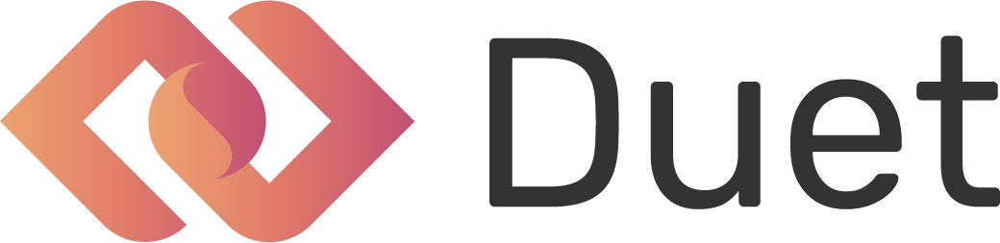

🎤  🎸  ♪♪♪ Starting Duet ♫♫♫  🎻  🎹

♫♫♫ > DISCLAIMER: Duet is an experimental feature currently in beta.
♫♫♫ > Use at your own risk.


    > ❤️ Love Duet? Please consider supporting our community!
    > https://github.com/sponsors/OpenMined

♫♫♫ > Punching through firewall to OpenGrid Network Node at:
♫♫♫ > http://ec2-18-216-8-163.us-east-2.compute.amazonaws.com:5000
♫♫♫ >
♫♫♫ > ...waiting for response from OpenGrid Network... 
♫♫♫ > DONE!

♫♫♫ > STEP 1: Send the following code to your Duet Partner!

import syft as sy
duet = sy.join_duet(loopback=True)

♫♫♫ > Connecting...

♫♫♫ > CONNECTED!

♫♫♫ > DUET LIVE STATUS  -  Objects: 0  Requests: 0   Messages: 0  Request Handlers: 0                                torch.Size([25000, 392])


In [3]:
import syft as sy
duet = sy.duet(loopback=True)

In [4]:
def split_data(dataset, worker_list=None, n_workers=2):

    if worker_list is None:
        worker_list = list(range(0, n_workers))
            
    #counter to create the index of different data samples
    idx = 0 
    
    #dictionary to accomodate the split data
    dic_single_datasets = {}
    for worker in worker_list: 
        """
        Each value is a list of three elements, to accomodate, in order: 
        - data examples (as tensors)
        - label
        - index 
        """
        dic_single_datasets[worker] = [] 

    """
    Loop through the dataset to split the data and labels vertically across workers. 
    Splitting method from @abbas5253: https://github.com/abbas5253/SplitNN-for-Vertically-Partitioned-Data/blob/master/distribute_data.py
    """
    label_list = []
    index_list = []
    index_list_UUID = []
    for tensor, label in dataset:
        height = tensor.shape[-1]//len(worker_list)
        i = 0
        uuid_idx = uuid4()
        for worker in worker_list[:-1]: 
            dic_single_datasets[worker].append(tensor[:, :, height * i : height * (i + 1)])
            i += 1
            
        #add the value of the last worker / split
        dic_single_datasets[worker_list[-1]].append(tensor[:, :, height * (i) : ])
        label_list.append(torch.Tensor([label]))
        index_list_UUID.append(uuid_idx)
        index_list.append(torch.Tensor([idx]))
        
        idx += 1
        
    return dic_single_datasets, label_list, index_list, index_list_UUID

In [5]:
from six.moves import urllib
opener = urllib.request.build_opener()
opener.addheaders = [('User-agent', 'Mozilla/5.0')]
urllib.request.install_opener(opener)

transform = transforms.Compose([transforms.ToTensor(),
                              transforms.Normalize((0.5,), (0.5,)),
                              ])
trainset = datasets.MNIST('mnist', download=True, train=True, transform=transform)

In [6]:
valset = datasets.MNIST('mnist', download=True, train=False, transform=transform)

In [7]:
img, _, _, _ = split_data(trainset)
img = torch.cat(img[1][:25_000])
img_rshp = img.view(img.shape[0], -1)
print(img_rshp.shape)

In [8]:
val_img, _, _, _ = split_data(valset)
val_img = torch.cat(val_img[1][:5_000])
val_img_rshp = val_img.view(val_img.shape[0], -1)
print(val_img_rshp.shape)

torch.Size([5000, 392])


In [9]:
img_rshp.send(duet, searchable=True, tags=["flatten"], description="flattened")
val_img_rshp.send(duet, searchable=True, tags=["flatten_val"], description="flattened")

In [10]:
duet.requests.add_handler(action="accept", tags=[""])

[2021-03-08T07:11:10.847874+0000][CRITICAL][logger]][35100] You are not Authorized to access this service
[2021-03-08T07:11:10.848204+0000][CRITICAL][logger]][35100] You are not Authorized to access this service
[2021-03-08T07:11:10.848373+0000][CRITICAL][logger]][35100] You are not Authorized to access this service
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...his service')>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...his service')>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/nest_asyncio.py", line 199, in run
    ctx.run(self._callback, *self._args)
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py", line 62, in _callback
   

[2021-03-08T07:11:17.863339+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5171f7de465145d29665dce347a93a9b>.
[2021-03-08T07:11:17.885713+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 202094a6a72e4035bfd5c41fd808e1e5> <UID: 202094a6a72e4035bfd5c41fd808e1e5>
[2021-03-08T07:11:17.885990+0000][CRITICAL][logger]][35100] <UID: 202094a6a72e4035bfd5c41fd808e1e5>
[2021-03-08T07:11:17.886167+0000][CRITICAL][logger]][35100] <UID: 202094a6a72e4035bfd5c41fd808e1e5>
[2021-03-08T07:11:17.886323+0000][CRITICAL][logger]][35100] <UID: 202094a6a72e4035bfd5c41fd808e1e5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...41fd808e1e5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...41fd808e1e5>)>) at /Users/adamhall/anaconda3/env

[2021-03-08T07:11:18.194557+0000][CRITICAL][logger]][35100] <UID: 7ec3908da00748a2ab3436eab1c9aa55>
[2021-03-08T07:11:18.194708+0000][CRITICAL][logger]][35100] <UID: 7ec3908da00748a2ab3436eab1c9aa55>
[2021-03-08T07:11:18.200534+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a29e6c63ce2e4f30a5a4c82ecc8434c4>.
[2021-03-08T07:11:18.469428+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 50359218a2ba468fb97d483e96ccb2fe>.
[2021-03-08T07:11:18.493003+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2d776ada2b7946349e5aad43aa183fc0> <UID: 2d776ada2b7946349e5aad43aa183fc0>
[2021-03-08T07:11:18.493172+0000][CRITICAL][logger]][35100] <UID: 2d776ada2b7946349e5aad43aa183fc0>
[2021-03-08T07:11:18.493279+0000][CRITICAL][logger]][35100] <UID: 2d776ada2b7946349e5aad43aa183fc0>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:11:18.790809+0000][CRITICAL][logger]][35100] <UID: 2d5dba210ceb4904a3ccc8badf992af4>
[2021-03-08T07:11:18.790900+0000][CRITICAL][logger]][35100] <UID: 2d5dba210ceb4904a3ccc8badf992af4>
[2021-03-08T07:11:18.796464+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d04b7a262897447d8753eee6ba408cd2>.
[2021-03-08T07:11:19.073070+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a4dd21fdf5894bf2bdb28299c298a261>.
[2021-03-08T07:11:19.097157+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4aed7dd7fcb946739ec24882394fc6dc> <UID: 4aed7dd7fcb946739ec24882394fc6dc>
[2021-03-08T07:11:19.097328+0000][CRITICAL][logger]][35100] <UID: 4aed7dd7fcb946739ec24882394fc6dc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...882394fc6dc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:19.395107+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7c00e82ac3404288b92aa6c692f58eea>.
[2021-03-08T07:11:19.657258+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a101a78d90244a9f856d772007138330>.
[2021-03-08T07:11:19.680415+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c56d9c5661874dd2a9ab765d95f87220> <UID: c56d9c5661874dd2a9ab765d95f87220>
[2021-03-08T07:11:19.680584+0000][CRITICAL][logger]][35100] <UID: c56d9c5661874dd2a9ab765d95f87220>
[2021-03-08T07:11:19.680691+0000][CRITICAL][logger]][35100] <UID: c56d9c5661874dd2a9ab765d95f87220>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...65d95f87220>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:19.966344+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 01587a33bb4e435f9c11cdf14c55618f>.
[2021-03-08T07:11:20.227230+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 30b889e1f17b4b78ab3710dcd1eb8189>.
[2021-03-08T07:11:20.250958+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 135ded65919a405a9e9eea759e3e3377> <UID: 135ded65919a405a9e9eea759e3e3377>
[2021-03-08T07:11:20.251127+0000][CRITICAL][logger]][35100] <UID: 135ded65919a405a9e9eea759e3e3377>
[2021-03-08T07:11:20.251234+0000][CRITICAL][logger]][35100] <UID: 135ded65919a405a9e9eea759e3e3377>
[2021-03-08T07:11:20.251320+0000][CRITICAL][logger]][35100] <UID: 135ded65919a405a9e9eea759e3e3377>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a759e3e3377>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:20.550937+0000][CRITICAL][logger]][35100] <UID: c0164d6c365c4a37a42039b9143d9a44>
[2021-03-08T07:11:20.551051+0000][CRITICAL][logger]][35100] <UID: c0164d6c365c4a37a42039b9143d9a44>
[2021-03-08T07:11:20.551139+0000][CRITICAL][logger]][35100] <UID: c0164d6c365c4a37a42039b9143d9a44>
[2021-03-08T07:11:20.556503+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3d7dac18fd6b4c1eb7e161c9c502fde8>.
[2021-03-08T07:11:20.831551+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3ad4508a54804c05800da2980b873b8b>.
[2021-03-08T07:11:20.854621+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: dd91a799a5c64bcb9ab41dc02d664119> <UID: dd91a799a5c64bcb9ab41dc02d664119>
[2021-03-08T07:11:20.854790+0000][CRITICAL][logger]][35100] <UID: dd91a799a5c64bcb9ab41dc02d664119>
[2021-03-08T07:11:20.854902+0000][CRITICAL][logger]

[2021-03-08T07:11:21.139995+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b432bee1a33243398aa2988d088dcfea>.
[2021-03-08T07:11:21.382682+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c04a536392df4060a6040f70d497751b>.
[2021-03-08T07:11:21.405031+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2ac28b5f29eb4d60997d58c1a766445a> <UID: 2ac28b5f29eb4d60997d58c1a766445a>
[2021-03-08T07:11:21.405217+0000][CRITICAL][logger]][35100] <UID: 2ac28b5f29eb4d60997d58c1a766445a>
[2021-03-08T07:11:21.405332+0000][CRITICAL][logger]][35100] <UID: 2ac28b5f29eb4d60997d58c1a766445a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8c1a766445a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:21.678274+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 169344e7a37e42e8b8d75fbf832145dd>.
[2021-03-08T07:11:21.917845+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f54c936106e943e09c248f8d877afdcd>.
[2021-03-08T07:11:21.940617+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 35cdfca170d24e2d83e3495aa48be998> <UID: 35cdfca170d24e2d83e3495aa48be998>
[2021-03-08T07:11:21.940865+0000][CRITICAL][logger]][35100] <UID: 35cdfca170d24e2d83e3495aa48be998>
[2021-03-08T07:11:21.941010+0000][CRITICAL][logger]][35100] <UID: 35cdfca170d24e2d83e3495aa48be998>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...95aa48be998>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:22.217011+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: de33e2a21fd44adeb93fe278a94040ce>.
[2021-03-08T07:11:22.462863+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 03b630661d4346bb87920e1a571c31bf>.
[2021-03-08T07:11:22.484602+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7e52790de3d8427ab43aef476781c077> <UID: 7e52790de3d8427ab43aef476781c077>
[2021-03-08T07:11:22.484777+0000][CRITICAL][logger]][35100] <UID: 7e52790de3d8427ab43aef476781c077>
[2021-03-08T07:11:22.484892+0000][CRITICAL][logger]][35100] <UID: 7e52790de3d8427ab43aef476781c077>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f476781c077>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:22.771123+0000][CRITICAL][logger]][35100] <UID: 0c0471261ffe4e50853f75753a9774ac>
[2021-03-08T07:11:22.777815+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4a29398086a24c1e915553ade9a66700>.
[2021-03-08T07:11:23.016491+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5dfe9764e8264738b3ad76049abbfda4>.
[2021-03-08T07:11:23.037803+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5fe2d3bfe952480c987154d938231235> <UID: 5fe2d3bfe952480c987154d938231235>
[2021-03-08T07:11:23.038000+0000][CRITICAL][logger]][35100] <UID: 5fe2d3bfe952480c987154d938231235>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4d938231235>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:23.327596+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 197dbb02581c4a74ae5556bff019239c>.
[2021-03-08T07:11:23.586203+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 70eabf0c3e864d839673ec0b8520bdad>.
[2021-03-08T07:11:23.610681+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8f44b1a82d8343dca1d3a50867906f84> <UID: 8f44b1a82d8343dca1d3a50867906f84>
[2021-03-08T07:11:23.611044+0000][CRITICAL][logger]][35100] <UID: 8f44b1a82d8343dca1d3a50867906f84>
[2021-03-08T07:11:23.611222+0000][CRITICAL][logger]][35100] <UID: 8f44b1a82d8343dca1d3a50867906f84>
[2021-03-08T07:11:23.611377+0000][CRITICAL][logger]][35100] <UID: 8f44b1a82d8343dca1d3a50867906f84>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...50867906f84>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:23.886209+0000][CRITICAL][logger]][35100] <UID: 6ef48b692efe486b8c806917bce2201e>
[2021-03-08T07:11:23.886305+0000][CRITICAL][logger]][35100] <UID: 6ef48b692efe486b8c806917bce2201e>
[2021-03-08T07:11:23.891207+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d24c29507e17479c994aaf50132629f3>.
[2021-03-08T07:11:24.138305+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6eb481bedd2740749e91aead8a083b15>.
[2021-03-08T07:11:24.159390+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c9624197055d47c49bbf6c69cb3fb39a> <UID: c9624197055d47c49bbf6c69cb3fb39a>
[2021-03-08T07:11:24.159561+0000][CRITICAL][logger]][35100] <UID: c9624197055d47c49bbf6c69cb3fb39a>
[2021-03-08T07:11:24.159675+0000][CRITICAL][logger]][35100] <UID: c9624197055d47c49bbf6c69cb3fb39a>
[2021-03-08T07:11:24.159764+0000][CRITICAL][logger]

[2021-03-08T07:11:24.436552+0000][CRITICAL][logger]][35100] <UID: 75cb59169f2f4afb8143e9862b226d34>
[2021-03-08T07:11:24.441899+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1e592563c07f4bb493d0262ff8c6c544>.
[2021-03-08T07:11:24.689207+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0b6e04f5c709437396f00339393af13e>.
[2021-03-08T07:11:24.709417+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3469a90897bd4534aed4c7bd2eec431c> <UID: 3469a90897bd4534aed4c7bd2eec431c>
[2021-03-08T07:11:24.709586+0000][CRITICAL][logger]][35100] <UID: 3469a90897bd4534aed4c7bd2eec431c>
[2021-03-08T07:11:24.709696+0000][CRITICAL][logger]][35100] <UID: 3469a90897bd4534aed4c7bd2eec431c>
[2021-03-08T07:11:24.709781+0000][CRITICAL][logger]][35100] <UID: 3469a90897bd4534aed4c7bd2eec431c>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:11:24.996569+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1ad98b13517a47028c8d45ce694f5a85>.
[2021-03-08T07:11:25.235651+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 601833aee8384dfc969a9b6c743f14f2>.
[2021-03-08T07:11:25.257434+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3f1999278d0d4d2aadec3ebb3c28926a> <UID: 3f1999278d0d4d2aadec3ebb3c28926a>
[2021-03-08T07:11:25.257605+0000][CRITICAL][logger]][35100] <UID: 3f1999278d0d4d2aadec3ebb3c28926a>
[2021-03-08T07:11:25.257718+0000][CRITICAL][logger]][35100] <UID: 3f1999278d0d4d2aadec3ebb3c28926a>
[2021-03-08T07:11:25.257808+0000][CRITICAL][logger]][35100] <UID: 3f1999278d0d4d2aadec3ebb3c28926a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ebb3c28926a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:25.530837+0000][CRITICAL][logger]][35100] <UID: c79865144a1c4a43b53fe4e7edfdb67e>
[2021-03-08T07:11:25.537132+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b4ff866f6c084a44b54a3caf4a35a5fa>.
[2021-03-08T07:11:25.806184+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 43564cebe661407f893cbda69eb49314>.
[2021-03-08T07:11:25.827895+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5d623cbe9e13482c9e354c452b936929> <UID: 5d623cbe9e13482c9e354c452b936929>
[2021-03-08T07:11:25.828093+0000][CRITICAL][logger]][35100] <UID: 5d623cbe9e13482c9e354c452b936929>
[2021-03-08T07:11:25.828201+0000][CRITICAL][logger]][35100] <UID: 5d623cbe9e13482c9e354c452b936929>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c452b936929>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:26.132127+0000][CRITICAL][logger]][35100] <UID: 5656a71a0fc44fe69a1bd786eee7d9c3>
[2021-03-08T07:11:26.132236+0000][CRITICAL][logger]][35100] <UID: 5656a71a0fc44fe69a1bd786eee7d9c3>
[2021-03-08T07:11:26.132332+0000][CRITICAL][logger]][35100] <UID: 5656a71a0fc44fe69a1bd786eee7d9c3>
[2021-03-08T07:11:26.137275+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 53d8c378b4554c72a3fac2581b4e5c44>.
[2021-03-08T07:11:26.421560+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 96e2fcf937384cebb28c5f416ab47f56>.
[2021-03-08T07:11:26.444863+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 996a933e33f348f8900a0d7ba30dac7f> <UID: 996a933e33f348f8900a0d7ba30dac7f>
[2021-03-08T07:11:26.445045+0000][CRITICAL][logger]][35100] <UID: 996a933e33f348f8900a0d7ba30dac7f>
[2021-03-08T07:11:26.445168+0000][CRITICAL][logger]

[2021-03-08T07:11:26.748858+0000][CRITICAL][logger]][35100] <UID: 706f984769b44f4dbc18c1551a337d4e>
[2021-03-08T07:11:26.754012+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 41b62a24c1b3450d9a2754b5b0999e38>.
[2021-03-08T07:11:27.025455+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 11050649a9854fd09fc6536240a97a9f>.
[2021-03-08T07:11:27.052790+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2af28560847d4afaae7c5d11c8076ee5> <UID: 2af28560847d4afaae7c5d11c8076ee5>
[2021-03-08T07:11:27.052964+0000][CRITICAL][logger]][35100] <UID: 2af28560847d4afaae7c5d11c8076ee5>
[2021-03-08T07:11:27.053073+0000][CRITICAL][logger]][35100] <UID: 2af28560847d4afaae7c5d11c8076ee5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d11c8076ee5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:27.357303+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2e51bd27aa6546afb8ae8f19c9eef187>.
[2021-03-08T07:11:27.630238+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 14b3c6a1baf54072bc9918509d4296b6>.
[2021-03-08T07:11:27.652827+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ede525314c31444e85e080cd22be80f8> <UID: ede525314c31444e85e080cd22be80f8>
[2021-03-08T07:11:27.653026+0000][CRITICAL][logger]][35100] <UID: ede525314c31444e85e080cd22be80f8>
[2021-03-08T07:11:27.653156+0000][CRITICAL][logger]][35100] <UID: ede525314c31444e85e080cd22be80f8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0cd22be80f8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:27.942456+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5727d77f680143f59fa58d34526e4271>.
[2021-03-08T07:11:28.216751+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d88ed777659948b8ade604e9299b748e>.
[2021-03-08T07:11:28.239075+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6c9e1d80b2e44d58bf92f298abb535a5> <UID: 6c9e1d80b2e44d58bf92f298abb535a5>
[2021-03-08T07:11:28.239243+0000][CRITICAL][logger]][35100] <UID: 6c9e1d80b2e44d58bf92f298abb535a5>
[2021-03-08T07:11:28.239351+0000][CRITICAL][logger]][35100] <UID: 6c9e1d80b2e44d58bf92f298abb535a5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...298abb535a5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:28.546815+0000][CRITICAL][logger]][35100] <UID: 9191c783912c42a1af3dedeccc40bbeb>
[2021-03-08T07:11:28.546926+0000][CRITICAL][logger]][35100] <UID: 9191c783912c42a1af3dedeccc40bbeb>
[2021-03-08T07:11:28.547012+0000][CRITICAL][logger]][35100] <UID: 9191c783912c42a1af3dedeccc40bbeb>
[2021-03-08T07:11:28.552239+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ec356fbba0af475f8ac87c5b05e18e01>.
[2021-03-08T07:11:28.826071+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 35d0c321f656456c9275e0fc1a6057f7>.
[2021-03-08T07:11:28.849135+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ed5fc855697a45f787f3f512134a824c> <UID: ed5fc855697a45f787f3f512134a824c>
[2021-03-08T07:11:28.849302+0000][CRITICAL][logger]][35100] <UID: ed5fc855697a45f787f3f512134a824c>
[2021-03-08T07:11:28.849452+0000][CRITICAL][logger]

[2021-03-08T07:11:29.153898+0000][CRITICAL][logger]][35100] <UID: 2c01f8530ea345c99563f0f6dd56f080>
[2021-03-08T07:11:29.159181+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e0ad2f838e9f4f3983f90cde6525f8b0>.
[2021-03-08T07:11:29.427714+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 34ad6e49e8784be7b6c2444f6709861e>.
[2021-03-08T07:11:29.450803+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 513367f5d08e4574b945cc2f2be7f011> <UID: 513367f5d08e4574b945cc2f2be7f011>
[2021-03-08T07:11:29.450969+0000][CRITICAL][logger]][35100] <UID: 513367f5d08e4574b945cc2f2be7f011>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c2f2be7f011>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:29.759792+0000][CRITICAL][logger]][35100] <UID: 5292339d172f4390a72b6e53e75db318>
[2021-03-08T07:11:29.765091+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 94b575a0172d469687e1057e446c6219>.
[2021-03-08T07:11:30.044001+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6d3039c1196747cfa66520a880376676>.
[2021-03-08T07:11:30.066885+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4262f682776f48b5ad2c9bf8f399128b> <UID: 4262f682776f48b5ad2c9bf8f399128b>
[2021-03-08T07:11:30.067049+0000][CRITICAL][logger]][35100] <UID: 4262f682776f48b5ad2c9bf8f399128b>
[2021-03-08T07:11:30.067155+0000][CRITICAL][logger]][35100] <UID: 4262f682776f48b5ad2c9bf8f399128b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bf8f399128b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:30.371631+0000][CRITICAL][logger]][35100] <UID: 0843d27c751d4ab8a022c8be7e964a74>
[2021-03-08T07:11:30.377151+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b81d4a9e11d64acdb7e19932b10b0668>.
[2021-03-08T07:11:30.642607+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7666f53c04fe4b2392de63ad012d5cbb>.
[2021-03-08T07:11:30.665064+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c37570ff7e6d4954a9b0ff25f7571c0e> <UID: c37570ff7e6d4954a9b0ff25f7571c0e>
[2021-03-08T07:11:30.665344+0000][CRITICAL][logger]][35100] <UID: c37570ff7e6d4954a9b0ff25f7571c0e>
[2021-03-08T07:11:30.665479+0000][CRITICAL][logger]][35100] <UID: c37570ff7e6d4954a9b0ff25f7571c0e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f25f7571c0e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:30.977681+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0473582bf0c145188fdee8a0f1f06619>.
[2021-03-08T07:11:31.248740+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 87dd595610794162adbbc151c5013d55>.
[2021-03-08T07:11:31.270094+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 62c243bb721740ae81a1ccfa8c70d56d> <UID: 62c243bb721740ae81a1ccfa8c70d56d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...cfa8c70d56d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...cfa8c70d56d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:11:31.586127+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b31ec10202824d659fa271e6443bdc63>.
[2021-03-08T07:11:31.849684+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ccf71d8718fd4ea69f600b8f9566af84>.
[2021-03-08T07:11:31.877368+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f537e002542c4d59a0481657b92f7f0f> <UID: f537e002542c4d59a0481657b92f7f0f>
[2021-03-08T07:11:31.877572+0000][CRITICAL][logger]][35100] <UID: f537e002542c4d59a0481657b92f7f0f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...657b92f7f0f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...657b92f7f0f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:11:32.171759+0000][CRITICAL][logger]][35100] <UID: 22f8335f77be4a86b8cac98f1d718218>
[2021-03-08T07:11:32.177915+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0250e5c28dbd4267a1554ec84805c5d1>.
[2021-03-08T07:11:32.431761+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 576c11448f1843febd65814cd4267246>.
[2021-03-08T07:11:32.454227+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4e81a29ab7e94c6ba2673ddc5f522d14> <UID: 4e81a29ab7e94c6ba2673ddc5f522d14>
[2021-03-08T07:11:32.454439+0000][CRITICAL][logger]][35100] <UID: 4e81a29ab7e94c6ba2673ddc5f522d14>
[2021-03-08T07:11:32.454632+0000][CRITICAL][logger]][35100] <UID: 4e81a29ab7e94c6ba2673ddc5f522d14>
[2021-03-08T07:11:32.454737+0000][CRITICAL][logger]][35100] <UID: 4e81a29ab7e94c6ba2673ddc5f522d14>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:11:32.746585+0000][CRITICAL][logger]][35100] <UID: 3da01966c3d3449d8edc12ddd7915c65>
[2021-03-08T07:11:32.752389+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 15d38d9c5cd9401489a37d6f735ff18d>.
[2021-03-08T07:11:33.032191+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: df667ee00acb4dc3a0eb0122d477d82a>.
[2021-03-08T07:11:33.054686+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9f535e6c35144cadb9c5f8bcb9ba2779> <UID: 9f535e6c35144cadb9c5f8bcb9ba2779>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8bcb9ba2779>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8bcb9ba2779>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:11:33.366662+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0d2739d3720349de89cca14892ef1124>.
[2021-03-08T07:11:33.628394+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 49bda49d380e41da85041ed1c3850821>.
[2021-03-08T07:11:33.652779+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 05a84439b5d54d7088f635aba74c3296> <UID: 05a84439b5d54d7088f635aba74c3296>
[2021-03-08T07:11:33.652962+0000][CRITICAL][logger]][35100] <UID: 05a84439b5d54d7088f635aba74c3296>
[2021-03-08T07:11:33.653066+0000][CRITICAL][logger]][35100] <UID: 05a84439b5d54d7088f635aba74c3296>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5aba74c3296>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:33.959315+0000][CRITICAL][logger]][35100] <UID: 98401de3e0b94d3da2a2c4c5ed239a01>
[2021-03-08T07:11:33.964841+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 177ed10777f84fb1bac665282e61fa07>.
[2021-03-08T07:11:34.244333+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 40b308a268b24f63a134042b9eb9fc60>.
[2021-03-08T07:11:34.269059+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 24ad9bf1f44246228bf31d793d6fc15b> <UID: 24ad9bf1f44246228bf31d793d6fc15b>
[2021-03-08T07:11:34.269242+0000][CRITICAL][logger]][35100] <UID: 24ad9bf1f44246228bf31d793d6fc15b>
[2021-03-08T07:11:34.269362+0000][CRITICAL][logger]][35100] <UID: 24ad9bf1f44246228bf31d793d6fc15b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d793d6fc15b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:34.570533+0000][CRITICAL][logger]][35100] <UID: 749ef32bb8684e4e9e47a47d642d7e01>
[2021-03-08T07:11:34.570648+0000][CRITICAL][logger]][35100] <UID: 749ef32bb8684e4e9e47a47d642d7e01>
[2021-03-08T07:11:34.570736+0000][CRITICAL][logger]][35100] <UID: 749ef32bb8684e4e9e47a47d642d7e01>
[2021-03-08T07:11:34.574351+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4e8261b4a0474240a214b438ecc0d511>.
[2021-03-08T07:11:34.846608+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 19ae490d88514d15af0e1c880b07377b>.
[2021-03-08T07:11:34.868432+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4aa18c7760f74280b0d0d96b069dbf37> <UID: 4aa18c7760f74280b0d0d96b069dbf37>
[2021-03-08T07:11:34.868599+0000][CRITICAL][logger]][35100] <UID: 4aa18c7760f74280b0d0d96b069dbf37>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:11:35.183219+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 058396e0d134451db67bfc899bfddb8b>.
[2021-03-08T07:11:35.461512+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2f3e984985e74736b9bd9fdda7bf169b>.
[2021-03-08T07:11:35.483613+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fd2999d7776f4039913b09c25c36b5de> <UID: fd2999d7776f4039913b09c25c36b5de>
[2021-03-08T07:11:35.483782+0000][CRITICAL][logger]][35100] <UID: fd2999d7776f4039913b09c25c36b5de>
[2021-03-08T07:11:35.483892+0000][CRITICAL][logger]][35100] <UID: fd2999d7776f4039913b09c25c36b5de>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9c25c36b5de>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:35.792011+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f0c6ff61434442929d52abb1e53e1154>.
[2021-03-08T07:11:36.062043+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 26f9db67a58c40e2b49c7587fb12adf9>.
[2021-03-08T07:11:36.085416+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bafc7dabf31946aeaa39b52fdcfe2800> <UID: bafc7dabf31946aeaa39b52fdcfe2800>
[2021-03-08T07:11:36.085590+0000][CRITICAL][logger]][35100] <UID: bafc7dabf31946aeaa39b52fdcfe2800>
[2021-03-08T07:11:36.085709+0000][CRITICAL][logger]][35100] <UID: bafc7dabf31946aeaa39b52fdcfe2800>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...52fdcfe2800>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:36.383634+0000][CRITICAL][logger]][35100] <UID: cb78e11fb27445b8a69839935dadc7f1>
[2021-03-08T07:11:36.383718+0000][CRITICAL][logger]][35100] <UID: cb78e11fb27445b8a69839935dadc7f1>
[2021-03-08T07:11:36.389002+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a5f0b7aedb2746de9e229cba0c23c6b1>.
[2021-03-08T07:11:36.663675+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ddc8ae186edd45409f323b13fa1ee766>.
[2021-03-08T07:11:36.685331+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 036e898f255544aaae580e02bd3d2f99> <UID: 036e898f255544aaae580e02bd3d2f99>
[2021-03-08T07:11:36.685497+0000][CRITICAL][logger]][35100] <UID: 036e898f255544aaae580e02bd3d2f99>
[2021-03-08T07:11:36.685603+0000][CRITICAL][logger]][35100] <UID: 036e898f255544aaae580e02bd3d2f99>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:11:36.981451+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d718808fd5284870884f59c0c1a4b1cb>.
[2021-03-08T07:11:37.257893+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f8bef4184b5142ecb56393a94304f23b>.
[2021-03-08T07:11:37.283383+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 913b15677e1d4e3d9addd6e0ffb2c6a2> <UID: 913b15677e1d4e3d9addd6e0ffb2c6a2>
[2021-03-08T07:11:37.283573+0000][CRITICAL][logger]][35100] <UID: 913b15677e1d4e3d9addd6e0ffb2c6a2>
[2021-03-08T07:11:37.283693+0000][CRITICAL][logger]][35100] <UID: 913b15677e1d4e3d9addd6e0ffb2c6a2>
[2021-03-08T07:11:37.283824+0000][CRITICAL][logger]][35100] <UID: 913b15677e1d4e3d9addd6e0ffb2c6a2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6e0ffb2c6a2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:37.581657+0000][CRITICAL][logger]][35100] <UID: 15d0d73cf165454db227b79e001a19d8>
[2021-03-08T07:11:37.581764+0000][CRITICAL][logger]][35100] <UID: 15d0d73cf165454db227b79e001a19d8>
[2021-03-08T07:11:37.581848+0000][CRITICAL][logger]][35100] <UID: 15d0d73cf165454db227b79e001a19d8>
[2021-03-08T07:11:37.585557+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 781e50d51d1f46b5b2a9d26fc10af152>.
[2021-03-08T07:11:37.859259+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6c3722dab8934ea09f9ebe1c012478f0>.
[2021-03-08T07:11:37.882565+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: daf09c210e5b415b9c5e75a8117628c2> <UID: daf09c210e5b415b9c5e75a8117628c2>
[2021-03-08T07:11:37.882736+0000][CRITICAL][logger]][35100] <UID: daf09c210e5b415b9c5e75a8117628c2>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:11:38.179253+0000][CRITICAL][logger]][35100] <UID: e63844875827402aa4a1d509be9b6f32>
[2021-03-08T07:11:38.186026+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a6412f13d4ee4629bb88b10df8c6f097>.
[2021-03-08T07:11:38.462590+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a6336ce07eaa421ba07d02c00a73d0e7>.
[2021-03-08T07:11:38.486792+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 082d0158eff34c07ae29a7106de07902> <UID: 082d0158eff34c07ae29a7106de07902>
[2021-03-08T07:11:38.486959+0000][CRITICAL][logger]][35100] <UID: 082d0158eff34c07ae29a7106de07902>
[2021-03-08T07:11:38.487069+0000][CRITICAL][logger]][35100] <UID: 082d0158eff34c07ae29a7106de07902>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7106de07902>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:38.785737+0000][CRITICAL][logger]][35100] <UID: 07f7badd28d443da8a3bed6dc06b6efd>
[2021-03-08T07:11:38.790956+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9e3eaf56da8a433fb2d946be2aa1976b>.
[2021-03-08T07:11:39.061020+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ce1a6d2befda4f6ab2c624210181e15f>.
[2021-03-08T07:11:39.082632+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c69a4751b2c340ec86fba3e042cb7608> <UID: c69a4751b2c340ec86fba3e042cb7608>
[2021-03-08T07:11:39.082798+0000][CRITICAL][logger]][35100] <UID: c69a4751b2c340ec86fba3e042cb7608>
[2021-03-08T07:11:39.082898+0000][CRITICAL][logger]][35100] <UID: c69a4751b2c340ec86fba3e042cb7608>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3e042cb7608>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:39.390237+0000][CRITICAL][logger]][35100] <UID: a761c10901034c3d9c948212aacd6fa2>
[2021-03-08T07:11:39.390338+0000][CRITICAL][logger]][35100] <UID: a761c10901034c3d9c948212aacd6fa2>
[2021-03-08T07:11:39.396171+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e9a715ab72af4e7c8c7a6b68389b055b>.
[2021-03-08T07:11:39.667959+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 83dc4cacda844446928fe63829ccb688>.
[2021-03-08T07:11:39.690198+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4df00ec449214b7a9209147e6098e8b9> <UID: 4df00ec449214b7a9209147e6098e8b9>
[2021-03-08T07:11:39.690364+0000][CRITICAL][logger]][35100] <UID: 4df00ec449214b7a9209147e6098e8b9>
[2021-03-08T07:11:39.690477+0000][CRITICAL][logger]][35100] <UID: 4df00ec449214b7a9209147e6098e8b9>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:11:39.995834+0000][CRITICAL][logger]][35100] <UID: 0acf56e2d350471da283c692a0af6d3f>
[2021-03-08T07:11:40.001377+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e7d5625d52394aa6ac4afb4790253b0a>.
[2021-03-08T07:11:40.264210+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8aca5f71c33343ae8d7ee2ff99b1522a>.
[2021-03-08T07:11:40.286654+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 50fadf4685a747e28d8a229d2ee722d6> <UID: 50fadf4685a747e28d8a229d2ee722d6>
[2021-03-08T07:11:40.286839+0000][CRITICAL][logger]][35100] <UID: 50fadf4685a747e28d8a229d2ee722d6>
[2021-03-08T07:11:40.286952+0000][CRITICAL][logger]][35100] <UID: 50fadf4685a747e28d8a229d2ee722d6>
[2021-03-08T07:11:40.287040+0000][CRITICAL][logger]][35100] <UID: 50fadf4685a747e28d8a229d2ee722d6>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:11:40.591297+0000][CRITICAL][logger]][35100] <UID: 72366dc0825046b79550ac22807ad5b6>
[2021-03-08T07:11:40.591410+0000][CRITICAL][logger]][35100] <UID: 72366dc0825046b79550ac22807ad5b6>
[2021-03-08T07:11:40.591500+0000][CRITICAL][logger]][35100] <UID: 72366dc0825046b79550ac22807ad5b6>
[2021-03-08T07:11:40.597139+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ab3c8486a46e4b3a8b3a696b37c17e99>.
[2021-03-08T07:11:40.878050+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e17e9a2b277342b9aad93e85fbddb782>.
[2021-03-08T07:11:40.900586+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f2206894215d4204acffa9a02ad7aec2> <UID: f2206894215d4204acffa9a02ad7aec2>
[2021-03-08T07:11:40.900758+0000][CRITICAL][logger]][35100] <UID: f2206894215d4204acffa9a02ad7aec2>
[2021-03-08T07:11:40.900864+0000][CRITICAL][logger]

[2021-03-08T07:11:41.208688+0000][CRITICAL][logger]][35100] <UID: 17e4e52ae1e447ba92ddb625f4eb2a8e>
[2021-03-08T07:11:41.208795+0000][CRITICAL][logger]][35100] <UID: 17e4e52ae1e447ba92ddb625f4eb2a8e>
[2021-03-08T07:11:41.208878+0000][CRITICAL][logger]][35100] <UID: 17e4e52ae1e447ba92ddb625f4eb2a8e>
[2021-03-08T07:11:41.214325+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7a89e2b0a17a46968df95d722d374cc2>.
[2021-03-08T07:11:41.485197+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f9bff0aac8ab49ed99cf8ea86a284eb4>.
[2021-03-08T07:11:41.506525+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: eb1775d8ca884fa1b208167b52059d3a> <UID: eb1775d8ca884fa1b208167b52059d3a>
[2021-03-08T07:11:41.506696+0000][CRITICAL][logger]][35100] <UID: eb1775d8ca884fa1b208167b52059d3a>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:11:41.810080+0000][CRITICAL][logger]][35100] <UID: a338cf9210754f2fa7b9c9ab32f9496f>
[2021-03-08T07:11:41.815543+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 998e142d37f0490d9b0e1690185c5ba2>.
[2021-03-08T07:11:42.092582+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 59b6ff7e4b594dddb58d51c54db81cf1>.
[2021-03-08T07:11:42.116955+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ec5100d945354710842c1c5a3b11857f> <UID: ec5100d945354710842c1c5a3b11857f>
[2021-03-08T07:11:42.117188+0000][CRITICAL][logger]][35100] <UID: ec5100d945354710842c1c5a3b11857f>
[2021-03-08T07:11:42.117306+0000][CRITICAL][logger]][35100] <UID: ec5100d945354710842c1c5a3b11857f>
[2021-03-08T07:11:42.117401+0000][CRITICAL][logger]][35100] <UID: ec5100d945354710842c1c5a3b11857f>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:11:42.428874+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9e93145167984f0387198b016cf4e883>.
[2021-03-08T07:11:42.691440+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0ec28a56809e49e1ad12a12e508f5440>.
[2021-03-08T07:11:42.715469+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2ff1ea60f6b7459daaaea8a2eddc8b1b> <UID: 2ff1ea60f6b7459daaaea8a2eddc8b1b>
[2021-03-08T07:11:42.715655+0000][CRITICAL][logger]][35100] <UID: 2ff1ea60f6b7459daaaea8a2eddc8b1b>
[2021-03-08T07:11:42.715774+0000][CRITICAL][logger]][35100] <UID: 2ff1ea60f6b7459daaaea8a2eddc8b1b>
[2021-03-08T07:11:42.715866+0000][CRITICAL][logger]][35100] <UID: 2ff1ea60f6b7459daaaea8a2eddc8b1b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8a2eddc8b1b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:43.020618+0000][CRITICAL][logger]][35100] <UID: 7101f71f289a4530a4b6d7c0e84cd251>
[2021-03-08T07:11:43.026326+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bd05c8f1695b49d999c3172449b604df>.
[2021-03-08T07:11:43.304668+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fe696de30b704ba7a7f977362fa7f9f0>.
[2021-03-08T07:11:43.328058+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 198bd46c399241cc94c2dfda173c3af3> <UID: 198bd46c399241cc94c2dfda173c3af3>
[2021-03-08T07:11:43.328227+0000][CRITICAL][logger]][35100] <UID: 198bd46c399241cc94c2dfda173c3af3>
[2021-03-08T07:11:43.328369+0000][CRITICAL][logger]][35100] <UID: 198bd46c399241cc94c2dfda173c3af3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fda173c3af3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:43.640901+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a39f8a8c1e71469090bcf3b56c668596>.
[2021-03-08T07:11:43.909317+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 84639a423448463e8a47a3c528a43a88>.
[2021-03-08T07:11:43.931259+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2201f743ed1148a5be89258c5a44fc9f> <UID: 2201f743ed1148a5be89258c5a44fc9f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...58c5a44fc9f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...58c5a44fc9f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:11:44.240185+0000][CRITICAL][logger]][35100] <UID: 1a59285efcab4b1d9dc189232def30d9>
[2021-03-08T07:11:44.245985+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3597cf1fc23e4c83b8273d81b3c6d4fa>.
[2021-03-08T07:11:44.503299+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cb86ccc0997d4ef1b360c5d1aa116b93>.
[2021-03-08T07:11:44.526250+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b0e4d5f46dd04274819f4a064671aad7> <UID: b0e4d5f46dd04274819f4a064671aad7>
[2021-03-08T07:11:44.526426+0000][CRITICAL][logger]][35100] <UID: b0e4d5f46dd04274819f4a064671aad7>
[2021-03-08T07:11:44.526534+0000][CRITICAL][logger]][35100] <UID: b0e4d5f46dd04274819f4a064671aad7>
[2021-03-08T07:11:44.526622+0000][CRITICAL][logger]][35100] <UID: b0e4d5f46dd04274819f4a064671aad7>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:11:44.815311+0000][CRITICAL][logger]][35100] <UID: 521914d3811c481bbe7fb3daa9e7ff1f>
[2021-03-08T07:11:44.815395+0000][CRITICAL][logger]][35100] <UID: 521914d3811c481bbe7fb3daa9e7ff1f>
[2021-03-08T07:11:44.821942+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8b557f64aad340ef92fd4f711f99cfa6>.
[2021-03-08T07:11:45.101975+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6d11280669264deebcfa0970d7aae7be>.
[2021-03-08T07:11:45.125094+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d55e3c94b153437b93cea3deba291068> <UID: d55e3c94b153437b93cea3deba291068>
[2021-03-08T07:11:45.125265+0000][CRITICAL][logger]][35100] <UID: d55e3c94b153437b93cea3deba291068>
[2021-03-08T07:11:45.125374+0000][CRITICAL][logger]][35100] <UID: d55e3c94b153437b93cea3deba291068>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:11:45.433614+0000][CRITICAL][logger]][35100] <UID: dcbd082e840a406c8291ab6ab4132098>
[2021-03-08T07:11:45.438624+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4ffd0cc779e347dcb6427a2e9f411f7b>.
[2021-03-08T07:11:45.711474+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 96f6a5d177904fd2b6f8ab83ec22c532>.
[2021-03-08T07:11:45.733598+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 01bb2270a5574b04a477687c588cd3f4> <UID: 01bb2270a5574b04a477687c588cd3f4>
[2021-03-08T07:11:45.733762+0000][CRITICAL][logger]][35100] <UID: 01bb2270a5574b04a477687c588cd3f4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...87c588cd3f4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:46.032593+0000][CRITICAL][logger]][35100] <UID: 942c0550d8fa448a8308a024ab5f9b23>
[2021-03-08T07:11:46.032770+0000][CRITICAL][logger]][35100] <UID: 942c0550d8fa448a8308a024ab5f9b23>
[2021-03-08T07:11:46.032874+0000][CRITICAL][logger]][35100] <UID: 942c0550d8fa448a8308a024ab5f9b23>
[2021-03-08T07:11:46.037734+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a0cc22bfb2414aa8b2447fc23cd16e75>.
[2021-03-08T07:11:46.317907+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 551d3a06bbcd43cfbf46343fe8e92067>.
[2021-03-08T07:11:46.340759+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6efb135c2e844ffda6572422b6b64ed8> <UID: 6efb135c2e844ffda6572422b6b64ed8>
[2021-03-08T07:11:46.340927+0000][CRITICAL][logger]][35100] <UID: 6efb135c2e844ffda6572422b6b64ed8>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:11:46.651977+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 742257963c8749ccb1e387ff081be99a>.
[2021-03-08T07:11:46.926791+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 72885234c58e41b5895ff3f2d4c1edb8>.
[2021-03-08T07:11:46.949802+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: eceeebc638e54b9f8d19828d1de1be34> <UID: eceeebc638e54b9f8d19828d1de1be34>
[2021-03-08T07:11:46.949980+0000][CRITICAL][logger]][35100] <UID: eceeebc638e54b9f8d19828d1de1be34>
[2021-03-08T07:11:46.950094+0000][CRITICAL][logger]][35100] <UID: eceeebc638e54b9f8d19828d1de1be34>
[2021-03-08T07:11:46.950179+0000][CRITICAL][logger]][35100] <UID: eceeebc638e54b9f8d19828d1de1be34>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...28d1de1be34>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:47.247506+0000][CRITICAL][logger]][35100] <UID: b92a4972551d4ca7a2b06540df1b5425>
[2021-03-08T07:11:47.253202+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ae4450af05274d76a124c93784d86fc4>.
[2021-03-08T07:11:47.528681+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a5c0643ccdb04ea1929e6d9afce6afd8>.
[2021-03-08T07:11:47.552251+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8aa42d375db9465c9550b3db3fb1fd2b> <UID: 8aa42d375db9465c9550b3db3fb1fd2b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3db3fb1fd2b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3db3fb1fd2b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:11:47.861699+0000][CRITICAL][logger]][35100] <UID: f527402376f54c91ac16359a5de7e7f9>
[2021-03-08T07:11:47.866722+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 04d2a4f19ee64aef9b941e0068312fa8>.
[2021-03-08T07:11:48.147057+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4b4eba59207d4b1e8b18393d69248deb>.
[2021-03-08T07:11:48.170238+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bb04f5f2994549cc95181f84de487c32> <UID: bb04f5f2994549cc95181f84de487c32>
[2021-03-08T07:11:48.170409+0000][CRITICAL][logger]][35100] <UID: bb04f5f2994549cc95181f84de487c32>
[2021-03-08T07:11:48.170516+0000][CRITICAL][logger]][35100] <UID: bb04f5f2994549cc95181f84de487c32>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f84de487c32>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:48.465472+0000][CRITICAL][logger]][35100] <UID: afb72fcd95f346179d342d003dd3e0bc>
[2021-03-08T07:11:48.465561+0000][CRITICAL][logger]][35100] <UID: afb72fcd95f346179d342d003dd3e0bc>
[2021-03-08T07:11:48.469118+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3e205cd3cf9c4bbbb71aaeaec060505f>.
[2021-03-08T07:11:48.747948+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b620369f7fd74b6180eda730e2036181>.
[2021-03-08T07:11:48.770187+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0f07bda1c2934fc7ab8fa5b48781ec6c> <UID: 0f07bda1c2934fc7ab8fa5b48781ec6c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5b48781ec6c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:49.078364+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 53fef85b3d1246df9591b6aaf8295238>.
[2021-03-08T07:11:49.349937+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9bff2c3a004b43939b554c001552d3f8>.
[2021-03-08T07:11:49.373580+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d12dad59cec74ca398013b1f3d2a06c9> <UID: d12dad59cec74ca398013b1f3d2a06c9>
[2021-03-08T07:11:49.373749+0000][CRITICAL][logger]][35100] <UID: d12dad59cec74ca398013b1f3d2a06c9>
[2021-03-08T07:11:49.373938+0000][CRITICAL][logger]][35100] <UID: d12dad59cec74ca398013b1f3d2a06c9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b1f3d2a06c9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:49.670620+0000][CRITICAL][logger]][35100] <UID: 6eb42fed78e946cf9bd9c741c58049cd>
[2021-03-08T07:11:49.676387+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ae0a7a3104744d378e8dadf6149591c6>.
[2021-03-08T07:11:49.949850+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2280f95645414e2bab24272dee289260>.
[2021-03-08T07:11:49.973134+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 790b88f64b67478f888ec1b778dcc67b> <UID: 790b88f64b67478f888ec1b778dcc67b>
[2021-03-08T07:11:49.973301+0000][CRITICAL][logger]][35100] <UID: 790b88f64b67478f888ec1b778dcc67b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1b778dcc67b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:50.291087+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2d6c90c802114b1da8233ba222ac3ab9>.
[2021-03-08T07:11:50.541153+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7793fa145a964e1b922e1559f00d6392>.
[2021-03-08T07:11:50.561491+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bf646bc77354425098f1f373e7b3bce8> <UID: bf646bc77354425098f1f373e7b3bce8>
[2021-03-08T07:11:50.561660+0000][CRITICAL][logger]][35100] <UID: bf646bc77354425098f1f373e7b3bce8>
[2021-03-08T07:11:50.561770+0000][CRITICAL][logger]][35100] <UID: bf646bc77354425098f1f373e7b3bce8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...373e7b3bce8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:50.870900+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 64ac04f3947f448e97e20d37cdc417ea>.
[2021-03-08T07:11:51.146041+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a849b739c92345ae89ba559634194321>.
[2021-03-08T07:11:51.167145+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a989e4eea28e474fb564138f5ab8515d> <UID: a989e4eea28e474fb564138f5ab8515d>
[2021-03-08T07:11:51.167312+0000][CRITICAL][logger]][35100] <UID: a989e4eea28e474fb564138f5ab8515d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...38f5ab8515d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...38f5ab8515d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:11:51.473103+0000][CRITICAL][logger]][35100] <UID: 897e35bac4ff4d78adc9e758d9d0a66b>
[2021-03-08T07:11:51.478723+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c9b47fe93ddc408fa45e1bdd08681d62>.
[2021-03-08T07:11:51.743439+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 307282b8432d47aa89d1688898e52665>.
[2021-03-08T07:11:51.767533+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 56d3c47df79f4ea398b4aaed1eeb545b> <UID: 56d3c47df79f4ea398b4aaed1eeb545b>
[2021-03-08T07:11:51.767713+0000][CRITICAL][logger]][35100] <UID: 56d3c47df79f4ea398b4aaed1eeb545b>
[2021-03-08T07:11:51.767830+0000][CRITICAL][logger]][35100] <UID: 56d3c47df79f4ea398b4aaed1eeb545b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...aed1eeb545b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:52.079517+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 54564a78c6eb4cd1ba51e9811d146065>.
[2021-03-08T07:11:52.354165+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f464bfdb3f53442db6245f00fcb4f904>.
[2021-03-08T07:11:52.376051+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f0100c6773d249c48a89f263a38b913a> <UID: f0100c6773d249c48a89f263a38b913a>
[2021-03-08T07:11:52.376220+0000][CRITICAL][logger]][35100] <UID: f0100c6773d249c48a89f263a38b913a>
[2021-03-08T07:11:52.376329+0000][CRITICAL][logger]][35100] <UID: f0100c6773d249c48a89f263a38b913a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...263a38b913a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:52.675782+0000][CRITICAL][logger]][35100] <UID: d9f84db9e96c42a5bde0736372048843>
[2021-03-08T07:11:52.675879+0000][CRITICAL][logger]][35100] <UID: d9f84db9e96c42a5bde0736372048843>
[2021-03-08T07:11:52.681542+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f055c334ffd44a72a8cab60574c83138>.
[2021-03-08T07:11:52.952230+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 638408b4b7564becbdd3326002013b29>.
[2021-03-08T07:11:52.972865+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fb79da2528b24f66b7aaf25989267785> <UID: fb79da2528b24f66b7aaf25989267785>
[2021-03-08T07:11:52.973030+0000][CRITICAL][logger]][35100] <UID: fb79da2528b24f66b7aaf25989267785>
[2021-03-08T07:11:52.973139+0000][CRITICAL][logger]][35100] <UID: fb79da2528b24f66b7aaf25989267785>
[2021-03-08T07:11:52.973223+0000][CRITICAL][logger]

[2021-03-08T07:11:53.276819+0000][CRITICAL][logger]][35100] <UID: fa7a67092a0a4d87908cfb7886a990ae>
[2021-03-08T07:11:53.276922+0000][CRITICAL][logger]][35100] <UID: fa7a67092a0a4d87908cfb7886a990ae>
[2021-03-08T07:11:53.277005+0000][CRITICAL][logger]][35100] <UID: fa7a67092a0a4d87908cfb7886a990ae>
[2021-03-08T07:11:53.280903+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5932122fab6a4465bea29917c0d740db>.
[2021-03-08T07:11:53.563390+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bd58079bb4294b5ab7562cf1cd60571e>.
[2021-03-08T07:11:53.586550+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d60ffcf381a04864b0817b9b0ae12c84> <UID: d60ffcf381a04864b0817b9b0ae12c84>
[2021-03-08T07:11:53.586716+0000][CRITICAL][logger]][35100] <UID: d60ffcf381a04864b0817b9b0ae12c84>
[2021-03-08T07:11:53.586821+0000][CRITICAL][logger]

[2021-03-08T07:11:53.888710+0000][CRITICAL][logger]][35100] <UID: 8e05abf28aaf447cb0e08ec1d4f9a110>
[2021-03-08T07:11:53.888817+0000][CRITICAL][logger]][35100] <UID: 8e05abf28aaf447cb0e08ec1d4f9a110>
[2021-03-08T07:11:53.888903+0000][CRITICAL][logger]][35100] <UID: 8e05abf28aaf447cb0e08ec1d4f9a110>
[2021-03-08T07:11:53.893248+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 513e9d2be6e94880860323514640189c>.
[2021-03-08T07:11:54.157068+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e865d9d7faf04b3ba2a9737ad3a0756d>.
[2021-03-08T07:11:54.181396+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d857507f918a4a549e4da11f4efc175b> <UID: d857507f918a4a549e4da11f4efc175b>
[2021-03-08T07:11:54.181584+0000][CRITICAL][logger]][35100] <UID: d857507f918a4a549e4da11f4efc175b>
[2021-03-08T07:11:54.181707+0000][CRITICAL][logger]

[2021-03-08T07:11:54.488627+0000][CRITICAL][logger]][35100] <UID: e8ae13397b2e401f989a72417c4f8480>
[2021-03-08T07:11:54.488718+0000][CRITICAL][logger]][35100] <UID: e8ae13397b2e401f989a72417c4f8480>
[2021-03-08T07:11:54.494017+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9376764e41f0444b8e99a26dfc79dcf0>.
[2021-03-08T07:11:54.769511+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 27ebd100468049aaaf0e80daf6541ad8>.
[2021-03-08T07:11:54.791304+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9ae789efad9f4a699502955534a1cb40> <UID: 9ae789efad9f4a699502955534a1cb40>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...55534a1cb40>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:55.102496+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 096b6c39a1e14831a1225c9288997ea2>.
[2021-03-08T07:11:55.370155+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ef787e92965546c69516bb7f6408da29>.
[2021-03-08T07:11:55.391769+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4f89ed6aaec34d1b878970b9a77e8d49> <UID: 4f89ed6aaec34d1b878970b9a77e8d49>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0b9a77e8d49>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0b9a77e8d49>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:11:55.704096+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c7c71c8eb206411c934da084c6b5056e>.
[2021-03-08T07:11:55.971846+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 78143a280f904a7593cb4f69edf02a44>.
[2021-03-08T07:11:55.995269+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a68104c8e29e444ba2dcfb1bc6b25625> <UID: a68104c8e29e444ba2dcfb1bc6b25625>
[2021-03-08T07:11:55.995438+0000][CRITICAL][logger]][35100] <UID: a68104c8e29e444ba2dcfb1bc6b25625>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b1bc6b25625>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b1bc6b25625>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:11:56.300881+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 20572de9afba4759b57159fdb6d97d0a>.
[2021-03-08T07:11:56.571660+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: af67abe62182476da53c8ec779d825e5>.
[2021-03-08T07:11:56.593723+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 50c6b45e375546ab8c28d8dd0fe29392> <UID: 50c6b45e375546ab8c28d8dd0fe29392>
[2021-03-08T07:11:56.593893+0000][CRITICAL][logger]][35100] <UID: 50c6b45e375546ab8c28d8dd0fe29392>
[2021-03-08T07:11:56.594005+0000][CRITICAL][logger]][35100] <UID: 50c6b45e375546ab8c28d8dd0fe29392>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8dd0fe29392>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:56.900291+0000][CRITICAL][logger]][35100] <UID: 8dc488f0f4c54acbb08a0de06f59d713>
[2021-03-08T07:11:56.900411+0000][CRITICAL][logger]][35100] <UID: 8dc488f0f4c54acbb08a0de06f59d713>
[2021-03-08T07:11:56.905781+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ffdc6e2937f94f5385fdbc681e866d36>.
[2021-03-08T07:11:57.186359+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4e40075745174de7b6a31af9a688036e>.
[2021-03-08T07:11:57.208519+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d64cfe1d521b459ab674518f3151d178> <UID: d64cfe1d521b459ab674518f3151d178>
[2021-03-08T07:11:57.208745+0000][CRITICAL][logger]][35100] <UID: d64cfe1d521b459ab674518f3151d178>
[2021-03-08T07:11:57.208921+0000][CRITICAL][logger]][35100] <UID: d64cfe1d521b459ab674518f3151d178>
[2021-03-08T07:11:57.209049+0000][CRITICAL][logger]

[2021-03-08T07:11:57.516457+0000][CRITICAL][logger]][35100] <UID: c71f9768aa3347d491e2917e6ffb8468>
[2021-03-08T07:11:57.516586+0000][CRITICAL][logger]][35100] <UID: c71f9768aa3347d491e2917e6ffb8468>
[2021-03-08T07:11:57.516672+0000][CRITICAL][logger]][35100] <UID: c71f9768aa3347d491e2917e6ffb8468>
[2021-03-08T07:11:57.521645+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fd3f3579232d448492a9f619e806059a>.
[2021-03-08T07:11:57.789069+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8d898d5f877a4629bc4b4f7a295ccee7>.
[2021-03-08T07:11:57.810444+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 532716168148475f97e15c96a9f31aa4> <UID: 532716168148475f97e15c96a9f31aa4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c96a9f31aa4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:58.114403+0000][CRITICAL][logger]][35100] <UID: 11ba88e37c8a42bd823cf32d4376d1ee>
[2021-03-08T07:11:58.114488+0000][CRITICAL][logger]][35100] <UID: 11ba88e37c8a42bd823cf32d4376d1ee>
[2021-03-08T07:11:58.119681+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 26aad88a82fd4af3b565a536aff37528>.
[2021-03-08T07:11:58.395194+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0e4612197a2c4801a9cd3e34405d4cd5>.
[2021-03-08T07:11:58.417916+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 17b96e579eb149a2903c56b850cc1e4e> <UID: 17b96e579eb149a2903c56b850cc1e4e>
[2021-03-08T07:11:58.418083+0000][CRITICAL][logger]][35100] <UID: 17b96e579eb149a2903c56b850cc1e4e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6b850cc1e4e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:58.726236+0000][CRITICAL][logger]][35100] <UID: 531273eec10e48808c256696bae2f630>
[2021-03-08T07:11:58.726325+0000][CRITICAL][logger]][35100] <UID: 531273eec10e48808c256696bae2f630>
[2021-03-08T07:11:58.730674+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 23a9b18817a046ed80c3edae4aec313b>.
[2021-03-08T07:11:58.995623+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 15e4190602b14e6fb06e2101d2ee943b>.
[2021-03-08T07:11:59.019579+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e6f826c7027f48909d335439e730863f> <UID: e6f826c7027f48909d335439e730863f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...439e730863f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:11:59.304662+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1d8aad30102b459aa9f7bdf0c95de9f8>.
[2021-03-08T07:11:59.562236+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 297d1c6808814dc79f23e73bb0fef099>.
[2021-03-08T07:11:59.584977+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c9c14703e5994608b4cf8e4ad024a849> <UID: c9c14703e5994608b4cf8e4ad024a849>
[2021-03-08T07:11:59.585145+0000][CRITICAL][logger]][35100] <UID: c9c14703e5994608b4cf8e4ad024a849>
[2021-03-08T07:11:59.585256+0000][CRITICAL][logger]][35100] <UID: c9c14703e5994608b4cf8e4ad024a849>
[2021-03-08T07:11:59.585346+0000][CRITICAL][logger]][35100] <UID: c9c14703e5994608b4cf8e4ad024a849>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e4ad024a849>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:11:59.888263+0000][CRITICAL][logger]][35100] <UID: ab8edf715f0a489baf0222a931d454ed>
[2021-03-08T07:11:59.893432+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fed4708b5de140e3a4eb1c0df849fe08>.
[2021-03-08T07:12:00.176864+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7e1f2a90f5c741c99750947bccdb1408>.
[2021-03-08T07:12:00.201818+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e342c5c8ebeb405781c2e5386bf9374f> <UID: e342c5c8ebeb405781c2e5386bf9374f>
[2021-03-08T07:12:00.201987+0000][CRITICAL][logger]][35100] <UID: e342c5c8ebeb405781c2e5386bf9374f>
[2021-03-08T07:12:00.202094+0000][CRITICAL][logger]][35100] <UID: e342c5c8ebeb405781c2e5386bf9374f>
[2021-03-08T07:12:00.202180+0000][CRITICAL][logger]][35100] <UID: e342c5c8ebeb405781c2e5386bf9374f>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:12:00.505891+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9592df62ad7942cca383a5b06fb8cda8>.
[2021-03-08T07:12:00.772440+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f8c877fc92a3418984dc5bc5446523c7>.
[2021-03-08T07:12:00.794639+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6652c168a6fb47e4b9bdc3e7b753abb4> <UID: 6652c168a6fb47e4b9bdc3e7b753abb4>
[2021-03-08T07:12:00.794807+0000][CRITICAL][logger]][35100] <UID: 6652c168a6fb47e4b9bdc3e7b753abb4>
[2021-03-08T07:12:00.794912+0000][CRITICAL][logger]][35100] <UID: 6652c168a6fb47e4b9bdc3e7b753abb4>
[2021-03-08T07:12:00.794997+0000][CRITICAL][logger]][35100] <UID: 6652c168a6fb47e4b9bdc3e7b753abb4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3e7b753abb4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:01.103178+0000][CRITICAL][logger]][35100] <UID: f893366cdad648c9816ba5f96d4f3014>
[2021-03-08T07:12:01.108561+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 21a1128b522f46d0a5ef5fb1f7a8c60b>.
[2021-03-08T07:12:01.375352+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cb49c639668e45e98e9c06202fd51c32>.
[2021-03-08T07:12:01.397065+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e30af2f81073432e8fedda890523e477> <UID: e30af2f81073432e8fedda890523e477>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a890523e477>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a890523e477>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:12:01.707574+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 22c00b0df9584edb98a4286b8b0d4b54>.
[2021-03-08T07:12:01.983880+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2ccf3041145c46a6bb10e2686fd5b0ff>.
[2021-03-08T07:12:02.005806+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ebbc2a5942844326bc181422fedee651> <UID: ebbc2a5942844326bc181422fedee651>
[2021-03-08T07:12:02.005972+0000][CRITICAL][logger]][35100] <UID: ebbc2a5942844326bc181422fedee651>
[2021-03-08T07:12:02.006076+0000][CRITICAL][logger]][35100] <UID: ebbc2a5942844326bc181422fedee651>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...422fedee651>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:12:02.309234+0000][CRITICAL][logger]][35100] <UID: 89ae543f4ddb45f9999bec46d125a3f2>
[2021-03-08T07:12:02.314407+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 28eeba185497449eb9310cb1af051692>.
[2021-03-08T07:12:02.577579+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e94366e4e7894b1483c67745b7e3e97a>.
[2021-03-08T07:12:02.601139+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 964ea0129d714f6f8d38b7fc0ee7be80> <UID: 964ea0129d714f6f8d38b7fc0ee7be80>
[2021-03-08T07:12:02.601321+0000][CRITICAL][logger]][35100] <UID: 964ea0129d714f6f8d38b7fc0ee7be80>
[2021-03-08T07:12:02.601443+0000][CRITICAL][logger]][35100] <UID: 964ea0129d714f6f8d38b7fc0ee7be80>
[2021-03-08T07:12:02.601536+0000][CRITICAL][logger]][35100] <UID: 964ea0129d714f6f8d38b7fc0ee7be80>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:12:02.906116+0000][CRITICAL][logger]][35100] <UID: 40f8b69168914fab8baacab8995d2e42>
[2021-03-08T07:12:02.906202+0000][CRITICAL][logger]][35100] <UID: 40f8b69168914fab8baacab8995d2e42>
[2021-03-08T07:12:02.911879+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bc9b361987b440bf9a7d7db0592c5894>.
[2021-03-08T07:12:03.185149+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4660fee60ab04fdfa6728f609b3e1713>.
[2021-03-08T07:12:03.207892+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 75ca6ae423dc4fb1b9727131408a326c> <UID: 75ca6ae423dc4fb1b9727131408a326c>
[2021-03-08T07:12:03.208067+0000][CRITICAL][logger]][35100] <UID: 75ca6ae423dc4fb1b9727131408a326c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...131408a326c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:03.512328+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d4e273d3012d4594b183ac4ae6447db1>.
[2021-03-08T07:12:03.791050+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a168d9b3a34c4aad99ca2a7479bfbcf5>.
[2021-03-08T07:12:03.813385+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e77e65198fb54530b8ad62c40ccf7c91> <UID: e77e65198fb54530b8ad62c40ccf7c91>
[2021-03-08T07:12:03.813550+0000][CRITICAL][logger]][35100] <UID: e77e65198fb54530b8ad62c40ccf7c91>
[2021-03-08T07:12:03.813658+0000][CRITICAL][logger]][35100] <UID: e77e65198fb54530b8ad62c40ccf7c91>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2c40ccf7c91>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:12:04.119318+0000][CRITICAL][logger]][35100] <UID: 9053bed2f67949af8c04ab45da80fd8c>
[2021-03-08T07:12:04.119426+0000][CRITICAL][logger]][35100] <UID: 9053bed2f67949af8c04ab45da80fd8c>
[2021-03-08T07:12:04.119511+0000][CRITICAL][logger]][35100] <UID: 9053bed2f67949af8c04ab45da80fd8c>
[2021-03-08T07:12:04.123817+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e8ca0fbaf41d4c0f91e7dcae74be7a8c>.
[2021-03-08T07:12:04.394212+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fd537dc90f14416d8607669e73b55ee3>.
[2021-03-08T07:12:04.416429+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cb03e36abc344d3ba0a3e0458574f351> <UID: cb03e36abc344d3ba0a3e0458574f351>
[2021-03-08T07:12:04.416596+0000][CRITICAL][logger]][35100] <UID: cb03e36abc344d3ba0a3e0458574f351>
[2021-03-08T07:12:04.416705+0000][CRITICAL][logger]

[2021-03-08T07:12:04.715514+0000][CRITICAL][logger]][35100] <UID: 0fd4df882a794286a3909f7cf2990130>
[2021-03-08T07:12:04.715606+0000][CRITICAL][logger]][35100] <UID: 0fd4df882a794286a3909f7cf2990130>
[2021-03-08T07:12:04.720827+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fc1377abeb584130965da91eff76a0cb>.
[2021-03-08T07:12:04.993410+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cbdcefa3badc4a02b3dab985b2819b8b>.
[2021-03-08T07:12:05.018272+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4f4df61046ed4edc974e480285cc662a> <UID: 4f4df61046ed4edc974e480285cc662a>
[2021-03-08T07:12:05.018456+0000][CRITICAL][logger]][35100] <UID: 4f4df61046ed4edc974e480285cc662a>
[2021-03-08T07:12:05.018561+0000][CRITICAL][logger]][35100] <UID: 4f4df61046ed4edc974e480285cc662a>
[2021-03-08T07:12:05.018649+0000][CRITICAL][logger]

[2021-03-08T07:12:05.339316+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 241ffbd0654f40cb9a06e89bf587ffe6>.
[2021-03-08T07:12:05.613596+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7c3bc946c1324b23b7ab9e1ec61cb28d>.
[2021-03-08T07:12:05.636307+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9faf720494924292b2210ae5357c266c> <UID: 9faf720494924292b2210ae5357c266c>
[2021-03-08T07:12:05.636472+0000][CRITICAL][logger]][35100] <UID: 9faf720494924292b2210ae5357c266c>
[2021-03-08T07:12:05.636577+0000][CRITICAL][logger]][35100] <UID: 9faf720494924292b2210ae5357c266c>
[2021-03-08T07:12:05.636660+0000][CRITICAL][logger]][35100] <UID: 9faf720494924292b2210ae5357c266c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ae5357c266c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:05.940437+0000][CRITICAL][logger]][35100] <UID: 18a24abb3a064c1581bc73a83afe205d>
[2021-03-08T07:12:05.945821+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ce53a1442fd64c75a7762907fc59cabb>.
[2021-03-08T07:12:06.201490+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 38548ee14a124a819f56c23cb787a15d>.
[2021-03-08T07:12:06.222771+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 033bad4ec7824ce1954b83fd26479487> <UID: 033bad4ec7824ce1954b83fd26479487>
[2021-03-08T07:12:06.222961+0000][CRITICAL][logger]][35100] <UID: 033bad4ec7824ce1954b83fd26479487>
[2021-03-08T07:12:06.223089+0000][CRITICAL][logger]][35100] <UID: 033bad4ec7824ce1954b83fd26479487>
[2021-03-08T07:12:06.223182+0000][CRITICAL][logger]][35100] <UID: 033bad4ec7824ce1954b83fd26479487>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:12:06.531605+0000][CRITICAL][logger]][35100] <UID: ba109bce1c364670840aa161c99f2f51>
[2021-03-08T07:12:06.536961+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6dd1a7bf9fd945f6b0fd9def29995bf4>.
[2021-03-08T07:12:06.808167+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 09ea38caa3fe44c2b6b1ceb354293413>.
[2021-03-08T07:12:06.832090+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c0a8e552f2d94eec957769cded6a349f> <UID: c0a8e552f2d94eec957769cded6a349f>
[2021-03-08T07:12:06.832259+0000][CRITICAL][logger]][35100] <UID: c0a8e552f2d94eec957769cded6a349f>
[2021-03-08T07:12:06.832365+0000][CRITICAL][logger]][35100] <UID: c0a8e552f2d94eec957769cded6a349f>
[2021-03-08T07:12:06.832455+0000][CRITICAL][logger]][35100] <UID: c0a8e552f2d94eec957769cded6a349f>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:12:07.133082+0000][CRITICAL][logger]][35100] <UID: 64955e20b7ec485782afd51eeffc621e>
[2021-03-08T07:12:07.138288+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0d3e6be472334b578a89e0ce68448f06>.
[2021-03-08T07:12:07.407883+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 39bf199d2d8f4618b44aa01c85373ab7>.
[2021-03-08T07:12:07.430311+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 39bfcd86451c4c0185515e8bee6c6ee8> <UID: 39bfcd86451c4c0185515e8bee6c6ee8>
[2021-03-08T07:12:07.430479+0000][CRITICAL][logger]][35100] <UID: 39bfcd86451c4c0185515e8bee6c6ee8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e8bee6c6ee8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:12:07.739988+0000][CRITICAL][logger]][35100] <UID: 0a14fa26125a4cb2b3f590513ec8a56d>
[2021-03-08T07:12:07.745861+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 65ff0c575c2849e99cd54d14531b661b>.
[2021-03-08T07:12:08.017299+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0acb6217dbc64fd5ba348ecaae8c86e2>.
[2021-03-08T07:12:08.039308+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 850d74a09ae74476b2ace4a5a0bac8ac> <UID: 850d74a09ae74476b2ace4a5a0bac8ac>
[2021-03-08T07:12:08.039469+0000][CRITICAL][logger]][35100] <UID: 850d74a09ae74476b2ace4a5a0bac8ac>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4a5a0bac8ac>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:12:08.336243+0000][CRITICAL][logger]][35100] <UID: 2237ec6e830b4aa7ae7f42efc576978f>
[2021-03-08T07:12:08.341729+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0f79be8ff2114cdd8a57cfd85c146895>.
[2021-03-08T07:12:08.620464+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c52a07c8124a4ed7a925f93c6fda7bca>.
[2021-03-08T07:12:08.644109+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 96e92c6c801d4c4594f9b3782ed26782> <UID: 96e92c6c801d4c4594f9b3782ed26782>
[2021-03-08T07:12:08.644357+0000][CRITICAL][logger]][35100] <UID: 96e92c6c801d4c4594f9b3782ed26782>
[2021-03-08T07:12:08.644537+0000][CRITICAL][logger]][35100] <UID: 96e92c6c801d4c4594f9b3782ed26782>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3782ed26782>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:08.956693+0000][CRITICAL][logger]][35100] <UID: b6606194a3744932999d49bdc0b656a5>
[2021-03-08T07:12:08.956804+0000][CRITICAL][logger]][35100] <UID: b6606194a3744932999d49bdc0b656a5>
[2021-03-08T07:12:08.956889+0000][CRITICAL][logger]][35100] <UID: b6606194a3744932999d49bdc0b656a5>
[2021-03-08T07:12:08.961370+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 74d20c65e52042f4a6361aa7074530fa>.
[2021-03-08T07:12:09.238521+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3e3f1eef37b24a15bc3e70156c97b8d7>.
[2021-03-08T07:12:09.260381+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0de00576364c45d4ab355bb1d7ccfa79> <UID: 0de00576364c45d4ab355bb1d7ccfa79>
[2021-03-08T07:12:09.260549+0000][CRITICAL][logger]][35100] <UID: 0de00576364c45d4ab355bb1d7ccfa79>
[2021-03-08T07:12:09.260655+0000][CRITICAL][logger]

[2021-03-08T07:12:09.563604+0000][CRITICAL][logger]][35100] <UID: af484480e3034d38ae28a512e50db85f>
[2021-03-08T07:12:09.568597+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 49155fb243ea4029abb30f864198939c>.
[2021-03-08T07:12:09.831801+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 18a1ce0966024bf5ad09d3a581ca43bd>.
[2021-03-08T07:12:09.855866+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6505a889553043ca80296dc352cb5c75> <UID: 6505a889553043ca80296dc352cb5c75>
[2021-03-08T07:12:09.856049+0000][CRITICAL][logger]][35100] <UID: 6505a889553043ca80296dc352cb5c75>
[2021-03-08T07:12:09.856167+0000][CRITICAL][logger]][35100] <UID: 6505a889553043ca80296dc352cb5c75>
[2021-03-08T07:12:09.856291+0000][CRITICAL][logger]][35100] <UID: 6505a889553043ca80296dc352cb5c75>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:12:10.166179+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bee394dae63e4692a3f2cbffc3d5bcfd>.
[2021-03-08T07:12:10.449534+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5268370b183c45fcb309b0e1901874b3>.
[2021-03-08T07:12:10.472034+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8decb0c0c6274652a8fa7bdddea87b9d> <UID: 8decb0c0c6274652a8fa7bdddea87b9d>
[2021-03-08T07:12:10.472201+0000][CRITICAL][logger]][35100] <UID: 8decb0c0c6274652a8fa7bdddea87b9d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bdddea87b9d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bdddea87b9d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:12:10.770441+0000][CRITICAL][logger]][35100] <UID: 1e3687466c064c2a946d98fc4b124d46>
[2021-03-08T07:12:10.776350+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 76e3b8f0f0ba437bbb702b47fb9e4b51>.
[2021-03-08T07:12:11.049181+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 686ad7359a0d4f6589159335d3f44b91>.
[2021-03-08T07:12:11.071190+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: dc7a209ad4cf48c99f8c3ebc1b0ae1fc> <UID: dc7a209ad4cf48c99f8c3ebc1b0ae1fc>
[2021-03-08T07:12:11.071360+0000][CRITICAL][logger]][35100] <UID: dc7a209ad4cf48c99f8c3ebc1b0ae1fc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ebc1b0ae1fc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:12:11.380975+0000][CRITICAL][logger]][35100] <UID: ceb23ee06df645fa890dc186b7c1c897>
[2021-03-08T07:12:11.381063+0000][CRITICAL][logger]][35100] <UID: ceb23ee06df645fa890dc186b7c1c897>
[2021-03-08T07:12:11.385406+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 98993ecaf51646dfb86c29f1d0d21574>.
[2021-03-08T07:12:11.659545+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4b1ad0df4ac34cda9d0cabc66b7238f3>.
[2021-03-08T07:12:11.685128+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b5454a4e7a93432991b09207cdce4dd9> <UID: b5454a4e7a93432991b09207cdce4dd9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...207cdce4dd9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:12:11.996429+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a6f60f471a6a4e8d935afafbcce9c345>.
[2021-03-08T07:12:12.269159+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e9bd27daa84d4d20b28b1997a73d9d95>.
[2021-03-08T07:12:12.293432+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 31d5ceb6f2dc453a959d9c1c1c446908> <UID: 31d5ceb6f2dc453a959d9c1c1c446908>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c1c1c446908>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c1c1c446908>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:12:12.585825+0000][CRITICAL][logger]][35100] <UID: 1290bdd8e14c49fa855fe0a5e8d91673>
[2021-03-08T07:12:12.592263+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8e60321e26e24506b12d16a65b75bca5>.
[2021-03-08T07:12:12.868250+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f6ee7fa5e6c044b1a1f99ea98c35078d>.
[2021-03-08T07:12:12.890780+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5134fa99600d4ec7a00e023336fda870> <UID: 5134fa99600d4ec7a00e023336fda870>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...23336fda870>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...23336fda870>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:12:13.204959+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fe393a3df9d44c479e41f40290a6c797>.
[2021-03-08T07:12:13.473964+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 55c650cd5e1b411aa2f008140fe2b22a>.
[2021-03-08T07:12:13.495159+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 26eaf4a036b6490e890721885df5df3f> <UID: 26eaf4a036b6490e890721885df5df3f>
[2021-03-08T07:12:13.495321+0000][CRITICAL][logger]][35100] <UID: 26eaf4a036b6490e890721885df5df3f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1885df5df3f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1885df5df3f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:12:13.803187+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 314568d9ff9b4960b702ecbda842641d>.
[2021-03-08T07:12:14.080260+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fb718db95aca478f9dc6612b37536eee>.
[2021-03-08T07:12:14.103214+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3c484b5cc61e47fe9e6953f7a00cf85f> <UID: 3c484b5cc61e47fe9e6953f7a00cf85f>
[2021-03-08T07:12:14.103382+0000][CRITICAL][logger]][35100] <UID: 3c484b5cc61e47fe9e6953f7a00cf85f>
[2021-03-08T07:12:14.103494+0000][CRITICAL][logger]][35100] <UID: 3c484b5cc61e47fe9e6953f7a00cf85f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3f7a00cf85f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:12:14.414239+0000][CRITICAL][logger]][35100] <UID: e3f1770ff719423885a9231b8048b9dd>
[2021-03-08T07:12:14.420900+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e3f8c9b0f87f41ad9cc511673cfa52e6>.
[2021-03-08T07:12:14.690693+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c351fba860a843d29a027b04d355bd68>.
[2021-03-08T07:12:14.714481+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1e3c3e8cdfd34f8bb6c75d755c2950d1> <UID: 1e3c3e8cdfd34f8bb6c75d755c2950d1>
[2021-03-08T07:12:14.714648+0000][CRITICAL][logger]][35100] <UID: 1e3c3e8cdfd34f8bb6c75d755c2950d1>
[2021-03-08T07:12:14.714753+0000][CRITICAL][logger]][35100] <UID: 1e3c3e8cdfd34f8bb6c75d755c2950d1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d755c2950d1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:15.012942+0000][CRITICAL][logger]][35100] <UID: a28553e158a549d78c47d82ce515b6d1>
[2021-03-08T07:12:15.018282+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fc4e650262404a1ebadc8ce73db9c711>.
[2021-03-08T07:12:15.288105+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c88c10d114d4402085e244a737290f2e>.
[2021-03-08T07:12:15.311154+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 142621a97d5d49999207909253795051> <UID: 142621a97d5d49999207909253795051>
[2021-03-08T07:12:15.311321+0000][CRITICAL][logger]][35100] <UID: 142621a97d5d49999207909253795051>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...09253795051>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:12:15.627428+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 046a5ff5662a4239bcdd5db76f59515b>.
[2021-03-08T07:12:15.883696+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bb28e090294d4d7096858604105c16f6>.
[2021-03-08T07:12:15.895829+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 880fc06d3a854223b3ae3fc03075b680> <UID: 880fc06d3a854223b3ae3fc03075b680>
[2021-03-08T07:12:15.896004+0000][CRITICAL][logger]][35100] <UID: 880fc06d3a854223b3ae3fc03075b680>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fc03075b680>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fc03075b680>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:12:23.543946+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 25917930dd2d4b4388d8627b8c833918>.
[2021-03-08T07:12:23.820838+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c8d2e48d0fdd44f892fa1b7a9bf8fb6f>.
[2021-03-08T07:12:24.102486+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c2a2b771c7bf4161bbf0faa8d1edf392>.
[2021-03-08T07:12:24.382331+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9f010a9efaf3432188b434250a316427>.
[2021-03-08T07:12:24.663806+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ae91a62494a448a987bbbfb7917c2806>.
[2021-03-08T07:12:24.947497+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 041d69e403804df

[2021-03-08T07:12:31.125885+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 920d82b3ecd04b79b5c31c54bdc9424e>.
[2021-03-08T07:12:31.394460+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f56578e8b0a848529c1845d281d9d6bf>.
[2021-03-08T07:12:31.417597+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e4ca2e7c66f04b8baa94903ef25bc14e> <UID: e4ca2e7c66f04b8baa94903ef25bc14e>
[2021-03-08T07:12:31.417765+0000][CRITICAL][logger]][35100] <UID: e4ca2e7c66f04b8baa94903ef25bc14e>
[2021-03-08T07:12:31.417870+0000][CRITICAL][logger]][35100] <UID: e4ca2e7c66f04b8baa94903ef25bc14e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...03ef25bc14e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:12:31.727014+0000][CRITICAL][logger]][35100] <UID: ed9e9eac10c146bdb7f51b4e2a88284f>
[2021-03-08T07:12:31.727102+0000][CRITICAL][logger]][35100] <UID: ed9e9eac10c146bdb7f51b4e2a88284f>
[2021-03-08T07:12:31.732690+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 73051310b773404da7ffa7753581def3>.
[2021-03-08T07:12:32.012791+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 23e9d4414ca04b72beeacf16c47d4162>.
[2021-03-08T07:12:32.035410+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 619335d60e814fbdae567ffaf08c3c6c> <UID: 619335d60e814fbdae567ffaf08c3c6c>
[2021-03-08T07:12:32.035585+0000][CRITICAL][logger]][35100] <UID: 619335d60e814fbdae567ffaf08c3c6c>
[2021-03-08T07:12:32.035694+0000][CRITICAL][logger]][35100] <UID: 619335d60e814fbdae567ffaf08c3c6c>
[2021-03-08T07:12:32.035786+0000][CRITICAL][logger]

[2021-03-08T07:12:32.331010+0000][CRITICAL][logger]][35100] <UID: 9a1cc9cfd8244785a370e1c0004827de>
[2021-03-08T07:12:32.331240+0000][CRITICAL][logger]][35100] <UID: 9a1cc9cfd8244785a370e1c0004827de>
[2021-03-08T07:12:32.337159+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8d9bd9cca8c648c59c526f59d598ab4d>.
[2021-03-08T07:12:32.611994+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ea9f0463b4f34944be243f562376539d>.
[2021-03-08T07:12:32.635420+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f7e4ca4abd8840afb98c765aa24dc1c6> <UID: f7e4ca4abd8840afb98c765aa24dc1c6>
[2021-03-08T07:12:32.635586+0000][CRITICAL][logger]][35100] <UID: f7e4ca4abd8840afb98c765aa24dc1c6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...65aa24dc1c6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:32.945805+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7ab9b2d3b39b41329076650d48464f31>.
[2021-03-08T07:12:33.218427+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 969f3d11aa7f487493952635984440d8>.
[2021-03-08T07:12:33.242874+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e3a9e16cd4044f04808c191dbc84c697> <UID: e3a9e16cd4044f04808c191dbc84c697>
[2021-03-08T07:12:33.243038+0000][CRITICAL][logger]][35100] <UID: e3a9e16cd4044f04808c191dbc84c697>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...91dbc84c697>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...91dbc84c697>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:12:33.537169+0000][CRITICAL][logger]][35100] <UID: 0cdabed30f264d4cb1b07c22e4690c31>
[2021-03-08T07:12:33.537264+0000][CRITICAL][logger]][35100] <UID: 0cdabed30f264d4cb1b07c22e4690c31>
[2021-03-08T07:12:33.542651+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8e9a1f843ed948ba98ac3b2d423ee9f6>.
[2021-03-08T07:12:33.815974+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3916e918aa664535a5e10aadb16ea321>.
[2021-03-08T07:12:33.839056+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9b52d721de7f464890a97f11d171b66d> <UID: 9b52d721de7f464890a97f11d171b66d>
[2021-03-08T07:12:33.839233+0000][CRITICAL][logger]][35100] <UID: 9b52d721de7f464890a97f11d171b66d>
[2021-03-08T07:12:33.839340+0000][CRITICAL][logger]][35100] <UID: 9b52d721de7f464890a97f11d171b66d>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:12:34.143660+0000][CRITICAL][logger]][35100] <UID: 0620b75fa14b4a71841fd9d68845e02f>
[2021-03-08T07:12:34.149314+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0ade1b90bec34a8698567aec907d2e6e>.
[2021-03-08T07:12:34.420005+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a09017b5bfb0419e9622138b03f1fee1>.
[2021-03-08T07:12:34.440932+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 11a7fc5d84e34c33960105497754b9a6> <UID: 11a7fc5d84e34c33960105497754b9a6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5497754b9a6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5497754b9a6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:12:34.751413+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8c10cfdee9054bbabc39209ff464aac7>.
[2021-03-08T07:12:35.028811+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5899ad2d388e469ab336edb657f0a391>.
[2021-03-08T07:12:35.050614+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b31f6738137e49e0b6c7e626a43aa020> <UID: b31f6738137e49e0b6c7e626a43aa020>
[2021-03-08T07:12:35.050780+0000][CRITICAL][logger]][35100] <UID: b31f6738137e49e0b6c7e626a43aa020>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...626a43aa020>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...626a43aa020>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:12:35.358157+0000][CRITICAL][logger]][35100] <UID: c52d3ee6c4f54b3a8ba23db5db0e6d1a>
[2021-03-08T07:12:35.363271+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 561a528722074016aab4d1027b09f0ca>.
[2021-03-08T07:12:35.629222+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c53928d34310462487b88b5ee5b69995>.
[2021-03-08T07:12:35.653261+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fdb961ae3c0946c4ba894d106b6dde47> <UID: fdb961ae3c0946c4ba894d106b6dde47>
[2021-03-08T07:12:35.653433+0000][CRITICAL][logger]][35100] <UID: fdb961ae3c0946c4ba894d106b6dde47>
[2021-03-08T07:12:35.653548+0000][CRITICAL][logger]][35100] <UID: fdb961ae3c0946c4ba894d106b6dde47>
[2021-03-08T07:12:35.653638+0000][CRITICAL][logger]][35100] <UID: fdb961ae3c0946c4ba894d106b6dde47>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:12:35.950105+0000][CRITICAL][logger]][35100] <UID: 21c3f71a803642c385cbb6b7a8ce7170>
[2021-03-08T07:12:35.955405+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7f705d627ea94ebd8615913a1bbacae6>.
[2021-03-08T07:12:36.232799+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ea4e70bba4114757b3f7932e248ea6bd>.
[2021-03-08T07:12:36.255223+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cf073db466044ad4a3f573d3279c0fb1> <UID: cf073db466044ad4a3f573d3279c0fb1>
[2021-03-08T07:12:36.255384+0000][CRITICAL][logger]][35100] <UID: cf073db466044ad4a3f573d3279c0fb1>
[2021-03-08T07:12:36.255488+0000][CRITICAL][logger]][35100] <UID: cf073db466044ad4a3f573d3279c0fb1>
[2021-03-08T07:12:36.255582+0000][CRITICAL][logger]][35100] <UID: cf073db466044ad4a3f573d3279c0fb1>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:12:36.560018+0000][CRITICAL][logger]][35100] <UID: 6da8dcfc3e974da280543baafb4e30f7>
[2021-03-08T07:12:36.560105+0000][CRITICAL][logger]][35100] <UID: 6da8dcfc3e974da280543baafb4e30f7>
[2021-03-08T07:12:36.565061+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d0e5c9795e8b4bda8c2540e2dd5e3c12>.
[2021-03-08T07:12:36.838940+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7074b03aa662450ea6e5d02e9df9ce00>.
[2021-03-08T07:12:36.860294+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 624d8e60ec5a48edba983f832491c545> <UID: 624d8e60ec5a48edba983f832491c545>
[2021-03-08T07:12:36.860469+0000][CRITICAL][logger]][35100] <UID: 624d8e60ec5a48edba983f832491c545>
[2021-03-08T07:12:36.860582+0000][CRITICAL][logger]][35100] <UID: 624d8e60ec5a48edba983f832491c545>
[2021-03-08T07:12:36.860669+0000][CRITICAL][logger]

[2021-03-08T07:12:37.164596+0000][CRITICAL][logger]][35100] <UID: f5da6970abef48c0ab58ad1d39b817dd>
[2021-03-08T07:12:37.164678+0000][CRITICAL][logger]][35100] <UID: f5da6970abef48c0ab58ad1d39b817dd>
[2021-03-08T07:12:37.169724+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fcb541ebf73d4012874bea09b1a3f9ec>.
[2021-03-08T07:12:37.445264+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 19ba7f92bd0c4d9dbbe4aaff854df278>.
[2021-03-08T07:12:37.467082+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f010282ef1fc4bf689fa85fab0d7d03c> <UID: f010282ef1fc4bf689fa85fab0d7d03c>
[2021-03-08T07:12:37.467247+0000][CRITICAL][logger]][35100] <UID: f010282ef1fc4bf689fa85fab0d7d03c>
[2021-03-08T07:12:37.467353+0000][CRITICAL][logger]][35100] <UID: f010282ef1fc4bf689fa85fab0d7d03c>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:12:37.775827+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 33b9f66138bc4010930446f66f900250>.
[2021-03-08T07:12:38.043453+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: af53be8eb1024d409ee9187b3c0dc3e8>.
[2021-03-08T07:12:38.066345+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0141c6ece44e42a586f6a22e4519fd9c> <UID: 0141c6ece44e42a586f6a22e4519fd9c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...22e4519fd9c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...22e4519fd9c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:12:38.366888+0000][CRITICAL][logger]][35100] <UID: 8ebb3e6da166473aa0a4fccafa3fd4a5>
[2021-03-08T07:12:38.371853+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b5466b30312d4a948bd9595b4b329b12>.
[2021-03-08T07:12:38.648802+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 21e642c658de4716b88f653a58f7b70f>.
[2021-03-08T07:12:38.671140+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9a13bd3c222248d196d2da3c323b2374> <UID: 9a13bd3c222248d196d2da3c323b2374>
[2021-03-08T07:12:38.671310+0000][CRITICAL][logger]][35100] <UID: 9a13bd3c222248d196d2da3c323b2374>
[2021-03-08T07:12:38.671416+0000][CRITICAL][logger]][35100] <UID: 9a13bd3c222248d196d2da3c323b2374>
[2021-03-08T07:12:38.671502+0000][CRITICAL][logger]][35100] <UID: 9a13bd3c222248d196d2da3c323b2374>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:12:38.966285+0000][CRITICAL][logger]][35100] <UID: ebc730c499cc44d29a8f192359f602e1>
[2021-03-08T07:12:38.966374+0000][CRITICAL][logger]][35100] <UID: ebc730c499cc44d29a8f192359f602e1>
[2021-03-08T07:12:38.970218+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 98478160e8af4f17a1e2f4472467713b>.
[2021-03-08T07:12:39.247307+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d800d9feed86461c87bdbcf406bb515e>.
[2021-03-08T07:12:39.270039+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c0601b68793542238fbad24119c00e81> <UID: c0601b68793542238fbad24119c00e81>
[2021-03-08T07:12:39.270207+0000][CRITICAL][logger]][35100] <UID: c0601b68793542238fbad24119c00e81>
[2021-03-08T07:12:39.270316+0000][CRITICAL][logger]][35100] <UID: c0601b68793542238fbad24119c00e81>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:12:39.578065+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 73e2cb7d7203427980a146592b0c0e8e>.
[2021-03-08T07:12:39.853974+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4ad0f63ca0af4d0b9e8e989d72af2103>.
[2021-03-08T07:12:39.878479+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bbac438c0e1b46c49ddc6192f066044d> <UID: bbac438c0e1b46c49ddc6192f066044d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...192f066044d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...192f066044d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:12:40.186480+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 04087c93234b4eb0929bda325147677d>.
[2021-03-08T07:12:40.456228+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 32b7250ff6574676a3db22165ba0c94c>.
[2021-03-08T07:12:40.479360+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: efacd3797f1d4dc6ba07bc662426dde0> <UID: efacd3797f1d4dc6ba07bc662426dde0>
[2021-03-08T07:12:40.479526+0000][CRITICAL][logger]][35100] <UID: efacd3797f1d4dc6ba07bc662426dde0>
[2021-03-08T07:12:40.479632+0000][CRITICAL][logger]][35100] <UID: efacd3797f1d4dc6ba07bc662426dde0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c662426dde0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:12:40.784249+0000][CRITICAL][logger]][35100] <UID: c0e7281cf9a34acab201b2282f783ecb>
[2021-03-08T07:12:40.788774+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6ac81cd0580c45189ab293f421721cc4>.
[2021-03-08T07:12:41.068587+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fe374b7916834f81bd7656a2b616fb93>.
[2021-03-08T07:12:41.092143+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b54393e944b34e2eb7683da61fe9b53b> <UID: b54393e944b34e2eb7683da61fe9b53b>
[2021-03-08T07:12:41.092307+0000][CRITICAL][logger]][35100] <UID: b54393e944b34e2eb7683da61fe9b53b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...da61fe9b53b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:12:41.388815+0000][CRITICAL][logger]][35100] <UID: 3ac8035814b442b299f09226b2239fba>
[2021-03-08T07:12:41.388900+0000][CRITICAL][logger]][35100] <UID: 3ac8035814b442b299f09226b2239fba>
[2021-03-08T07:12:41.393574+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ab962001edba4fac86a0877adb76be70>.
[2021-03-08T07:12:41.667532+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8d98ed7b80aa4212be5e1023016d32d7>.
[2021-03-08T07:12:41.690251+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c813fff923cb44e197761df2b56e0216> <UID: c813fff923cb44e197761df2b56e0216>
[2021-03-08T07:12:41.690415+0000][CRITICAL][logger]][35100] <UID: c813fff923cb44e197761df2b56e0216>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...df2b56e0216>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:41.996391+0000][CRITICAL][logger]][35100] <UID: c0f254d423594367a20caa5327a00cd8>
[2021-03-08T07:12:41.996548+0000][CRITICAL][logger]][35100] <UID: c0f254d423594367a20caa5327a00cd8>
[2021-03-08T07:12:41.996658+0000][CRITICAL][logger]][35100] <UID: c0f254d423594367a20caa5327a00cd8>
[2021-03-08T07:12:42.001937+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fdd17f05c7a440bd923a92249cd998aa>.
[2021-03-08T07:12:42.265276+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 348d908cb2e347048d3f69353dab0efa>.
[2021-03-08T07:12:42.289576+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 460d61835e9347aca77822fb3a1d6450> <UID: 460d61835e9347aca77822fb3a1d6450>
[2021-03-08T07:12:42.289746+0000][CRITICAL][logger]][35100] <UID: 460d61835e9347aca77822fb3a1d6450>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:12:42.582582+0000][CRITICAL][logger]][35100] <UID: 2a84cd19362944a19fa8f27895f9a148>
[2021-03-08T07:12:42.587750+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e59b88c238c74c0b8fcd885b7e1bd727>.
[2021-03-08T07:12:42.865578+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 97ee5d564fce47a4a9c3efd93f6473eb>.
[2021-03-08T07:12:42.888230+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 76b9a58ecb4846c699ee23e709ba751a> <UID: 76b9a58ecb4846c699ee23e709ba751a>
[2021-03-08T07:12:42.888402+0000][CRITICAL][logger]][35100] <UID: 76b9a58ecb4846c699ee23e709ba751a>
[2021-03-08T07:12:42.888507+0000][CRITICAL][logger]][35100] <UID: 76b9a58ecb4846c699ee23e709ba751a>
[2021-03-08T07:12:42.888592+0000][CRITICAL][logger]][35100] <UID: 76b9a58ecb4846c699ee23e709ba751a>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:12:43.189678+0000][CRITICAL][logger]][35100] <UID: 842a570a7bd840c59523aeac0b27dfdc>
[2021-03-08T07:12:43.195010+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1b2325ec56224258ba1eb18eabf36e38>.
[2021-03-08T07:12:43.468835+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 774fd6f0ea2e49d2bb21e115f9499047>.
[2021-03-08T07:12:43.490856+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3159b58f749f42c9807caa1f72921ce5> <UID: 3159b58f749f42c9807caa1f72921ce5>
[2021-03-08T07:12:43.491037+0000][CRITICAL][logger]][35100] <UID: 3159b58f749f42c9807caa1f72921ce5>
[2021-03-08T07:12:43.491166+0000][CRITICAL][logger]][35100] <UID: 3159b58f749f42c9807caa1f72921ce5>
[2021-03-08T07:12:43.491264+0000][CRITICAL][logger]][35100] <UID: 3159b58f749f42c9807caa1f72921ce5>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:12:43.796535+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4cdc08f4fbd644518277df71515132c2>.
[2021-03-08T07:12:44.073095+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dd53672c2ba34e648312c980022b6257>.
[2021-03-08T07:12:44.093989+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0fe52e9dd87b453fa42cd00214ebfdce> <UID: 0fe52e9dd87b453fa42cd00214ebfdce>
[2021-03-08T07:12:44.094158+0000][CRITICAL][logger]][35100] <UID: 0fe52e9dd87b453fa42cd00214ebfdce>
[2021-03-08T07:12:44.094265+0000][CRITICAL][logger]][35100] <UID: 0fe52e9dd87b453fa42cd00214ebfdce>
[2021-03-08T07:12:44.094350+0000][CRITICAL][logger]][35100] <UID: 0fe52e9dd87b453fa42cd00214ebfdce>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...00214ebfdce>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:44.404320+0000][CRITICAL][logger]][35100] <UID: a7a062fcafa9422b93708377dc2fbbab>
[2021-03-08T07:12:44.410121+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2de82e1946744227a29c9daf2726d61f>.
[2021-03-08T07:12:44.674242+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d3a0305d29df484283d38e5763993063>.
[2021-03-08T07:12:44.696640+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9d4c6912921747d1a5a758fcd352f053> <UID: 9d4c6912921747d1a5a758fcd352f053>
[2021-03-08T07:12:44.696810+0000][CRITICAL][logger]][35100] <UID: 9d4c6912921747d1a5a758fcd352f053>
[2021-03-08T07:12:44.696912+0000][CRITICAL][logger]][35100] <UID: 9d4c6912921747d1a5a758fcd352f053>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8fcd352f053>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:45.002338+0000][CRITICAL][logger]][35100] <UID: 2abc5a92092948de8fe69dfd1443f7f5>
[2021-03-08T07:12:45.007902+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8ab5d6d34d0f4dd9a346c678cdcaceb3>.
[2021-03-08T07:12:45.282251+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6a72140d0e114cdb8dcc2c5d1aa86368>.
[2021-03-08T07:12:45.304709+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cbe7b9ba5d6d42b994a63819424a056e> <UID: cbe7b9ba5d6d42b994a63819424a056e>
[2021-03-08T07:12:45.304873+0000][CRITICAL][logger]][35100] <UID: cbe7b9ba5d6d42b994a63819424a056e>
[2021-03-08T07:12:45.304979+0000][CRITICAL][logger]][35100] <UID: cbe7b9ba5d6d42b994a63819424a056e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...819424a056e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:45.607548+0000][CRITICAL][logger]][35100] <UID: 237d436f79164b8fbe297f2e5e2b5f31>
[2021-03-08T07:12:45.612363+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4834062559a340bd811c3e3b133b5ed6>.
[2021-03-08T07:12:45.885056+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 450821549f9e42359f1ffa290d15260d>.
[2021-03-08T07:12:45.907463+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0e1ea3626ffb4e93a879347ec80f1d42> <UID: 0e1ea3626ffb4e93a879347ec80f1d42>
[2021-03-08T07:12:45.907641+0000][CRITICAL][logger]][35100] <UID: 0e1ea3626ffb4e93a879347ec80f1d42>
[2021-03-08T07:12:45.907759+0000][CRITICAL][logger]][35100] <UID: 0e1ea3626ffb4e93a879347ec80f1d42>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...47ec80f1d42>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:46.214564+0000][CRITICAL][logger]][35100] <UID: ef5657b0c78146adbb16964cdcbc2fc4>
[2021-03-08T07:12:46.214655+0000][CRITICAL][logger]][35100] <UID: ef5657b0c78146adbb16964cdcbc2fc4>
[2021-03-08T07:12:46.219885+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 75f4bd55a3ff4838bd07f08976a137c0>.
[2021-03-08T07:12:46.495661+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1752935c417641ac84c79f90c5807926>.
[2021-03-08T07:12:46.518189+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bf8f6f0c2e5847fc9ca5941a7bfe7974> <UID: bf8f6f0c2e5847fc9ca5941a7bfe7974>
[2021-03-08T07:12:46.518355+0000][CRITICAL][logger]][35100] <UID: bf8f6f0c2e5847fc9ca5941a7bfe7974>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...41a7bfe7974>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:46.822631+0000][CRITICAL][logger]][35100] <UID: 80ed37a1e3bb41f8bfe62d2f7b53c4dc>
[2021-03-08T07:12:46.827443+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 39c824d786e3410199606df85d29ef7f>.
[2021-03-08T07:12:47.090847+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 926379a4ac084b7ba24b0e81d71bdfbe>.
[2021-03-08T07:12:47.113425+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: edbc5964d3a24d2eb47aef71a004acd4> <UID: edbc5964d3a24d2eb47aef71a004acd4>
[2021-03-08T07:12:47.113591+0000][CRITICAL][logger]][35100] <UID: edbc5964d3a24d2eb47aef71a004acd4>
[2021-03-08T07:12:47.113695+0000][CRITICAL][logger]][35100] <UID: edbc5964d3a24d2eb47aef71a004acd4>
[2021-03-08T07:12:47.113779+0000][CRITICAL][logger]][35100] <UID: edbc5964d3a24d2eb47aef71a004acd4>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:12:47.420514+0000][CRITICAL][logger]][35100] <UID: ef844d45f0f84cc2a505dfa21c66a0e3>
[2021-03-08T07:12:47.426140+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9fcf8a5c81ab47f7b143f44bf4e45bdd>.
[2021-03-08T07:12:47.696626+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 79c463663cd54e08a194a283147b4f86>.
[2021-03-08T07:12:47.717552+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5feaffb3927345d79c55113447a423e4> <UID: 5feaffb3927345d79c55113447a423e4>
[2021-03-08T07:12:47.717718+0000][CRITICAL][logger]][35100] <UID: 5feaffb3927345d79c55113447a423e4>
[2021-03-08T07:12:47.717827+0000][CRITICAL][logger]][35100] <UID: 5feaffb3927345d79c55113447a423e4>
[2021-03-08T07:12:47.717915+0000][CRITICAL][logger]][35100] <UID: 5feaffb3927345d79c55113447a423e4>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:12:48.017416+0000][CRITICAL][logger]][35100] <UID: 64e075de787c4ebe918d5dc051d8639b>
[2021-03-08T07:12:48.017501+0000][CRITICAL][logger]][35100] <UID: 64e075de787c4ebe918d5dc051d8639b>
[2021-03-08T07:12:48.021929+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1bf3a59650d54ddf80db4f25b58dd949>.
[2021-03-08T07:12:48.299540+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: de955ca64fe2457692fff46dea555189>.
[2021-03-08T07:12:48.321484+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fe3dd0fd09bc43b49ad15ed51b53d3dd> <UID: fe3dd0fd09bc43b49ad15ed51b53d3dd>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ed51b53d3dd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:12:48.626883+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e10546ba18a1442bac893051287a6011>.
[2021-03-08T07:12:48.892398+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3b1a0a9da66b489c8abdc3ff7007f4fb>.
[2021-03-08T07:12:48.916167+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8742a71886c6499388f7b1333cd76206> <UID: 8742a71886c6499388f7b1333cd76206>
[2021-03-08T07:12:48.916336+0000][CRITICAL][logger]][35100] <UID: 8742a71886c6499388f7b1333cd76206>
[2021-03-08T07:12:48.916442+0000][CRITICAL][logger]][35100] <UID: 8742a71886c6499388f7b1333cd76206>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1333cd76206>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:12:49.218232+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9201e3ea051144849436c7bde84eda62>.
[2021-03-08T07:12:49.498318+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cdb22e3555164b4aae87a1875626e641>.
[2021-03-08T07:12:49.520388+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c82136fe05d44ef2b4b705e400239c45> <UID: c82136fe05d44ef2b4b705e400239c45>
[2021-03-08T07:12:49.520554+0000][CRITICAL][logger]][35100] <UID: c82136fe05d44ef2b4b705e400239c45>
[2021-03-08T07:12:49.520659+0000][CRITICAL][logger]][35100] <UID: c82136fe05d44ef2b4b705e400239c45>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5e400239c45>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:12:49.807626+0000][CRITICAL][logger]][35100] <UID: 8125f2a186a141ce98fd69af8f1b3c04>
[2021-03-08T07:12:49.812902+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fc362576de1a43a1853c74cc791ffc28>.
[2021-03-08T07:12:50.089901+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f5b7a6d4ebea4c77a16dad3024b50ae4>.
[2021-03-08T07:12:50.110349+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c61e9afd10f04bd1abe532df176b6805> <UID: c61e9afd10f04bd1abe532df176b6805>
[2021-03-08T07:12:50.110520+0000][CRITICAL][logger]][35100] <UID: c61e9afd10f04bd1abe532df176b6805>
[2021-03-08T07:12:50.110631+0000][CRITICAL][logger]][35100] <UID: c61e9afd10f04bd1abe532df176b6805>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2df176b6805>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:50.416252+0000][CRITICAL][logger]][35100] <UID: 7d221e2bf6844ccdb0be4b97e46c5071>
[2021-03-08T07:12:50.421385+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d683a94f7cfe4c31a4dfb48265569289>.
[2021-03-08T07:12:50.699073+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9ec47c3c67da4f66b8b5abcde586ee77>.
[2021-03-08T07:12:50.720475+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 74b105a712164e18b522c20a547a1e8a> <UID: 74b105a712164e18b522c20a547a1e8a>
[2021-03-08T07:12:50.720642+0000][CRITICAL][logger]][35100] <UID: 74b105a712164e18b522c20a547a1e8a>
[2021-03-08T07:12:50.720755+0000][CRITICAL][logger]][35100] <UID: 74b105a712164e18b522c20a547a1e8a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...20a547a1e8a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:51.022683+0000][CRITICAL][logger]][35100] <UID: b345533fc73945e4afe5ba883ed6d96e>
[2021-03-08T07:12:51.027547+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d75d4a630cdd4f41ba06ba34b2e97709>.
[2021-03-08T07:12:51.292187+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cfc5076f013841b6a005d528898888e2>.
[2021-03-08T07:12:51.315597+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: edefd85d20644d64b99339af435ca546> <UID: edefd85d20644d64b99339af435ca546>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9af435ca546>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9af435ca546>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:12:51.623404+0000][CRITICAL][logger]][35100] <UID: d969985c20cb44e6b90cc96eef913029>
[2021-03-08T07:12:51.628733+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0af439089d864bb38229b92d7360358c>.
[2021-03-08T07:12:51.905969+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3b603248e9124b69bbf7c2e1d3473d31>.
[2021-03-08T07:12:51.929349+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 00e321b350e74e48b12ea800494682a7> <UID: 00e321b350e74e48b12ea800494682a7>
[2021-03-08T07:12:51.929516+0000][CRITICAL][logger]][35100] <UID: 00e321b350e74e48b12ea800494682a7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...800494682a7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:12:52.235177+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8cf08e95a790460ebbcde20df7913bd1>.
[2021-03-08T07:12:52.508601+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b089071e18ff4a91b0bf86d95736ccac>.
[2021-03-08T07:12:52.530092+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c35274049abf4865ba96230069b6196c> <UID: c35274049abf4865ba96230069b6196c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...30069b6196c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...30069b6196c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:12:52.843830+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f7ffb7412d104bdd9cabf0141d942b84>.
[2021-03-08T07:12:53.116382+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1847cf675187413cb6f86bb3de80c800>.
[2021-03-08T07:12:53.138309+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 602a7b5c7de546e8a2257a8b462738fc> <UID: 602a7b5c7de546e8a2257a8b462738fc>
[2021-03-08T07:12:53.138496+0000][CRITICAL][logger]][35100] <UID: 602a7b5c7de546e8a2257a8b462738fc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a8b462738fc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a8b462738fc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:12:53.439910+0000][CRITICAL][logger]][35100] <UID: d83acfc47dfc4448a000c297626523d9>
[2021-03-08T07:12:53.445126+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0855b286983643fda154e0b936e42fc5>.
[2021-03-08T07:12:53.710978+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: defd37a5beab4b928891531eae618530>.
[2021-03-08T07:12:53.733507+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9b2327e3c987463abbb45540353ce288> <UID: 9b2327e3c987463abbb45540353ce288>
[2021-03-08T07:12:53.733685+0000][CRITICAL][logger]][35100] <UID: 9b2327e3c987463abbb45540353ce288>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...540353ce288>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:12:54.045924+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 43c2a7181f0c493ea932bdd582afbeb7>.
[2021-03-08T07:12:54.317078+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 635357b132674fa4a45c6cca81fe5f64>.
[2021-03-08T07:12:54.340149+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e0b17aea49aa4407a6e8b0614270148a> <UID: e0b17aea49aa4407a6e8b0614270148a>
[2021-03-08T07:12:54.340319+0000][CRITICAL][logger]][35100] <UID: e0b17aea49aa4407a6e8b0614270148a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0614270148a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0614270148a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:12:54.638366+0000][CRITICAL][logger]][35100] <UID: aaa733c79e1c4f008d7549b6aa2f2ce7>
[2021-03-08T07:12:54.643880+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 56a13535447942dbbad4561c58e4eda9>.
[2021-03-08T07:12:54.916304+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b2d424ad0cf24d208384a1bc718fb41d>.
[2021-03-08T07:12:54.938300+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0983b3b5dc4b4183a014045f986ffe35> <UID: 0983b3b5dc4b4183a014045f986ffe35>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...45f986ffe35>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...45f986ffe35>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:12:55.245162+0000][CRITICAL][logger]][35100] <UID: 6b4a1acac12345ce971e1d8d663f06f8>
[2021-03-08T07:12:55.250029+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 56cb1a47b946419aa636962d900ba514>.
[2021-03-08T07:12:55.516250+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5483bf803fcc43cfb168a40da68248b5>.
[2021-03-08T07:12:55.540439+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 16ee6b648b4843e5b698915ded23c666> <UID: 16ee6b648b4843e5b698915ded23c666>
[2021-03-08T07:12:55.540615+0000][CRITICAL][logger]][35100] <UID: 16ee6b648b4843e5b698915ded23c666>
[2021-03-08T07:12:55.540729+0000][CRITICAL][logger]][35100] <UID: 16ee6b648b4843e5b698915ded23c666>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...15ded23c666>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:55.851801+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9beddaaf1e9d4e1fbdd7df8255999099>.
[2021-03-08T07:12:56.131956+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b090f7d81db2479085b4423a4015d811>.
[2021-03-08T07:12:56.154233+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b3a182a156b84186b68b886074e13486> <UID: b3a182a156b84186b68b886074e13486>
[2021-03-08T07:12:56.154397+0000][CRITICAL][logger]][35100] <UID: b3a182a156b84186b68b886074e13486>
[2021-03-08T07:12:56.154504+0000][CRITICAL][logger]][35100] <UID: b3a182a156b84186b68b886074e13486>
[2021-03-08T07:12:56.154595+0000][CRITICAL][logger]][35100] <UID: b3a182a156b84186b68b886074e13486>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...86074e13486>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:56.465435+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e3eef56716aa453fab49da0a5a0effa1>.
[2021-03-08T07:12:56.740386+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 350d4e84c45649159e721984f520ac69>.
[2021-03-08T07:12:56.762697+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2dd78186e4a84af780a25fd8e8e29305> <UID: 2dd78186e4a84af780a25fd8e8e29305>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fd8e8e29305>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fd8e8e29305>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:12:57.065807+0000][CRITICAL][logger]][35100] <UID: 194dc4b5c6b3402b8a7452dd71e4e524>
[2021-03-08T07:12:57.070991+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bbaa2a85d4f84b25b83772c6647df591>.
[2021-03-08T07:12:57.349565+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5326705310ee42d0a449a03d54e1f9d3>.
[2021-03-08T07:12:57.371486+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c9c4f018f9e2440a8cd2e78b7cd0a0c4> <UID: c9c4f018f9e2440a8cd2e78b7cd0a0c4>
[2021-03-08T07:12:57.371650+0000][CRITICAL][logger]][35100] <UID: c9c4f018f9e2440a8cd2e78b7cd0a0c4>
[2021-03-08T07:12:57.371827+0000][CRITICAL][logger]][35100] <UID: c9c4f018f9e2440a8cd2e78b7cd0a0c4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...78b7cd0a0c4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:57.675264+0000][CRITICAL][logger]][35100] <UID: 0693dcb2d9a748c4895b8991edf34801>
[2021-03-08T07:12:57.675348+0000][CRITICAL][logger]][35100] <UID: 0693dcb2d9a748c4895b8991edf34801>
[2021-03-08T07:12:57.680869+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ffd7ab6ff8714a55a5d6ae19805870cb>.
[2021-03-08T07:12:57.954180+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6cc35f00c8ee433c88ffe353a5fa00ba>.
[2021-03-08T07:12:57.979524+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 15d83099435a4f84867fabe9e7512c2b> <UID: 15d83099435a4f84867fabe9e7512c2b>
[2021-03-08T07:12:57.979690+0000][CRITICAL][logger]][35100] <UID: 15d83099435a4f84867fabe9e7512c2b>
[2021-03-08T07:12:57.979801+0000][CRITICAL][logger]][35100] <UID: 15d83099435a4f84867fabe9e7512c2b>
[2021-03-08T07:12:57.979889+0000][CRITICAL][logger]

[2021-03-08T07:12:58.276726+0000][CRITICAL][logger]][35100] <UID: 6feb77c4e9c64f53ba426fc0cdb5a377>
[2021-03-08T07:12:58.282781+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f035ceab52b54371a5580f2f6395009e>.
[2021-03-08T07:12:58.556249+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 92346a69cefb4573a2c5e4c56206b18f>.
[2021-03-08T07:12:58.578790+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2689290c92e84b30ad80c3d9a3a9172f> <UID: 2689290c92e84b30ad80c3d9a3a9172f>
[2021-03-08T07:12:58.578957+0000][CRITICAL][logger]][35100] <UID: 2689290c92e84b30ad80c3d9a3a9172f>
[2021-03-08T07:12:58.579060+0000][CRITICAL][logger]][35100] <UID: 2689290c92e84b30ad80c3d9a3a9172f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3d9a3a9172f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:12:58.884264+0000][CRITICAL][logger]][35100] <UID: a64df668ad55480ab57acfdcbd86faa9>
[2021-03-08T07:12:58.889439+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 72652052993f427d81b7b309d0d9e3bd>.
[2021-03-08T07:12:59.156729+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 14a1eb8297b745cc966b216f73a0eee0>.
[2021-03-08T07:12:59.176862+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4a81392f96c44e5195e3d7f0a50d81c2> <UID: 4a81392f96c44e5195e3d7f0a50d81c2>
[2021-03-08T07:12:59.177030+0000][CRITICAL][logger]][35100] <UID: 4a81392f96c44e5195e3d7f0a50d81c2>
[2021-03-08T07:12:59.177142+0000][CRITICAL][logger]][35100] <UID: 4a81392f96c44e5195e3d7f0a50d81c2>
[2021-03-08T07:12:59.177228+0000][CRITICAL][logger]][35100] <UID: 4a81392f96c44e5195e3d7f0a50d81c2>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:12:59.453800+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 24522ca9e31a4d58bf0704f8644e2007>.
[2021-03-08T07:12:59.721353+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 11e4aaaba0cd44e39919a5c1a3362e27>.
[2021-03-08T07:12:59.743712+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1ae75290f73b48019da093be95fa5ef5> <UID: 1ae75290f73b48019da093be95fa5ef5>
[2021-03-08T07:12:59.743875+0000][CRITICAL][logger]][35100] <UID: 1ae75290f73b48019da093be95fa5ef5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3be95fa5ef5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3be95fa5ef5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:13:00.050169+0000][CRITICAL][logger]][35100] <UID: 1c0d3657e467444d85f93365edc9420a>
[2021-03-08T07:13:00.056937+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bf3cf25fcc624bbbb86d96a15f98772c>.
[2021-03-08T07:13:00.334276+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b133240b669b4f63b9db4438d8e7d18b>.
[2021-03-08T07:13:00.356862+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4cdb8594e2374b34a1966e22bcfd32cb> <UID: 4cdb8594e2374b34a1966e22bcfd32cb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e22bcfd32cb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e22bcfd32cb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:13:00.661623+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bf88e92d17de451f893703c51d309bc6>.
[2021-03-08T07:13:00.939158+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1efdba34968f4e04860432d2186e2620>.
[2021-03-08T07:13:00.961070+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3ac2e636b09349d2b0f17b64de1e65cb> <UID: 3ac2e636b09349d2b0f17b64de1e65cb>
[2021-03-08T07:13:00.961234+0000][CRITICAL][logger]][35100] <UID: 3ac2e636b09349d2b0f17b64de1e65cb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b64de1e65cb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b64de1e65cb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:13:01.267885+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0b7f7f232b4240b491be88fac28dd01d>.
[2021-03-08T07:13:01.548284+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9ee3d7de4e0445e1a3edbb886f740613>.
[2021-03-08T07:13:01.571476+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bf8e462f48a24e038cdc4a4eba5ea87a> <UID: bf8e462f48a24e038cdc4a4eba5ea87a>
[2021-03-08T07:13:01.571644+0000][CRITICAL][logger]][35100] <UID: bf8e462f48a24e038cdc4a4eba5ea87a>
[2021-03-08T07:13:01.571750+0000][CRITICAL][logger]][35100] <UID: bf8e462f48a24e038cdc4a4eba5ea87a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a4eba5ea87a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:13:01.871053+0000][CRITICAL][logger]][35100] <UID: 3668e0a32d524651a3f95ead5a6d71b8>
[2021-03-08T07:13:01.876577+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 28334ecf89704ec99d5c31a85138888b>.
[2021-03-08T07:13:02.141967+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e6423bf60c4b471e9c2d8936f2bc7cd6>.
[2021-03-08T07:13:02.165682+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 75cfa5b0d28e4dcab776f76f04804de7> <UID: 75cfa5b0d28e4dcab776f76f04804de7>
[2021-03-08T07:13:02.165881+0000][CRITICAL][logger]][35100] <UID: 75cfa5b0d28e4dcab776f76f04804de7>
[2021-03-08T07:13:02.165993+0000][CRITICAL][logger]][35100] <UID: 75cfa5b0d28e4dcab776f76f04804de7>
[2021-03-08T07:13:02.166077+0000][CRITICAL][logger]][35100] <UID: 75cfa5b0d28e4dcab776f76f04804de7>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:13:02.473466+0000][CRITICAL][logger]][35100] <UID: 5d847cc7857649f582483418fdd6b117>
[2021-03-08T07:13:02.478666+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ddbe4aff6b95423a8419f7d81ddae2b7>.
[2021-03-08T07:13:02.759635+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2234a481e3224606bf1f79a148ab1052>.
[2021-03-08T07:13:02.782842+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 663419755f27444eab04ce89488fd6ae> <UID: 663419755f27444eab04ce89488fd6ae>
[2021-03-08T07:13:02.783005+0000][CRITICAL][logger]][35100] <UID: 663419755f27444eab04ce89488fd6ae>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e89488fd6ae>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:13:03.091350+0000][CRITICAL][logger]][35100] <UID: bdf0fbf00c5c4e91afd486e2c73ddc01>
[2021-03-08T07:13:03.096432+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d6cd0f71b1d74337bb52b3a7a3a14336>.
[2021-03-08T07:13:03.368932+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 152db5dea9ad4e17967fcaede2c20717>.
[2021-03-08T07:13:03.389769+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 23144da3d91146059c5cea5cffbcc7a6> <UID: 23144da3d91146059c5cea5cffbcc7a6>
[2021-03-08T07:13:03.389938+0000][CRITICAL][logger]][35100] <UID: 23144da3d91146059c5cea5cffbcc7a6>
[2021-03-08T07:13:03.390045+0000][CRITICAL][logger]][35100] <UID: 23144da3d91146059c5cea5cffbcc7a6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a5cffbcc7a6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:03.701647+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0e0500479173470faad1dae67989da43>.
[2021-03-08T07:13:03.977440+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 351db846dcff40a68ad65cec7f8f697a>.
[2021-03-08T07:13:04.000078+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 135af31b896f4352b7997218e07eb85b> <UID: 135af31b896f4352b7997218e07eb85b>
[2021-03-08T07:13:04.000248+0000][CRITICAL][logger]][35100] <UID: 135af31b896f4352b7997218e07eb85b>
[2021-03-08T07:13:04.000354+0000][CRITICAL][logger]][35100] <UID: 135af31b896f4352b7997218e07eb85b>
[2021-03-08T07:13:04.000443+0000][CRITICAL][logger]][35100] <UID: 135af31b896f4352b7997218e07eb85b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...218e07eb85b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:04.295668+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cfe39050529840dfbcc1f343b1c8a666>.
[2021-03-08T07:13:04.561833+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: df0437974bc34b86bd58d8e032591766>.
[2021-03-08T07:13:04.584383+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1f7f6e7be1e645ec96bd67bd171e30d4> <UID: 1f7f6e7be1e645ec96bd67bd171e30d4>
[2021-03-08T07:13:04.584551+0000][CRITICAL][logger]][35100] <UID: 1f7f6e7be1e645ec96bd67bd171e30d4>
[2021-03-08T07:13:04.584659+0000][CRITICAL][logger]][35100] <UID: 1f7f6e7be1e645ec96bd67bd171e30d4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7bd171e30d4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:13:04.950130+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8cfe09f350b84bbcb3a1e6b7745bda24>.
[2021-03-08T07:13:05.224740+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 76ecde8032e44433a570b5ee6dae24dd>.
[2021-03-08T07:13:05.249242+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cee68fb0643948e9be151a065ec81fce> <UID: cee68fb0643948e9be151a065ec81fce>
[2021-03-08T07:13:05.249407+0000][CRITICAL][logger]][35100] <UID: cee68fb0643948e9be151a065ec81fce>
[2021-03-08T07:13:05.249517+0000][CRITICAL][logger]][35100] <UID: cee68fb0643948e9be151a065ec81fce>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a065ec81fce>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:13:05.536611+0000][CRITICAL][logger]][35100] <UID: 3f721abec9164eebaa569e9ec095030c>
[2021-03-08T07:13:05.536756+0000][CRITICAL][logger]][35100] <UID: 3f721abec9164eebaa569e9ec095030c>
[2021-03-08T07:13:05.544859+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 52a381f073594d0aac778e14f7cdf9dc>.
[2021-03-08T07:13:05.789057+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a2210db8ec924bf4a3b8e8bbdf692224>.
[2021-03-08T07:13:05.812424+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ae7950efa11e4f64bc8f03876f731ece> <UID: ae7950efa11e4f64bc8f03876f731ece>
[2021-03-08T07:13:05.812590+0000][CRITICAL][logger]][35100] <UID: ae7950efa11e4f64bc8f03876f731ece>
[2021-03-08T07:13:05.812699+0000][CRITICAL][logger]][35100] <UID: ae7950efa11e4f64bc8f03876f731ece>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:13:06.090924+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 068c7ec7536a4bd68ec7c077f439d90d>.
[2021-03-08T07:13:06.341504+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3213e9839c124e628aba177d8bccf2bc>.
[2021-03-08T07:13:06.362402+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9467d1c504cf42cca6c71ebceeffcedc> <UID: 9467d1c504cf42cca6c71ebceeffcedc>
[2021-03-08T07:13:06.362610+0000][CRITICAL][logger]][35100] <UID: 9467d1c504cf42cca6c71ebceeffcedc>
[2021-03-08T07:13:06.362742+0000][CRITICAL][logger]][35100] <UID: 9467d1c504cf42cca6c71ebceeffcedc>
[2021-03-08T07:13:06.362834+0000][CRITICAL][logger]][35100] <UID: 9467d1c504cf42cca6c71ebceeffcedc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ebceeffcedc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:06.667856+0000][CRITICAL][logger]][35100] <UID: c549a605f1574da78584f86bd68bee56>
[2021-03-08T07:13:06.667966+0000][CRITICAL][logger]][35100] <UID: c549a605f1574da78584f86bd68bee56>
[2021-03-08T07:13:06.668103+0000][CRITICAL][logger]][35100] <UID: c549a605f1574da78584f86bd68bee56>
[2021-03-08T07:13:06.673246+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 50b8b24b35d4485baeb45cf1157c1f5f>.
[2021-03-08T07:13:06.946946+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 91c1179ff2db4f94bcebc33fee0aa1c6>.
[2021-03-08T07:13:06.968673+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8f47885a21094ce6ba324f13135b3815> <UID: 8f47885a21094ce6ba324f13135b3815>
[2021-03-08T07:13:06.968841+0000][CRITICAL][logger]][35100] <UID: 8f47885a21094ce6ba324f13135b3815>
[2021-03-08T07:13:06.968950+0000][CRITICAL][logger]

[2021-03-08T07:13:07.271104+0000][CRITICAL][logger]][35100] <UID: 977902cc7f984832a1509069307295ba>
[2021-03-08T07:13:07.276851+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 728a8b6510fc443db3a10ae7974922a2>.
[2021-03-08T07:13:07.520467+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 18cc501e788c414e89a5fdbfb041dbe1>.
[2021-03-08T07:13:07.543447+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ffaafefc45e842c69b9d2c99051c27d7> <UID: ffaafefc45e842c69b9d2c99051c27d7>
[2021-03-08T07:13:07.543611+0000][CRITICAL][logger]][35100] <UID: ffaafefc45e842c69b9d2c99051c27d7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c99051c27d7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:13:07.838018+0000][CRITICAL][logger]][35100] <UID: fa905aba4b4b49efbec8f1712a1bcb73>
[2021-03-08T07:13:07.844140+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9fb3445c01d54c04b1ed27368e3ba753>.
[2021-03-08T07:13:08.119505+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c1e32f2b155d474a8d59c3da2b965e1f>.
[2021-03-08T07:13:08.142721+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 02a05c874c2a4d91aa39fd0307d602ce> <UID: 02a05c874c2a4d91aa39fd0307d602ce>
[2021-03-08T07:13:08.142887+0000][CRITICAL][logger]][35100] <UID: 02a05c874c2a4d91aa39fd0307d602ce>
[2021-03-08T07:13:08.142994+0000][CRITICAL][logger]][35100] <UID: 02a05c874c2a4d91aa39fd0307d602ce>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d0307d602ce>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:08.460486+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 653f44998d154a139916e760179d9d7c>.
[2021-03-08T07:13:08.734291+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1605945a20d54010a7e5abe33aac0b23>.
[2021-03-08T07:13:08.756207+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 421d8f171b5e42d3b8ac9c8952329a55> <UID: 421d8f171b5e42d3b8ac9c8952329a55>
[2021-03-08T07:13:08.756382+0000][CRITICAL][logger]][35100] <UID: 421d8f171b5e42d3b8ac9c8952329a55>
[2021-03-08T07:13:08.756492+0000][CRITICAL][logger]][35100] <UID: 421d8f171b5e42d3b8ac9c8952329a55>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c8952329a55>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:13:09.054839+0000][CRITICAL][logger]][35100] <UID: 5fc72b74dbe2406f93800904b194dc25>
[2021-03-08T07:13:09.054945+0000][CRITICAL][logger]][35100] <UID: 5fc72b74dbe2406f93800904b194dc25>
[2021-03-08T07:13:09.055032+0000][CRITICAL][logger]][35100] <UID: 5fc72b74dbe2406f93800904b194dc25>
[2021-03-08T07:13:09.059958+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cba11b44e1d54171b0e931e34dce4fe1>.
[2021-03-08T07:13:09.340553+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f2677fd31b11409891c62a92af90eac7>.
[2021-03-08T07:13:09.362499+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a0500da33f8e47feb16f713cfe3c5588> <UID: a0500da33f8e47feb16f713cfe3c5588>
[2021-03-08T07:13:09.362671+0000][CRITICAL][logger]][35100] <UID: a0500da33f8e47feb16f713cfe3c5588>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:13:09.664253+0000][CRITICAL][logger]][35100] <UID: 5683df1c860b49b9a772c9b26ac1d2cd>
[2021-03-08T07:13:09.669144+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4a0107a17221414e997eb9ed071f5931>.
[2021-03-08T07:13:09.938255+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fb416cf71ced4ea8bfc26f4659c2389f>.
[2021-03-08T07:13:09.962124+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1594c36bf4f24e839197269d010c322e> <UID: 1594c36bf4f24e839197269d010c322e>
[2021-03-08T07:13:09.962290+0000][CRITICAL][logger]][35100] <UID: 1594c36bf4f24e839197269d010c322e>
[2021-03-08T07:13:09.962400+0000][CRITICAL][logger]][35100] <UID: 1594c36bf4f24e839197269d010c322e>
[2021-03-08T07:13:09.962520+0000][CRITICAL][logger]][35100] <UID: 1594c36bf4f24e839197269d010c322e>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:13:10.266871+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ad0af011058b4c1ba38d148bd744bbb9>.
[2021-03-08T07:13:10.540528+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a6bd0cf4d3f44439bacaee1d82fa14f1>.
[2021-03-08T07:13:10.565509+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b49810bd7e374315a8738a048387fc4a> <UID: b49810bd7e374315a8738a048387fc4a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a048387fc4a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a048387fc4a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:13:10.853815+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1b9a4691eb5f4df798749a2d1708ec8d>.
[2021-03-08T07:13:11.116095+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 66b1410b9c0c48aea2ad0fbb516102ac>.
[2021-03-08T07:13:11.138585+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d42915cd3e1b4dfa87f92364ffe3eb38> <UID: d42915cd3e1b4dfa87f92364ffe3eb38>
[2021-03-08T07:13:11.138764+0000][CRITICAL][logger]][35100] <UID: d42915cd3e1b4dfa87f92364ffe3eb38>
[2021-03-08T07:13:11.138907+0000][CRITICAL][logger]][35100] <UID: d42915cd3e1b4dfa87f92364ffe3eb38>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...364ffe3eb38>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:13:11.445551+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b7e5f0b152ae45d2b2d3ede5219dc296>.
[2021-03-08T07:13:11.708613+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b0c36447a0074bb7bd753f41f8205b57>.
[2021-03-08T07:13:11.730796+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 749d2282eeda4f0f9e1e7587806aa5bb> <UID: 749d2282eeda4f0f9e1e7587806aa5bb>
[2021-03-08T07:13:11.730961+0000][CRITICAL][logger]][35100] <UID: 749d2282eeda4f0f9e1e7587806aa5bb>
[2021-03-08T07:13:11.731064+0000][CRITICAL][logger]][35100] <UID: 749d2282eeda4f0f9e1e7587806aa5bb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...587806aa5bb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:13:12.035657+0000][CRITICAL][logger]][35100] <UID: 0ae3d331bbb547bc889239c06963fa63>
[2021-03-08T07:13:12.035761+0000][CRITICAL][logger]][35100] <UID: 0ae3d331bbb547bc889239c06963fa63>
[2021-03-08T07:13:12.035846+0000][CRITICAL][logger]][35100] <UID: 0ae3d331bbb547bc889239c06963fa63>
[2021-03-08T07:13:12.041301+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 06f72553aa394b4b9f3ce0044e49ec38>.
[2021-03-08T07:13:12.322953+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 86ad028240aa4b64800131b229012f04>.
[2021-03-08T07:13:12.344994+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fea84594f159418ca1c348310d1e802d> <UID: fea84594f159418ca1c348310d1e802d>
[2021-03-08T07:13:12.345158+0000][CRITICAL][logger]][35100] <UID: fea84594f159418ca1c348310d1e802d>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:13:12.656855+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 60b1639c55114600a9b2cec0cc3a69df>.
[2021-03-08T07:13:12.931611+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 211f3cd30f4e43a2b4208c1e52a22940>.
[2021-03-08T07:13:12.953441+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ae0bf8069c8e4d2ab5da7e42f32dacd5> <UID: ae0bf8069c8e4d2ab5da7e42f32dacd5>
[2021-03-08T07:13:12.953606+0000][CRITICAL][logger]][35100] <UID: ae0bf8069c8e4d2ab5da7e42f32dacd5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e42f32dacd5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e42f32dacd5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:13:13.256589+0000][CRITICAL][logger]][35100] <UID: 00aaa0eba6c24154980640c6769816ad>
[2021-03-08T07:13:13.261787+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5d12f3c8e4234bfe922b95099a522823>.
[2021-03-08T07:13:13.540673+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1128e552e03e436690be9a497b37d1a7>.
[2021-03-08T07:13:13.563050+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4905230b4d71480592cacae70a0c689e> <UID: 4905230b4d71480592cacae70a0c689e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ae70a0c689e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ae70a0c689e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:13:13.872576+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7b9e5f62870043f586901313b7d2ae0d>.
[2021-03-08T07:13:14.138295+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 168725946a2a4b0eb0b71ed69cae3d59>.
[2021-03-08T07:13:14.161358+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0688a1547db640d7bc44d2b16adc44ab> <UID: 0688a1547db640d7bc44d2b16adc44ab>
[2021-03-08T07:13:14.161528+0000][CRITICAL][logger]][35100] <UID: 0688a1547db640d7bc44d2b16adc44ab>
[2021-03-08T07:13:14.161639+0000][CRITICAL][logger]][35100] <UID: 0688a1547db640d7bc44d2b16adc44ab>
[2021-03-08T07:13:14.161811+0000][CRITICAL][logger]][35100] <UID: 0688a1547db640d7bc44d2b16adc44ab>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2b16adc44ab>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:14.442352+0000][CRITICAL][logger]][35100] <UID: ec2c9533f479476b8cb108ed4b4a2b24>
[2021-03-08T07:13:14.447969+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3aac7c12996e47eb81af4a1d9d3307be>.
[2021-03-08T07:13:14.703519+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1f3bfed5ee834b83bcdf4f9fafd9b197>.
[2021-03-08T07:13:14.729311+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 915c7a28f6ee4db080fc4d472b634f57> <UID: 915c7a28f6ee4db080fc4d472b634f57>
[2021-03-08T07:13:14.729532+0000][CRITICAL][logger]][35100] <UID: 915c7a28f6ee4db080fc4d472b634f57>
[2021-03-08T07:13:14.729682+0000][CRITICAL][logger]][35100] <UID: 915c7a28f6ee4db080fc4d472b634f57>
[2021-03-08T07:13:14.729790+0000][CRITICAL][logger]][35100] <UID: 915c7a28f6ee4db080fc4d472b634f57>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:13:15.036868+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 53cccd401fc14094ab27b7caa46d0695>.
[2021-03-08T07:13:15.310182+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fe9a70e01fc74a84bc3afde061a7f702>.
[2021-03-08T07:13:15.332693+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 364c5af398b94b4b99fa8d6b15b3c6de> <UID: 364c5af398b94b4b99fa8d6b15b3c6de>
[2021-03-08T07:13:15.332861+0000][CRITICAL][logger]][35100] <UID: 364c5af398b94b4b99fa8d6b15b3c6de>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d6b15b3c6de>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d6b15b3c6de>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:13:15.641612+0000][CRITICAL][logger]][35100] <UID: b3ad8dc7fc3a4de892ba4e77c8748389>
[2021-03-08T07:13:15.646751+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c5a4b0f469cf4f55a090e85cce2602f6>.
[2021-03-08T07:13:15.923576+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c0f60bc8f33340b6b4cb66f3a17bda90>.
[2021-03-08T07:13:15.945675+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a70c21327c5043b29f3125d1cafeea6f> <UID: a70c21327c5043b29f3125d1cafeea6f>
[2021-03-08T07:13:15.945840+0000][CRITICAL][logger]][35100] <UID: a70c21327c5043b29f3125d1cafeea6f>
[2021-03-08T07:13:15.945945+0000][CRITICAL][logger]][35100] <UID: a70c21327c5043b29f3125d1cafeea6f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5d1cafeea6f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:16.251162+0000][CRITICAL][logger]][35100] <UID: 71f0fe2465194d93ad4bac2696187897>
[2021-03-08T07:13:16.256305+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8b80af809a1b4cb78d9e49840ab9e27b>.
[2021-03-08T07:13:16.522193+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c2f9c664054141dc88e58fc937f3c892>.
[2021-03-08T07:13:16.545093+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cffee9f9b24646d790a7a39d58adafc1> <UID: cffee9f9b24646d790a7a39d58adafc1>
[2021-03-08T07:13:16.545262+0000][CRITICAL][logger]][35100] <UID: cffee9f9b24646d790a7a39d58adafc1>
[2021-03-08T07:13:16.545368+0000][CRITICAL][logger]][35100] <UID: cffee9f9b24646d790a7a39d58adafc1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...39d58adafc1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:16.855448+0000][CRITICAL][logger]][35100] <UID: 2122726923e24f21a417c406ad00eb5e>
[2021-03-08T07:13:16.855571+0000][CRITICAL][logger]][35100] <UID: 2122726923e24f21a417c406ad00eb5e>
[2021-03-08T07:13:16.861477+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 787905d1f3e6454ba8e265bb635b4cce>.
[2021-03-08T07:13:17.139993+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b040c7b6a7464cd48671a8c677a0fc24>.
[2021-03-08T07:13:17.162118+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: add28f67f26d4afea0cf81a3b7e4609b> <UID: add28f67f26d4afea0cf81a3b7e4609b>
[2021-03-08T07:13:17.162381+0000][CRITICAL][logger]][35100] <UID: add28f67f26d4afea0cf81a3b7e4609b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1a3b7e4609b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:17.465055+0000][CRITICAL][logger]][35100] <UID: dd9e40345dd44e5d8c90bc039fb9c613>
[2021-03-08T07:13:17.465144+0000][CRITICAL][logger]][35100] <UID: dd9e40345dd44e5d8c90bc039fb9c613>
[2021-03-08T07:13:17.471113+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6050b6fde9fc4037aff0b9201c227bfa>.
[2021-03-08T07:13:17.747424+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5785da139e76442bbfab6768b367a2c4>.
[2021-03-08T07:13:17.771505+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fcc09aeb60b1436b89cbd3ed8f3d51a8> <UID: fcc09aeb60b1436b89cbd3ed8f3d51a8>
[2021-03-08T07:13:17.771751+0000][CRITICAL][logger]][35100] <UID: fcc09aeb60b1436b89cbd3ed8f3d51a8>
[2021-03-08T07:13:17.771877+0000][CRITICAL][logger]][35100] <UID: fcc09aeb60b1436b89cbd3ed8f3d51a8>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:13:18.067612+0000][CRITICAL][logger]][35100] <UID: a62f4f7d72544568ba1987cb433ee629>
[2021-03-08T07:13:18.073700+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9d467987ee0e427da94e9e7809419c6e>.
[2021-03-08T07:13:18.363239+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ba432d9753794284b0ab73d895358c6b>.
[2021-03-08T07:13:18.388299+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 16219bda7601457aa72fc9d51c46a8e5> <UID: 16219bda7601457aa72fc9d51c46a8e5>
[2021-03-08T07:13:18.388473+0000][CRITICAL][logger]][35100] <UID: 16219bda7601457aa72fc9d51c46a8e5>
[2021-03-08T07:13:18.388581+0000][CRITICAL][logger]][35100] <UID: 16219bda7601457aa72fc9d51c46a8e5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9d51c46a8e5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:18.690145+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3fce31653ee2470aa08fba5422da0e26>.
[2021-03-08T07:13:18.947084+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d42c2fbb98514cd480730edd1fb34b38>.
[2021-03-08T07:13:18.972245+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8ef5a59a0b12494f93b0fa95fa42cd71> <UID: 8ef5a59a0b12494f93b0fa95fa42cd71>
[2021-03-08T07:13:18.972475+0000][CRITICAL][logger]][35100] <UID: 8ef5a59a0b12494f93b0fa95fa42cd71>
[2021-03-08T07:13:18.972698+0000][CRITICAL][logger]][35100] <UID: 8ef5a59a0b12494f93b0fa95fa42cd71>
[2021-03-08T07:13:18.972859+0000][CRITICAL][logger]][35100] <UID: 8ef5a59a0b12494f93b0fa95fa42cd71>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a95fa42cd71>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:19.384425+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 573e8d0767c24a44ac799e0e828c59bf>.
[2021-03-08T07:13:19.635087+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d674ae965adb421db282336df29588f1>.
[2021-03-08T07:13:19.656884+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d5ce8a3df4d14058a3b58cb6666c31b5> <UID: d5ce8a3df4d14058a3b58cb6666c31b5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...cb6666c31b5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...cb6666c31b5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:13:19.975849+0000][CRITICAL][logger]][35100] <UID: 2964c8a3cf7642b2a6f5dc58cfc8842d>
[2021-03-08T07:13:19.976117+0000][CRITICAL][logger]][35100] <UID: 2964c8a3cf7642b2a6f5dc58cfc8842d>
[2021-03-08T07:13:19.988410+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6a6ae804a3364a9eb4f65ca90932d12c>.
[2021-03-08T07:13:20.287080+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2ca3e1583a7242eebd8cd6b6cd49e582>.
[2021-03-08T07:13:20.321399+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e56f380e3f93402ead952f79e7a150bf> <UID: e56f380e3f93402ead952f79e7a150bf>
[2021-03-08T07:13:20.321651+0000][CRITICAL][logger]][35100] <UID: e56f380e3f93402ead952f79e7a150bf>
[2021-03-08T07:13:20.321831+0000][CRITICAL][logger]][35100] <UID: e56f380e3f93402ead952f79e7a150bf>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:13:20.631853+0000][CRITICAL][logger]][35100] <UID: 7774af115824442bb465b700c2cd6bc6>
[2021-03-08T07:13:20.638862+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8a8c265332bc46a996333efea34e75c0>.
[2021-03-08T07:13:20.897724+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c09ee99b7e084752bfd6d30cf6ddd519>.
[2021-03-08T07:13:20.920411+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6d71d9553b174383bb3bf26faada0f43> <UID: 6d71d9553b174383bb3bf26faada0f43>
[2021-03-08T07:13:20.920621+0000][CRITICAL][logger]][35100] <UID: 6d71d9553b174383bb3bf26faada0f43>
[2021-03-08T07:13:20.920730+0000][CRITICAL][logger]][35100] <UID: 6d71d9553b174383bb3bf26faada0f43>
[2021-03-08T07:13:20.920821+0000][CRITICAL][logger]][35100] <UID: 6d71d9553b174383bb3bf26faada0f43>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:13:21.202899+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 899bfe8637ee42c5ad3979e6613f685c>.
[2021-03-08T07:13:21.477162+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ed74d05864cc4a6bae70a0b0d23e5643>.
[2021-03-08T07:13:21.499756+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9a37c879a6954e17ba21b0a4c92a688b> <UID: 9a37c879a6954e17ba21b0a4c92a688b>
[2021-03-08T07:13:21.499931+0000][CRITICAL][logger]][35100] <UID: 9a37c879a6954e17ba21b0a4c92a688b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0a4c92a688b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0a4c92a688b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:13:21.804546+0000][CRITICAL][logger]][35100] <UID: 00a90f1ad7ba46bbbf61c9b880681ebb>
[2021-03-08T07:13:21.804631+0000][CRITICAL][logger]][35100] <UID: 00a90f1ad7ba46bbbf61c9b880681ebb>
[2021-03-08T07:13:21.809149+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fcc9ed39ea8f4ac4b7774ee5262dc319>.
[2021-03-08T07:13:22.090409+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c6abfb7364ca40d98e5da9097e6b9cd6>.
[2021-03-08T07:13:22.112669+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e45389a5738f4444bcc7f4f7f291c053> <UID: e45389a5738f4444bcc7f4f7f291c053>
[2021-03-08T07:13:22.112833+0000][CRITICAL][logger]][35100] <UID: e45389a5738f4444bcc7f4f7f291c053>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4f7f291c053>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:22.419806+0000][CRITICAL][logger]][35100] <UID: c7b7ecf96b204c6f8850802355db0318>
[2021-03-08T07:13:22.426867+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4a90dbeaea744e42a5d78cc1851cbc85>.
[2021-03-08T07:13:22.700907+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f9583c5d7a4347dda4dff3d97fbd3d29>.
[2021-03-08T07:13:22.725804+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 01deb47f2b994b249381f39c8a1601ca> <UID: 01deb47f2b994b249381f39c8a1601ca>
[2021-03-08T07:13:22.725968+0000][CRITICAL][logger]][35100] <UID: 01deb47f2b994b249381f39c8a1601ca>
[2021-03-08T07:13:22.726073+0000][CRITICAL][logger]][35100] <UID: 01deb47f2b994b249381f39c8a1601ca>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...39c8a1601ca>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:23.020383+0000][CRITICAL][logger]][35100] <UID: b03827291d6640a68858b5f44c1812e5>
[2021-03-08T07:13:23.027953+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 80f4477c479e4324b0bd34a937e28d48>.
[2021-03-08T07:13:23.302897+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f3d3a0a8b66247f8bbe59199f20bc121>.
[2021-03-08T07:13:23.326110+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7518abc69a3a4ee480bbe72c43c9b703> <UID: 7518abc69a3a4ee480bbe72c43c9b703>
[2021-03-08T07:13:23.326275+0000][CRITICAL][logger]][35100] <UID: 7518abc69a3a4ee480bbe72c43c9b703>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...72c43c9b703>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:13:23.635698+0000][CRITICAL][logger]][35100] <UID: ad8130234d5e410290612ba7dcc73845>
[2021-03-08T07:13:23.641031+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ac5f67a4c50d4bd7946bc26a4837f5bd>.
[2021-03-08T07:13:23.901506+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 38bb2ad160fa46be8d3d9529e1968bac>.
[2021-03-08T07:13:23.923065+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4a271b4e1e5e41348f157bbfd7659079> <UID: 4a271b4e1e5e41348f157bbfd7659079>
[2021-03-08T07:13:23.923228+0000][CRITICAL][logger]][35100] <UID: 4a271b4e1e5e41348f157bbfd7659079>
[2021-03-08T07:13:23.923334+0000][CRITICAL][logger]][35100] <UID: 4a271b4e1e5e41348f157bbfd7659079>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bbfd7659079>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:24.229299+0000][CRITICAL][logger]][35100] <UID: 7592b2ea2234422caec703b820a1a983>
[2021-03-08T07:13:24.234824+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fd2746ec9c7646edbabab38553ddd06a>.
[2021-03-08T07:13:24.506575+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6f0d9ea8d0fa4e5d85f5ba849dac7c14>.
[2021-03-08T07:13:24.529753+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f4f2485fa2d648f5a31f67fa15ac0fce> <UID: f4f2485fa2d648f5a31f67fa15ac0fce>
[2021-03-08T07:13:24.529958+0000][CRITICAL][logger]][35100] <UID: f4f2485fa2d648f5a31f67fa15ac0fce>
[2021-03-08T07:13:24.530144+0000][CRITICAL][logger]][35100] <UID: f4f2485fa2d648f5a31f67fa15ac0fce>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7fa15ac0fce>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:24.830573+0000][CRITICAL][logger]][35100] <UID: 603124b09aa74881aaca40e66a594987>
[2021-03-08T07:13:24.830664+0000][CRITICAL][logger]][35100] <UID: 603124b09aa74881aaca40e66a594987>
[2021-03-08T07:13:24.835852+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9aad75da8f2942b7bd9aaeb830f63ae6>.
[2021-03-08T07:13:25.104031+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 04d6ee60913f4af29c62759aaf5a0e67>.
[2021-03-08T07:13:25.128996+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 611eb64aa9c440878eec7424904b5ee3> <UID: 611eb64aa9c440878eec7424904b5ee3>
[2021-03-08T07:13:25.129176+0000][CRITICAL][logger]][35100] <UID: 611eb64aa9c440878eec7424904b5ee3>
[2021-03-08T07:13:25.129288+0000][CRITICAL][logger]][35100] <UID: 611eb64aa9c440878eec7424904b5ee3>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:13:25.435714+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 140fab4500bf4dbfa98bd3204170c3cd>.
[2021-03-08T07:13:25.709256+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 24f4a81b24244be4add0b0ba8a1cae26>.
[2021-03-08T07:13:25.731714+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2eda15f5aa534eb786626325f390c581> <UID: 2eda15f5aa534eb786626325f390c581>
[2021-03-08T07:13:25.731879+0000][CRITICAL][logger]][35100] <UID: 2eda15f5aa534eb786626325f390c581>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...325f390c581>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...325f390c581>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:13:26.041955+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 18353b0efa85402a94c3d0569fb6279d>.
[2021-03-08T07:13:26.313903+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 916c2b1af4b24b4daac4853541af3631>.
[2021-03-08T07:13:26.335495+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4d38c67f356f4aee82bf2dcc834bd3b5> <UID: 4d38c67f356f4aee82bf2dcc834bd3b5>
[2021-03-08T07:13:26.335659+0000][CRITICAL][logger]][35100] <UID: 4d38c67f356f4aee82bf2dcc834bd3b5>
[2021-03-08T07:13:26.335764+0000][CRITICAL][logger]][35100] <UID: 4d38c67f356f4aee82bf2dcc834bd3b5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...dcc834bd3b5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:13:26.640076+0000][CRITICAL][logger]][35100] <UID: d7c2cd1b4c0345b7bb7846e271eb0d15>
[2021-03-08T07:13:26.645228+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 87f09ee952db4d10885a59a2c3f2c0b0>.
[2021-03-08T07:13:26.921576+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 359617c697a54abda96254c9a1b86ebe>.
[2021-03-08T07:13:26.944065+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 994807dbf3c94540b25e4be30d4699a6> <UID: 994807dbf3c94540b25e4be30d4699a6>
[2021-03-08T07:13:26.944229+0000][CRITICAL][logger]][35100] <UID: 994807dbf3c94540b25e4be30d4699a6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...be30d4699a6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:13:27.247555+0000][CRITICAL][logger]][35100] <UID: 0a5cd1896c0d4290ab2782410ddae9e1>
[2021-03-08T07:13:27.247707+0000][CRITICAL][logger]][35100] <UID: 0a5cd1896c0d4290ab2782410ddae9e1>
[2021-03-08T07:13:27.247803+0000][CRITICAL][logger]][35100] <UID: 0a5cd1896c0d4290ab2782410ddae9e1>
[2021-03-08T07:13:27.253385+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b6fa6067cfb74329b2bea20163852a90>.
[2021-03-08T07:13:27.516202+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e6d077341bed451b821a8bd8069357cb>.
[2021-03-08T07:13:27.540938+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2a946451583241e38fafd9bc12bb3031> <UID: 2a946451583241e38fafd9bc12bb3031>
[2021-03-08T07:13:27.541123+0000][CRITICAL][logger]][35100] <UID: 2a946451583241e38fafd9bc12bb3031>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:13:27.843259+0000][CRITICAL][logger]][35100] <UID: c6e4c489613249ffbd062e465a5ca900>
[2021-03-08T07:13:27.848300+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 34cd1a668973471d83416e7d9ac4ecae>.
[2021-03-08T07:13:28.121434+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: baae6394a308462cbf0b6f2e136644a1>.
[2021-03-08T07:13:28.147578+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bbf14a9d9fbf4c5fba54b0feaa7af5de> <UID: bbf14a9d9fbf4c5fba54b0feaa7af5de>
[2021-03-08T07:13:28.147743+0000][CRITICAL][logger]][35100] <UID: bbf14a9d9fbf4c5fba54b0feaa7af5de>
[2021-03-08T07:13:28.147848+0000][CRITICAL][logger]][35100] <UID: bbf14a9d9fbf4c5fba54b0feaa7af5de>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0feaa7af5de>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:28.447162+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 80a3b1c6e4eb474d9a6d133e566165ad>.
[2021-03-08T07:13:28.692553+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 756956e182b04bee87a94326ab8e6f33>.
[2021-03-08T07:13:28.714322+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a7f08f867231419b8a53969df8516e34> <UID: a7f08f867231419b8a53969df8516e34>
[2021-03-08T07:13:28.714501+0000][CRITICAL][logger]][35100] <UID: a7f08f867231419b8a53969df8516e34>
[2021-03-08T07:13:28.714615+0000][CRITICAL][logger]][35100] <UID: a7f08f867231419b8a53969df8516e34>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...69df8516e34>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:13:29.011129+0000][CRITICAL][logger]][35100] <UID: 4c19ffc5fba145eb80456452ffec14aa>
[2021-03-08T07:13:29.016800+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 201e16ca544d44bdb276a198fab01a00>.
[2021-03-08T07:13:29.284682+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 33a1305d76bc4e5ba57dbceac6b90fb7>.
[2021-03-08T07:13:29.306297+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f1eee920f9c44cf5b18bccf310ef4ba5> <UID: f1eee920f9c44cf5b18bccf310ef4ba5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...cf310ef4ba5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...cf310ef4ba5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:13:29.583751+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ed78d2e577e54280a29103b01f0c82a3>.
[2021-03-08T07:13:31.088816+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 956a0a09430c4607851f7f44387425dc>.
[2021-03-08T07:13:31.372183+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 95a9c5266f81400980d54239ab08eb17>.
[2021-03-08T07:13:31.650995+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ab143469d7014713b83db297d5355c6b>.
[2021-03-08T07:13:31.933454+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 68af5fbee7184b09b0dadde5be51b231>.
[2021-03-08T07:13:32.205096+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f220a6d4ad134b6

[2021-03-08T07:13:44.427477+0000][CRITICAL][logger]][35100] <UID: 1ccce56d8cf74ca082e0aae7a1362925>
[2021-03-08T07:13:44.432587+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 04b345bfbfd449e88cbf98c0e86b0f6e>.
[2021-03-08T07:13:44.701133+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 379de40b28744c4599a6220f6f3cbedc>.
[2021-03-08T07:13:44.723115+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e9c01bb6d3ad4897a60e3a094f6da7a8> <UID: e9c01bb6d3ad4897a60e3a094f6da7a8>
[2021-03-08T07:13:44.723287+0000][CRITICAL][logger]][35100] <UID: e9c01bb6d3ad4897a60e3a094f6da7a8>
[2021-03-08T07:13:44.723397+0000][CRITICAL][logger]][35100] <UID: e9c01bb6d3ad4897a60e3a094f6da7a8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a094f6da7a8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:45.024110+0000][CRITICAL][logger]][35100] <UID: 7cd1418816334d58af8f7bd3dd468bba>
[2021-03-08T07:13:45.024219+0000][CRITICAL][logger]][35100] <UID: 7cd1418816334d58af8f7bd3dd468bba>
[2021-03-08T07:13:45.024307+0000][CRITICAL][logger]][35100] <UID: 7cd1418816334d58af8f7bd3dd468bba>
[2021-03-08T07:13:45.029720+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3c7f36652a154fc4a357c0a52788e439>.
[2021-03-08T07:13:45.306665+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9b9389eb4c7f4df0b594f5d5cb30e622>.
[2021-03-08T07:13:45.327928+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3c47927687b842729ec58f81bdf7600b> <UID: 3c47927687b842729ec58f81bdf7600b>
[2021-03-08T07:13:45.328102+0000][CRITICAL][logger]][35100] <UID: 3c47927687b842729ec58f81bdf7600b>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:13:45.636623+0000][CRITICAL][logger]][35100] <UID: 93bff8bc416a451f9388d996cd1f016e>
[2021-03-08T07:13:45.636709+0000][CRITICAL][logger]][35100] <UID: 93bff8bc416a451f9388d996cd1f016e>
[2021-03-08T07:13:45.641388+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d1044fffdea54d149ccdcea12e4dcc54>.
[2021-03-08T07:13:45.916061+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: afcf16b717614d768d2650e83bae1bdc>.
[2021-03-08T07:13:45.938855+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 081037413b684617a622872f093ee6c3> <UID: 081037413b684617a622872f093ee6c3>
[2021-03-08T07:13:45.939021+0000][CRITICAL][logger]][35100] <UID: 081037413b684617a622872f093ee6c3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...72f093ee6c3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:46.244040+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7c2e24be94fc426b98751f82a9be1a32>.
[2021-03-08T07:13:46.513286+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ac281afd02934f8b9e2bb76d37264160>.
[2021-03-08T07:13:46.535969+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 913c59acc9cc4403ae86e52214f97150> <UID: 913c59acc9cc4403ae86e52214f97150>
[2021-03-08T07:13:46.536134+0000][CRITICAL][logger]][35100] <UID: 913c59acc9cc4403ae86e52214f97150>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...52214f97150>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...52214f97150>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:13:46.847997+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8f055e4118e44781bf5a981cd308d0b2>.
[2021-03-08T07:13:47.123687+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d0030dcb86be463b9fcf3a81abcca25d>.
[2021-03-08T07:13:47.145861+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1f86540263da4afa9e55f8b1e7e440a0> <UID: 1f86540263da4afa9e55f8b1e7e440a0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8b1e7e440a0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8b1e7e440a0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:13:47.443479+0000][CRITICAL][logger]][35100] <UID: 9a8b5dd77a8e478a82c92003d63e6aec>
[2021-03-08T07:13:47.448756+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 000b3ee8ef804e7e829470794fde77cf>.
[2021-03-08T07:13:47.731226+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0255f2cf1b964fb1a7ce7b5e28571718>.
[2021-03-08T07:13:47.752291+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b0e89888f90b42aba140dfb2dfce07d6> <UID: b0e89888f90b42aba140dfb2dfce07d6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fb2dfce07d6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fb2dfce07d6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:13:48.061743+0000][CRITICAL][logger]][35100] <UID: 56fde565d4b54fb48ac282e85f405af6>
[2021-03-08T07:13:48.066957+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2a4038ff43d745ea8bb2348646ed0a72>.
[2021-03-08T07:13:48.348544+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4b656c2fa37f47e4b31d09c09e57c15c>.
[2021-03-08T07:13:48.369211+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0b67959ea7a147239f99e74629f32324> <UID: 0b67959ea7a147239f99e74629f32324>
[2021-03-08T07:13:48.369382+0000][CRITICAL][logger]][35100] <UID: 0b67959ea7a147239f99e74629f32324>
[2021-03-08T07:13:48.369493+0000][CRITICAL][logger]][35100] <UID: 0b67959ea7a147239f99e74629f32324>
[2021-03-08T07:13:48.369616+0000][CRITICAL][logger]][35100] <UID: 0b67959ea7a147239f99e74629f32324>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:13:48.670525+0000][CRITICAL][logger]][35100] <UID: bb0f6dea04424b618936fd7e5c038ed2>
[2021-03-08T07:13:48.675459+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 65abed529dbc4c04a95d48dd434f752e>.
[2021-03-08T07:13:48.940020+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4c7cf25b53b14ab68d8a6e16971b8cac>.
[2021-03-08T07:13:48.963245+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e9e85dcf63694f6d90dd41e23d12802c> <UID: e9e85dcf63694f6d90dd41e23d12802c>
[2021-03-08T07:13:48.963438+0000][CRITICAL][logger]][35100] <UID: e9e85dcf63694f6d90dd41e23d12802c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1e23d12802c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:13:49.265891+0000][CRITICAL][logger]][35100] <UID: 59caea5a629a4e8e9a93c59a2b32d1d2>
[2021-03-08T07:13:49.265977+0000][CRITICAL][logger]][35100] <UID: 59caea5a629a4e8e9a93c59a2b32d1d2>
[2021-03-08T07:13:49.271234+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 76aecd37b5ba41f6982067cbd3600fd4>.
[2021-03-08T07:13:49.537414+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b51737d5a2714d78ae49e96baeebf8c0>.
[2021-03-08T07:13:49.558734+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2fc4e3f37558490eb7ad6a069ae20563> <UID: 2fc4e3f37558490eb7ad6a069ae20563>
[2021-03-08T07:13:49.558901+0000][CRITICAL][logger]][35100] <UID: 2fc4e3f37558490eb7ad6a069ae20563>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a069ae20563>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:49.863569+0000][CRITICAL][logger]][35100] <UID: 65e0d76717c1473da73d6fd599fb93a9>
[2021-03-08T07:13:49.863663+0000][CRITICAL][logger]][35100] <UID: 65e0d76717c1473da73d6fd599fb93a9>
[2021-03-08T07:13:49.868829+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b1dccf9c0cc0434f9938e130a4ba411e>.
[2021-03-08T07:13:50.148897+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 148c970dfabe457a9f04eb0f9fb07065>.
[2021-03-08T07:13:50.170150+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bd6093e9a6e14f44a7f365ede093b1ea> <UID: bd6093e9a6e14f44a7f365ede093b1ea>
[2021-03-08T07:13:50.170315+0000][CRITICAL][logger]][35100] <UID: bd6093e9a6e14f44a7f365ede093b1ea>
[2021-03-08T07:13:50.170463+0000][CRITICAL][logger]][35100] <UID: bd6093e9a6e14f44a7f365ede093b1ea>
[2021-03-08T07:13:50.170555+0000][CRITICAL][logger]

[2021-03-08T07:13:50.472881+0000][CRITICAL][logger]][35100] <UID: d8fcddd3d59040779847104ec150d675>
[2021-03-08T07:13:50.478151+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fa0cc99b05934958b4b241a07511c7c2>.
[2021-03-08T07:13:50.753539+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 47a6830598134743807f90c357999b94>.
[2021-03-08T07:13:50.777231+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9dd31edfde6a448c81ed4aa971c09abe> <UID: 9dd31edfde6a448c81ed4aa971c09abe>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...aa971c09abe>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...aa971c09abe>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:13:51.070830+0000][CRITICAL][logger]][35100] <UID: 993e0bc18bc2498fb00ad3ef2b12185b>
[2021-03-08T07:13:51.071038+0000][CRITICAL][logger]][35100] <UID: 993e0bc18bc2498fb00ad3ef2b12185b>
[2021-03-08T07:13:51.071163+0000][CRITICAL][logger]][35100] <UID: 993e0bc18bc2498fb00ad3ef2b12185b>
[2021-03-08T07:13:51.077201+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e470813e6fb347e2aa69bd9b602b9f2d>.
[2021-03-08T07:13:51.345738+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c91b95084c724453b8871d0c98538044>.
[2021-03-08T07:13:51.367872+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: aeaa1dc975fe465994b072f16850e0e7> <UID: aeaa1dc975fe465994b072f16850e0e7>
[2021-03-08T07:13:51.368046+0000][CRITICAL][logger]][35100] <UID: aeaa1dc975fe465994b072f16850e0e7>
[2021-03-08T07:13:51.368155+0000][CRITICAL][logger]

[2021-03-08T07:13:51.681675+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d342db146cb8418f886aead7c54dda3d>.
[2021-03-08T07:13:51.954437+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 47abc8b7e14b407b95dec5c9b9797003>.
[2021-03-08T07:13:51.976151+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 278fb114f8d343ff8b84e8e9a9c76ded> <UID: 278fb114f8d343ff8b84e8e9a9c76ded>
[2021-03-08T07:13:51.976317+0000][CRITICAL][logger]][35100] <UID: 278fb114f8d343ff8b84e8e9a9c76ded>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8e9a9c76ded>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8e9a9c76ded>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:13:52.283246+0000][CRITICAL][logger]][35100] <UID: a34068c977c24f6ab461867e58089184>
[2021-03-08T07:13:52.288174+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c416713f95a2478398b21fed9bee6365>.
[2021-03-08T07:13:52.563890+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 64b415ad61b2465892c950837f17ffe6>.
[2021-03-08T07:13:52.586268+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ac3e5e608e0a42229b29d4602ac46eff> <UID: ac3e5e608e0a42229b29d4602ac46eff>
[2021-03-08T07:13:52.586435+0000][CRITICAL][logger]][35100] <UID: ac3e5e608e0a42229b29d4602ac46eff>
[2021-03-08T07:13:52.586539+0000][CRITICAL][logger]][35100] <UID: ac3e5e608e0a42229b29d4602ac46eff>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4602ac46eff>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:52.896196+0000][CRITICAL][logger]][35100] <UID: 8d3587f86e0544108baa1cc5995cacc7>
[2021-03-08T07:13:52.902456+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e7120067dcde4ab8b03abb796a1d65b9>.
[2021-03-08T07:13:53.170428+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 56c58710c34743fb852e8febe3a59a57>.
[2021-03-08T07:13:53.194112+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3ab34c67650a4e6fa2aea0d4d15ddc70> <UID: 3ab34c67650a4e6fa2aea0d4d15ddc70>
[2021-03-08T07:13:53.194283+0000][CRITICAL][logger]][35100] <UID: 3ab34c67650a4e6fa2aea0d4d15ddc70>
[2021-03-08T07:13:53.194409+0000][CRITICAL][logger]][35100] <UID: 3ab34c67650a4e6fa2aea0d4d15ddc70>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0d4d15ddc70>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:53.505239+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a9e2a89a95d1483fa62b3c13b3c143af>.
[2021-03-08T07:13:53.771868+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 961c070ae42547a4a3e48e757c74dfd8>.
[2021-03-08T07:13:53.793983+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: de570f5a7e6b4ae0b6d36ec316dad3cf> <UID: de570f5a7e6b4ae0b6d36ec316dad3cf>
[2021-03-08T07:13:53.794156+0000][CRITICAL][logger]][35100] <UID: de570f5a7e6b4ae0b6d36ec316dad3cf>
[2021-03-08T07:13:53.794264+0000][CRITICAL][logger]][35100] <UID: de570f5a7e6b4ae0b6d36ec316dad3cf>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ec316dad3cf>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:13:54.098508+0000][CRITICAL][logger]][35100] <UID: 74976d8d20384d44981e6357722b13d1>
[2021-03-08T07:13:54.104197+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: efe1e3dcc2b849a595d6c83ffb28517f>.
[2021-03-08T07:13:54.382704+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d60c14d3254d46a78dff53307001388e>.
[2021-03-08T07:13:54.405316+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9848acdcdae940fb84b7f31b0c1a3f96> <UID: 9848acdcdae940fb84b7f31b0c1a3f96>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...31b0c1a3f96>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...31b0c1a3f96>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:13:54.694399+0000][CRITICAL][logger]][35100] <UID: 8997512d28bc43b3a6ab04b258751cb4>
[2021-03-08T07:13:54.699577+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 267d6e71f50a4d8c90ecbecd2d4ce408>.
[2021-03-08T07:13:54.981877+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bf077723455e476fbf39cb2a5abc2825>.
[2021-03-08T07:13:55.003895+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3ebf52f4fe2f47c398ef93c95f8c113a> <UID: 3ebf52f4fe2f47c398ef93c95f8c113a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3c95f8c113a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3c95f8c113a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:13:55.307537+0000][CRITICAL][logger]][35100] <UID: 5336ff6159464d95bd8c07f5981ff103>
[2021-03-08T07:13:55.312812+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1dd9d5bd96754b32b8f6280c6c4ad335>.
[2021-03-08T07:13:55.583319+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3fd5508e858f4ff2aac8bd751f0522f9>.
[2021-03-08T07:13:55.606567+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5099e443f23c47fa9a796b9cdcc62ef2> <UID: 5099e443f23c47fa9a796b9cdcc62ef2>
[2021-03-08T07:13:55.606739+0000][CRITICAL][logger]][35100] <UID: 5099e443f23c47fa9a796b9cdcc62ef2>
[2021-03-08T07:13:55.606862+0000][CRITICAL][logger]][35100] <UID: 5099e443f23c47fa9a796b9cdcc62ef2>
[2021-03-08T07:13:55.606954+0000][CRITICAL][logger]][35100] <UID: 5099e443f23c47fa9a796b9cdcc62ef2>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:13:55.897033+0000][CRITICAL][logger]][35100] <UID: 72af3aa6cc5a4ad38dd105732a7ab694>
[2021-03-08T07:13:55.902748+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c54618b393d2486c8e4b657f57c491b8>.
[2021-03-08T07:13:56.183071+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8e8e193f056d4e6d8ee942b7e02b3755>.
[2021-03-08T07:13:56.205751+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8c5f55cef8b94886b72e918b214ab968> <UID: 8c5f55cef8b94886b72e918b214ab968>
[2021-03-08T07:13:56.205918+0000][CRITICAL][logger]][35100] <UID: 8c5f55cef8b94886b72e918b214ab968>
[2021-03-08T07:13:56.206023+0000][CRITICAL][logger]][35100] <UID: 8c5f55cef8b94886b72e918b214ab968>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...18b214ab968>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:56.505358+0000][CRITICAL][logger]][35100] <UID: 73b68b815e264832a0cf69edebb53b04>
[2021-03-08T07:13:56.505465+0000][CRITICAL][logger]][35100] <UID: 73b68b815e264832a0cf69edebb53b04>
[2021-03-08T07:13:56.511046+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 085492991dee4776a8ef92ab84b13c10>.
[2021-03-08T07:13:56.782081+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b3c31fca48ee47f9aa17f54975f084fa>.
[2021-03-08T07:13:56.803744+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5d8fe25dc70c463aa57098f9d79c94b1> <UID: 5d8fe25dc70c463aa57098f9d79c94b1>
[2021-03-08T07:13:56.803909+0000][CRITICAL][logger]][35100] <UID: 5d8fe25dc70c463aa57098f9d79c94b1>
[2021-03-08T07:13:56.804088+0000][CRITICAL][logger]][35100] <UID: 5d8fe25dc70c463aa57098f9d79c94b1>
[2021-03-08T07:13:56.804201+0000][CRITICAL][logger]

[2021-03-08T07:13:57.115917+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 03e6fe25cec94db6a8f56b2faa784501>.
[2021-03-08T07:13:57.386277+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6c2be713ca7a46cb96f8401ec7f4215e>.
[2021-03-08T07:13:57.408875+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 88698784eaa948108d046324269f8b14> <UID: 88698784eaa948108d046324269f8b14>
[2021-03-08T07:13:57.409040+0000][CRITICAL][logger]][35100] <UID: 88698784eaa948108d046324269f8b14>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...324269f8b14>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...324269f8b14>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:13:57.713104+0000][CRITICAL][logger]][35100] <UID: 4285d93cc0874e0abfd12b86054c450f>
[2021-03-08T07:13:57.718326+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 83afe25c7b4442fc975afba27853370c>.
[2021-03-08T07:13:57.985268+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5d519da19f444cd6920eb9b5735cb6ea>.
[2021-03-08T07:13:58.011508+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 532f167f81df4d0c92dc90e4ba547b39> <UID: 532f167f81df4d0c92dc90e4ba547b39>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0e4ba547b39>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0e4ba547b39>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:13:58.315718+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 355b35e49c8d4d7fb5be586fe10493df>.
[2021-03-08T07:13:58.590450+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9600948da45d479595dc63ad5f9a3373>.
[2021-03-08T07:13:58.613227+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 11e00f43482248d293a51e82c6b02d8e> <UID: 11e00f43482248d293a51e82c6b02d8e>
[2021-03-08T07:13:58.613394+0000][CRITICAL][logger]][35100] <UID: 11e00f43482248d293a51e82c6b02d8e>
[2021-03-08T07:13:58.613503+0000][CRITICAL][logger]][35100] <UID: 11e00f43482248d293a51e82c6b02d8e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e82c6b02d8e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:13:58.911048+0000][CRITICAL][logger]][35100] <UID: f9f092ceb0e14746b3bf71ad40cc8a73>
[2021-03-08T07:13:58.916033+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ae5d93cc654744d6a69ec5c184ffe9e5>.
[2021-03-08T07:13:59.194177+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7c91481f0ec343f6ad1765ababb2787c>.
[2021-03-08T07:13:59.218351+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 96392add72f64d77b681f810383c040a> <UID: 96392add72f64d77b681f810383c040a>
[2021-03-08T07:13:59.218651+0000][CRITICAL][logger]][35100] <UID: 96392add72f64d77b681f810383c040a>
[2021-03-08T07:13:59.218834+0000][CRITICAL][logger]][35100] <UID: 96392add72f64d77b681f810383c040a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...810383c040a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:13:59.526214+0000][CRITICAL][logger]][35100] <UID: 62a5710f47644e258067a7987c699c65>
[2021-03-08T07:13:59.531321+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bb8cb3a1df96414a8784c64eef09ae71>.
[2021-03-08T07:13:59.805211+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cee9f0f95fc14d2fbcfefc27e6200298>.
[2021-03-08T07:13:59.828474+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 57f4c73194c34394a0ab459b524d4ec4> <UID: 57f4c73194c34394a0ab459b524d4ec4>
[2021-03-08T07:13:59.828641+0000][CRITICAL][logger]][35100] <UID: 57f4c73194c34394a0ab459b524d4ec4>
[2021-03-08T07:13:59.828754+0000][CRITICAL][logger]][35100] <UID: 57f4c73194c34394a0ab459b524d4ec4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...59b524d4ec4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:00.135583+0000][CRITICAL][logger]][35100] <UID: 3be2c72b6f3a4eef9461ff45b71d3090>
[2021-03-08T07:14:00.135706+0000][CRITICAL][logger]][35100] <UID: 3be2c72b6f3a4eef9461ff45b71d3090>
[2021-03-08T07:14:00.135805+0000][CRITICAL][logger]][35100] <UID: 3be2c72b6f3a4eef9461ff45b71d3090>
[2021-03-08T07:14:00.141037+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6ba3e857e78c4879bd304847c90c9eed>.
[2021-03-08T07:14:00.406730+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 280557447db945c8b5dd6e406716e093>.
[2021-03-08T07:14:00.430537+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1e5279eef56842bbbed3823d2e3dffa9> <UID: 1e5279eef56842bbbed3823d2e3dffa9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...23d2e3dffa9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:00.738326+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1365fc9c476a45d0a087761396d647a9>.
[2021-03-08T07:14:01.015674+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c8d8e117543d4feb82087d08573c2482>.
[2021-03-08T07:14:01.038260+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a1dc124151bf4f9ea2253fac82aa47bb> <UID: a1dc124151bf4f9ea2253fac82aa47bb>
[2021-03-08T07:14:01.038430+0000][CRITICAL][logger]][35100] <UID: a1dc124151bf4f9ea2253fac82aa47bb>
[2021-03-08T07:14:01.038533+0000][CRITICAL][logger]][35100] <UID: a1dc124151bf4f9ea2253fac82aa47bb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fac82aa47bb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:14:01.345056+0000][CRITICAL][logger]][35100] <UID: 8ec505fa62084ff28fd140c04aaf7215>
[2021-03-08T07:14:01.345138+0000][CRITICAL][logger]][35100] <UID: 8ec505fa62084ff28fd140c04aaf7215>
[2021-03-08T07:14:01.350119+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ce68b0973ad0403bb77490d81018a0d6>.
[2021-03-08T07:14:01.622549+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 12cebf9bf2f0465aa846ad76c3d4a58e>.
[2021-03-08T07:14:01.643809+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9a7d2db6de964231973a7291b40e4e24> <UID: 9a7d2db6de964231973a7291b40e4e24>
[2021-03-08T07:14:01.643984+0000][CRITICAL][logger]][35100] <UID: 9a7d2db6de964231973a7291b40e4e24>
[2021-03-08T07:14:01.644085+0000][CRITICAL][logger]][35100] <UID: 9a7d2db6de964231973a7291b40e4e24>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:14:01.947014+0000][CRITICAL][logger]][35100] <UID: 649a6069391941d39c48c0b899cabb23>
[2021-03-08T07:14:01.947102+0000][CRITICAL][logger]][35100] <UID: 649a6069391941d39c48c0b899cabb23>
[2021-03-08T07:14:01.952022+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 72183a34301c463baac235137bed1c1c>.
[2021-03-08T07:14:02.232222+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 21804354e1b54583ade924488280c2ba>.
[2021-03-08T07:14:02.254303+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2e0576893436497db432a97acec4b27e> <UID: 2e0576893436497db432a97acec4b27e>
[2021-03-08T07:14:02.254498+0000][CRITICAL][logger]][35100] <UID: 2e0576893436497db432a97acec4b27e>
[2021-03-08T07:14:02.254609+0000][CRITICAL][logger]][35100] <UID: 2e0576893436497db432a97acec4b27e>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:14:02.567328+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a72305f014ce4a298d2c8821be2ba50d>.
[2021-03-08T07:14:02.840549+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3b6b72f85ff849acaf1ccb7ee229808a>.
[2021-03-08T07:14:02.864863+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d513221fceff4e7cab1e0658b3013ffc> <UID: d513221fceff4e7cab1e0658b3013ffc>
[2021-03-08T07:14:02.865030+0000][CRITICAL][logger]][35100] <UID: d513221fceff4e7cab1e0658b3013ffc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...658b3013ffc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...658b3013ffc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:14:03.172348+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: de8aea0eb4b742ff9b6ed426f3e8c582>.
[2021-03-08T07:14:03.437886+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d8bc608100894352be0b1abfa42f7a42>.
[2021-03-08T07:14:03.460333+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 31c230414b71457cb1982ce920b5b676> <UID: 31c230414b71457cb1982ce920b5b676>
[2021-03-08T07:14:03.460502+0000][CRITICAL][logger]][35100] <UID: 31c230414b71457cb1982ce920b5b676>
[2021-03-08T07:14:03.460612+0000][CRITICAL][logger]][35100] <UID: 31c230414b71457cb1982ce920b5b676>
[2021-03-08T07:14:03.460696+0000][CRITICAL][logger]][35100] <UID: 31c230414b71457cb1982ce920b5b676>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ce920b5b676>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:03.769439+0000][CRITICAL][logger]][35100] <UID: 75705ba2d966442eac1edcd8ec7588f4>
[2021-03-08T07:14:03.769540+0000][CRITICAL][logger]][35100] <UID: 75705ba2d966442eac1edcd8ec7588f4>
[2021-03-08T07:14:03.775135+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 619c77e185ea436684afd569d4617f4b>.
[2021-03-08T07:14:04.048156+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f67a5f267c3f41d6a99dc3c3308f00fe>.
[2021-03-08T07:14:04.069992+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0917d32d0f2f4d5c89053322dd9104b8> <UID: 0917d32d0f2f4d5c89053322dd9104b8>
[2021-03-08T07:14:04.070162+0000][CRITICAL][logger]][35100] <UID: 0917d32d0f2f4d5c89053322dd9104b8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...322dd9104b8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:04.374678+0000][CRITICAL][logger]][35100] <UID: 2ccead4c7da0430992de7d31c415c15b>
[2021-03-08T07:14:04.374762+0000][CRITICAL][logger]][35100] <UID: 2ccead4c7da0430992de7d31c415c15b>
[2021-03-08T07:14:04.380194+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: df01058ea37c4239bc2c2ba2bd0e9d91>.
[2021-03-08T07:14:04.653468+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9f27fa95cf1440f9a27c8eca6d485649>.
[2021-03-08T07:14:04.676456+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3146e06ceea241ed9b8d45cacfd089e3> <UID: 3146e06ceea241ed9b8d45cacfd089e3>
[2021-03-08T07:14:04.676623+0000][CRITICAL][logger]][35100] <UID: 3146e06ceea241ed9b8d45cacfd089e3>
[2021-03-08T07:14:04.676742+0000][CRITICAL][logger]][35100] <UID: 3146e06ceea241ed9b8d45cacfd089e3>
[2021-03-08T07:14:04.676828+0000][CRITICAL][logger]

[2021-03-08T07:14:04.982262+0000][CRITICAL][logger]][35100] <UID: a8a2c6ee87fb4cabb495f62bae01421a>
[2021-03-08T07:14:04.987210+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ba32030ad2a149689411d4bd2b046aea>.
[2021-03-08T07:14:05.263164+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 48ddc16c19cd4c508bfb536cc1b2c3e3>.
[2021-03-08T07:14:05.285105+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3aa365cc6b0b4a56b86af5da35c19c91> <UID: 3aa365cc6b0b4a56b86af5da35c19c91>
[2021-03-08T07:14:05.285272+0000][CRITICAL][logger]][35100] <UID: 3aa365cc6b0b4a56b86af5da35c19c91>
[2021-03-08T07:14:05.285380+0000][CRITICAL][logger]][35100] <UID: 3aa365cc6b0b4a56b86af5da35c19c91>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5da35c19c91>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:05.583884+0000][CRITICAL][logger]][35100] <UID: 421c4afeba1949f29c494c2cb7fab45a>
[2021-03-08T07:14:05.583971+0000][CRITICAL][logger]][35100] <UID: 421c4afeba1949f29c494c2cb7fab45a>
[2021-03-08T07:14:05.590133+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8e159482c3c54db5962d8384a2f339a7>.
[2021-03-08T07:14:05.862635+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9d96152fef4e44cc9efc541f53a089cc>.
[2021-03-08T07:14:05.884986+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 79b5bcca47f240f99920f1a397bea27b> <UID: 79b5bcca47f240f99920f1a397bea27b>
[2021-03-08T07:14:05.885156+0000][CRITICAL][logger]][35100] <UID: 79b5bcca47f240f99920f1a397bea27b>
[2021-03-08T07:14:05.885269+0000][CRITICAL][logger]][35100] <UID: 79b5bcca47f240f99920f1a397bea27b>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:14:06.178398+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0985e07aff7f42c4889ad06c802c795b>.
[2021-03-08T07:14:06.452527+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ca112bbc5ff14ee7a5a8d0b2e0bee356>.
[2021-03-08T07:14:06.474238+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 714466aae5f54e8ab7bcbaef7db36f55> <UID: 714466aae5f54e8ab7bcbaef7db36f55>
[2021-03-08T07:14:06.474407+0000][CRITICAL][logger]][35100] <UID: 714466aae5f54e8ab7bcbaef7db36f55>
[2021-03-08T07:14:06.474518+0000][CRITICAL][logger]][35100] <UID: 714466aae5f54e8ab7bcbaef7db36f55>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...aef7db36f55>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:14:06.784494+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 680013f81ce24f07973313bdedab6076>.
[2021-03-08T07:14:07.059845+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cc8e86a9798b453f8cd4723d27ad843c>.
[2021-03-08T07:14:07.082533+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8358a78c5ac64c678f4f73cb0972bdaa> <UID: 8358a78c5ac64c678f4f73cb0972bdaa>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3cb0972bdaa>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3cb0972bdaa>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:14:07.389707+0000][CRITICAL][logger]][35100] <UID: d4804f1070f84b938a740f8fd84cf7d8>
[2021-03-08T07:14:07.394763+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 60a8870fcda94ed49146ee6e9cc5b15c>.
[2021-03-08T07:14:07.665176+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b1fc60e53f19479283037a6e82f8089a>.
[2021-03-08T07:14:07.688666+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c2a8013d06724c90937363e139933588> <UID: c2a8013d06724c90937363e139933588>
[2021-03-08T07:14:07.688834+0000][CRITICAL][logger]][35100] <UID: c2a8013d06724c90937363e139933588>
[2021-03-08T07:14:07.688940+0000][CRITICAL][logger]][35100] <UID: c2a8013d06724c90937363e139933588>
[2021-03-08T07:14:07.689023+0000][CRITICAL][logger]][35100] <UID: c2a8013d06724c90937363e139933588>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:14:07.988527+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a7910d4a250f41508ef1c1bd492c186a>.
[2021-03-08T07:14:08.265609+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 03d22801759d47d5ba34ca343f4f79fb>.
[2021-03-08T07:14:08.288190+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 22137771b3024373b9cd08e97186f133> <UID: 22137771b3024373b9cd08e97186f133>
[2021-03-08T07:14:08.288356+0000][CRITICAL][logger]][35100] <UID: 22137771b3024373b9cd08e97186f133>
[2021-03-08T07:14:08.288462+0000][CRITICAL][logger]][35100] <UID: 22137771b3024373b9cd08e97186f133>
[2021-03-08T07:14:08.288547+0000][CRITICAL][logger]][35100] <UID: 22137771b3024373b9cd08e97186f133>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8e97186f133>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:08.586532+0000][CRITICAL][logger]][35100] <UID: 470bf5f95fd0486ab7700b16a402b123>
[2021-03-08T07:14:08.592078+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 01b23d74ee744e5999af0b973176ec0f>.
[2021-03-08T07:14:08.845712+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5cff840bbfae41d1aba0b3c6e6b752b1>.
[2021-03-08T07:14:08.866883+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 36cad435d5d74f75aadd67ba87c6d05c> <UID: 36cad435d5d74f75aadd67ba87c6d05c>
[2021-03-08T07:14:08.867050+0000][CRITICAL][logger]][35100] <UID: 36cad435d5d74f75aadd67ba87c6d05c>
[2021-03-08T07:14:08.867161+0000][CRITICAL][logger]][35100] <UID: 36cad435d5d74f75aadd67ba87c6d05c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7ba87c6d05c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:09.171373+0000][CRITICAL][logger]][35100] <UID: 9c517472e40e44b29cac4acf7970f794>
[2021-03-08T07:14:09.176560+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f3b860220a00472d8f9a9a27946cb048>.
[2021-03-08T07:14:09.441242+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e588b34d21d049d99fe105dfce9fa853>.
[2021-03-08T07:14:09.469782+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 561e46c8e61d42d8b9aa2833038d2856> <UID: 561e46c8e61d42d8b9aa2833038d2856>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...833038d2856>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...833038d2856>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:14:09.766759+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c3d22245075e452c9c87ba2bd661251b>.
[2021-03-08T07:14:10.041366+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6cd0cca3f7ed4d4f8e44f9835bb2efab>.
[2021-03-08T07:14:10.064071+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d9c1b774c4c94b0d946f664784ca5adb> <UID: d9c1b774c4c94b0d946f664784ca5adb>
[2021-03-08T07:14:10.064236+0000][CRITICAL][logger]][35100] <UID: d9c1b774c4c94b0d946f664784ca5adb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...64784ca5adb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...64784ca5adb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:14:10.357876+0000][CRITICAL][logger]][35100] <UID: 583ecab0c1a74b42b1deebcff9c15c06>
[2021-03-08T07:14:10.357984+0000][CRITICAL][logger]][35100] <UID: 583ecab0c1a74b42b1deebcff9c15c06>
[2021-03-08T07:14:10.358070+0000][CRITICAL][logger]][35100] <UID: 583ecab0c1a74b42b1deebcff9c15c06>
[2021-03-08T07:14:10.362787+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 28030722ec094ef9813aa1526e52b734>.
[2021-03-08T07:14:10.639552+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: eaed5550e5824ff88f63645cd1339aed>.
[2021-03-08T07:14:10.663728+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a663dc9e1ec6415bbc29c610fb824420> <UID: a663dc9e1ec6415bbc29c610fb824420>
[2021-03-08T07:14:10.663902+0000][CRITICAL][logger]][35100] <UID: a663dc9e1ec6415bbc29c610fb824420>
[2021-03-08T07:14:10.664006+0000][CRITICAL][logger]

[2021-03-08T07:14:10.961363+0000][CRITICAL][logger]][35100] <UID: 7592e45265d04d5e97d66a505b62acb6>
[2021-03-08T07:14:10.966682+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8bb61751876b4ed389905e8454544e36>.
[2021-03-08T07:14:11.238373+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: af4cd94863534ff99b8b58328ba0fbab>.
[2021-03-08T07:14:11.265032+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6cd0a703722543bdad9a31c95e13303c> <UID: 6cd0a703722543bdad9a31c95e13303c>
[2021-03-08T07:14:11.265195+0000][CRITICAL][logger]][35100] <UID: 6cd0a703722543bdad9a31c95e13303c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1c95e13303c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:14:11.565230+0000][CRITICAL][logger]][35100] <UID: b3d360a519734c80a161ecf1176847b6>
[2021-03-08T07:14:11.571221+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 18df809185194889b979fe61a936b875>.
[2021-03-08T07:14:11.840355+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9450549051994371a20e6823d39ec3aa>.
[2021-03-08T07:14:11.863436+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4f46a8e309e441abaa42bc0480d9daa5> <UID: 4f46a8e309e441abaa42bc0480d9daa5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c0480d9daa5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c0480d9daa5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:14:12.152353+0000][CRITICAL][logger]][35100] <UID: e36bfc6b293c4f12b6df1c0da8456f8d>
[2021-03-08T07:14:12.152442+0000][CRITICAL][logger]][35100] <UID: e36bfc6b293c4f12b6df1c0da8456f8d>
[2021-03-08T07:14:12.157537+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7d72d6128aae456c87efc03cb464f81c>.
[2021-03-08T07:14:12.432045+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ba321248069f407cb885b35166d4dbf9>.
[2021-03-08T07:14:12.455602+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a899c15f52b14abe8e8c71170086fde9> <UID: a899c15f52b14abe8e8c71170086fde9>
[2021-03-08T07:14:12.455788+0000][CRITICAL][logger]][35100] <UID: a899c15f52b14abe8e8c71170086fde9>
[2021-03-08T07:14:12.455987+0000][CRITICAL][logger]][35100] <UID: a899c15f52b14abe8e8c71170086fde9>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:14:12.757061+0000][CRITICAL][logger]][35100] <UID: 6eeef684c5c34fb39eb70cefbff29f78>
[2021-03-08T07:14:12.761961+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e23d3ca04f7e4294b1cf8cc0b652f629>.
[2021-03-08T07:14:13.037245+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9586b28d08194e6eb4c63893d3fe3bdc>.
[2021-03-08T07:14:13.059691+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ad6866bd9f814b14bb46fd4d41c5d770> <UID: ad6866bd9f814b14bb46fd4d41c5d770>
[2021-03-08T07:14:13.059859+0000][CRITICAL][logger]][35100] <UID: ad6866bd9f814b14bb46fd4d41c5d770>
[2021-03-08T07:14:13.059964+0000][CRITICAL][logger]][35100] <UID: ad6866bd9f814b14bb46fd4d41c5d770>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d4d41c5d770>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:13.368461+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 485813e47db64982b63b82d83f968a0e>.
[2021-03-08T07:14:13.638403+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 067920ef81aa4eb68a407ee82c1ceea9>.
[2021-03-08T07:14:13.662047+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2e03d10f08e64d0db392cc80387bdb6c> <UID: 2e03d10f08e64d0db392cc80387bdb6c>
[2021-03-08T07:14:13.662216+0000][CRITICAL][logger]][35100] <UID: 2e03d10f08e64d0db392cc80387bdb6c>
[2021-03-08T07:14:13.662324+0000][CRITICAL][logger]][35100] <UID: 2e03d10f08e64d0db392cc80387bdb6c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c80387bdb6c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:14:13.971705+0000][CRITICAL][logger]][35100] <UID: cb88abb527f84420a17a1404bb51c0c8>
[2021-03-08T07:14:13.978324+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9aeeab9d266b402e97027ecbf60d43f9>.
[2021-03-08T07:14:14.257521+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 35c9be6ebb0d4981adc1051a9498a4c4>.
[2021-03-08T07:14:14.281310+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a690d177813d466d9a42212d05e06e0f> <UID: a690d177813d466d9a42212d05e06e0f>
[2021-03-08T07:14:14.281511+0000][CRITICAL][logger]][35100] <UID: a690d177813d466d9a42212d05e06e0f>
[2021-03-08T07:14:14.281616+0000][CRITICAL][logger]][35100] <UID: a690d177813d466d9a42212d05e06e0f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...12d05e06e0f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:14.570003+0000][CRITICAL][logger]][35100] <UID: 5e0f2e51fdb1429cbaec7342f164c750>
[2021-03-08T07:14:14.576398+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6bff21cc3d544dd08d69016128bb9769>.
[2021-03-08T07:14:14.845533+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fb19d6957f04475a8553de92ee47ba00>.
[2021-03-08T07:14:14.867605+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8202565620284556973029a0ea30138f> <UID: 8202565620284556973029a0ea30138f>
[2021-03-08T07:14:14.867771+0000][CRITICAL][logger]][35100] <UID: 8202565620284556973029a0ea30138f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9a0ea30138f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:14:15.172903+0000][CRITICAL][logger]][35100] <UID: 0257349947f944109a1a5ff8a9433031>
[2021-03-08T07:14:15.172987+0000][CRITICAL][logger]][35100] <UID: 0257349947f944109a1a5ff8a9433031>
[2021-03-08T07:14:15.178106+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fbcb68cfe962486ea2701479a0a5b1c0>.
[2021-03-08T07:14:15.454363+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8da8bc14c5d747a1a924cf23c6c8dc5c>.
[2021-03-08T07:14:15.476835+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 710f3cf9380d454da3e5f163c9bba42f> <UID: 710f3cf9380d454da3e5f163c9bba42f>
[2021-03-08T07:14:15.477002+0000][CRITICAL][logger]][35100] <UID: 710f3cf9380d454da3e5f163c9bba42f>
[2021-03-08T07:14:15.477257+0000][CRITICAL][logger]][35100] <UID: 710f3cf9380d454da3e5f163c9bba42f>
[2021-03-08T07:14:15.477383+0000][CRITICAL][logger]

[2021-03-08T07:14:15.780728+0000][CRITICAL][logger]][35100] <UID: 6e77ca9d8a8f43a98647c1dce8a0d5dc>
[2021-03-08T07:14:15.780837+0000][CRITICAL][logger]][35100] <UID: 6e77ca9d8a8f43a98647c1dce8a0d5dc>
[2021-03-08T07:14:15.780921+0000][CRITICAL][logger]][35100] <UID: 6e77ca9d8a8f43a98647c1dce8a0d5dc>
[2021-03-08T07:14:15.784993+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8262af99ecdc40d2ac25d6f1717fecd0>.
[2021-03-08T07:14:16.051440+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 83991588e2fd462b97cfa3bba5d972de>.
[2021-03-08T07:14:16.075786+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8fc4795ba8704e7e807fb693c53f5689> <UID: 8fc4795ba8704e7e807fb693c53f5689>
[2021-03-08T07:14:16.075968+0000][CRITICAL][logger]][35100] <UID: 8fc4795ba8704e7e807fb693c53f5689>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:14:16.376436+0000][CRITICAL][logger]][35100] <UID: 75b52c31906f494b9a80c39d249c15f1>
[2021-03-08T07:14:16.381736+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 501a22369855459a9b1189a312c876e0>.
[2021-03-08T07:14:16.657890+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9b693277424d46f7acf55763d9930cde>.
[2021-03-08T07:14:16.680277+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 41e7cc227b214fe491a255fc3e4a970f> <UID: 41e7cc227b214fe491a255fc3e4a970f>
[2021-03-08T07:14:16.680445+0000][CRITICAL][logger]][35100] <UID: 41e7cc227b214fe491a255fc3e4a970f>
[2021-03-08T07:14:16.680592+0000][CRITICAL][logger]][35100] <UID: 41e7cc227b214fe491a255fc3e4a970f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5fc3e4a970f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:16.981277+0000][CRITICAL][logger]][35100] <UID: 46921241f817494cae5254b1d60e0349>
[2021-03-08T07:14:16.986602+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: afe7455671ad4b65868d5c885431b307>.
[2021-03-08T07:14:17.260958+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d9a4c368512c407aa35487ca5d465781>.
[2021-03-08T07:14:17.282315+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 236f83f3556b45f197c27b8c3a890d6d> <UID: 236f83f3556b45f197c27b8c3a890d6d>
[2021-03-08T07:14:17.282479+0000][CRITICAL][logger]][35100] <UID: 236f83f3556b45f197c27b8c3a890d6d>
[2021-03-08T07:14:17.282587+0000][CRITICAL][logger]][35100] <UID: 236f83f3556b45f197c27b8c3a890d6d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b8c3a890d6d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:17.588999+0000][CRITICAL][logger]][35100] <UID: 220171707d3f41219f52d48e300dda9a>
[2021-03-08T07:14:17.594478+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 449615fc9a4e4033843c59d38c9a22a9>.
[2021-03-08T07:14:17.869389+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6ab9546259244a8884ba8d1611e0216e>.
[2021-03-08T07:14:17.893042+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5ffc3aadbe054cf7ac547ed35c00a1b8> <UID: 5ffc3aadbe054cf7ac547ed35c00a1b8>
[2021-03-08T07:14:17.893208+0000][CRITICAL][logger]][35100] <UID: 5ffc3aadbe054cf7ac547ed35c00a1b8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ed35c00a1b8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:14:18.199533+0000][CRITICAL][logger]][35100] <UID: b33ff9584ef247edb8320696c2af4cd7>
[2021-03-08T07:14:18.199619+0000][CRITICAL][logger]][35100] <UID: b33ff9584ef247edb8320696c2af4cd7>
[2021-03-08T07:14:18.205026+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ba772540d7184eb9aeca262648566bcb>.
[2021-03-08T07:14:18.469783+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a32027bf42174027b5ac20f8d10df510>.
[2021-03-08T07:14:18.494749+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5e37e77c9270430b8cdeb4f5dc964522> <UID: 5e37e77c9270430b8cdeb4f5dc964522>
[2021-03-08T07:14:18.494932+0000][CRITICAL][logger]][35100] <UID: 5e37e77c9270430b8cdeb4f5dc964522>
[2021-03-08T07:14:18.495049+0000][CRITICAL][logger]][35100] <UID: 5e37e77c9270430b8cdeb4f5dc964522>
[2021-03-08T07:14:18.495138+0000][CRITICAL][logger]

[2021-03-08T07:14:18.792086+0000][CRITICAL][logger]][35100] <UID: bd75ab659f84420d984706959bad74e6>
[2021-03-08T07:14:18.797267+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d5e7c9925445421fbb20f2502cfa7753>.
[2021-03-08T07:14:19.078167+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 948769aa4bb14629bf78bc0e40cef87f>.
[2021-03-08T07:14:19.100274+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 77402e9cc043409592cde0ed4026c37b> <UID: 77402e9cc043409592cde0ed4026c37b>
[2021-03-08T07:14:19.100450+0000][CRITICAL][logger]][35100] <UID: 77402e9cc043409592cde0ed4026c37b>
[2021-03-08T07:14:19.100558+0000][CRITICAL][logger]][35100] <UID: 77402e9cc043409592cde0ed4026c37b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0ed4026c37b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:19.386437+0000][CRITICAL][logger]][35100] <UID: 96d56e1497b24262812d882163577258>
[2021-03-08T07:14:19.391696+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1e1296b18a4c473c8ae52d60f232e567>.
[2021-03-08T07:14:19.656851+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6b5c636de464450bb1768b4bf2da6d0d>.
[2021-03-08T07:14:19.678767+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c36c9c1aa21d4d9194cc210b97b20bfd> <UID: c36c9c1aa21d4d9194cc210b97b20bfd>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...10b97b20bfd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...10b97b20bfd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:14:19.990079+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 923c42005ccf4bf3881a80395756ca49>.
[2021-03-08T07:14:20.256997+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 34b43065d9664903adefbeb4ec2088a5>.
[2021-03-08T07:14:20.281863+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7442e030277e4e58a522993984510825> <UID: 7442e030277e4e58a522993984510825>
[2021-03-08T07:14:20.282029+0000][CRITICAL][logger]][35100] <UID: 7442e030277e4e58a522993984510825>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...93984510825>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...93984510825>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:14:20.582973+0000][CRITICAL][logger]][35100] <UID: f85e78e5a0074745bb9f38994a3d0b79>
[2021-03-08T07:14:20.588608+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2b4df9827dd24f1abec69dab9b007954>.
[2021-03-08T07:14:20.866979+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7c007ba12e774e0a8b1b82e5703ae4c0>.
[2021-03-08T07:14:20.889768+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4c1d6eebb7064f53bfd72643e7b5e0e5> <UID: 4c1d6eebb7064f53bfd72643e7b5e0e5>
[2021-03-08T07:14:20.889937+0000][CRITICAL][logger]][35100] <UID: 4c1d6eebb7064f53bfd72643e7b5e0e5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...643e7b5e0e5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:14:21.186816+0000][CRITICAL][logger]][35100] <UID: 89fa6f6b28c944809ae88c9c10051a40>
[2021-03-08T07:14:21.192563+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: daafb1d2eb2d4767aed2a1b724243132>.
[2021-03-08T07:14:21.466314+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 50236356775f4697b99a3a1a6e49e4b9>.
[2021-03-08T07:14:21.488261+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b0bbf14456464849b0671218195d1b5c> <UID: b0bbf14456464849b0671218195d1b5c>
[2021-03-08T07:14:21.488430+0000][CRITICAL][logger]][35100] <UID: b0bbf14456464849b0671218195d1b5c>
[2021-03-08T07:14:21.488536+0000][CRITICAL][logger]][35100] <UID: b0bbf14456464849b0671218195d1b5c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...218195d1b5c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:21.792173+0000][CRITICAL][logger]][35100] <UID: 8872c3503e0d447da527e622e82af812>
[2021-03-08T07:14:21.797190+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0b408b2cd3ea4b0887ec1ab888274325>.
[2021-03-08T07:14:22.073698+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a7b66935aa5c4d7db1d3a552b3641c8e>.
[2021-03-08T07:14:22.098891+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f5136a9fd5c44181a3fdb099a0c796bf> <UID: f5136a9fd5c44181a3fdb099a0c796bf>
[2021-03-08T07:14:22.099064+0000][CRITICAL][logger]][35100] <UID: f5136a9fd5c44181a3fdb099a0c796bf>
[2021-03-08T07:14:22.099242+0000][CRITICAL][logger]][35100] <UID: f5136a9fd5c44181a3fdb099a0c796bf>
[2021-03-08T07:14:22.099378+0000][CRITICAL][logger]][35100] <UID: f5136a9fd5c44181a3fdb099a0c796bf>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:14:22.403945+0000][CRITICAL][logger]][35100] <UID: 5d30c491978d48cd91a7a1bedf496f4e>
[2021-03-08T07:14:22.408982+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e5e53b92aee2455b94468d425ae1d4e9>.
[2021-03-08T07:14:22.672171+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bc05972e6e0044af871c7c821fb588e3>.
[2021-03-08T07:14:22.694643+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b335be7fa723462c9a13d21a3c76ab56> <UID: b335be7fa723462c9a13d21a3c76ab56>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...21a3c76ab56>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...21a3c76ab56>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:14:23.003239+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 738340b4750540c1b279b18ee9263f15>.
[2021-03-08T07:14:23.277267+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b2cd1e0dc6c94382bb391631458dabc0>.
[2021-03-08T07:14:23.300010+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9a169ea7b54b45d69efe0100b7d049c5> <UID: 9a169ea7b54b45d69efe0100b7d049c5>
[2021-03-08T07:14:23.300177+0000][CRITICAL][logger]][35100] <UID: 9a169ea7b54b45d69efe0100b7d049c5>
[2021-03-08T07:14:23.300287+0000][CRITICAL][logger]][35100] <UID: 9a169ea7b54b45d69efe0100b7d049c5>
[2021-03-08T07:14:23.300375+0000][CRITICAL][logger]][35100] <UID: 9a169ea7b54b45d69efe0100b7d049c5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...100b7d049c5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:23.605508+0000][CRITICAL][logger]][35100] <UID: 60cc290ddb634e09b78fbbc081162945>
[2021-03-08T07:14:23.610760+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 196822feb22744169c20f705ca4bdba2>.
[2021-03-08T07:14:23.888693+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f69595d327504410b9f4c091bcbe3e9d>.
[2021-03-08T07:14:23.910147+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c26de4be52d74c3085263e006588df86> <UID: c26de4be52d74c3085263e006588df86>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e006588df86>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e006588df86>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:14:24.217359+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 62649d3bb23f4a6e8601bbe60e46a1a1>.
[2021-03-08T07:14:24.493025+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 44f42a19e764466280acd37a413bcf11>.
[2021-03-08T07:14:24.515504+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 99ecb968cc2142fa96ca702fe8e0f8e9> <UID: 99ecb968cc2142fa96ca702fe8e0f8e9>
[2021-03-08T07:14:24.515666+0000][CRITICAL][logger]][35100] <UID: 99ecb968cc2142fa96ca702fe8e0f8e9>
[2021-03-08T07:14:24.515771+0000][CRITICAL][logger]][35100] <UID: 99ecb968cc2142fa96ca702fe8e0f8e9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...02fe8e0f8e9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:14:24.820619+0000][CRITICAL][logger]][35100] <UID: 164248e5001147a78c7bd537dd95bd66>
[2021-03-08T07:14:24.825820+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3dab49db66c445a28af4e583c76e31cb>.
[2021-03-08T07:14:25.094587+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fa36bceb4bb94be1af12ff1f0d1015fa>.
[2021-03-08T07:14:25.117665+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 30e7c2b68a3449879a93ea771ab23bf3> <UID: 30e7c2b68a3449879a93ea771ab23bf3>
[2021-03-08T07:14:25.117832+0000][CRITICAL][logger]][35100] <UID: 30e7c2b68a3449879a93ea771ab23bf3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a771ab23bf3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:14:25.423903+0000][CRITICAL][logger]][35100] <UID: 08367f45395144a68757cb99805d7c7e>
[2021-03-08T07:14:25.429099+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f75bdb91a86646efaac299ef5a4d8e03>.
[2021-03-08T07:14:25.705351+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 95defa8880d14cae836d022ac669d053>.
[2021-03-08T07:14:25.727443+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d7a8a04f23da469686e1921f2d4d6f50> <UID: d7a8a04f23da469686e1921f2d4d6f50>
[2021-03-08T07:14:25.727612+0000][CRITICAL][logger]][35100] <UID: d7a8a04f23da469686e1921f2d4d6f50>
[2021-03-08T07:14:25.727717+0000][CRITICAL][logger]][35100] <UID: d7a8a04f23da469686e1921f2d4d6f50>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...21f2d4d6f50>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:26.022081+0000][CRITICAL][logger]][35100] <UID: 0dde0c73286f4e8b8d4524e2fece7766>
[2021-03-08T07:14:26.027292+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 26066a14df804edbb59887c870f846dc>.
[2021-03-08T07:14:26.307447+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c29c9571802a44e3a07cc98c0802ad0d>.
[2021-03-08T07:14:26.328971+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 800b7368d3ba4a0c9c16fdc6b9d90db6> <UID: 800b7368d3ba4a0c9c16fdc6b9d90db6>
[2021-03-08T07:14:26.329139+0000][CRITICAL][logger]][35100] <UID: 800b7368d3ba4a0c9c16fdc6b9d90db6>
[2021-03-08T07:14:26.329260+0000][CRITICAL][logger]][35100] <UID: 800b7368d3ba4a0c9c16fdc6b9d90db6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...dc6b9d90db6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:26.626605+0000][CRITICAL][logger]][35100] <UID: e639ad42e0f54255bdb08cdc23ee4365>
[2021-03-08T07:14:26.632105+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fd5620c6d62345f9b365eda58cb88a0e>.
[2021-03-08T07:14:26.907949+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1361439e5e464b8eae1ee41fc2eb79d9>.
[2021-03-08T07:14:26.931355+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 75365e040ce04a2aa0ee91d7dfaf2a5c> <UID: 75365e040ce04a2aa0ee91d7dfaf2a5c>
[2021-03-08T07:14:26.931522+0000][CRITICAL][logger]][35100] <UID: 75365e040ce04a2aa0ee91d7dfaf2a5c>
[2021-03-08T07:14:26.931627+0000][CRITICAL][logger]][35100] <UID: 75365e040ce04a2aa0ee91d7dfaf2a5c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1d7dfaf2a5c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:27.242708+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 32bc4f07d3164c9e814334c1035ce3da>.
[2021-03-08T07:14:27.505811+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8053ab404c5145fcb0edc1c602c48172>.
[2021-03-08T07:14:27.528608+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9d124dbcc37f42409d778e28156effdb> <UID: 9d124dbcc37f42409d778e28156effdb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e28156effdb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e28156effdb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:14:27.816251+0000][CRITICAL][logger]][35100] <UID: 348b8e1da62543569e277876a94d0fcf>
[2021-03-08T07:14:27.821765+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ca7f10a9b08f4f2083b88399d4d53efe>.
[2021-03-08T07:14:28.082110+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 45663173567c46f7a1bf3fae4e9376d8>.
[2021-03-08T07:14:28.104033+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5f0e12ad649b46cab3a4ab58cc9b27ad> <UID: 5f0e12ad649b46cab3a4ab58cc9b27ad>
[2021-03-08T07:14:28.104201+0000][CRITICAL][logger]][35100] <UID: 5f0e12ad649b46cab3a4ab58cc9b27ad>
[2021-03-08T07:14:28.104311+0000][CRITICAL][logger]][35100] <UID: 5f0e12ad649b46cab3a4ab58cc9b27ad>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b58cc9b27ad>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:28.410989+0000][CRITICAL][logger]][35100] <UID: 550fe5ca16a046b89646adf7ad1c10e9>
[2021-03-08T07:14:28.411100+0000][CRITICAL][logger]][35100] <UID: 550fe5ca16a046b89646adf7ad1c10e9>
[2021-03-08T07:14:28.411186+0000][CRITICAL][logger]][35100] <UID: 550fe5ca16a046b89646adf7ad1c10e9>
[2021-03-08T07:14:28.415039+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e051ae114cdf498f80d2e3db7a3b80e1>.
[2021-03-08T07:14:28.689262+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3c84cc6d3a0b466fab6c19660a74ed2d>.
[2021-03-08T07:14:28.712367+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bc6ad2bb55434d6ebb9db584452b7449> <UID: bc6ad2bb55434d6ebb9db584452b7449>
[2021-03-08T07:14:28.712532+0000][CRITICAL][logger]][35100] <UID: bc6ad2bb55434d6ebb9db584452b7449>
[2021-03-08T07:14:28.712638+0000][CRITICAL][logger]

[2021-03-08T07:14:29.017872+0000][CRITICAL][logger]][35100] <UID: 0056a39230c543c0b803a7e81a17851b>
[2021-03-08T07:14:29.022858+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 313b597358bf486ebdb0f0732b80e558>.
[2021-03-08T07:14:29.292362+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 789d7403c9144e3eb5ad1aa03e980696>.
[2021-03-08T07:14:29.315632+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9fc66099b4cf4f71a0fd46814b4c3707> <UID: 9fc66099b4cf4f71a0fd46814b4c3707>
[2021-03-08T07:14:29.315804+0000][CRITICAL][logger]][35100] <UID: 9fc66099b4cf4f71a0fd46814b4c3707>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6814b4c3707>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:14:29.620107+0000][CRITICAL][logger]][35100] <UID: bcfc7c906aef46d292435f709b592ecd>
[2021-03-08T07:14:29.620193+0000][CRITICAL][logger]][35100] <UID: bcfc7c906aef46d292435f709b592ecd>
[2021-03-08T07:14:29.624832+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b9c672020b814260b9a7eec09255a424>.
[2021-03-08T07:14:29.903948+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 70af8df02f6d43b584437c6ba0cb415b>.
[2021-03-08T07:14:29.926234+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 96c452bc49f548e1a2cb4ac8b2b247c0> <UID: 96c452bc49f548e1a2cb4ac8b2b247c0>
[2021-03-08T07:14:29.926505+0000][CRITICAL][logger]][35100] <UID: 96c452bc49f548e1a2cb4ac8b2b247c0>
[2021-03-08T07:14:29.926637+0000][CRITICAL][logger]][35100] <UID: 96c452bc49f548e1a2cb4ac8b2b247c0>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:14:30.222512+0000][CRITICAL][logger]][35100] <UID: da60265f3ee3440b87f32d251ca4a1aa>
[2021-03-08T07:14:30.228078+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 633d3641c3494d80be8d81921a9bce23>.
[2021-03-08T07:14:30.503214+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9b14e99bdd6f4c7faea3a4a0dc4b15e9>.
[2021-03-08T07:14:30.525538+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b52fe82d3f8a4aba850fc683e8b69dd6> <UID: b52fe82d3f8a4aba850fc683e8b69dd6>
[2021-03-08T07:14:30.525707+0000][CRITICAL][logger]][35100] <UID: b52fe82d3f8a4aba850fc683e8b69dd6>
[2021-03-08T07:14:30.525816+0000][CRITICAL][logger]][35100] <UID: b52fe82d3f8a4aba850fc683e8b69dd6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...683e8b69dd6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:30.831563+0000][CRITICAL][logger]][35100] <UID: a20c3becf8184869bd24a2b363dfc4f3>
[2021-03-08T07:14:30.836805+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1518100ed6cf421c9e0e842bd23f97b7>.
[2021-03-08T07:14:31.111531+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3f7d7fb41c164c4c8a7b2d62cc8f31c2>.
[2021-03-08T07:14:31.133307+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 909c0e47152543d3bb6f56f57cae20af> <UID: 909c0e47152543d3bb6f56f57cae20af>
[2021-03-08T07:14:31.133472+0000][CRITICAL][logger]][35100] <UID: 909c0e47152543d3bb6f56f57cae20af>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6f57cae20af>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:14:31.433286+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dac0c5ac764c4c4187a00434effa6c9a>.
[2021-03-08T07:14:31.704785+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a60d7756184b48e0bd214d7fc247cbde>.
[2021-03-08T07:14:31.731470+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fbb5388f5590479d9f42c6984d0853ee> <UID: fbb5388f5590479d9f42c6984d0853ee>
[2021-03-08T07:14:31.731736+0000][CRITICAL][logger]][35100] <UID: fbb5388f5590479d9f42c6984d0853ee>
[2021-03-08T07:14:31.731881+0000][CRITICAL][logger]][35100] <UID: fbb5388f5590479d9f42c6984d0853ee>
[2021-03-08T07:14:31.732006+0000][CRITICAL][logger]][35100] <UID: fbb5388f5590479d9f42c6984d0853ee>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6984d0853ee>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:32.034456+0000][CRITICAL][logger]][35100] <UID: 2bdc9dbece4d483ca55b08a0fdfd0e33>
[2021-03-08T07:14:32.034616+0000][CRITICAL][logger]][35100] <UID: 2bdc9dbece4d483ca55b08a0fdfd0e33>
[2021-03-08T07:14:32.040102+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 50b73d3870b9432ba30f0d9e5c313f94>.
[2021-03-08T07:14:32.315984+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 13a9181358ad41f19ebf82ba9aaf4951>.
[2021-03-08T07:14:32.338528+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b057ebff0f9143c6be0fa50781a9e4e5> <UID: b057ebff0f9143c6be0fa50781a9e4e5>
[2021-03-08T07:14:32.338695+0000][CRITICAL][logger]][35100] <UID: b057ebff0f9143c6be0fa50781a9e4e5>
[2021-03-08T07:14:32.338829+0000][CRITICAL][logger]][35100] <UID: b057ebff0f9143c6be0fa50781a9e4e5>
[2021-03-08T07:14:32.338925+0000][CRITICAL][logger]

[2021-03-08T07:14:32.633394+0000][CRITICAL][logger]][35100] <UID: 9da4592c055d4e129b8224ddb21e1b5c>
[2021-03-08T07:14:32.638965+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bd689bf4371a43f49d37332bfc4660e6>.
[2021-03-08T07:14:32.917026+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f8087092b2cf4ceb89b44c042359a047>.
[2021-03-08T07:14:32.938608+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 227595d74ab9487280ce423600a4cbe9> <UID: 227595d74ab9487280ce423600a4cbe9>
[2021-03-08T07:14:32.938773+0000][CRITICAL][logger]][35100] <UID: 227595d74ab9487280ce423600a4cbe9>
[2021-03-08T07:14:32.938876+0000][CRITICAL][logger]][35100] <UID: 227595d74ab9487280ce423600a4cbe9>
[2021-03-08T07:14:32.938959+0000][CRITICAL][logger]][35100] <UID: 227595d74ab9487280ce423600a4cbe9>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:14:33.240803+0000][CRITICAL][logger]][35100] <UID: 9553e22cd1cf4506ab8ac19f3958a0c8>
[2021-03-08T07:14:33.245370+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 95d925b7b6ca4fad9ba04e2a71ac08b8>.
[2021-03-08T07:14:33.514532+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d99f36127ec3429385ad4dc59f4018c3>.
[2021-03-08T07:14:33.538760+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 43cddcc4bbf645ce9a8b17de242dc3da> <UID: 43cddcc4bbf645ce9a8b17de242dc3da>
[2021-03-08T07:14:33.538926+0000][CRITICAL][logger]][35100] <UID: 43cddcc4bbf645ce9a8b17de242dc3da>
[2021-03-08T07:14:33.539064+0000][CRITICAL][logger]][35100] <UID: 43cddcc4bbf645ce9a8b17de242dc3da>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7de242dc3da>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:33.832146+0000][CRITICAL][logger]][35100] <UID: 7b74e93349c5493f8dcd2168e41d4e88>
[2021-03-08T07:14:33.838374+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2cebeae22bc7427cbed6690b4c81eb6a>.
[2021-03-08T07:14:34.116083+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 31e57691dac44f99b4a3a27828e15f18>.
[2021-03-08T07:14:34.138849+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ad1b4c0727ad424eadf57bab30af354b> <UID: ad1b4c0727ad424eadf57bab30af354b>
[2021-03-08T07:14:34.139015+0000][CRITICAL][logger]][35100] <UID: ad1b4c0727ad424eadf57bab30af354b>
[2021-03-08T07:14:34.139127+0000][CRITICAL][logger]][35100] <UID: ad1b4c0727ad424eadf57bab30af354b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bab30af354b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:34.435951+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 04d84f9bbaf04a6485fb2923625a399b>.
[2021-03-08T07:14:34.709847+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a2eac938e4724b2c895b34cd84879e8e>.
[2021-03-08T07:14:34.731826+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0bcce9094fab4008af7c53410a4043a8> <UID: 0bcce9094fab4008af7c53410a4043a8>
[2021-03-08T07:14:34.731989+0000][CRITICAL][logger]][35100] <UID: 0bcce9094fab4008af7c53410a4043a8>
[2021-03-08T07:14:34.732096+0000][CRITICAL][logger]][35100] <UID: 0bcce9094fab4008af7c53410a4043a8>
[2021-03-08T07:14:34.732241+0000][CRITICAL][logger]][35100] <UID: 0bcce9094fab4008af7c53410a4043a8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3410a4043a8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:35.039814+0000][CRITICAL][logger]][35100] <UID: d96a75443047479582e6f4add090342e>
[2021-03-08T07:14:35.045056+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 36e97f39229240e993c57cf0730cd4cf>.
[2021-03-08T07:14:35.320472+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a63937f8736a4f80b84cbbfac7abd0f1>.
[2021-03-08T07:14:35.342860+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 52de62fadf44447db9434b4fd76859ba> <UID: 52de62fadf44447db9434b4fd76859ba>
[2021-03-08T07:14:35.343028+0000][CRITICAL][logger]][35100] <UID: 52de62fadf44447db9434b4fd76859ba>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b4fd76859ba>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:14:35.652693+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ce68a1cba2c748d9975ae37f1ed36372>.
[2021-03-08T07:14:35.917469+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 236f69fc10cc401e87d7cbc983b46dcf>.
[2021-03-08T07:14:35.940984+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0e4aad5252124083a3a7f5df5ea6301a> <UID: 0e4aad5252124083a3a7f5df5ea6301a>
[2021-03-08T07:14:35.941169+0000][CRITICAL][logger]][35100] <UID: 0e4aad5252124083a3a7f5df5ea6301a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5df5ea6301a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5df5ea6301a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:14:36.248006+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ad6e92f256c24a6aaaf85eda80f8bb91>.
[2021-03-08T07:14:36.520757+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 28f29edad80c472ebc17fdbb522ba89d>.
[2021-03-08T07:14:36.541885+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5404cbc55a7d4cf78b5e0c2789a65381> <UID: 5404cbc55a7d4cf78b5e0c2789a65381>
[2021-03-08T07:14:36.542049+0000][CRITICAL][logger]][35100] <UID: 5404cbc55a7d4cf78b5e0c2789a65381>
[2021-03-08T07:14:36.542157+0000][CRITICAL][logger]][35100] <UID: 5404cbc55a7d4cf78b5e0c2789a65381>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c2789a65381>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:14:36.847127+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 043fa423579f4b13b9052caf28a9b0ae>.
[2021-03-08T07:14:37.111385+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 702af067f3ff494aaf8f60a30ca44fff>.
[2021-03-08T07:14:37.132743+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5115c99b0f2c4b97aaf1f536efe396ce> <UID: 5115c99b0f2c4b97aaf1f536efe396ce>
[2021-03-08T07:14:37.132920+0000][CRITICAL][logger]][35100] <UID: 5115c99b0f2c4b97aaf1f536efe396ce>
[2021-03-08T07:14:37.133032+0000][CRITICAL][logger]][35100] <UID: 5115c99b0f2c4b97aaf1f536efe396ce>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...536efe396ce>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:14:37.422276+0000][CRITICAL][logger]][35100] <UID: b76094c6138f42adb6f5a7456c0d5b42>
[2021-03-08T07:14:37.422370+0000][CRITICAL][logger]][35100] <UID: b76094c6138f42adb6f5a7456c0d5b42>
[2021-03-08T07:14:37.428095+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c6171d2fef87416dabf473de10bc1738>.
[2021-03-08T07:14:37.697630+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b14eb86f4814432f863dbacde6741efb>.
[2021-03-08T07:14:37.720302+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0a3c864871c040cb8e4c3798857c7fa0> <UID: 0a3c864871c040cb8e4c3798857c7fa0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...798857c7fa0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:14:38.024420+0000][CRITICAL][logger]][35100] <UID: 30d726215ce04a2386b3772b195952f7>
[2021-03-08T07:14:38.024530+0000][CRITICAL][logger]][35100] <UID: 30d726215ce04a2386b3772b195952f7>
[2021-03-08T07:14:38.024613+0000][CRITICAL][logger]][35100] <UID: 30d726215ce04a2386b3772b195952f7>
[2021-03-08T07:14:38.030085+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9d4b3412e0e342d8a27331f643ed1ffb>.
[2021-03-08T07:14:38.304132+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4cf62c6caa754e7196b8b1bd38e0dade>.
[2021-03-08T07:14:38.326917+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a4ad9defceb4430cacee43772dd6a5d4> <UID: a4ad9defceb4430cacee43772dd6a5d4>
[2021-03-08T07:14:38.327088+0000][CRITICAL][logger]][35100] <UID: a4ad9defceb4430cacee43772dd6a5d4>
[2021-03-08T07:14:38.327202+0000][CRITICAL][logger]

[2021-03-08T07:14:38.619814+0000][CRITICAL][logger]][35100] <UID: 79aa44eba9d447579ea2fa8a5c7ed286>
[2021-03-08T07:14:38.619912+0000][CRITICAL][logger]][35100] <UID: 79aa44eba9d447579ea2fa8a5c7ed286>
[2021-03-08T07:14:38.624890+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 01cb77f0406c410b8af109f7493b5fa3>.
[2021-03-08T07:14:38.904497+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6ffe3b6fb0044b138b3d8508f2bc4a5d>.
[2021-03-08T07:14:38.926777+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2cba4891803a48c6a94983002bd5e421> <UID: 2cba4891803a48c6a94983002bd5e421>
[2021-03-08T07:14:38.926943+0000][CRITICAL][logger]][35100] <UID: 2cba4891803a48c6a94983002bd5e421>
[2021-03-08T07:14:38.927050+0000][CRITICAL][logger]][35100] <UID: 2cba4891803a48c6a94983002bd5e421>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:14:39.230149+0000][CRITICAL][logger]][35100] <UID: 159c8a32141b44dd8db93190b737d7f6>
[2021-03-08T07:14:39.235184+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d8e8b4ba926144118ef18fe905be8036>.
[2021-03-08T07:14:39.510579+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f116ff32b5ec416dac1162b8b8318a8e>.
[2021-03-08T07:14:39.533875+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b04f05ae649a44b4ba6d04be62f57599> <UID: b04f05ae649a44b4ba6d04be62f57599>
[2021-03-08T07:14:39.534043+0000][CRITICAL][logger]][35100] <UID: b04f05ae649a44b4ba6d04be62f57599>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4be62f57599>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:14:39.842148+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 90ba1db2daa04394b0d8938ddf17342c>.
[2021-03-08T07:14:40.097658+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2200eb0c281c4357a2557a864e9638b5>.
[2021-03-08T07:14:40.121214+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4f7490d5236040bd9fc8de567ad85655> <UID: 4f7490d5236040bd9fc8de567ad85655>
[2021-03-08T07:14:40.121383+0000][CRITICAL][logger]][35100] <UID: 4f7490d5236040bd9fc8de567ad85655>
[2021-03-08T07:14:40.121493+0000][CRITICAL][logger]][35100] <UID: 4f7490d5236040bd9fc8de567ad85655>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e567ad85655>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:14:40.416190+0000][CRITICAL][logger]][35100] <UID: 4c7faa38c07b40e68bff8341728bc528>
[2021-03-08T07:14:40.421391+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7f20bcb591b34d4baf46e5e8ea27812e>.
[2021-03-08T07:14:40.698348+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 511f2f363f7148fea6836b94e955414e>.
[2021-03-08T07:14:40.720355+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d863b4043eab4b95a84edebdf40e22ac> <UID: d863b4043eab4b95a84edebdf40e22ac>
[2021-03-08T07:14:40.720523+0000][CRITICAL][logger]][35100] <UID: d863b4043eab4b95a84edebdf40e22ac>
[2021-03-08T07:14:40.720633+0000][CRITICAL][logger]][35100] <UID: d863b4043eab4b95a84edebdf40e22ac>
[2021-03-08T07:14:40.720721+0000][CRITICAL][logger]][35100] <UID: d863b4043eab4b95a84edebdf40e22ac>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:14:41.023491+0000][CRITICAL][logger]][35100] <UID: 4888e4dc1a074e7cae0840d4ceda69d2>
[2021-03-08T07:14:41.028458+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 71c2dbc02c3048d69a8eff85eeec02c4>.
[2021-03-08T07:14:41.303196+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 15a340d4e732419da9c7be81f304258e>.
[2021-03-08T07:14:41.326618+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 49e1f544641e45439b017ded3696f2fd> <UID: 49e1f544641e45439b017ded3696f2fd>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ded3696f2fd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ded3696f2fd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:14:41.631910+0000][CRITICAL][logger]][35100] <UID: 7253d3763e04441da09a9efeceb2f9da>
[2021-03-08T07:14:41.636919+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0d0c0a20bbe9416c9e3c6bad83426423>.
[2021-03-08T07:14:41.902972+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cb8a425ca2b1467fb991fced1e694d95>.
[2021-03-08T07:14:41.925878+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 75eb3c10268641b7ba6758c03c7fe7bc> <UID: 75eb3c10268641b7ba6758c03c7fe7bc>
[2021-03-08T07:14:41.926041+0000][CRITICAL][logger]][35100] <UID: 75eb3c10268641b7ba6758c03c7fe7bc>
[2021-03-08T07:14:41.926149+0000][CRITICAL][logger]][35100] <UID: 75eb3c10268641b7ba6758c03c7fe7bc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8c03c7fe7bc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:42.236188+0000][CRITICAL][logger]][35100] <UID: f79f1fe9b71947ec9f8c47e688707af1>
[2021-03-08T07:14:42.242015+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 46df119ec31e42b79ffdbd191f245e39>.
[2021-03-08T07:14:42.516255+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 69227cda16194de4a5c6d5b59e373fb7>.
[2021-03-08T07:14:42.538274+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: dadb620c85fe400cb1a0d0c571ce22b0> <UID: dadb620c85fe400cb1a0d0c571ce22b0>
[2021-03-08T07:14:42.538441+0000][CRITICAL][logger]][35100] <UID: dadb620c85fe400cb1a0d0c571ce22b0>
[2021-03-08T07:14:42.538548+0000][CRITICAL][logger]][35100] <UID: dadb620c85fe400cb1a0d0c571ce22b0>
[2021-03-08T07:14:42.538632+0000][CRITICAL][logger]][35100] <UID: dadb620c85fe400cb1a0d0c571ce22b0>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:14:42.819173+0000][CRITICAL][logger]][35100] <UID: b58b9cbe45f14b7b80117c971d432664>
[2021-03-08T07:14:42.819281+0000][CRITICAL][logger]][35100] <UID: b58b9cbe45f14b7b80117c971d432664>
[2021-03-08T07:14:42.819366+0000][CRITICAL][logger]][35100] <UID: b58b9cbe45f14b7b80117c971d432664>
[2021-03-08T07:14:42.824326+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d0393add051b4d29a2efe3a2f4c121d7>.
[2021-03-08T07:14:43.085291+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9bb54f9cba604520b7cfa2a5cd276e6c>.
[2021-03-08T07:14:43.099874+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9b66ec96edd8483d80be17d1d12705d9> <UID: 9b66ec96edd8483d80be17d1d12705d9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7d1d12705d9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:14:51.216166+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0f515f3f6b114db99f0493cb5cfc7cb2>.
[2021-03-08T07:14:51.496361+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2250a2c868ef40288a030e59ac1f2fe3>.
[2021-03-08T07:14:51.766823+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7123d987ed6d46e5a92fa4fa58836d20>.
[2021-03-08T07:14:52.047725+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b89306714cb04a23abd2ec7f8cd3047c>.
[2021-03-08T07:14:52.325336+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1522c42e0588463097d4e0202419c6b4>.
[2021-03-08T07:14:52.612439+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b86002b8645d4e7

Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3bc339aaca4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3bc339aaca4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/nest_asyncio.py", line 199, in run
    ctx.run(self._callback, *self._args)
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py", line 62, in _callback
    self.emit('error', exc)
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_base.py", line 116, in emit
    self._emit_handle_potential_error(event, args[0] if args else None)
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_base.py", line 86, in _emit_handl

[2021-03-08T07:14:59.901942+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 97895e83f90f48efbf4908e03a1ff625>.
[2021-03-08T07:14:59.924418+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e380eb5b6f2a46c7b5be85aa932cd253> <UID: e380eb5b6f2a46c7b5be85aa932cd253>
[2021-03-08T07:14:59.924582+0000][CRITICAL][logger]][35100] <UID: e380eb5b6f2a46c7b5be85aa932cd253>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5aa932cd253>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5aa932cd253>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/nest_asyncio.py", line 199, in ru

[2021-03-08T07:15:00.224294+0000][CRITICAL][logger]][35100] <UID: 4528f69df06e45ecbef82f9aacc6ad6f>
[2021-03-08T07:15:00.224378+0000][CRITICAL][logger]][35100] <UID: 4528f69df06e45ecbef82f9aacc6ad6f>
[2021-03-08T07:15:00.228155+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ebf04bb59ad14a23bb50a70fd676e498>.
[2021-03-08T07:15:00.502409+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9ad5c3e1def2475b9350bd841ff0d89d>.
[2021-03-08T07:15:00.527161+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2f2106eea3ec4ce5996b957c1c7ec641> <UID: 2f2106eea3ec4ce5996b957c1c7ec641>
[2021-03-08T07:15:00.527327+0000][CRITICAL][logger]][35100] <UID: 2f2106eea3ec4ce5996b957c1c7ec641>
[2021-03-08T07:15:00.527434+0000][CRITICAL][logger]][35100] <UID: 2f2106eea3ec4ce5996b957c1c7ec641>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:15:00.813148+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4f3e8a045cb1489e989c29f5d50eaf3f>.
[2021-03-08T07:15:01.081647+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 70bd981eb4104c95b24fbcd4e5343ffe>.
[2021-03-08T07:15:01.103832+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9ff977fa97ab4f4daa985c9e393b2fa2> <UID: 9ff977fa97ab4f4daa985c9e393b2fa2>
[2021-03-08T07:15:01.104008+0000][CRITICAL][logger]][35100] <UID: 9ff977fa97ab4f4daa985c9e393b2fa2>
[2021-03-08T07:15:01.104124+0000][CRITICAL][logger]][35100] <UID: 9ff977fa97ab4f4daa985c9e393b2fa2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c9e393b2fa2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:01.388131+0000][CRITICAL][logger]][35100] <UID: 5118a315f1644cc2846618fddf55011e>
[2021-03-08T07:15:01.388213+0000][CRITICAL][logger]][35100] <UID: 5118a315f1644cc2846618fddf55011e>
[2021-03-08T07:15:01.393307+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7140d4c80a6148c7b63f8f5172f9dca5>.
[2021-03-08T07:15:01.672893+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ad5049f44f86438baa107dd32f0982af>.
[2021-03-08T07:15:01.694072+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 009fa328104648269fd3b5d6c6863c6f> <UID: 009fa328104648269fd3b5d6c6863c6f>
[2021-03-08T07:15:01.694239+0000][CRITICAL][logger]][35100] <UID: 009fa328104648269fd3b5d6c6863c6f>
[2021-03-08T07:15:01.694349+0000][CRITICAL][logger]][35100] <UID: 009fa328104648269fd3b5d6c6863c6f>
[2021-03-08T07:15:01.694437+0000][CRITICAL][logger]

[2021-03-08T07:15:02.003766+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0fd00e52942d446c837be2b29e2c8a71>.
[2021-03-08T07:15:02.273609+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 78479112c8dd40ef9f8b6eb51023b742>.
[2021-03-08T07:15:02.297692+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d3b7d3c3a53e4b659d3863d67e426e70> <UID: d3b7d3c3a53e4b659d3863d67e426e70>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3d67e426e70>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3d67e426e70>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:15:02.587594+0000][CRITICAL][logger]][35100] <UID: c9393b2899004230ae9f690d486338c8>
[2021-03-08T07:15:02.593562+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 36abd4ebc1344b939ee9e26605228a56>.
[2021-03-08T07:15:02.884155+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0ee498d237324ebea86c510e268343d1>.
[2021-03-08T07:15:02.917699+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4b5d3c70167b4c8d9f1f74886a63cc14> <UID: 4b5d3c70167b4c8d9f1f74886a63cc14>
[2021-03-08T07:15:02.917955+0000][CRITICAL][logger]][35100] <UID: 4b5d3c70167b4c8d9f1f74886a63cc14>
[2021-03-08T07:15:02.918130+0000][CRITICAL][logger]][35100] <UID: 4b5d3c70167b4c8d9f1f74886a63cc14>
[2021-03-08T07:15:02.918275+0000][CRITICAL][logger]][35100] <UID: 4b5d3c70167b4c8d9f1f74886a63cc14>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:15:03.197151+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 87dcc54ef5f040eb8a8401bb26951867>.
[2021-03-08T07:15:03.463590+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7801895c1c0644fc8ff766719333cbbf>.
[2021-03-08T07:15:03.484518+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ed84b4534bfd446899843596b1d8886a> <UID: ed84b4534bfd446899843596b1d8886a>
[2021-03-08T07:15:03.484683+0000][CRITICAL][logger]][35100] <UID: ed84b4534bfd446899843596b1d8886a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...596b1d8886a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...596b1d8886a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:15:03.761731+0000][CRITICAL][logger]][35100] <UID: 85a08cde298d4d659c7db39ffe0bd0df>
[2021-03-08T07:15:03.768469+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 58bf05173fb6470a8fdec8f73a90ad5f>.
[2021-03-08T07:15:04.045569+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1bca6972796a4548859eeb4b221ad826>.
[2021-03-08T07:15:04.102627+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d69c1e67819a460faf39cf8876905d99> <UID: d69c1e67819a460faf39cf8876905d99>
[2021-03-08T07:15:04.102897+0000][CRITICAL][logger]][35100] <UID: d69c1e67819a460faf39cf8876905d99>
[2021-03-08T07:15:04.103080+0000][CRITICAL][logger]][35100] <UID: d69c1e67819a460faf39cf8876905d99>
[2021-03-08T07:15:04.103222+0000][CRITICAL][logger]][35100] <UID: d69c1e67819a460faf39cf8876905d99>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:15:04.410936+0000][CRITICAL][logger]][35100] <UID: 257f1073dc654f3ebf715014b39dc8e1>
[2021-03-08T07:15:04.411101+0000][CRITICAL][logger]][35100] <UID: 257f1073dc654f3ebf715014b39dc8e1>
[2021-03-08T07:15:04.416761+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 89436edf1b544beab255f16da2ba112e>.
[2021-03-08T07:15:04.664192+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c878e6741e6348439c72112bb2088ab7>.
[2021-03-08T07:15:04.696891+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 430255b6b7d84f5f848a1e977fd477a2> <UID: 430255b6b7d84f5f848a1e977fd477a2>
[2021-03-08T07:15:04.697177+0000][CRITICAL][logger]][35100] <UID: 430255b6b7d84f5f848a1e977fd477a2>
[2021-03-08T07:15:04.697381+0000][CRITICAL][logger]][35100] <UID: 430255b6b7d84f5f848a1e977fd477a2>
[2021-03-08T07:15:04.697539+0000][CRITICAL][logger]

[2021-03-08T07:15:04.988351+0000][CRITICAL][logger]][35100] <UID: ab70e14baf8a4886b054aaccae8ee2b8>
[2021-03-08T07:15:04.995178+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4440073751184173bc5b13f201e656c4>.
[2021-03-08T07:15:05.265650+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a3c7484b225242c58a18cd6f5d2155b1>.
[2021-03-08T07:15:05.289236+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 90798a2ac2f945f4bf4923d8fc53ab7f> <UID: 90798a2ac2f945f4bf4923d8fc53ab7f>
[2021-03-08T07:15:05.289413+0000][CRITICAL][logger]][35100] <UID: 90798a2ac2f945f4bf4923d8fc53ab7f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3d8fc53ab7f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:05.585365+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 17e5d8828ad64f46954422dae47ff78c>.
[2021-03-08T07:15:05.847610+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3d725bb00f634656aa69e1e8348e3fc4>.
[2021-03-08T07:15:05.890394+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 66582b0353b1434e8daabe321c962b68> <UID: 66582b0353b1434e8daabe321c962b68>
[2021-03-08T07:15:05.890564+0000][CRITICAL][logger]][35100] <UID: 66582b0353b1434e8daabe321c962b68>
[2021-03-08T07:15:05.890703+0000][CRITICAL][logger]][35100] <UID: 66582b0353b1434e8daabe321c962b68>
[2021-03-08T07:15:05.890794+0000][CRITICAL][logger]][35100] <UID: 66582b0353b1434e8daabe321c962b68>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e321c962b68>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:06.200924+0000][CRITICAL][logger]][35100] <UID: 36793d3d36b0486aa56f6b0565659524>
[2021-03-08T07:15:06.208102+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d0a846ea75a34c67b0dce23ea38f732e>.
[2021-03-08T07:15:06.459308+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0e2477dabb114d779153fe6d362ea282>.
[2021-03-08T07:15:06.488759+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1d368da6c9e345cc99ca918549d7cf78> <UID: 1d368da6c9e345cc99ca918549d7cf78>
[2021-03-08T07:15:06.488954+0000][CRITICAL][logger]][35100] <UID: 1d368da6c9e345cc99ca918549d7cf78>
[2021-03-08T07:15:06.489075+0000][CRITICAL][logger]][35100] <UID: 1d368da6c9e345cc99ca918549d7cf78>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...18549d7cf78>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:06.775014+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6d35cd1946d148d6bcd509911a90540c>.
[2021-03-08T07:15:07.027042+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9dcea10e83b5434fafb506aaa1ef102f>.
[2021-03-08T07:15:07.052053+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b1d69088f4a941a39fd464383fe005bc> <UID: b1d69088f4a941a39fd464383fe005bc>
[2021-03-08T07:15:07.052242+0000][CRITICAL][logger]][35100] <UID: b1d69088f4a941a39fd464383fe005bc>
[2021-03-08T07:15:07.052548+0000][CRITICAL][logger]][35100] <UID: b1d69088f4a941a39fd464383fe005bc>
[2021-03-08T07:15:07.052702+0000][CRITICAL][logger]][35100] <UID: b1d69088f4a941a39fd464383fe005bc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4383fe005bc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:07.340971+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cd8da3129cc042c6ad5dd38d42b241e0>.
[2021-03-08T07:15:07.592378+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f9de454eafda48b782c59133d549eac6>.
[2021-03-08T07:15:07.614844+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2ab29422855d4f21bc470dbb56908184> <UID: 2ab29422855d4f21bc470dbb56908184>
[2021-03-08T07:15:07.615014+0000][CRITICAL][logger]][35100] <UID: 2ab29422855d4f21bc470dbb56908184>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...dbb56908184>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...dbb56908184>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:15:07.893438+0000][CRITICAL][logger]][35100] <UID: 5c59fc92734641a28e6d91e037a8aa39>
[2021-03-08T07:15:07.893524+0000][CRITICAL][logger]][35100] <UID: 5c59fc92734641a28e6d91e037a8aa39>
[2021-03-08T07:15:07.899191+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b6ecc9fdd2944afd974dc67d52044138>.
[2021-03-08T07:15:08.148509+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 74fc780f1d214a02b8abfc17295ec551>.
[2021-03-08T07:15:08.172733+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b6d049c5d2e04bac99473c1ba6804090> <UID: b6d049c5d2e04bac99473c1ba6804090>
[2021-03-08T07:15:08.172977+0000][CRITICAL][logger]][35100] <UID: b6d049c5d2e04bac99473c1ba6804090>
[2021-03-08T07:15:08.173095+0000][CRITICAL][logger]][35100] <UID: b6d049c5d2e04bac99473c1ba6804090>
[2021-03-08T07:15:08.173181+0000][CRITICAL][logger]

[2021-03-08T07:15:08.455746+0000][CRITICAL][logger]][35100] <UID: de8e4bcc1b094d97b1edd44ad7adf18c>
[2021-03-08T07:15:08.455843+0000][CRITICAL][logger]][35100] <UID: de8e4bcc1b094d97b1edd44ad7adf18c>
[2021-03-08T07:15:08.461359+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2a2a2e30da1d4c4fa2f1d79fb0ca0551>.
[2021-03-08T07:15:08.713957+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 983a8c9245594d20a2e9a2d0194ca337>.
[2021-03-08T07:15:08.737698+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a1f8fbd2c765416ba7a6829af29aabb9> <UID: a1f8fbd2c765416ba7a6829af29aabb9>
[2021-03-08T07:15:08.737871+0000][CRITICAL][logger]][35100] <UID: a1f8fbd2c765416ba7a6829af29aabb9>
[2021-03-08T07:15:08.737980+0000][CRITICAL][logger]][35100] <UID: a1f8fbd2c765416ba7a6829af29aabb9>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:15:09.026211+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 136a05b3a2744ff3bf025a601c431206>.
[2021-03-08T07:15:09.274950+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f6dd7c3f5585442fa080e8cf65bcaa0e>.
[2021-03-08T07:15:09.297559+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 72d535c7f07c43b4a96a65cc638365b4> <UID: 72d535c7f07c43b4a96a65cc638365b4>
[2021-03-08T07:15:09.297727+0000][CRITICAL][logger]][35100] <UID: 72d535c7f07c43b4a96a65cc638365b4>
[2021-03-08T07:15:09.297832+0000][CRITICAL][logger]][35100] <UID: 72d535c7f07c43b4a96a65cc638365b4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5cc638365b4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:09.574234+0000][CRITICAL][logger]][35100] <UID: 8cb64010d9cd4abc971a158673ae214b>
[2021-03-08T07:15:09.579766+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d7367976a6eb450a82621dff2ef90c62>.
[2021-03-08T07:15:09.833345+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 76a2e86e9ce24fa785ba5a96b050b96c>.
[2021-03-08T07:15:09.854850+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0a7d0bab638f4006a2aa7affefd0bc90> <UID: 0a7d0bab638f4006a2aa7affefd0bc90>
[2021-03-08T07:15:09.855033+0000][CRITICAL][logger]][35100] <UID: 0a7d0bab638f4006a2aa7affefd0bc90>
[2021-03-08T07:15:09.855205+0000][CRITICAL][logger]][35100] <UID: 0a7d0bab638f4006a2aa7affefd0bc90>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...affefd0bc90>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:10.135534+0000][CRITICAL][logger]][35100] <UID: e4ba90e107774376b13ee9aef98fa560>
[2021-03-08T07:15:10.141245+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7cb9eeeca1c648a5af6b180d173dc87a>.
[2021-03-08T07:15:10.391803+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 045683fd912144b0aeec32ca724d9e23>.
[2021-03-08T07:15:10.414471+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9946e3999f964584a791dcd72c5ca154> <UID: 9946e3999f964584a791dcd72c5ca154>
[2021-03-08T07:15:10.414975+0000][CRITICAL][logger]][35100] <UID: 9946e3999f964584a791dcd72c5ca154>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...cd72c5ca154>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:10.692971+0000][CRITICAL][logger]][35100] <UID: 879d72f1b8e3444f891c732549c628d1>
[2021-03-08T07:15:10.698322+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9f07e546976e4692847cdeaae6a3857b>.
[2021-03-08T07:15:10.947750+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 660b55d21037494588d1be700be4c32a>.
[2021-03-08T07:15:10.969647+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 71d84fa3d52c4dc89a48c22c25e0ff9b> <UID: 71d84fa3d52c4dc89a48c22c25e0ff9b>
[2021-03-08T07:15:10.969815+0000][CRITICAL][logger]][35100] <UID: 71d84fa3d52c4dc89a48c22c25e0ff9b>
[2021-03-08T07:15:10.969925+0000][CRITICAL][logger]][35100] <UID: 71d84fa3d52c4dc89a48c22c25e0ff9b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...22c25e0ff9b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:11.247222+0000][CRITICAL][logger]][35100] <UID: 75953309e2424ca884193fa009b5f69c>
[2021-03-08T07:15:11.247333+0000][CRITICAL][logger]][35100] <UID: 75953309e2424ca884193fa009b5f69c>
[2021-03-08T07:15:11.247423+0000][CRITICAL][logger]][35100] <UID: 75953309e2424ca884193fa009b5f69c>
[2021-03-08T07:15:11.251929+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7e387d28849e402798790b2b915ed74c>.
[2021-03-08T07:15:11.502308+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ee2f995e55634f5abd6f59e1a949e3ba>.
[2021-03-08T07:15:11.524197+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1cf198230d4548b08cb49276b50d4da1> <UID: 1cf198230d4548b08cb49276b50d4da1>
[2021-03-08T07:15:11.524450+0000][CRITICAL][logger]][35100] <UID: 1cf198230d4548b08cb49276b50d4da1>
[2021-03-08T07:15:11.524611+0000][CRITICAL][logger]

[2021-03-08T07:15:11.815478+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 48c0d027caa046a7a3a432c61857c4af>.
[2021-03-08T07:15:12.066707+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5b5ae25b35264e58a55efea873f384da>.
[2021-03-08T07:15:12.099443+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 487a3bb0bbe14ebd9695c469a043e4d8> <UID: 487a3bb0bbe14ebd9695c469a043e4d8>
[2021-03-08T07:15:12.099771+0000][CRITICAL][logger]][35100] <UID: 487a3bb0bbe14ebd9695c469a043e4d8>
[2021-03-08T07:15:12.099899+0000][CRITICAL][logger]][35100] <UID: 487a3bb0bbe14ebd9695c469a043e4d8>
[2021-03-08T07:15:12.100031+0000][CRITICAL][logger]][35100] <UID: 487a3bb0bbe14ebd9695c469a043e4d8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...469a043e4d8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:12.384690+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f0dddda0b04f43eba44777513ac14472>.
[2021-03-08T07:15:12.651772+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 74a1129d0b2147219ecbdf22637a161e>.
[2021-03-08T07:15:12.683795+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ed8c9f88371d4ef7a0558e98036320e8> <UID: ed8c9f88371d4ef7a0558e98036320e8>
[2021-03-08T07:15:12.683980+0000][CRITICAL][logger]][35100] <UID: ed8c9f88371d4ef7a0558e98036320e8>
[2021-03-08T07:15:12.684144+0000][CRITICAL][logger]][35100] <UID: ed8c9f88371d4ef7a0558e98036320e8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e98036320e8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:12.976649+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: daddc1ec9f524161a745f2e49c4e2a1e>.
[2021-03-08T07:15:13.225905+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0f5d7a1c7af3427782dcfd19d65c01a1>.
[2021-03-08T07:15:13.256103+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4a3275ee0d4644fd8c856dedda2761bc> <UID: 4a3275ee0d4644fd8c856dedda2761bc>
[2021-03-08T07:15:13.256308+0000][CRITICAL][logger]][35100] <UID: 4a3275ee0d4644fd8c856dedda2761bc>
[2021-03-08T07:15:13.256433+0000][CRITICAL][logger]][35100] <UID: 4a3275ee0d4644fd8c856dedda2761bc>
[2021-03-08T07:15:13.256535+0000][CRITICAL][logger]][35100] <UID: 4a3275ee0d4644fd8c856dedda2761bc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...dedda2761bc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:13.551892+0000][CRITICAL][logger]][35100] <UID: 4d06dfcdf41a42ed9291f1bff7ce8c7c>
[2021-03-08T07:15:13.559185+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bcb31e56e8ec41fc8cebce26e61305e0>.
[2021-03-08T07:15:13.807803+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fd714613f1164e84815e499e2c9d9940>.
[2021-03-08T07:15:13.836742+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 540e13b5f9fc4b4fa6171f20d29f0396> <UID: 540e13b5f9fc4b4fa6171f20d29f0396>
[2021-03-08T07:15:13.836921+0000][CRITICAL][logger]][35100] <UID: 540e13b5f9fc4b4fa6171f20d29f0396>
[2021-03-08T07:15:13.837039+0000][CRITICAL][logger]][35100] <UID: 540e13b5f9fc4b4fa6171f20d29f0396>
[2021-03-08T07:15:13.837128+0000][CRITICAL][logger]][35100] <UID: 540e13b5f9fc4b4fa6171f20d29f0396>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:15:14.140156+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e7c6a323c34d44f081f89ecfafdd82ef>.
[2021-03-08T07:15:14.395874+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c73016ddb960497d85a9ae97c6022679>.
[2021-03-08T07:15:14.424584+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 127f45522afb40cdab4a5973785a2e67> <UID: 127f45522afb40cdab4a5973785a2e67>
[2021-03-08T07:15:14.424767+0000][CRITICAL][logger]][35100] <UID: 127f45522afb40cdab4a5973785a2e67>
[2021-03-08T07:15:14.424885+0000][CRITICAL][logger]][35100] <UID: 127f45522afb40cdab4a5973785a2e67>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...973785a2e67>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:14.724014+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 167b7082bc0743929db05436cf5d5525>.
[2021-03-08T07:15:14.987655+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d2802978814146448d193c880f9ac695>.
[2021-03-08T07:15:15.021432+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 12ffb326c2424955a4918734223426c6> <UID: 12ffb326c2424955a4918734223426c6>
[2021-03-08T07:15:15.021689+0000][CRITICAL][logger]][35100] <UID: 12ffb326c2424955a4918734223426c6>
[2021-03-08T07:15:15.021858+0000][CRITICAL][logger]][35100] <UID: 12ffb326c2424955a4918734223426c6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...734223426c6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:15.316642+0000][CRITICAL][logger]][35100] <UID: bad9b78b41484e8ea88471723cf38240>
[2021-03-08T07:15:15.323532+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5463edf129bd495c80e329f553d9f4ff>.
[2021-03-08T07:15:15.572671+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 07bc5eb02c274b218985e0d7028b7f83>.
[2021-03-08T07:15:15.597844+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b9faa768d6f64bfe9906dc380b2c2cc6> <UID: b9faa768d6f64bfe9906dc380b2c2cc6>
[2021-03-08T07:15:15.598051+0000][CRITICAL][logger]][35100] <UID: b9faa768d6f64bfe9906dc380b2c2cc6>
[2021-03-08T07:15:15.598190+0000][CRITICAL][logger]][35100] <UID: b9faa768d6f64bfe9906dc380b2c2cc6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c380b2c2cc6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:15.887240+0000][CRITICAL][logger]][35100] <UID: 4d52bc07f3db4178b0d3d2ca6c56e71f>
[2021-03-08T07:15:15.893606+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e8ec1d2c52a44138a878570c57bd28d7>.
[2021-03-08T07:15:16.146388+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 49206d1f4a4e47b69102bd4a6799ad98>.
[2021-03-08T07:15:16.173250+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c866ea51386442b399f84d63467590f7> <UID: c866ea51386442b399f84d63467590f7>
[2021-03-08T07:15:16.173422+0000][CRITICAL][logger]][35100] <UID: c866ea51386442b399f84d63467590f7>
[2021-03-08T07:15:16.173527+0000][CRITICAL][logger]][35100] <UID: c866ea51386442b399f84d63467590f7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d63467590f7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:16.461603+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a023d5794ed34f6a8ed5991a4c2ab7ea>.
[2021-03-08T07:15:16.721981+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1988af5f097a4e80a23351b27d2daec7>.
[2021-03-08T07:15:16.748987+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0420e6213e5e4a66b727811e265f3d63> <UID: 0420e6213e5e4a66b727811e265f3d63>
[2021-03-08T07:15:16.749288+0000][CRITICAL][logger]][35100] <UID: 0420e6213e5e4a66b727811e265f3d63>
[2021-03-08T07:15:16.749562+0000][CRITICAL][logger]][35100] <UID: 0420e6213e5e4a66b727811e265f3d63>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...11e265f3d63>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:17.034073+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 49552d29b0e44769a66e3b1a69aef608>.
[2021-03-08T07:15:17.286676+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 40ba78a17d974bf781f6f54e7c7d95b7>.
[2021-03-08T07:15:17.315313+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 91fdfcda91af490bb0ba6a685b42fc16> <UID: 91fdfcda91af490bb0ba6a685b42fc16>
[2021-03-08T07:15:17.315500+0000][CRITICAL][logger]][35100] <UID: 91fdfcda91af490bb0ba6a685b42fc16>
[2021-03-08T07:15:17.315612+0000][CRITICAL][logger]][35100] <UID: 91fdfcda91af490bb0ba6a685b42fc16>
[2021-03-08T07:15:17.315711+0000][CRITICAL][logger]][35100] <UID: 91fdfcda91af490bb0ba6a685b42fc16>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a685b42fc16>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:17.602374+0000][CRITICAL][logger]][35100] <UID: 4ea70c93017a4ac39c19b4f54b9dc3d3>
[2021-03-08T07:15:17.609424+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6790ecdf183b4280a6ba6f8a6ce8fe01>.
[2021-03-08T07:15:17.877046+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e39228e8c03f475d9655d2c85c64b92e>.
[2021-03-08T07:15:17.910635+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ef856b25d9234d738500eeab1bc7a287> <UID: ef856b25d9234d738500eeab1bc7a287>
[2021-03-08T07:15:17.911047+0000][CRITICAL][logger]][35100] <UID: ef856b25d9234d738500eeab1bc7a287>
[2021-03-08T07:15:17.911296+0000][CRITICAL][logger]][35100] <UID: ef856b25d9234d738500eeab1bc7a287>
[2021-03-08T07:15:17.911481+0000][CRITICAL][logger]][35100] <UID: ef856b25d9234d738500eeab1bc7a287>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:15:18.193197+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 31b4e67f940b419081c8175460775a3f>.
[2021-03-08T07:15:18.451001+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6ecffb28c2c741738973be416d2fc833>.
[2021-03-08T07:15:18.478749+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 56e6af822d2245a4b8c366d71fd63e75> <UID: 56e6af822d2245a4b8c366d71fd63e75>
[2021-03-08T07:15:18.478938+0000][CRITICAL][logger]][35100] <UID: 56e6af822d2245a4b8c366d71fd63e75>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6d71fd63e75>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6d71fd63e75>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:15:18.777905+0000][CRITICAL][logger]][35100] <UID: 024e4729a293473cb0de1b7504de63c7>
[2021-03-08T07:15:18.777997+0000][CRITICAL][logger]][35100] <UID: 024e4729a293473cb0de1b7504de63c7>
[2021-03-08T07:15:18.783660+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2001fc46d10c478ba3f261d0ec52f309>.
[2021-03-08T07:15:19.032729+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cdc00425bc3b482699632a3c1e79d4cb>.
[2021-03-08T07:15:19.059215+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 39844654803e4107a35eab71d3973d82> <UID: 39844654803e4107a35eab71d3973d82>
[2021-03-08T07:15:19.059509+0000][CRITICAL][logger]][35100] <UID: 39844654803e4107a35eab71d3973d82>
[2021-03-08T07:15:19.059711+0000][CRITICAL][logger]][35100] <UID: 39844654803e4107a35eab71d3973d82>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:15:19.353988+0000][CRITICAL][logger]][35100] <UID: 7acc08423059485f810ea6ef7f81c930>
[2021-03-08T07:15:19.354118+0000][CRITICAL][logger]][35100] <UID: 7acc08423059485f810ea6ef7f81c930>
[2021-03-08T07:15:19.362381+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 97b837797ba540c9ae90ace189839100>.
[2021-03-08T07:15:19.615649+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0602b401988345fbb788af97a65b5934>.
[2021-03-08T07:15:19.640814+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: aca1366541e9495b8e7f8093d4e78493> <UID: aca1366541e9495b8e7f8093d4e78493>
[2021-03-08T07:15:19.641042+0000][CRITICAL][logger]][35100] <UID: aca1366541e9495b8e7f8093d4e78493>
[2021-03-08T07:15:19.641169+0000][CRITICAL][logger]][35100] <UID: aca1366541e9495b8e7f8093d4e78493>
[2021-03-08T07:15:19.641354+0000][CRITICAL][logger]

[2021-03-08T07:15:19.932699+0000][CRITICAL][logger]][35100] <UID: de21ed6c1e864673a328a937c4342447>
[2021-03-08T07:15:19.938933+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 583661649bb44fbc9ab95bf65d3a9a08>.
[2021-03-08T07:15:20.197320+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 64fc09d579044414a2691203275b4651>.
[2021-03-08T07:15:20.226593+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9f8a1174beb24479b59b5a57855bb058> <UID: 9f8a1174beb24479b59b5a57855bb058>
[2021-03-08T07:15:20.226772+0000][CRITICAL][logger]][35100] <UID: 9f8a1174beb24479b59b5a57855bb058>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a57855bb058>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:20.513903+0000][CRITICAL][logger]][35100] <UID: 0a12191360ef4475842395919a03614f>
[2021-03-08T07:15:20.513994+0000][CRITICAL][logger]][35100] <UID: 0a12191360ef4475842395919a03614f>
[2021-03-08T07:15:20.521098+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e210701f1e56413390a40d6d84674cc4>.
[2021-03-08T07:15:20.771224+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a563bf50e8d540d88e95e7b6b6774b63>.
[2021-03-08T07:15:20.794162+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b86aead81cf443df83eda3d9e1518d74> <UID: b86aead81cf443df83eda3d9e1518d74>
[2021-03-08T07:15:20.794397+0000][CRITICAL][logger]][35100] <UID: b86aead81cf443df83eda3d9e1518d74>
[2021-03-08T07:15:20.794535+0000][CRITICAL][logger]][35100] <UID: b86aead81cf443df83eda3d9e1518d74>
[2021-03-08T07:15:20.794656+0000][CRITICAL][logger]

[2021-03-08T07:15:21.075074+0000][CRITICAL][logger]][35100] <UID: 756661e453a24880b4938bf7ce7d2f5a>
[2021-03-08T07:15:21.075163+0000][CRITICAL][logger]][35100] <UID: 756661e453a24880b4938bf7ce7d2f5a>
[2021-03-08T07:15:21.081164+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a40fa02f20bb42938eb8e19b77b82d71>.
[2021-03-08T07:15:21.333718+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8a32fa06ce5a4426baa67ae479a42936>.
[2021-03-08T07:15:21.360719+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 34d4bc5f49eb4430b6e3c31a590d6731> <UID: 34d4bc5f49eb4430b6e3c31a590d6731>
[2021-03-08T07:15:21.360931+0000][CRITICAL][logger]][35100] <UID: 34d4bc5f49eb4430b6e3c31a590d6731>
[2021-03-08T07:15:21.361051+0000][CRITICAL][logger]][35100] <UID: 34d4bc5f49eb4430b6e3c31a590d6731>
[2021-03-08T07:15:21.361142+0000][CRITICAL][logger]

[2021-03-08T07:15:21.651330+0000][CRITICAL][logger]][35100] <UID: d4b185a4a37542c8a955fe5c18c80fed>
[2021-03-08T07:15:21.659507+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 275a7ec48d384ba6809928ef62be5182>.
[2021-03-08T07:15:21.914844+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3d0863ac18874ce88ee4ba8014feab8f>.
[2021-03-08T07:15:21.941804+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 89a06f9b3cf84671b84e88618809afb9> <UID: 89a06f9b3cf84671b84e88618809afb9>
[2021-03-08T07:15:21.942201+0000][CRITICAL][logger]][35100] <UID: 89a06f9b3cf84671b84e88618809afb9>
[2021-03-08T07:15:21.942580+0000][CRITICAL][logger]][35100] <UID: 89a06f9b3cf84671b84e88618809afb9>
[2021-03-08T07:15:21.942856+0000][CRITICAL][logger]][35100] <UID: 89a06f9b3cf84671b84e88618809afb9>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:15:22.240893+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 217fb5872b3e421f85b3f2aa5152025c>.
[2021-03-08T07:15:22.500769+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e64637c1ecc24367b8af712e037f3fcb>.
[2021-03-08T07:15:22.529741+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c01439990fcd48008976b736330562f9> <UID: c01439990fcd48008976b736330562f9>
[2021-03-08T07:15:22.530031+0000][CRITICAL][logger]][35100] <UID: c01439990fcd48008976b736330562f9>
[2021-03-08T07:15:22.530163+0000][CRITICAL][logger]][35100] <UID: c01439990fcd48008976b736330562f9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...736330562f9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:22.819696+0000][CRITICAL][logger]][35100] <UID: af8925aa41684daab4c101644a326970>
[2021-03-08T07:15:22.828564+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8ad224973dfc447f855ff5d893a2e3a1>.
[2021-03-08T07:15:23.075565+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1a9ec7663b6b47c8af761b4f1c34ab45>.
[2021-03-08T07:15:23.101578+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cfc0b4eb30fa43de83711a44dabafcc7> <UID: cfc0b4eb30fa43de83711a44dabafcc7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a44dabafcc7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a44dabafcc7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:15:23.378943+0000][CRITICAL][logger]][35100] <UID: 712a2c506c014918b2f11de6a09ae2e1>
[2021-03-08T07:15:23.385094+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 07399904cd6c4b98b601e88dfef08a94>.
[2021-03-08T07:15:23.636185+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6d197f52b1704636ab0d851864d30296>.
[2021-03-08T07:15:23.662058+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 360023322a6443e79a3ddecb8cf07e83> <UID: 360023322a6443e79a3ddecb8cf07e83>
[2021-03-08T07:15:23.662325+0000][CRITICAL][logger]][35100] <UID: 360023322a6443e79a3ddecb8cf07e83>
[2021-03-08T07:15:23.662470+0000][CRITICAL][logger]][35100] <UID: 360023322a6443e79a3ddecb8cf07e83>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ecb8cf07e83>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:23.951629+0000][CRITICAL][logger]][35100] <UID: d11c90f9573741a4b25bb302b495c9ae>
[2021-03-08T07:15:23.958590+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5e7795b30930466fa80f6cfa5e31d3aa>.
[2021-03-08T07:15:24.214972+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 17cb187a4ada46c084714c35a251d66f>.
[2021-03-08T07:15:24.242592+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b27ce17827414e31bcf1689e63f73f6b> <UID: b27ce17827414e31bcf1689e63f73f6b>
[2021-03-08T07:15:24.242788+0000][CRITICAL][logger]][35100] <UID: b27ce17827414e31bcf1689e63f73f6b>
[2021-03-08T07:15:24.242919+0000][CRITICAL][logger]][35100] <UID: b27ce17827414e31bcf1689e63f73f6b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...89e63f73f6b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:24.532646+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bca3482f5a6e45ba935bebb4b613ff6c>.
[2021-03-08T07:15:24.782138+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4d1ccc251de443b081da52d9f1de9325>.
[2021-03-08T07:15:24.810460+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9723851350974856895ed37ab4062bdc> <UID: 9723851350974856895ed37ab4062bdc>
[2021-03-08T07:15:24.810652+0000][CRITICAL][logger]][35100] <UID: 9723851350974856895ed37ab4062bdc>
[2021-03-08T07:15:24.810768+0000][CRITICAL][logger]][35100] <UID: 9723851350974856895ed37ab4062bdc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...37ab4062bdc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:25.091806+0000][CRITICAL][logger]][35100] <UID: 40cc396c4f1441c8879a4c8399fc9f75>
[2021-03-08T07:15:25.101407+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ca867026f7204c41b017192a57cea68f>.
[2021-03-08T07:15:25.347324+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 722d19fda3624ce68232ba46c39acf0f>.
[2021-03-08T07:15:25.370630+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bbdea234a1ef4dfdac5532b33489e958> <UID: bbdea234a1ef4dfdac5532b33489e958>
[2021-03-08T07:15:25.370803+0000][CRITICAL][logger]][35100] <UID: bbdea234a1ef4dfdac5532b33489e958>
[2021-03-08T07:15:25.370946+0000][CRITICAL][logger]][35100] <UID: bbdea234a1ef4dfdac5532b33489e958>
[2021-03-08T07:15:25.371086+0000][CRITICAL][logger]][35100] <UID: bbdea234a1ef4dfdac5532b33489e958>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:15:25.664172+0000][CRITICAL][logger]][35100] <UID: 264b9183e70049e4ac976697d0b379dd>
[2021-03-08T07:15:25.671990+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 61852a69a28342dbbd9d69574de40f43>.
[2021-03-08T07:15:25.923459+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 215836b3ab284b3ab106110baed9ff8a>.
[2021-03-08T07:15:25.949449+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 70cbc55a0b114e98878d98646dd1268a> <UID: 70cbc55a0b114e98878d98646dd1268a>
[2021-03-08T07:15:25.949622+0000][CRITICAL][logger]][35100] <UID: 70cbc55a0b114e98878d98646dd1268a>
[2021-03-08T07:15:25.949729+0000][CRITICAL][logger]][35100] <UID: 70cbc55a0b114e98878d98646dd1268a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8646dd1268a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:26.246074+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 80cb70dd4d124aa4b28f50f2f255d377>.
[2021-03-08T07:15:26.493220+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4fe2ebee1b7b4dbbbbff5d1d0c38d154>.
[2021-03-08T07:15:26.516474+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: abfe6fa9fbc04d54a678b35f357c73df> <UID: abfe6fa9fbc04d54a678b35f357c73df>
[2021-03-08T07:15:26.516704+0000][CRITICAL][logger]][35100] <UID: abfe6fa9fbc04d54a678b35f357c73df>
[2021-03-08T07:15:26.516833+0000][CRITICAL][logger]][35100] <UID: abfe6fa9fbc04d54a678b35f357c73df>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...35f357c73df>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:26.798063+0000][CRITICAL][logger]][35100] <UID: 6361cc4ab1a245c78ea88acd2b96f547>
[2021-03-08T07:15:26.798171+0000][CRITICAL][logger]][35100] <UID: 6361cc4ab1a245c78ea88acd2b96f547>
[2021-03-08T07:15:26.803061+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 425b4559381a46d29dfa75f7fc3d26ff>.
[2021-03-08T07:15:27.052788+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9061f043f05942d48512b73003c29fcf>.
[2021-03-08T07:15:27.077101+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 08e6350282a74d40939478dfb517ac18> <UID: 08e6350282a74d40939478dfb517ac18>
[2021-03-08T07:15:27.077346+0000][CRITICAL][logger]][35100] <UID: 08e6350282a74d40939478dfb517ac18>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8dfb517ac18>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:27.363942+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0a2c364964f34f4aa86b78afb96376fa>.
[2021-03-08T07:15:27.612249+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 311d71def6b14621b31bbacf4b7f2c4f>.
[2021-03-08T07:15:27.635205+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6c2d9de818704751985ea14ba23be86c> <UID: 6c2d9de818704751985ea14ba23be86c>
[2021-03-08T07:15:27.635381+0000][CRITICAL][logger]][35100] <UID: 6c2d9de818704751985ea14ba23be86c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...14ba23be86c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...14ba23be86c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:15:27.915750+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 73b25a96dbdc431cad35e2697754f7e4>.
[2021-03-08T07:15:28.167665+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8fee155395b0457187e766be5c92b2eb>.
[2021-03-08T07:15:28.189241+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9b05777aa1164e1c82cabb405eee65fb> <UID: 9b05777aa1164e1c82cabb405eee65fb>
[2021-03-08T07:15:28.189406+0000][CRITICAL][logger]][35100] <UID: 9b05777aa1164e1c82cabb405eee65fb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b405eee65fb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b405eee65fb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:15:28.467373+0000][CRITICAL][logger]][35100] <UID: c379f2f8721842aaaf1ad1e8e43e3e68>
[2021-03-08T07:15:28.467470+0000][CRITICAL][logger]][35100] <UID: c379f2f8721842aaaf1ad1e8e43e3e68>
[2021-03-08T07:15:28.473038+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9b429822b2e24a47a1e9cb9399c0d15f>.
[2021-03-08T07:15:28.722266+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6b74114518a8436e84e0cb307ffc9525>.
[2021-03-08T07:15:28.746502+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 264fe03afe144eb3be970eea7ba5407f> <UID: 264fe03afe144eb3be970eea7ba5407f>
[2021-03-08T07:15:28.746687+0000][CRITICAL][logger]][35100] <UID: 264fe03afe144eb3be970eea7ba5407f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...eea7ba5407f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:29.028868+0000][CRITICAL][logger]][35100] <UID: 712b23dccf5f4a3d81d613bd72fdca09>
[2021-03-08T07:15:29.034942+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 83ea4d33f7654d89af2615d89eeddb71>.
[2021-03-08T07:15:29.288344+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a4a585dbb1ad419f8435d79ecf95a278>.
[2021-03-08T07:15:29.309792+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7813c912913f42a59be22bb777b7e445> <UID: 7813c912913f42a59be22bb777b7e445>
[2021-03-08T07:15:29.309988+0000][CRITICAL][logger]][35100] <UID: 7813c912913f42a59be22bb777b7e445>
[2021-03-08T07:15:29.310191+0000][CRITICAL][logger]][35100] <UID: 7813c912913f42a59be22bb777b7e445>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bb777b7e445>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:29.594019+0000][CRITICAL][logger]][35100] <UID: 249b29c4a8b54be9a7cf4fe4cf33b749>
[2021-03-08T07:15:29.594181+0000][CRITICAL][logger]][35100] <UID: 249b29c4a8b54be9a7cf4fe4cf33b749>
[2021-03-08T07:15:29.600832+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7a75dcf612bb4effa3150331d8abc367>.
[2021-03-08T07:15:29.843952+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d8b4a380b4c24bd69e45b2e79f2ab90c>.
[2021-03-08T07:15:29.867203+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 55104d1d447f4ac1aa9332dd98a2348b> <UID: 55104d1d447f4ac1aa9332dd98a2348b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2dd98a2348b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:30.148271+0000][CRITICAL][logger]][35100] <UID: 2f2383dcddc04775822f5587473acc8d>
[2021-03-08T07:15:30.155860+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b383d51ca1874e7ab2404b59e3d295a3>.
[2021-03-08T07:15:30.403600+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e4c9fdd0298847aaa3dc823e068d4560>.
[2021-03-08T07:15:30.426480+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4ac0e1f6146a41008464cd086954701e> <UID: 4ac0e1f6146a41008464cd086954701e>
[2021-03-08T07:15:30.426691+0000][CRITICAL][logger]][35100] <UID: 4ac0e1f6146a41008464cd086954701e>
[2021-03-08T07:15:30.426921+0000][CRITICAL][logger]][35100] <UID: 4ac0e1f6146a41008464cd086954701e>
[2021-03-08T07:15:30.427098+0000][CRITICAL][logger]][35100] <UID: 4ac0e1f6146a41008464cd086954701e>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:15:30.701275+0000][CRITICAL][logger]][35100] <UID: 09c71ca86d0345de8588a66c3a4b50a4>
[2021-03-08T07:15:30.707879+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3f368a100f9a40f28d82a6167785b4c5>.
[2021-03-08T07:15:30.957256+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 51368548f98c4dcdb55c10b040ed3148>.
[2021-03-08T07:15:30.980864+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: dbbcc98f2a0541fc87c99f094e3b4c81> <UID: dbbcc98f2a0541fc87c99f094e3b4c81>
[2021-03-08T07:15:30.981038+0000][CRITICAL][logger]][35100] <UID: dbbcc98f2a0541fc87c99f094e3b4c81>
[2021-03-08T07:15:30.981147+0000][CRITICAL][logger]][35100] <UID: dbbcc98f2a0541fc87c99f094e3b4c81>
[2021-03-08T07:15:30.981233+0000][CRITICAL][logger]][35100] <UID: dbbcc98f2a0541fc87c99f094e3b4c81>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:15:31.255667+0000][CRITICAL][logger]][35100] <UID: e703c4800d9f4fc4a7b3a041f1ddc42c>
[2021-03-08T07:15:31.261673+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 04a9fce977da4bf09bc497c6fea5e2a1>.
[2021-03-08T07:15:31.511654+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8524607a72a64b858da0857cacc09ad9>.
[2021-03-08T07:15:31.535153+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ac57c940caff48c1a37a34e40d0c9521> <UID: ac57c940caff48c1a37a34e40d0c9521>
[2021-03-08T07:15:31.535337+0000][CRITICAL][logger]][35100] <UID: ac57c940caff48c1a37a34e40d0c9521>
[2021-03-08T07:15:31.535450+0000][CRITICAL][logger]][35100] <UID: ac57c940caff48c1a37a34e40d0c9521>
[2021-03-08T07:15:31.535535+0000][CRITICAL][logger]][35100] <UID: ac57c940caff48c1a37a34e40d0c9521>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:15:31.817568+0000][CRITICAL][logger]][35100] <UID: 2e2bab05b36f401fa0c4e1cc7c88d419>
[2021-03-08T07:15:31.822602+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e836081063474dfd92e107c68886f386>.
[2021-03-08T07:15:32.074657+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 26e3f03390b24a54913a84ee7824203f>.
[2021-03-08T07:15:32.100134+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b02f6b154aa14f80bcfe7b558b2397fe> <UID: b02f6b154aa14f80bcfe7b558b2397fe>
[2021-03-08T07:15:32.100317+0000][CRITICAL][logger]][35100] <UID: b02f6b154aa14f80bcfe7b558b2397fe>
[2021-03-08T07:15:32.100435+0000][CRITICAL][logger]][35100] <UID: b02f6b154aa14f80bcfe7b558b2397fe>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b558b2397fe>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:32.386030+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 51d7d893209142f68e198ce369bd6764>.
[2021-03-08T07:15:32.634374+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b8df39765f424475883295d4537db9b0>.
[2021-03-08T07:15:32.657204+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 91c08be5f17248bbbba4056171d89355> <UID: 91c08be5f17248bbbba4056171d89355>
[2021-03-08T07:15:32.657388+0000][CRITICAL][logger]][35100] <UID: 91c08be5f17248bbbba4056171d89355>
[2021-03-08T07:15:32.657506+0000][CRITICAL][logger]][35100] <UID: 91c08be5f17248bbbba4056171d89355>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...56171d89355>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:32.944271+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d3e1745aa28f4f389ccf3d5d2d580189>.
[2021-03-08T07:15:33.191615+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c4871a69b4bd4a53b83689af52efe337>.
[2021-03-08T07:15:33.216054+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 90793812fd6043079e6e8fad9fb44519> <UID: 90793812fd6043079e6e8fad9fb44519>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fad9fb44519>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fad9fb44519>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:15:33.491694+0000][CRITICAL][logger]][35100] <UID: 3ada7fc5835e474c94756ae171cae099>
[2021-03-08T07:15:33.491777+0000][CRITICAL][logger]][35100] <UID: 3ada7fc5835e474c94756ae171cae099>
[2021-03-08T07:15:33.498371+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 696e3ec7c1734aa8afdacf9f463fb4b7>.
[2021-03-08T07:15:33.751745+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bb7495244ce04804abe7b0b3ff72697d>.
[2021-03-08T07:15:33.774997+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8c85716b3b2c4a8595775a5cb6a3f958> <UID: 8c85716b3b2c4a8595775a5cb6a3f958>
[2021-03-08T07:15:33.775214+0000][CRITICAL][logger]][35100] <UID: 8c85716b3b2c4a8595775a5cb6a3f958>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a5cb6a3f958>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:34.058369+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 45e3de20c4c248ad9aba69abb67cefdf>.
[2021-03-08T07:15:34.312674+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a456b1a2312f4c0989aae7013bb7d6a8>.
[2021-03-08T07:15:34.343398+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 340016d5276f459f8dbe30300529404d> <UID: 340016d5276f459f8dbe30300529404d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0300529404d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0300529404d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:15:34.628520+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 674f5ee056484f76b7eb6e2fb6d7511d>.
[2021-03-08T07:15:34.877309+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3bd6a1116b764556a1de8924c6d2f271>.
[2021-03-08T07:15:34.902048+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: eccc7647241547a79e6111884a08db88> <UID: eccc7647241547a79e6111884a08db88>
[2021-03-08T07:15:34.902230+0000][CRITICAL][logger]][35100] <UID: eccc7647241547a79e6111884a08db88>
[2021-03-08T07:15:34.902346+0000][CRITICAL][logger]][35100] <UID: eccc7647241547a79e6111884a08db88>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1884a08db88>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:35.180129+0000][CRITICAL][logger]][35100] <UID: 988713a153164e7cab13bc2cbcfa017e>
[2021-03-08T07:15:35.185563+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 493e6fd56ed74a888ae8af9665fee274>.
[2021-03-08T07:15:35.437380+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1b2916e7895942cba02baa0261011190>.
[2021-03-08T07:15:35.460862+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8b73ece5059144e0970452416eee7fd1> <UID: 8b73ece5059144e0970452416eee7fd1>
[2021-03-08T07:15:35.461051+0000][CRITICAL][logger]][35100] <UID: 8b73ece5059144e0970452416eee7fd1>
[2021-03-08T07:15:35.461175+0000][CRITICAL][logger]][35100] <UID: 8b73ece5059144e0970452416eee7fd1>
[2021-03-08T07:15:35.461266+0000][CRITICAL][logger]][35100] <UID: 8b73ece5059144e0970452416eee7fd1>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:15:35.751481+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4211ecafe8e84f1e8d494174760f1925>.
[2021-03-08T07:15:36.000084+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d7b01418d3824bd185dbcb489d6e533c>.
[2021-03-08T07:15:36.024041+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 35cae82f18344db29f06c94ada19110a> <UID: 35cae82f18344db29f06c94ada19110a>
[2021-03-08T07:15:36.024247+0000][CRITICAL][logger]][35100] <UID: 35cae82f18344db29f06c94ada19110a>
[2021-03-08T07:15:36.024435+0000][CRITICAL][logger]][35100] <UID: 35cae82f18344db29f06c94ada19110a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...94ada19110a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:36.301488+0000][CRITICAL][logger]][35100] <UID: db5f28033a234bf896a14039298427c7>
[2021-03-08T07:15:36.301577+0000][CRITICAL][logger]][35100] <UID: db5f28033a234bf896a14039298427c7>
[2021-03-08T07:15:36.307736+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9317ae8e6f5d40c1860ccb3f982ee465>.
[2021-03-08T07:15:36.561829+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 734ac47e324e496781477462a20f3f84>.
[2021-03-08T07:15:36.586620+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0b9ad0476c20483091f39dda9ed04cec> <UID: 0b9ad0476c20483091f39dda9ed04cec>
[2021-03-08T07:15:36.586884+0000][CRITICAL][logger]][35100] <UID: 0b9ad0476c20483091f39dda9ed04cec>
[2021-03-08T07:15:36.586999+0000][CRITICAL][logger]][35100] <UID: 0b9ad0476c20483091f39dda9ed04cec>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:15:36.871656+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b5c3ff2a037848f3b8fa07f946aee89c>.
[2021-03-08T07:15:37.122903+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 125a5f243ab1468bad22d3f0ab1b48ec>.
[2021-03-08T07:15:37.145810+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2bb924da50214742b6e6c7cc29513075> <UID: 2bb924da50214742b6e6c7cc29513075>
[2021-03-08T07:15:37.146027+0000][CRITICAL][logger]][35100] <UID: 2bb924da50214742b6e6c7cc29513075>
[2021-03-08T07:15:37.146163+0000][CRITICAL][logger]][35100] <UID: 2bb924da50214742b6e6c7cc29513075>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7cc29513075>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:37.430743+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7d7c0201c6d94830850fb06898d7df79>.
[2021-03-08T07:15:37.694659+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8759f74c2c32442b9c20e9ee254a2a66>.
[2021-03-08T07:15:37.727651+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c7a245a53f0c4158b02674031a31336d> <UID: c7a245a53f0c4158b02674031a31336d>
[2021-03-08T07:15:37.727824+0000][CRITICAL][logger]][35100] <UID: c7a245a53f0c4158b02674031a31336d>
[2021-03-08T07:15:37.727937+0000][CRITICAL][logger]][35100] <UID: c7a245a53f0c4158b02674031a31336d>
[2021-03-08T07:15:37.728024+0000][CRITICAL][logger]][35100] <UID: c7a245a53f0c4158b02674031a31336d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4031a31336d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:38.015221+0000][CRITICAL][logger]][35100] <UID: 227eff2c722547bba4f5d91e000ea38f>
[2021-03-08T07:15:38.022262+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6c9b076667704d1cbdb0d39fb357f01c>.
[2021-03-08T07:15:38.269149+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1f4cfec48d18419b99cb69493564f80f>.
[2021-03-08T07:15:38.296311+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2c742c1125e8499981ea042b5603e609> <UID: 2c742c1125e8499981ea042b5603e609>
[2021-03-08T07:15:38.296551+0000][CRITICAL][logger]][35100] <UID: 2c742c1125e8499981ea042b5603e609>
[2021-03-08T07:15:38.296713+0000][CRITICAL][logger]][35100] <UID: 2c742c1125e8499981ea042b5603e609>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...42b5603e609>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:38.580266+0000][CRITICAL][logger]][35100] <UID: 30799260fe0242f6a8eed6569cf612f3>
[2021-03-08T07:15:38.585384+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a780a13a7b674c96ab49f99321d0399d>.
[2021-03-08T07:15:38.838898+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f6c4fe42b7774b2f84af840c990257e1>.
[2021-03-08T07:15:38.865364+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0cbc68c8beb3458a888f57e34d97b555> <UID: 0cbc68c8beb3458a888f57e34d97b555>
[2021-03-08T07:15:38.865553+0000][CRITICAL][logger]][35100] <UID: 0cbc68c8beb3458a888f57e34d97b555>
[2021-03-08T07:15:38.865672+0000][CRITICAL][logger]][35100] <UID: 0cbc68c8beb3458a888f57e34d97b555>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7e34d97b555>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:39.163534+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d0a6e8e2641543929861989efdac28f4>.
[2021-03-08T07:15:39.415331+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8722932ba78f4a5485e9a110be4e4ffa>.
[2021-03-08T07:15:39.437419+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6aaeea11a9e9496b88d485e28d5e2382> <UID: 6aaeea11a9e9496b88d485e28d5e2382>
[2021-03-08T07:15:39.437587+0000][CRITICAL][logger]][35100] <UID: 6aaeea11a9e9496b88d485e28d5e2382>
[2021-03-08T07:15:39.437691+0000][CRITICAL][logger]][35100] <UID: 6aaeea11a9e9496b88d485e28d5e2382>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5e28d5e2382>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:39.728033+0000][CRITICAL][logger]][35100] <UID: 89b1e4d849f845708b5b3c1d79cd67e5>
[2021-03-08T07:15:39.728171+0000][CRITICAL][logger]][35100] <UID: 89b1e4d849f845708b5b3c1d79cd67e5>
[2021-03-08T07:15:39.728270+0000][CRITICAL][logger]][35100] <UID: 89b1e4d849f845708b5b3c1d79cd67e5>
[2021-03-08T07:15:39.734867+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 350c0ecff8224020b998b00bd3eefa81>.
[2021-03-08T07:15:39.987955+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6367a601152c4b5d931752851fb36fcf>.
[2021-03-08T07:15:40.018832+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e8fd00492ac045a0a955ac8f62c1cfda> <UID: e8fd00492ac045a0a955ac8f62c1cfda>
[2021-03-08T07:15:40.019323+0000][CRITICAL][logger]][35100] <UID: e8fd00492ac045a0a955ac8f62c1cfda>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:15:40.304597+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5af8ae41b54248bc936688701d3d40a9>.
[2021-03-08T07:15:40.556657+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7bc9eab4359c479c96720683ae46c845>.
[2021-03-08T07:15:40.581471+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c32d7a3ed8d44071aa98c47d9c7b7127> <UID: c32d7a3ed8d44071aa98c47d9c7b7127>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...47d9c7b7127>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...47d9c7b7127>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:15:40.874106+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 882d9a79ec4142dc86091322325cd1d8>.
[2021-03-08T07:15:41.124222+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 654c324a79fa4ff793f0739231604ac7>.
[2021-03-08T07:15:41.152426+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f6389431eab24c81b35da651e6fe0483> <UID: f6389431eab24c81b35da651e6fe0483>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...651e6fe0483>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...651e6fe0483>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:15:41.435003+0000][CRITICAL][logger]][35100] <UID: b9db0054dce74ad984ecf968fb334277>
[2021-03-08T07:15:41.440885+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9a2ff8c881b8426ab6a3d3f8e1be1c71>.
[2021-03-08T07:15:41.700438+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5022903e34c14564b919737d375197ef>.
[2021-03-08T07:15:41.728083+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: aa59c3ec981f47f9a5b5f73e49c70492> <UID: aa59c3ec981f47f9a5b5f73e49c70492>
[2021-03-08T07:15:41.728279+0000][CRITICAL][logger]][35100] <UID: aa59c3ec981f47f9a5b5f73e49c70492>
[2021-03-08T07:15:41.728445+0000][CRITICAL][logger]][35100] <UID: aa59c3ec981f47f9a5b5f73e49c70492>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...73e49c70492>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:42.030127+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 308358d76d2c476aabdd3cbc71ddb22a>.
[2021-03-08T07:15:42.282008+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3bc0959a6e6f448c98541226cb04512c>.
[2021-03-08T07:15:42.314669+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 111a7fc232764420a74d0afd8d8c78e9> <UID: 111a7fc232764420a74d0afd8d8c78e9>
[2021-03-08T07:15:42.314875+0000][CRITICAL][logger]][35100] <UID: 111a7fc232764420a74d0afd8d8c78e9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...afd8d8c78e9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...afd8d8c78e9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:15:42.586882+0000][CRITICAL][logger]][35100] <UID: bfddcc95988d4d9cade677c214bde5fc>
[2021-03-08T07:15:42.594124+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2ef6fdc27ac3412faecd3738f168293f>.
[2021-03-08T07:15:42.862192+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 673ef16ebc8943e89ad55c75faca54ee>.
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b97b20dded8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b97b20dded8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/nest_asyncio.py", line 199, in run
    ctx.run(self._callback, *self._ar

[2021-03-08T07:15:43.198409+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6c44a4b67ef641858d5b290162d9939f>.
[2021-03-08T07:15:43.451640+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 33989b91d7b44bcd88ea0f7761a9782c>.
[2021-03-08T07:15:43.480443+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3d8e1634fa394aabbad20a8851815e35> <UID: 3d8e1634fa394aabbad20a8851815e35>
[2021-03-08T07:15:43.480699+0000][CRITICAL][logger]][35100] <UID: 3d8e1634fa394aabbad20a8851815e35>
[2021-03-08T07:15:43.480853+0000][CRITICAL][logger]][35100] <UID: 3d8e1634fa394aabbad20a8851815e35>
[2021-03-08T07:15:43.480970+0000][CRITICAL][logger]][35100] <UID: 3d8e1634fa394aabbad20a8851815e35>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a8851815e35>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:43.764410+0000][CRITICAL][logger]][35100] <UID: 490607cd57154bfcba05b5c88ace258b>
[2021-03-08T07:15:43.770703+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3e19962c17fe423f9bbdcfd0bbae2b62>.
[2021-03-08T07:15:44.017076+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dae7c91c5ace451bbdbc29c1a8d06b7f>.
[2021-03-08T07:15:44.044255+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e38d82d84da747748b50d17a9a16e4a8> <UID: e38d82d84da747748b50d17a9a16e4a8>
[2021-03-08T07:15:44.044468+0000][CRITICAL][logger]][35100] <UID: e38d82d84da747748b50d17a9a16e4a8>
[2021-03-08T07:15:44.044594+0000][CRITICAL][logger]][35100] <UID: e38d82d84da747748b50d17a9a16e4a8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...17a9a16e4a8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:44.334854+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4cef6a9c25c043e49d11cd2fab9f78f8>.
[2021-03-08T07:15:44.587540+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dcec9104d67b4d6984e8847eebc108da>.
[2021-03-08T07:15:44.618194+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 219ea44ff43e4cf896ec1a116cb62680> <UID: 219ea44ff43e4cf896ec1a116cb62680>
[2021-03-08T07:15:44.618508+0000][CRITICAL][logger]][35100] <UID: 219ea44ff43e4cf896ec1a116cb62680>
[2021-03-08T07:15:44.618774+0000][CRITICAL][logger]][35100] <UID: 219ea44ff43e4cf896ec1a116cb62680>
[2021-03-08T07:15:44.618874+0000][CRITICAL][logger]][35100] <UID: 219ea44ff43e4cf896ec1a116cb62680>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a116cb62680>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:44.911836+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 537a31abef61405a885d7c4bb1c9c7c8>.
[2021-03-08T07:15:45.156219+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b50a780fc1e940d196e7e33ade135dec>.
[2021-03-08T07:15:45.179114+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0c6d390311c34ee38f9f6156fbd4761f> <UID: 0c6d390311c34ee38f9f6156fbd4761f>
[2021-03-08T07:15:45.179286+0000][CRITICAL][logger]][35100] <UID: 0c6d390311c34ee38f9f6156fbd4761f>
[2021-03-08T07:15:45.179392+0000][CRITICAL][logger]][35100] <UID: 0c6d390311c34ee38f9f6156fbd4761f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...156fbd4761f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:45.466655+0000][CRITICAL][logger]][35100] <UID: 1cfcebcd29ea4c5eb08b833bd7afbb04>
[2021-03-08T07:15:45.466814+0000][CRITICAL][logger]][35100] <UID: 1cfcebcd29ea4c5eb08b833bd7afbb04>
[2021-03-08T07:15:45.466910+0000][CRITICAL][logger]][35100] <UID: 1cfcebcd29ea4c5eb08b833bd7afbb04>
[2021-03-08T07:15:45.472192+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bd61abd80cd742aab7a9e3d2836029a3>.
[2021-03-08T07:15:45.718528+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ff0765b130b14d8ba21d9a2a6a835666>.
[2021-03-08T07:15:45.743384+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4b785c9122184775b1299b4e32a0e990> <UID: 4b785c9122184775b1299b4e32a0e990>
[2021-03-08T07:15:45.743559+0000][CRITICAL][logger]][35100] <UID: 4b785c9122184775b1299b4e32a0e990>
[2021-03-08T07:15:45.743665+0000][CRITICAL][logger]

[2021-03-08T07:15:46.035583+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 84f527fc0b484d9eaca4dea4cc2f4a30>.
[2021-03-08T07:15:46.290488+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4e0826adfeb64b96beb4bad82a3ab6ab>.
[2021-03-08T07:15:46.313673+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b7fe02ca55db4ddca38c003c5707ccd7> <UID: b7fe02ca55db4ddca38c003c5707ccd7>
[2021-03-08T07:15:46.313859+0000][CRITICAL][logger]][35100] <UID: b7fe02ca55db4ddca38c003c5707ccd7>
[2021-03-08T07:15:46.313971+0000][CRITICAL][logger]][35100] <UID: b7fe02ca55db4ddca38c003c5707ccd7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...03c5707ccd7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:46.610067+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f3a55145332a4d96ae146af550d626a7>.
[2021-03-08T07:15:46.852472+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f3834ff1f04c481db3c11db4ab921fbc>.
[2021-03-08T07:15:46.875715+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 586ea66e5bc54a6a87b2ef2358e91007> <UID: 586ea66e5bc54a6a87b2ef2358e91007>
[2021-03-08T07:15:46.875913+0000][CRITICAL][logger]][35100] <UID: 586ea66e5bc54a6a87b2ef2358e91007>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f2358e91007>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f2358e91007>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:15:47.165284+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c114b34432d446a28a1e8044cdbd6427>.
[2021-03-08T07:15:47.420236+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 944754cbea844b3c8e95208b940c85d8>.
[2021-03-08T07:15:47.446383+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bb57c2a09f6246eca1e03a1a675535ce> <UID: bb57c2a09f6246eca1e03a1a675535ce>
[2021-03-08T07:15:47.446626+0000][CRITICAL][logger]][35100] <UID: bb57c2a09f6246eca1e03a1a675535ce>
[2021-03-08T07:15:47.446753+0000][CRITICAL][logger]][35100] <UID: bb57c2a09f6246eca1e03a1a675535ce>
[2021-03-08T07:15:47.446862+0000][CRITICAL][logger]][35100] <UID: bb57c2a09f6246eca1e03a1a675535ce>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a1a675535ce>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:47.725653+0000][CRITICAL][logger]][35100] <UID: ac39e7ac3a3645f7b60c5c1ce20eb6ed>
[2021-03-08T07:15:47.731456+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a34247930f884eb2b54729964e31ffc0>.
[2021-03-08T07:15:47.984513+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a723ad64062a41e5960585cc100e169b>.
[2021-03-08T07:15:48.009519+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f9fcf1de70e44608a43db19a0259804e> <UID: f9fcf1de70e44608a43db19a0259804e>
[2021-03-08T07:15:48.009693+0000][CRITICAL][logger]][35100] <UID: f9fcf1de70e44608a43db19a0259804e>
[2021-03-08T07:15:48.009803+0000][CRITICAL][logger]][35100] <UID: f9fcf1de70e44608a43db19a0259804e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...19a0259804e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:48.296625+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 781fcc6497bb46fc92da4fc383a9f1e3>.
[2021-03-08T07:15:48.546148+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 912007b6ac5240788b31742402aa9e68>.
[2021-03-08T07:15:48.571871+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9983196ca6f4432680d7f1e8919640eb> <UID: 9983196ca6f4432680d7f1e8919640eb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1e8919640eb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1e8919640eb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:15:48.846409+0000][CRITICAL][logger]][35100] <UID: df02838a7a1a443dbe2ffad2e6e370a5>
[2021-03-08T07:15:48.851945+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 76cc894f2b54458e8092b064d22d7d9d>.
[2021-03-08T07:15:49.106576+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d87b6e759fdc42ddb1b665525c7fa0ff>.
[2021-03-08T07:15:49.130397+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7fea98dbb8094e78aec752140a9fe678> <UID: 7fea98dbb8094e78aec752140a9fe678>
[2021-03-08T07:15:49.130564+0000][CRITICAL][logger]][35100] <UID: 7fea98dbb8094e78aec752140a9fe678>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2140a9fe678>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:49.410327+0000][CRITICAL][logger]][35100] <UID: 30e8605b810e4c57a22f45c35db16f12>
[2021-03-08T07:15:49.416382+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cb63e49a7fa44d7a855361bacf0c9317>.
[2021-03-08T07:15:49.661975+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 25050be32d26423db95c57514ac32a22>.
[2021-03-08T07:15:49.687011+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4bd5acf712bf4c119419612ac7e48440> <UID: 4bd5acf712bf4c119419612ac7e48440>
[2021-03-08T07:15:49.687193+0000][CRITICAL][logger]][35100] <UID: 4bd5acf712bf4c119419612ac7e48440>
[2021-03-08T07:15:49.687319+0000][CRITICAL][logger]][35100] <UID: 4bd5acf712bf4c119419612ac7e48440>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...12ac7e48440>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:49.966419+0000][CRITICAL][logger]][35100] <UID: ef13c8f0bd184d8b850e647a9b8250b4>
[2021-03-08T07:15:49.971422+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 06d481e3e3d5432ab9610c05093e56b5>.
[2021-03-08T07:15:50.221523+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7a2a8e1c40c9403b80d7701317a07dc3>.
[2021-03-08T07:15:50.244663+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8a622251fae24a5f93cf26b2e7598552> <UID: 8a622251fae24a5f93cf26b2e7598552>
[2021-03-08T07:15:50.244855+0000][CRITICAL][logger]][35100] <UID: 8a622251fae24a5f93cf26b2e7598552>
[2021-03-08T07:15:50.244978+0000][CRITICAL][logger]][35100] <UID: 8a622251fae24a5f93cf26b2e7598552>
[2021-03-08T07:15:50.245163+0000][CRITICAL][logger]][35100] <UID: 8a622251fae24a5f93cf26b2e7598552>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:15:50.528275+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 134777affd5a4c8cb38c8ac8e291c305>.
[2021-03-08T07:15:50.779012+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 871db999729e47e28c8c3b3eea96de5f>.
[2021-03-08T07:15:50.801097+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 01fca4ad513c4acda927c998041cfdd6> <UID: 01fca4ad513c4acda927c998041cfdd6>
[2021-03-08T07:15:50.801317+0000][CRITICAL][logger]][35100] <UID: 01fca4ad513c4acda927c998041cfdd6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...998041cfdd6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...998041cfdd6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:15:51.096317+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4bfcbea6e9ce4a0a9011beba72b5bd73>.
[2021-03-08T07:15:51.341345+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 987d6de517324cfdbe837c4a34636faa>.
[2021-03-08T07:15:51.365696+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 33b7572de0cf41a2af19b0b90d18f8c9> <UID: 33b7572de0cf41a2af19b0b90d18f8c9>
[2021-03-08T07:15:51.365883+0000][CRITICAL][logger]][35100] <UID: 33b7572de0cf41a2af19b0b90d18f8c9>
[2021-03-08T07:15:51.366007+0000][CRITICAL][logger]][35100] <UID: 33b7572de0cf41a2af19b0b90d18f8c9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0b90d18f8c9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:51.647003+0000][CRITICAL][logger]][35100] <UID: 0620fd2aa5c84959be56c42ce72246b2>
[2021-03-08T07:15:51.652122+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9cea299d564347e5a77cf8287c9ec5a3>.
[2021-03-08T07:15:51.905614+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 22f5e36bf4774a2dbb215bfa481e42a1>.
[2021-03-08T07:15:51.931068+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f91f504cd9d742ec8f98d85b0da65e5e> <UID: f91f504cd9d742ec8f98d85b0da65e5e>
[2021-03-08T07:15:51.931254+0000][CRITICAL][logger]][35100] <UID: f91f504cd9d742ec8f98d85b0da65e5e>
[2021-03-08T07:15:51.931376+0000][CRITICAL][logger]][35100] <UID: f91f504cd9d742ec8f98d85b0da65e5e>
[2021-03-08T07:15:51.931462+0000][CRITICAL][logger]][35100] <UID: f91f504cd9d742ec8f98d85b0da65e5e>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:15:52.217957+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cbed063c1aee4471bbfcb7da41956fc5>.
[2021-03-08T07:15:52.469810+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6dd4637335a8496f9b47acc4fa802a91>.
[2021-03-08T07:15:52.493722+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 39dabca309b44f94bcd772c6606b5c20> <UID: 39dabca309b44f94bcd772c6606b5c20>
[2021-03-08T07:15:52.493893+0000][CRITICAL][logger]][35100] <UID: 39dabca309b44f94bcd772c6606b5c20>
[2021-03-08T07:15:52.494003+0000][CRITICAL][logger]][35100] <UID: 39dabca309b44f94bcd772c6606b5c20>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2c6606b5c20>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:15:52.777340+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b4de98e796fe49b7bcab2aec84d14c40>.
[2021-03-08T07:15:53.027820+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c3d07f7aef4043019d4ac44e1407487b>.
[2021-03-08T07:15:53.053878+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b7a5283bf9514af4ab7a1f7d2dea06b6> <UID: b7a5283bf9514af4ab7a1f7d2dea06b6>
[2021-03-08T07:15:53.054061+0000][CRITICAL][logger]][35100] <UID: b7a5283bf9514af4ab7a1f7d2dea06b6>
[2021-03-08T07:15:53.054169+0000][CRITICAL][logger]][35100] <UID: b7a5283bf9514af4ab7a1f7d2dea06b6>
[2021-03-08T07:15:53.054254+0000][CRITICAL][logger]][35100] <UID: b7a5283bf9514af4ab7a1f7d2dea06b6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f7d2dea06b6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:53.329731+0000][CRITICAL][logger]][35100] <UID: 5b3ae80781c34ec4a9ba3b2b926423f3>
[2021-03-08T07:15:53.336499+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 54c150ea6f974adcaccd5afbb394ad06>.
[2021-03-08T07:15:53.586826+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fcb3f0ea753d43039b9b1ead9c5e2540>.
[2021-03-08T07:15:53.608858+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 34d774cc0e0b4d36a4826167c1f6296b> <UID: 34d774cc0e0b4d36a4826167c1f6296b>
[2021-03-08T07:15:53.609118+0000][CRITICAL][logger]][35100] <UID: 34d774cc0e0b4d36a4826167c1f6296b>
[2021-03-08T07:15:53.609528+0000][CRITICAL][logger]][35100] <UID: 34d774cc0e0b4d36a4826167c1f6296b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...167c1f6296b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:53.891519+0000][CRITICAL][logger]][35100] <UID: 1e966dac946c4f578c4b685b2fe0826a>
[2021-03-08T07:15:53.896927+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ea360286b217466c8ec39d05359f88fa>.
[2021-03-08T07:15:54.145339+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c3489958b92e4788984ffafd9eee4f3d>.
[2021-03-08T07:15:54.169322+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9fd9063929f540a9b3f0fddc98d76086> <UID: 9fd9063929f540a9b3f0fddc98d76086>
[2021-03-08T07:15:54.169508+0000][CRITICAL][logger]][35100] <UID: 9fd9063929f540a9b3f0fddc98d76086>
[2021-03-08T07:15:54.169619+0000][CRITICAL][logger]][35100] <UID: 9fd9063929f540a9b3f0fddc98d76086>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ddc98d76086>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:15:54.447017+0000][CRITICAL][logger]][35100] <UID: 34d9327fb683401d97cf2916f2a6b3d4>
[2021-03-08T07:15:54.452186+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5517dfc4df724b74adff785febd1f258>.
[2021-03-08T07:15:54.692711+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e9a1e68477c34b60a11610c83860aa0b>.
[2021-03-08T07:15:54.708030+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 28aac4e864a34354baacd4f70326aa4b> <UID: 28aac4e864a34354baacd4f70326aa4b>
[2021-03-08T07:15:54.708197+0000][CRITICAL][logger]][35100] <UID: 28aac4e864a34354baacd4f70326aa4b>
[2021-03-08T07:15:54.708298+0000][CRITICAL][logger]][35100] <UID: 28aac4e864a34354baacd4f70326aa4b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4f70326aa4b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:02.541075+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b12aff8365904cf198b4c1661b9afd7e>.
[2021-03-08T07:16:02.792262+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4962007a67ac4744aa475afb789d27bf>.
[2021-03-08T07:16:03.053420+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 35cce3ceef5c46caa922bc85906edf25>.
[2021-03-08T07:16:03.304766+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6ca9c5cf2a414f99819a789a2a929ec6>.
[2021-03-08T07:16:03.559424+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ccc2b89454834d20b16d87190fff51d9>.
[2021-03-08T07:16:03.810883+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b770004226ab4f5

[2021-03-08T07:16:09.903495+0000][CRITICAL][logger]][35100] <UID: adb48fd5c3c24b6489b9e6fd475a74e6>
[2021-03-08T07:16:09.903584+0000][CRITICAL][logger]][35100] <UID: adb48fd5c3c24b6489b9e6fd475a74e6>
[2021-03-08T07:16:09.910601+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ee7eb8e80a11436bbce11da79d705472>.
[2021-03-08T07:16:10.159252+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 119f95f69693444bba35cd62a19d8d60>.
[2021-03-08T07:16:10.184875+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 509ae7cd347846129dda8e26c09cce4c> <UID: 509ae7cd347846129dda8e26c09cce4c>
[2021-03-08T07:16:10.185130+0000][CRITICAL][logger]][35100] <UID: 509ae7cd347846129dda8e26c09cce4c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e26c09cce4c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:10.459954+0000][CRITICAL][logger]][35100] <UID: 398e1a9221c84b79b88be74616a9e27e>
[2021-03-08T07:16:10.465808+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d0bb09ee682940ff9d2c6b1d407dd2de>.
[2021-03-08T07:16:10.720265+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 757f82da93da412ea4abcbb0f404406f>.
[2021-03-08T07:16:10.746709+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ad8e9e31afe14483b48e21b9b406f4a5> <UID: ad8e9e31afe14483b48e21b9b406f4a5>
[2021-03-08T07:16:10.746891+0000][CRITICAL][logger]][35100] <UID: ad8e9e31afe14483b48e21b9b406f4a5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1b9b406f4a5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:11.033949+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3aac14f60b3c4ae28f3062343b9435ce>.
[2021-03-08T07:16:11.281522+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a83d86b8c9994096ace675cebd5e7266>.
[2021-03-08T07:16:11.304915+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a1b60c7045f944648966e3dc34a475c4> <UID: a1b60c7045f944648966e3dc34a475c4>
[2021-03-08T07:16:11.305161+0000][CRITICAL][logger]][35100] <UID: a1b60c7045f944648966e3dc34a475c4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3dc34a475c4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3dc34a475c4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:16:11.584125+0000][CRITICAL][logger]][35100] <UID: b8a479ceb3be49859b157f6de48340b3>
[2021-03-08T07:16:11.584242+0000][CRITICAL][logger]][35100] <UID: b8a479ceb3be49859b157f6de48340b3>
[2021-03-08T07:16:11.588647+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5156c5fff4594d319fa5acb6092f41db>.
[2021-03-08T07:16:11.838164+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e31e5f4cf7214f109eb61cf7570306ac>.
[2021-03-08T07:16:11.863243+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 177163821ed54b079a45d2e84d47d74f> <UID: 177163821ed54b079a45d2e84d47d74f>
[2021-03-08T07:16:11.863451+0000][CRITICAL][logger]][35100] <UID: 177163821ed54b079a45d2e84d47d74f>
[2021-03-08T07:16:11.863595+0000][CRITICAL][logger]][35100] <UID: 177163821ed54b079a45d2e84d47d74f>
[2021-03-08T07:16:11.863723+0000][CRITICAL][logger]

[2021-03-08T07:16:12.140653+0000][CRITICAL][logger]][35100] <UID: 8b5b3398d21049518793396872d6d45b>
[2021-03-08T07:16:12.146490+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 790dd2347d3546baa3faa00afbe7ddbe>.
[2021-03-08T07:16:12.398294+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f4dbc0fa70644bfab07dc5789f3855e8>.
[2021-03-08T07:16:12.421496+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2950e0cb8f7447a2a0e3b553a94e466d> <UID: 2950e0cb8f7447a2a0e3b553a94e466d>
[2021-03-08T07:16:12.421774+0000][CRITICAL][logger]][35100] <UID: 2950e0cb8f7447a2a0e3b553a94e466d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...553a94e466d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:12.709721+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f6f7e9309e6642f6aa280e4c7729ea18>.
[2021-03-08T07:16:12.956612+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f3f4682b27e34eeeb8d67da600d75c19>.
[2021-03-08T07:16:12.981171+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 86cb6dd5a27646bd98533fefee7171c3> <UID: 86cb6dd5a27646bd98533fefee7171c3>
[2021-03-08T07:16:12.981396+0000][CRITICAL][logger]][35100] <UID: 86cb6dd5a27646bd98533fefee7171c3>
[2021-03-08T07:16:12.981543+0000][CRITICAL][logger]][35100] <UID: 86cb6dd5a27646bd98533fefee7171c3>
[2021-03-08T07:16:12.981636+0000][CRITICAL][logger]][35100] <UID: 86cb6dd5a27646bd98533fefee7171c3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fefee7171c3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:13.257797+0000][CRITICAL][logger]][35100] <UID: 3307df61dee845b9a4a656fdbbe04d35>
[2021-03-08T07:16:13.264575+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1929e9166f3d4768b1b074721204d2ab>.
[2021-03-08T07:16:13.518139+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d3d75dcbfabc4d4c8255b53f816fd413>.
[2021-03-08T07:16:13.542724+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9eab913477bd46aebfbd1f7d24c1518a> <UID: 9eab913477bd46aebfbd1f7d24c1518a>
[2021-03-08T07:16:13.543074+0000][CRITICAL][logger]][35100] <UID: 9eab913477bd46aebfbd1f7d24c1518a>
[2021-03-08T07:16:13.543244+0000][CRITICAL][logger]][35100] <UID: 9eab913477bd46aebfbd1f7d24c1518a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f7d24c1518a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:13.819813+0000][CRITICAL][logger]][35100] <UID: bbadc19acfdf478c89d03b6506a4492b>
[2021-03-08T07:16:13.819915+0000][CRITICAL][logger]][35100] <UID: bbadc19acfdf478c89d03b6506a4492b>
[2021-03-08T07:16:13.825279+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a23c08ec3dd04b1980708ac55235bbf5>.
[2021-03-08T07:16:14.083041+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3f5703e4abf34fec821e86e684f5942f>.
[2021-03-08T07:16:14.106788+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 53f64f54bf824b5c9143d3292a8d7102> <UID: 53f64f54bf824b5c9143d3292a8d7102>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3292a8d7102>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:14.404826+0000][CRITICAL][logger]][35100] <UID: 54bf9ff997224e44afb50dda88e351f6>
[2021-03-08T07:16:14.405099+0000][CRITICAL][logger]][35100] <UID: 54bf9ff997224e44afb50dda88e351f6>
[2021-03-08T07:16:14.410120+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 74a6ad7528c440b4ac6d8ac5b0af36e3>.
[2021-03-08T07:16:14.659251+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 09e9fd5039d64616b8d5ca913a9b7ca7>.
[2021-03-08T07:16:14.683079+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 61cc39dd512643cba9fd242f22baa315> <UID: 61cc39dd512643cba9fd242f22baa315>
[2021-03-08T07:16:14.683265+0000][CRITICAL][logger]][35100] <UID: 61cc39dd512643cba9fd242f22baa315>
[2021-03-08T07:16:14.683393+0000][CRITICAL][logger]][35100] <UID: 61cc39dd512643cba9fd242f22baa315>
[2021-03-08T07:16:14.683488+0000][CRITICAL][logger]

[2021-03-08T07:16:14.963106+0000][CRITICAL][logger]][35100] <UID: e1f66bd73cfa440599208a874a7e4d23>
[2021-03-08T07:16:14.969507+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 56ce591d481d452d867107b2d6a90864>.
[2021-03-08T07:16:15.219027+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 62f535c2d88e412daf479a23bd303f82>.
[2021-03-08T07:16:15.241681+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cf80af61841b4f2896fab0280cbfd702> <UID: cf80af61841b4f2896fab0280cbfd702>
[2021-03-08T07:16:15.241866+0000][CRITICAL][logger]][35100] <UID: cf80af61841b4f2896fab0280cbfd702>
[2021-03-08T07:16:15.242023+0000][CRITICAL][logger]][35100] <UID: cf80af61841b4f2896fab0280cbfd702>
[2021-03-08T07:16:15.242236+0000][CRITICAL][logger]][35100] <UID: cf80af61841b4f2896fab0280cbfd702>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:15.531265+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 25d2e445da564284ab7890b3c1e1080a>.
[2021-03-08T07:16:15.778464+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2f7c9955461c494fb142e4d49872bbed>.
[2021-03-08T07:16:15.804954+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: aba50c49672b4c8baa3d46001927e34b> <UID: aba50c49672b4c8baa3d46001927e34b>
[2021-03-08T07:16:15.805128+0000][CRITICAL][logger]][35100] <UID: aba50c49672b4c8baa3d46001927e34b>
[2021-03-08T07:16:15.805230+0000][CRITICAL][logger]][35100] <UID: aba50c49672b4c8baa3d46001927e34b>
[2021-03-08T07:16:15.805326+0000][CRITICAL][logger]][35100] <UID: aba50c49672b4c8baa3d46001927e34b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6001927e34b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:16.092627+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b47ba8fc696d420b9895eb9cbf38a1c3>.
[2021-03-08T07:16:16.342799+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ecbf87d3649943fe9c2beb1e2a69cc70>.
[2021-03-08T07:16:16.364663+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 21511d57a7714af98ff196e2240059be> <UID: 21511d57a7714af98ff196e2240059be>
[2021-03-08T07:16:16.364944+0000][CRITICAL][logger]][35100] <UID: 21511d57a7714af98ff196e2240059be>
[2021-03-08T07:16:16.365220+0000][CRITICAL][logger]][35100] <UID: 21511d57a7714af98ff196e2240059be>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6e2240059be>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:16.650134+0000][CRITICAL][logger]][35100] <UID: ac9aaaa46ade4a59b10428e203c99b12>
[2021-03-08T07:16:16.656247+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 236a7c12566947ba8467ccac9cf67fad>.
[2021-03-08T07:16:16.904602+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a1db0a6b625c45eaadc3c4c80ee8c887>.
[2021-03-08T07:16:16.926753+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e33d691c898a400a83b6604eb16dbcce> <UID: e33d691c898a400a83b6604eb16dbcce>
[2021-03-08T07:16:16.926923+0000][CRITICAL][logger]][35100] <UID: e33d691c898a400a83b6604eb16dbcce>
[2021-03-08T07:16:16.927030+0000][CRITICAL][logger]][35100] <UID: e33d691c898a400a83b6604eb16dbcce>
[2021-03-08T07:16:16.927115+0000][CRITICAL][logger]][35100] <UID: e33d691c898a400a83b6604eb16dbcce>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:17.214284+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d6873ba305604774ac2ae6bb07de4a72>.
[2021-03-08T07:16:17.462957+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b1e7994b69c84552aab00a89e8ee9c6b>.
[2021-03-08T07:16:17.490500+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0aa4b83a486246c489e2b83bac3264a1> <UID: 0aa4b83a486246c489e2b83bac3264a1>
[2021-03-08T07:16:17.490680+0000][CRITICAL][logger]][35100] <UID: 0aa4b83a486246c489e2b83bac3264a1>
[2021-03-08T07:16:17.490888+0000][CRITICAL][logger]][35100] <UID: 0aa4b83a486246c489e2b83bac3264a1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...83bac3264a1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:17.776142+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b03b02cf3b06496895417738622ac60c>.
[2021-03-08T07:16:18.028598+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e4865f46809b4ed7acbf6da287efbaee>.
[2021-03-08T07:16:18.050475+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c85270255df04089899f38ad81a30f4e> <UID: c85270255df04089899f38ad81a30f4e>
[2021-03-08T07:16:18.050690+0000][CRITICAL][logger]][35100] <UID: c85270255df04089899f38ad81a30f4e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8ad81a30f4e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8ad81a30f4e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:16:18.329597+0000][CRITICAL][logger]][35100] <UID: 06c6e86961f94fbea6c2ff6fd9e83617>
[2021-03-08T07:16:18.336241+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8091ecc94f6f4d4391951960b7d8ddea>.
[2021-03-08T07:16:18.579337+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9f1584a9132b4f23b5d76e243fde4b5c>.
[2021-03-08T07:16:18.603516+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 13513e0c47d14288947e1c8c9e5ed51c> <UID: 13513e0c47d14288947e1c8c9e5ed51c>
[2021-03-08T07:16:18.603716+0000][CRITICAL][logger]][35100] <UID: 13513e0c47d14288947e1c8c9e5ed51c>
[2021-03-08T07:16:18.603839+0000][CRITICAL][logger]][35100] <UID: 13513e0c47d14288947e1c8c9e5ed51c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c8c9e5ed51c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:18.885969+0000][CRITICAL][logger]][35100] <UID: 7043eaae629b49f099f63df2319967f9>
[2021-03-08T07:16:18.892838+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bac6f902455d42468281a770948f0296>.
[2021-03-08T07:16:19.146855+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 38fa8696fca545d4a2158a30a9356915>.
[2021-03-08T07:16:19.176891+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3148b00089074144a3e60d00f1aa4bd3> <UID: 3148b00089074144a3e60d00f1aa4bd3>
[2021-03-08T07:16:19.177135+0000][CRITICAL][logger]][35100] <UID: 3148b00089074144a3e60d00f1aa4bd3>
[2021-03-08T07:16:19.177310+0000][CRITICAL][logger]][35100] <UID: 3148b00089074144a3e60d00f1aa4bd3>
[2021-03-08T07:16:19.177457+0000][CRITICAL][logger]][35100] <UID: 3148b00089074144a3e60d00f1aa4bd3>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:19.466539+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 174ffade80bc469db0ae643437e48265>.
[2021-03-08T07:16:19.713434+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 26c91ca78dc44ebda1351f2b4bfd3927>.
[2021-03-08T07:16:19.735121+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3a5dddf13f5540ee9e01eecfc656d0b2> <UID: 3a5dddf13f5540ee9e01eecfc656d0b2>
[2021-03-08T07:16:19.735334+0000][CRITICAL][logger]][35100] <UID: 3a5dddf13f5540ee9e01eecfc656d0b2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ecfc656d0b2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ecfc656d0b2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:16:20.018139+0000][CRITICAL][logger]][35100] <UID: 6379873d7e414dcdba8cc140e24fd322>
[2021-03-08T07:16:20.023294+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d9b09110790e431cbffa974c288c0429>.
[2021-03-08T07:16:20.271156+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 474611ed21a3450a857712520683e7e1>.
[2021-03-08T07:16:20.296781+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7f7d11a59fcc4743bfbcbfb3344655d1> <UID: 7f7d11a59fcc4743bfbcbfb3344655d1>
[2021-03-08T07:16:20.297046+0000][CRITICAL][logger]][35100] <UID: 7f7d11a59fcc4743bfbcbfb3344655d1>
[2021-03-08T07:16:20.297185+0000][CRITICAL][logger]][35100] <UID: 7f7d11a59fcc4743bfbcbfb3344655d1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fb3344655d1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:20.576559+0000][CRITICAL][logger]][35100] <UID: 4abb3a6569ef496287f7c525e68d1cf9>
[2021-03-08T07:16:20.582845+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d76e51ad2bb442ae904006d2256df6cc>.
[2021-03-08T07:16:20.835617+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0ca9c327e20d4a6aadf915ea5e124af4>.
[2021-03-08T07:16:20.857887+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 253ca1dde1fc4b1b8484db0ea680f4b8> <UID: 253ca1dde1fc4b1b8484db0ea680f4b8>
[2021-03-08T07:16:20.858090+0000][CRITICAL][logger]][35100] <UID: 253ca1dde1fc4b1b8484db0ea680f4b8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b0ea680f4b8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:21.144951+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c217ae55126b447fb816226f54431f49>.
[2021-03-08T07:16:21.394514+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b987deed41ba43c5879afb988ca2b070>.
[2021-03-08T07:16:21.417087+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8d90cda183ce4fa6a326dc72583e285a> <UID: 8d90cda183ce4fa6a326dc72583e285a>
[2021-03-08T07:16:21.417264+0000][CRITICAL][logger]][35100] <UID: 8d90cda183ce4fa6a326dc72583e285a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c72583e285a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c72583e285a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:16:21.691966+0000][CRITICAL][logger]][35100] <UID: 51507a02924448519c62b361785377bc>
[2021-03-08T07:16:21.695949+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 06cfb6ca33ea42de85ed6c57cc6a4441>.
[2021-03-08T07:16:21.949912+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d73fa67ddb6241b5ba35ba8c1e53e5eb>.
[2021-03-08T07:16:21.974498+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0a05828cd73841428806c0d87723e280> <UID: 0a05828cd73841428806c0d87723e280>
[2021-03-08T07:16:21.974710+0000][CRITICAL][logger]][35100] <UID: 0a05828cd73841428806c0d87723e280>
[2021-03-08T07:16:21.974826+0000][CRITICAL][logger]][35100] <UID: 0a05828cd73841428806c0d87723e280>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0d87723e280>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:22.256655+0000][CRITICAL][logger]][35100] <UID: 1024c9a0793e4ae49c477fce1970d9fb>
[2021-03-08T07:16:22.256751+0000][CRITICAL][logger]][35100] <UID: 1024c9a0793e4ae49c477fce1970d9fb>
[2021-03-08T07:16:22.262382+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3689a03b03284d97a4faf0d478a12396>.
[2021-03-08T07:16:22.514116+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 531a7de2e7ba4c96a4e0cee04c442f6c>.
[2021-03-08T07:16:22.536896+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 98058c69fab64645b34bcfd6f9bc8080> <UID: 98058c69fab64645b34bcfd6f9bc8080>
[2021-03-08T07:16:22.537068+0000][CRITICAL][logger]][35100] <UID: 98058c69fab64645b34bcfd6f9bc8080>
[2021-03-08T07:16:22.537181+0000][CRITICAL][logger]][35100] <UID: 98058c69fab64645b34bcfd6f9bc8080>
[2021-03-08T07:16:22.537275+0000][CRITICAL][logger]

[2021-03-08T07:16:22.816739+0000][CRITICAL][logger]][35100] <UID: bb8f43489a4b4fcf8d2c9b519053d230>
[2021-03-08T07:16:22.821919+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7d322f479ca547b9bbca2190be5a3cf5>.
[2021-03-08T07:16:23.074829+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 63a5943b075143b2a8d168603e6b5654>.
[2021-03-08T07:16:23.096815+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 27fdc77a8e774973baad8f6c797092c8> <UID: 27fdc77a8e774973baad8f6c797092c8>
[2021-03-08T07:16:23.096992+0000][CRITICAL][logger]][35100] <UID: 27fdc77a8e774973baad8f6c797092c8>
[2021-03-08T07:16:23.097105+0000][CRITICAL][logger]][35100] <UID: 27fdc77a8e774973baad8f6c797092c8>
[2021-03-08T07:16:23.097194+0000][CRITICAL][logger]][35100] <UID: 27fdc77a8e774973baad8f6c797092c8>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:23.382838+0000][CRITICAL][logger]][35100] <UID: 832a18cfac844ead92a9ae896cfc0195>
[2021-03-08T07:16:23.387826+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 73717a5ce9a74ab1b9ffa24b16ee8ee8>.
[2021-03-08T07:16:23.638565+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0031932968474dfca5f8862ddd0cb1ee>.
[2021-03-08T07:16:23.660260+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3152594a006c4e0f9c2cbdf03cf11848> <UID: 3152594a006c4e0f9c2cbdf03cf11848>
[2021-03-08T07:16:23.660428+0000][CRITICAL][logger]][35100] <UID: 3152594a006c4e0f9c2cbdf03cf11848>
[2021-03-08T07:16:23.660539+0000][CRITICAL][logger]][35100] <UID: 3152594a006c4e0f9c2cbdf03cf11848>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...df03cf11848>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:23.935161+0000][CRITICAL][logger]][35100] <UID: d3e1c3be6a9b402687a4e1cf413e90b4>
[2021-03-08T07:16:23.935244+0000][CRITICAL][logger]][35100] <UID: d3e1c3be6a9b402687a4e1cf413e90b4>
[2021-03-08T07:16:23.948279+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b6c4152bdf4e4875877b447e98485698>.
[2021-03-08T07:16:24.188551+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8158f19819964dab84ea56960db2d1cc>.
[2021-03-08T07:16:24.212451+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c7963c5a031140a5a12cb3c75a4861ff> <UID: c7963c5a031140a5a12cb3c75a4861ff>
[2021-03-08T07:16:24.212714+0000][CRITICAL][logger]][35100] <UID: c7963c5a031140a5a12cb3c75a4861ff>
[2021-03-08T07:16:24.212993+0000][CRITICAL][logger]][35100] <UID: c7963c5a031140a5a12cb3c75a4861ff>
[2021-03-08T07:16:24.213209+0000][CRITICAL][logger]

[2021-03-08T07:16:24.499908+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 22e2e1bdd90c4735b976ffec462831c1>.
[2021-03-08T07:16:24.747245+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6440dba324864b97a06231dac3db3340>.
[2021-03-08T07:16:24.772478+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3d3a74c735c64fa4af326d2580443199> <UID: 3d3a74c735c64fa4af326d2580443199>
[2021-03-08T07:16:24.772820+0000][CRITICAL][logger]][35100] <UID: 3d3a74c735c64fa4af326d2580443199>
[2021-03-08T07:16:24.773005+0000][CRITICAL][logger]][35100] <UID: 3d3a74c735c64fa4af326d2580443199>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d2580443199>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:25.060630+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d745eba22c8d48ca89aa9819d94d8972>.
[2021-03-08T07:16:25.310298+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1b92668bac8c406d8f0c3213f30975ed>.
[2021-03-08T07:16:25.333645+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: aa6ce4da2c5a4d478f35a51d20e7f699> <UID: aa6ce4da2c5a4d478f35a51d20e7f699>
[2021-03-08T07:16:25.333937+0000][CRITICAL][logger]][35100] <UID: aa6ce4da2c5a4d478f35a51d20e7f699>
[2021-03-08T07:16:25.334120+0000][CRITICAL][logger]][35100] <UID: aa6ce4da2c5a4d478f35a51d20e7f699>
[2021-03-08T07:16:25.334231+0000][CRITICAL][logger]][35100] <UID: aa6ce4da2c5a4d478f35a51d20e7f699>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...51d20e7f699>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:25.619652+0000][CRITICAL][logger]][35100] <UID: 310f4f09eb274c26b4beb85dddd3a13f>
[2021-03-08T07:16:25.625457+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 65c790f0179343e786cc5ebc9aa15777>.
[2021-03-08T07:16:25.874209+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7bec91d5fa2947dca0d80707993bfdb3>.
[2021-03-08T07:16:25.899625+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 721efa468286413d8e6963764fd35335> <UID: 721efa468286413d8e6963764fd35335>
[2021-03-08T07:16:25.899798+0000][CRITICAL][logger]][35100] <UID: 721efa468286413d8e6963764fd35335>
[2021-03-08T07:16:25.899907+0000][CRITICAL][logger]][35100] <UID: 721efa468286413d8e6963764fd35335>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3764fd35335>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:26.186546+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c9ffbe6b0ab040c496032be3e016094f>.
[2021-03-08T07:16:26.437893+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3616158d93534025be6da9eb31950a9d>.
[2021-03-08T07:16:26.465610+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4dd966ca5bfc4c0cb8dcce1bae249051> <UID: 4dd966ca5bfc4c0cb8dcce1bae249051>
[2021-03-08T07:16:26.465783+0000][CRITICAL][logger]][35100] <UID: 4dd966ca5bfc4c0cb8dcce1bae249051>
[2021-03-08T07:16:26.465896+0000][CRITICAL][logger]][35100] <UID: 4dd966ca5bfc4c0cb8dcce1bae249051>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e1bae249051>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:26.749157+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6eefd2624d264d99adc96fd8f83c02f8>.
[2021-03-08T07:16:27.000122+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cb8a773ef6b643adb6a2fdeca0dff41c>.
[2021-03-08T07:16:27.022450+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b77c715f9ec54a3298f5128da25cd1f4> <UID: b77c715f9ec54a3298f5128da25cd1f4>
[2021-03-08T07:16:27.022618+0000][CRITICAL][logger]][35100] <UID: b77c715f9ec54a3298f5128da25cd1f4>
[2021-03-08T07:16:27.022720+0000][CRITICAL][logger]][35100] <UID: b77c715f9ec54a3298f5128da25cd1f4>
[2021-03-08T07:16:27.022807+0000][CRITICAL][logger]][35100] <UID: b77c715f9ec54a3298f5128da25cd1f4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...28da25cd1f4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:27.305455+0000][CRITICAL][logger]][35100] <UID: 117c8dc59f3148c889234a9ec928c6a5>
[2021-03-08T07:16:27.305600+0000][CRITICAL][logger]][35100] <UID: 117c8dc59f3148c889234a9ec928c6a5>
[2021-03-08T07:16:27.310651+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 74ea9b91ebbe413299ee0de576928c6b>.
[2021-03-08T07:16:27.559361+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e9475485f21345179f556673eef2645f>.
[2021-03-08T07:16:27.582054+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1776fe1527eb4f918e7114074c87fc7a> <UID: 1776fe1527eb4f918e7114074c87fc7a>
[2021-03-08T07:16:27.582229+0000][CRITICAL][logger]][35100] <UID: 1776fe1527eb4f918e7114074c87fc7a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4074c87fc7a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:27.874569+0000][CRITICAL][logger]][35100] <UID: 627f442ebf4e410cac14345dedba4ea1>
[2021-03-08T07:16:27.881093+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d5f8d9ed9a31404fbe6d82f69ca39592>.
[2021-03-08T07:16:28.124919+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6fff1290ede14c47930bd91aef3e3e31>.
[2021-03-08T07:16:28.147586+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8ea84eeed005474784b6194af24955e7> <UID: 8ea84eeed005474784b6194af24955e7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...94af24955e7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...94af24955e7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:16:28.436944+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0a920fccbd0044c697ea9b1be7d61435>.
[2021-03-08T07:16:28.682802+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1e86aba719bc4ebf85c1e69b35a25f94>.
[2021-03-08T07:16:28.706455+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ffd2f8502a1f4fdaa49d11588c647704> <UID: ffd2f8502a1f4fdaa49d11588c647704>
[2021-03-08T07:16:28.706671+0000][CRITICAL][logger]][35100] <UID: ffd2f8502a1f4fdaa49d11588c647704>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1588c647704>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1588c647704>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:16:28.985463+0000][CRITICAL][logger]][35100] <UID: d7fbf5ad5dba4777a586942b3c4297b7>
[2021-03-08T07:16:28.992064+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 072340e7af1348e5bceec24b44556b81>.
[2021-03-08T07:16:29.243900+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1bfcb62046544a7386654487405d88e4>.
[2021-03-08T07:16:29.267681+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 691eef266fb24813998dc08d72813d86> <UID: 691eef266fb24813998dc08d72813d86>
[2021-03-08T07:16:29.267853+0000][CRITICAL][logger]][35100] <UID: 691eef266fb24813998dc08d72813d86>
[2021-03-08T07:16:29.267959+0000][CRITICAL][logger]][35100] <UID: 691eef266fb24813998dc08d72813d86>
[2021-03-08T07:16:29.268045+0000][CRITICAL][logger]][35100] <UID: 691eef266fb24813998dc08d72813d86>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:29.544636+0000][CRITICAL][logger]][35100] <UID: 37d01fd8f19a446091ccba690de4fcbc>
[2021-03-08T07:16:29.552140+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 83cf9a453d8540d99577bf2d7b1f22d3>.
[2021-03-08T07:16:29.802238+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3e4325d9798f48f08cce27ae3dc6ab3f>.
[2021-03-08T07:16:29.823524+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 635eaa7a6ed44624b5d30f478a8f9ed0> <UID: 635eaa7a6ed44624b5d30f478a8f9ed0>
[2021-03-08T07:16:29.823736+0000][CRITICAL][logger]][35100] <UID: 635eaa7a6ed44624b5d30f478a8f9ed0>
[2021-03-08T07:16:29.823975+0000][CRITICAL][logger]][35100] <UID: 635eaa7a6ed44624b5d30f478a8f9ed0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f478a8f9ed0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:30.111057+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 35ff756532ce4ba2b73e6a97f58b5a91>.
[2021-03-08T07:16:30.354114+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8765d92b168346a8ad0ff198438616c5>.
[2021-03-08T07:16:30.378940+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0f7cd7bdff2b4afa9efb37a56e308af6> <UID: 0f7cd7bdff2b4afa9efb37a56e308af6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7a56e308af6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7a56e308af6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:16:30.661956+0000][CRITICAL][logger]][35100] <UID: e6c11a327b0e4d148f1322e6a78c34d2>
[2021-03-08T07:16:30.667354+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c2898156850b4c4fb996832aae55519b>.
[2021-03-08T07:16:30.914959+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2673ae14a12c4f6486f4dc851bace8b7>.
[2021-03-08T07:16:30.938484+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: efc2d5797ec846009fb9122d2b7b6f83> <UID: efc2d5797ec846009fb9122d2b7b6f83>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...22d2b7b6f83>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...22d2b7b6f83>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:16:31.221974+0000][CRITICAL][logger]][35100] <UID: 57560fb3fb0640578fd15f042a3eacaf>
[2021-03-08T07:16:31.230005+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9c0bb693654e44488656a366bb3db77b>.
[2021-03-08T07:16:31.479207+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 58197e20f03046e8b73d262fe097f7e4>.
[2021-03-08T07:16:31.501867+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 04e93d9d3c034cd79d7b7ba2a931076a> <UID: 04e93d9d3c034cd79d7b7ba2a931076a>
[2021-03-08T07:16:31.502050+0000][CRITICAL][logger]][35100] <UID: 04e93d9d3c034cd79d7b7ba2a931076a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ba2a931076a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:31.796008+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 682c70fa58ef49ee9a8436827f12173c>.
[2021-03-08T07:16:32.046204+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b1c81a48e6ca437699af37687b68e42f>.
[2021-03-08T07:16:32.076563+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: aad8afbcd26947a58fdbcff2b098f885> <UID: aad8afbcd26947a58fdbcff2b098f885>
[2021-03-08T07:16:32.076823+0000][CRITICAL][logger]][35100] <UID: aad8afbcd26947a58fdbcff2b098f885>
[2021-03-08T07:16:32.076990+0000][CRITICAL][logger]][35100] <UID: aad8afbcd26947a58fdbcff2b098f885>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ff2b098f885>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:32.379363+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e04cbf5c286f4a97a7de75e17273702b>.
[2021-03-08T07:16:32.631754+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 53823ceffb7a4060b4975ae3f0249930>.
[2021-03-08T07:16:32.662735+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 13be3ef912254f24b0a4bf1cf2608dcb> <UID: 13be3ef912254f24b0a4bf1cf2608dcb>
[2021-03-08T07:16:32.662973+0000][CRITICAL][logger]][35100] <UID: 13be3ef912254f24b0a4bf1cf2608dcb>
[2021-03-08T07:16:32.663213+0000][CRITICAL][logger]][35100] <UID: 13be3ef912254f24b0a4bf1cf2608dcb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f1cf2608dcb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:32.944603+0000][CRITICAL][logger]][35100] <UID: e1f1dea497f0412ab9d7d88ec70c85a2>
[2021-03-08T07:16:32.944695+0000][CRITICAL][logger]][35100] <UID: e1f1dea497f0412ab9d7d88ec70c85a2>
[2021-03-08T07:16:32.951141+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3b06519af42e44929e0446d566eb6311>.
[2021-03-08T07:16:33.208729+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3cff6607284b4946898d550923d53d86>.
[2021-03-08T07:16:33.232083+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 637f3693c3c948d6af6ed3661a587ab4> <UID: 637f3693c3c948d6af6ed3661a587ab4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3661a587ab4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:33.518146+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 556225886350421087a78e5b9d1d0905>.
[2021-03-08T07:16:33.770890+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 58ad27efa3f44ea692d7d509f87dbb4e>.
[2021-03-08T07:16:33.795443+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0096887384d44fcdaaa0ed19f6a99dac> <UID: 0096887384d44fcdaaa0ed19f6a99dac>
[2021-03-08T07:16:33.795708+0000][CRITICAL][logger]][35100] <UID: 0096887384d44fcdaaa0ed19f6a99dac>
[2021-03-08T07:16:33.795863+0000][CRITICAL][logger]][35100] <UID: 0096887384d44fcdaaa0ed19f6a99dac>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d19f6a99dac>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:34.091467+0000][CRITICAL][logger]][35100] <UID: f1a3aabcc64c48c490448571ae73cdd7>
[2021-03-08T07:16:34.091762+0000][CRITICAL][logger]][35100] <UID: f1a3aabcc64c48c490448571ae73cdd7>
[2021-03-08T07:16:34.099476+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b1561e613cc540b78a1e0ff434053866>.
[2021-03-08T07:16:34.361128+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4521f5a865804ed38112fe579978f0a9>.
[2021-03-08T07:16:34.390681+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8ddceb8cf3df4aff97b28b7b6423f568> <UID: 8ddceb8cf3df4aff97b28b7b6423f568>
[2021-03-08T07:16:34.390955+0000][CRITICAL][logger]][35100] <UID: 8ddceb8cf3df4aff97b28b7b6423f568>
[2021-03-08T07:16:34.391095+0000][CRITICAL][logger]][35100] <UID: 8ddceb8cf3df4aff97b28b7b6423f568>
[2021-03-08T07:16:34.391188+0000][CRITICAL][logger]

[2021-03-08T07:16:34.683639+0000][CRITICAL][logger]][35100] <UID: fc889ac0c321416b837d3bfc28bfae81>
[2021-03-08T07:16:34.683757+0000][CRITICAL][logger]][35100] <UID: fc889ac0c321416b837d3bfc28bfae81>
[2021-03-08T07:16:34.683850+0000][CRITICAL][logger]][35100] <UID: fc889ac0c321416b837d3bfc28bfae81>
[2021-03-08T07:16:34.690526+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 166e223230f040869ae2511c41f074e0>.
[2021-03-08T07:16:34.941306+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a4b7592613e2476684fb062b9962a12f>.
[2021-03-08T07:16:34.967123+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a7b6f2e701af4b579ff7e5c655e87d0f> <UID: a7b6f2e701af4b579ff7e5c655e87d0f>
[2021-03-08T07:16:34.967298+0000][CRITICAL][logger]][35100] <UID: a7b6f2e701af4b579ff7e5c655e87d0f>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:35.252690+0000][CRITICAL][logger]][35100] <UID: 83f9c741ba4d48e0aa8ff1ac6f20f8d6>
[2021-03-08T07:16:35.261668+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 32f1cd6a3053496181fbd8d1705c5766>.
[2021-03-08T07:16:35.522328+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1d43724ddf754ac099565e8f503dccd6>.
[2021-03-08T07:16:35.548575+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fd1ee69de93f49db9883160d9c38bd51> <UID: fd1ee69de93f49db9883160d9c38bd51>
[2021-03-08T07:16:35.548764+0000][CRITICAL][logger]][35100] <UID: fd1ee69de93f49db9883160d9c38bd51>
[2021-03-08T07:16:35.548876+0000][CRITICAL][logger]][35100] <UID: fd1ee69de93f49db9883160d9c38bd51>
[2021-03-08T07:16:35.548962+0000][CRITICAL][logger]][35100] <UID: fd1ee69de93f49db9883160d9c38bd51>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:35.838020+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 74bf28bf1cdb476e9ceff0dcfba61e79>.
[2021-03-08T07:16:36.090389+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 129e6a4fc3ef4033a4a9224cb3b12317>.
[2021-03-08T07:16:36.116006+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fa7d05c12f6a4e339d503ef7ddd1178c> <UID: fa7d05c12f6a4e339d503ef7ddd1178c>
[2021-03-08T07:16:36.116303+0000][CRITICAL][logger]][35100] <UID: fa7d05c12f6a4e339d503ef7ddd1178c>
[2021-03-08T07:16:36.116604+0000][CRITICAL][logger]][35100] <UID: fa7d05c12f6a4e339d503ef7ddd1178c>
[2021-03-08T07:16:36.116886+0000][CRITICAL][logger]][35100] <UID: fa7d05c12f6a4e339d503ef7ddd1178c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ef7ddd1178c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:36.402054+0000][CRITICAL][logger]][35100] <UID: 2921629e2dc443f0914daedd24663d06>
[2021-03-08T07:16:36.407836+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b4530af763a8446dac70ed29a73bc10e>.
[2021-03-08T07:16:36.658110+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fed0ffd3c25540e787756e92b6d6170b>.
[2021-03-08T07:16:36.680519+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a9b833054c8f403b939ee0b8b4c43f68> <UID: a9b833054c8f403b939ee0b8b4c43f68>
[2021-03-08T07:16:36.680712+0000][CRITICAL][logger]][35100] <UID: a9b833054c8f403b939ee0b8b4c43f68>
[2021-03-08T07:16:36.680836+0000][CRITICAL][logger]][35100] <UID: a9b833054c8f403b939ee0b8b4c43f68>
[2021-03-08T07:16:36.680925+0000][CRITICAL][logger]][35100] <UID: a9b833054c8f403b939ee0b8b4c43f68>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:36.966399+0000][CRITICAL][logger]][35100] <UID: 81b87a5c2fcf46689625c577cc50ba45>
[2021-03-08T07:16:36.966537+0000][CRITICAL][logger]][35100] <UID: 81b87a5c2fcf46689625c577cc50ba45>
[2021-03-08T07:16:36.972779+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: af58e2566b484904b13389bfc07df038>.
[2021-03-08T07:16:37.222918+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1fd02a8fc15a45088552d92ccd3068cb>.
[2021-03-08T07:16:37.247478+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 92fbae78757347cf8e28cc59413dafcc> <UID: 92fbae78757347cf8e28cc59413dafcc>
[2021-03-08T07:16:37.247795+0000][CRITICAL][logger]][35100] <UID: 92fbae78757347cf8e28cc59413dafcc>
[2021-03-08T07:16:37.248002+0000][CRITICAL][logger]][35100] <UID: 92fbae78757347cf8e28cc59413dafcc>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:37.533884+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 680a387c1a9940d6b57d27ed8bdc16ba>.
[2021-03-08T07:16:37.785646+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 115e9577e0db4da6889c152a503f5fdb>.
[2021-03-08T07:16:37.809921+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c5fc9ce853e54205a00a0351d8af60da> <UID: c5fc9ce853e54205a00a0351d8af60da>
[2021-03-08T07:16:37.810107+0000][CRITICAL][logger]][35100] <UID: c5fc9ce853e54205a00a0351d8af60da>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...351d8af60da>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...351d8af60da>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:16:38.087382+0000][CRITICAL][logger]][35100] <UID: 342a1a23392d4361a4dba5f923cfe310>
[2021-03-08T07:16:38.087530+0000][CRITICAL][logger]][35100] <UID: 342a1a23392d4361a4dba5f923cfe310>
[2021-03-08T07:16:38.094258+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 61f34ab65eee453a8064e59bc6f383d6>.
[2021-03-08T07:16:38.341950+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1db0e751e2644ecb9e9d8d24a25c4d57>.
[2021-03-08T07:16:38.364740+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: da4ba3e913bb42b9a2ceeb07f9286e6a> <UID: da4ba3e913bb42b9a2ceeb07f9286e6a>
[2021-03-08T07:16:38.364930+0000][CRITICAL][logger]][35100] <UID: da4ba3e913bb42b9a2ceeb07f9286e6a>
[2021-03-08T07:16:38.365057+0000][CRITICAL][logger]][35100] <UID: da4ba3e913bb42b9a2ceeb07f9286e6a>
[2021-03-08T07:16:38.365150+0000][CRITICAL][logger]

[2021-03-08T07:16:38.650666+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f05304a86fdb4674b77ef2094a699a63>.
[2021-03-08T07:16:38.902497+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9eab5eb2a5e04979a89d11cf31b15684>.
[2021-03-08T07:16:38.929462+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 76d171762d9e40208b6775acffa3cfda> <UID: 76d171762d9e40208b6775acffa3cfda>
[2021-03-08T07:16:38.929805+0000][CRITICAL][logger]][35100] <UID: 76d171762d9e40208b6775acffa3cfda>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5acffa3cfda>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5acffa3cfda>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:16:39.210107+0000][CRITICAL][logger]][35100] <UID: a3d07bbc1f9647e896b9b284631220c4>
[2021-03-08T07:16:39.216297+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 745553e66e9f49c381fde93f5099c788>.
[2021-03-08T07:16:39.463915+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c784065f049e4baeb1b2da777005c022>.
[2021-03-08T07:16:39.488466+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d107b223ecf34e8dbe65fdf4dfb1a458> <UID: d107b223ecf34e8dbe65fdf4dfb1a458>
[2021-03-08T07:16:39.488642+0000][CRITICAL][logger]][35100] <UID: d107b223ecf34e8dbe65fdf4dfb1a458>
[2021-03-08T07:16:39.488755+0000][CRITICAL][logger]][35100] <UID: d107b223ecf34e8dbe65fdf4dfb1a458>
[2021-03-08T07:16:39.488840+0000][CRITICAL][logger]][35100] <UID: d107b223ecf34e8dbe65fdf4dfb1a458>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:39.765103+0000][CRITICAL][logger]][35100] <UID: 2dd5309ac8454df1aecdaf5033466e22>
[2021-03-08T07:16:39.765295+0000][CRITICAL][logger]][35100] <UID: 2dd5309ac8454df1aecdaf5033466e22>
[2021-03-08T07:16:39.765562+0000][CRITICAL][logger]][35100] <UID: 2dd5309ac8454df1aecdaf5033466e22>
[2021-03-08T07:16:39.771419+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cf3f3fda8a984fad88de163b9f649432>.
[2021-03-08T07:16:40.018528+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cc5ffc4528dd490bbaecd6d64c765ef2>.
[2021-03-08T07:16:40.040709+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8ddc4781da5b47ba829726f4fbdf2623> <UID: 8ddc4781da5b47ba829726f4fbdf2623>
[2021-03-08T07:16:40.040951+0000][CRITICAL][logger]][35100] <UID: 8ddc4781da5b47ba829726f4fbdf2623>
[2021-03-08T07:16:40.041087+0000][CRITICAL][logger]

[2021-03-08T07:16:40.329188+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 71fe65e437e848338cf374d8b4f87d34>.
[2021-03-08T07:16:40.582679+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5e4e218e917b468fa6aea758a0037fef>.
[2021-03-08T07:16:40.606237+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b1bbd8326f4f4a368bc03022e396f3d0> <UID: b1bbd8326f4f4a368bc03022e396f3d0>
[2021-03-08T07:16:40.606435+0000][CRITICAL][logger]][35100] <UID: b1bbd8326f4f4a368bc03022e396f3d0>
[2021-03-08T07:16:40.606560+0000][CRITICAL][logger]][35100] <UID: b1bbd8326f4f4a368bc03022e396f3d0>
[2021-03-08T07:16:40.606654+0000][CRITICAL][logger]][35100] <UID: b1bbd8326f4f4a368bc03022e396f3d0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...022e396f3d0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:40.891070+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5c526cb8976c404f9487ce3423680547>.
[2021-03-08T07:16:41.142500+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0708bcca8547428abc622042d906d5ef>.
[2021-03-08T07:16:41.166060+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 833be74f88f74870b3b4f5a953ab5ee6> <UID: 833be74f88f74870b3b4f5a953ab5ee6>
[2021-03-08T07:16:41.166262+0000][CRITICAL][logger]][35100] <UID: 833be74f88f74870b3b4f5a953ab5ee6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5a953ab5ee6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5a953ab5ee6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:16:41.449529+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ad94868fe5ea4d45adc02ee662495e80>.
[2021-03-08T07:16:41.697291+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b6bc595478bb468cb344dac3a2f22a5c>.
[2021-03-08T07:16:41.721606+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 80ca4bc427eb4ccf936b94ffe5cb207e> <UID: 80ca4bc427eb4ccf936b94ffe5cb207e>
[2021-03-08T07:16:41.721828+0000][CRITICAL][logger]][35100] <UID: 80ca4bc427eb4ccf936b94ffe5cb207e>
[2021-03-08T07:16:41.722078+0000][CRITICAL][logger]][35100] <UID: 80ca4bc427eb4ccf936b94ffe5cb207e>
[2021-03-08T07:16:41.722362+0000][CRITICAL][logger]][35100] <UID: 80ca4bc427eb4ccf936b94ffe5cb207e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4ffe5cb207e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:42.004261+0000][CRITICAL][logger]][35100] <UID: 821918e0639b4bf3b830e3c4a5973d0e>
[2021-03-08T07:16:42.010454+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 54e742abf13e4dfeb4fd93d18ddcd4f2>.
[2021-03-08T07:16:42.258197+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: aecd741f12c14d3f81ac3ff5ca89cfa5>.
[2021-03-08T07:16:42.280320+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5580072eaa94433d8f922c0f2a327e6e> <UID: 5580072eaa94433d8f922c0f2a327e6e>
[2021-03-08T07:16:42.280585+0000][CRITICAL][logger]][35100] <UID: 5580072eaa94433d8f922c0f2a327e6e>
[2021-03-08T07:16:42.280790+0000][CRITICAL][logger]][35100] <UID: 5580072eaa94433d8f922c0f2a327e6e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c0f2a327e6e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:42.561796+0000][CRITICAL][logger]][35100] <UID: c1316960531745bd92d6b51e32497e26>
[2021-03-08T07:16:42.567788+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e0d9260f150c4b308a0bc5d420471878>.
[2021-03-08T07:16:42.817408+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2db51bd67c5c42d28c497ed0a0b302b1>.
[2021-03-08T07:16:42.841689+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7b6297a7540e4eb8b4f5c823c049d501> <UID: 7b6297a7540e4eb8b4f5c823c049d501>
[2021-03-08T07:16:42.841922+0000][CRITICAL][logger]][35100] <UID: 7b6297a7540e4eb8b4f5c823c049d501>
[2021-03-08T07:16:42.842083+0000][CRITICAL][logger]][35100] <UID: 7b6297a7540e4eb8b4f5c823c049d501>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...823c049d501>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:43.119898+0000][CRITICAL][logger]][35100] <UID: f43a57bf96ad4a7fb26c43a6391b4252>
[2021-03-08T07:16:43.120020+0000][CRITICAL][logger]][35100] <UID: f43a57bf96ad4a7fb26c43a6391b4252>
[2021-03-08T07:16:43.127335+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0b97d89c7e134a558ebb4409f65b5c69>.
[2021-03-08T07:16:43.372614+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 33bfdfe445ce490aa807b32ce9e9767d>.
[2021-03-08T07:16:43.397783+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 191000eddeab40f2bfdcde7d7feda3af> <UID: 191000eddeab40f2bfdcde7d7feda3af>
[2021-03-08T07:16:43.398038+0000][CRITICAL][logger]][35100] <UID: 191000eddeab40f2bfdcde7d7feda3af>
[2021-03-08T07:16:43.398202+0000][CRITICAL][logger]][35100] <UID: 191000eddeab40f2bfdcde7d7feda3af>
[2021-03-08T07:16:43.398326+0000][CRITICAL][logger]

[2021-03-08T07:16:43.677816+0000][CRITICAL][logger]][35100] <UID: 4ff6eb6e3220499b82cffd593b1eb182>
[2021-03-08T07:16:43.682807+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3de66969d4b141c9854c7771700aac38>.
[2021-03-08T07:16:43.933298+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fba5c5d720664d54ba0111cef4e631b1>.
[2021-03-08T07:16:43.955389+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 50827098f7a14049b06719aafeaf66a2> <UID: 50827098f7a14049b06719aafeaf66a2>
[2021-03-08T07:16:43.955560+0000][CRITICAL][logger]][35100] <UID: 50827098f7a14049b06719aafeaf66a2>
[2021-03-08T07:16:43.955676+0000][CRITICAL][logger]][35100] <UID: 50827098f7a14049b06719aafeaf66a2>
[2021-03-08T07:16:43.955803+0000][CRITICAL][logger]][35100] <UID: 50827098f7a14049b06719aafeaf66a2>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:44.237537+0000][CRITICAL][logger]][35100] <UID: 90551c1942744af5a32033405d12e724>
[2021-03-08T07:16:44.237625+0000][CRITICAL][logger]][35100] <UID: 90551c1942744af5a32033405d12e724>
[2021-03-08T07:16:44.243943+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7de724dfcd6b4255a2c4375440e295a0>.
[2021-03-08T07:16:44.491038+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 70ba130634d848d48f27faecf2b803bb>.
[2021-03-08T07:16:44.514612+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 33167e8861dd41b7aa6608b1d153f379> <UID: 33167e8861dd41b7aa6608b1d153f379>
[2021-03-08T07:16:44.514793+0000][CRITICAL][logger]][35100] <UID: 33167e8861dd41b7aa6608b1d153f379>
[2021-03-08T07:16:44.514911+0000][CRITICAL][logger]][35100] <UID: 33167e8861dd41b7aa6608b1d153f379>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:44.794578+0000][CRITICAL][logger]][35100] <UID: bf7ec1a7a88447c6aef79900cd956db5>
[2021-03-08T07:16:44.800689+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9e24e3a7cd424b67a35540035ed36d9f>.
[2021-03-08T07:16:45.054139+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f0281ee438714fb191cc7fc3d2fa60a6>.
[2021-03-08T07:16:45.078989+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e2aafbf3d89a4884b5e0e91192d2f62c> <UID: e2aafbf3d89a4884b5e0e91192d2f62c>
[2021-03-08T07:16:45.079156+0000][CRITICAL][logger]][35100] <UID: e2aafbf3d89a4884b5e0e91192d2f62c>
[2021-03-08T07:16:45.079263+0000][CRITICAL][logger]][35100] <UID: e2aafbf3d89a4884b5e0e91192d2f62c>
[2021-03-08T07:16:45.079349+0000][CRITICAL][logger]][35100] <UID: e2aafbf3d89a4884b5e0e91192d2f62c>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:45.360496+0000][CRITICAL][logger]][35100] <UID: 0bff99cc2db84e5e9fd7d0b4be270c62>
[2021-03-08T07:16:45.360591+0000][CRITICAL][logger]][35100] <UID: 0bff99cc2db84e5e9fd7d0b4be270c62>
[2021-03-08T07:16:45.363938+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fea512f2bc4241afa029b6b308fa851b>.
[2021-03-08T07:16:45.617974+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 334ac39d78c9470ca6f78a6f9260efb8>.
[2021-03-08T07:16:45.638727+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fc8fa4b7d6ac4b549a3b3bea8f635c62> <UID: fc8fa4b7d6ac4b549a3b3bea8f635c62>
[2021-03-08T07:16:45.638901+0000][CRITICAL][logger]][35100] <UID: fc8fa4b7d6ac4b549a3b3bea8f635c62>
[2021-03-08T07:16:45.639017+0000][CRITICAL][logger]][35100] <UID: fc8fa4b7d6ac4b549a3b3bea8f635c62>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:45.927345+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8e4b530bcbdc44598fe3df11f2477a9f>.
[2021-03-08T07:16:46.172136+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4afcab170025497c9cafcd61bcd6ccfc>.
[2021-03-08T07:16:46.195236+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 396a648a6da0460c820cb5d930edee07> <UID: 396a648a6da0460c820cb5d930edee07>
[2021-03-08T07:16:46.195416+0000][CRITICAL][logger]][35100] <UID: 396a648a6da0460c820cb5d930edee07>
[2021-03-08T07:16:46.195530+0000][CRITICAL][logger]][35100] <UID: 396a648a6da0460c820cb5d930edee07>
[2021-03-08T07:16:46.195617+0000][CRITICAL][logger]][35100] <UID: 396a648a6da0460c820cb5d930edee07>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5d930edee07>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:46.482504+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 97ddb4dc39f641c3933838a928f653f6>.
[2021-03-08T07:16:46.737985+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 30c839fd8f86451a8e64a12e14c325b6>.
[2021-03-08T07:16:46.765177+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a69f1f819fea4a91b11926dfd056107a> <UID: a69f1f819fea4a91b11926dfd056107a>
[2021-03-08T07:16:46.765360+0000][CRITICAL][logger]][35100] <UID: a69f1f819fea4a91b11926dfd056107a>
[2021-03-08T07:16:46.765483+0000][CRITICAL][logger]][35100] <UID: a69f1f819fea4a91b11926dfd056107a>
[2021-03-08T07:16:46.765574+0000][CRITICAL][logger]][35100] <UID: a69f1f819fea4a91b11926dfd056107a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6dfd056107a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:47.061562+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5e6f6c9ef0c74ed582abce6e66bc9682>.
[2021-03-08T07:16:47.308815+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e82074573a66406ab93c754d5a7db1b3>.
[2021-03-08T07:16:47.333840+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 93d324975a084f2d8698c54c859e5562> <UID: 93d324975a084f2d8698c54c859e5562>
[2021-03-08T07:16:47.334206+0000][CRITICAL][logger]][35100] <UID: 93d324975a084f2d8698c54c859e5562>
[2021-03-08T07:16:47.334439+0000][CRITICAL][logger]][35100] <UID: 93d324975a084f2d8698c54c859e5562>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...54c859e5562>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:47.613186+0000][CRITICAL][logger]][35100] <UID: 9227cf8f4c5444de919da53a91e9151a>
[2021-03-08T07:16:47.613278+0000][CRITICAL][logger]][35100] <UID: 9227cf8f4c5444de919da53a91e9151a>
[2021-03-08T07:16:47.617577+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 685b17caa91b47dca6f1a4fa7c12df31>.
[2021-03-08T07:16:47.870494+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a2a2e7acc1534116a0c49a24c6dd37ad>.
[2021-03-08T07:16:47.895838+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 812ad007da254e46a80ca5b62d65dae1> <UID: 812ad007da254e46a80ca5b62d65dae1>
[2021-03-08T07:16:47.896017+0000][CRITICAL][logger]][35100] <UID: 812ad007da254e46a80ca5b62d65dae1>
[2021-03-08T07:16:47.896129+0000][CRITICAL][logger]][35100] <UID: 812ad007da254e46a80ca5b62d65dae1>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:48.167789+0000][CRITICAL][logger]][35100] <UID: 5e6c922630894ec5a149605de1b2a2f5>
[2021-03-08T07:16:48.175251+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6a9f2ab540cc407dba6d6e7727b02bca>.
[2021-03-08T07:16:48.422502+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 24f4583dad2f40b98cb9bf56c707a645>.
[2021-03-08T07:16:48.444482+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 846232a831604f37898eb5bfc98c0d4f> <UID: 846232a831604f37898eb5bfc98c0d4f>
[2021-03-08T07:16:48.444659+0000][CRITICAL][logger]][35100] <UID: 846232a831604f37898eb5bfc98c0d4f>
[2021-03-08T07:16:48.444767+0000][CRITICAL][logger]][35100] <UID: 846232a831604f37898eb5bfc98c0d4f>
[2021-03-08T07:16:48.444853+0000][CRITICAL][logger]][35100] <UID: 846232a831604f37898eb5bfc98c0d4f>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:48.728679+0000][CRITICAL][logger]][35100] <UID: b30aca0e456c41948e349b11ee83e6ec>
[2021-03-08T07:16:48.728793+0000][CRITICAL][logger]][35100] <UID: b30aca0e456c41948e349b11ee83e6ec>
[2021-03-08T07:16:48.728878+0000][CRITICAL][logger]][35100] <UID: b30aca0e456c41948e349b11ee83e6ec>
[2021-03-08T07:16:48.734268+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e83e53b19643417aa01dd9c7cb7d9028>.
[2021-03-08T07:16:48.984012+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e450e77fcc0f4aaca0752fa1557e8369>.
[2021-03-08T07:16:49.006772+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1f26800f860646f7903b84d30218fb7f> <UID: 1f26800f860646f7903b84d30218fb7f>
[2021-03-08T07:16:49.007160+0000][CRITICAL][logger]][35100] <UID: 1f26800f860646f7903b84d30218fb7f>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:49.283025+0000][CRITICAL][logger]][35100] <UID: 8ea8414769704daaad7c512735646429>
[2021-03-08T07:16:49.289246+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e0ff019655a44428ae1142f13577b82f>.
[2021-03-08T07:16:49.538740+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fc72bb9f773f466fbe16717a73fe80b7>.
[2021-03-08T07:16:49.564128+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8ccdc17d846b47319c9dc3232d8cc40f> <UID: 8ccdc17d846b47319c9dc3232d8cc40f>
[2021-03-08T07:16:49.564313+0000][CRITICAL][logger]][35100] <UID: 8ccdc17d846b47319c9dc3232d8cc40f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3232d8cc40f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:49.855530+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a5023a6616d24774a0830d23fe5fcdb2>.
[2021-03-08T07:16:50.101319+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c23aa70839994433958b0264bb3d9e5c>.
[2021-03-08T07:16:50.124190+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f5bf41828a8f4f42b16bd8f64b30d05c> <UID: f5bf41828a8f4f42b16bd8f64b30d05c>
[2021-03-08T07:16:50.124372+0000][CRITICAL][logger]][35100] <UID: f5bf41828a8f4f42b16bd8f64b30d05c>
[2021-03-08T07:16:50.124484+0000][CRITICAL][logger]][35100] <UID: f5bf41828a8f4f42b16bd8f64b30d05c>
[2021-03-08T07:16:50.124570+0000][CRITICAL][logger]][35100] <UID: f5bf41828a8f4f42b16bd8f64b30d05c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8f64b30d05c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:50.412560+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 453302aee7524f3bb5125f1ad5b816f7>.
[2021-03-08T07:16:50.661060+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9fe3684b796047a487e604b1981b0358>.
[2021-03-08T07:16:50.685497+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cbf68d0c1eea44068e939a7a13be467e> <UID: cbf68d0c1eea44068e939a7a13be467e>
[2021-03-08T07:16:50.685686+0000][CRITICAL][logger]][35100] <UID: cbf68d0c1eea44068e939a7a13be467e>
[2021-03-08T07:16:50.685808+0000][CRITICAL][logger]][35100] <UID: cbf68d0c1eea44068e939a7a13be467e>
[2021-03-08T07:16:50.685907+0000][CRITICAL][logger]][35100] <UID: cbf68d0c1eea44068e939a7a13be467e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a7a13be467e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:50.974582+0000][CRITICAL][logger]][35100] <UID: 35df3177cad8472cbef9742cbfd0359d>
[2021-03-08T07:16:50.974694+0000][CRITICAL][logger]][35100] <UID: 35df3177cad8472cbef9742cbfd0359d>
[2021-03-08T07:16:50.974780+0000][CRITICAL][logger]][35100] <UID: 35df3177cad8472cbef9742cbfd0359d>
[2021-03-08T07:16:50.980719+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: de863dc5514241a79e1ddf5bebc91804>.
[2021-03-08T07:16:51.231724+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0ad324e615fd4ad18cc20d9b95bdc432>.
[2021-03-08T07:16:51.253399+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 193791c382d04bda98618e21030aadfd> <UID: 193791c382d04bda98618e21030aadfd>
[2021-03-08T07:16:51.253577+0000][CRITICAL][logger]][35100] <UID: 193791c382d04bda98618e21030aadfd>
[2021-03-08T07:16:51.253685+0000][CRITICAL][logger]

[2021-03-08T07:16:51.543513+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4248f96bb80c44b6b1ae017e7de95443>.
[2021-03-08T07:16:51.793330+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4e6aad75068040e2b6404d1e7ca55573>.
[2021-03-08T07:16:51.818174+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f7a4cf8a08e54c2397b59b2c963274fb> <UID: f7a4cf8a08e54c2397b59b2c963274fb>
[2021-03-08T07:16:51.818595+0000][CRITICAL][logger]][35100] <UID: f7a4cf8a08e54c2397b59b2c963274fb>
[2021-03-08T07:16:51.818796+0000][CRITICAL][logger]][35100] <UID: f7a4cf8a08e54c2397b59b2c963274fb>
[2021-03-08T07:16:51.819053+0000][CRITICAL][logger]][35100] <UID: f7a4cf8a08e54c2397b59b2c963274fb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b2c963274fb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:52.097784+0000][CRITICAL][logger]][35100] <UID: 8dd2934f58f74f4f88972c2e3909d203>
[2021-03-08T07:16:52.097872+0000][CRITICAL][logger]][35100] <UID: 8dd2934f58f74f4f88972c2e3909d203>
[2021-03-08T07:16:52.103464+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 58d99c1c488e4af1aefa52052f47169c>.
[2021-03-08T07:16:52.353129+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 66467877dc384c14b95917491de3e934>.
[2021-03-08T07:16:52.377134+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 59dca284203b4f1fb3c9d0005cc7fdc7> <UID: 59dca284203b4f1fb3c9d0005cc7fdc7>
[2021-03-08T07:16:52.377376+0000][CRITICAL][logger]][35100] <UID: 59dca284203b4f1fb3c9d0005cc7fdc7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0005cc7fdc7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:52.663560+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a2a2307c52074e93bca42994a6fd68ec>.
[2021-03-08T07:16:52.915491+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: aa4fcbdc378748c88dd29ca77aada04c>.
[2021-03-08T07:16:52.938877+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b4b5c5f2cd59491ab1aa097e71193cbb> <UID: b4b5c5f2cd59491ab1aa097e71193cbb>
[2021-03-08T07:16:52.939169+0000][CRITICAL][logger]][35100] <UID: b4b5c5f2cd59491ab1aa097e71193cbb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...97e71193cbb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...97e71193cbb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:16:53.224000+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d0f38cff552a4856b628beadc6145e84>.
[2021-03-08T07:16:53.468119+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cf48cd85975944c48a07b6aa49b5e0b7>.
[2021-03-08T07:16:53.492352+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 02e4c1c9bf274ab2acf9d2638369e475> <UID: 02e4c1c9bf274ab2acf9d2638369e475>
[2021-03-08T07:16:53.492881+0000][CRITICAL][logger]][35100] <UID: 02e4c1c9bf274ab2acf9d2638369e475>
[2021-03-08T07:16:53.493055+0000][CRITICAL][logger]][35100] <UID: 02e4c1c9bf274ab2acf9d2638369e475>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2638369e475>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:53.774057+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a53b9b571b994aea90a280e8fb8eeb60>.
[2021-03-08T07:16:54.021098+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9878e83105b34a779d9a4a7f205f00c3>.
[2021-03-08T07:16:54.045522+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cfe2878551b64a7885c4248c651b98f0> <UID: cfe2878551b64a7885c4248c651b98f0>
[2021-03-08T07:16:54.045703+0000][CRITICAL][logger]][35100] <UID: cfe2878551b64a7885c4248c651b98f0>
[2021-03-08T07:16:54.045809+0000][CRITICAL][logger]][35100] <UID: cfe2878551b64a7885c4248c651b98f0>
[2021-03-08T07:16:54.045920+0000][CRITICAL][logger]][35100] <UID: cfe2878551b64a7885c4248c651b98f0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...48c651b98f0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:54.327688+0000][CRITICAL][logger]][35100] <UID: 800597e79c0c46da8284b3f068800b5d>
[2021-03-08T07:16:54.327831+0000][CRITICAL][logger]][35100] <UID: 800597e79c0c46da8284b3f068800b5d>
[2021-03-08T07:16:54.334590+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8aa71bdb49044e0588b5df05fa90afc9>.
[2021-03-08T07:16:54.584878+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ab493ad22b7c4db6b2ee9bb81909ded6>.
[2021-03-08T07:16:54.608519+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7aca65d89134459a895216cb07be8451> <UID: 7aca65d89134459a895216cb07be8451>
[2021-03-08T07:16:54.608708+0000][CRITICAL][logger]][35100] <UID: 7aca65d89134459a895216cb07be8451>
[2021-03-08T07:16:54.608821+0000][CRITICAL][logger]][35100] <UID: 7aca65d89134459a895216cb07be8451>
[2021-03-08T07:16:54.608907+0000][CRITICAL][logger]

[2021-03-08T07:16:54.892918+0000][CRITICAL][logger]][35100] <UID: e5511d579e4d4fc9b60c80c7d0d2c779>
[2021-03-08T07:16:54.898477+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8a22916f12e64d62ba8d01c326949658>.
[2021-03-08T07:16:55.146835+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1c9fe8e614ec4347af658fa95f1284ea>.
[2021-03-08T07:16:55.173560+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 06a21fd256c4479ba1d712beff84639a> <UID: 06a21fd256c4479ba1d712beff84639a>
[2021-03-08T07:16:55.173729+0000][CRITICAL][logger]][35100] <UID: 06a21fd256c4479ba1d712beff84639a>
[2021-03-08T07:16:55.173839+0000][CRITICAL][logger]][35100] <UID: 06a21fd256c4479ba1d712beff84639a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2beff84639a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:55.453098+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7cfca2c594f84bca8a0596c28c0dba52>.
[2021-03-08T07:16:55.701656+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fa2b49dc192d4d4fa82d5c3fd3ce24be>.
[2021-03-08T07:16:55.724294+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4460bc2d42c24fbeb361c81423555583> <UID: 4460bc2d42c24fbeb361c81423555583>
[2021-03-08T07:16:55.724473+0000][CRITICAL][logger]][35100] <UID: 4460bc2d42c24fbeb361c81423555583>
[2021-03-08T07:16:55.724585+0000][CRITICAL][logger]][35100] <UID: 4460bc2d42c24fbeb361c81423555583>
[2021-03-08T07:16:55.724672+0000][CRITICAL][logger]][35100] <UID: 4460bc2d42c24fbeb361c81423555583>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...81423555583>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:56.007201+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 71046adae9c34c4ca5bbf1cac486e164>.
[2021-03-08T07:16:56.256398+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 31a5126550b542d5b43dbe02156a5c99>.
[2021-03-08T07:16:56.279585+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2366c5d0cddd4a8b866aa6934d796cbb> <UID: 2366c5d0cddd4a8b866aa6934d796cbb>
[2021-03-08T07:16:56.279813+0000][CRITICAL][logger]][35100] <UID: 2366c5d0cddd4a8b866aa6934d796cbb>
[2021-03-08T07:16:56.279971+0000][CRITICAL][logger]][35100] <UID: 2366c5d0cddd4a8b866aa6934d796cbb>
[2021-03-08T07:16:56.280064+0000][CRITICAL][logger]][35100] <UID: 2366c5d0cddd4a8b866aa6934d796cbb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6934d796cbb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:16:56.563442+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 198e3e4effdd4d4c8430fe99489c326a>.
[2021-03-08T07:16:56.812203+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: af2d2d47911540f2b5d114be37786701>.
[2021-03-08T07:16:56.839751+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6ccfe2ef1d6849dfb2b95ad8847d1690> <UID: 6ccfe2ef1d6849dfb2b95ad8847d1690>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ad8847d1690>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ad8847d1690>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:16:57.127477+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1220e030c96f47a4b1bc77a410d0c009>.
[2021-03-08T07:16:57.376245+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 06ee271a5e5743dc840be2c96ef1f895>.
[2021-03-08T07:16:57.399618+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bfce81e8ac654a5eaf3d12ebeec6b3a7> <UID: bfce81e8ac654a5eaf3d12ebeec6b3a7>
[2021-03-08T07:16:57.399917+0000][CRITICAL][logger]][35100] <UID: bfce81e8ac654a5eaf3d12ebeec6b3a7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2ebeec6b3a7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2ebeec6b3a7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:16:57.677114+0000][CRITICAL][logger]][35100] <UID: 78ca756119424e19a16b6679606bd758>
[2021-03-08T07:16:57.682782+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7e17e67aa954433390fb859ebc175a96>.
[2021-03-08T07:16:57.932405+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 54d9f4f3bd4e489f9c2c8c89c92f04ed>.
[2021-03-08T07:16:57.953262+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2e5b7203a88d4e0a8bf62d2d6632d73f> <UID: 2e5b7203a88d4e0a8bf62d2d6632d73f>
[2021-03-08T07:16:57.953443+0000][CRITICAL][logger]][35100] <UID: 2e5b7203a88d4e0a8bf62d2d6632d73f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d2d6632d73f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:58.233310+0000][CRITICAL][logger]][35100] <UID: 0115d77c34f147a3887db216f633166a>
[2021-03-08T07:16:58.239222+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b68e0034ff9e47a6a90de83a4cff48ed>.
[2021-03-08T07:16:58.483142+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ad89d4db8e6044c2be6f5a2f36102f55>.
[2021-03-08T07:16:58.507599+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ae1ebf1fdc2743ea8619eaa77cf94a27> <UID: ae1ebf1fdc2743ea8619eaa77cf94a27>
[2021-03-08T07:16:58.507841+0000][CRITICAL][logger]][35100] <UID: ae1ebf1fdc2743ea8619eaa77cf94a27>
[2021-03-08T07:16:58.507992+0000][CRITICAL][logger]][35100] <UID: ae1ebf1fdc2743ea8619eaa77cf94a27>
[2021-03-08T07:16:58.508202+0000][CRITICAL][logger]][35100] <UID: ae1ebf1fdc2743ea8619eaa77cf94a27>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:16:58.780907+0000][CRITICAL][logger]][35100] <UID: a94ba974d10b41ca93d9ff9986022bf7>
[2021-03-08T07:16:58.786528+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9aff57854ef64d569b4d3053b6cc6c0a>.
[2021-03-08T07:16:59.039891+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3bc58c464ac14f18ac90b68c8dde178a>.
[2021-03-08T07:16:59.063212+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6dfe79e7379b49d68cbad420b2cddb10> <UID: 6dfe79e7379b49d68cbad420b2cddb10>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...420b2cddb10>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...420b2cddb10>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:16:59.358186+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 73f5238993684bc3849551cfa87ff12b>.
[2021-03-08T07:16:59.606368+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3d46ebd1a7954fb4bee4c38275bc0628>.
[2021-03-08T07:16:59.629890+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 90a68279e41a430f9f8a34792c4a225e> <UID: 90a68279e41a430f9f8a34792c4a225e>
[2021-03-08T07:16:59.630304+0000][CRITICAL][logger]][35100] <UID: 90a68279e41a430f9f8a34792c4a225e>
[2021-03-08T07:16:59.630451+0000][CRITICAL][logger]][35100] <UID: 90a68279e41a430f9f8a34792c4a225e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4792c4a225e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:16:59.914579+0000][CRITICAL][logger]][35100] <UID: 08fd8b923ed147e7a211fcaf4067c51b>
[2021-03-08T07:16:59.914751+0000][CRITICAL][logger]][35100] <UID: 08fd8b923ed147e7a211fcaf4067c51b>
[2021-03-08T07:16:59.921678+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1dd15ae65d5a4764b8e83878faaa5e55>.
[2021-03-08T07:17:00.171552+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cf25aec8f9d040859bf901896a20bc28>.
[2021-03-08T07:17:00.194132+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 132ed555033f47ae9fb768116bcf4cc4> <UID: 132ed555033f47ae9fb768116bcf4cc4>
[2021-03-08T07:17:00.194330+0000][CRITICAL][logger]][35100] <UID: 132ed555033f47ae9fb768116bcf4cc4>
[2021-03-08T07:17:00.194445+0000][CRITICAL][logger]][35100] <UID: 132ed555033f47ae9fb768116bcf4cc4>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:17:00.478746+0000][CRITICAL][logger]][35100] <UID: 4e1e6d51130c4b5ab5070be3a0e01fb4>
[2021-03-08T07:17:00.485343+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a2e3ca981aad4eaa8c7a347dea010a1c>.
[2021-03-08T07:17:00.733906+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fe8d49880665492ab303072b3f05e61e>.
[2021-03-08T07:17:00.757111+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 490650950d4849abb3e14774ac88e8e7> <UID: 490650950d4849abb3e14774ac88e8e7>
[2021-03-08T07:17:00.757286+0000][CRITICAL][logger]][35100] <UID: 490650950d4849abb3e14774ac88e8e7>
[2021-03-08T07:17:00.757399+0000][CRITICAL][logger]][35100] <UID: 490650950d4849abb3e14774ac88e8e7>
[2021-03-08T07:17:00.757487+0000][CRITICAL][logger]][35100] <UID: 490650950d4849abb3e14774ac88e8e7>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:17:01.043471+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 168843ae43fc4fe99ea9a6f8891287f8>.
[2021-03-08T07:17:01.289143+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4108a6f11d0c46c286c5ec4b9dbf2732>.
[2021-03-08T07:17:01.317293+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0dcaa2d0d2e74299aea5a030c7a76cc0> <UID: 0dcaa2d0d2e74299aea5a030c7a76cc0>
[2021-03-08T07:17:01.317551+0000][CRITICAL][logger]][35100] <UID: 0dcaa2d0d2e74299aea5a030c7a76cc0>
[2021-03-08T07:17:01.317712+0000][CRITICAL][logger]][35100] <UID: 0dcaa2d0d2e74299aea5a030c7a76cc0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...030c7a76cc0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:01.595946+0000][CRITICAL][logger]][35100] <UID: f0c094e4a4b14af89cb81f9c2fb3815c>
[2021-03-08T07:17:01.601348+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b75ed6f523f04905843c6b2b9a581941>.
[2021-03-08T07:17:01.851833+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d341af9bdddb44d58c99b6a230d86b3e>.
[2021-03-08T07:17:01.875517+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b3da888048934113981e1bed85ee868e> <UID: b3da888048934113981e1bed85ee868e>
[2021-03-08T07:17:01.875728+0000][CRITICAL][logger]][35100] <UID: b3da888048934113981e1bed85ee868e>
[2021-03-08T07:17:01.875891+0000][CRITICAL][logger]][35100] <UID: b3da888048934113981e1bed85ee868e>
[2021-03-08T07:17:01.875993+0000][CRITICAL][logger]][35100] <UID: b3da888048934113981e1bed85ee868e>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:17:02.161330+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 64f48d84a79d45f1ba1311d5d23a2c40>.
[2021-03-08T07:17:02.407820+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ed0bb4d3e7024688b953ee6af7a7ff68>.
[2021-03-08T07:17:02.429795+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e37850aa80af47b99d95a83e07e2ab54> <UID: e37850aa80af47b99d95a83e07e2ab54>
[2021-03-08T07:17:02.429970+0000][CRITICAL][logger]][35100] <UID: e37850aa80af47b99d95a83e07e2ab54>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...83e07e2ab54>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...83e07e2ab54>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:17:02.714248+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 91c919e9d89844b49acf6507d5f7b5b2>.
[2021-03-08T07:17:02.961866+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a35931974ac84dbdb3c06eb8e9ea6813>.
[2021-03-08T07:17:02.987629+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e88eeaf9404c49c2a2d108182d178677> <UID: e88eeaf9404c49c2a2d108182d178677>
[2021-03-08T07:17:02.987922+0000][CRITICAL][logger]][35100] <UID: e88eeaf9404c49c2a2d108182d178677>
[2021-03-08T07:17:02.988130+0000][CRITICAL][logger]][35100] <UID: e88eeaf9404c49c2a2d108182d178677>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8182d178677>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:03.271587+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 42e1d469d3904a42a7cec222056ce395>.
[2021-03-08T07:17:03.524917+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d59f7303d94e4acea906382079151f02>.
[2021-03-08T07:17:03.547515+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: accd8e19d3204fde84761923c21fa1fc> <UID: accd8e19d3204fde84761923c21fa1fc>
[2021-03-08T07:17:03.547711+0000][CRITICAL][logger]][35100] <UID: accd8e19d3204fde84761923c21fa1fc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...923c21fa1fc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...923c21fa1fc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:17:03.825702+0000][CRITICAL][logger]][35100] <UID: 9ae8aee2af1449779083c8b27cc94ff2>
[2021-03-08T07:17:03.831419+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f8645746e6354e3b92a8cce8fe38358a>.
[2021-03-08T07:17:04.075837+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fa6e354d83624149bba583ff7a7f6ca0>.
[2021-03-08T07:17:04.105587+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a285a0d3c93f4d47ad4ba3d9440f6607> <UID: a285a0d3c93f4d47ad4ba3d9440f6607>
[2021-03-08T07:17:04.105844+0000][CRITICAL][logger]][35100] <UID: a285a0d3c93f4d47ad4ba3d9440f6607>
[2021-03-08T07:17:04.106048+0000][CRITICAL][logger]][35100] <UID: a285a0d3c93f4d47ad4ba3d9440f6607>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3d9440f6607>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:04.370746+0000][CRITICAL][logger]][35100] <UID: 29d4328c02d74df08d351fa42e2b1007>
[2021-03-08T07:17:04.377302+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ff8625d38d29419f9ad8636b85e95800>.
[2021-03-08T07:17:06.859432+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bedd4d4c074b47c5a5d4c1c4468943ed>.
[2021-03-08T07:17:07.111303+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1d9840a45fa341f885ed5b430f55fb52>.
[2021-03-08T07:17:07.369177+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e42d59fec8a243a79a70266dfa1bba5b>.
[2021-03-08T07:17:07.622892+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d933d023d49a4956bab3b48cbb424acf>.
[2021-03-08T07:17:07.874829+0000][CRITICAL][logger

[2021-03-08T07:17:19.280518+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1eecea0683b6437fa34634fc7c4733db>.
[2021-03-08T07:17:19.529799+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7dd033341c204eb28eb029e687c2fdaa>.
[2021-03-08T07:17:19.555387+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 46fec4ba78da44218bef6a2d56100f28> <UID: 46fec4ba78da44218bef6a2d56100f28>
[2021-03-08T07:17:19.555565+0000][CRITICAL][logger]][35100] <UID: 46fec4ba78da44218bef6a2d56100f28>
[2021-03-08T07:17:19.555678+0000][CRITICAL][logger]][35100] <UID: 46fec4ba78da44218bef6a2d56100f28>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a2d56100f28>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:19.842508+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 06d0fa6f98b6445989dc797a5529c086>.
[2021-03-08T07:17:20.090297+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 982003ccc496478cbef3bfeca51826b5>.
[2021-03-08T07:17:20.113087+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0bd497154c064386802b031c1a2434c3> <UID: 0bd497154c064386802b031c1a2434c3>
[2021-03-08T07:17:20.113273+0000][CRITICAL][logger]][35100] <UID: 0bd497154c064386802b031c1a2434c3>
[2021-03-08T07:17:20.113406+0000][CRITICAL][logger]][35100] <UID: 0bd497154c064386802b031c1a2434c3>
[2021-03-08T07:17:20.113598+0000][CRITICAL][logger]][35100] <UID: 0bd497154c064386802b031c1a2434c3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...31c1a2434c3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:20.394071+0000][CRITICAL][logger]][35100] <UID: 9935a3e4422d437cacd63f2e0b603475>
[2021-03-08T07:17:20.394239+0000][CRITICAL][logger]][35100] <UID: 9935a3e4422d437cacd63f2e0b603475>
[2021-03-08T07:17:20.394378+0000][CRITICAL][logger]][35100] <UID: 9935a3e4422d437cacd63f2e0b603475>
[2021-03-08T07:17:20.400646+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cb84fec0fbfd43329cc4da7b18b1bdf5>.
[2021-03-08T07:17:20.646961+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4c1f48d47ffe466091d82e1937ae64f4>.
[2021-03-08T07:17:20.672239+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f1d7ef7f751f4b3bb7aaed78b25cfabd> <UID: f1d7ef7f751f4b3bb7aaed78b25cfabd>
[2021-03-08T07:17:20.672412+0000][CRITICAL][logger]][35100] <UID: f1d7ef7f751f4b3bb7aaed78b25cfabd>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:17:20.957798+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 715fda13c1034d0ab3ff52acda100125>.
[2021-03-08T07:17:21.207267+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 609a16f07aa44ef3939cd50df3d55d4c>.
[2021-03-08T07:17:21.233195+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9fbf1a5c299d47e1b6f794b18c24f48e> <UID: 9fbf1a5c299d47e1b6f794b18c24f48e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4b18c24f48e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4b18c24f48e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:17:21.509474+0000][CRITICAL][logger]][35100] <UID: e386a013b79045b5bbfb3f75017f11fd>
[2021-03-08T07:17:21.515241+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d78c4c8adae0447a9f211a38d03c2065>.
[2021-03-08T07:17:21.761573+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 48bf523681e04a7a950a61480906c9a5>.
[2021-03-08T07:17:21.786751+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 56cb426ec7254df8a718c2db24eedf3a> <UID: 56cb426ec7254df8a718c2db24eedf3a>
[2021-03-08T07:17:21.786929+0000][CRITICAL][logger]][35100] <UID: 56cb426ec7254df8a718c2db24eedf3a>
[2021-03-08T07:17:21.787036+0000][CRITICAL][logger]][35100] <UID: 56cb426ec7254df8a718c2db24eedf3a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2db24eedf3a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:22.069564+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0f20464dc0974f99b3d180dfeb4f60e3>.
[2021-03-08T07:17:22.319124+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8d6e98cf0c1c4c0cb6198839676a4f42>.
[2021-03-08T07:17:22.346709+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: de064a75482541e699ad9ef96c6f7cb9> <UID: de064a75482541e699ad9ef96c6f7cb9>
[2021-03-08T07:17:22.346903+0000][CRITICAL][logger]][35100] <UID: de064a75482541e699ad9ef96c6f7cb9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ef96c6f7cb9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ef96c6f7cb9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:17:22.625299+0000][CRITICAL][logger]][35100] <UID: 84ae25377e10402f888696f6c9889072>
[2021-03-08T07:17:22.631024+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cef6930e6df3441aac836533ca2af615>.
[2021-03-08T07:17:22.877831+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e30e9ea9b8d349e1917aaa7efe42b70c>.
[2021-03-08T07:17:22.901274+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2da7feba276b4a68aeedf515658d440e> <UID: 2da7feba276b4a68aeedf515658d440e>
[2021-03-08T07:17:22.901457+0000][CRITICAL][logger]][35100] <UID: 2da7feba276b4a68aeedf515658d440e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...515658d440e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:23.182840+0000][CRITICAL][logger]][35100] <UID: bceb7849d5c74e10888b7a606667125f>
[2021-03-08T07:17:23.189880+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 80b8513f81b94f35a17da5d91c209455>.
[2021-03-08T07:17:23.445412+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4c7d55599f164374b631f2708168e242>.
[2021-03-08T07:17:23.474976+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2cbe4abecfdf4967b6cc4d32f0473e45> <UID: 2cbe4abecfdf4967b6cc4d32f0473e45>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d32f0473e45>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d32f0473e45>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:17:23.778270+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b7acb8f9c6044b9fb0143e4c5bd0bec7>.
[2021-03-08T07:17:24.030522+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5b9fa3be6b15498ab29faa30b471a841>.
[2021-03-08T07:17:24.058258+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0496cd83479241078f87e47e1a17e646> <UID: 0496cd83479241078f87e47e1a17e646>
[2021-03-08T07:17:24.058568+0000][CRITICAL][logger]][35100] <UID: 0496cd83479241078f87e47e1a17e646>
[2021-03-08T07:17:24.058834+0000][CRITICAL][logger]][35100] <UID: 0496cd83479241078f87e47e1a17e646>
[2021-03-08T07:17:24.059033+0000][CRITICAL][logger]][35100] <UID: 0496cd83479241078f87e47e1a17e646>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...47e1a17e646>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:24.371435+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7f15813209cc4b4eacf27915d4cfbc2e>.
[2021-03-08T07:17:24.624721+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 59280a034e1c42c1bb6655c173227f3d>.
[2021-03-08T07:17:24.658479+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 91d3b137f82648cc8de18c4a68873950> <UID: 91d3b137f82648cc8de18c4a68873950>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c4a68873950>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c4a68873950>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:17:24.940547+0000][CRITICAL][logger]][35100] <UID: 69541cf525fa4ad98e5bb3e954957ff6>
[2021-03-08T07:17:24.948550+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d1c4bf057f3e4a5db575315a37ffa09e>.
[2021-03-08T07:17:25.198059+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 45d874d208a848d0a4ab35721d6aa897>.
[2021-03-08T07:17:25.222435+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 68e4f9b2138b4f598318a4e83e1bbcaf> <UID: 68e4f9b2138b4f598318a4e83e1bbcaf>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4e83e1bbcaf>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4e83e1bbcaf>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:17:25.511779+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: db1642bf8c434c2282e401f5d3305e89>.
[2021-03-08T07:17:25.760186+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e5a70a2b1025439fa5f64bad0a3b7ff7>.
[2021-03-08T07:17:25.784984+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7278402929484351922314cbb960dba9> <UID: 7278402929484351922314cbb960dba9>
[2021-03-08T07:17:25.785176+0000][CRITICAL][logger]][35100] <UID: 7278402929484351922314cbb960dba9>
[2021-03-08T07:17:25.785395+0000][CRITICAL][logger]][35100] <UID: 7278402929484351922314cbb960dba9>
[2021-03-08T07:17:25.785567+0000][CRITICAL][logger]][35100] <UID: 7278402929484351922314cbb960dba9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4cbb960dba9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:26.075370+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 89f2daa61443467a840302f7b38370d8>.
[2021-03-08T07:17:26.334639+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 428c50d408514b3eb93e546454dcdc68>.
[2021-03-08T07:17:26.360396+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 757d7c72884646d28250fb0bcbe324d4> <UID: 757d7c72884646d28250fb0bcbe324d4>
[2021-03-08T07:17:26.360613+0000][CRITICAL][logger]][35100] <UID: 757d7c72884646d28250fb0bcbe324d4>
[2021-03-08T07:17:26.360765+0000][CRITICAL][logger]][35100] <UID: 757d7c72884646d28250fb0bcbe324d4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b0bcbe324d4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:26.638857+0000][CRITICAL][logger]][35100] <UID: 28e3708dc55f4a11a08e7720bf6653f1>
[2021-03-08T07:17:26.647071+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d690f53882b54281a7cd6a89fad4e2b7>.
[2021-03-08T07:17:26.903386+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 67364e6be6c6422a8a8fd6c30d28ba24>.
[2021-03-08T07:17:26.931945+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ed4d9b6428a34a94a7a373b0e4d9097a> <UID: ed4d9b6428a34a94a7a373b0e4d9097a>
[2021-03-08T07:17:26.932180+0000][CRITICAL][logger]][35100] <UID: ed4d9b6428a34a94a7a373b0e4d9097a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3b0e4d9097a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:27.213342+0000][CRITICAL][logger]][35100] <UID: daef7b4a96c14f0d9aed16b25634052f>
[2021-03-08T07:17:27.218211+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 18bdb1a5662f4ddfb9f8af7b0bca1ac0>.
[2021-03-08T07:17:27.481315+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ce0b5bd8808a47f79e8e3feb8dd3a913>.
[2021-03-08T07:17:27.506698+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c8ca86d4251a4eb99aad8bf9f63a92fa> <UID: c8ca86d4251a4eb99aad8bf9f63a92fa>
[2021-03-08T07:17:27.506991+0000][CRITICAL][logger]][35100] <UID: c8ca86d4251a4eb99aad8bf9f63a92fa>
[2021-03-08T07:17:27.507172+0000][CRITICAL][logger]][35100] <UID: c8ca86d4251a4eb99aad8bf9f63a92fa>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bf9f63a92fa>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:27.788429+0000][CRITICAL][logger]][35100] <UID: 91d15ce43dc443f3a9a5efc7c352338c>
[2021-03-08T07:17:27.794751+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ad8a04b8dd624c68a0171cf4cd5976b6>.
[2021-03-08T07:17:28.050125+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e448ce3709854568b76d356174c7dc1c>.
[2021-03-08T07:17:28.079519+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f2ffe8968ced4d71ad00275ef04184dd> <UID: f2ffe8968ced4d71ad00275ef04184dd>
[2021-03-08T07:17:28.079787+0000][CRITICAL][logger]][35100] <UID: f2ffe8968ced4d71ad00275ef04184dd>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...75ef04184dd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:28.364154+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1fde6380b7b34a6287799fae36a64563>.
[2021-03-08T07:17:28.612121+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a7d34d3e19e5493d899db8f9510d4835>.
[2021-03-08T07:17:28.637573+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4e2d73ca1c6b4c5095e826c7bf0fa3c2> <UID: 4e2d73ca1c6b4c5095e826c7bf0fa3c2>
[2021-03-08T07:17:28.637742+0000][CRITICAL][logger]][35100] <UID: 4e2d73ca1c6b4c5095e826c7bf0fa3c2>
[2021-03-08T07:17:28.637853+0000][CRITICAL][logger]][35100] <UID: 4e2d73ca1c6b4c5095e826c7bf0fa3c2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6c7bf0fa3c2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:28.923073+0000][CRITICAL][logger]][35100] <UID: 7040198770074fefb58886804e1ec154>
[2021-03-08T07:17:28.930046+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 32556735fb2c455b9dd184d9c889d9b4>.
[2021-03-08T07:17:29.185973+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 67d18ca55a7440c6a155bd66eaba51b5>.
[2021-03-08T07:17:29.213923+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: dcb6692c67a441b2b30b57c94e7293a1> <UID: dcb6692c67a441b2b30b57c94e7293a1>
[2021-03-08T07:17:29.214174+0000][CRITICAL][logger]][35100] <UID: dcb6692c67a441b2b30b57c94e7293a1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7c94e7293a1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:29.509598+0000][CRITICAL][logger]][35100] <UID: d7626184c15d4111b6e5674e3a903be7>
[2021-03-08T07:17:29.515931+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6c059d006a814c8f9f8ced59419ae30a>.
[2021-03-08T07:17:29.776041+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2d65c67b449b4fa2b6d02e51f98ef997>.
[2021-03-08T07:17:29.798918+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 49433c561e37488f8d28fca8f9255e07> <UID: 49433c561e37488f8d28fca8f9255e07>
[2021-03-08T07:17:29.799097+0000][CRITICAL][logger]][35100] <UID: 49433c561e37488f8d28fca8f9255e07>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ca8f9255e07>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:30.081901+0000][CRITICAL][logger]][35100] <UID: 6b22aae394584c1c805637478e9ac5c0>
[2021-03-08T07:17:30.087395+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fc67a46b5aef464eb32453b1163f5fa7>.
[2021-03-08T07:17:30.338994+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 108c3701c98448b38ed69b28f137e5d2>.
[2021-03-08T07:17:30.368288+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d4b9f26781274d248ed27ecd0727a23f> <UID: d4b9f26781274d248ed27ecd0727a23f>
[2021-03-08T07:17:30.368518+0000][CRITICAL][logger]][35100] <UID: d4b9f26781274d248ed27ecd0727a23f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ecd0727a23f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:30.653881+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0d8452e1649248f697dd7a3ca11b6d8b>.
[2021-03-08T07:17:30.903713+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7981b9ddb89c4c5ebcc55a820130dfe2>.
[2021-03-08T07:17:30.934333+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6de3aebd6be34b709f59dcd860f0daed> <UID: 6de3aebd6be34b709f59dcd860f0daed>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...cd860f0daed>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...cd860f0daed>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:17:31.221293+0000][CRITICAL][logger]][35100] <UID: 3c9e92466e8d4bc7bc7e2595996dbe0d>
[2021-03-08T07:17:31.228890+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 13748b338e9d4fcfa703832fb7b961aa>.
[2021-03-08T07:17:31.477180+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c8fea7de3b194ae28f9682e27267bdf7>.
[2021-03-08T07:17:31.501387+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d826d58d3d754c129e10e9f77d61c615> <UID: d826d58d3d754c129e10e9f77d61c615>
[2021-03-08T07:17:31.501562+0000][CRITICAL][logger]][35100] <UID: d826d58d3d754c129e10e9f77d61c615>
[2021-03-08T07:17:31.501673+0000][CRITICAL][logger]][35100] <UID: d826d58d3d754c129e10e9f77d61c615>
[2021-03-08T07:17:31.501759+0000][CRITICAL][logger]][35100] <UID: d826d58d3d754c129e10e9f77d61c615>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:17:31.796137+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 27a7f85eb26b4b9bad27c04c3d8ca13e>.
[2021-03-08T07:17:32.046560+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8f21243b04084bc5bbb096ca17a67aed>.
[2021-03-08T07:17:32.070597+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f9b00d5be23943b687c564b884d96bbb> <UID: f9b00d5be23943b687c564b884d96bbb>
[2021-03-08T07:17:32.070780+0000][CRITICAL][logger]][35100] <UID: f9b00d5be23943b687c564b884d96bbb>
[2021-03-08T07:17:32.070901+0000][CRITICAL][logger]][35100] <UID: f9b00d5be23943b687c564b884d96bbb>
[2021-03-08T07:17:32.070988+0000][CRITICAL][logger]][35100] <UID: f9b00d5be23943b687c564b884d96bbb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4b884d96bbb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:32.356203+0000][CRITICAL][logger]][35100] <UID: 11fa3a694e6f4f4088a5c9f027d1dab0>
[2021-03-08T07:17:32.364063+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3e997c934dec4908911e0b440a0ee7a3>.
[2021-03-08T07:17:32.616507+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ecb7c30ccb30472eb95359fb072d05a4>.
[2021-03-08T07:17:32.640454+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 43cb105cbb8041918f20d9b5ed44f683> <UID: 43cb105cbb8041918f20d9b5ed44f683>
[2021-03-08T07:17:32.640627+0000][CRITICAL][logger]][35100] <UID: 43cb105cbb8041918f20d9b5ed44f683>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9b5ed44f683>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:32.925500+0000][CRITICAL][logger]][35100] <UID: db5782551dc44ad9926b61dd9105418f>
[2021-03-08T07:17:32.925599+0000][CRITICAL][logger]][35100] <UID: db5782551dc44ad9926b61dd9105418f>
[2021-03-08T07:17:32.931597+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7f39ef7a1477470b9939e6e2c5d5b1d3>.
[2021-03-08T07:17:33.185522+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cffd42fe2e7f433b94f790dd4bcbecef>.
[2021-03-08T07:17:33.214294+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d84f35011206418da4683f75d1c29ebe> <UID: d84f35011206418da4683f75d1c29ebe>
[2021-03-08T07:17:33.214479+0000][CRITICAL][logger]][35100] <UID: d84f35011206418da4683f75d1c29ebe>
[2021-03-08T07:17:33.214596+0000][CRITICAL][logger]][35100] <UID: d84f35011206418da4683f75d1c29ebe>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:17:33.499222+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5b31978e59f14e3381430c0537e355fe>.
[2021-03-08T07:17:33.746721+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 56b2d60ac7e743e7a9a2950a10bddcc2>.
[2021-03-08T07:17:33.770687+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ef6e8d0b594142ceb5e6678eb5909f2a> <UID: ef6e8d0b594142ceb5e6678eb5909f2a>
[2021-03-08T07:17:33.770862+0000][CRITICAL][logger]][35100] <UID: ef6e8d0b594142ceb5e6678eb5909f2a>
[2021-03-08T07:17:33.770973+0000][CRITICAL][logger]][35100] <UID: ef6e8d0b594142ceb5e6678eb5909f2a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...78eb5909f2a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:34.060714+0000][CRITICAL][logger]][35100] <UID: 85100d6fe18b4f69b00f2fa70f0935f1>
[2021-03-08T07:17:34.068496+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a4f62c1d285f428cbc257e447f40a36d>.
[2021-03-08T07:17:34.322967+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 424a0c5019994e119a58bd1cd5a720df>.
[2021-03-08T07:17:34.352111+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bb204ea67c4341f9849a92baa509a5d2> <UID: bb204ea67c4341f9849a92baa509a5d2>
[2021-03-08T07:17:34.352329+0000][CRITICAL][logger]][35100] <UID: bb204ea67c4341f9849a92baa509a5d2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2baa509a5d2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:34.638808+0000][CRITICAL][logger]][35100] <UID: a27022ead0184567b64ff953db9ee2ef>
[2021-03-08T07:17:34.639002+0000][CRITICAL][logger]][35100] <UID: a27022ead0184567b64ff953db9ee2ef>
[2021-03-08T07:17:34.645107+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a39efde6a082415bb304eb39002d811b>.
[2021-03-08T07:17:34.902916+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9b00f6a3e6c544c8a910f3795d6fc74e>.
[2021-03-08T07:17:34.927958+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 52cbafe755f245e39bdfd24277aa3ef5> <UID: 52cbafe755f245e39bdfd24277aa3ef5>
[2021-03-08T07:17:34.928137+0000][CRITICAL][logger]][35100] <UID: 52cbafe755f245e39bdfd24277aa3ef5>
[2021-03-08T07:17:34.928254+0000][CRITICAL][logger]][35100] <UID: 52cbafe755f245e39bdfd24277aa3ef5>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:17:35.214891+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4d255ea2be794a44b5581e833e0f0ca4>.
[2021-03-08T07:17:35.467844+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 664dde46a9e74e72853d98f2ac6af1ad>.
[2021-03-08T07:17:35.496560+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1848bafb9a4f42a1aec3dec69c52277d> <UID: 1848bafb9a4f42a1aec3dec69c52277d>
[2021-03-08T07:17:35.496854+0000][CRITICAL][logger]][35100] <UID: 1848bafb9a4f42a1aec3dec69c52277d>
[2021-03-08T07:17:35.497001+0000][CRITICAL][logger]][35100] <UID: 1848bafb9a4f42a1aec3dec69c52277d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ec69c52277d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:35.776578+0000][CRITICAL][logger]][35100] <UID: 2a69dfc0d3f44cd8ac922e2c76632d34>
[2021-03-08T07:17:35.783369+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c99668e04cfe4c9f9eac2ca5b812730c>.
[2021-03-08T07:17:36.032191+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0f7001fce0c647faace997040af963d2>.
[2021-03-08T07:17:36.059922+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 26874c55333443748149fd3fe3fe1097> <UID: 26874c55333443748149fd3fe3fe1097>
[2021-03-08T07:17:36.060107+0000][CRITICAL][logger]][35100] <UID: 26874c55333443748149fd3fe3fe1097>
[2021-03-08T07:17:36.060225+0000][CRITICAL][logger]][35100] <UID: 26874c55333443748149fd3fe3fe1097>
[2021-03-08T07:17:36.060314+0000][CRITICAL][logger]][35100] <UID: 26874c55333443748149fd3fe3fe1097>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:17:36.350601+0000][CRITICAL][logger]][35100] <UID: a627e9f63f3e42c3a1f0215c960b76ba>
[2021-03-08T07:17:36.357273+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 202d164abef049cfa7ae875c17956629>.
[2021-03-08T07:17:36.611190+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f9acbdae7cc7458198afe467e5c5951a>.
[2021-03-08T07:17:36.637247+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 76da2de7971a44c281e4de23afe599f2> <UID: 76da2de7971a44c281e4de23afe599f2>
[2021-03-08T07:17:36.637501+0000][CRITICAL][logger]][35100] <UID: 76da2de7971a44c281e4de23afe599f2>
[2021-03-08T07:17:36.637690+0000][CRITICAL][logger]][35100] <UID: 76da2de7971a44c281e4de23afe599f2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e23afe599f2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:36.928776+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a7aa307d09b74df7bd2ac8ca37d7d61f>.
[2021-03-08T07:17:37.180113+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5dee90a2516f4466ac2b8dcf6fac4efc>.
[2021-03-08T07:17:37.203065+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0dc92323503443afbbb9769832a5c57a> <UID: 0dc92323503443afbbb9769832a5c57a>
[2021-03-08T07:17:37.203240+0000][CRITICAL][logger]][35100] <UID: 0dc92323503443afbbb9769832a5c57a>
[2021-03-08T07:17:37.203345+0000][CRITICAL][logger]][35100] <UID: 0dc92323503443afbbb9769832a5c57a>
[2021-03-08T07:17:37.203433+0000][CRITICAL][logger]][35100] <UID: 0dc92323503443afbbb9769832a5c57a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...69832a5c57a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:37.493520+0000][CRITICAL][logger]][35100] <UID: eb4bb751083246fb90a331264cec3b31>
[2021-03-08T07:17:37.500027+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 41566749800e4ee49d97622fe70b440e>.
[2021-03-08T07:17:37.749421+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7e81b7c3bcfd41b69e8c8e48ed78d645>.
[2021-03-08T07:17:37.772335+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4bd36991e5c3471489012b61831389ed> <UID: 4bd36991e5c3471489012b61831389ed>
[2021-03-08T07:17:37.772511+0000][CRITICAL][logger]][35100] <UID: 4bd36991e5c3471489012b61831389ed>
[2021-03-08T07:17:37.772627+0000][CRITICAL][logger]][35100] <UID: 4bd36991e5c3471489012b61831389ed>
[2021-03-08T07:17:37.772720+0000][CRITICAL][logger]][35100] <UID: 4bd36991e5c3471489012b61831389ed>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:17:38.071370+0000][CRITICAL][logger]][35100] <UID: b62d11321da147a7bf11b2d731c56722>
[2021-03-08T07:17:38.071542+0000][CRITICAL][logger]][35100] <UID: b62d11321da147a7bf11b2d731c56722>
[2021-03-08T07:17:38.071818+0000][CRITICAL][logger]][35100] <UID: b62d11321da147a7bf11b2d731c56722>
[2021-03-08T07:17:38.080380+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 425ea034b7564ca990d45939e8e02fad>.
[2021-03-08T07:17:38.327208+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e61f7b09b8a34fa7833c954661ccea43>.
[2021-03-08T07:17:38.349962+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 248a4ad6cfce4e5fb763a9be432ef542> <UID: 248a4ad6cfce4e5fb763a9be432ef542>
[2021-03-08T07:17:38.350141+0000][CRITICAL][logger]][35100] <UID: 248a4ad6cfce4e5fb763a9be432ef542>
[2021-03-08T07:17:38.350267+0000][CRITICAL][logger]

[2021-03-08T07:17:38.631038+0000][CRITICAL][logger]][35100] <UID: db8b09f57ffe487f8fc5f12befed8058>
[2021-03-08T07:17:38.637140+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 700200dbd75a4822b68a86b0778b2b41>.
[2021-03-08T07:17:38.889064+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1c74089f38b64c609910e1d8337e10fc>.
[2021-03-08T07:17:38.924504+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ef03571563884e86a4e870c56d24fc22> <UID: ef03571563884e86a4e870c56d24fc22>
[2021-03-08T07:17:38.924767+0000][CRITICAL][logger]][35100] <UID: ef03571563884e86a4e870c56d24fc22>
[2021-03-08T07:17:38.924897+0000][CRITICAL][logger]][35100] <UID: ef03571563884e86a4e870c56d24fc22>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0c56d24fc22>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:39.220801+0000][CRITICAL][logger]][35100] <UID: d7f0d3e068fc42bc88a965be43c28bc9>
[2021-03-08T07:17:39.227744+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d46cfbfdfa094b539151e2924472c746>.
[2021-03-08T07:17:39.488435+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: adf22c8e72804f6bb558373446513e3f>.
[2021-03-08T07:17:39.514120+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8c9dd89cdb5e446fba6188c4fe7496a2> <UID: 8c9dd89cdb5e446fba6188c4fe7496a2>
[2021-03-08T07:17:39.514462+0000][CRITICAL][logger]][35100] <UID: 8c9dd89cdb5e446fba6188c4fe7496a2>
[2021-03-08T07:17:39.514676+0000][CRITICAL][logger]][35100] <UID: 8c9dd89cdb5e446fba6188c4fe7496a2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8c4fe7496a2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:39.808466+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3e96c96432014087b7a6e4a59f07b4cb>.
[2021-03-08T07:17:40.059861+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 833be1a610c740bc9784f8ff55a99b4f>.
[2021-03-08T07:17:40.083305+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: dc8cf06765f643c399d1c09eefdfe54d> <UID: dc8cf06765f643c399d1c09eefdfe54d>
[2021-03-08T07:17:40.083482+0000][CRITICAL][logger]][35100] <UID: dc8cf06765f643c399d1c09eefdfe54d>
[2021-03-08T07:17:40.083597+0000][CRITICAL][logger]][35100] <UID: dc8cf06765f643c399d1c09eefdfe54d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...09eefdfe54d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:40.368072+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 01a6d68293464e3aa72d1a1a9067fb44>.
[2021-03-08T07:17:40.615542+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d882a97e907640a4b22ccdeaa67b79d3>.
[2021-03-08T07:17:40.636478+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c071559a63ac4573804e21239f60515b> <UID: c071559a63ac4573804e21239f60515b>
[2021-03-08T07:17:40.636649+0000][CRITICAL][logger]][35100] <UID: c071559a63ac4573804e21239f60515b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1239f60515b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1239f60515b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:17:40.919176+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a211d8a3a66444c4a50c3c059dd7e9d5>.
[2021-03-08T07:17:41.173731+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 830574afbe7f4c26bd3d81a5291cfbab>.
[2021-03-08T07:17:41.215650+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f8086886a76545998ad00d05920a5351> <UID: f8086886a76545998ad00d05920a5351>
[2021-03-08T07:17:41.215848+0000][CRITICAL][logger]][35100] <UID: f8086886a76545998ad00d05920a5351>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d05920a5351>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d05920a5351>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:17:41.506289+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fdcbfcb6ebee43058b2eb78188e0f334>.
[2021-03-08T07:17:41.755484+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: aba9b59900ec444da5b70295a9750b99>.
[2021-03-08T07:17:41.779214+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 87ded8ce3ca94144817c5557549d9b0a> <UID: 87ded8ce3ca94144817c5557549d9b0a>
[2021-03-08T07:17:41.779391+0000][CRITICAL][logger]][35100] <UID: 87ded8ce3ca94144817c5557549d9b0a>
[2021-03-08T07:17:41.779540+0000][CRITICAL][logger]][35100] <UID: 87ded8ce3ca94144817c5557549d9b0a>
[2021-03-08T07:17:41.779683+0000][CRITICAL][logger]][35100] <UID: 87ded8ce3ca94144817c5557549d9b0a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...557549d9b0a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:42.067461+0000][CRITICAL][logger]][35100] <UID: 0ba6757d140e49b8b434d53801cb2b41>
[2021-03-08T07:17:42.075697+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b12f6ba36e824a0a962008f6a55599e7>.
[2021-03-08T07:17:42.325714+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 325c504052c14bb4b38fc3948a167540>.
[2021-03-08T07:17:42.349928+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 85e163faaad04039879502bb5edb5af7> <UID: 85e163faaad04039879502bb5edb5af7>
[2021-03-08T07:17:42.350101+0000][CRITICAL][logger]][35100] <UID: 85e163faaad04039879502bb5edb5af7>
[2021-03-08T07:17:42.350216+0000][CRITICAL][logger]][35100] <UID: 85e163faaad04039879502bb5edb5af7>
[2021-03-08T07:17:42.350369+0000][CRITICAL][logger]][35100] <UID: 85e163faaad04039879502bb5edb5af7>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:17:42.640220+0000][CRITICAL][logger]][35100] <UID: af1cde980cdb411486cb91d54513ce1f>
[2021-03-08T07:17:42.648940+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0f9894e90b5244bb8d873f5fe07564d4>.
[2021-03-08T07:17:42.910171+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d9816203b20d4fb48ade20986fccb617>.
[2021-03-08T07:17:42.941211+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 49569d47dbb341d2b0c9acbd4330ccbd> <UID: 49569d47dbb341d2b0c9acbd4330ccbd>
[2021-03-08T07:17:42.941437+0000][CRITICAL][logger]][35100] <UID: 49569d47dbb341d2b0c9acbd4330ccbd>
[2021-03-08T07:17:42.941648+0000][CRITICAL][logger]][35100] <UID: 49569d47dbb341d2b0c9acbd4330ccbd>
[2021-03-08T07:17:42.941821+0000][CRITICAL][logger]][35100] <UID: 49569d47dbb341d2b0c9acbd4330ccbd>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:17:43.243098+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4007a08f596543c58f9c6255670f32ff>.
[2021-03-08T07:17:43.488862+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 27179792c80141199e7063f2cc9fd6b3>.
[2021-03-08T07:17:43.514319+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 24461aac1e064bf6b7152f5aa3a4f87c> <UID: 24461aac1e064bf6b7152f5aa3a4f87c>
[2021-03-08T07:17:43.514491+0000][CRITICAL][logger]][35100] <UID: 24461aac1e064bf6b7152f5aa3a4f87c>
[2021-03-08T07:17:43.514596+0000][CRITICAL][logger]][35100] <UID: 24461aac1e064bf6b7152f5aa3a4f87c>
[2021-03-08T07:17:43.514704+0000][CRITICAL][logger]][35100] <UID: 24461aac1e064bf6b7152f5aa3a4f87c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f5aa3a4f87c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:43.811374+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bc2cf8b90b1d41efb35c69ce0c83cdac>.
[2021-03-08T07:17:44.069435+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 71e3d9e3715a478bbf6d538723e36368>.
[2021-03-08T07:17:44.093099+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2c767de1da664fccbeaaae5aabc71d14> <UID: 2c767de1da664fccbeaaae5aabc71d14>
[2021-03-08T07:17:44.093282+0000][CRITICAL][logger]][35100] <UID: 2c767de1da664fccbeaaae5aabc71d14>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e5aabc71d14>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e5aabc71d14>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:17:44.396853+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 49479d8cd20a4287b210858896e19253>.
[2021-03-08T07:17:44.649392+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 36404c40a92744e6bd7a921deb77c4dd>.
[2021-03-08T07:17:44.682649+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2fe77b01c6a946b0b8829b6bf689c933> <UID: 2fe77b01c6a946b0b8829b6bf689c933>
[2021-03-08T07:17:44.682987+0000][CRITICAL][logger]][35100] <UID: 2fe77b01c6a946b0b8829b6bf689c933>
[2021-03-08T07:17:44.683173+0000][CRITICAL][logger]][35100] <UID: 2fe77b01c6a946b0b8829b6bf689c933>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b6bf689c933>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:44.978810+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a7e4b60f3d07426daea60b27e5dc2a44>.
[2021-03-08T07:17:45.230443+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 29c46d8e50f04bfbaee85863007eaa2d>.
[2021-03-08T07:17:45.256740+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b25d168549da491f806f95c90f311881> <UID: b25d168549da491f806f95c90f311881>
[2021-03-08T07:17:45.256978+0000][CRITICAL][logger]][35100] <UID: b25d168549da491f806f95c90f311881>
[2021-03-08T07:17:45.257101+0000][CRITICAL][logger]][35100] <UID: b25d168549da491f806f95c90f311881>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5c90f311881>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:45.551098+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 247cbae222a741e9871c4ab443f4e9f4>.
[2021-03-08T07:17:45.802386+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 11c189b1a72c41948e01b7ed8166e6c1>.
[2021-03-08T07:17:45.827750+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ce73a9c3b1f74143ade070f930a09460> <UID: ce73a9c3b1f74143ade070f930a09460>
[2021-03-08T07:17:45.828075+0000][CRITICAL][logger]][35100] <UID: ce73a9c3b1f74143ade070f930a09460>
[2021-03-08T07:17:45.828201+0000][CRITICAL][logger]][35100] <UID: ce73a9c3b1f74143ade070f930a09460>
[2021-03-08T07:17:45.828296+0000][CRITICAL][logger]][35100] <UID: ce73a9c3b1f74143ade070f930a09460>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0f930a09460>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:46.114807+0000][CRITICAL][logger]][35100] <UID: a3935c6371f44f34ae408e57e1d34156>
[2021-03-08T07:17:46.114951+0000][CRITICAL][logger]][35100] <UID: a3935c6371f44f34ae408e57e1d34156>
[2021-03-08T07:17:46.123094+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fa88ffeaefe541dab3de885190957b1d>.
[2021-03-08T07:17:46.372826+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fc59adc2e61046e4aeb0e581df157b5c>.
[2021-03-08T07:17:46.398848+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: daf1030afbc549ae871959a7d3eceb29> <UID: daf1030afbc549ae871959a7d3eceb29>
[2021-03-08T07:17:46.399101+0000][CRITICAL][logger]][35100] <UID: daf1030afbc549ae871959a7d3eceb29>
[2021-03-08T07:17:46.399452+0000][CRITICAL][logger]][35100] <UID: daf1030afbc549ae871959a7d3eceb29>
[2021-03-08T07:17:46.399668+0000][CRITICAL][logger]

[2021-03-08T07:17:46.681831+0000][CRITICAL][logger]][35100] <UID: f0ac1974025d428b977eb965f61ad41d>
[2021-03-08T07:17:46.687284+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ae4d2e24c9b943c2a2a75a9fd90c7a27>.
[2021-03-08T07:17:46.932764+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3e8b9a90b2c5491c9585c612304c8c1b>.
[2021-03-08T07:17:46.958290+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2fd0fcb43c0244f580daaf9063c858ed> <UID: 2fd0fcb43c0244f580daaf9063c858ed>
[2021-03-08T07:17:46.958583+0000][CRITICAL][logger]][35100] <UID: 2fd0fcb43c0244f580daaf9063c858ed>
[2021-03-08T07:17:46.958962+0000][CRITICAL][logger]][35100] <UID: 2fd0fcb43c0244f580daaf9063c858ed>
[2021-03-08T07:17:46.959173+0000][CRITICAL][logger]][35100] <UID: 2fd0fcb43c0244f580daaf9063c858ed>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:17:47.243218+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b96d37ca43674220a9821631aa5c451c>.
[2021-03-08T07:17:47.494613+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8b16c483cbeb415996281a1fcdfcf346>.
[2021-03-08T07:17:47.517941+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1210ba72113244788ea4bb870faf86e9> <UID: 1210ba72113244788ea4bb870faf86e9>
[2021-03-08T07:17:47.518117+0000][CRITICAL][logger]][35100] <UID: 1210ba72113244788ea4bb870faf86e9>
[2021-03-08T07:17:47.518240+0000][CRITICAL][logger]][35100] <UID: 1210ba72113244788ea4bb870faf86e9>
[2021-03-08T07:17:47.518660+0000][CRITICAL][logger]][35100] <UID: 1210ba72113244788ea4bb870faf86e9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b870faf86e9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:47.807673+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: da63c6b3c62d4964b0876a714f1f7cd9>.
[2021-03-08T07:17:48.058288+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9e38b0c8d954407e89705a4aff7bc683>.
[2021-03-08T07:17:48.087887+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f7296d9af95042a0924436c3f57b5fac> <UID: f7296d9af95042a0924436c3f57b5fac>
[2021-03-08T07:17:48.088067+0000][CRITICAL][logger]][35100] <UID: f7296d9af95042a0924436c3f57b5fac>
[2021-03-08T07:17:48.088178+0000][CRITICAL][logger]][35100] <UID: f7296d9af95042a0924436c3f57b5fac>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6c3f57b5fac>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:48.385255+0000][CRITICAL][logger]][35100] <UID: f9c6c9aa0c874a4880475cd81e836990>
[2021-03-08T07:17:48.391502+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9de53f1020594ccc9777e906a9c0c0b0>.
[2021-03-08T07:17:48.641246+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0e5e379b8bea440dbfd06fc91891c1c6>.
[2021-03-08T07:17:48.667822+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f69d90fb96534fbfa169769f862a4eda> <UID: f69d90fb96534fbfa169769f862a4eda>
[2021-03-08T07:17:48.668167+0000][CRITICAL][logger]][35100] <UID: f69d90fb96534fbfa169769f862a4eda>
[2021-03-08T07:17:48.668362+0000][CRITICAL][logger]][35100] <UID: f69d90fb96534fbfa169769f862a4eda>
[2021-03-08T07:17:48.668530+0000][CRITICAL][logger]][35100] <UID: f69d90fb96534fbfa169769f862a4eda>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:17:48.956829+0000][CRITICAL][logger]][35100] <UID: e59ce21e7d00426e8f4de3da3efe9a32>
[2021-03-08T07:17:48.956924+0000][CRITICAL][logger]][35100] <UID: e59ce21e7d00426e8f4de3da3efe9a32>
[2021-03-08T07:17:48.962582+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9ebdb0acb1d2496ca753bf04a480d463>.
[2021-03-08T07:17:49.210146+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f346fa9f5a7d48e799316897f9380f5b>.
[2021-03-08T07:17:49.234354+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fa9c6a16d5e045558e39a2b05811511e> <UID: fa9c6a16d5e045558e39a2b05811511e>
[2021-03-08T07:17:49.234616+0000][CRITICAL][logger]][35100] <UID: fa9c6a16d5e045558e39a2b05811511e>
[2021-03-08T07:17:49.234776+0000][CRITICAL][logger]][35100] <UID: fa9c6a16d5e045558e39a2b05811511e>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:17:49.520786+0000][CRITICAL][logger]][35100] <UID: b33135fa99b740d998169955d4eb75f5>
[2021-03-08T07:17:49.528511+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 127d5c49baa641c0b61cb21142b49e2f>.
[2021-03-08T07:17:49.779594+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 07e53640d30f440db39b0c53ef51e389>.
[2021-03-08T07:17:49.803727+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5dd944fc15b245e5b867e50a2b15f76a> <UID: 5dd944fc15b245e5b867e50a2b15f76a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...50a2b15f76a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...50a2b15f76a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:17:50.089435+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8121fea8387540469f7a231d9b70fb8d>.
[2021-03-08T07:17:50.343215+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7c64fa74f27249aab952b5bbef2405df>.
[2021-03-08T07:17:50.369720+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c35c21afac4c4d92bc5835394752775c> <UID: c35c21afac4c4d92bc5835394752775c>
[2021-03-08T07:17:50.369910+0000][CRITICAL][logger]][35100] <UID: c35c21afac4c4d92bc5835394752775c>
[2021-03-08T07:17:50.370037+0000][CRITICAL][logger]][35100] <UID: c35c21afac4c4d92bc5835394752775c>
[2021-03-08T07:17:50.370178+0000][CRITICAL][logger]][35100] <UID: c35c21afac4c4d92bc5835394752775c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5394752775c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:50.652245+0000][CRITICAL][logger]][35100] <UID: ffacc14e38304988817bdb707548e784>
[2021-03-08T07:17:50.658543+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 17911367d44a44ac8cc40fde17155949>.
[2021-03-08T07:17:50.904264+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7d6283a1fd39409696873b707c12b8a0>.
[2021-03-08T07:17:50.931461+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2df882ceba014814b5ed67aee74fe842> <UID: 2df882ceba014814b5ed67aee74fe842>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7aee74fe842>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7aee74fe842>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:17:51.225195+0000][CRITICAL][logger]][35100] <UID: 0f85ad1df7394cada13e4860acdc4b95>
[2021-03-08T07:17:51.232569+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cccfeed542f041b1aec5d3999714f596>.
[2021-03-08T07:17:51.486962+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c10d8ff754d8482ba25ce7d66a1039bf>.
[2021-03-08T07:17:51.515254+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7372de0e8ceb4dfabb30944c72549e89> <UID: 7372de0e8ceb4dfabb30944c72549e89>
[2021-03-08T07:17:51.515511+0000][CRITICAL][logger]][35100] <UID: 7372de0e8ceb4dfabb30944c72549e89>
[2021-03-08T07:17:51.515891+0000][CRITICAL][logger]][35100] <UID: 7372de0e8ceb4dfabb30944c72549e89>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...44c72549e89>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:51.799587+0000][CRITICAL][logger]][35100] <UID: 21c4f50510ea4230acb201b8bb28448f>
[2021-03-08T07:17:51.805925+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: be79c47bda644da5beee53eeeec94bf8>.
[2021-03-08T07:17:52.060533+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e110d177923c4929a54ddaf82fe6ca75>.
[2021-03-08T07:17:52.087916+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3bacca4ff3194b3fa6f540b4af6f99fa> <UID: 3bacca4ff3194b3fa6f540b4af6f99fa>
[2021-03-08T07:17:52.088357+0000][CRITICAL][logger]][35100] <UID: 3bacca4ff3194b3fa6f540b4af6f99fa>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0b4af6f99fa>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:52.373987+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 646f6fb445614090b03c7281437d1066>.
[2021-03-08T07:17:52.625205+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b3c04117b2f3480abd694e0ca9438c23>.
[2021-03-08T07:17:52.653469+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5e73c33cb8294548b5dbbc2526a6c3e2> <UID: 5e73c33cb8294548b5dbbc2526a6c3e2>
[2021-03-08T07:17:52.653703+0000][CRITICAL][logger]][35100] <UID: 5e73c33cb8294548b5dbbc2526a6c3e2>
[2021-03-08T07:17:52.653933+0000][CRITICAL][logger]][35100] <UID: 5e73c33cb8294548b5dbbc2526a6c3e2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c2526a6c3e2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:52.936767+0000][CRITICAL][logger]][35100] <UID: a5b4e199d2bb4961b9e1a9f2680332eb>
[2021-03-08T07:17:52.936866+0000][CRITICAL][logger]][35100] <UID: a5b4e199d2bb4961b9e1a9f2680332eb>
[2021-03-08T07:17:52.944506+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7982b602e4ca4025bf9bbd7add43ef42>.
[2021-03-08T07:17:53.193284+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 447146bc366b469f869e3945ce2afa68>.
[2021-03-08T07:17:53.221956+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e02c17cb73224e9fb820035cea15fff8> <UID: e02c17cb73224e9fb820035cea15fff8>
[2021-03-08T07:17:53.222137+0000][CRITICAL][logger]][35100] <UID: e02c17cb73224e9fb820035cea15fff8>
[2021-03-08T07:17:53.222242+0000][CRITICAL][logger]][35100] <UID: e02c17cb73224e9fb820035cea15fff8>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:17:53.511647+0000][CRITICAL][logger]][35100] <UID: f7b5f06796d74c8093d9d926f10cc450>
[2021-03-08T07:17:53.518116+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ee448b95d69148f78eef29dfb99dc865>.
[2021-03-08T07:17:53.773310+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 70fbfb47a52a492bad2d7c371c8e91b4>.
[2021-03-08T07:17:53.795982+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0ac7a212d6604f01836ad0e4459e1bd9> <UID: 0ac7a212d6604f01836ad0e4459e1bd9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0e4459e1bd9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0e4459e1bd9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:17:54.081727+0000][CRITICAL][logger]][35100] <UID: df753bbf6bec4f529130b0a16c7a13fe>
[2021-03-08T07:17:54.088617+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 29f97d571d68404eaa4b725d5e1b9c8e>.
[2021-03-08T07:17:54.338054+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 56721f0ded5849c0a5a762157d18f0e8>.
[2021-03-08T07:17:54.363449+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 51f0c1873ad24a5a9827fbc20a18b689> <UID: 51f0c1873ad24a5a9827fbc20a18b689>
[2021-03-08T07:17:54.363628+0000][CRITICAL][logger]][35100] <UID: 51f0c1873ad24a5a9827fbc20a18b689>
[2021-03-08T07:17:54.363742+0000][CRITICAL][logger]][35100] <UID: 51f0c1873ad24a5a9827fbc20a18b689>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bc20a18b689>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:54.652752+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3a0b7e064f7a4aaf9888ecfdc26072b6>.
[2021-03-08T07:17:54.904415+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d7d9d2de29b04832b61d12134f0a7589>.
[2021-03-08T07:17:54.934042+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2b12c07c994042c3a3bed31c1473fd98> <UID: 2b12c07c994042c3a3bed31c1473fd98>
[2021-03-08T07:17:54.934369+0000][CRITICAL][logger]][35100] <UID: 2b12c07c994042c3a3bed31c1473fd98>
[2021-03-08T07:17:54.934523+0000][CRITICAL][logger]][35100] <UID: 2b12c07c994042c3a3bed31c1473fd98>
[2021-03-08T07:17:54.934624+0000][CRITICAL][logger]][35100] <UID: 2b12c07c994042c3a3bed31c1473fd98>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...31c1473fd98>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:55.216853+0000][CRITICAL][logger]][35100] <UID: edad4f62c4d542198193b70b15bd24b5>
[2021-03-08T07:17:55.217053+0000][CRITICAL][logger]][35100] <UID: edad4f62c4d542198193b70b15bd24b5>
[2021-03-08T07:17:55.222805+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3b1788893e9a45dfa04332b6a367ed95>.
[2021-03-08T07:17:55.468451+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: aaf181efc81e4a2bb3d006317a3ddc30>.
[2021-03-08T07:17:55.495189+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0edc60afcdd8411eb9f7980cb4e79ba1> <UID: 0edc60afcdd8411eb9f7980cb4e79ba1>
[2021-03-08T07:17:55.495388+0000][CRITICAL][logger]][35100] <UID: 0edc60afcdd8411eb9f7980cb4e79ba1>
[2021-03-08T07:17:55.495502+0000][CRITICAL][logger]][35100] <UID: 0edc60afcdd8411eb9f7980cb4e79ba1>
[2021-03-08T07:17:55.495597+0000][CRITICAL][logger]

[2021-03-08T07:17:55.774732+0000][CRITICAL][logger]][35100] <UID: 84c458b24b7c42629fc4a4866d092de7>
[2021-03-08T07:17:55.774827+0000][CRITICAL][logger]][35100] <UID: 84c458b24b7c42629fc4a4866d092de7>
[2021-03-08T07:17:55.781733+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fbc1e48c1c1b4190804107c9bb3d0c31>.
[2021-03-08T07:17:56.033944+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 21f75bd2f54f4fa08d1c0979f1f8ad33>.
[2021-03-08T07:17:56.061079+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 749a1b1861414e798d1ff5d656262c89> <UID: 749a1b1861414e798d1ff5d656262c89>
[2021-03-08T07:17:56.061391+0000][CRITICAL][logger]][35100] <UID: 749a1b1861414e798d1ff5d656262c89>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5d656262c89>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:56.339416+0000][CRITICAL][logger]][35100] <UID: 2c69fbde7e68411aabfe7026489cc106>
[2021-03-08T07:17:56.339537+0000][CRITICAL][logger]][35100] <UID: 2c69fbde7e68411aabfe7026489cc106>
[2021-03-08T07:17:56.339632+0000][CRITICAL][logger]][35100] <UID: 2c69fbde7e68411aabfe7026489cc106>
[2021-03-08T07:17:56.344148+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3adb218cdbf149d194c45f1c83bbb9ea>.
[2021-03-08T07:17:56.593535+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bd53e28c90cf4983b1dbc9f48ca6d53f>.
[2021-03-08T07:17:56.616712+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 564b2030f92641e2ac97e6591d84b6dd> <UID: 564b2030f92641e2ac97e6591d84b6dd>
[2021-03-08T07:17:56.616895+0000][CRITICAL][logger]][35100] <UID: 564b2030f92641e2ac97e6591d84b6dd>
[2021-03-08T07:17:56.617009+0000][CRITICAL][logger]

[2021-03-08T07:17:56.898001+0000][CRITICAL][logger]][35100] <UID: 85d73594c60247dfbd968d3514f9a9b0>
[2021-03-08T07:17:56.903592+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0752fd6674944a3086c2e4039ea22c77>.
[2021-03-08T07:17:57.150630+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5f6260d752454daa9a64decbbd892324>.
[2021-03-08T07:17:57.175979+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b8e9c29b73934ceb8696b1b2d0b0405e> <UID: b8e9c29b73934ceb8696b1b2d0b0405e>
[2021-03-08T07:17:57.176154+0000][CRITICAL][logger]][35100] <UID: b8e9c29b73934ceb8696b1b2d0b0405e>
[2021-03-08T07:17:57.176289+0000][CRITICAL][logger]][35100] <UID: b8e9c29b73934ceb8696b1b2d0b0405e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1b2d0b0405e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:57.457672+0000][CRITICAL][logger]][35100] <UID: 3e4cf97f326c4d439809bc95b11bddb4>
[2021-03-08T07:17:57.463879+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e211b88d65f14d85b43adb3edb7b3284>.
[2021-03-08T07:17:57.728183+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e1b468658f4c4ebfa8f1cb629c599124>.
[2021-03-08T07:17:57.757493+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 92b3f5b347d44f7dbb83d81a0475679e> <UID: 92b3f5b347d44f7dbb83d81a0475679e>
[2021-03-08T07:17:57.757734+0000][CRITICAL][logger]][35100] <UID: 92b3f5b347d44f7dbb83d81a0475679e>
[2021-03-08T07:17:57.757866+0000][CRITICAL][logger]][35100] <UID: 92b3f5b347d44f7dbb83d81a0475679e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...81a0475679e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:58.040957+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 52374aa9fdde4e06ad3df21bfad383f7>.
[2021-03-08T07:17:58.291281+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7e8990c8a5f642799323c6da6b8b8834>.
[2021-03-08T07:17:58.315107+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 33d4b09713d34074b3b1a47541948d6c> <UID: 33d4b09713d34074b3b1a47541948d6c>
[2021-03-08T07:17:58.315397+0000][CRITICAL][logger]][35100] <UID: 33d4b09713d34074b3b1a47541948d6c>
[2021-03-08T07:17:58.315719+0000][CRITICAL][logger]][35100] <UID: 33d4b09713d34074b3b1a47541948d6c>
[2021-03-08T07:17:58.315831+0000][CRITICAL][logger]][35100] <UID: 33d4b09713d34074b3b1a47541948d6c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...47541948d6c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:17:58.594002+0000][CRITICAL][logger]][35100] <UID: f065c02e63144aada29569565b7f9124>
[2021-03-08T07:17:58.594088+0000][CRITICAL][logger]][35100] <UID: f065c02e63144aada29569565b7f9124>
[2021-03-08T07:17:58.599540+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 69c46838c6814c6c8d483f1d1b62d982>.
[2021-03-08T07:17:58.851590+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 25687002d7224296b0f7d7082df7c3e7>.
[2021-03-08T07:17:58.876880+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c757713b17e946b98184b3c28f8639f0> <UID: c757713b17e946b98184b3c28f8639f0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3c28f8639f0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:59.159013+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3cd5190ae02048a2865b41ea0145e7f1>.
[2021-03-08T07:17:59.407810+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 54a39969b2f748e5b5e1f3edd80d65df>.
[2021-03-08T07:17:59.429393+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c6d48491318a4c2b87a0c17f5d31d01a> <UID: c6d48491318a4c2b87a0c17f5d31d01a>
[2021-03-08T07:17:59.429568+0000][CRITICAL][logger]][35100] <UID: c6d48491318a4c2b87a0c17f5d31d01a>
[2021-03-08T07:17:59.429685+0000][CRITICAL][logger]][35100] <UID: c6d48491318a4c2b87a0c17f5d31d01a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...17f5d31d01a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:17:59.718039+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c2f52f6f5aa94a678d6fb0ce76bf08d9>.
[2021-03-08T07:17:59.967530+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5a638405f0f146a5bdd9a4eddbd280d0>.
[2021-03-08T07:17:59.991330+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cb482eca881c45b994b0bad893322bad> <UID: cb482eca881c45b994b0bad893322bad>
[2021-03-08T07:17:59.991597+0000][CRITICAL][logger]][35100] <UID: cb482eca881c45b994b0bad893322bad>
[2021-03-08T07:17:59.991795+0000][CRITICAL][logger]][35100] <UID: cb482eca881c45b994b0bad893322bad>
[2021-03-08T07:17:59.991892+0000][CRITICAL][logger]][35100] <UID: cb482eca881c45b994b0bad893322bad>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ad893322bad>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:00.277371+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d8ba2a9419c048afa2b51e5b721e6381>.
[2021-03-08T07:18:00.530769+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 744bc039c9bc4b16ab6de518f8aecbb2>.
[2021-03-08T07:18:00.552182+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d508df461c8f46cea633485f333dedef> <UID: d508df461c8f46cea633485f333dedef>
[2021-03-08T07:18:00.552360+0000][CRITICAL][logger]][35100] <UID: d508df461c8f46cea633485f333dedef>
[2021-03-08T07:18:00.552473+0000][CRITICAL][logger]][35100] <UID: d508df461c8f46cea633485f333dedef>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...85f333dedef>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:18:00.837780+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 49acf42ef18d4e5f9e133e1e75fef8f3>.
[2021-03-08T07:18:01.084012+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2723a65ec1414f4e813002ebc9520d98>.
[2021-03-08T07:18:01.107662+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 86ba1ef4d47c4eceb4353372624176ec> <UID: 86ba1ef4d47c4eceb4353372624176ec>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...372624176ec>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...372624176ec>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:18:01.384126+0000][CRITICAL][logger]][35100] <UID: df1c1a64df6a423ba7897a0a65c40bb1>
[2021-03-08T07:18:01.390597+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2199acff655840ab886b58567f39b860>.
[2021-03-08T07:18:01.640197+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 153a9c3ac0674330857f312191ebe57b>.
[2021-03-08T07:18:01.666787+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9d63eabc464a44fab60286c5ff9e15ba> <UID: 9d63eabc464a44fab60286c5ff9e15ba>
[2021-03-08T07:18:01.667090+0000][CRITICAL][logger]][35100] <UID: 9d63eabc464a44fab60286c5ff9e15ba>
[2021-03-08T07:18:01.667442+0000][CRITICAL][logger]][35100] <UID: 9d63eabc464a44fab60286c5ff9e15ba>
[2021-03-08T07:18:01.667615+0000][CRITICAL][logger]][35100] <UID: 9d63eabc464a44fab60286c5ff9e15ba>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:18:01.949887+0000][CRITICAL][logger]][35100] <UID: 7e258299a83e4747ab065cebbc53896b>
[2021-03-08T07:18:01.957191+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d7b36450b9984e80b82f96b560fdabfb>.
[2021-03-08T07:18:02.207832+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3f6de8f84646449db04de8e6cb793c4a>.
[2021-03-08T07:18:02.229638+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0bb3572314e74966812df1e58ac3a3da> <UID: 0bb3572314e74966812df1e58ac3a3da>
[2021-03-08T07:18:02.229814+0000][CRITICAL][logger]][35100] <UID: 0bb3572314e74966812df1e58ac3a3da>
[2021-03-08T07:18:02.229936+0000][CRITICAL][logger]][35100] <UID: 0bb3572314e74966812df1e58ac3a3da>
[2021-03-08T07:18:02.230050+0000][CRITICAL][logger]][35100] <UID: 0bb3572314e74966812df1e58ac3a3da>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:18:02.516301+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ac762e74c0d64cb8b41965e472a8feaf>.
[2021-03-08T07:18:02.765472+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dd24737b9a0945c897e687a8d31fd647>.
[2021-03-08T07:18:02.789581+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 449b24f37fbe46f39c6bd2dce965db36> <UID: 449b24f37fbe46f39c6bd2dce965db36>
[2021-03-08T07:18:02.789811+0000][CRITICAL][logger]][35100] <UID: 449b24f37fbe46f39c6bd2dce965db36>
[2021-03-08T07:18:02.789965+0000][CRITICAL][logger]][35100] <UID: 449b24f37fbe46f39c6bd2dce965db36>
[2021-03-08T07:18:02.790107+0000][CRITICAL][logger]][35100] <UID: 449b24f37fbe46f39c6bd2dce965db36>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2dce965db36>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:03.076550+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9f34fd4ccc4345db9fbf510362832a74>.
[2021-03-08T07:18:03.329548+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fcccbe38aa714560ab008924d3a7cc6e>.
[2021-03-08T07:18:03.352172+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fbea67beb106417a85185e6075a48ec4> <UID: fbea67beb106417a85185e6075a48ec4>
[2021-03-08T07:18:03.352368+0000][CRITICAL][logger]][35100] <UID: fbea67beb106417a85185e6075a48ec4>
[2021-03-08T07:18:03.352518+0000][CRITICAL][logger]][35100] <UID: fbea67beb106417a85185e6075a48ec4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e6075a48ec4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:18:03.637290+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 77fbd2ee72fa42b8be4c160169ab8619>.
[2021-03-08T07:18:03.887742+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: eac5b441eab445d3af42662edd341069>.
[2021-03-08T07:18:03.911421+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: efa946252bbc49f9ad81ce1e8bc0d0a3> <UID: efa946252bbc49f9ad81ce1e8bc0d0a3>
[2021-03-08T07:18:03.911625+0000][CRITICAL][logger]][35100] <UID: efa946252bbc49f9ad81ce1e8bc0d0a3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e1e8bc0d0a3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e1e8bc0d0a3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:18:04.197107+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: badca51435e04fc495f08ca997f298a8>.
[2021-03-08T07:18:04.459078+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dfbd5152f44e4312b7c39bfb3849356b>.
[2021-03-08T07:18:04.482212+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4694419fe1b74185bfcccb0fbaaa8157> <UID: 4694419fe1b74185bfcccb0fbaaa8157>
[2021-03-08T07:18:04.482405+0000][CRITICAL][logger]][35100] <UID: 4694419fe1b74185bfcccb0fbaaa8157>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b0fbaaa8157>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b0fbaaa8157>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:18:04.759405+0000][CRITICAL][logger]][35100] <UID: 5d6b410b3ff44761a2fc51f4c7e531eb>
[2021-03-08T07:18:04.765703+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bb11eb6cde2e4b15a45b55b7c2d908b3>.
[2021-03-08T07:18:05.017857+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cb4badf1771e4d8c980dc710c6dda449>.
[2021-03-08T07:18:05.041261+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d3f89cd36e48469ab70a8b137da95782> <UID: d3f89cd36e48469ab70a8b137da95782>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b137da95782>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b137da95782>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:18:05.327412+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2d606f64a72348d3a348388ee960ec53>.
[2021-03-08T07:18:05.578611+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 42cdde589e36465a8df11c6485c63cbd>.
[2021-03-08T07:18:05.602001+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5b3f6c266f8441df91489192326acf91> <UID: 5b3f6c266f8441df91489192326acf91>
[2021-03-08T07:18:05.602259+0000][CRITICAL][logger]][35100] <UID: 5b3f6c266f8441df91489192326acf91>
[2021-03-08T07:18:05.602555+0000][CRITICAL][logger]][35100] <UID: 5b3f6c266f8441df91489192326acf91>
[2021-03-08T07:18:05.602672+0000][CRITICAL][logger]][35100] <UID: 5b3f6c266f8441df91489192326acf91>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...192326acf91>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:05.879115+0000][CRITICAL][logger]][35100] <UID: d731863f1fbe4149b6195066b9b8b9fc>
[2021-03-08T07:18:05.879262+0000][CRITICAL][logger]][35100] <UID: d731863f1fbe4149b6195066b9b8b9fc>
[2021-03-08T07:18:05.879358+0000][CRITICAL][logger]][35100] <UID: d731863f1fbe4149b6195066b9b8b9fc>
[2021-03-08T07:18:05.883018+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 16df2c9b2878447e96b73d3329922504>.
[2021-03-08T07:18:06.138992+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 68cd70d0943043fcb686ef5604957253>.
[2021-03-08T07:18:06.167919+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a3b3a0aa26d841b9a0b8daf38a58fc46> <UID: a3b3a0aa26d841b9a0b8daf38a58fc46>
[2021-03-08T07:18:06.168213+0000][CRITICAL][logger]][35100] <UID: a3b3a0aa26d841b9a0b8daf38a58fc46>
[2021-03-08T07:18:06.168436+0000][CRITICAL][logger]

[2021-03-08T07:18:06.459495+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 26acea75736748ceab88834b72986612>.
[2021-03-08T07:18:06.708570+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 11b062e4df13420e974b798480aef428>.
[2021-03-08T07:18:06.733247+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9543775b91ab426891e31ec3e1a8460f> <UID: 9543775b91ab426891e31ec3e1a8460f>
[2021-03-08T07:18:06.733432+0000][CRITICAL][logger]][35100] <UID: 9543775b91ab426891e31ec3e1a8460f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ec3e1a8460f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ec3e1a8460f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:18:07.012351+0000][CRITICAL][logger]][35100] <UID: 8ce4e233fadc44c2bfb4fe273a63b9e7>
[2021-03-08T07:18:07.018788+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5536d145f3b94d1d8ee937ec2ddd7bd8>.
[2021-03-08T07:18:07.269571+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: df83e96102de4aef8b9a53303b5bd3d6>.
[2021-03-08T07:18:07.293450+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 163cd17cc7ae422a9a4f23696a648712> <UID: 163cd17cc7ae422a9a4f23696a648712>
[2021-03-08T07:18:07.293784+0000][CRITICAL][logger]][35100] <UID: 163cd17cc7ae422a9a4f23696a648712>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3696a648712>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:18:07.578529+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4f6cd4f935594cbd939e7ff9b69870e2>.
[2021-03-08T07:18:07.833210+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: be3d3653695e4af58847c572e3cfa21c>.
[2021-03-08T07:18:07.856075+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 124196cafdc146bcafc8f8079feae6ae> <UID: 124196cafdc146bcafc8f8079feae6ae>
[2021-03-08T07:18:07.856249+0000][CRITICAL][logger]][35100] <UID: 124196cafdc146bcafc8f8079feae6ae>
[2021-03-08T07:18:07.856357+0000][CRITICAL][logger]][35100] <UID: 124196cafdc146bcafc8f8079feae6ae>
[2021-03-08T07:18:07.856445+0000][CRITICAL][logger]][35100] <UID: 124196cafdc146bcafc8f8079feae6ae>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8079feae6ae>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:08.134531+0000][CRITICAL][logger]][35100] <UID: c1c0f2cfc82d45ea9dbdc0856040d68b>
[2021-03-08T07:18:08.139881+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f15af7e31697418ab6067be6f24e7808>.
[2021-03-08T07:18:08.385563+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ab1c007552c74c93b1369661d6512521>.
[2021-03-08T07:18:08.408574+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4c4804b164334999b9be9f63a4d98fac> <UID: 4c4804b164334999b9be9f63a4d98fac>
[2021-03-08T07:18:08.408821+0000][CRITICAL][logger]][35100] <UID: 4c4804b164334999b9be9f63a4d98fac>
[2021-03-08T07:18:08.409012+0000][CRITICAL][logger]][35100] <UID: 4c4804b164334999b9be9f63a4d98fac>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f63a4d98fac>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:08.711750+0000][CRITICAL][logger]][35100] <UID: bdb169f2ba2c4b6c8e7c079059c02c7f>
[2021-03-08T07:18:08.721630+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 661b6991e3f44624bff6728fd0e81486>.
[2021-03-08T07:18:08.966992+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ccc60934af0e450f8edc441b934106cb>.
[2021-03-08T07:18:08.990036+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 97564de3c0f14ab1bd3a861cb0474785> <UID: 97564de3c0f14ab1bd3a861cb0474785>
[2021-03-08T07:18:08.990207+0000][CRITICAL][logger]][35100] <UID: 97564de3c0f14ab1bd3a861cb0474785>
[2021-03-08T07:18:08.990456+0000][CRITICAL][logger]][35100] <UID: 97564de3c0f14ab1bd3a861cb0474785>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...61cb0474785>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:09.279388+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5440f5b593034d0ebff9fc8ec9b6d234>.
[2021-03-08T07:18:09.529550+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5b829b398dd8431fa1663f43fd0b0bad>.
[2021-03-08T07:18:09.553604+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e6deacb362d345db90ee527262c11ee3> <UID: e6deacb362d345db90ee527262c11ee3>
[2021-03-08T07:18:09.553794+0000][CRITICAL][logger]][35100] <UID: e6deacb362d345db90ee527262c11ee3>
[2021-03-08T07:18:09.553902+0000][CRITICAL][logger]][35100] <UID: e6deacb362d345db90ee527262c11ee3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...27262c11ee3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:18:09.832081+0000][CRITICAL][logger]][35100] <UID: b48858eab95e4523b7d80529c5554234>
[2021-03-08T07:18:09.832186+0000][CRITICAL][logger]][35100] <UID: b48858eab95e4523b7d80529c5554234>
[2021-03-08T07:18:09.839500+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f44a5ae4323b493184abbe97953fc0bb>.
[2021-03-08T07:18:10.087025+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4ca9326ec0724ef193d2fbf64c5e03db>.
[2021-03-08T07:18:10.110222+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9c3f80ae9dfd40eb873869d7133d3683> <UID: 9c3f80ae9dfd40eb873869d7133d3683>
[2021-03-08T07:18:10.110480+0000][CRITICAL][logger]][35100] <UID: 9c3f80ae9dfd40eb873869d7133d3683>
[2021-03-08T07:18:10.110635+0000][CRITICAL][logger]][35100] <UID: 9c3f80ae9dfd40eb873869d7133d3683>
[2021-03-08T07:18:10.110734+0000][CRITICAL][logger]

[2021-03-08T07:18:10.389460+0000][CRITICAL][logger]][35100] <UID: 21e253d8a3f14119b8b028c4bf693b92>
[2021-03-08T07:18:10.389568+0000][CRITICAL][logger]][35100] <UID: 21e253d8a3f14119b8b028c4bf693b92>
[2021-03-08T07:18:10.389655+0000][CRITICAL][logger]][35100] <UID: 21e253d8a3f14119b8b028c4bf693b92>
[2021-03-08T07:18:10.397233+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5806b3ab85e64c84bae115532043b702>.
[2021-03-08T07:18:10.644444+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: facb4da174124e46b8361e917d23bb94>.
[2021-03-08T07:18:10.672009+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b7c328768c2b4193b1bd7e28f9b72447> <UID: b7c328768c2b4193b1bd7e28f9b72447>
[2021-03-08T07:18:10.672180+0000][CRITICAL][logger]][35100] <UID: b7c328768c2b4193b1bd7e28f9b72447>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:18:10.956865+0000][CRITICAL][logger]][35100] <UID: 15b7e5087f634af0ad1a68c701819eec>
[2021-03-08T07:18:10.956947+0000][CRITICAL][logger]][35100] <UID: 15b7e5087f634af0ad1a68c701819eec>
[2021-03-08T07:18:10.962471+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4a54885135104687a5f37f3c521ec654>.
[2021-03-08T07:18:11.211123+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 67fc93bd91ad4308a12ef83949277700>.
[2021-03-08T07:18:11.234511+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b176752633144b3988b3b3e65fb48e85> <UID: b176752633144b3988b3b3e65fb48e85>
[2021-03-08T07:18:11.234687+0000][CRITICAL][logger]][35100] <UID: b176752633144b3988b3b3e65fb48e85>
[2021-03-08T07:18:11.234796+0000][CRITICAL][logger]][35100] <UID: b176752633144b3988b3b3e65fb48e85>
[2021-03-08T07:18:11.234883+0000][CRITICAL][logger]

[2021-03-08T07:18:11.521134+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 568a2f4c165c459284baef1721fc4e16>.
[2021-03-08T07:18:11.773732+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8f719e5500884ac683fd77bb71f5a4c9>.
[2021-03-08T07:18:11.795304+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a1306f3b6adc410a98b90d1ad8b7f758> <UID: a1306f3b6adc410a98b90d1ad8b7f758>
[2021-03-08T07:18:11.795481+0000][CRITICAL][logger]][35100] <UID: a1306f3b6adc410a98b90d1ad8b7f758>
[2021-03-08T07:18:11.795665+0000][CRITICAL][logger]][35100] <UID: a1306f3b6adc410a98b90d1ad8b7f758>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d1ad8b7f758>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:18:12.072676+0000][CRITICAL][logger]][35100] <UID: aaff24acdd8744be8d78190b5e33a669>
[2021-03-08T07:18:12.081625+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4ea9d294f650438e9dca01d00fb97a37>.
[2021-03-08T07:18:12.330561+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5d938974127e45a5aec0184ca6719c90>.
[2021-03-08T07:18:12.354681+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a6c0dffab9fb48b9a0711f84fde4c9b5> <UID: a6c0dffab9fb48b9a0711f84fde4c9b5>
[2021-03-08T07:18:12.354860+0000][CRITICAL][logger]][35100] <UID: a6c0dffab9fb48b9a0711f84fde4c9b5>
[2021-03-08T07:18:12.354965+0000][CRITICAL][logger]][35100] <UID: a6c0dffab9fb48b9a0711f84fde4c9b5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f84fde4c9b5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:12.637862+0000][CRITICAL][logger]][35100] <UID: 28de548c55a44b6dae66366f70e42838>
[2021-03-08T07:18:12.643612+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 019d7c16b94346f79f4a9fbc0fce8b0e>.
[2021-03-08T07:18:12.894416+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7cbb7114e2b84a188d09d94cf6482928>.
[2021-03-08T07:18:12.919700+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5d4df9c40818402ea106f502536364a7> <UID: 5d4df9c40818402ea106f502536364a7>
[2021-03-08T07:18:12.919879+0000][CRITICAL][logger]][35100] <UID: 5d4df9c40818402ea106f502536364a7>
[2021-03-08T07:18:12.919985+0000][CRITICAL][logger]][35100] <UID: 5d4df9c40818402ea106f502536364a7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...502536364a7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:13.197341+0000][CRITICAL][logger]][35100] <UID: c78db03239a14a72ab1d0ae710c6e2e2>
[2021-03-08T07:18:13.203849+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d1abec4a73fe4736b0588d2a873ecf56>.
[2021-03-08T07:18:13.455543+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4e2cab16e2f84df1b4c5d0fb8dd01af7>.
[2021-03-08T07:18:13.477943+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3e08b80ba025462c87b25cd5131e26d3> <UID: 3e08b80ba025462c87b25cd5131e26d3>
[2021-03-08T07:18:13.478129+0000][CRITICAL][logger]][35100] <UID: 3e08b80ba025462c87b25cd5131e26d3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...cd5131e26d3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:18:13.762127+0000][CRITICAL][logger]][35100] <UID: dc28c91eeb6a468b9839d0fdbe036a10>
[2021-03-08T07:18:13.768070+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 06281f1d11b842b6aa43ad418132aa02>.
[2021-03-08T07:18:14.015069+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 159fbc82a94a4dd58247bd681d822f86>.
[2021-03-08T07:18:14.039614+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 08744c2baeed467e92289a40f764ddd5> <UID: 08744c2baeed467e92289a40f764ddd5>
[2021-03-08T07:18:14.039810+0000][CRITICAL][logger]][35100] <UID: 08744c2baeed467e92289a40f764ddd5>
[2021-03-08T07:18:14.039971+0000][CRITICAL][logger]][35100] <UID: 08744c2baeed467e92289a40f764ddd5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a40f764ddd5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:14.327280+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: eb912c55ab7549fa9d781cc0a166111f>.
[2021-03-08T07:18:14.570705+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ff8528b345cd4d33a8d75c325d8621aa>.
[2021-03-08T07:18:14.584458+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 36121af4446342bf91875321e7f64d57> <UID: 36121af4446342bf91875321e7f64d57>
[2021-03-08T07:18:14.584722+0000][CRITICAL][logger]][35100] <UID: 36121af4446342bf91875321e7f64d57>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...321e7f64d57>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...321e7f64d57>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:18:21.656417+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9f585d73b3674258bb9a16f8297a3bb7>.
[2021-03-08T07:18:21.912050+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9a7ced715835459491fd51fbcff4b8cc>.
[2021-03-08T07:18:22.165696+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 580e7693a89a4e46ba2e29fd0dcd0b1b>.
[2021-03-08T07:18:22.417998+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5d5f9a56affa4d9b92a02e30e1fd9713>.
[2021-03-08T07:18:22.666717+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0e802f0769e84ad0aa4ba9489d384260>.
[2021-03-08T07:18:22.916967+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 12e548cca120412

[2021-03-08T07:18:28.743232+0000][CRITICAL][logger]][35100] <UID: 6198cab4f6d3431f9000fde506f602bd>
[2021-03-08T07:18:28.743319+0000][CRITICAL][logger]][35100] <UID: 6198cab4f6d3431f9000fde506f602bd>
[2021-03-08T07:18:28.748774+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 157cec0b21c24443a7162f8c45843cdc>.
[2021-03-08T07:18:28.998579+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 56f4a11443634680acdc6fc5d6d1384b>.
[2021-03-08T07:18:29.021823+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 950da13e17374239a4670c5c46ec7aed> <UID: 950da13e17374239a4670c5c46ec7aed>
[2021-03-08T07:18:29.022004+0000][CRITICAL][logger]][35100] <UID: 950da13e17374239a4670c5c46ec7aed>
[2021-03-08T07:18:29.022164+0000][CRITICAL][logger]][35100] <UID: 950da13e17374239a4670c5c46ec7aed>
[2021-03-08T07:18:29.022272+0000][CRITICAL][logger]

[2021-03-08T07:18:29.296193+0000][CRITICAL][logger]][35100] <UID: 808af8b4b25941de889a1255d8998266>
[2021-03-08T07:18:29.303403+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 72a9a29eabea4098981c501db7275429>.
[2021-03-08T07:18:29.552637+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 39a425aa877e45ca8a940d6ad3929074>.
[2021-03-08T07:18:29.576817+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3d4f22927da44691919043a8b83b3a29> <UID: 3d4f22927da44691919043a8b83b3a29>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3a8b83b3a29>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3a8b83b3a29>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:18:29.861001+0000][CRITICAL][logger]][35100] <UID: 2bf4b9bc67de422b994916eeeb7e21f6>
[2021-03-08T07:18:29.868425+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1ac4ebe9c40d4d36af01e80f5bac2f29>.
[2021-03-08T07:18:30.113989+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: caabcc9ecbdd4c76b77bcbcd1b0c1549>.
[2021-03-08T07:18:30.138022+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fdbb373cb7f149b683bc8ac01fb1b52e> <UID: fdbb373cb7f149b683bc8ac01fb1b52e>
[2021-03-08T07:18:30.138194+0000][CRITICAL][logger]][35100] <UID: fdbb373cb7f149b683bc8ac01fb1b52e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ac01fb1b52e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:18:30.424833+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4b42b84d6008482fbb133f6dda28d01b>.
[2021-03-08T07:18:30.672922+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 018dac4e800543f5a45d80e3e54cefc4>.
[2021-03-08T07:18:30.698656+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f049a451d851473b87cfe25f5191a254> <UID: f049a451d851473b87cfe25f5191a254>
[2021-03-08T07:18:30.698913+0000][CRITICAL][logger]][35100] <UID: f049a451d851473b87cfe25f5191a254>
[2021-03-08T07:18:30.699078+0000][CRITICAL][logger]][35100] <UID: f049a451d851473b87cfe25f5191a254>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...25f5191a254>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:18:30.987503+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c90fc5ccf3644e048f8e295de8fb2830>.
[2021-03-08T07:18:31.236108+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 667ef61fbe2f4009a4a8207cec209aba>.
[2021-03-08T07:18:31.258040+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e9d4e0df3b2b4df4a8b9109dcef184ef> <UID: e9d4e0df3b2b4df4a8b9109dcef184ef>
[2021-03-08T07:18:31.258226+0000][CRITICAL][logger]][35100] <UID: e9d4e0df3b2b4df4a8b9109dcef184ef>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...09dcef184ef>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...09dcef184ef>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:18:31.547002+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 559b072397cd4334a163cf9b48fa200c>.
[2021-03-08T07:18:31.793071+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 25b47b28ceaa484c8da15987ca55e369>.
[2021-03-08T07:18:31.818149+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 00510d49cbb14483ac29ca5a0bebf6e4> <UID: 00510d49cbb14483ac29ca5a0bebf6e4>
[2021-03-08T07:18:31.818356+0000][CRITICAL][logger]][35100] <UID: 00510d49cbb14483ac29ca5a0bebf6e4>
[2021-03-08T07:18:31.818503+0000][CRITICAL][logger]][35100] <UID: 00510d49cbb14483ac29ca5a0bebf6e4>
[2021-03-08T07:18:31.818601+0000][CRITICAL][logger]][35100] <UID: 00510d49cbb14483ac29ca5a0bebf6e4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a5a0bebf6e4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:32.103779+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9e27dcae201246939ee85b8afb35d827>.
[2021-03-08T07:18:32.351493+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b3f8ec18a11848c5ac3c41d3253066c7>.
[2021-03-08T07:18:32.377124+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a822e709e0b448b694975fa03a2987c6> <UID: a822e709e0b448b694975fa03a2987c6>
[2021-03-08T07:18:32.377300+0000][CRITICAL][logger]][35100] <UID: a822e709e0b448b694975fa03a2987c6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fa03a2987c6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fa03a2987c6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:18:32.659096+0000][CRITICAL][logger]][35100] <UID: c8bb530b96664dc48cfacb65dc3dcbd8>
[2021-03-08T07:18:32.659182+0000][CRITICAL][logger]][35100] <UID: c8bb530b96664dc48cfacb65dc3dcbd8>
[2021-03-08T07:18:32.665282+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 24b471f27b234f67a2adbe6b817b5b58>.
[2021-03-08T07:18:32.912365+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 34806ab89b2346d2b612cac2f3307af9>.
[2021-03-08T07:18:32.935856+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2be23b5c0df3481487cd02b5f03bc249> <UID: 2be23b5c0df3481487cd02b5f03bc249>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2b5f03bc249>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:18:33.212234+0000][CRITICAL][logger]][35100] <UID: e706096b2bf6496e8b50d46257553b79>
[2021-03-08T07:18:33.212349+0000][CRITICAL][logger]][35100] <UID: e706096b2bf6496e8b50d46257553b79>
[2021-03-08T07:18:33.217603+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7b8360b35bea4c8dad0ba79b3b834cbf>.
[2021-03-08T07:18:33.464586+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6e706fd090084d828a2902a43511c3d7>.
[2021-03-08T07:18:33.487826+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8160aba5131343c3b708222750cc4862> <UID: 8160aba5131343c3b708222750cc4862>
[2021-03-08T07:18:33.488005+0000][CRITICAL][logger]][35100] <UID: 8160aba5131343c3b708222750cc4862>
[2021-03-08T07:18:33.488122+0000][CRITICAL][logger]][35100] <UID: 8160aba5131343c3b708222750cc4862>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:18:33.761755+0000][CRITICAL][logger]][35100] <UID: 829553f552fd446bb586d79d79d8bada>
[2021-03-08T07:18:33.767310+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c88e856405ff409288ed0f45fe3fa314>.
[2021-03-08T07:18:34.015524+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4bf3ec792dc14fdbae456359972f770d>.
[2021-03-08T07:18:34.038429+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c1dfd1d3640a49ef80a255d6118f1a41> <UID: c1dfd1d3640a49ef80a255d6118f1a41>
[2021-03-08T07:18:34.038618+0000][CRITICAL][logger]][35100] <UID: c1dfd1d3640a49ef80a255d6118f1a41>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5d6118f1a41>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:18:34.325061+0000][CRITICAL][logger]][35100] <UID: f01ee1e0711a46d381beea1cee3f1624>
[2021-03-08T07:18:34.325193+0000][CRITICAL][logger]][35100] <UID: f01ee1e0711a46d381beea1cee3f1624>
[2021-03-08T07:18:34.325336+0000][CRITICAL][logger]][35100] <UID: f01ee1e0711a46d381beea1cee3f1624>
[2021-03-08T07:18:34.332401+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6ab450364eec4e628299080968e80651>.
[2021-03-08T07:18:34.582274+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 736775963c35400ca5794bb3c70ac354>.
[2021-03-08T07:18:34.603828+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c39db5cd426343bc9ab7f07f55e993b9> <UID: c39db5cd426343bc9ab7f07f55e993b9>
[2021-03-08T07:18:34.604002+0000][CRITICAL][logger]][35100] <UID: c39db5cd426343bc9ab7f07f55e993b9>
[2021-03-08T07:18:34.604129+0000][CRITICAL][logger]

[2021-03-08T07:18:34.889687+0000][CRITICAL][logger]][35100] <UID: 5825da47dc92468faffe304cacd4b230>
[2021-03-08T07:18:34.895469+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cc002ef146b44067b64fa2f35ffaba05>.
[2021-03-08T07:18:35.140341+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 09613abca2334b52abeadb9239634398>.
[2021-03-08T07:18:35.164828+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 83b01bf4ac6a4e16a69f58cc1080213c> <UID: 83b01bf4ac6a4e16a69f58cc1080213c>
[2021-03-08T07:18:35.165003+0000][CRITICAL][logger]][35100] <UID: 83b01bf4ac6a4e16a69f58cc1080213c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8cc1080213c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:18:35.442774+0000][CRITICAL][logger]][35100] <UID: cdb3d42669c34e8db396e13a2cb9a137>
[2021-03-08T07:18:35.447605+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bbc1d7d1994a4f06a3ecf8ca33ca3fbc>.
[2021-03-08T07:18:35.703335+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1182660260dc4e58a200ebe9942b4e80>.
[2021-03-08T07:18:35.725771+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8546322ec19a43278168c2a3baaf2540> <UID: 8546322ec19a43278168c2a3baaf2540>
[2021-03-08T07:18:35.725979+0000][CRITICAL][logger]][35100] <UID: 8546322ec19a43278168c2a3baaf2540>
[2021-03-08T07:18:35.726095+0000][CRITICAL][logger]][35100] <UID: 8546322ec19a43278168c2a3baaf2540>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2a3baaf2540>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:36.008159+0000][CRITICAL][logger]][35100] <UID: 3698b2dc05e445adbb01a9fbe2710336>
[2021-03-08T07:18:36.008323+0000][CRITICAL][logger]][35100] <UID: 3698b2dc05e445adbb01a9fbe2710336>
[2021-03-08T07:18:36.014257+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 73cc4f9878734c1587a17bf6dc9c7fb8>.
[2021-03-08T07:18:36.261827+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 91049bc424354e88ae80d0a22e0b00b5>.
[2021-03-08T07:18:36.285507+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1d12410aafe34cc5b2a4591016598eae> <UID: 1d12410aafe34cc5b2a4591016598eae>
[2021-03-08T07:18:36.285679+0000][CRITICAL][logger]][35100] <UID: 1d12410aafe34cc5b2a4591016598eae>
[2021-03-08T07:18:36.285942+0000][CRITICAL][logger]][35100] <UID: 1d12410aafe34cc5b2a4591016598eae>
[2021-03-08T07:18:36.286091+0000][CRITICAL][logger]

[2021-03-08T07:18:36.559910+0000][CRITICAL][logger]][35100] <UID: 01de7fa4720948de85cab09496e7e57c>
[2021-03-08T07:18:36.559999+0000][CRITICAL][logger]][35100] <UID: 01de7fa4720948de85cab09496e7e57c>
[2021-03-08T07:18:36.565508+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4bd221aa65ee4b5a8bd679aeb605aa77>.
[2021-03-08T07:18:36.814393+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7aa51d55354f465ca4caf66b62dfeb3c>.
[2021-03-08T07:18:36.838724+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 765557cb91334b2f8bb3e19f53d80442> <UID: 765557cb91334b2f8bb3e19f53d80442>
[2021-03-08T07:18:36.838930+0000][CRITICAL][logger]][35100] <UID: 765557cb91334b2f8bb3e19f53d80442>
[2021-03-08T07:18:36.839052+0000][CRITICAL][logger]][35100] <UID: 765557cb91334b2f8bb3e19f53d80442>
[2021-03-08T07:18:36.839144+0000][CRITICAL][logger]

[2021-03-08T07:18:37.126424+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ec86dd6ed5e44f1b80988683260b8dde>.
[2021-03-08T07:18:37.372316+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d24b2f991adf492db63665baf9afc9bb>.
[2021-03-08T07:18:37.395917+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 44ecc78c074d4518a8bd6f7b0cb320ca> <UID: 44ecc78c074d4518a8bd6f7b0cb320ca>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f7b0cb320ca>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f7b0cb320ca>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:18:37.678759+0000][CRITICAL][logger]][35100] <UID: 3ea7470ba72e4cb38700321da2337696>
[2021-03-08T07:18:37.684536+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ac3d9aaf99db498ea47a57184dd63d1f>.
[2021-03-08T07:18:37.932315+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a29789cf9a2849889f802de21de676dd>.
[2021-03-08T07:18:37.954864+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b1d686419c1c4a2c9313639b80ab3540> <UID: b1d686419c1c4a2c9313639b80ab3540>
[2021-03-08T07:18:37.955127+0000][CRITICAL][logger]][35100] <UID: b1d686419c1c4a2c9313639b80ab3540>
[2021-03-08T07:18:37.955385+0000][CRITICAL][logger]][35100] <UID: b1d686419c1c4a2c9313639b80ab3540>
[2021-03-08T07:18:37.955571+0000][CRITICAL][logger]][35100] <UID: b1d686419c1c4a2c9313639b80ab3540>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:18:38.229671+0000][CRITICAL][logger]][35100] <UID: 489da47c6cf742abb51854127554dacc>
[2021-03-08T07:18:38.229759+0000][CRITICAL][logger]][35100] <UID: 489da47c6cf742abb51854127554dacc>
[2021-03-08T07:18:38.235387+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 926e934caae14b6092e3b8c8ff6d6e71>.
[2021-03-08T07:18:38.484914+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b93daa8bf7c745248c96286afc94be06>.
[2021-03-08T07:18:38.510048+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5d7affb8392d4015a95e669ee07b9d4b> <UID: 5d7affb8392d4015a95e669ee07b9d4b>
[2021-03-08T07:18:38.510322+0000][CRITICAL][logger]][35100] <UID: 5d7affb8392d4015a95e669ee07b9d4b>
[2021-03-08T07:18:38.510576+0000][CRITICAL][logger]][35100] <UID: 5d7affb8392d4015a95e669ee07b9d4b>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:18:38.795032+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: da1043c9bd6241fa8548d96829239d28>.
[2021-03-08T07:18:39.045869+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ce5866d5757b41f295b0b5fbaccaa7ba>.
[2021-03-08T07:18:39.071295+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8af3bab421f648cda3865f5763761b6a> <UID: 8af3bab421f648cda3865f5763761b6a>
[2021-03-08T07:18:39.071472+0000][CRITICAL][logger]][35100] <UID: 8af3bab421f648cda3865f5763761b6a>
[2021-03-08T07:18:39.071598+0000][CRITICAL][logger]][35100] <UID: 8af3bab421f648cda3865f5763761b6a>
[2021-03-08T07:18:39.071735+0000][CRITICAL][logger]][35100] <UID: 8af3bab421f648cda3865f5763761b6a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f5763761b6a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:39.351232+0000][CRITICAL][logger]][35100] <UID: 22f801586f434e32ace734df002fc7ea>
[2021-03-08T07:18:39.351343+0000][CRITICAL][logger]][35100] <UID: 22f801586f434e32ace734df002fc7ea>
[2021-03-08T07:18:39.351428+0000][CRITICAL][logger]][35100] <UID: 22f801586f434e32ace734df002fc7ea>
[2021-03-08T07:18:39.357714+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5097567cb9134a85918c0d2c31b193e4>.
[2021-03-08T07:18:39.608522+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fbb454650da840149a403488fc2dbe73>.
[2021-03-08T07:18:39.634335+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2a25f2d6fd89444b87b9feb5ccf47696> <UID: 2a25f2d6fd89444b87b9feb5ccf47696>
[2021-03-08T07:18:39.634672+0000][CRITICAL][logger]][35100] <UID: 2a25f2d6fd89444b87b9feb5ccf47696>
[2021-03-08T07:18:39.634901+0000][CRITICAL][logger]

[2021-03-08T07:18:39.909669+0000][CRITICAL][logger]][35100] <UID: 954c02abaaee4a06844d23cd18422509>
[2021-03-08T07:18:39.909756+0000][CRITICAL][logger]][35100] <UID: 954c02abaaee4a06844d23cd18422509>
[2021-03-08T07:18:39.915331+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c2dba6e1fcf544ea8ea415c0ee855027>.
[2021-03-08T07:18:40.170941+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 95f01a734143456d9f7e548e7fc53e25>.
[2021-03-08T07:18:40.194923+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e19fb09f171c4b1baf43b3e830cf8681> <UID: e19fb09f171c4b1baf43b3e830cf8681>
[2021-03-08T07:18:40.195129+0000][CRITICAL][logger]][35100] <UID: e19fb09f171c4b1baf43b3e830cf8681>
[2021-03-08T07:18:40.195245+0000][CRITICAL][logger]][35100] <UID: e19fb09f171c4b1baf43b3e830cf8681>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:18:40.479323+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a16493de64774ddea62616b5a6cefb1c>.
[2021-03-08T07:18:40.731029+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cc57f3277ed84fdda79836737a68f20b>.
[2021-03-08T07:18:40.755906+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e933251ee5d748b98dfeeb873ec8e6c9> <UID: e933251ee5d748b98dfeeb873ec8e6c9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b873ec8e6c9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b873ec8e6c9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:18:41.041640+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 158b0b9658234cdfabd211edbc178db4>.
[2021-03-08T07:18:41.291846+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c82388f3b76f40978a8e079908a2eff2>.
[2021-03-08T07:18:41.317032+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 11b66c1b6562471c90e0021cc666fc40> <UID: 11b66c1b6562471c90e0021cc666fc40>
[2021-03-08T07:18:41.317470+0000][CRITICAL][logger]][35100] <UID: 11b66c1b6562471c90e0021cc666fc40>
[2021-03-08T07:18:41.317705+0000][CRITICAL][logger]][35100] <UID: 11b66c1b6562471c90e0021cc666fc40>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...21cc666fc40>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:18:41.599090+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 473ceeb428a94d199d37cc336d1b694a>.
[2021-03-08T07:18:41.851256+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: da0fe35cbd794eb2ad85200a905d93a5>.
[2021-03-08T07:18:41.874716+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2e397d9023fa4386af0a76f5dfee4740> <UID: 2e397d9023fa4386af0a76f5dfee4740>
[2021-03-08T07:18:41.874916+0000][CRITICAL][logger]][35100] <UID: 2e397d9023fa4386af0a76f5dfee4740>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6f5dfee4740>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6f5dfee4740>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:18:42.163678+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2004ff0264da42e88c59bcbaa8b5c5f7>.
[2021-03-08T07:18:42.415328+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dfd6aab6d6a7409bb1aace3345cdc6bd>.
[2021-03-08T07:18:42.441086+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 885606521a474a19bffd984fc073f444> <UID: 885606521a474a19bffd984fc073f444>
[2021-03-08T07:18:42.441404+0000][CRITICAL][logger]][35100] <UID: 885606521a474a19bffd984fc073f444>
[2021-03-08T07:18:42.441544+0000][CRITICAL][logger]][35100] <UID: 885606521a474a19bffd984fc073f444>
[2021-03-08T07:18:42.441636+0000][CRITICAL][logger]][35100] <UID: 885606521a474a19bffd984fc073f444>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...84fc073f444>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:42.730229+0000][CRITICAL][logger]][35100] <UID: 45d532d71e52442d8165461f9d3e4eef>
[2021-03-08T07:18:42.730526+0000][CRITICAL][logger]][35100] <UID: 45d532d71e52442d8165461f9d3e4eef>
[2021-03-08T07:18:42.737919+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b2129c4a1d144f2586b714d44b84b836>.
[2021-03-08T07:18:42.996690+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 485d059e2bec45be8b38ad93664982ee>.
[2021-03-08T07:18:43.023692+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 712048517c87401ea28d369742424d72> <UID: 712048517c87401ea28d369742424d72>
[2021-03-08T07:18:43.023996+0000][CRITICAL][logger]][35100] <UID: 712048517c87401ea28d369742424d72>
[2021-03-08T07:18:43.024175+0000][CRITICAL][logger]][35100] <UID: 712048517c87401ea28d369742424d72>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:18:43.319637+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: db4716d53b2a4e7796e34959dbe8a2f7>.
[2021-03-08T07:18:43.573460+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cd83d2364c2c4c1a8e33ac8652d8681f>.
[2021-03-08T07:18:43.600514+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: deb2c6a2844e4d7b85ab4aa963a4344f> <UID: deb2c6a2844e4d7b85ab4aa963a4344f>
[2021-03-08T07:18:43.600693+0000][CRITICAL][logger]][35100] <UID: deb2c6a2844e4d7b85ab4aa963a4344f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...aa963a4344f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...aa963a4344f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:18:43.887082+0000][CRITICAL][logger]][35100] <UID: 148ac78f45cb49d982efe173cc7c13b5>
[2021-03-08T07:18:43.887227+0000][CRITICAL][logger]][35100] <UID: 148ac78f45cb49d982efe173cc7c13b5>
[2021-03-08T07:18:43.897589+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: be4ad1091b8a498abe1547c06086b0da>.
[2021-03-08T07:18:44.146313+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 92512eae977a4912b3ee5fc335a38baa>.
[2021-03-08T07:18:44.174719+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cb754660f22d4691a7c8fed493b9bf89> <UID: cb754660f22d4691a7c8fed493b9bf89>
[2021-03-08T07:18:44.174895+0000][CRITICAL][logger]][35100] <UID: cb754660f22d4691a7c8fed493b9bf89>
[2021-03-08T07:18:44.175013+0000][CRITICAL][logger]][35100] <UID: cb754660f22d4691a7c8fed493b9bf89>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:18:44.464424+0000][CRITICAL][logger]][35100] <UID: 4d90f34fb89343cf8ac1f75345b469b9>
[2021-03-08T07:18:44.464511+0000][CRITICAL][logger]][35100] <UID: 4d90f34fb89343cf8ac1f75345b469b9>
[2021-03-08T07:18:44.470809+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 25f72a7c061848759fabadb67dd48272>.
[2021-03-08T07:18:44.728711+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1c4bc6c7c6f14c2f87fcddfd9952b94e>.
[2021-03-08T07:18:44.755895+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3f87a453055d4e6ba8aa060636fb9f1a> <UID: 3f87a453055d4e6ba8aa060636fb9f1a>
[2021-03-08T07:18:44.756105+0000][CRITICAL][logger]][35100] <UID: 3f87a453055d4e6ba8aa060636fb9f1a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...60636fb9f1a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:45.054110+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d0b0931cedec4f2b8e26ba15e3b19ee6>.
[2021-03-08T07:18:45.303587+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c775078d662b44ffbc6741a8b132133a>.
[2021-03-08T07:18:45.326317+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3768182b2cd4462a8ae9a0d2fb5aa630> <UID: 3768182b2cd4462a8ae9a0d2fb5aa630>
[2021-03-08T07:18:45.326541+0000][CRITICAL][logger]][35100] <UID: 3768182b2cd4462a8ae9a0d2fb5aa630>
[2021-03-08T07:18:45.326682+0000][CRITICAL][logger]][35100] <UID: 3768182b2cd4462a8ae9a0d2fb5aa630>
[2021-03-08T07:18:45.326775+0000][CRITICAL][logger]][35100] <UID: 3768182b2cd4462a8ae9a0d2fb5aa630>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0d2fb5aa630>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:45.608855+0000][CRITICAL][logger]][35100] <UID: 11189ecb07054d89bdcef12b405f5029>
[2021-03-08T07:18:45.614041+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4ea63da6f436423dabfb1ab57dbb7c7e>.
[2021-03-08T07:18:45.867569+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9de14f4bf38947ac87b1d75d15d6ba5d>.
[2021-03-08T07:18:45.892748+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 00007fdaeff346c5882273c6f57bd1d2> <UID: 00007fdaeff346c5882273c6f57bd1d2>
[2021-03-08T07:18:45.893071+0000][CRITICAL][logger]][35100] <UID: 00007fdaeff346c5882273c6f57bd1d2>
[2021-03-08T07:18:45.893221+0000][CRITICAL][logger]][35100] <UID: 00007fdaeff346c5882273c6f57bd1d2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3c6f57bd1d2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:46.179255+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e1ffedccec4b4aadacc5e7ccbec16f20>.
[2021-03-08T07:18:46.427163+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 531fdcb226a54343a728de6c5ca20e12>.
[2021-03-08T07:18:46.449163+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a41688e8d2f94211b38bfa7ec712d0ca> <UID: a41688e8d2f94211b38bfa7ec712d0ca>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a7ec712d0ca>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a7ec712d0ca>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:18:46.732031+0000][CRITICAL][logger]][35100] <UID: 992daf46575f418dbce0ef3824e7e7fc>
[2021-03-08T07:18:46.738138+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 14765ef6d00e4341b262368b73955fea>.
[2021-03-08T07:18:46.982777+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 80e4beef841b4e21b9374a5d69011208>.
[2021-03-08T07:18:47.006533+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 63335843037248d5b9016d75395f1783> <UID: 63335843037248d5b9016d75395f1783>
[2021-03-08T07:18:47.006707+0000][CRITICAL][logger]][35100] <UID: 63335843037248d5b9016d75395f1783>
[2021-03-08T07:18:47.006813+0000][CRITICAL][logger]][35100] <UID: 63335843037248d5b9016d75395f1783>
[2021-03-08T07:18:47.006901+0000][CRITICAL][logger]][35100] <UID: 63335843037248d5b9016d75395f1783>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:18:47.286109+0000][CRITICAL][logger]][35100] <UID: 8a3bec54e2e848199d0ca936206676ab>
[2021-03-08T07:18:47.291793+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6cce175e13084687a5c9b00b09cf623c>.
[2021-03-08T07:18:47.541393+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 069b02611edf4b27afcdd42d31f6e977>.
[2021-03-08T07:18:47.565640+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 81a8cb89300340dfb99d0d65cee5095e> <UID: 81a8cb89300340dfb99d0d65cee5095e>
[2021-03-08T07:18:47.565821+0000][CRITICAL][logger]][35100] <UID: 81a8cb89300340dfb99d0d65cee5095e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d65cee5095e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:18:47.845915+0000][CRITICAL][logger]][35100] <UID: 069999da98334361971b109da1d5071c>
[2021-03-08T07:18:47.854025+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c8e75ab7c3a245d0b0378d776263cbc8>.
[2021-03-08T07:18:48.101679+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 478368210280457ba3fbdc330eb1cfa7>.
[2021-03-08T07:18:48.126066+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8fbdbf20c16c42868234de8c82b57ebb> <UID: 8fbdbf20c16c42868234de8c82b57ebb>
[2021-03-08T07:18:48.126239+0000][CRITICAL][logger]][35100] <UID: 8fbdbf20c16c42868234de8c82b57ebb>
[2021-03-08T07:18:48.126352+0000][CRITICAL][logger]][35100] <UID: 8fbdbf20c16c42868234de8c82b57ebb>
[2021-03-08T07:18:48.126438+0000][CRITICAL][logger]][35100] <UID: 8fbdbf20c16c42868234de8c82b57ebb>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:18:48.416759+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1e742b7140374ad88fb8e9c65bef0517>.
[2021-03-08T07:18:48.665251+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: beb8c621611947ac8f2630732ad7cf21>.
[2021-03-08T07:18:48.691665+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bca3c0657c57446d9a2c340ba76b9922> <UID: bca3c0657c57446d9a2c340ba76b9922>
[2021-03-08T07:18:48.691953+0000][CRITICAL][logger]][35100] <UID: bca3c0657c57446d9a2c340ba76b9922>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...40ba76b9922>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...40ba76b9922>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:18:48.978957+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2f262f5336bd4680bdb6bdb53a41804a>.
[2021-03-08T07:18:49.239630+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fc7e88c378e44155b7e98fc6f5fd5c52>.
[2021-03-08T07:18:49.265127+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 056ee45eb080499797adc362158cd71f> <UID: 056ee45eb080499797adc362158cd71f>
[2021-03-08T07:18:49.265404+0000][CRITICAL][logger]][35100] <UID: 056ee45eb080499797adc362158cd71f>
[2021-03-08T07:18:49.265658+0000][CRITICAL][logger]][35100] <UID: 056ee45eb080499797adc362158cd71f>
[2021-03-08T07:18:49.265841+0000][CRITICAL][logger]][35100] <UID: 056ee45eb080499797adc362158cd71f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...362158cd71f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:49.545157+0000][CRITICAL][logger]][35100] <UID: accc8a40e386481e9e76e759e424bb51>
[2021-03-08T07:18:49.550646+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 42d46572450946d1b80734fcc31b2c11>.
[2021-03-08T07:18:49.797693+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f80cd4ec6a1240c08e3908d4d279701d>.
[2021-03-08T07:18:49.819817+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0ba066ba08fd4bd29e92a9268cdbe0e5> <UID: 0ba066ba08fd4bd29e92a9268cdbe0e5>
[2021-03-08T07:18:49.820010+0000][CRITICAL][logger]][35100] <UID: 0ba066ba08fd4bd29e92a9268cdbe0e5>
[2021-03-08T07:18:49.820131+0000][CRITICAL][logger]][35100] <UID: 0ba066ba08fd4bd29e92a9268cdbe0e5>
[2021-03-08T07:18:49.820230+0000][CRITICAL][logger]][35100] <UID: 0ba066ba08fd4bd29e92a9268cdbe0e5>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:18:50.106664+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 164f2951f9cc427cad145da4a1d45785>.
[2021-03-08T07:18:50.358845+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 37b7e0ba752b4fed8018774c4fc42dd5>.
[2021-03-08T07:18:50.379995+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 04cbe841cc1f4096baae1dae598887d2> <UID: 04cbe841cc1f4096baae1dae598887d2>
[2021-03-08T07:18:50.380172+0000][CRITICAL][logger]][35100] <UID: 04cbe841cc1f4096baae1dae598887d2>
[2021-03-08T07:18:50.380286+0000][CRITICAL][logger]][35100] <UID: 04cbe841cc1f4096baae1dae598887d2>
[2021-03-08T07:18:50.380414+0000][CRITICAL][logger]][35100] <UID: 04cbe841cc1f4096baae1dae598887d2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...dae598887d2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:50.660425+0000][CRITICAL][logger]][35100] <UID: 0d4c5a1ff45f4cd3be337399fa565dc6>
[2021-03-08T07:18:50.666545+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 58ba22be77254deaa37c461edf06c42c>.
[2021-03-08T07:18:50.918850+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c4fe72dd8e9a4cb28fd44a8d7b31cb00>.
[2021-03-08T07:18:50.940507+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e22eee2e44ed496db4b1b497318ae80a> <UID: e22eee2e44ed496db4b1b497318ae80a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...497318ae80a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...497318ae80a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:18:51.222729+0000][CRITICAL][logger]][35100] <UID: 3c56397078544b9fbd1eba604bb3b4d6>
[2021-03-08T07:18:51.228365+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 094812f226704c7a9a7a953c9c700389>.
[2021-03-08T07:18:51.478597+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cac73d6cf1ba480fbf83d3dfad60296e>.
[2021-03-08T07:18:51.501578+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 12e77083bd724facba3266ee06d09978> <UID: 12e77083bd724facba3266ee06d09978>
[2021-03-08T07:18:51.501768+0000][CRITICAL][logger]][35100] <UID: 12e77083bd724facba3266ee06d09978>
[2021-03-08T07:18:51.501887+0000][CRITICAL][logger]][35100] <UID: 12e77083bd724facba3266ee06d09978>
[2021-03-08T07:18:51.501975+0000][CRITICAL][logger]][35100] <UID: 12e77083bd724facba3266ee06d09978>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:18:51.783719+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0098b96a109e4be2b65fe44ce9797ae5>.
[2021-03-08T07:18:52.035421+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c6c6d8d0efb94c609eeb5c09367c36cc>.
[2021-03-08T07:18:52.057645+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 87be9a92e3ac439badcc54ac9091d6b0> <UID: 87be9a92e3ac439badcc54ac9091d6b0>
[2021-03-08T07:18:52.057894+0000][CRITICAL][logger]][35100] <UID: 87be9a92e3ac439badcc54ac9091d6b0>
[2021-03-08T07:18:52.058065+0000][CRITICAL][logger]][35100] <UID: 87be9a92e3ac439badcc54ac9091d6b0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4ac9091d6b0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:18:52.340572+0000][CRITICAL][logger]][35100] <UID: e2c57524a1674f5b85ba9b9345298d17>
[2021-03-08T07:18:52.345924+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c540ea0f4b5a4b539f720ad7b649a062>.
[2021-03-08T07:18:52.592891+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7ff6b59bf1b84046a3d7f6bebf06ce6e>.
[2021-03-08T07:18:52.616253+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6b7708117b1e454db72f0146b13fdba6> <UID: 6b7708117b1e454db72f0146b13fdba6>
[2021-03-08T07:18:52.616555+0000][CRITICAL][logger]][35100] <UID: 6b7708117b1e454db72f0146b13fdba6>
[2021-03-08T07:18:52.616714+0000][CRITICAL][logger]][35100] <UID: 6b7708117b1e454db72f0146b13fdba6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...146b13fdba6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:52.898220+0000][CRITICAL][logger]][35100] <UID: cf1c4fa643ba4feea173ec3e3c5e5a85>
[2021-03-08T07:18:52.904521+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e576b51319684108963609a48ca19054>.
[2021-03-08T07:18:53.150961+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 59cff7c20a2e4dd2b341d215d90e3bf9>.
[2021-03-08T07:18:53.175886+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 89ce3daf67a4414287938fb17393dfed> <UID: 89ce3daf67a4414287938fb17393dfed>
[2021-03-08T07:18:53.176149+0000][CRITICAL][logger]][35100] <UID: 89ce3daf67a4414287938fb17393dfed>
[2021-03-08T07:18:53.176353+0000][CRITICAL][logger]][35100] <UID: 89ce3daf67a4414287938fb17393dfed>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fb17393dfed>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:53.456010+0000][CRITICAL][logger]][35100] <UID: 7a2f83aa169148eb9a46a756dc6a93a0>
[2021-03-08T07:18:53.462032+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 114da8f22dde42dfa1151517d706a3e8>.
[2021-03-08T07:18:53.712910+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f5648c097f284e859dfdeda0231812a2>.
[2021-03-08T07:18:53.736515+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: daa3b37ea3e449f796023cb77ff053ae> <UID: daa3b37ea3e449f796023cb77ff053ae>
[2021-03-08T07:18:53.736723+0000][CRITICAL][logger]][35100] <UID: daa3b37ea3e449f796023cb77ff053ae>
[2021-03-08T07:18:53.736896+0000][CRITICAL][logger]][35100] <UID: daa3b37ea3e449f796023cb77ff053ae>
[2021-03-08T07:18:53.737005+0000][CRITICAL][logger]][35100] <UID: daa3b37ea3e449f796023cb77ff053ae>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:18:54.024425+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8aa89178bcd54a6f832ea442733fb7e6>.
[2021-03-08T07:18:54.271756+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e958c047bc8a43329f2de4d07657d62d>.
[2021-03-08T07:18:54.295080+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5d7823f3d53945f6acc3aa7283114b40> <UID: 5d7823f3d53945f6acc3aa7283114b40>
[2021-03-08T07:18:54.295271+0000][CRITICAL][logger]][35100] <UID: 5d7823f3d53945f6acc3aa7283114b40>
[2021-03-08T07:18:54.295384+0000][CRITICAL][logger]][35100] <UID: 5d7823f3d53945f6acc3aa7283114b40>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a7283114b40>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:18:54.580611+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b1e912723821414d874da22ae527d30c>.
[2021-03-08T07:18:54.827328+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 36b0207ca49d451aa36d252074bbde87>.
[2021-03-08T07:18:54.850867+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fe9ef7c3d8b24885ba3f9d6140ee73e5> <UID: fe9ef7c3d8b24885ba3f9d6140ee73e5>
[2021-03-08T07:18:54.851095+0000][CRITICAL][logger]][35100] <UID: fe9ef7c3d8b24885ba3f9d6140ee73e5>
[2021-03-08T07:18:54.851255+0000][CRITICAL][logger]][35100] <UID: fe9ef7c3d8b24885ba3f9d6140ee73e5>
[2021-03-08T07:18:54.851440+0000][CRITICAL][logger]][35100] <UID: fe9ef7c3d8b24885ba3f9d6140ee73e5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d6140ee73e5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:55.139220+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 46710c8ab2404e078dbf2817c4d94e73>.
[2021-03-08T07:18:55.382453+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4002691e971e4733a4aa13e588f3272a>.
[2021-03-08T07:18:55.405636+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e9b0936aee1a4f6eb8ade5fb5359b8c6> <UID: e9b0936aee1a4f6eb8ade5fb5359b8c6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5fb5359b8c6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5fb5359b8c6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:18:55.683876+0000][CRITICAL][logger]][35100] <UID: 451175d7954147f3a013edf1c620ba2e>
[2021-03-08T07:18:55.690471+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e58d0b91b6ea485baf229b22668667da>.
[2021-03-08T07:18:55.940832+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 07e56b5cfdaf4830a7b57672938139ba>.
[2021-03-08T07:18:55.966491+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: def092ab53f740438190bb4fa3386322> <UID: def092ab53f740438190bb4fa3386322>
[2021-03-08T07:18:55.966722+0000][CRITICAL][logger]][35100] <UID: def092ab53f740438190bb4fa3386322>
[2021-03-08T07:18:55.966869+0000][CRITICAL][logger]][35100] <UID: def092ab53f740438190bb4fa3386322>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b4fa3386322>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:56.242780+0000][CRITICAL][logger]][35100] <UID: 32c09d2b4f404681a2aac62ec95184f3>
[2021-03-08T07:18:56.242888+0000][CRITICAL][logger]][35100] <UID: 32c09d2b4f404681a2aac62ec95184f3>
[2021-03-08T07:18:56.242976+0000][CRITICAL][logger]][35100] <UID: 32c09d2b4f404681a2aac62ec95184f3>
[2021-03-08T07:18:56.248760+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e1cb2225f8b7439fac13bc320901e82b>.
[2021-03-08T07:18:56.503577+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f9a575a5b5a64f57a556a622dce6533c>.
[2021-03-08T07:18:56.527007+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 837fb1b8e19049c1a18041a5031f0bb0> <UID: 837fb1b8e19049c1a18041a5031f0bb0>
[2021-03-08T07:18:56.527212+0000][CRITICAL][logger]][35100] <UID: 837fb1b8e19049c1a18041a5031f0bb0>
[2021-03-08T07:18:56.527320+0000][CRITICAL][logger]

[2021-03-08T07:18:56.811337+0000][CRITICAL][logger]][35100] <UID: 3e3b580a8ce04b3cbd17ffce4953b067>
[2021-03-08T07:18:56.817430+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cb494853430540cb8cc4a5cd94744454>.
[2021-03-08T07:18:57.066354+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 86e2bf8214ea4f9f93564ecb6b708426>.
[2021-03-08T07:18:57.090712+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f622a998660c4c74920f615d6c54f2a3> <UID: f622a998660c4c74920f615d6c54f2a3>
[2021-03-08T07:18:57.090905+0000][CRITICAL][logger]][35100] <UID: f622a998660c4c74920f615d6c54f2a3>
[2021-03-08T07:18:57.091028+0000][CRITICAL][logger]][35100] <UID: f622a998660c4c74920f615d6c54f2a3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...15d6c54f2a3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:57.374251+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7e79bd4f4e944035a2cc8ce1f1b99f35>.
[2021-03-08T07:18:57.625293+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 61197a5707a34adabbe5ad941e56646e>.
[2021-03-08T07:18:57.650427+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 688ba1903f264808924f04565617cb6b> <UID: 688ba1903f264808924f04565617cb6b>
[2021-03-08T07:18:57.650711+0000][CRITICAL][logger]][35100] <UID: 688ba1903f264808924f04565617cb6b>
[2021-03-08T07:18:57.650955+0000][CRITICAL][logger]][35100] <UID: 688ba1903f264808924f04565617cb6b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4565617cb6b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:18:57.933900+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e62560e8d19d43349426fd09c7c62c5e>.
[2021-03-08T07:18:58.186134+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f207b04cc4954140917909abc726c6e2>.
[2021-03-08T07:18:58.207827+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6726ba1a701c4809b9d5775dafae19db> <UID: 6726ba1a701c4809b9d5775dafae19db>
[2021-03-08T07:18:58.208015+0000][CRITICAL][logger]][35100] <UID: 6726ba1a701c4809b9d5775dafae19db>
[2021-03-08T07:18:58.208129+0000][CRITICAL][logger]][35100] <UID: 6726ba1a701c4809b9d5775dafae19db>
[2021-03-08T07:18:58.208217+0000][CRITICAL][logger]][35100] <UID: 6726ba1a701c4809b9d5775dafae19db>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...75dafae19db>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:58.493615+0000][CRITICAL][logger]][35100] <UID: ef6f690d67fb4946bcd84f80b4fe379b>
[2021-03-08T07:18:58.500706+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d3c5a18ea9b848c8b700fd9f03e2c093>.
[2021-03-08T07:18:58.747711+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 888e87feb5814140bf8aa1fd8e1671e4>.
[2021-03-08T07:18:58.773281+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d8337af3bed24d4a999b9a1ba2b52b85> <UID: d8337af3bed24d4a999b9a1ba2b52b85>
[2021-03-08T07:18:58.773459+0000][CRITICAL][logger]][35100] <UID: d8337af3bed24d4a999b9a1ba2b52b85>
[2021-03-08T07:18:58.773577+0000][CRITICAL][logger]][35100] <UID: d8337af3bed24d4a999b9a1ba2b52b85>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a1ba2b52b85>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:18:59.053747+0000][CRITICAL][logger]][35100] <UID: 1c461e93e5014acbae3322b6ac74ab4d>
[2021-03-08T07:18:59.053844+0000][CRITICAL][logger]][35100] <UID: 1c461e93e5014acbae3322b6ac74ab4d>
[2021-03-08T07:18:59.060098+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3cb69d394cb843fdb47237fc7addc116>.
[2021-03-08T07:18:59.309168+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e0b28d57abf2406eb5578b64a303655e>.
[2021-03-08T07:18:59.335216+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 47d210770701480da08a571b59ad26cd> <UID: 47d210770701480da08a571b59ad26cd>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...71b59ad26cd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:18:59.608703+0000][CRITICAL][logger]][35100] <UID: 63d78089d3f440e3a903dbae00d23b3f>
[2021-03-08T07:18:59.608790+0000][CRITICAL][logger]][35100] <UID: 63d78089d3f440e3a903dbae00d23b3f>
[2021-03-08T07:18:59.614434+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: edcaf694f56944fabc785c432994f542>.
[2021-03-08T07:18:59.864853+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dd0a74ab63a44707a92ade7a94159f77>.
[2021-03-08T07:18:59.886553+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2d882e821be24eb18f52cd2e4ec046e2> <UID: 2d882e821be24eb18f52cd2e4ec046e2>
[2021-03-08T07:18:59.886756+0000][CRITICAL][logger]][35100] <UID: 2d882e821be24eb18f52cd2e4ec046e2>
[2021-03-08T07:18:59.886875+0000][CRITICAL][logger]][35100] <UID: 2d882e821be24eb18f52cd2e4ec046e2>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:19:00.175288+0000][CRITICAL][logger]][35100] <UID: 0508fa17cd24438b959c49260350c40d>
[2021-03-08T07:19:00.175381+0000][CRITICAL][logger]][35100] <UID: 0508fa17cd24438b959c49260350c40d>
[2021-03-08T07:19:00.180345+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 476a9d1b05504c08a461f29572cf672d>.
[2021-03-08T07:19:00.431302+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b2d831853dcf4bc192433f5177d4fe22>.
[2021-03-08T07:19:00.456974+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a0fb4e8cd51c46768c30d96a5c8f7417> <UID: a0fb4e8cd51c46768c30d96a5c8f7417>
[2021-03-08T07:19:00.457249+0000][CRITICAL][logger]][35100] <UID: a0fb4e8cd51c46768c30d96a5c8f7417>
[2021-03-08T07:19:00.457394+0000][CRITICAL][logger]][35100] <UID: a0fb4e8cd51c46768c30d96a5c8f7417>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:19:00.745843+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3e1fda762cc8460ab93dcc6b41b56fc9>.
[2021-03-08T07:19:00.996563+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 212874075dc04561974d43d448ce2fb8>.
[2021-03-08T07:19:01.019310+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4e8a23ca61cf4496ac606ddc9b8ab120> <UID: 4e8a23ca61cf4496ac606ddc9b8ab120>
[2021-03-08T07:19:01.019509+0000][CRITICAL][logger]][35100] <UID: 4e8a23ca61cf4496ac606ddc9b8ab120>
[2021-03-08T07:19:01.019679+0000][CRITICAL][logger]][35100] <UID: 4e8a23ca61cf4496ac606ddc9b8ab120>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ddc9b8ab120>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:01.306723+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bfab2441d6c844cfb48d7a3c14b61393>.
[2021-03-08T07:19:01.553920+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 29b4f58c17db4c3099c1af4172291bc7>.
[2021-03-08T07:19:01.577010+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3e615e7d79a6425dbb59cae8b8ef0655> <UID: 3e615e7d79a6425dbb59cae8b8ef0655>
[2021-03-08T07:19:01.577377+0000][CRITICAL][logger]][35100] <UID: 3e615e7d79a6425dbb59cae8b8ef0655>
[2021-03-08T07:19:01.577665+0000][CRITICAL][logger]][35100] <UID: 3e615e7d79a6425dbb59cae8b8ef0655>
[2021-03-08T07:19:01.577889+0000][CRITICAL][logger]][35100] <UID: 3e615e7d79a6425dbb59cae8b8ef0655>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ae8b8ef0655>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:01.856806+0000][CRITICAL][logger]][35100] <UID: ba31dd11cdc745b8b9ba73ae2251167c>
[2021-03-08T07:19:01.862368+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a8c599fdac984ebab633dc7a775140c3>.
[2021-03-08T07:19:02.115231+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f33f303a8d344027840993a4860df416>.
[2021-03-08T07:19:02.140906+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 39441fb5c35a4d50a054851a2ae49eb5> <UID: 39441fb5c35a4d50a054851a2ae49eb5>
[2021-03-08T07:19:02.141076+0000][CRITICAL][logger]][35100] <UID: 39441fb5c35a4d50a054851a2ae49eb5>
[2021-03-08T07:19:02.141187+0000][CRITICAL][logger]][35100] <UID: 39441fb5c35a4d50a054851a2ae49eb5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...51a2ae49eb5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:02.425391+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4031bc8731d747b2bdec1297c42c08a0>.
[2021-03-08T07:19:02.676315+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5b6af6fee4f640c3b8a813149b161d09>.
[2021-03-08T07:19:02.698686+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c18ea234a2c14e98a6d0bc697460019e> <UID: c18ea234a2c14e98a6d0bc697460019e>
[2021-03-08T07:19:02.698877+0000][CRITICAL][logger]][35100] <UID: c18ea234a2c14e98a6d0bc697460019e>
[2021-03-08T07:19:02.698996+0000][CRITICAL][logger]][35100] <UID: c18ea234a2c14e98a6d0bc697460019e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c697460019e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:02.979231+0000][CRITICAL][logger]][35100] <UID: 82f338706a2241d287afe85cb2d1de14>
[2021-03-08T07:19:02.986029+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 356f4c3895a24b289952758ea463a658>.
[2021-03-08T07:19:03.233990+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e8db050476ae439f9f7f230860a74e26>.
[2021-03-08T07:19:03.258537+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6a449cdd4aa3454c8ce01e480995f403> <UID: 6a449cdd4aa3454c8ce01e480995f403>
[2021-03-08T07:19:03.258756+0000][CRITICAL][logger]][35100] <UID: 6a449cdd4aa3454c8ce01e480995f403>
[2021-03-08T07:19:03.258948+0000][CRITICAL][logger]][35100] <UID: 6a449cdd4aa3454c8ce01e480995f403>
[2021-03-08T07:19:03.259071+0000][CRITICAL][logger]][35100] <UID: 6a449cdd4aa3454c8ce01e480995f403>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:19:03.544947+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c17dc746a5074cc08edc2fedcfa4ae39>.
[2021-03-08T07:19:03.790599+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6c46abfd4d2c4342b6a4d2808a21312c>.
[2021-03-08T07:19:03.813081+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7de5831f6c6c4b7e9f071e8c8c6e23ef> <UID: 7de5831f6c6c4b7e9f071e8c8c6e23ef>
[2021-03-08T07:19:03.813360+0000][CRITICAL][logger]][35100] <UID: 7de5831f6c6c4b7e9f071e8c8c6e23ef>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e8c8c6e23ef>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e8c8c6e23ef>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:19:04.099009+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a7e2d03a6f1c46039f09f73907f5debe>.
[2021-03-08T07:19:04.350519+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 61fdf44a9f374055acd0deaa3839e0dc>.
[2021-03-08T07:19:04.375191+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6267758dffd24e23bf9975246f97c2f4> <UID: 6267758dffd24e23bf9975246f97c2f4>
[2021-03-08T07:19:04.375376+0000][CRITICAL][logger]][35100] <UID: 6267758dffd24e23bf9975246f97c2f4>
[2021-03-08T07:19:04.375562+0000][CRITICAL][logger]][35100] <UID: 6267758dffd24e23bf9975246f97c2f4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5246f97c2f4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:04.668733+0000][CRITICAL][logger]][35100] <UID: 86ea6e901b054d1ab3c24b6f72bde116>
[2021-03-08T07:19:04.673732+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 56a742a78a5348bf85492902d0fa3fd0>.
[2021-03-08T07:19:04.922422+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: da56631925d74b0ead2b6e871b17eb0a>.
[2021-03-08T07:19:04.948567+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4c676770c5d94ffd84ae138f28f89c87> <UID: 4c676770c5d94ffd84ae138f28f89c87>
[2021-03-08T07:19:04.948845+0000][CRITICAL][logger]][35100] <UID: 4c676770c5d94ffd84ae138f28f89c87>
[2021-03-08T07:19:04.948986+0000][CRITICAL][logger]][35100] <UID: 4c676770c5d94ffd84ae138f28f89c87>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...38f28f89c87>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:05.243062+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b6ad28453ee942df8b807ad4430caaf7>.
[2021-03-08T07:19:05.487789+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5fc0c5d2a6314cb491d3b8f8ac8dc718>.
[2021-03-08T07:19:05.513993+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fa446639e6004dc1ab7080aaac2eb0e0> <UID: fa446639e6004dc1ab7080aaac2eb0e0>
[2021-03-08T07:19:05.514180+0000][CRITICAL][logger]][35100] <UID: fa446639e6004dc1ab7080aaac2eb0e0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0aaac2eb0e0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0aaac2eb0e0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:19:05.807044+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5f6c44e289cc4565bbd4ed41cf16a5c1>.
[2021-03-08T07:19:06.058321+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 31574bc67c5544cb993f5a5a3dd77d33>.
[2021-03-08T07:19:06.088726+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b02a47ecea3e4595aeb209ec2c5bf2c4> <UID: b02a47ecea3e4595aeb209ec2c5bf2c4>
[2021-03-08T07:19:06.088971+0000][CRITICAL][logger]][35100] <UID: b02a47ecea3e4595aeb209ec2c5bf2c4>
[2021-03-08T07:19:06.089137+0000][CRITICAL][logger]][35100] <UID: b02a47ecea3e4595aeb209ec2c5bf2c4>
[2021-03-08T07:19:06.089272+0000][CRITICAL][logger]][35100] <UID: b02a47ecea3e4595aeb209ec2c5bf2c4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9ec2c5bf2c4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:06.368440+0000][CRITICAL][logger]][35100] <UID: 091f8a8b8ad3489ba1a5017f2a493696>
[2021-03-08T07:19:06.368563+0000][CRITICAL][logger]][35100] <UID: 091f8a8b8ad3489ba1a5017f2a493696>
[2021-03-08T07:19:06.368659+0000][CRITICAL][logger]][35100] <UID: 091f8a8b8ad3489ba1a5017f2a493696>
[2021-03-08T07:19:06.375412+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8fd4cd81de85470098b1c940855c93b5>.
[2021-03-08T07:19:06.624512+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 024eebaf346547df967e0fc669ee83cc>.
[2021-03-08T07:19:06.650071+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 731cdf1c741c498eb5d2221c24b0ad81> <UID: 731cdf1c741c498eb5d2221c24b0ad81>
[2021-03-08T07:19:06.650360+0000][CRITICAL][logger]][35100] <UID: 731cdf1c741c498eb5d2221c24b0ad81>
[2021-03-08T07:19:06.650534+0000][CRITICAL][logger]

[2021-03-08T07:19:06.936743+0000][CRITICAL][logger]][35100] <UID: d6d37fb6d8134422baa7f2b38f72f493>
[2021-03-08T07:19:06.942849+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 22b91e43442246808f9a9ce6eade8866>.
[2021-03-08T07:19:07.188224+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fdf2acf55d0642cb81c1cdb8a9f16eae>.
[2021-03-08T07:19:07.215923+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 78a2e61364224376b08789ec65c16c83> <UID: 78a2e61364224376b08789ec65c16c83>
[2021-03-08T07:19:07.216173+0000][CRITICAL][logger]][35100] <UID: 78a2e61364224376b08789ec65c16c83>
[2021-03-08T07:19:07.216341+0000][CRITICAL][logger]][35100] <UID: 78a2e61364224376b08789ec65c16c83>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9ec65c16c83>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:07.511206+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6380e8307d7844338693b53c496444c9>.
[2021-03-08T07:19:07.762442+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2b2f9d5c0ad543ad8059ea442223a03f>.
[2021-03-08T07:19:07.788937+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c9039ed785f8453b90b254372f72126b> <UID: c9039ed785f8453b90b254372f72126b>
[2021-03-08T07:19:07.789159+0000][CRITICAL][logger]][35100] <UID: c9039ed785f8453b90b254372f72126b>
[2021-03-08T07:19:07.789332+0000][CRITICAL][logger]][35100] <UID: c9039ed785f8453b90b254372f72126b>
[2021-03-08T07:19:07.789469+0000][CRITICAL][logger]][35100] <UID: c9039ed785f8453b90b254372f72126b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4372f72126b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:08.089132+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f6001c6ae0bb40af827a8cbd7643dc1c>.
[2021-03-08T07:19:08.335238+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: db093ed038d541838ea9d3d789ecf049>.
[2021-03-08T07:19:08.360683+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bacdd10375cc4c49935bed83dda88e2e> <UID: bacdd10375cc4c49935bed83dda88e2e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d83dda88e2e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d83dda88e2e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:19:08.643500+0000][CRITICAL][logger]][35100] <UID: 78c880bd17254c6aae81770935ba9a42>
[2021-03-08T07:19:08.650783+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 28cf1756296a430ca469a7b7d316eb13>.
[2021-03-08T07:19:08.902385+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 21da3f020d2f41879c7b26ad48675661>.
[2021-03-08T07:19:08.927566+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 04b7032856f84f5584fbe3b8d3dc7f2a> <UID: 04b7032856f84f5584fbe3b8d3dc7f2a>
[2021-03-08T07:19:08.927859+0000][CRITICAL][logger]][35100] <UID: 04b7032856f84f5584fbe3b8d3dc7f2a>
[2021-03-08T07:19:08.928097+0000][CRITICAL][logger]][35100] <UID: 04b7032856f84f5584fbe3b8d3dc7f2a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3b8d3dc7f2a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:09.210319+0000][CRITICAL][logger]][35100] <UID: e44bc5a2bfbe4c26ab71c8d63d91d680>
[2021-03-08T07:19:09.217598+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5c24d2482f8d4b67ba316f01be087df0>.
[2021-03-08T07:19:09.464825+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e56a42bb3899414da4cb179ae0085385>.
[2021-03-08T07:19:09.487499+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 18bfd08678fe45a88662e105205b98fb> <UID: 18bfd08678fe45a88662e105205b98fb>
[2021-03-08T07:19:09.487671+0000][CRITICAL][logger]][35100] <UID: 18bfd08678fe45a88662e105205b98fb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...105205b98fb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:09.773798+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: eaed2023c0bc4c84afec969b3cb1565b>.
[2021-03-08T07:19:10.020654+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2bb1e773472543e595b08ae575c11668>.
[2021-03-08T07:19:10.048624+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 92033a29ad0143e1b866b43548680ec8> <UID: 92033a29ad0143e1b866b43548680ec8>
[2021-03-08T07:19:10.048798+0000][CRITICAL][logger]][35100] <UID: 92033a29ad0143e1b866b43548680ec8>
[2021-03-08T07:19:10.048910+0000][CRITICAL][logger]][35100] <UID: 92033a29ad0143e1b866b43548680ec8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...43548680ec8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:10.322603+0000][CRITICAL][logger]][35100] <UID: 6ac81c7c56d4489383ac541e468de33e>
[2021-03-08T07:19:10.322803+0000][CRITICAL][logger]][35100] <UID: 6ac81c7c56d4489383ac541e468de33e>
[2021-03-08T07:19:10.329320+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a00d094e5d0c491692b3a207192b3738>.
[2021-03-08T07:19:10.582719+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 43feced6d8884b00afa31128fb6afc9c>.
[2021-03-08T07:19:10.604622+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4e261f7bdd6f45e59dfb0fdabf6cf89e> <UID: 4e261f7bdd6f45e59dfb0fdabf6cf89e>
[2021-03-08T07:19:10.604790+0000][CRITICAL][logger]][35100] <UID: 4e261f7bdd6f45e59dfb0fdabf6cf89e>
[2021-03-08T07:19:10.604899+0000][CRITICAL][logger]][35100] <UID: 4e261f7bdd6f45e59dfb0fdabf6cf89e>
[2021-03-08T07:19:10.604989+0000][CRITICAL][logger]

[2021-03-08T07:19:10.887805+0000][CRITICAL][logger]][35100] <UID: e9e1d63a412747d3b399708de6fed0f0>
[2021-03-08T07:19:10.894951+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3c17d7d16a8e4120b118e0f1a546ce11>.
[2021-03-08T07:19:11.145798+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 79254e86c4404ae5b761f90245dde636>.
[2021-03-08T07:19:11.167763+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f723daa0fb5c468aa9f89325207b07e3> <UID: f723daa0fb5c468aa9f89325207b07e3>
[2021-03-08T07:19:11.167943+0000][CRITICAL][logger]][35100] <UID: f723daa0fb5c468aa9f89325207b07e3>
[2021-03-08T07:19:11.168058+0000][CRITICAL][logger]][35100] <UID: f723daa0fb5c468aa9f89325207b07e3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...325207b07e3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:11.458116+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 36940b17ac5741e49b1813bcb81a465d>.
[2021-03-08T07:19:11.712659+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 282ad28e9e914475a876ec2bfa882401>.
[2021-03-08T07:19:11.735049+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6535c6294c1444b3a7de98549e741f12> <UID: 6535c6294c1444b3a7de98549e741f12>
[2021-03-08T07:19:11.735392+0000][CRITICAL][logger]][35100] <UID: 6535c6294c1444b3a7de98549e741f12>
[2021-03-08T07:19:11.735584+0000][CRITICAL][logger]][35100] <UID: 6535c6294c1444b3a7de98549e741f12>
[2021-03-08T07:19:11.735966+0000][CRITICAL][logger]][35100] <UID: 6535c6294c1444b3a7de98549e741f12>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8549e741f12>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:12.026824+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: aa3ef91538224a5987a0554fca9c2e08>.
[2021-03-08T07:19:12.276496+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 53b5ea119e8c44b0b6b7fcb2cd7190b9>.
[2021-03-08T07:19:12.298143+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9fb18085bd7d49808186f509606b49d9> <UID: 9fb18085bd7d49808186f509606b49d9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...509606b49d9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...509606b49d9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:19:12.578535+0000][CRITICAL][logger]][35100] <UID: bf623ff344244dc29498329ed5482743>
[2021-03-08T07:19:12.585362+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dc79b8b1417241fb80b428c322f11b56>.
[2021-03-08T07:19:12.837866+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a004b87d492343deae77e154f9046917>.
[2021-03-08T07:19:12.862560+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 699130babafa43d78e436150fabdacd7> <UID: 699130babafa43d78e436150fabdacd7>
[2021-03-08T07:19:12.862758+0000][CRITICAL][logger]][35100] <UID: 699130babafa43d78e436150fabdacd7>
[2021-03-08T07:19:12.862916+0000][CRITICAL][logger]][35100] <UID: 699130babafa43d78e436150fabdacd7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...150fabdacd7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:13.138140+0000][CRITICAL][logger]][35100] <UID: cbdc59ccb78b4dafb4c22f1c6c592881>
[2021-03-08T07:19:13.143156+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4944c1c349d842de8c3b17dc8fce2ac4>.
[2021-03-08T07:19:13.394449+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 38fa0efd7d714b1480a5f8143f756e44>.
[2021-03-08T07:19:13.417841+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c6d6acefc6d34fa8adce4967bd74e5e7> <UID: c6d6acefc6d34fa8adce4967bd74e5e7>
[2021-03-08T07:19:13.418064+0000][CRITICAL][logger]][35100] <UID: c6d6acefc6d34fa8adce4967bd74e5e7>
[2021-03-08T07:19:13.418179+0000][CRITICAL][logger]][35100] <UID: c6d6acefc6d34fa8adce4967bd74e5e7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...967bd74e5e7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:13.699035+0000][CRITICAL][logger]][35100] <UID: b98f69d0f3ca4cbbb050a8c509d4a452>
[2021-03-08T07:19:13.699162+0000][CRITICAL][logger]][35100] <UID: b98f69d0f3ca4cbbb050a8c509d4a452>
[2021-03-08T07:19:13.699276+0000][CRITICAL][logger]][35100] <UID: b98f69d0f3ca4cbbb050a8c509d4a452>
[2021-03-08T07:19:13.705010+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d564c537c7fb4d3c96ce8a77786c130a>.
[2021-03-08T07:19:13.957992+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 11a8a0351e6c4a3391d0c8b61e38d111>.
[2021-03-08T07:19:13.982570+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c44c2d02dccf45099ac8ed0a85fa8a3c> <UID: c44c2d02dccf45099ac8ed0a85fa8a3c>
[2021-03-08T07:19:13.982771+0000][CRITICAL][logger]][35100] <UID: c44c2d02dccf45099ac8ed0a85fa8a3c>
[2021-03-08T07:19:13.982887+0000][CRITICAL][logger]

[2021-03-08T07:19:14.271069+0000][CRITICAL][logger]][35100] <UID: ea49a579100642ca81fcf0254233bb9a>
[2021-03-08T07:19:14.277327+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dd8e28460b654938b5080cf67bea049c>.
[2021-03-08T07:19:14.529359+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5e07797a941e4ff6a8a132f9644dd8e7>.
[2021-03-08T07:19:14.552022+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 97a7627fed144fba832ed1e0f58aa1c4> <UID: 97a7627fed144fba832ed1e0f58aa1c4>
[2021-03-08T07:19:14.552218+0000][CRITICAL][logger]][35100] <UID: 97a7627fed144fba832ed1e0f58aa1c4>
[2021-03-08T07:19:14.552332+0000][CRITICAL][logger]][35100] <UID: 97a7627fed144fba832ed1e0f58aa1c4>
[2021-03-08T07:19:14.552419+0000][CRITICAL][logger]][35100] <UID: 97a7627fed144fba832ed1e0f58aa1c4>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:19:14.831964+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a9fb7f46771f44e9abc617b37bb091ce>.
[2021-03-08T07:19:15.083287+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3cafe5a1fa8f4374bcfc35e4222804ff>.
[2021-03-08T07:19:15.106002+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: eb70bd9767d54e42b01296ac42183499> <UID: eb70bd9767d54e42b01296ac42183499>
[2021-03-08T07:19:15.106231+0000][CRITICAL][logger]][35100] <UID: eb70bd9767d54e42b01296ac42183499>
[2021-03-08T07:19:15.106364+0000][CRITICAL][logger]][35100] <UID: eb70bd9767d54e42b01296ac42183499>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6ac42183499>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:15.386236+0000][CRITICAL][logger]][35100] <UID: 534f0717b31c49658580bba794c9cee1>
[2021-03-08T07:19:15.386328+0000][CRITICAL][logger]][35100] <UID: 534f0717b31c49658580bba794c9cee1>
[2021-03-08T07:19:15.391768+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3fe47a4664c741f593f7fcf483db62b3>.
[2021-03-08T07:19:15.644879+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b7b422405b9647f3976f2e47eecc1963>.
[2021-03-08T07:19:15.674631+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: abe2e99eb6574652a9d861e50c50cbcc> <UID: abe2e99eb6574652a9d861e50c50cbcc>
[2021-03-08T07:19:15.674897+0000][CRITICAL][logger]][35100] <UID: abe2e99eb6574652a9d861e50c50cbcc>
[2021-03-08T07:19:15.675051+0000][CRITICAL][logger]][35100] <UID: abe2e99eb6574652a9d861e50c50cbcc>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:19:15.958851+0000][CRITICAL][logger]][35100] <UID: dcd809cb7b4f43a58299f4e24fac64d9>
[2021-03-08T07:19:15.968014+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 62bf735598e645429fda24da310b0858>.
[2021-03-08T07:19:16.211987+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 71702904675f45f1acd59afd08296cd1>.
[2021-03-08T07:19:16.237965+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8e6ebbccb2d340f19af66201e89ef15d> <UID: 8e6ebbccb2d340f19af66201e89ef15d>
[2021-03-08T07:19:16.238216+0000][CRITICAL][logger]][35100] <UID: 8e6ebbccb2d340f19af66201e89ef15d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...201e89ef15d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:16.519652+0000][CRITICAL][logger]][35100] <UID: d70a514dc19b4d98b08c7fec13c6ebfc>
[2021-03-08T07:19:16.519830+0000][CRITICAL][logger]][35100] <UID: d70a514dc19b4d98b08c7fec13c6ebfc>
[2021-03-08T07:19:16.527596+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 85f05f11c33c4fefba6537441333176e>.
[2021-03-08T07:19:16.774610+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 82b1bab9c7ce496f8c568430447b1c93>.
[2021-03-08T07:19:16.800234+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: aa923244d32145afaad5e3d88046b2f2> <UID: aa923244d32145afaad5e3d88046b2f2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3d88046b2f2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:17.078463+0000][CRITICAL][logger]][35100] <UID: a0f937fa135f4f5a936f05a83e7585e7>
[2021-03-08T07:19:17.085088+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2d9273512fc04537993254c4f4d99785>.
[2021-03-08T07:19:17.340434+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 77596902a44f4e88bd448916b4eee2dc>.
[2021-03-08T07:19:17.364491+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: adfea48591124096bee6b399b068b2c2> <UID: adfea48591124096bee6b399b068b2c2>
[2021-03-08T07:19:17.364674+0000][CRITICAL][logger]][35100] <UID: adfea48591124096bee6b399b068b2c2>
[2021-03-08T07:19:17.364789+0000][CRITICAL][logger]][35100] <UID: adfea48591124096bee6b399b068b2c2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...399b068b2c2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:17.648711+0000][CRITICAL][logger]][35100] <UID: 4678dc1702e34f8cb248b2dbc4fc0f9a>
[2021-03-08T07:19:17.655391+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 771d7d709bfb41dea9c16ffc6dc987af>.
[2021-03-08T07:19:17.900939+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3129acd339c4457eb0e5da39261b2a99>.
[2021-03-08T07:19:17.925753+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5c8c3f822db843b3a0ca27facc2f3d8e> <UID: 5c8c3f822db843b3a0ca27facc2f3d8e>
[2021-03-08T07:19:17.925945+0000][CRITICAL][logger]][35100] <UID: 5c8c3f822db843b3a0ca27facc2f3d8e>
[2021-03-08T07:19:17.926063+0000][CRITICAL][logger]][35100] <UID: 5c8c3f822db843b3a0ca27facc2f3d8e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7facc2f3d8e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:18.211197+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2a04a11b82f74f38900374fbc6c5b674>.
[2021-03-08T07:19:18.463118+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0ffac0033b2046439e59199cca10b7a8>.
[2021-03-08T07:19:18.487629+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e2b0e3dcc6254aab95b4b1fe890b25a1> <UID: e2b0e3dcc6254aab95b4b1fe890b25a1>
[2021-03-08T07:19:18.487862+0000][CRITICAL][logger]][35100] <UID: e2b0e3dcc6254aab95b4b1fe890b25a1>
[2021-03-08T07:19:18.488132+0000][CRITICAL][logger]][35100] <UID: e2b0e3dcc6254aab95b4b1fe890b25a1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1fe890b25a1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:18.766062+0000][CRITICAL][logger]][35100] <UID: 14aeb9c9b0274cd2896ed4275aabbce5>
[2021-03-08T07:19:18.772399+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 76d6b92838d94f688e4465dd97647760>.
[2021-03-08T07:19:19.026562+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c5486a62f8294aaaa14552ffd7855743>.
[2021-03-08T07:19:19.049351+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c52b7fbd7c1e4fe1ad13e6912c532ea9> <UID: c52b7fbd7c1e4fe1ad13e6912c532ea9>
[2021-03-08T07:19:19.049529+0000][CRITICAL][logger]][35100] <UID: c52b7fbd7c1e4fe1ad13e6912c532ea9>
[2021-03-08T07:19:19.049635+0000][CRITICAL][logger]][35100] <UID: c52b7fbd7c1e4fe1ad13e6912c532ea9>
[2021-03-08T07:19:19.049719+0000][CRITICAL][logger]][35100] <UID: c52b7fbd7c1e4fe1ad13e6912c532ea9>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:19:19.334085+0000][CRITICAL][logger]][35100] <UID: 07a20299f4674df7b0ae35d1f0c4a146>
[2021-03-08T07:19:19.339074+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b29264ae0c5b4624b55741aa657974c4>.
[2021-03-08T07:19:19.583522+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 88c631ef21854b1ca2a5210334793f60>.
[2021-03-08T07:19:19.611215+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ab87e4a5170d4ee399282f31c4a51090> <UID: ab87e4a5170d4ee399282f31c4a51090>
[2021-03-08T07:19:19.611495+0000][CRITICAL][logger]][35100] <UID: ab87e4a5170d4ee399282f31c4a51090>
[2021-03-08T07:19:19.611621+0000][CRITICAL][logger]][35100] <UID: ab87e4a5170d4ee399282f31c4a51090>
[2021-03-08T07:19:19.611729+0000][CRITICAL][logger]][35100] <UID: ab87e4a5170d4ee399282f31c4a51090>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:19:19.887792+0000][CRITICAL][logger]][35100] <UID: 20737b4cb42548d99b7518781ebe5771>
[2021-03-08T07:19:19.887919+0000][CRITICAL][logger]][35100] <UID: 20737b4cb42548d99b7518781ebe5771>
[2021-03-08T07:19:19.888007+0000][CRITICAL][logger]][35100] <UID: 20737b4cb42548d99b7518781ebe5771>
[2021-03-08T07:19:19.894389+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 62327d9e9a744410a1ed23f262966c22>.
[2021-03-08T07:19:20.144676+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2e767da42205441e966d5560c43eabe9>.
[2021-03-08T07:19:20.167913+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 77b192c22e634d788998b91642c3736f> <UID: 77b192c22e634d788998b91642c3736f>
[2021-03-08T07:19:20.168126+0000][CRITICAL][logger]][35100] <UID: 77b192c22e634d788998b91642c3736f>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:19:20.456312+0000][CRITICAL][logger]][35100] <UID: 8d1090ddce27453f8f7ac008b0e7cc53>
[2021-03-08T07:19:20.456413+0000][CRITICAL][logger]][35100] <UID: 8d1090ddce27453f8f7ac008b0e7cc53>
[2021-03-08T07:19:20.463746+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 88ac42b214954bfab7a4e96d5da73d2c>.
[2021-03-08T07:19:20.708459+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 523314c5605543df93b2fde2d34cce7e>.
[2021-03-08T07:19:20.730719+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9b3fc8aa6256414885845dcc33594920> <UID: 9b3fc8aa6256414885845dcc33594920>
[2021-03-08T07:19:20.730891+0000][CRITICAL][logger]][35100] <UID: 9b3fc8aa6256414885845dcc33594920>
[2021-03-08T07:19:20.731000+0000][CRITICAL][logger]][35100] <UID: 9b3fc8aa6256414885845dcc33594920>
[2021-03-08T07:19:20.731089+0000][CRITICAL][logger]

[2021-03-08T07:19:21.009780+0000][CRITICAL][logger]][35100] <UID: c7ecafaa6cc34a83b15eb7b68486200d>
[2021-03-08T07:19:21.009872+0000][CRITICAL][logger]][35100] <UID: c7ecafaa6cc34a83b15eb7b68486200d>
[2021-03-08T07:19:21.016655+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a9e2d346019f4b028bfb22cded18eb3d>.
[2021-03-08T07:19:21.263361+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fb6949db94674204b3f9ad379abb2466>.
[2021-03-08T07:19:21.286265+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: df053fc9dea049d99c5eac435cb1708e> <UID: df053fc9dea049d99c5eac435cb1708e>
[2021-03-08T07:19:21.286459+0000][CRITICAL][logger]][35100] <UID: df053fc9dea049d99c5eac435cb1708e>
[2021-03-08T07:19:21.286634+0000][CRITICAL][logger]][35100] <UID: df053fc9dea049d99c5eac435cb1708e>
[2021-03-08T07:19:21.286751+0000][CRITICAL][logger]

[2021-03-08T07:19:21.571327+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2f03769d789543c5bf5ad92676fcd710>.
[2021-03-08T07:19:21.824807+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f35244e8fdb64ed9aecccea1139405a9>.
[2021-03-08T07:19:21.848335+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 60b9237809c94d089ae12362df5b3805> <UID: 60b9237809c94d089ae12362df5b3805>
[2021-03-08T07:19:21.848517+0000][CRITICAL][logger]][35100] <UID: 60b9237809c94d089ae12362df5b3805>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...362df5b3805>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...362df5b3805>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:19:22.129639+0000][CRITICAL][logger]][35100] <UID: 772b2e7dd9a64057863b651642bdf0e5>
[2021-03-08T07:19:22.129725+0000][CRITICAL][logger]][35100] <UID: 772b2e7dd9a64057863b651642bdf0e5>
[2021-03-08T07:19:22.134563+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 869aceb78e0149ef91170e53d5ea3f63>.
[2021-03-08T07:19:22.381345+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 61bbcb59eb204e2c9f46d735dafe943b>.
[2021-03-08T07:19:22.404812+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: af93863a013a4fe6a15c92e662247d7a> <UID: af93863a013a4fe6a15c92e662247d7a>
[2021-03-08T07:19:22.404984+0000][CRITICAL][logger]][35100] <UID: af93863a013a4fe6a15c92e662247d7a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2e662247d7a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:22.688990+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8604f833fa614f319c0faa866e2f6d5b>.
[2021-03-08T07:19:22.939456+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 00e712ff94b04169aa69c0aa9a7a64a1>.
[2021-03-08T07:19:22.964143+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 85d67ded641341b2abe8898a661bc099> <UID: 85d67ded641341b2abe8898a661bc099>
[2021-03-08T07:19:22.964350+0000][CRITICAL][logger]][35100] <UID: 85d67ded641341b2abe8898a661bc099>
[2021-03-08T07:19:22.964476+0000][CRITICAL][logger]][35100] <UID: 85d67ded641341b2abe8898a661bc099>
[2021-03-08T07:19:22.964569+0000][CRITICAL][logger]][35100] <UID: 85d67ded641341b2abe8898a661bc099>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...98a661bc099>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:23.222538+0000][CRITICAL][logger]][35100] <UID: 1db842d1c6094348870423cfc340e4f1>
[2021-03-08T07:19:23.228468+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dd416e7b1c3e44e39c46e919ef64bbfb>.
[2021-03-08T07:19:25.700186+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 03851e563c79455f9706b7273330254c>.
[2021-03-08T07:19:25.953517+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a7a3780375484e11a4bdb4328ec60ebe>.
[2021-03-08T07:19:26.202596+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 960d53c41050419f9b2d9efa8172a1cb>.
[2021-03-08T07:19:26.457317+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 17fc196491d44f36a400586f0b37e16c>.
[2021-03-08T07:19:26.715963+0000][CRITICAL][logger

[2021-03-08T07:19:37.102976+0000][CRITICAL][logger]][35100] <UID: bb46b66e3d24422ba14e18ee4192de06>
[2021-03-08T07:19:37.109620+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dfac1ab87045443a95300c137133e2f9>.
[2021-03-08T07:19:37.361690+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 05f422f0c390465b85e91e35913c3914>.
[2021-03-08T07:19:37.384211+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 04a99a7697e048998e0063094cd02dd2> <UID: 04a99a7697e048998e0063094cd02dd2>
[2021-03-08T07:19:37.384394+0000][CRITICAL][logger]][35100] <UID: 04a99a7697e048998e0063094cd02dd2>
[2021-03-08T07:19:37.384505+0000][CRITICAL][logger]][35100] <UID: 04a99a7697e048998e0063094cd02dd2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3094cd02dd2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:37.663455+0000][CRITICAL][logger]][35100] <UID: 00055bba14e24c7280ca5cd142adde2f>
[2021-03-08T07:19:37.668874+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 073270a6fdd64adda0e35b4e08d763cc>.
[2021-03-08T07:19:37.918580+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2fb1cfc1849647a9ac3617bc2b354571>.
[2021-03-08T07:19:37.945520+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 05a6b1b9b86644f0873012a5811ae462> <UID: 05a6b1b9b86644f0873012a5811ae462>
[2021-03-08T07:19:37.945728+0000][CRITICAL][logger]][35100] <UID: 05a6b1b9b86644f0873012a5811ae462>
[2021-03-08T07:19:37.945911+0000][CRITICAL][logger]][35100] <UID: 05a6b1b9b86644f0873012a5811ae462>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2a5811ae462>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:38.224319+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e3aebe6b91fe402b9cdb7e33381d631d>.
[2021-03-08T07:19:38.476260+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b35f67707df348d9bc23a5b134e76061>.
[2021-03-08T07:19:38.501051+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1126f71e15ea4b1ea69329ff959cd556> <UID: 1126f71e15ea4b1ea69329ff959cd556>
[2021-03-08T07:19:38.501227+0000][CRITICAL][logger]][35100] <UID: 1126f71e15ea4b1ea69329ff959cd556>
[2021-03-08T07:19:38.501345+0000][CRITICAL][logger]][35100] <UID: 1126f71e15ea4b1ea69329ff959cd556>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9ff959cd556>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:38.778395+0000][CRITICAL][logger]][35100] <UID: 1404f6a7a698491ab3ba9d27a0058181>
[2021-03-08T07:19:38.783892+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7986e77831c445eca6f9def269c48dc5>.
[2021-03-08T07:19:39.034514+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b5dfb9e5d5024f60976c9c2a46ec2cb3>.
[2021-03-08T07:19:39.058065+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 686a4ef371b64b088995b01f0dc97d59> <UID: 686a4ef371b64b088995b01f0dc97d59>
[2021-03-08T07:19:39.058281+0000][CRITICAL][logger]][35100] <UID: 686a4ef371b64b088995b01f0dc97d59>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...01f0dc97d59>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:39.338973+0000][CRITICAL][logger]][35100] <UID: 39ca9c461e3248018b5c0fda53ac5c97>
[2021-03-08T07:19:39.344546+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: be0015928bd548a39a694165fdae2387>.
[2021-03-08T07:19:39.595013+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2b72079f09ba4e8dbd37f0acd19e1763>.
[2021-03-08T07:19:39.619405+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bc314bd5e0c442ec80918a44f5706f31> <UID: bc314bd5e0c442ec80918a44f5706f31>
[2021-03-08T07:19:39.619730+0000][CRITICAL][logger]][35100] <UID: bc314bd5e0c442ec80918a44f5706f31>
[2021-03-08T07:19:39.619956+0000][CRITICAL][logger]][35100] <UID: bc314bd5e0c442ec80918a44f5706f31>
[2021-03-08T07:19:39.620068+0000][CRITICAL][logger]][35100] <UID: bc314bd5e0c442ec80918a44f5706f31>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:19:39.896459+0000][CRITICAL][logger]][35100] <UID: b3c71baa1b734e7499ad02cbefd66347>
[2021-03-08T07:19:39.896659+0000][CRITICAL][logger]][35100] <UID: b3c71baa1b734e7499ad02cbefd66347>
[2021-03-08T07:19:39.896770+0000][CRITICAL][logger]][35100] <UID: b3c71baa1b734e7499ad02cbefd66347>
[2021-03-08T07:19:39.901822+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 44c78534e0914b3ab26b3baf8223c4ac>.
[2021-03-08T07:19:40.154653+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a4b6fadd80fc429bb757fd7cf98d69bf>.
[2021-03-08T07:19:40.176902+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b87777bd6fb64af9a3618f97e1cb7e4c> <UID: b87777bd6fb64af9a3618f97e1cb7e4c>
[2021-03-08T07:19:40.177074+0000][CRITICAL][logger]][35100] <UID: b87777bd6fb64af9a3618f97e1cb7e4c>
[2021-03-08T07:19:40.177183+0000][CRITICAL][logger]

[2021-03-08T07:19:40.460577+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8330912e09b941a9be60d8f654090ecd>.
[2021-03-08T07:19:40.707874+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2622e20fa00647a590d35e37d23a9a40>.
[2021-03-08T07:19:40.730525+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c007982ab77340048f844d7439e839fa> <UID: c007982ab77340048f844d7439e839fa>
[2021-03-08T07:19:40.730702+0000][CRITICAL][logger]][35100] <UID: c007982ab77340048f844d7439e839fa>
[2021-03-08T07:19:40.730818+0000][CRITICAL][logger]][35100] <UID: c007982ab77340048f844d7439e839fa>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d7439e839fa>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:41.019164+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ec34cf4f1c1b49bfb8b947c2ebdd5be2>.
[2021-03-08T07:19:41.270599+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c22a32e7dda446ada9152a87c2322b51>.
[2021-03-08T07:19:41.293386+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a0c5474dcf874b61b5a25b33fcff5c2f> <UID: a0c5474dcf874b61b5a25b33fcff5c2f>
[2021-03-08T07:19:41.293607+0000][CRITICAL][logger]][35100] <UID: a0c5474dcf874b61b5a25b33fcff5c2f>
[2021-03-08T07:19:41.293737+0000][CRITICAL][logger]][35100] <UID: a0c5474dcf874b61b5a25b33fcff5c2f>
[2021-03-08T07:19:41.293828+0000][CRITICAL][logger]][35100] <UID: a0c5474dcf874b61b5a25b33fcff5c2f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b33fcff5c2f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:41.571390+0000][CRITICAL][logger]][35100] <UID: 049b6ffcc56d4c31ad081be15f55fe1e>
[2021-03-08T07:19:41.571478+0000][CRITICAL][logger]][35100] <UID: 049b6ffcc56d4c31ad081be15f55fe1e>
[2021-03-08T07:19:41.577270+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e55a1abb2f8f4a3ca6ba8b771dce12a0>.
[2021-03-08T07:19:41.830056+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dd11b02d748b488eacfd860606a1de77>.
[2021-03-08T07:19:41.852719+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 84c1ae4f227a4fe4a195f7d4429622c4> <UID: 84c1ae4f227a4fe4a195f7d4429622c4>
[2021-03-08T07:19:41.852963+0000][CRITICAL][logger]][35100] <UID: 84c1ae4f227a4fe4a195f7d4429622c4>
[2021-03-08T07:19:41.853176+0000][CRITICAL][logger]][35100] <UID: 84c1ae4f227a4fe4a195f7d4429622c4>
[2021-03-08T07:19:41.853324+0000][CRITICAL][logger]

[2021-03-08T07:19:42.144747+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a5b170de5c2f40a680e768e95c0c6730>.
[2021-03-08T07:19:42.393920+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 88914b8c2da34c43833a357bec5102a6>.
[2021-03-08T07:19:42.418218+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 42aa81c74dc44371a548af6ee2fdd230> <UID: 42aa81c74dc44371a548af6ee2fdd230>
[2021-03-08T07:19:42.418599+0000][CRITICAL][logger]][35100] <UID: 42aa81c74dc44371a548af6ee2fdd230>
[2021-03-08T07:19:42.418721+0000][CRITICAL][logger]][35100] <UID: 42aa81c74dc44371a548af6ee2fdd230>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f6ee2fdd230>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:42.703483+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1c32339d3cab4bfdb22bdd800f8fa06d>.
[2021-03-08T07:19:42.954360+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2f55f7baf1c44cc4a795229b2e03400c>.
[2021-03-08T07:19:42.977000+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4733218c010644a29a2a9688fd8f0646> <UID: 4733218c010644a29a2a9688fd8f0646>
[2021-03-08T07:19:42.977171+0000][CRITICAL][logger]][35100] <UID: 4733218c010644a29a2a9688fd8f0646>
[2021-03-08T07:19:42.977282+0000][CRITICAL][logger]][35100] <UID: 4733218c010644a29a2a9688fd8f0646>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...688fd8f0646>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:43.254578+0000][CRITICAL][logger]][35100] <UID: 730a5b2370614fcca05009dbcf7139c6>
[2021-03-08T07:19:43.261111+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8d08e89980d74123b2221b773fb88904>.
[2021-03-08T07:19:43.509985+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 18dce255ff71498da4a32ad41fa9de32>.
[2021-03-08T07:19:43.532121+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 287b95c8d84a4195a2046479ca748537> <UID: 287b95c8d84a4195a2046479ca748537>
[2021-03-08T07:19:43.532297+0000][CRITICAL][logger]][35100] <UID: 287b95c8d84a4195a2046479ca748537>
[2021-03-08T07:19:43.532400+0000][CRITICAL][logger]][35100] <UID: 287b95c8d84a4195a2046479ca748537>
[2021-03-08T07:19:43.532485+0000][CRITICAL][logger]][35100] <UID: 287b95c8d84a4195a2046479ca748537>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:19:43.824825+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f8b82bd6c5f04583a442b50210ba4bc1>.
[2021-03-08T07:19:44.075513+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ea72a6fbc30e4b7f9c08b9d7e6721060>.
[2021-03-08T07:19:44.098402+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 45db2e2fe2fe477e9c082b2a8f8c9e32> <UID: 45db2e2fe2fe477e9c082b2a8f8c9e32>
[2021-03-08T07:19:44.098595+0000][CRITICAL][logger]][35100] <UID: 45db2e2fe2fe477e9c082b2a8f8c9e32>
[2021-03-08T07:19:44.098711+0000][CRITICAL][logger]][35100] <UID: 45db2e2fe2fe477e9c082b2a8f8c9e32>
[2021-03-08T07:19:44.098798+0000][CRITICAL][logger]][35100] <UID: 45db2e2fe2fe477e9c082b2a8f8c9e32>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b2a8f8c9e32>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:44.404987+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2fb515d8e793467b9397fcc051022dff>.
[2021-03-08T07:19:44.655343+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 59abbe8c49d84cd7bb8e936be00ba7aa>.
[2021-03-08T07:19:44.678451+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 231c2545c9df498d8824ebf7ca46a3e8> <UID: 231c2545c9df498d8824ebf7ca46a3e8>
[2021-03-08T07:19:44.678665+0000][CRITICAL][logger]][35100] <UID: 231c2545c9df498d8824ebf7ca46a3e8>
[2021-03-08T07:19:44.678783+0000][CRITICAL][logger]][35100] <UID: 231c2545c9df498d8824ebf7ca46a3e8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bf7ca46a3e8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:44.962017+0000][CRITICAL][logger]][35100] <UID: ec335c9ceaa24cfbacd33daf2ea2d3b2>
[2021-03-08T07:19:44.962212+0000][CRITICAL][logger]][35100] <UID: ec335c9ceaa24cfbacd33daf2ea2d3b2>
[2021-03-08T07:19:44.962357+0000][CRITICAL][logger]][35100] <UID: ec335c9ceaa24cfbacd33daf2ea2d3b2>
[2021-03-08T07:19:44.969477+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fbd10bf76601427d8d4770f7fda5afdc>.
[2021-03-08T07:19:45.217031+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 01f95c5584f04958bca46e4c6a4fb553>.
[2021-03-08T07:19:45.240834+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d896d90281fc4b8899dae2303867af80> <UID: d896d90281fc4b8899dae2303867af80>
[2021-03-08T07:19:45.241008+0000][CRITICAL][logger]][35100] <UID: d896d90281fc4b8899dae2303867af80>
[2021-03-08T07:19:45.241123+0000][CRITICAL][logger]

[2021-03-08T07:19:45.519964+0000][CRITICAL][logger]][35100] <UID: c9dd5e32495747cc874b376aa76c3883>
[2021-03-08T07:19:45.526524+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 886a5fad02134d4a9b77e5482531aea9>.
[2021-03-08T07:19:45.774746+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 45e581df70f949a88c6842786e07829f>.
[2021-03-08T07:19:45.797971+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c6de3cabf5fe4a559d7434ada214ad76> <UID: c6de3cabf5fe4a559d7434ada214ad76>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4ada214ad76>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4ada214ad76>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:19:46.079638+0000][CRITICAL][logger]][35100] <UID: f2bed1edd8e74754a3babe6ba83c34e5>
[2021-03-08T07:19:46.086726+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f4c500e1a62a447e9651c3301b8e3c2b>.
[2021-03-08T07:19:46.335451+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 31f087bf1f3b42ffa692156a903ba69e>.
[2021-03-08T07:19:46.361466+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ba6697037a42481cbb4a7f017b5ba6d1> <UID: ba6697037a42481cbb4a7f017b5ba6d1>
[2021-03-08T07:19:46.361643+0000][CRITICAL][logger]][35100] <UID: ba6697037a42481cbb4a7f017b5ba6d1>
[2021-03-08T07:19:46.361754+0000][CRITICAL][logger]][35100] <UID: ba6697037a42481cbb4a7f017b5ba6d1>
[2021-03-08T07:19:46.361839+0000][CRITICAL][logger]][35100] <UID: ba6697037a42481cbb4a7f017b5ba6d1>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:19:46.642423+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a6b63dd1f2ec40a8a749a3afed2d77c5>.
[2021-03-08T07:19:46.894561+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c3bcda07ccbf4058a4c87583f5fbc148>.
[2021-03-08T07:19:46.916028+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1575ea68ca9f4c808b920f42ab18a2df> <UID: 1575ea68ca9f4c808b920f42ab18a2df>
[2021-03-08T07:19:46.916212+0000][CRITICAL][logger]][35100] <UID: 1575ea68ca9f4c808b920f42ab18a2df>
[2021-03-08T07:19:46.916327+0000][CRITICAL][logger]][35100] <UID: 1575ea68ca9f4c808b920f42ab18a2df>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f42ab18a2df>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:47.197623+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a88a3484fb1e43748862ee32e95183d2>.
[2021-03-08T07:19:47.450387+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3b8dd4dc9b404bfc8dde5361e78d8ab7>.
[2021-03-08T07:19:47.473805+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0d6e50f5911640478d459d2f4f255950> <UID: 0d6e50f5911640478d459d2f4f255950>
[2021-03-08T07:19:47.473996+0000][CRITICAL][logger]][35100] <UID: 0d6e50f5911640478d459d2f4f255950>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d2f4f255950>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d2f4f255950>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:19:47.755589+0000][CRITICAL][logger]][35100] <UID: f8274ae5810d411a977864568960ae75>
[2021-03-08T07:19:47.755694+0000][CRITICAL][logger]][35100] <UID: f8274ae5810d411a977864568960ae75>
[2021-03-08T07:19:47.761377+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3b9a5a1ac4de479db4230f1ec93ed4f4>.
[2021-03-08T07:19:48.007105+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1cd2e10dfbbb4e32aaa4a66c1dae7c92>.
[2021-03-08T07:19:48.031590+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7c3158f41deb4e1889d50870329a4648> <UID: 7c3158f41deb4e1889d50870329a4648>
[2021-03-08T07:19:48.031841+0000][CRITICAL][logger]][35100] <UID: 7c3158f41deb4e1889d50870329a4648>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...870329a4648>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:48.311543+0000][CRITICAL][logger]][35100] <UID: 0df50cb48b2746d98c4c6310e99c88b8>
[2021-03-08T07:19:48.316583+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8f470c2a957145589c676e8283215fbb>.
[2021-03-08T07:19:48.570921+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 66bf15a78a7a4066b6071f59fdee1523>.
[2021-03-08T07:19:48.592959+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 999000ffd33d412e8eea17ee58c59086> <UID: 999000ffd33d412e8eea17ee58c59086>
[2021-03-08T07:19:48.593186+0000][CRITICAL][logger]][35100] <UID: 999000ffd33d412e8eea17ee58c59086>
[2021-03-08T07:19:48.593331+0000][CRITICAL][logger]][35100] <UID: 999000ffd33d412e8eea17ee58c59086>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7ee58c59086>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:48.879776+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 18385185da4c4872981ac643764760b4>.
[2021-03-08T07:19:49.131783+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 83b09d8792a84e76960bdf977d774c96>.
[2021-03-08T07:19:49.157873+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 39edef6849ec4e3fbcffa26f84f5a17b> <UID: 39edef6849ec4e3fbcffa26f84f5a17b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...26f84f5a17b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...26f84f5a17b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:19:49.442326+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d913f7d84a60416b880484afa4785c05>.
[2021-03-08T07:19:49.692477+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d1e530b0c6af4b43adebb895c2bcf5a8>.
[2021-03-08T07:19:49.716681+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9dff62e0dceb48f5a3552544949d1dd2> <UID: 9dff62e0dceb48f5a3552544949d1dd2>
[2021-03-08T07:19:49.716868+0000][CRITICAL][logger]][35100] <UID: 9dff62e0dceb48f5a3552544949d1dd2>
[2021-03-08T07:19:49.716985+0000][CRITICAL][logger]][35100] <UID: 9dff62e0dceb48f5a3552544949d1dd2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...544949d1dd2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:49.995180+0000][CRITICAL][logger]][35100] <UID: 072b5a94160d4590ae858ac99f20b341>
[2021-03-08T07:19:49.995329+0000][CRITICAL][logger]][35100] <UID: 072b5a94160d4590ae858ac99f20b341>
[2021-03-08T07:19:50.001372+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e17fa172c1b94e3ba0aba149e6931dee>.
[2021-03-08T07:19:50.252321+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 38233cf9b83340c5a1691f9cd22a0fa7>.
[2021-03-08T07:19:50.274411+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a21bc1056f0d43cc9235c249720e8d71> <UID: a21bc1056f0d43cc9235c249720e8d71>
[2021-03-08T07:19:50.274581+0000][CRITICAL][logger]][35100] <UID: a21bc1056f0d43cc9235c249720e8d71>
[2021-03-08T07:19:50.274688+0000][CRITICAL][logger]][35100] <UID: a21bc1056f0d43cc9235c249720e8d71>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:19:50.559375+0000][CRITICAL][logger]][35100] <UID: 30ecefdc62a047b98fd4491deba15f8a>
[2021-03-08T07:19:50.559459+0000][CRITICAL][logger]][35100] <UID: 30ecefdc62a047b98fd4491deba15f8a>
[2021-03-08T07:19:50.564556+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c2d4125bd6e54b1ba24708ea82af29f9>.
[2021-03-08T07:19:50.816743+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 95b79f7652d54fd4a45490875cd09225>.
[2021-03-08T07:19:50.841771+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c2dd66df9ba443e69ffc715553336552> <UID: c2dd66df9ba443e69ffc715553336552>
[2021-03-08T07:19:50.841975+0000][CRITICAL][logger]][35100] <UID: c2dd66df9ba443e69ffc715553336552>
[2021-03-08T07:19:50.842108+0000][CRITICAL][logger]][35100] <UID: c2dd66df9ba443e69ffc715553336552>
[2021-03-08T07:19:50.842200+0000][CRITICAL][logger]

[2021-03-08T07:19:51.121024+0000][CRITICAL][logger]][35100] <UID: bfea830e92114844a43f10ca09123836>
[2021-03-08T07:19:51.121132+0000][CRITICAL][logger]][35100] <UID: bfea830e92114844a43f10ca09123836>
[2021-03-08T07:19:51.121216+0000][CRITICAL][logger]][35100] <UID: bfea830e92114844a43f10ca09123836>
[2021-03-08T07:19:51.127700+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a002282621e0411986df8d64efc6cfa5>.
[2021-03-08T07:19:51.382470+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a0c8820451154ce18acccf356698caa2>.
[2021-03-08T07:19:51.406704+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fc83f8c22c7046ca9328f20650eab22f> <UID: fc83f8c22c7046ca9328f20650eab22f>
[2021-03-08T07:19:51.406884+0000][CRITICAL][logger]][35100] <UID: fc83f8c22c7046ca9328f20650eab22f>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:19:51.688789+0000][CRITICAL][logger]][35100] <UID: 35c012a85b494af1b9db4b7e40502ba0>
[2021-03-08T07:19:51.694105+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a6fe2ae6409e46fa973bbf4ed731763e>.
[2021-03-08T07:19:51.945649+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 268da3e1740243528f1da8cfd987c34d>.
[2021-03-08T07:19:51.970105+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f9e2d43a74494ed8b65c48ef01ff1c69> <UID: f9e2d43a74494ed8b65c48ef01ff1c69>
[2021-03-08T07:19:51.970407+0000][CRITICAL][logger]][35100] <UID: f9e2d43a74494ed8b65c48ef01ff1c69>
[2021-03-08T07:19:51.970642+0000][CRITICAL][logger]][35100] <UID: f9e2d43a74494ed8b65c48ef01ff1c69>
[2021-03-08T07:19:51.970805+0000][CRITICAL][logger]][35100] <UID: f9e2d43a74494ed8b65c48ef01ff1c69>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:19:52.256221+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a4e987ef5e92401181e1911f42674715>.
[2021-03-08T07:19:52.505799+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f9df4d3d71f44250bc3803a3c4bdc56e>.
[2021-03-08T07:19:52.530743+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c08a8af29d0949109b7d9bd38ba327f6> <UID: c08a8af29d0949109b7d9bd38ba327f6>
[2021-03-08T07:19:52.530918+0000][CRITICAL][logger]][35100] <UID: c08a8af29d0949109b7d9bd38ba327f6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bd38ba327f6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bd38ba327f6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:19:52.813634+0000][CRITICAL][logger]][35100] <UID: b9e6b5fe72f54260a4de1bd61a1749c8>
[2021-03-08T07:19:52.819743+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8af4a9386fec46e6ad360b9756c0f732>.
[2021-03-08T07:19:53.071643+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4cb99aa8fdcd4c1c96fbb9cbb72feff5>.
[2021-03-08T07:19:53.094749+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 92dc45e988a347989325b4fd1ea408b2> <UID: 92dc45e988a347989325b4fd1ea408b2>
[2021-03-08T07:19:53.094922+0000][CRITICAL][logger]][35100] <UID: 92dc45e988a347989325b4fd1ea408b2>
[2021-03-08T07:19:53.095049+0000][CRITICAL][logger]][35100] <UID: 92dc45e988a347989325b4fd1ea408b2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4fd1ea408b2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:53.374137+0000][CRITICAL][logger]][35100] <UID: 935675cb41764699a253427119b6be64>
[2021-03-08T07:19:53.374284+0000][CRITICAL][logger]][35100] <UID: 935675cb41764699a253427119b6be64>
[2021-03-08T07:19:53.379848+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 74d3f4f129254bf3b392e6655d1fc037>.
[2021-03-08T07:19:53.630906+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b6d95d8ea831499581eccd3ec3060812>.
[2021-03-08T07:19:53.657625+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9d012eefbd4a48cd9162d5bdc19bcbec> <UID: 9d012eefbd4a48cd9162d5bdc19bcbec>
[2021-03-08T07:19:53.657896+0000][CRITICAL][logger]][35100] <UID: 9d012eefbd4a48cd9162d5bdc19bcbec>
[2021-03-08T07:19:53.658079+0000][CRITICAL][logger]][35100] <UID: 9d012eefbd4a48cd9162d5bdc19bcbec>
[2021-03-08T07:19:53.658228+0000][CRITICAL][logger]

[2021-03-08T07:19:53.937784+0000][CRITICAL][logger]][35100] <UID: 7ff8fa6501a84e90b44c3922beeed881>
[2021-03-08T07:19:53.943835+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1be64a8ffbd145479ce798feb02d5ee1>.
[2021-03-08T07:19:54.189918+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5c9f0bb0b885436fb32cc6bb7f1e1abb>.
[2021-03-08T07:19:54.213243+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cd10b09c40864d7e96936095d92d2a28> <UID: cd10b09c40864d7e96936095d92d2a28>
[2021-03-08T07:19:54.213425+0000][CRITICAL][logger]][35100] <UID: cd10b09c40864d7e96936095d92d2a28>
[2021-03-08T07:19:54.213539+0000][CRITICAL][logger]][35100] <UID: cd10b09c40864d7e96936095d92d2a28>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...095d92d2a28>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:54.491691+0000][CRITICAL][logger]][35100] <UID: ac84ccb07d0b4840a89d533056d11077>
[2021-03-08T07:19:54.491787+0000][CRITICAL][logger]][35100] <UID: ac84ccb07d0b4840a89d533056d11077>
[2021-03-08T07:19:54.497204+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 08502a6faec1461aaa0d536d00eafff6>.
[2021-03-08T07:19:54.747965+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a1c732f2bb774983808df06e7fa1c670>.
[2021-03-08T07:19:54.771651+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 82dbf7225d6d43ab811fe72934ffd24d> <UID: 82dbf7225d6d43ab811fe72934ffd24d>
[2021-03-08T07:19:54.771822+0000][CRITICAL][logger]][35100] <UID: 82dbf7225d6d43ab811fe72934ffd24d>
[2021-03-08T07:19:54.771933+0000][CRITICAL][logger]][35100] <UID: 82dbf7225d6d43ab811fe72934ffd24d>
[2021-03-08T07:19:54.772020+0000][CRITICAL][logger]

[2021-03-08T07:19:55.054674+0000][CRITICAL][logger]][35100] <UID: 584b6c6dd2684f6d91d35e2a15bebeab>
[2021-03-08T07:19:55.061596+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 02dc9bde09ad48d891648d6d3f0ba403>.
[2021-03-08T07:19:55.309450+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 35884a9398db40dba9ba6e3d25e19378>.
[2021-03-08T07:19:55.335014+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: de01b787feb04c2cb3da83d486a746e0> <UID: de01b787feb04c2cb3da83d486a746e0>
[2021-03-08T07:19:55.335301+0000][CRITICAL][logger]][35100] <UID: de01b787feb04c2cb3da83d486a746e0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3d486a746e0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:55.624477+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9382079926ec44d59739c5b41993b11f>.
[2021-03-08T07:19:55.876212+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b3af4982788944c699b5920cfdc4ec3f>.
[2021-03-08T07:19:55.901786+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4a0287c6c3414e92bff0191e36bbd5ca> <UID: 4a0287c6c3414e92bff0191e36bbd5ca>
[2021-03-08T07:19:55.901977+0000][CRITICAL][logger]][35100] <UID: 4a0287c6c3414e92bff0191e36bbd5ca>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...91e36bbd5ca>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...91e36bbd5ca>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:19:56.179585+0000][CRITICAL][logger]][35100] <UID: d89face3c49a499aa7a2da9509628865>
[2021-03-08T07:19:56.185274+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2a54c50af2bb42e492e720fc03b6e887>.
[2021-03-08T07:19:56.432234+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a629ec387e2a4007bf2dcc423e5a84a5>.
[2021-03-08T07:19:56.456022+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fa94b7b740db4479b6214dd025ad3540> <UID: fa94b7b740db4479b6214dd025ad3540>
[2021-03-08T07:19:56.456199+0000][CRITICAL][logger]][35100] <UID: fa94b7b740db4479b6214dd025ad3540>
[2021-03-08T07:19:56.456313+0000][CRITICAL][logger]][35100] <UID: fa94b7b740db4479b6214dd025ad3540>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...dd025ad3540>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:56.743484+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2480feddcac0437ba312ed53b07c4ddf>.
[2021-03-08T07:19:56.991627+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 24776dd1b8fd4dd3b3f77c938dc3fecf>.
[2021-03-08T07:19:57.015717+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8bdf4089875a4245bf1dbbed5a3f70a6> <UID: 8bdf4089875a4245bf1dbbed5a3f70a6>
[2021-03-08T07:19:57.015919+0000][CRITICAL][logger]][35100] <UID: 8bdf4089875a4245bf1dbbed5a3f70a6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bed5a3f70a6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bed5a3f70a6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:19:57.300215+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a1fa03091b294a439f4687291b354676>.
[2021-03-08T07:19:57.557495+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4de7e55d18f44d07acb07e9c9c2328af>.
[2021-03-08T07:19:57.580666+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f91eb60cb31d493fa1aaadc37cab1a01> <UID: f91eb60cb31d493fa1aaadc37cab1a01>
[2021-03-08T07:19:57.580863+0000][CRITICAL][logger]][35100] <UID: f91eb60cb31d493fa1aaadc37cab1a01>
[2021-03-08T07:19:57.580985+0000][CRITICAL][logger]][35100] <UID: f91eb60cb31d493fa1aaadc37cab1a01>
[2021-03-08T07:19:57.581079+0000][CRITICAL][logger]][35100] <UID: f91eb60cb31d493fa1aaadc37cab1a01>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...dc37cab1a01>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:57.862175+0000][CRITICAL][logger]][35100] <UID: e875d1906b9143c5a522dfbdbb73889b>
[2021-03-08T07:19:57.867638+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 01f53ff8b3f6450d9a99b98ebd1710de>.
[2021-03-08T07:19:58.112848+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 207fde5a332f4925aef93cea859a6cee>.
[2021-03-08T07:19:58.139515+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cef882e75abd41fc96cfbf4130071766> <UID: cef882e75abd41fc96cfbf4130071766>
[2021-03-08T07:19:58.139764+0000][CRITICAL][logger]][35100] <UID: cef882e75abd41fc96cfbf4130071766>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f4130071766>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:19:58.418493+0000][CRITICAL][logger]][35100] <UID: 5ef92004983d4e89a8a7f2a2e19f8de3>
[2021-03-08T07:19:58.424498+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7e6fca1025354e7a8547ae7b40758991>.
[2021-03-08T07:19:58.684268+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0971e1ce099541788f4c3803e3cc28e6>.
[2021-03-08T07:19:58.711010+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0084934f75e041a689bc9c3fcf071992> <UID: 0084934f75e041a689bc9c3fcf071992>
[2021-03-08T07:19:58.711348+0000][CRITICAL][logger]][35100] <UID: 0084934f75e041a689bc9c3fcf071992>
[2021-03-08T07:19:58.711578+0000][CRITICAL][logger]][35100] <UID: 0084934f75e041a689bc9c3fcf071992>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c3fcf071992>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:19:59.002144+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2e1903bceff844ab8621dae317dc4f4f>.
[2021-03-08T07:19:59.252110+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b3065bc413bf4e499abb08435b996d0f>.
[2021-03-08T07:19:59.277749+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2b8434696dd4474e9922e138381382bb> <UID: 2b8434696dd4474e9922e138381382bb>
[2021-03-08T07:19:59.277929+0000][CRITICAL][logger]][35100] <UID: 2b8434696dd4474e9922e138381382bb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...138381382bb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...138381382bb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:19:59.559297+0000][CRITICAL][logger]][35100] <UID: 7de4c89ca5a54f82b5b6481449981ada>
[2021-03-08T07:19:59.565569+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fd70c7ee9f8d4c6a9e05d2bbf253d4ef>.
[2021-03-08T07:19:59.814075+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f90da51b38bf4928ace957b54f060032>.
[2021-03-08T07:19:59.836993+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d07c8f79024b459097771f1dc32e4a2c> <UID: d07c8f79024b459097771f1dc32e4a2c>
[2021-03-08T07:19:59.837198+0000][CRITICAL][logger]][35100] <UID: d07c8f79024b459097771f1dc32e4a2c>
[2021-03-08T07:19:59.837315+0000][CRITICAL][logger]][35100] <UID: d07c8f79024b459097771f1dc32e4a2c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f1dc32e4a2c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:00.121402+0000][CRITICAL][logger]][35100] <UID: f4ea3cab18814f57a8430711119f753e>
[2021-03-08T07:20:00.126848+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 024205d49a364a4a89137cfc355dc6dc>.
[2021-03-08T07:20:00.376548+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 47092789f599438fb920ba29f15d3b4a>.
[2021-03-08T07:20:00.400839+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: eafc14e5e1ba4c27afce6c0ccfa86084> <UID: eafc14e5e1ba4c27afce6c0ccfa86084>
[2021-03-08T07:20:00.401093+0000][CRITICAL][logger]][35100] <UID: eafc14e5e1ba4c27afce6c0ccfa86084>
[2021-03-08T07:20:00.401233+0000][CRITICAL][logger]][35100] <UID: eafc14e5e1ba4c27afce6c0ccfa86084>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c0ccfa86084>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:00.700347+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 99f6da7cf55c4a8896298f9bddfda621>.
[2021-03-08T07:20:00.951692+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1a9ada3df46543c6907adc664ba92d37>.
[2021-03-08T07:20:00.976391+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c4508448f34e4a269a3f001a47de70c3> <UID: c4508448f34e4a269a3f001a47de70c3>
[2021-03-08T07:20:00.976593+0000][CRITICAL][logger]][35100] <UID: c4508448f34e4a269a3f001a47de70c3>
[2021-03-08T07:20:00.976712+0000][CRITICAL][logger]][35100] <UID: c4508448f34e4a269a3f001a47de70c3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...01a47de70c3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:20:01.261769+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9bd3008f4f6546c9be222295c834296c>.
[2021-03-08T07:20:01.514529+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b671bbddc4624c0a963d0ba2ed72514f>.
[2021-03-08T07:20:01.538426+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0db9d03186284bb983c4d6cb33cc1929> <UID: 0db9d03186284bb983c4d6cb33cc1929>
[2021-03-08T07:20:01.538603+0000][CRITICAL][logger]][35100] <UID: 0db9d03186284bb983c4d6cb33cc1929>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6cb33cc1929>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6cb33cc1929>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:20:01.823470+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 942aeb2ab0304a77a3ed4005fe327d71>.
[2021-03-08T07:20:02.068573+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a2ac9843402647b895affecc9bd898ae>.
[2021-03-08T07:20:02.094173+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c61810a2cddf4d36a35b2fa38fdb3898> <UID: c61810a2cddf4d36a35b2fa38fdb3898>
[2021-03-08T07:20:02.094377+0000][CRITICAL][logger]][35100] <UID: c61810a2cddf4d36a35b2fa38fdb3898>
[2021-03-08T07:20:02.094607+0000][CRITICAL][logger]][35100] <UID: c61810a2cddf4d36a35b2fa38fdb3898>
[2021-03-08T07:20:02.094740+0000][CRITICAL][logger]][35100] <UID: c61810a2cddf4d36a35b2fa38fdb3898>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fa38fdb3898>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:02.374347+0000][CRITICAL][logger]][35100] <UID: ed333ddd96a04f4caff481337e973525>
[2021-03-08T07:20:02.374463+0000][CRITICAL][logger]][35100] <UID: ed333ddd96a04f4caff481337e973525>
[2021-03-08T07:20:02.374553+0000][CRITICAL][logger]][35100] <UID: ed333ddd96a04f4caff481337e973525>
[2021-03-08T07:20:02.379537+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 896381664f674fdcb786285a1f93e73e>.
[2021-03-08T07:20:02.630275+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 37a95c3b201a42318166a69345130f04>.
[2021-03-08T07:20:02.653422+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a50148b5524b48d392bb1b68a8add65e> <UID: a50148b5524b48d392bb1b68a8add65e>
[2021-03-08T07:20:02.653612+0000][CRITICAL][logger]][35100] <UID: a50148b5524b48d392bb1b68a8add65e>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:20:02.940593+0000][CRITICAL][logger]][35100] <UID: 9d6e4193a7ae482f96f490096af7bd83>
[2021-03-08T07:20:02.945772+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cef13bc306f844ce93faad17fd86b2fb>.
[2021-03-08T07:20:03.198220+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 69294c40419e4ae68447d55a8d814efd>.
[2021-03-08T07:20:03.221121+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 370c41164d8946dda593874b2e77eab2> <UID: 370c41164d8946dda593874b2e77eab2>
[2021-03-08T07:20:03.221293+0000][CRITICAL][logger]][35100] <UID: 370c41164d8946dda593874b2e77eab2>
[2021-03-08T07:20:03.221400+0000][CRITICAL][logger]][35100] <UID: 370c41164d8946dda593874b2e77eab2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...74b2e77eab2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:03.498357+0000][CRITICAL][logger]][35100] <UID: db01255560b74df79bed6277fe233ead>
[2021-03-08T07:20:03.504274+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e0279e814c164bd6ad353350bfaecf2e>.
[2021-03-08T07:20:03.757528+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5c3fee4c61324cfea99c0f04104f8dca>.
[2021-03-08T07:20:03.782081+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 295bd1ed833643e898220318f4a54994> <UID: 295bd1ed833643e898220318f4a54994>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...318f4a54994>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...318f4a54994>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:20:04.068141+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f6d35030e4984891a15dc598a80f3b0c>.
[2021-03-08T07:20:04.317500+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b8dff9d68c9d408085200e843a7d50c8>.
[2021-03-08T07:20:04.346413+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0ddd7a1a753042648b2198f9a1d9e1f3> <UID: 0ddd7a1a753042648b2198f9a1d9e1f3>
[2021-03-08T07:20:04.346594+0000][CRITICAL][logger]][35100] <UID: 0ddd7a1a753042648b2198f9a1d9e1f3>
[2021-03-08T07:20:04.346713+0000][CRITICAL][logger]][35100] <UID: 0ddd7a1a753042648b2198f9a1d9e1f3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8f9a1d9e1f3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:20:04.625887+0000][CRITICAL][logger]][35100] <UID: ec7fd2f5c2384ac28632973667411762>
[2021-03-08T07:20:04.633004+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b8d395a60eaa448ba2de97d88bd1cc75>.
[2021-03-08T07:20:04.879465+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cbb719a63f654aeeba7b8501d46e00ff>.
[2021-03-08T07:20:04.904520+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 21ea8dbc65f74e00942df3c7c5318413> <UID: 21ea8dbc65f74e00942df3c7c5318413>
[2021-03-08T07:20:04.904691+0000][CRITICAL][logger]][35100] <UID: 21ea8dbc65f74e00942df3c7c5318413>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3c7c5318413>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:20:05.183036+0000][CRITICAL][logger]][35100] <UID: 0e52b0d64a7343cd832de6683665a69b>
[2021-03-08T07:20:05.188616+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 13d220800dbe48c8b05b2503b9b13106>.
[2021-03-08T07:20:05.437827+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ff44e7c52b07488eaa2711af256dfac2>.
[2021-03-08T07:20:05.461518+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6ee188f6324a41439b50d391eac80806> <UID: 6ee188f6324a41439b50d391eac80806>
[2021-03-08T07:20:05.461697+0000][CRITICAL][logger]][35100] <UID: 6ee188f6324a41439b50d391eac80806>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...391eac80806>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:20:05.746726+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8c743053c8d34475aa3390cbc31213a4>.
[2021-03-08T07:20:05.995320+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 20f00373fb744318a8089c210776aa3e>.
[2021-03-08T07:20:06.021121+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 204883c1e6de450da0c78a8b7327c088> <UID: 204883c1e6de450da0c78a8b7327c088>
[2021-03-08T07:20:06.021362+0000][CRITICAL][logger]][35100] <UID: 204883c1e6de450da0c78a8b7327c088>
[2021-03-08T07:20:06.021488+0000][CRITICAL][logger]][35100] <UID: 204883c1e6de450da0c78a8b7327c088>
[2021-03-08T07:20:06.021579+0000][CRITICAL][logger]][35100] <UID: 204883c1e6de450da0c78a8b7327c088>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a8b7327c088>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:06.319541+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 00ebe7b8a97c4802a83ebd31de73b6a7>.
[2021-03-08T07:20:06.562755+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f82d7dfd18d446e0995f821f9819476f>.
[2021-03-08T07:20:06.586852+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 310de409782c409a924e29c6349c91b3> <UID: 310de409782c409a924e29c6349c91b3>
[2021-03-08T07:20:06.587022+0000][CRITICAL][logger]][35100] <UID: 310de409782c409a924e29c6349c91b3>
[2021-03-08T07:20:06.587129+0000][CRITICAL][logger]][35100] <UID: 310de409782c409a924e29c6349c91b3>
[2021-03-08T07:20:06.587213+0000][CRITICAL][logger]][35100] <UID: 310de409782c409a924e29c6349c91b3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9c6349c91b3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:06.872550+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 39d2dc40d1fb49529ddf074a5c804ffa>.
[2021-03-08T07:20:07.122969+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: febb7dfc30ea459e806573c4e49c0c2c>.
[2021-03-08T07:20:07.146625+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 81e799639e4745cc83dd24106790a1c8> <UID: 81e799639e4745cc83dd24106790a1c8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4106790a1c8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4106790a1c8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:20:07.431168+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 543bd55a7561425bb21400740c2a1289>.
[2021-03-08T07:20:07.682324+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2187879f6c8c4fe18ab0b020b2ae8734>.
[2021-03-08T07:20:07.708299+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c68d4595a5f249cfbc60d5b73c5a6185> <UID: c68d4595a5f249cfbc60d5b73c5a6185>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5b73c5a6185>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5b73c5a6185>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:20:07.983883+0000][CRITICAL][logger]][35100] <UID: 08a783d8b72a4e0a97cea8b54cfee438>
[2021-03-08T07:20:07.989143+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9d1e368911bd46599c3dd9a113a09ac9>.
[2021-03-08T07:20:08.238791+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c18a474f707e43cba5078e1d950c3861>.
[2021-03-08T07:20:08.262354+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9983c3c9d89b48f6ba92ed185b270479> <UID: 9983c3c9d89b48f6ba92ed185b270479>
[2021-03-08T07:20:08.262581+0000][CRITICAL][logger]][35100] <UID: 9983c3c9d89b48f6ba92ed185b270479>
[2021-03-08T07:20:08.262756+0000][CRITICAL][logger]][35100] <UID: 9983c3c9d89b48f6ba92ed185b270479>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d185b270479>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:08.550846+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: eefbfec38ab54e058b9bccb22c6051b7>.
[2021-03-08T07:20:08.808201+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3d4f3b3c6e9246d0b5446ce9042af576>.
[2021-03-08T07:20:08.832214+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 79fde5ba658c4470a7df2c8270380173> <UID: 79fde5ba658c4470a7df2c8270380173>
[2021-03-08T07:20:08.832447+0000][CRITICAL][logger]][35100] <UID: 79fde5ba658c4470a7df2c8270380173>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c8270380173>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c8270380173>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:20:09.122353+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7254a78468a947c3beb9359bc14e4e04>.
[2021-03-08T07:20:09.372810+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4f00433d0fd24903b98e8bc9a06ba32a>.
[2021-03-08T07:20:09.398248+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2c7261785a8947d9bff60079d0357f9b> <UID: 2c7261785a8947d9bff60079d0357f9b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...079d0357f9b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...079d0357f9b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:20:09.675222+0000][CRITICAL][logger]][35100] <UID: 8d07a2114dab4e1c9994811b40bfa37e>
[2021-03-08T07:20:09.681169+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e5e38aeb72714916840cd9f598d0d073>.
[2021-03-08T07:20:09.929899+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e4c5143809574fb1b3b228b79d869950>.
[2021-03-08T07:20:09.952829+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f64ff99b28fc448b85744f51175e2c29> <UID: f64ff99b28fc448b85744f51175e2c29>
[2021-03-08T07:20:09.952997+0000][CRITICAL][logger]][35100] <UID: f64ff99b28fc448b85744f51175e2c29>
[2021-03-08T07:20:09.953122+0000][CRITICAL][logger]][35100] <UID: f64ff99b28fc448b85744f51175e2c29>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f51175e2c29>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:10.232750+0000][CRITICAL][logger]][35100] <UID: 3a2d60e221494f92a9af2ed0837b2f68>
[2021-03-08T07:20:10.232881+0000][CRITICAL][logger]][35100] <UID: 3a2d60e221494f92a9af2ed0837b2f68>
[2021-03-08T07:20:10.238378+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2ab830f352c04202b863f88dc479ce25>.
[2021-03-08T07:20:10.487237+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ce30c05c48e04fe79d17bec09bcdbfd0>.
[2021-03-08T07:20:10.514344+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 563127bddc574b138f1d2a4c23982498> <UID: 563127bddc574b138f1d2a4c23982498>
[2021-03-08T07:20:10.514578+0000][CRITICAL][logger]][35100] <UID: 563127bddc574b138f1d2a4c23982498>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a4c23982498>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:10.795966+0000][CRITICAL][logger]][35100] <UID: a05b23be7eb64d49bb3249566490e8e4>
[2021-03-08T07:20:10.802713+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7cae7c3e148c443ab448f4634074362d>.
[2021-03-08T07:20:11.051223+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9017275d8f064bcba58df5558b275f93>.
[2021-03-08T07:20:11.075523+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c4d00bdadd33436796f00509d61d3d75> <UID: c4d00bdadd33436796f00509d61d3d75>
[2021-03-08T07:20:11.075844+0000][CRITICAL][logger]][35100] <UID: c4d00bdadd33436796f00509d61d3d75>
[2021-03-08T07:20:11.076009+0000][CRITICAL][logger]][35100] <UID: c4d00bdadd33436796f00509d61d3d75>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...509d61d3d75>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:11.360105+0000][CRITICAL][logger]][35100] <UID: 72b9fe55ae7044e2a5e85e329be2ad40>
[2021-03-08T07:20:11.366337+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d2a3a07ef4a942228d2cf9205ec37fbb>.
[2021-03-08T07:20:11.612609+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 00a75883cf7d4c4cb362f5cddb150c90>.
[2021-03-08T07:20:11.635148+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ca62a44a705340d0889294245e43f311> <UID: ca62a44a705340d0889294245e43f311>
[2021-03-08T07:20:11.635379+0000][CRITICAL][logger]][35100] <UID: ca62a44a705340d0889294245e43f311>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4245e43f311>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:20:11.919084+0000][CRITICAL][logger]][35100] <UID: d8b76cf3768b4c99adc7db7037ef4007>
[2021-03-08T07:20:11.925228+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 42e2819be63f41888bcd325c553d734a>.
[2021-03-08T07:20:12.178098+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3e37630f96ba4f37b399d8c75d150098>.
[2021-03-08T07:20:12.202588+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9f0f402ed19047e4be6c1730423c58e6> <UID: 9f0f402ed19047e4be6c1730423c58e6>
[2021-03-08T07:20:12.202759+0000][CRITICAL][logger]][35100] <UID: 9f0f402ed19047e4be6c1730423c58e6>
[2021-03-08T07:20:12.202910+0000][CRITICAL][logger]][35100] <UID: 9f0f402ed19047e4be6c1730423c58e6>
[2021-03-08T07:20:12.202998+0000][CRITICAL][logger]][35100] <UID: 9f0f402ed19047e4be6c1730423c58e6>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:20:12.492614+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 48807f3a211549389c3b771b7434b7a7>.
[2021-03-08T07:20:12.741910+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 02333d5fb72b4b57a5195dfce906696e>.
[2021-03-08T07:20:12.765353+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7c65a2e14dea44d2ae9023e7bc5c4c62> <UID: 7c65a2e14dea44d2ae9023e7bc5c4c62>
[2021-03-08T07:20:12.765626+0000][CRITICAL][logger]][35100] <UID: 7c65a2e14dea44d2ae9023e7bc5c4c62>
[2021-03-08T07:20:12.765817+0000][CRITICAL][logger]][35100] <UID: 7c65a2e14dea44d2ae9023e7bc5c4c62>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3e7bc5c4c62>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:20:13.048598+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7916a82d683348c6a7063be973caabc0>.
[2021-03-08T07:20:13.295929+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 30b61f8252454aaa9e3cc7c30649a313>.
[2021-03-08T07:20:13.321062+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9213442d7a4b4e40b1a8b0e79fce961a> <UID: 9213442d7a4b4e40b1a8b0e79fce961a>
[2021-03-08T07:20:13.321252+0000][CRITICAL][logger]][35100] <UID: 9213442d7a4b4e40b1a8b0e79fce961a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0e79fce961a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0e79fce961a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:20:13.597503+0000][CRITICAL][logger]][35100] <UID: 9a6d06a005d243698ba457f6bafbac19>
[2021-03-08T07:20:13.604291+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7c935bd2a865425b9698369994f3b706>.
[2021-03-08T07:20:13.855311+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 18da4c7c9123485db66151ba8e8bacb8>.
[2021-03-08T07:20:13.879369+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a0b00db31e1845a0b3dd9ae16f8c7991> <UID: a0b00db31e1845a0b3dd9ae16f8c7991>
[2021-03-08T07:20:13.879543+0000][CRITICAL][logger]][35100] <UID: a0b00db31e1845a0b3dd9ae16f8c7991>
[2021-03-08T07:20:13.879652+0000][CRITICAL][logger]][35100] <UID: a0b00db31e1845a0b3dd9ae16f8c7991>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ae16f8c7991>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:14.166987+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 86250210272740c6b80bc19655d3cc2b>.
[2021-03-08T07:20:14.411910+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 91beea0bb9ee4deebdde2438a2125aad>.
[2021-03-08T07:20:14.434311+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bfd9f3e9a14a4a57910832bf86b47d79> <UID: bfd9f3e9a14a4a57910832bf86b47d79>
[2021-03-08T07:20:14.434557+0000][CRITICAL][logger]][35100] <UID: bfd9f3e9a14a4a57910832bf86b47d79>
[2021-03-08T07:20:14.434685+0000][CRITICAL][logger]][35100] <UID: bfd9f3e9a14a4a57910832bf86b47d79>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2bf86b47d79>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:20:14.732172+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e8cb9bb3a7bf480a9ee265ef7792ad24>.
[2021-03-08T07:20:14.980201+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b3ea631a19074623bedf58e8262be375>.
[2021-03-08T07:20:15.002390+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3e65742ad34648db80f7d336a104a889> <UID: 3e65742ad34648db80f7d336a104a889>
[2021-03-08T07:20:15.002561+0000][CRITICAL][logger]][35100] <UID: 3e65742ad34648db80f7d336a104a889>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...336a104a889>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...336a104a889>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:20:15.286791+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c46ab389c8814270ad4a6b941e7bb1e0>.
[2021-03-08T07:20:15.537206+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d20dc70870b84ba3879adb0f1fcbc208>.
[2021-03-08T07:20:15.560625+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6e7054fe43b44ff6a64f352e02f76acd> <UID: 6e7054fe43b44ff6a64f352e02f76acd>
[2021-03-08T07:20:15.560796+0000][CRITICAL][logger]][35100] <UID: 6e7054fe43b44ff6a64f352e02f76acd>
[2021-03-08T07:20:15.560907+0000][CRITICAL][logger]][35100] <UID: 6e7054fe43b44ff6a64f352e02f76acd>
[2021-03-08T07:20:15.560993+0000][CRITICAL][logger]][35100] <UID: 6e7054fe43b44ff6a64f352e02f76acd>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...52e02f76acd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:15.840730+0000][CRITICAL][logger]][35100] <UID: ce3f813f65b34886b945940cec973d97>
[2021-03-08T07:20:15.840823+0000][CRITICAL][logger]][35100] <UID: ce3f813f65b34886b945940cec973d97>
[2021-03-08T07:20:15.845722+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a6158b071aca4caba4d4e90ab54b38f5>.
[2021-03-08T07:20:16.095891+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6827bdf4dbf2489fb07b2d911ee07ac4>.
[2021-03-08T07:20:16.125642+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0dbbe2012cb64a6096f4f0ad8b6eb6bf> <UID: 0dbbe2012cb64a6096f4f0ad8b6eb6bf>
[2021-03-08T07:20:16.125841+0000][CRITICAL][logger]][35100] <UID: 0dbbe2012cb64a6096f4f0ad8b6eb6bf>
[2021-03-08T07:20:16.125972+0000][CRITICAL][logger]][35100] <UID: 0dbbe2012cb64a6096f4f0ad8b6eb6bf>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:20:16.403613+0000][CRITICAL][logger]][35100] <UID: 562a279756574b9595469a59092de520>
[2021-03-08T07:20:16.403700+0000][CRITICAL][logger]][35100] <UID: 562a279756574b9595469a59092de520>
[2021-03-08T07:20:16.410432+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 077d530f29d34eb0b83d1eb97c5ca92d>.
[2021-03-08T07:20:16.661416+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7053073664fd4f848b53cf0c3c5b91ef>.
[2021-03-08T07:20:16.684181+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 94d206ad909141a185fe16cdcf72862e> <UID: 94d206ad909141a185fe16cdcf72862e>
[2021-03-08T07:20:16.684362+0000][CRITICAL][logger]][35100] <UID: 94d206ad909141a185fe16cdcf72862e>
[2021-03-08T07:20:16.684479+0000][CRITICAL][logger]][35100] <UID: 94d206ad909141a185fe16cdcf72862e>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:20:16.969859+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 78bd5fb8dbc943b5b381343b09fd6003>.
[2021-03-08T07:20:17.216776+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cf58aaedb6244485890794ecf7a512c4>.
[2021-03-08T07:20:17.238570+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1e7aeb5405dc420d9d3c86f7f11e159a> <UID: 1e7aeb5405dc420d9d3c86f7f11e159a>
[2021-03-08T07:20:17.238763+0000][CRITICAL][logger]][35100] <UID: 1e7aeb5405dc420d9d3c86f7f11e159a>
[2021-03-08T07:20:17.238919+0000][CRITICAL][logger]][35100] <UID: 1e7aeb5405dc420d9d3c86f7f11e159a>
[2021-03-08T07:20:17.239162+0000][CRITICAL][logger]][35100] <UID: 1e7aeb5405dc420d9d3c86f7f11e159a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6f7f11e159a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:17.523554+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 953b1db43a174f6681813364949a327f>.
[2021-03-08T07:20:17.779711+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 50e660c41cc34571bfed95b3a2c3e27c>.
[2021-03-08T07:20:17.803684+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9c74ffbebe1a4d8bbe1b39dc7b074046> <UID: 9c74ffbebe1a4d8bbe1b39dc7b074046>
[2021-03-08T07:20:17.803862+0000][CRITICAL][logger]][35100] <UID: 9c74ffbebe1a4d8bbe1b39dc7b074046>
[2021-03-08T07:20:17.803991+0000][CRITICAL][logger]][35100] <UID: 9c74ffbebe1a4d8bbe1b39dc7b074046>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9dc7b074046>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:20:18.089113+0000][CRITICAL][logger]][35100] <UID: b7d71cd2935b4713a1e99632f72934e9>
[2021-03-08T07:20:18.095879+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fc3357697287477f99df46e652cd16f7>.
[2021-03-08T07:20:18.341224+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e2aafdb31ecb42688c2555603fc0417e>.
[2021-03-08T07:20:18.364061+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c462d096dcc24116b93c60243883385d> <UID: c462d096dcc24116b93c60243883385d>
[2021-03-08T07:20:18.364273+0000][CRITICAL][logger]][35100] <UID: c462d096dcc24116b93c60243883385d>
[2021-03-08T07:20:18.364409+0000][CRITICAL][logger]][35100] <UID: c462d096dcc24116b93c60243883385d>
[2021-03-08T07:20:18.364508+0000][CRITICAL][logger]][35100] <UID: c462d096dcc24116b93c60243883385d>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:20:18.644445+0000][CRITICAL][logger]][35100] <UID: 188125fa9c534955ae8dc76d75fc0534>
[2021-03-08T07:20:18.644535+0000][CRITICAL][logger]][35100] <UID: 188125fa9c534955ae8dc76d75fc0534>
[2021-03-08T07:20:18.650513+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 63ea372c4926416184c58ed91ab1afdb>.
[2021-03-08T07:20:18.897442+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2ec3621567c5405f991e47a4e1d0c30d>.
[2021-03-08T07:20:18.925179+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5cbd714cd1a34235bd45f52ebd8852f8> <UID: 5cbd714cd1a34235bd45f52ebd8852f8>
[2021-03-08T07:20:18.925351+0000][CRITICAL][logger]][35100] <UID: 5cbd714cd1a34235bd45f52ebd8852f8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...52ebd8852f8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:19.220370+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d910ee7adfc347aa84574b592529658c>.
[2021-03-08T07:20:19.469783+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dc1f6cacc96f48a6bf65aa5c6f8ce9a7>.
[2021-03-08T07:20:19.493184+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d3edd7b43a9c4345b129dacfb9aead5b> <UID: d3edd7b43a9c4345b129dacfb9aead5b>
[2021-03-08T07:20:19.493385+0000][CRITICAL][logger]][35100] <UID: d3edd7b43a9c4345b129dacfb9aead5b>
[2021-03-08T07:20:19.493502+0000][CRITICAL][logger]][35100] <UID: d3edd7b43a9c4345b129dacfb9aead5b>
[2021-03-08T07:20:19.493589+0000][CRITICAL][logger]][35100] <UID: d3edd7b43a9c4345b129dacfb9aead5b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...acfb9aead5b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:19.777188+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 426951a7fb9748efbdb0310b39772999>.
[2021-03-08T07:20:20.025465+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1fbae6e8c08143e390c70e2dbf10a36f>.
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...68a58de8dff>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...68a58de8dff>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/nest_asyncio.py", line 199, in run
    ctx.run(self._callback, *self._args)
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py", lin

[2021-03-08T07:20:20.336513+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bcc36291a7a44308aa51d18d54f80b3b>.
[2021-03-08T07:20:20.582130+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4f287f6130b943c89a309c9b2d7ba30e>.
[2021-03-08T07:20:20.607090+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d3b8ff37d6bd4dde88928678a9ba4d38> <UID: d3b8ff37d6bd4dde88928678a9ba4d38>
[2021-03-08T07:20:20.607285+0000][CRITICAL][logger]][35100] <UID: d3b8ff37d6bd4dde88928678a9ba4d38>
[2021-03-08T07:20:20.607402+0000][CRITICAL][logger]][35100] <UID: d3b8ff37d6bd4dde88928678a9ba4d38>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...678a9ba4d38>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:20:20.890256+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5b159f8c6a9542e5b067d2d779ede63d>.
[2021-03-08T07:20:21.138852+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c29e4932a7aa4268b5bd9a2d8ed3aeba>.
[2021-03-08T07:20:21.161484+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 93169b6bde854314af35641d92a351fc> <UID: 93169b6bde854314af35641d92a351fc>
[2021-03-08T07:20:21.161667+0000][CRITICAL][logger]][35100] <UID: 93169b6bde854314af35641d92a351fc>
[2021-03-08T07:20:21.161776+0000][CRITICAL][logger]][35100] <UID: 93169b6bde854314af35641d92a351fc>
[2021-03-08T07:20:21.161875+0000][CRITICAL][logger]][35100] <UID: 93169b6bde854314af35641d92a351fc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...41d92a351fc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:21.434686+0000][CRITICAL][logger]][35100] <UID: db782b099b6a46739db1c4d2654199da>
[2021-03-08T07:20:21.440769+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ed34028690044841aef175d53fe0e885>.
[2021-03-08T07:20:21.687385+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e417dd5f75c3406da62a6b9f865c49f3>.
[2021-03-08T07:20:21.711317+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 784cdf5bc7da4c1cb5b85e53130f2bff> <UID: 784cdf5bc7da4c1cb5b85e53130f2bff>
[2021-03-08T07:20:21.711491+0000][CRITICAL][logger]][35100] <UID: 784cdf5bc7da4c1cb5b85e53130f2bff>
[2021-03-08T07:20:21.711605+0000][CRITICAL][logger]][35100] <UID: 784cdf5bc7da4c1cb5b85e53130f2bff>
[2021-03-08T07:20:21.711724+0000][CRITICAL][logger]][35100] <UID: 784cdf5bc7da4c1cb5b85e53130f2bff>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:20:22.000657+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 21bb63b183234bc1b45f5c6c3f2f9936>.
[2021-03-08T07:20:22.250342+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2c7b444536f54578a9c638a32cce55e8>.
[2021-03-08T07:20:22.273251+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b4120ad2bea6466eba0bc399ea940cbb> <UID: b4120ad2bea6466eba0bc399ea940cbb>
[2021-03-08T07:20:22.273422+0000][CRITICAL][logger]][35100] <UID: b4120ad2bea6466eba0bc399ea940cbb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...399ea940cbb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...399ea940cbb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:20:22.561244+0000][CRITICAL][logger]][35100] <UID: decbd9e712ec47a882df1b5b4855d5d2>
[2021-03-08T07:20:22.561368+0000][CRITICAL][logger]][35100] <UID: decbd9e712ec47a882df1b5b4855d5d2>
[2021-03-08T07:20:22.567075+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 178d9fef9aba40ccb0dc31717ebb8deb>.
[2021-03-08T07:20:22.819912+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bc1c082e12df45e6b0b4eeec47d3e610>.
[2021-03-08T07:20:22.841549+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7e5453aef5e64d3c94b14bd3b0b63176> <UID: 7e5453aef5e64d3c94b14bd3b0b63176>
[2021-03-08T07:20:22.841773+0000][CRITICAL][logger]][35100] <UID: 7e5453aef5e64d3c94b14bd3b0b63176>
[2021-03-08T07:20:22.841957+0000][CRITICAL][logger]][35100] <UID: 7e5453aef5e64d3c94b14bd3b0b63176>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:20:23.125660+0000][CRITICAL][logger]][35100] <UID: c9f350eb7b774458b6df566ec5d2ccef>
[2021-03-08T07:20:23.125776+0000][CRITICAL][logger]][35100] <UID: c9f350eb7b774458b6df566ec5d2ccef>
[2021-03-08T07:20:23.125867+0000][CRITICAL][logger]][35100] <UID: c9f350eb7b774458b6df566ec5d2ccef>
[2021-03-08T07:20:23.131727+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a9d7ecc5e5724d348001cd44df92eea4>.
[2021-03-08T07:20:23.378713+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c60c1be868af4e20ac17d1a1150d4c39>.
[2021-03-08T07:20:23.411241+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b34a5fe7011c416787175ac35fdf81e3> <UID: b34a5fe7011c416787175ac35fdf81e3>
[2021-03-08T07:20:23.411466+0000][CRITICAL][logger]][35100] <UID: b34a5fe7011c416787175ac35fdf81e3>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:20:23.682860+0000][CRITICAL][logger]][35100] <UID: c05d8fddbbee4b55baf382e46fbec328>
[2021-03-08T07:20:23.688295+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b53821b6793c40faa8e95f3d59cede87>.
[2021-03-08T07:20:23.937523+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 637f64bfba354c088fcb1964807f9355>.
[2021-03-08T07:20:23.959443+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: eb690a543a2748998cecaa9d90215537> <UID: eb690a543a2748998cecaa9d90215537>
[2021-03-08T07:20:23.959639+0000][CRITICAL][logger]][35100] <UID: eb690a543a2748998cecaa9d90215537>
[2021-03-08T07:20:23.959792+0000][CRITICAL][logger]][35100] <UID: eb690a543a2748998cecaa9d90215537>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a9d90215537>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:24.242151+0000][CRITICAL][logger]][35100] <UID: 51f8a7c202ca4614b5d414fa8f465fa8>
[2021-03-08T07:20:24.247462+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 25077a2fa55245eeb4a9ad4a00e56a30>.
[2021-03-08T07:20:24.494312+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e4134a5f844f45118b9b4f2be688fe49>.
[2021-03-08T07:20:24.516777+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3899ee6dc1c04ffeb46692008607014b> <UID: 3899ee6dc1c04ffeb46692008607014b>
[2021-03-08T07:20:24.516981+0000][CRITICAL][logger]][35100] <UID: 3899ee6dc1c04ffeb46692008607014b>
[2021-03-08T07:20:24.517107+0000][CRITICAL][logger]][35100] <UID: 3899ee6dc1c04ffeb46692008607014b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2008607014b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:24.794422+0000][CRITICAL][logger]][35100] <UID: ec2e6df46183461fb475fdd50962f876>
[2021-03-08T07:20:24.794509+0000][CRITICAL][logger]][35100] <UID: ec2e6df46183461fb475fdd50962f876>
[2021-03-08T07:20:24.799373+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2e63c2d62baa4cf9a0074cb618ad5e6e>.
[2021-03-08T07:20:25.046841+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ff67b17f21124dd9bab65468a3cb58e0>.
[2021-03-08T07:20:25.073010+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 517c69fb6a4c48cf8afd575ac6ddd53a> <UID: 517c69fb6a4c48cf8afd575ac6ddd53a>
[2021-03-08T07:20:25.073222+0000][CRITICAL][logger]][35100] <UID: 517c69fb6a4c48cf8afd575ac6ddd53a>
[2021-03-08T07:20:25.073334+0000][CRITICAL][logger]][35100] <UID: 517c69fb6a4c48cf8afd575ac6ddd53a>
[2021-03-08T07:20:25.073424+0000][CRITICAL][logger]

[2021-03-08T07:20:25.357027+0000][CRITICAL][logger]][35100] <UID: 2906337dca47414cac80ceadffb23ca3>
[2021-03-08T07:20:25.357142+0000][CRITICAL][logger]][35100] <UID: 2906337dca47414cac80ceadffb23ca3>
[2021-03-08T07:20:25.357234+0000][CRITICAL][logger]][35100] <UID: 2906337dca47414cac80ceadffb23ca3>
[2021-03-08T07:20:25.362952+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e9402635d2d94ff2a141f47a906a7095>.
[2021-03-08T07:20:25.616058+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 85355417e0a14d80b170012dd73627c3>.
[2021-03-08T07:20:25.638696+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 55bc44c177f74c90b49851bf3d18bbb2> <UID: 55bc44c177f74c90b49851bf3d18bbb2>
[2021-03-08T07:20:25.638868+0000][CRITICAL][logger]][35100] <UID: 55bc44c177f74c90b49851bf3d18bbb2>
[2021-03-08T07:20:25.638999+0000][CRITICAL][logger]

[2021-03-08T07:20:25.923382+0000][CRITICAL][logger]][35100] <UID: 323e4719a71e44318562b2d06e6c5eb7>
[2021-03-08T07:20:25.923491+0000][CRITICAL][logger]][35100] <UID: 323e4719a71e44318562b2d06e6c5eb7>
[2021-03-08T07:20:25.929481+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f9a609de951d4c6b9bbfd09ba449532d>.
[2021-03-08T07:20:26.179250+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 27c07721e1e74a67bdb1c6883639adce>.
[2021-03-08T07:20:26.202989+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 65c7186d796d412ba2fdad958155b96c> <UID: 65c7186d796d412ba2fdad958155b96c>
[2021-03-08T07:20:26.203161+0000][CRITICAL][logger]][35100] <UID: 65c7186d796d412ba2fdad958155b96c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d958155b96c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:26.487303+0000][CRITICAL][logger]][35100] <UID: 9b999d5a7cc14a8bbd1af39d31bb222d>
[2021-03-08T07:20:26.492969+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6cce39861c9b43cd84dadeb0f5cd0c04>.
[2021-03-08T07:20:26.740477+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 70d43df77af14182bec5621c5b6bd547>.
[2021-03-08T07:20:26.763493+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: eebcc7040a3c45e68bb77e94eebbdb46> <UID: eebcc7040a3c45e68bb77e94eebbdb46>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e94eebbdb46>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e94eebbdb46>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:20:27.043003+0000][CRITICAL][logger]][35100] <UID: a72bf0ed166648daa102c9018fc4a78f>
[2021-03-08T07:20:27.043092+0000][CRITICAL][logger]][35100] <UID: a72bf0ed166648daa102c9018fc4a78f>
[2021-03-08T07:20:27.049259+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 50de8ca3f01b451697602e3dbec87b45>.
[2021-03-08T07:20:27.298654+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d4d7e56b7f1840c793c105fc0dea74bd>.
[2021-03-08T07:20:27.321968+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 826feb7ce2554a54ab2252e104c5a1ce> <UID: 826feb7ce2554a54ab2252e104c5a1ce>
[2021-03-08T07:20:27.322156+0000][CRITICAL][logger]][35100] <UID: 826feb7ce2554a54ab2252e104c5a1ce>
[2021-03-08T07:20:27.322275+0000][CRITICAL][logger]][35100] <UID: 826feb7ce2554a54ab2252e104c5a1ce>
[2021-03-08T07:20:27.322366+0000][CRITICAL][logger]

[2021-03-08T07:20:27.596973+0000][CRITICAL][logger]][35100] <UID: 52e0d0b737b742b288b36a56073ca295>
[2021-03-08T07:20:27.603200+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ce3d04799a0548ffb4ee5586138bbdb5>.
[2021-03-08T07:20:27.869957+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d891e6e445df471f92ec84093b633926>.
[2021-03-08T07:20:27.895711+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 160b43352cae41b488fcaf2882185d80> <UID: 160b43352cae41b488fcaf2882185d80>
[2021-03-08T07:20:27.895888+0000][CRITICAL][logger]][35100] <UID: 160b43352cae41b488fcaf2882185d80>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f2882185d80>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:20:28.176667+0000][CRITICAL][logger]][35100] <UID: 85b96c57e37c4eb7b9cb2dc3e645a910>
[2021-03-08T07:20:28.183965+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 33541d0407834f4ca7e33bbb7ed2d426>.
[2021-03-08T07:20:28.431689+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 51c1bcdf322545bc8ef622483a39d0ac>.
[2021-03-08T07:20:28.452384+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3000bdf243cf4490bb3df6ab042a1dfc> <UID: 3000bdf243cf4490bb3df6ab042a1dfc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6ab042a1dfc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6ab042a1dfc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:20:28.741728+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2c4ad7553e464ec983694971a12b8274>.
[2021-03-08T07:20:28.990317+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 39317d2e98454eb7808f0b1b940d97c8>.
[2021-03-08T07:20:29.016065+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a0086ab39b2a453391b569796132b5e1> <UID: a0086ab39b2a453391b569796132b5e1>
[2021-03-08T07:20:29.016299+0000][CRITICAL][logger]][35100] <UID: a0086ab39b2a453391b569796132b5e1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9796132b5e1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9796132b5e1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:20:29.294178+0000][CRITICAL][logger]][35100] <UID: a5af658e25cc4efba6e02da3b0b57bf8>
[2021-03-08T07:20:29.300237+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6d92cdf158984bebb3a3dcceb92c8a59>.
[2021-03-08T07:20:29.554361+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: db723979aaf7409387ac2fa1c94626ad>.
[2021-03-08T07:20:29.577656+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d18067daa38d4fda84cc358b1c70b9c6> <UID: d18067daa38d4fda84cc358b1c70b9c6>
[2021-03-08T07:20:29.578225+0000][CRITICAL][logger]][35100] <UID: d18067daa38d4fda84cc358b1c70b9c6>
[2021-03-08T07:20:29.578534+0000][CRITICAL][logger]][35100] <UID: d18067daa38d4fda84cc358b1c70b9c6>
[2021-03-08T07:20:29.578660+0000][CRITICAL][logger]][35100] <UID: d18067daa38d4fda84cc358b1c70b9c6>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:20:29.856363+0000][CRITICAL][logger]][35100] <UID: d42764a2372445f7acb8cd45b98e27db>
[2021-03-08T07:20:29.861105+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a17a90bd944043c1a07e316faaf93164>.
[2021-03-08T07:20:30.112810+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d9a8564f3de446a7b99eebd8cda3751b>.
[2021-03-08T07:20:30.136480+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 554f05fb5cc64fc7b8b6fee695385d91> <UID: 554f05fb5cc64fc7b8b6fee695385d91>
[2021-03-08T07:20:30.136680+0000][CRITICAL][logger]][35100] <UID: 554f05fb5cc64fc7b8b6fee695385d91>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ee695385d91>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:20:30.420748+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2b551696fcb24f08969f4442df0ff770>.
[2021-03-08T07:20:30.670390+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a8edbed2927a48299f80961ec2b27d5a>.
[2021-03-08T07:20:30.691481+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8517b5b079f54d8bb0d44b8d87c133e0> <UID: 8517b5b079f54d8bb0d44b8d87c133e0>
[2021-03-08T07:20:30.691674+0000][CRITICAL][logger]][35100] <UID: 8517b5b079f54d8bb0d44b8d87c133e0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b8d87c133e0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b8d87c133e0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:20:30.974795+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 87c00f105fb34335816cbff10e5cf350>.
[2021-03-08T07:20:31.221289+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a2c43184ae6d434595f6d49eba722fda>.
[2021-03-08T07:20:31.242907+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 755e6bdb320a4862ac8c5adcd3b6a45d> <UID: 755e6bdb320a4862ac8c5adcd3b6a45d>
[2021-03-08T07:20:31.243078+0000][CRITICAL][logger]][35100] <UID: 755e6bdb320a4862ac8c5adcd3b6a45d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...adcd3b6a45d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...adcd3b6a45d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:20:31.529634+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 31ecb7999ab74c7cb4f25b9ef982653b>.
[2021-03-08T07:20:31.771746+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5a06990833924f2aa8fd0ed21abb7218>.
[2021-03-08T07:20:31.783884+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4e4d32f3b0ad41b6bc0c32caf5f13e4e> <UID: 4e4d32f3b0ad41b6bc0c32caf5f13e4e>
[2021-03-08T07:20:31.784073+0000][CRITICAL][logger]][35100] <UID: 4e4d32f3b0ad41b6bc0c32caf5f13e4e>
[2021-03-08T07:20:31.784193+0000][CRITICAL][logger]][35100] <UID: 4e4d32f3b0ad41b6bc0c32caf5f13e4e>
[2021-03-08T07:20:31.784282+0000][CRITICAL][logger]][35100] <UID: 4e4d32f3b0ad41b6bc0c32caf5f13e4e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2caf5f13e4e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:38.837211+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d913c2c141974c8f94b2fe3e37f42d55>.
[2021-03-08T07:20:39.089376+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8b2e0b6b15a5463e890f4eb87565e853>.
[2021-03-08T07:20:39.344417+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c5ae88d1c98247938a2994fb25c0075b>.
[2021-03-08T07:20:39.594767+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3ab10fb940304ae4b345bd2651a2ecce>.
[2021-03-08T07:20:39.846933+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 07e4cc5bb9834b6790d6780edaa65c9e>.
[2021-03-08T07:20:40.103170+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b65ffdca48224a2

[2021-03-08T07:20:45.917584+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8f7c996500c142488b09a87f3fb85030>.
[2021-03-08T07:20:46.168571+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6c27545b65f04b8588484e07424d4927>.
[2021-03-08T07:20:46.191267+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 451101e7e052477290cb8b1f9d66097d> <UID: 451101e7e052477290cb8b1f9d66097d>
[2021-03-08T07:20:46.191467+0000][CRITICAL][logger]][35100] <UID: 451101e7e052477290cb8b1f9d66097d>
[2021-03-08T07:20:46.191652+0000][CRITICAL][logger]][35100] <UID: 451101e7e052477290cb8b1f9d66097d>
[2021-03-08T07:20:46.191751+0000][CRITICAL][logger]][35100] <UID: 451101e7e052477290cb8b1f9d66097d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b1f9d66097d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:46.470261+0000][CRITICAL][logger]][35100] <UID: 3cdf5e5ac046472f99aef36476aa7b92>
[2021-03-08T07:20:46.477186+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a75590c49149458c9ca86528a1daacc9>.
[2021-03-08T07:20:46.725452+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9cd86fa536ea413a8c787cc5bb9cc1b2>.
[2021-03-08T07:20:46.748586+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6159f983d823449abd562401677cf1ee> <UID: 6159f983d823449abd562401677cf1ee>
[2021-03-08T07:20:46.748816+0000][CRITICAL][logger]][35100] <UID: 6159f983d823449abd562401677cf1ee>
[2021-03-08T07:20:46.748956+0000][CRITICAL][logger]][35100] <UID: 6159f983d823449abd562401677cf1ee>
[2021-03-08T07:20:46.749052+0000][CRITICAL][logger]][35100] <UID: 6159f983d823449abd562401677cf1ee>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:20:47.025852+0000][CRITICAL][logger]][35100] <UID: aacaaba301ea47aaaa3e8d4920c318a4>
[2021-03-08T07:20:47.031684+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 057d1837deda4d8ba3936ef37b71060f>.
[2021-03-08T07:20:47.275528+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4d61cd8b627b4c09b3057c17ffc6e756>.
[2021-03-08T07:20:47.299884+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f51b4791e2704ac3b5f9f789a3e60049> <UID: f51b4791e2704ac3b5f9f789a3e60049>
[2021-03-08T07:20:47.300083+0000][CRITICAL][logger]][35100] <UID: f51b4791e2704ac3b5f9f789a3e60049>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...789a3e60049>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:20:47.579581+0000][CRITICAL][logger]][35100] <UID: f975cd7f78f84c2d82a92d4383f96a06>
[2021-03-08T07:20:47.585418+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 53a3a235c4714a879a6d6f006566612b>.
[2021-03-08T07:20:47.836339+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3e956a59e465441685801664a9d68599>.
[2021-03-08T07:20:47.860792+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0b479e538a974664900fb49f64bbdda5> <UID: 0b479e538a974664900fb49f64bbdda5>
[2021-03-08T07:20:47.861029+0000][CRITICAL][logger]][35100] <UID: 0b479e538a974664900fb49f64bbdda5>
[2021-03-08T07:20:47.861141+0000][CRITICAL][logger]][35100] <UID: 0b479e538a974664900fb49f64bbdda5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...49f64bbdda5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:48.136090+0000][CRITICAL][logger]][35100] <UID: 2e0143f6c40d42548a6018391201f0cc>
[2021-03-08T07:20:48.136243+0000][CRITICAL][logger]][35100] <UID: 2e0143f6c40d42548a6018391201f0cc>
[2021-03-08T07:20:48.136414+0000][CRITICAL][logger]][35100] <UID: 2e0143f6c40d42548a6018391201f0cc>
[2021-03-08T07:20:48.142642+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ca458618205749b2ba1a229f997b3b1e>.
[2021-03-08T07:20:48.394733+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 873d2a86f8b546229bc31484ddab9ede>.
[2021-03-08T07:20:48.418010+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 19eaf1e266884364b99283fb91215d14> <UID: 19eaf1e266884364b99283fb91215d14>
[2021-03-08T07:20:48.418177+0000][CRITICAL][logger]][35100] <UID: 19eaf1e266884364b99283fb91215d14>
[2021-03-08T07:20:48.418308+0000][CRITICAL][logger]

[2021-03-08T07:20:48.699794+0000][CRITICAL][logger]][35100] <UID: 0bafb58ec267420ab9053f5670d7d53b>
[2021-03-08T07:20:48.699880+0000][CRITICAL][logger]][35100] <UID: 0bafb58ec267420ab9053f5670d7d53b>
[2021-03-08T07:20:48.705360+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b04013eb8d81450aa9c90f5aebf51620>.
[2021-03-08T07:20:48.951982+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4b59d4d78a78431d83e39408ec1ad96c>.
[2021-03-08T07:20:48.976770+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fe2df82f212c4d38b04574dda0d4ce00> <UID: fe2df82f212c4d38b04574dda0d4ce00>
[2021-03-08T07:20:48.976963+0000][CRITICAL][logger]][35100] <UID: fe2df82f212c4d38b04574dda0d4ce00>
[2021-03-08T07:20:48.977156+0000][CRITICAL][logger]][35100] <UID: fe2df82f212c4d38b04574dda0d4ce00>
[2021-03-08T07:20:48.977318+0000][CRITICAL][logger]

[2021-03-08T07:20:49.261975+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 001e1eabb0d243f59efeb230bebc6874>.
[2021-03-08T07:20:49.511928+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dd7473b95f8b41a28e29bdd9351427c9>.
[2021-03-08T07:20:49.534053+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 04e56d7d78a24fffb2740aa53afc031b> <UID: 04e56d7d78a24fffb2740aa53afc031b>
[2021-03-08T07:20:49.534236+0000][CRITICAL][logger]][35100] <UID: 04e56d7d78a24fffb2740aa53afc031b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...aa53afc031b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...aa53afc031b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:20:49.816272+0000][CRITICAL][logger]][35100] <UID: 9c353f24ee4841e783523f1d202de937>
[2021-03-08T07:20:49.821619+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 719a291e28d7444fabf75c04296fdc55>.
[2021-03-08T07:20:50.070030+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c0c514bf61754fbc8ae04133fdab41f3>.
[2021-03-08T07:20:50.093310+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4137619cad984dad9e9fd816a8d2cfb7> <UID: 4137619cad984dad9e9fd816a8d2cfb7>
[2021-03-08T07:20:50.093567+0000][CRITICAL][logger]][35100] <UID: 4137619cad984dad9e9fd816a8d2cfb7>
[2021-03-08T07:20:50.093687+0000][CRITICAL][logger]][35100] <UID: 4137619cad984dad9e9fd816a8d2cfb7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...816a8d2cfb7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:50.375699+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8162b5b41b6443ab9f5773f114395ba4>.
[2021-03-08T07:20:50.631839+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c838b59913ce4638a1e03e6ea2959b46>.
[2021-03-08T07:20:50.660922+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6c0474d5deee42009564db32276522eb> <UID: 6c0474d5deee42009564db32276522eb>
[2021-03-08T07:20:50.661121+0000][CRITICAL][logger]][35100] <UID: 6c0474d5deee42009564db32276522eb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b32276522eb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b32276522eb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:20:50.954139+0000][CRITICAL][logger]][35100] <UID: 3bb9b6a6ad284af6b9e9c640eb9d033a>
[2021-03-08T07:20:50.954316+0000][CRITICAL][logger]][35100] <UID: 3bb9b6a6ad284af6b9e9c640eb9d033a>
[2021-03-08T07:20:50.962061+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9f666cb8cbf14817950bf9fffd51bfda>.
[2021-03-08T07:20:51.211905+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c55613803a714005af148e31204857ee>.
[2021-03-08T07:20:51.237380+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 882d5b08d4394a30a188c62d453511ae> <UID: 882d5b08d4394a30a188c62d453511ae>
[2021-03-08T07:20:51.237562+0000][CRITICAL][logger]][35100] <UID: 882d5b08d4394a30a188c62d453511ae>
[2021-03-08T07:20:51.237697+0000][CRITICAL][logger]][35100] <UID: 882d5b08d4394a30a188c62d453511ae>
[2021-03-08T07:20:51.237793+0000][CRITICAL][logger]

[2021-03-08T07:20:51.532460+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0e3d8ba786a9455e891ae1f44cb491fd>.
[2021-03-08T07:20:51.783310+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8aee7737af594c6a9fc82542599dcd1f>.
[2021-03-08T07:20:51.817919+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 974e1d6ede8e423f9018de7322147fdd> <UID: 974e1d6ede8e423f9018de7322147fdd>
[2021-03-08T07:20:51.818119+0000][CRITICAL][logger]][35100] <UID: 974e1d6ede8e423f9018de7322147fdd>
[2021-03-08T07:20:51.818237+0000][CRITICAL][logger]][35100] <UID: 974e1d6ede8e423f9018de7322147fdd>
[2021-03-08T07:20:51.818333+0000][CRITICAL][logger]][35100] <UID: 974e1d6ede8e423f9018de7322147fdd>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e7322147fdd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:52.098256+0000][CRITICAL][logger]][35100] <UID: 81f7484e66084ff09e23f2d16f5b9443>
[2021-03-08T07:20:52.098398+0000][CRITICAL][logger]][35100] <UID: 81f7484e66084ff09e23f2d16f5b9443>
[2021-03-08T07:20:52.098499+0000][CRITICAL][logger]][35100] <UID: 81f7484e66084ff09e23f2d16f5b9443>
[2021-03-08T07:20:52.103751+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 93bd187e3d0b48dda3920d347da6e916>.
[2021-03-08T07:20:52.355688+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0216a7048ad941dc9c3e10e33ce07b76>.
[2021-03-08T07:20:52.388914+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 73f569aa493a43eab357b25fb431362e> <UID: 73f569aa493a43eab357b25fb431362e>
[2021-03-08T07:20:52.389306+0000][CRITICAL][logger]][35100] <UID: 73f569aa493a43eab357b25fb431362e>
[2021-03-08T07:20:52.389823+0000][CRITICAL][logger]

[2021-03-08T07:20:52.674270+0000][CRITICAL][logger]][35100] <UID: 30068faa6d944ac6b315f5ddd16e2efe>
[2021-03-08T07:20:52.674430+0000][CRITICAL][logger]][35100] <UID: 30068faa6d944ac6b315f5ddd16e2efe>
[2021-03-08T07:20:52.681339+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b7ec7fd9dd9345e18f92d610100288cc>.
[2021-03-08T07:20:52.933602+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cbb66f20d5d541b28a584bdaa22be073>.
[2021-03-08T07:20:52.956993+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bb86c6e0137b433c99d8cb3761636c71> <UID: bb86c6e0137b433c99d8cb3761636c71>
[2021-03-08T07:20:52.957242+0000][CRITICAL][logger]][35100] <UID: bb86c6e0137b433c99d8cb3761636c71>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b3761636c71>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:53.253190+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0a8d94ab48834d9698f66b2af4fe4bf8>.
[2021-03-08T07:20:53.504825+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b1a1c75dcab3452890abca1f79289cf0>.
[2021-03-08T07:20:53.528166+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f9ae0132cd304f2aaa139deb09c337eb> <UID: f9ae0132cd304f2aaa139deb09c337eb>
[2021-03-08T07:20:53.528371+0000][CRITICAL][logger]][35100] <UID: f9ae0132cd304f2aaa139deb09c337eb>
[2021-03-08T07:20:53.528487+0000][CRITICAL][logger]][35100] <UID: f9ae0132cd304f2aaa139deb09c337eb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...deb09c337eb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:20:53.810855+0000][CRITICAL][logger]][35100] <UID: 262f5eddb45b4ad3918b6b02ce6c6dd1>
[2021-03-08T07:20:53.816711+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7022bae4522c415e8f420a43ae645cc2>.
[2021-03-08T07:20:54.066390+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 41c76210287a418ca14831a3630a0624>.
[2021-03-08T07:20:54.094610+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4ef7edf3053047d0881907dec43f2d4e> <UID: 4ef7edf3053047d0881907dec43f2d4e>
[2021-03-08T07:20:54.094880+0000][CRITICAL][logger]][35100] <UID: 4ef7edf3053047d0881907dec43f2d4e>
[2021-03-08T07:20:54.095089+0000][CRITICAL][logger]][35100] <UID: 4ef7edf3053047d0881907dec43f2d4e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7dec43f2d4e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:54.379458+0000][CRITICAL][logger]][35100] <UID: 5dece5bd62ab4caab6939a36e114483d>
[2021-03-08T07:20:54.385063+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 90da4e84531a4432a45079f189c511cb>.
[2021-03-08T07:20:54.629849+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c8213891d1be49a1b6e9741c9ceef4f8>.
[2021-03-08T07:20:54.653275+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 18540de89b52468698f7499087ccb800> <UID: 18540de89b52468698f7499087ccb800>
[2021-03-08T07:20:54.653507+0000][CRITICAL][logger]][35100] <UID: 18540de89b52468698f7499087ccb800>
[2021-03-08T07:20:54.653633+0000][CRITICAL][logger]][35100] <UID: 18540de89b52468698f7499087ccb800>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...99087ccb800>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:54.953454+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7c75d02419b143e8b8777870ff2c5f8f>.
[2021-03-08T07:20:55.209674+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 03436863a70c4c9c84192f715ab6300e>.
[2021-03-08T07:20:55.237965+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f626c9d2ba4549e49ddb4c56e6ac2c59> <UID: f626c9d2ba4549e49ddb4c56e6ac2c59>
[2021-03-08T07:20:55.238278+0000][CRITICAL][logger]][35100] <UID: f626c9d2ba4549e49ddb4c56e6ac2c59>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c56e6ac2c59>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c56e6ac2c59>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:20:55.526861+0000][CRITICAL][logger]][35100] <UID: 25c11973314a49aba63f8819195d7eff>
[2021-03-08T07:20:55.532537+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f60357e8265a48f9a1a1d110d392430e>.
[2021-03-08T07:20:55.792500+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b6e39d039afc47f698e6365f39ed4d6c>.
[2021-03-08T07:20:55.820728+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e3e01a9a45cf4a698e695e3f09bff6bc> <UID: e3e01a9a45cf4a698e695e3f09bff6bc>
[2021-03-08T07:20:55.821083+0000][CRITICAL][logger]][35100] <UID: e3e01a9a45cf4a698e695e3f09bff6bc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e3f09bff6bc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:20:56.118252+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7c0191ce1324465e9e1261a6bc1d4708>.
[2021-03-08T07:20:56.374518+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ba62de419aae44449fa483ed2583ff94>.
[2021-03-08T07:20:56.400162+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c33d5170a63c4f4aae8d824be0d169b4> <UID: c33d5170a63c4f4aae8d824be0d169b4>
[2021-03-08T07:20:56.400468+0000][CRITICAL][logger]][35100] <UID: c33d5170a63c4f4aae8d824be0d169b4>
[2021-03-08T07:20:56.400634+0000][CRITICAL][logger]][35100] <UID: c33d5170a63c4f4aae8d824be0d169b4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...24be0d169b4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:20:56.686706+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4e9c6c52235d458797ac5e0c2814c674>.
[2021-03-08T07:20:56.938263+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7b7e5e6e26194dd49170f1e73cec254d>.
[2021-03-08T07:20:56.960369+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2186d70a6a614b99b47f013325ac4994> <UID: 2186d70a6a614b99b47f013325ac4994>
[2021-03-08T07:20:56.960541+0000][CRITICAL][logger]][35100] <UID: 2186d70a6a614b99b47f013325ac4994>
[2021-03-08T07:20:56.960671+0000][CRITICAL][logger]][35100] <UID: 2186d70a6a614b99b47f013325ac4994>
[2021-03-08T07:20:56.960769+0000][CRITICAL][logger]][35100] <UID: 2186d70a6a614b99b47f013325ac4994>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...13325ac4994>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:57.247656+0000][CRITICAL][logger]][35100] <UID: cfe9040015584177891f8c4c934a523b>
[2021-03-08T07:20:57.253262+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: adf0a3f19bc04e95912b7f5e2e10d3e9>.
[2021-03-08T07:20:57.505268+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 254f349ff9a54d7081a6fb8174e5fa8c>.
[2021-03-08T07:20:57.529656+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0ea93d07a69b43cb89a255832b99552c> <UID: 0ea93d07a69b43cb89a255832b99552c>
[2021-03-08T07:20:57.529928+0000][CRITICAL][logger]][35100] <UID: 0ea93d07a69b43cb89a255832b99552c>
[2021-03-08T07:20:57.530349+0000][CRITICAL][logger]][35100] <UID: 0ea93d07a69b43cb89a255832b99552c>
[2021-03-08T07:20:57.530487+0000][CRITICAL][logger]][35100] <UID: 0ea93d07a69b43cb89a255832b99552c>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:20:57.825658+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 001fa8ab42984e4eb5bc534c29877b91>.
[2021-03-08T07:20:58.074572+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2a88553a234f4251bfbd5e285f77432c>.
[2021-03-08T07:20:58.095530+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0fa6b52c288043a2ba43c82862a37dda> <UID: 0fa6b52c288043a2ba43c82862a37dda>
[2021-03-08T07:20:58.095707+0000][CRITICAL][logger]][35100] <UID: 0fa6b52c288043a2ba43c82862a37dda>
[2021-03-08T07:20:58.095818+0000][CRITICAL][logger]][35100] <UID: 0fa6b52c288043a2ba43c82862a37dda>
[2021-03-08T07:20:58.095905+0000][CRITICAL][logger]][35100] <UID: 0fa6b52c288043a2ba43c82862a37dda>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...82862a37dda>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:20:58.378892+0000][CRITICAL][logger]][35100] <UID: 84ddab5835fa45caa1ae5b9d32df468a>
[2021-03-08T07:20:58.385714+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0bc446936728425f9e76c630917f2cdd>.
[2021-03-08T07:20:58.634847+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7f50f543c5d34c458921fa30468ddac7>.
[2021-03-08T07:20:58.662841+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8f5504188a0c42cab5b9be0cbd07b69a> <UID: 8f5504188a0c42cab5b9be0cbd07b69a>
[2021-03-08T07:20:58.663029+0000][CRITICAL][logger]][35100] <UID: 8f5504188a0c42cab5b9be0cbd07b69a>
[2021-03-08T07:20:58.663148+0000][CRITICAL][logger]][35100] <UID: 8f5504188a0c42cab5b9be0cbd07b69a>
[2021-03-08T07:20:58.663237+0000][CRITICAL][logger]][35100] <UID: 8f5504188a0c42cab5b9be0cbd07b69a>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:20:58.949813+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e1454eaaaf2f44cfb60203b215865dfe>.
[2021-03-08T07:20:59.203288+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 580f655a6ebe4d85934b77faddf5635d>.
[2021-03-08T07:20:59.226884+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f5d5e9a036124a15925a80e8940667ad> <UID: f5d5e9a036124a15925a80e8940667ad>
[2021-03-08T07:20:59.227199+0000][CRITICAL][logger]][35100] <UID: f5d5e9a036124a15925a80e8940667ad>
[2021-03-08T07:20:59.227318+0000][CRITICAL][logger]][35100] <UID: f5d5e9a036124a15925a80e8940667ad>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0e8940667ad>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:20:59.505780+0000][CRITICAL][logger]][35100] <UID: 8f90c3cf4c8a440696982ecc4bcad4a0>
[2021-03-08T07:20:59.512918+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3d3d7d90c4d34815be8934f2b33d0c2d>.
[2021-03-08T07:20:59.764595+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ce88d1cac9694a17a59871a3108b2153>.
[2021-03-08T07:20:59.790910+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4de3698645924794aa89191a13e5355b> <UID: 4de3698645924794aa89191a13e5355b>
[2021-03-08T07:20:59.791130+0000][CRITICAL][logger]][35100] <UID: 4de3698645924794aa89191a13e5355b>
[2021-03-08T07:20:59.791244+0000][CRITICAL][logger]][35100] <UID: 4de3698645924794aa89191a13e5355b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...91a13e5355b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:00.082570+0000][CRITICAL][logger]][35100] <UID: 82b81863874347179f757878d3de2d33>
[2021-03-08T07:21:00.089042+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 78f46bfab9634ca7958684f232cc4b3b>.
[2021-03-08T07:21:00.340520+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e3ba1421eda343559e4588183933c8b8>.
[2021-03-08T07:21:00.363880+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f9ccd0bcf2d44128a08c7c6d7d1bb662> <UID: f9ccd0bcf2d44128a08c7c6d7d1bb662>
[2021-03-08T07:21:00.364067+0000][CRITICAL][logger]][35100] <UID: f9ccd0bcf2d44128a08c7c6d7d1bb662>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c6d7d1bb662>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:00.653347+0000][CRITICAL][logger]][35100] <UID: 36f9e217606a461bbee74153f88e4713>
[2021-03-08T07:21:00.660497+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a2fda4e7a6de44118a66b9595fbabfeb>.
[2021-03-08T07:21:00.914543+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c7abde5a66394715b1f288805f10945d>.
[2021-03-08T07:21:00.937642+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fe5b76a2762c473ba48171dd834fa4dd> <UID: fe5b76a2762c473ba48171dd834fa4dd>
[2021-03-08T07:21:00.937825+0000][CRITICAL][logger]][35100] <UID: fe5b76a2762c473ba48171dd834fa4dd>
[2021-03-08T07:21:00.937947+0000][CRITICAL][logger]][35100] <UID: fe5b76a2762c473ba48171dd834fa4dd>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1dd834fa4dd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:01.223466+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: eebc78a996ab411dbe31f0615ba538bc>.
[2021-03-08T07:21:01.471887+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d00b0c9cf7424c669bd23c51087e2016>.
[2021-03-08T07:21:01.500148+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 65a674b5c98f406fae203f08f4668d19> <UID: 65a674b5c98f406fae203f08f4668d19>
[2021-03-08T07:21:01.500334+0000][CRITICAL][logger]][35100] <UID: 65a674b5c98f406fae203f08f4668d19>
[2021-03-08T07:21:01.500564+0000][CRITICAL][logger]][35100] <UID: 65a674b5c98f406fae203f08f4668d19>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f08f4668d19>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:01.778758+0000][CRITICAL][logger]][35100] <UID: 9bdd71aa0c714e6c83ad5e810a3bf91d>
[2021-03-08T07:21:01.785370+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7aac4ded8ec4454a9d32b2dfe443df89>.
[2021-03-08T07:21:02.035644+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8138283f54984653975bf85df218d37c>.
[2021-03-08T07:21:02.059925+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cc5cae316dbd41738ff4ba484079dc37> <UID: cc5cae316dbd41738ff4ba484079dc37>
[2021-03-08T07:21:02.060123+0000][CRITICAL][logger]][35100] <UID: cc5cae316dbd41738ff4ba484079dc37>
[2021-03-08T07:21:02.060285+0000][CRITICAL][logger]][35100] <UID: cc5cae316dbd41738ff4ba484079dc37>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a484079dc37>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:02.351040+0000][CRITICAL][logger]][35100] <UID: b5a1ecb8cc1945498a75d3620bb501fc>
[2021-03-08T07:21:02.363345+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0dbda210a77842129e776dcc1221e57d>.
[2021-03-08T07:21:02.603990+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 557ddb791a814ea09aa25d2101365e40>.
[2021-03-08T07:21:02.627872+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 29294433041640c7978f57101b3d0910> <UID: 29294433041640c7978f57101b3d0910>
[2021-03-08T07:21:02.628040+0000][CRITICAL][logger]][35100] <UID: 29294433041640c7978f57101b3d0910>
[2021-03-08T07:21:02.628155+0000][CRITICAL][logger]][35100] <UID: 29294433041640c7978f57101b3d0910>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7101b3d0910>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:02.915002+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 899a6721fb1843c4a5405a0d0e93b53c>.
[2021-03-08T07:21:03.174547+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cd58c9f8624c4f04a833afae8cf46d87>.
[2021-03-08T07:21:03.197586+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 517639ad5a2f41d3a91109383004cb17> <UID: 517639ad5a2f41d3a91109383004cb17>
[2021-03-08T07:21:03.197769+0000][CRITICAL][logger]][35100] <UID: 517639ad5a2f41d3a91109383004cb17>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9383004cb17>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9383004cb17>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:21:03.486095+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8ba3a5dd0a344febb2e68e4dd34d4223>.
[2021-03-08T07:21:03.740163+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 821b52791b3d422883fd497184b02bda>.
[2021-03-08T07:21:03.767029+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8db8590110794cdd97c371b87104e504> <UID: 8db8590110794cdd97c371b87104e504>
[2021-03-08T07:21:03.767196+0000][CRITICAL][logger]][35100] <UID: 8db8590110794cdd97c371b87104e504>
[2021-03-08T07:21:03.767306+0000][CRITICAL][logger]][35100] <UID: 8db8590110794cdd97c371b87104e504>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1b87104e504>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:04.063121+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: df988443f73c45b9b1e91df6272392a9>.
[2021-03-08T07:21:04.318385+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cadcbe1e19d6414b98b8b702cbea874a>.
[2021-03-08T07:21:04.348974+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d08145e008334fcd96c045bcb5d5bd10> <UID: d08145e008334fcd96c045bcb5d5bd10>
[2021-03-08T07:21:04.349224+0000][CRITICAL][logger]][35100] <UID: d08145e008334fcd96c045bcb5d5bd10>
[2021-03-08T07:21:04.349381+0000][CRITICAL][logger]][35100] <UID: d08145e008334fcd96c045bcb5d5bd10>
[2021-03-08T07:21:04.349503+0000][CRITICAL][logger]][35100] <UID: d08145e008334fcd96c045bcb5d5bd10>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5bcb5d5bd10>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:04.627271+0000][CRITICAL][logger]][35100] <UID: 0377d33140804b3fabe86cb08e018532>
[2021-03-08T07:21:04.632210+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bb02300f97f54e8d9dd30d859319b024>.
[2021-03-08T07:21:04.884529+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dab011748f364a3fa6d59a65e10dcfa8>.
[2021-03-08T07:21:04.906763+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5adbee45b41f4870adf2f8c8c20ae386> <UID: 5adbee45b41f4870adf2f8c8c20ae386>
[2021-03-08T07:21:04.906981+0000][CRITICAL][logger]][35100] <UID: 5adbee45b41f4870adf2f8c8c20ae386>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8c8c20ae386>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:05.196753+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3a243c98c89242c9b0a90f5fbc7b4035>.
[2021-03-08T07:21:05.460216+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: aaf344c4d1ba4cf28884c62f68af1803>.
[2021-03-08T07:21:05.486548+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8ae2748f22de4362ba64b5c50cf06e39> <UID: 8ae2748f22de4362ba64b5c50cf06e39>
[2021-03-08T07:21:05.486733+0000][CRITICAL][logger]][35100] <UID: 8ae2748f22de4362ba64b5c50cf06e39>
[2021-03-08T07:21:05.486948+0000][CRITICAL][logger]][35100] <UID: 8ae2748f22de4362ba64b5c50cf06e39>
[2021-03-08T07:21:05.487231+0000][CRITICAL][logger]][35100] <UID: 8ae2748f22de4362ba64b5c50cf06e39>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5c50cf06e39>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:05.770608+0000][CRITICAL][logger]][35100] <UID: 91bc0dff4d1b492abffc410888afb698>
[2021-03-08T07:21:05.777811+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7bce0ff2b25546ffa1ccb6c9016e6c3e>.
[2021-03-08T07:21:06.028816+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ee5f417a559c4bafa017fec5af3b2361>.
[2021-03-08T07:21:06.064857+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8d29cdbe2e9f44dab6eed3bd2ade0cfa> <UID: 8d29cdbe2e9f44dab6eed3bd2ade0cfa>
[2021-03-08T07:21:06.065102+0000][CRITICAL][logger]][35100] <UID: 8d29cdbe2e9f44dab6eed3bd2ade0cfa>
[2021-03-08T07:21:06.065277+0000][CRITICAL][logger]][35100] <UID: 8d29cdbe2e9f44dab6eed3bd2ade0cfa>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3bd2ade0cfa>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:06.353706+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2edbb128804b4349a916e4f3a554c5bb>.
[2021-03-08T07:21:06.605920+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 69d86cb25f9b4845b1840ea967ed978c>.
[2021-03-08T07:21:06.634395+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fedac96a5abb473ca166865ab358629e> <UID: fedac96a5abb473ca166865ab358629e>
[2021-03-08T07:21:06.634570+0000][CRITICAL][logger]][35100] <UID: fedac96a5abb473ca166865ab358629e>
[2021-03-08T07:21:06.634678+0000][CRITICAL][logger]][35100] <UID: fedac96a5abb473ca166865ab358629e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...65ab358629e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:06.925570+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 538232568bcf45dcbafb7526d1a0c061>.
[2021-03-08T07:21:07.177121+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a6eea47982344bb39328ef7b2ae3a694>.
[2021-03-08T07:21:07.205424+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5b7ac4a72bb24a10929eab0263b3e621> <UID: 5b7ac4a72bb24a10929eab0263b3e621>
[2021-03-08T07:21:07.205767+0000][CRITICAL][logger]][35100] <UID: 5b7ac4a72bb24a10929eab0263b3e621>
[2021-03-08T07:21:07.205930+0000][CRITICAL][logger]][35100] <UID: 5b7ac4a72bb24a10929eab0263b3e621>
[2021-03-08T07:21:07.206061+0000][CRITICAL][logger]][35100] <UID: 5b7ac4a72bb24a10929eab0263b3e621>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b0263b3e621>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:07.487330+0000][CRITICAL][logger]][35100] <UID: ca0e4275136a4fcca73a8652fa3b927a>
[2021-03-08T07:21:07.494208+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 85a050f06960477f86f470a2d14f9744>.
[2021-03-08T07:21:07.744548+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2fccfa4864a648b3a128a5e03e3733b9>.
[2021-03-08T07:21:07.770658+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4bc971d19b564b6d876215e8b00a88b1> <UID: 4bc971d19b564b6d876215e8b00a88b1>
[2021-03-08T07:21:07.771041+0000][CRITICAL][logger]][35100] <UID: 4bc971d19b564b6d876215e8b00a88b1>
[2021-03-08T07:21:07.771291+0000][CRITICAL][logger]][35100] <UID: 4bc971d19b564b6d876215e8b00a88b1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5e8b00a88b1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:08.068957+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0d6d673c43b54edbb38da1d230e51c0a>.
[2021-03-08T07:21:08.319775+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c5e0ccfbfd8a40eaac96cddff7896995>.
[2021-03-08T07:21:08.344013+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 09e3dca1de494811afdd4a4763654790> <UID: 09e3dca1de494811afdd4a4763654790>
[2021-03-08T07:21:08.344307+0000][CRITICAL][logger]][35100] <UID: 09e3dca1de494811afdd4a4763654790>
[2021-03-08T07:21:08.344450+0000][CRITICAL][logger]][35100] <UID: 09e3dca1de494811afdd4a4763654790>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a4763654790>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:08.633968+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: de2309b8b4d143d9b536ca91e63dce68>.
[2021-03-08T07:21:08.888354+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8bb895d454874120a12e2888da8e453e>.
[2021-03-08T07:21:08.913732+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2aabc35023ac4e058d7e8171da706a0e> <UID: 2aabc35023ac4e058d7e8171da706a0e>
[2021-03-08T07:21:08.913915+0000][CRITICAL][logger]][35100] <UID: 2aabc35023ac4e058d7e8171da706a0e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...171da706a0e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...171da706a0e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:21:09.212589+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: df065616f8ea4de0b8fd63b01f581e57>.
[2021-03-08T07:21:09.459357+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 892a8f03aad84095a68848a2cdea38d7>.
[2021-03-08T07:21:09.491532+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b9ab11f85c344ad393d076bab2944572> <UID: b9ab11f85c344ad393d076bab2944572>
[2021-03-08T07:21:09.491769+0000][CRITICAL][logger]][35100] <UID: b9ab11f85c344ad393d076bab2944572>
[2021-03-08T07:21:09.491938+0000][CRITICAL][logger]][35100] <UID: b9ab11f85c344ad393d076bab2944572>
[2021-03-08T07:21:09.492087+0000][CRITICAL][logger]][35100] <UID: b9ab11f85c344ad393d076bab2944572>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6bab2944572>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:09.791837+0000][CRITICAL][logger]][35100] <UID: cf0f1f15d823449582b5ded5217203c9>
[2021-03-08T07:21:09.801472+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a303f03b4f924ff88e48f2661f04414b>.
[2021-03-08T07:21:10.056425+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bc25477bb21346f78057c3111299c216>.
[2021-03-08T07:21:10.080664+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e0d3f47269e74c61bc9a7f17417460cb> <UID: e0d3f47269e74c61bc9a7f17417460cb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f17417460cb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f17417460cb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:21:10.388564+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0defa9ebf4ba40dd9b9ddbf3113ed485>.
[2021-03-08T07:21:10.635769+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c5313b6bb16440cfab1333bbcd1e2776>.
[2021-03-08T07:21:10.661997+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 440e5234d1a54655be946067782739e4> <UID: 440e5234d1a54655be946067782739e4>
[2021-03-08T07:21:10.662398+0000][CRITICAL][logger]][35100] <UID: 440e5234d1a54655be946067782739e4>
[2021-03-08T07:21:10.662576+0000][CRITICAL][logger]][35100] <UID: 440e5234d1a54655be946067782739e4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...067782739e4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:10.951920+0000][CRITICAL][logger]][35100] <UID: fbb03220af8e479e9a86b62e6d62198e>
[2021-03-08T07:21:10.961797+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0d9fa99f8bdd434d9fca423ae2896652>.
[2021-03-08T07:21:11.207471+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b872cdf6f3454cd383ccf29b54ac02a0>.
[2021-03-08T07:21:11.228157+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a27ecca117384d81a435e7f86ab307f8> <UID: a27ecca117384d81a435e7f86ab307f8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7f86ab307f8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7f86ab307f8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:21:11.532214+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7909a7784bf546f080e424be8faf8798>.
[2021-03-08T07:21:11.780306+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: befddd4c94a24aa79cba757154f50142>.
[2021-03-08T07:21:11.805974+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3b84253bb1864dbb99827ec3a4f5e889> <UID: 3b84253bb1864dbb99827ec3a4f5e889>
[2021-03-08T07:21:11.806154+0000][CRITICAL][logger]][35100] <UID: 3b84253bb1864dbb99827ec3a4f5e889>
[2021-03-08T07:21:11.806265+0000][CRITICAL][logger]][35100] <UID: 3b84253bb1864dbb99827ec3a4f5e889>
[2021-03-08T07:21:11.806354+0000][CRITICAL][logger]][35100] <UID: 3b84253bb1864dbb99827ec3a4f5e889>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ec3a4f5e889>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:12.098711+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 23f9564209b74dcd82a6873b566d9145>.
[2021-03-08T07:21:12.357015+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b39536be17fd4201ba13673bc79b7ffa>.
[2021-03-08T07:21:12.381210+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 275150795df540a499da4e65bc84f9b7> <UID: 275150795df540a499da4e65bc84f9b7>
[2021-03-08T07:21:12.381406+0000][CRITICAL][logger]][35100] <UID: 275150795df540a499da4e65bc84f9b7>
[2021-03-08T07:21:12.381516+0000][CRITICAL][logger]][35100] <UID: 275150795df540a499da4e65bc84f9b7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e65bc84f9b7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:12.662976+0000][CRITICAL][logger]][35100] <UID: 065eb8bdb34442c6ae27c49992090ca1>
[2021-03-08T07:21:12.669013+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b9f9855b447e4ffdbc3763746a2ae492>.
[2021-03-08T07:21:12.914879+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c3eca47cb04543fb863cb91a04a9251b>.
[2021-03-08T07:21:12.939552+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 53d320d310bf4e31b14cd18eb4affe69> <UID: 53d320d310bf4e31b14cd18eb4affe69>
[2021-03-08T07:21:12.939785+0000][CRITICAL][logger]][35100] <UID: 53d320d310bf4e31b14cd18eb4affe69>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...18eb4affe69>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:13.215004+0000][CRITICAL][logger]][35100] <UID: e51a6a8b51f44ba2820ab3b1a8bf3091>
[2021-03-08T07:21:13.215093+0000][CRITICAL][logger]][35100] <UID: e51a6a8b51f44ba2820ab3b1a8bf3091>
[2021-03-08T07:21:13.222713+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1d2611596aff49a486a5379706a789e1>.
[2021-03-08T07:21:13.477262+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 67b2e061b70f4dc7a9316a7ad76b2d4f>.
[2021-03-08T07:21:13.501847+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 446c2eec0a6d4f4692282ed21863e6a6> <UID: 446c2eec0a6d4f4692282ed21863e6a6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ed21863e6a6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:13.787699+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a5d3429635c0405098b5e86934160b07>.
[2021-03-08T07:21:14.036636+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bb395801637148989750d11abee89282>.
[2021-03-08T07:21:14.060652+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 82a9cb68c14345f8a02f1223d58333a2> <UID: 82a9cb68c14345f8a02f1223d58333a2>
[2021-03-08T07:21:14.060837+0000][CRITICAL][logger]][35100] <UID: 82a9cb68c14345f8a02f1223d58333a2>
[2021-03-08T07:21:14.060982+0000][CRITICAL][logger]][35100] <UID: 82a9cb68c14345f8a02f1223d58333a2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...223d58333a2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:14.343351+0000][CRITICAL][logger]][35100] <UID: e20d78c6a62b44e887b6b06e4e4b057d>
[2021-03-08T07:21:14.343444+0000][CRITICAL][logger]][35100] <UID: e20d78c6a62b44e887b6b06e4e4b057d>
[2021-03-08T07:21:14.349925+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3c995023fe6b4f0999579524f4882828>.
[2021-03-08T07:21:14.599644+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fca325c0239a4d51b19c7df6eb4605fa>.
[2021-03-08T07:21:14.624630+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4e47f88bdffb4a34b3bf3c36f74d74fb> <UID: 4e47f88bdffb4a34b3bf3c36f74d74fb>
[2021-03-08T07:21:14.624796+0000][CRITICAL][logger]][35100] <UID: 4e47f88bdffb4a34b3bf3c36f74d74fb>
[2021-03-08T07:21:14.624904+0000][CRITICAL][logger]][35100] <UID: 4e47f88bdffb4a34b3bf3c36f74d74fb>
[2021-03-08T07:21:14.624991+0000][CRITICAL][logger]

[2021-03-08T07:21:14.900433+0000][CRITICAL][logger]][35100] <UID: bfcd7ea3fa2846bfb6e64990dea25eda>
[2021-03-08T07:21:14.906410+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 721f4db6cc1d4802bc3b886d6de9cad1>.
[2021-03-08T07:21:15.158278+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ca1372b91d7b46d0bdce68c12d736f06>.
[2021-03-08T07:21:15.180131+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2fcd5cfe50314d0ba5b41d843b264329> <UID: 2fcd5cfe50314d0ba5b41d843b264329>
[2021-03-08T07:21:15.180359+0000][CRITICAL][logger]][35100] <UID: 2fcd5cfe50314d0ba5b41d843b264329>
[2021-03-08T07:21:15.180579+0000][CRITICAL][logger]][35100] <UID: 2fcd5cfe50314d0ba5b41d843b264329>
[2021-03-08T07:21:15.180711+0000][CRITICAL][logger]][35100] <UID: 2fcd5cfe50314d0ba5b41d843b264329>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:21:15.467552+0000][CRITICAL][logger]][35100] <UID: 9cc6d4d962064822be8d6f8123d3e21e>
[2021-03-08T07:21:15.474823+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f729df3a8e1e4f3ea0116ace9e8065e8>.
[2021-03-08T07:21:15.722589+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1a540544a18b45d981a5902541b459a4>.
[2021-03-08T07:21:15.749136+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bf22d4397bc74caeae296813d890d917> <UID: bf22d4397bc74caeae296813d890d917>
[2021-03-08T07:21:15.749347+0000][CRITICAL][logger]][35100] <UID: bf22d4397bc74caeae296813d890d917>
[2021-03-08T07:21:15.749529+0000][CRITICAL][logger]][35100] <UID: bf22d4397bc74caeae296813d890d917>
[2021-03-08T07:21:15.749731+0000][CRITICAL][logger]][35100] <UID: bf22d4397bc74caeae296813d890d917>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:21:16.030087+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cb1d443942aa4bde9b4a0869cdb0eb00>.
[2021-03-08T07:21:16.276812+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 99f266a607b045048efe0c0ae1c7808b>.
[2021-03-08T07:21:16.300357+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cdb50958db874e1aa7590ef951658ba9> <UID: cdb50958db874e1aa7590ef951658ba9>
[2021-03-08T07:21:16.300673+0000][CRITICAL][logger]][35100] <UID: cdb50958db874e1aa7590ef951658ba9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ef951658ba9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ef951658ba9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:21:16.588635+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e054e84203774f6fb0f4856fe18535af>.
[2021-03-08T07:21:16.841682+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 91149398856f4b4fa050ea4b1c8b6960>.
[2021-03-08T07:21:16.865295+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ba44837e399a4ec1ba53e94f77d51dbc> <UID: ba44837e399a4ec1ba53e94f77d51dbc>
[2021-03-08T07:21:16.865502+0000][CRITICAL][logger]][35100] <UID: ba44837e399a4ec1ba53e94f77d51dbc>
[2021-03-08T07:21:16.865767+0000][CRITICAL][logger]][35100] <UID: ba44837e399a4ec1ba53e94f77d51dbc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...94f77d51dbc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:17.149570+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 687093042fea4d1d818fbf3c0d31b6c5>.
[2021-03-08T07:21:17.406070+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4aa7f2b68e324bf08ae13f8a056eac84>.
[2021-03-08T07:21:17.434063+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4b30051e1ba94cc0b42c987cd704f06b> <UID: 4b30051e1ba94cc0b42c987cd704f06b>
[2021-03-08T07:21:17.434313+0000][CRITICAL][logger]][35100] <UID: 4b30051e1ba94cc0b42c987cd704f06b>
[2021-03-08T07:21:17.434487+0000][CRITICAL][logger]][35100] <UID: 4b30051e1ba94cc0b42c987cd704f06b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...87cd704f06b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:17.717344+0000][CRITICAL][logger]][35100] <UID: 38449fbb0bdb4f08aa168f6f1e889be6>
[2021-03-08T07:21:17.717469+0000][CRITICAL][logger]][35100] <UID: 38449fbb0bdb4f08aa168f6f1e889be6>
[2021-03-08T07:21:17.725254+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a94c3ff7581947bb9a05553b42ffbbc9>.
[2021-03-08T07:21:17.972518+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fc42cecd3e3a4526a25e32b303063ea9>.
[2021-03-08T07:21:17.997217+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 661b307ed9a6401aac3e3e6981146ab0> <UID: 661b307ed9a6401aac3e3e6981146ab0>
[2021-03-08T07:21:17.997469+0000][CRITICAL][logger]][35100] <UID: 661b307ed9a6401aac3e3e6981146ab0>
[2021-03-08T07:21:17.997640+0000][CRITICAL][logger]][35100] <UID: 661b307ed9a6401aac3e3e6981146ab0>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:21:18.281291+0000][CRITICAL][logger]][35100] <UID: 2007140ca4314583b4cafae62efc1b98>
[2021-03-08T07:21:18.289331+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2d9ae3ec570143329b55d2cda19fd0bf>.
[2021-03-08T07:21:18.537814+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 94de160c018a40e19ad789fe4de5739d>.
[2021-03-08T07:21:18.561722+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7d954bf2f2d148c698fd46ee67a1cdd0> <UID: 7d954bf2f2d148c698fd46ee67a1cdd0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6ee67a1cdd0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6ee67a1cdd0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:21:18.840759+0000][CRITICAL][logger]][35100] <UID: 6b2f9fe4591d444ab726bb148e9b9b16>
[2021-03-08T07:21:18.840887+0000][CRITICAL][logger]][35100] <UID: 6b2f9fe4591d444ab726bb148e9b9b16>
[2021-03-08T07:21:18.840978+0000][CRITICAL][logger]][35100] <UID: 6b2f9fe4591d444ab726bb148e9b9b16>
[2021-03-08T07:21:18.847485+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f70beffe666f44ee90bb8478f0dd713c>.
[2021-03-08T07:21:19.097489+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 90cb029833634987ab34e7dd5f3c7b7c>.
[2021-03-08T07:21:19.121086+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9d9ddb1bfcde4996bf46ce0da11b7a2d> <UID: 9d9ddb1bfcde4996bf46ce0da11b7a2d>
[2021-03-08T07:21:19.121257+0000][CRITICAL][logger]][35100] <UID: 9d9ddb1bfcde4996bf46ce0da11b7a2d>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:21:19.406325+0000][CRITICAL][logger]][35100] <UID: 7a15f56c8c814582947aea0967900547>
[2021-03-08T07:21:19.406410+0000][CRITICAL][logger]][35100] <UID: 7a15f56c8c814582947aea0967900547>
[2021-03-08T07:21:19.411585+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4afe91d3e89d496189340ebef7c7b5e0>.
[2021-03-08T07:21:19.660654+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2dcb54f438064d9983a74aa32ca3956b>.
[2021-03-08T07:21:19.684805+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6aff741585954e19beeabaeb10d7e38a> <UID: 6aff741585954e19beeabaeb10d7e38a>
[2021-03-08T07:21:19.684983+0000][CRITICAL][logger]][35100] <UID: 6aff741585954e19beeabaeb10d7e38a>
[2021-03-08T07:21:19.685097+0000][CRITICAL][logger]][35100] <UID: 6aff741585954e19beeabaeb10d7e38a>
[2021-03-08T07:21:19.685189+0000][CRITICAL][logger]

[2021-03-08T07:21:19.961893+0000][CRITICAL][logger]][35100] <UID: e8067ea08eb9413598fdce67fdd1adb6>
[2021-03-08T07:21:19.968849+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 33550680722e4664876e8004b941778e>.
[2021-03-08T07:21:20.213937+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6dc3eabbd1eb4090b32b2ba7584c5564>.
[2021-03-08T07:21:20.239175+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 85a98db470ee4f43852348599f15fcf2> <UID: 85a98db470ee4f43852348599f15fcf2>
[2021-03-08T07:21:20.239353+0000][CRITICAL][logger]][35100] <UID: 85a98db470ee4f43852348599f15fcf2>
[2021-03-08T07:21:20.239560+0000][CRITICAL][logger]][35100] <UID: 85a98db470ee4f43852348599f15fcf2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8599f15fcf2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:20.521047+0000][CRITICAL][logger]][35100] <UID: c355f3689c094f5f98629a634b0981d8>
[2021-03-08T07:21:20.528070+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: edb7503ceb3d4347a28988419d59106a>.
[2021-03-08T07:21:20.777254+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ae747073cf694654a2322298c18377b3>.
[2021-03-08T07:21:20.798459+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 47c1cecf583347c8bbd1d3e5d8308cc8> <UID: 47c1cecf583347c8bbd1d3e5d8308cc8>
[2021-03-08T07:21:20.798771+0000][CRITICAL][logger]][35100] <UID: 47c1cecf583347c8bbd1d3e5d8308cc8>
[2021-03-08T07:21:20.799026+0000][CRITICAL][logger]][35100] <UID: 47c1cecf583347c8bbd1d3e5d8308cc8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3e5d8308cc8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:21.083420+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1738d4e4f5934720b067865ebf7c829c>.
[2021-03-08T07:21:21.331490+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 03c3b7b4e52a4a019d4a1100921fec96>.
[2021-03-08T07:21:21.357213+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: edc7b2b508204b18897c132549a7229f> <UID: edc7b2b508204b18897c132549a7229f>
[2021-03-08T07:21:21.357406+0000][CRITICAL][logger]][35100] <UID: edc7b2b508204b18897c132549a7229f>
[2021-03-08T07:21:21.357523+0000][CRITICAL][logger]][35100] <UID: edc7b2b508204b18897c132549a7229f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...32549a7229f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:21.636599+0000][CRITICAL][logger]][35100] <UID: c94badc2b98c4689a58a0f64162a5041>
[2021-03-08T07:21:21.643020+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7b8e4f4079f0424f9b2f87a17c787af7>.
[2021-03-08T07:21:21.891885+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2b99886b286a4eba9f944836131af82f>.
[2021-03-08T07:21:21.917701+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: dcc05fbaaf8448f496e1a2a48437ce9d> <UID: dcc05fbaaf8448f496e1a2a48437ce9d>
[2021-03-08T07:21:21.917874+0000][CRITICAL][logger]][35100] <UID: dcc05fbaaf8448f496e1a2a48437ce9d>
[2021-03-08T07:21:21.917985+0000][CRITICAL][logger]][35100] <UID: dcc05fbaaf8448f496e1a2a48437ce9d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2a48437ce9d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:22.194305+0000][CRITICAL][logger]][35100] <UID: 779b8ccdc6654825a4ef5c1ee676ccd6>
[2021-03-08T07:21:22.201026+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1d7aefed9fdb4fc2b6de947de31f8e1c>.
[2021-03-08T07:21:22.446933+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c2cbedc3c625439680c266721112cd71>.
[2021-03-08T07:21:22.470635+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0c19d354679c4bed8716269599bb359b> <UID: 0c19d354679c4bed8716269599bb359b>
[2021-03-08T07:21:22.470886+0000][CRITICAL][logger]][35100] <UID: 0c19d354679c4bed8716269599bb359b>
[2021-03-08T07:21:22.471031+0000][CRITICAL][logger]][35100] <UID: 0c19d354679c4bed8716269599bb359b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...69599bb359b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:22.759878+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 25537abd024f492fafb5497673ed5270>.
[2021-03-08T07:21:23.007810+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3ff9856f338d43b0a9e3c46d32665394>.
[2021-03-08T07:21:23.031559+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c5ad983863a147f2a76d61a9694a25e7> <UID: c5ad983863a147f2a76d61a9694a25e7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1a9694a25e7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1a9694a25e7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:21:23.312741+0000][CRITICAL][logger]][35100] <UID: bae3bb2681bf4eeebfef1445d3d6e61e>
[2021-03-08T07:21:23.318270+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0fd466c464874fec97f6474ba8fe4655>.
[2021-03-08T07:21:23.567651+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4ccba09b79d64a169081302f81392a6f>.
[2021-03-08T07:21:23.591764+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8cc8d4f10a4f4eb1b50cbee67c918d9d> <UID: 8cc8d4f10a4f4eb1b50cbee67c918d9d>
[2021-03-08T07:21:23.591960+0000][CRITICAL][logger]][35100] <UID: 8cc8d4f10a4f4eb1b50cbee67c918d9d>
[2021-03-08T07:21:23.592094+0000][CRITICAL][logger]][35100] <UID: 8cc8d4f10a4f4eb1b50cbee67c918d9d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ee67c918d9d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:23.880581+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8649dfa54cf74eea898849fab8d4d738>.
[2021-03-08T07:21:24.126662+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 16cc279c96b04a97aa4dbfaf5864e000>.
[2021-03-08T07:21:24.151482+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e04ca136bdf04e7b8c380c94c6bae07d> <UID: e04ca136bdf04e7b8c380c94c6bae07d>
[2021-03-08T07:21:24.151702+0000][CRITICAL][logger]][35100] <UID: e04ca136bdf04e7b8c380c94c6bae07d>
[2021-03-08T07:21:24.151822+0000][CRITICAL][logger]][35100] <UID: e04ca136bdf04e7b8c380c94c6bae07d>
[2021-03-08T07:21:24.151912+0000][CRITICAL][logger]][35100] <UID: e04ca136bdf04e7b8c380c94c6bae07d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c94c6bae07d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:24.432213+0000][CRITICAL][logger]][35100] <UID: ba9eb15aa92a4d75a829030840a0b358>
[2021-03-08T07:21:24.432304+0000][CRITICAL][logger]][35100] <UID: ba9eb15aa92a4d75a829030840a0b358>
[2021-03-08T07:21:24.437411+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9c848dfba040450395ef8e29de695816>.
[2021-03-08T07:21:24.688130+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2d6bae48db614ad08e357eb9126d7192>.
[2021-03-08T07:21:24.711949+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 16f8ce83321741789cb061410b374154> <UID: 16f8ce83321741789cb061410b374154>
[2021-03-08T07:21:24.712198+0000][CRITICAL][logger]][35100] <UID: 16f8ce83321741789cb061410b374154>
[2021-03-08T07:21:24.712314+0000][CRITICAL][logger]][35100] <UID: 16f8ce83321741789cb061410b374154>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:21:24.990115+0000][CRITICAL][logger]][35100] <UID: 7f30a2ef80a946fe9e68c4d74cc3e66e>
[2021-03-08T07:21:24.996290+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 39ea872dff3e41ed85d2d3c28370555c>.
[2021-03-08T07:21:25.248657+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6910a2b272c84b9d9829a0f5bb98a86b>.
[2021-03-08T07:21:25.272560+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3e16cb3d831f40e2b4124f626246c6df> <UID: 3e16cb3d831f40e2b4124f626246c6df>
[2021-03-08T07:21:25.272761+0000][CRITICAL][logger]][35100] <UID: 3e16cb3d831f40e2b4124f626246c6df>
[2021-03-08T07:21:25.272969+0000][CRITICAL][logger]][35100] <UID: 3e16cb3d831f40e2b4124f626246c6df>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f626246c6df>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:25.548218+0000][CRITICAL][logger]][35100] <UID: d491de6a3347473c801d9fe98097b538>
[2021-03-08T07:21:25.554725+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6e00ee6f4c3d4c1cb33a8adb5ede1e8b>.
[2021-03-08T07:21:25.809871+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 471ca2a414bb4201b7967d57a5da060e>.
[2021-03-08T07:21:25.837160+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8dbdb8f8a21546f5b94e2dfb8c526d6b> <UID: 8dbdb8f8a21546f5b94e2dfb8c526d6b>
[2021-03-08T07:21:25.837601+0000][CRITICAL][logger]][35100] <UID: 8dbdb8f8a21546f5b94e2dfb8c526d6b>
[2021-03-08T07:21:25.837857+0000][CRITICAL][logger]][35100] <UID: 8dbdb8f8a21546f5b94e2dfb8c526d6b>
[2021-03-08T07:21:25.837952+0000][CRITICAL][logger]][35100] <UID: 8dbdb8f8a21546f5b94e2dfb8c526d6b>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:21:26.118675+0000][CRITICAL][logger]][35100] <UID: 9c804508cec448efb3b9fb77b0408827>
[2021-03-08T07:21:26.118775+0000][CRITICAL][logger]][35100] <UID: 9c804508cec448efb3b9fb77b0408827>
[2021-03-08T07:21:26.124922+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0fb5cb3ecc1a4a0c8ed98a9acf07e9e7>.
[2021-03-08T07:21:26.371490+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ead2250b8cc74e52841988f5c25f6263>.
[2021-03-08T07:21:26.396201+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f9efb437536a4629a147fd54e3176a18> <UID: f9efb437536a4629a147fd54e3176a18>
[2021-03-08T07:21:26.396498+0000][CRITICAL][logger]][35100] <UID: f9efb437536a4629a147fd54e3176a18>
[2021-03-08T07:21:26.396649+0000][CRITICAL][logger]][35100] <UID: f9efb437536a4629a147fd54e3176a18>
[2021-03-08T07:21:26.396834+0000][CRITICAL][logger]

[2021-03-08T07:21:26.675663+0000][CRITICAL][logger]][35100] <UID: 5b4180490d414f1a955dc88853f272ed>
[2021-03-08T07:21:26.681655+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2705a50fdf7d4e189bfa8b5bc901e130>.
[2021-03-08T07:21:26.932226+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7ef36871af21471b80ebdca4a8d8c066>.
[2021-03-08T07:21:26.956089+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 61b245c7e89048d084926063aef9d50f> <UID: 61b245c7e89048d084926063aef9d50f>
[2021-03-08T07:21:26.956277+0000][CRITICAL][logger]][35100] <UID: 61b245c7e89048d084926063aef9d50f>
[2021-03-08T07:21:26.956449+0000][CRITICAL][logger]][35100] <UID: 61b245c7e89048d084926063aef9d50f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...063aef9d50f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:27.240010+0000][CRITICAL][logger]][35100] <UID: ae00f1bcaf4343bc9fd18a69be5456aa>
[2021-03-08T07:21:27.245296+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2dbac735720c4d05ad97b9d0c030d276>.
[2021-03-08T07:21:27.496396+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 253c5168cd854c5ebcb9e17870055c1e>.
[2021-03-08T07:21:27.518187+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bc1a8595d9c44d23a4e181a4dea2d38e> <UID: bc1a8595d9c44d23a4e181a4dea2d38e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1a4dea2d38e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1a4dea2d38e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:21:27.798038+0000][CRITICAL][logger]][35100] <UID: 3224fb36f985421e8253b33d86ca12d9>
[2021-03-08T07:21:27.798265+0000][CRITICAL][logger]][35100] <UID: 3224fb36f985421e8253b33d86ca12d9>
[2021-03-08T07:21:27.798372+0000][CRITICAL][logger]][35100] <UID: 3224fb36f985421e8253b33d86ca12d9>
[2021-03-08T07:21:27.804010+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d73fa938964340e2ae453fd0d158f3e7>.
[2021-03-08T07:21:28.051152+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 54c8d31bebf84da28bd43605440bf18e>.
[2021-03-08T07:21:28.074667+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: da158826f6884cb990904f42be07d09b> <UID: da158826f6884cb990904f42be07d09b>
[2021-03-08T07:21:28.074888+0000][CRITICAL][logger]][35100] <UID: da158826f6884cb990904f42be07d09b>
[2021-03-08T07:21:28.075160+0000][CRITICAL][logger]

[2021-03-08T07:21:28.360802+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a03b3b0eb6234b84805d039d16d3f89c>.
[2021-03-08T07:21:28.613590+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c104b8e7abc64dd880e54e5fc0f36b34>.
[2021-03-08T07:21:28.636872+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 193f803ff44444d68fe6f819b262a5e6> <UID: 193f803ff44444d68fe6f819b262a5e6>
[2021-03-08T07:21:28.637087+0000][CRITICAL][logger]][35100] <UID: 193f803ff44444d68fe6f819b262a5e6>
[2021-03-08T07:21:28.637218+0000][CRITICAL][logger]][35100] <UID: 193f803ff44444d68fe6f819b262a5e6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...819b262a5e6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:28.920438+0000][CRITICAL][logger]][35100] <UID: 524762cc794f4a508680b8e413abfe9a>
[2021-03-08T07:21:28.920523+0000][CRITICAL][logger]][35100] <UID: 524762cc794f4a508680b8e413abfe9a>
[2021-03-08T07:21:28.926293+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7c0bed914f0f42cba54497466620d4eb>.
[2021-03-08T07:21:29.183383+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dd340205ec814224afd1d9ec3d3dcfe8>.
[2021-03-08T07:21:29.206678+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 50174fb601e84baeb880d0df20481131> <UID: 50174fb601e84baeb880d0df20481131>
[2021-03-08T07:21:29.206860+0000][CRITICAL][logger]][35100] <UID: 50174fb601e84baeb880d0df20481131>
[2021-03-08T07:21:29.206978+0000][CRITICAL][logger]][35100] <UID: 50174fb601e84baeb880d0df20481131>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:21:29.489298+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fe2bb7de1a2b4e60927fd5574d841c4c>.
[2021-03-08T07:21:29.739979+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 34c0f1f6289c4b2eaf5af23a16f0813c>.
[2021-03-08T07:21:29.763461+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ec00a0c164bf4bd499cd29447f813a06> <UID: ec00a0c164bf4bd499cd29447f813a06>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9447f813a06>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9447f813a06>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:21:30.045980+0000][CRITICAL][logger]][35100] <UID: 98bc17cbf492475384c6fa0f13d2224c>
[2021-03-08T07:21:30.051961+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 703f3da334b14af591327263bf06ee6d>.
[2021-03-08T07:21:30.301913+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f9e65d2823f242c5a27b38e851dd3c04>.
[2021-03-08T07:21:30.324418+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 88dfc715d6a74ef0ba7190f9d8637f57> <UID: 88dfc715d6a74ef0ba7190f9d8637f57>
[2021-03-08T07:21:30.324610+0000][CRITICAL][logger]][35100] <UID: 88dfc715d6a74ef0ba7190f9d8637f57>
[2021-03-08T07:21:30.324733+0000][CRITICAL][logger]][35100] <UID: 88dfc715d6a74ef0ba7190f9d8637f57>
[2021-03-08T07:21:30.324827+0000][CRITICAL][logger]][35100] <UID: 88dfc715d6a74ef0ba7190f9d8637f57>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:21:30.609519+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bf14a9029360497fad0e5c943e363fcb>.
[2021-03-08T07:21:30.857587+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 03b17600cbcc4885a73cea130c933d76>.
[2021-03-08T07:21:30.879241+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a17e2cc3beec42ca8a355106ae0fc848> <UID: a17e2cc3beec42ca8a355106ae0fc848>
[2021-03-08T07:21:30.879451+0000][CRITICAL][logger]][35100] <UID: a17e2cc3beec42ca8a355106ae0fc848>
[2021-03-08T07:21:30.879588+0000][CRITICAL][logger]][35100] <UID: a17e2cc3beec42ca8a355106ae0fc848>
[2021-03-08T07:21:30.879680+0000][CRITICAL][logger]][35100] <UID: a17e2cc3beec42ca8a355106ae0fc848>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...106ae0fc848>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:31.161965+0000][CRITICAL][logger]][35100] <UID: 2729d7ca9a634c6c9f797249f70ebbb1>
[2021-03-08T07:21:31.170335+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ff65fbe057504d4abb316b4e6980acba>.
[2021-03-08T07:21:31.419685+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ee61e6c8adc6462bbad866e88ea74ee5>.
[2021-03-08T07:21:31.443440+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 410f94dfd25c4337a04e1cdecb038d00> <UID: 410f94dfd25c4337a04e1cdecb038d00>
[2021-03-08T07:21:31.443667+0000][CRITICAL][logger]][35100] <UID: 410f94dfd25c4337a04e1cdecb038d00>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...cdecb038d00>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:31.730888+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4560c5f542e242708119b4eb681c8dc7>.
[2021-03-08T07:21:31.977398+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 921f193198084b31ac11e46ffd593dba>.
[2021-03-08T07:21:32.002124+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8971255801c8460db64620c65eeff316> <UID: 8971255801c8460db64620c65eeff316>
[2021-03-08T07:21:32.002369+0000][CRITICAL][logger]][35100] <UID: 8971255801c8460db64620c65eeff316>
[2021-03-08T07:21:32.002485+0000][CRITICAL][logger]][35100] <UID: 8971255801c8460db64620c65eeff316>
[2021-03-08T07:21:32.002581+0000][CRITICAL][logger]][35100] <UID: 8971255801c8460db64620c65eeff316>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0c65eeff316>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:32.281374+0000][CRITICAL][logger]][35100] <UID: 6a28c47070bc43e7b88baef7d65a7a24>
[2021-03-08T07:21:32.285990+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a7128f12aab64408b804c3ba78afa9fa>.
[2021-03-08T07:21:32.537402+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8e30bbebc9db461180857e024a210a3a>.
[2021-03-08T07:21:32.560146+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7a3f6d30bb2f41559bd7f6fb0ff111c3> <UID: 7a3f6d30bb2f41559bd7f6fb0ff111c3>
[2021-03-08T07:21:32.560319+0000][CRITICAL][logger]][35100] <UID: 7a3f6d30bb2f41559bd7f6fb0ff111c3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6fb0ff111c3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:32.843359+0000][CRITICAL][logger]][35100] <UID: 98cab9f1995a492eaf92b11eab409ebf>
[2021-03-08T07:21:32.843534+0000][CRITICAL][logger]][35100] <UID: 98cab9f1995a492eaf92b11eab409ebf>
[2021-03-08T07:21:32.843659+0000][CRITICAL][logger]][35100] <UID: 98cab9f1995a492eaf92b11eab409ebf>
[2021-03-08T07:21:32.850728+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a4f39c844d4e40e9a5f2eb17299ebf6b>.
[2021-03-08T07:21:33.099681+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0fae3d0fc33d4de0998e081647c7b0aa>.
[2021-03-08T07:21:33.124928+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 31ecb95bf4e84afab4a56fcc0488b7de> <UID: 31ecb95bf4e84afab4a56fcc0488b7de>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fcc0488b7de>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:33.407676+0000][CRITICAL][logger]][35100] <UID: 31f73063c7a947cebc4a986a84e0e954>
[2021-03-08T07:21:33.414175+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e8c6d986ef6b459eb2cc4231f61d448d>.
[2021-03-08T07:21:33.664059+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 280fa8122b97478da3de4c98cfda7bbd>.
[2021-03-08T07:21:33.687433+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4ec42fb991f348eba30672dad0f89234> <UID: 4ec42fb991f348eba30672dad0f89234>
[2021-03-08T07:21:33.687604+0000][CRITICAL][logger]][35100] <UID: 4ec42fb991f348eba30672dad0f89234>
[2021-03-08T07:21:33.687717+0000][CRITICAL][logger]][35100] <UID: 4ec42fb991f348eba30672dad0f89234>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2dad0f89234>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:33.962585+0000][CRITICAL][logger]][35100] <UID: c63983c487ed417f84b57f1ebc950f47>
[2021-03-08T07:21:33.968263+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0302445853c64dbda5b3d4ddbeaa40a5>.
[2021-03-08T07:21:34.219398+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b1cf770d920542cc93a3ae677483f039>.
[2021-03-08T07:21:34.246990+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 67812b79281d408c9f774347b6c32061> <UID: 67812b79281d408c9f774347b6c32061>
[2021-03-08T07:21:34.247294+0000][CRITICAL][logger]][35100] <UID: 67812b79281d408c9f774347b6c32061>
[2021-03-08T07:21:34.247546+0000][CRITICAL][logger]][35100] <UID: 67812b79281d408c9f774347b6c32061>
[2021-03-08T07:21:34.247739+0000][CRITICAL][logger]][35100] <UID: 67812b79281d408c9f774347b6c32061>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:21:34.532750+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2f67c6b9fd9f44428dbce54087ea2658>.
[2021-03-08T07:21:34.784727+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7f1de4f67f154afb911febe534562a31>.
[2021-03-08T07:21:34.807771+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0d826660957344cc84b9841fe1f66ef7> <UID: 0d826660957344cc84b9841fe1f66ef7>
[2021-03-08T07:21:34.807957+0000][CRITICAL][logger]][35100] <UID: 0d826660957344cc84b9841fe1f66ef7>
[2021-03-08T07:21:34.808080+0000][CRITICAL][logger]][35100] <UID: 0d826660957344cc84b9841fe1f66ef7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...41fe1f66ef7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:35.083569+0000][CRITICAL][logger]][35100] <UID: a31fc142b14847a583437df08baf7be3>
[2021-03-08T07:21:35.089615+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2c5c54c13e5f4ee08bc3dbb83616be14>.
[2021-03-08T07:21:35.337528+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: db3dc2a053fb4abf913e386e2b3ab1c9>.
[2021-03-08T07:21:35.360749+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2d95c0a1507b4a779841988868ce0ad8> <UID: 2d95c0a1507b4a779841988868ce0ad8>
[2021-03-08T07:21:35.360940+0000][CRITICAL][logger]][35100] <UID: 2d95c0a1507b4a779841988868ce0ad8>
[2021-03-08T07:21:35.361073+0000][CRITICAL][logger]][35100] <UID: 2d95c0a1507b4a779841988868ce0ad8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...88868ce0ad8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:35.642203+0000][CRITICAL][logger]][35100] <UID: 5f47f1f794364605b1651de92aa96acd>
[2021-03-08T07:21:35.648669+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ab898d834ccd42188bf482ef566c92d3>.
[2021-03-08T07:21:35.896944+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 83d8b4c3fd12474a9d32ea393fd3929d>.
[2021-03-08T07:21:35.920916+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f4c089fceb1d4ea59cd6f1b7f8810088> <UID: f4c089fceb1d4ea59cd6f1b7f8810088>
[2021-03-08T07:21:35.921140+0000][CRITICAL][logger]][35100] <UID: f4c089fceb1d4ea59cd6f1b7f8810088>
[2021-03-08T07:21:35.921302+0000][CRITICAL][logger]][35100] <UID: f4c089fceb1d4ea59cd6f1b7f8810088>
[2021-03-08T07:21:35.921486+0000][CRITICAL][logger]][35100] <UID: f4c089fceb1d4ea59cd6f1b7f8810088>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:21:36.201054+0000][CRITICAL][logger]][35100] <UID: d2a80debe3594b4d9d88d2f6f5acdd28>
[2021-03-08T07:21:36.207526+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: eabf70dbd962455e9de1c048e9249612>.
[2021-03-08T07:21:36.457702+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6fe4d23ca39548359e14b93f1d5555e1>.
[2021-03-08T07:21:36.480940+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b4b1b4505f47484e9b1679a266bf05e4> <UID: b4b1b4505f47484e9b1679a266bf05e4>
[2021-03-08T07:21:36.481123+0000][CRITICAL][logger]][35100] <UID: b4b1b4505f47484e9b1679a266bf05e4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9a266bf05e4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:36.760157+0000][CRITICAL][logger]][35100] <UID: 825606a8c77b41e2bd29ebf6ac776298>
[2021-03-08T07:21:36.766636+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f5de4196987945a2880dc03d85c60589>.
[2021-03-08T07:21:37.018042+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 463317c38eaf435f9d80be3d9643aab7>.
[2021-03-08T07:21:37.040271+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cb918aca9c154bdf990a8dee9e66ab88> <UID: cb918aca9c154bdf990a8dee9e66ab88>
[2021-03-08T07:21:37.040445+0000][CRITICAL][logger]][35100] <UID: cb918aca9c154bdf990a8dee9e66ab88>
[2021-03-08T07:21:37.040554+0000][CRITICAL][logger]][35100] <UID: cb918aca9c154bdf990a8dee9e66ab88>
[2021-03-08T07:21:37.040643+0000][CRITICAL][logger]][35100] <UID: cb918aca9c154bdf990a8dee9e66ab88>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:21:37.320794+0000][CRITICAL][logger]][35100] <UID: 1e8241ebb4d04eceb47a24f9eb2cb1ff>
[2021-03-08T07:21:37.327352+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cf1a598eea0d4e16ae65c1e3343cea24>.
[2021-03-08T07:21:37.579132+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 256a7317bbbe4508947c261f95743e38>.
[2021-03-08T07:21:37.603024+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: acff12ecf09548849743caba3cfd6d18> <UID: acff12ecf09548849743caba3cfd6d18>
[2021-03-08T07:21:37.603226+0000][CRITICAL][logger]][35100] <UID: acff12ecf09548849743caba3cfd6d18>
[2021-03-08T07:21:37.603344+0000][CRITICAL][logger]][35100] <UID: acff12ecf09548849743caba3cfd6d18>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...aba3cfd6d18>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:37.888742+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 97084d73c0064a9dbab0dfc30808894f>.
[2021-03-08T07:21:38.138291+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6c3ecd44cfb34148857eb7263ec0e5c6>.
[2021-03-08T07:21:38.160111+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2a95022249f84185a7aaa0ab5afb2c47> <UID: 2a95022249f84185a7aaa0ab5afb2c47>
[2021-03-08T07:21:38.160285+0000][CRITICAL][logger]][35100] <UID: 2a95022249f84185a7aaa0ab5afb2c47>
[2021-03-08T07:21:38.160397+0000][CRITICAL][logger]][35100] <UID: 2a95022249f84185a7aaa0ab5afb2c47>
[2021-03-08T07:21:38.160487+0000][CRITICAL][logger]][35100] <UID: 2a95022249f84185a7aaa0ab5afb2c47>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0ab5afb2c47>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:38.447458+0000][CRITICAL][logger]][35100] <UID: 1cfd14b836d04d859b5eab507d7fcaf2>
[2021-03-08T07:21:38.452939+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: afe586aa6a7c49e192cefa4f0b369528>.
[2021-03-08T07:21:38.699967+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f541780a281440648119b48bfe479a8f>.
[2021-03-08T07:21:38.723554+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e6b9c2bc59c5471d8a065c87f77f3fc1> <UID: e6b9c2bc59c5471d8a065c87f77f3fc1>
[2021-03-08T07:21:38.723729+0000][CRITICAL][logger]][35100] <UID: e6b9c2bc59c5471d8a065c87f77f3fc1>
[2021-03-08T07:21:38.723849+0000][CRITICAL][logger]][35100] <UID: e6b9c2bc59c5471d8a065c87f77f3fc1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c87f77f3fc1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:39.006154+0000][CRITICAL][logger]][35100] <UID: 5af4da53a5be45239a9e2ad3c9ebb1e1>
[2021-03-08T07:21:39.006282+0000][CRITICAL][logger]][35100] <UID: 5af4da53a5be45239a9e2ad3c9ebb1e1>
[2021-03-08T07:21:39.012377+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d48dae0b218947658cc1844fc15c3867>.
[2021-03-08T07:21:39.261639+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 69fbe9ad477a4ed4ba1bb6c822f39c66>.
[2021-03-08T07:21:39.286066+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cf8e734f709c4b92b98e0d2f38120438> <UID: cf8e734f709c4b92b98e0d2f38120438>
[2021-03-08T07:21:39.286255+0000][CRITICAL][logger]][35100] <UID: cf8e734f709c4b92b98e0d2f38120438>
[2021-03-08T07:21:39.286403+0000][CRITICAL][logger]][35100] <UID: cf8e734f709c4b92b98e0d2f38120438>
[2021-03-08T07:21:39.286503+0000][CRITICAL][logger]

[2021-03-08T07:21:39.573541+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ec96625bdf554f64aefe1f0dceb19cfb>.
[2021-03-08T07:21:39.824521+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 57f026a414f0443a9c4de6a66755478c>.
[2021-03-08T07:21:39.845654+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 57a6a501394a4211ab1dc4e952e863a6> <UID: 57a6a501394a4211ab1dc4e952e863a6>
[2021-03-08T07:21:39.845865+0000][CRITICAL][logger]][35100] <UID: 57a6a501394a4211ab1dc4e952e863a6>
[2021-03-08T07:21:39.846119+0000][CRITICAL][logger]][35100] <UID: 57a6a501394a4211ab1dc4e952e863a6>
[2021-03-08T07:21:39.846227+0000][CRITICAL][logger]][35100] <UID: 57a6a501394a4211ab1dc4e952e863a6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4e952e863a6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:40.129220+0000][CRITICAL][logger]][35100] <UID: 9eac6f70e64b49b89b03f2884401ead7>
[2021-03-08T07:21:40.129306+0000][CRITICAL][logger]][35100] <UID: 9eac6f70e64b49b89b03f2884401ead7>
[2021-03-08T07:21:40.134290+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 08934d44d4f6406a814deb0cf0656c1b>.
[2021-03-08T07:21:40.381594+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6c1fa75998874cb09b84238f979f88d0>.
[2021-03-08T07:21:40.406173+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1d0c995128ce4d32b1bef97171f11772> <UID: 1d0c995128ce4d32b1bef97171f11772>
[2021-03-08T07:21:40.406375+0000][CRITICAL][logger]][35100] <UID: 1d0c995128ce4d32b1bef97171f11772>
[2021-03-08T07:21:40.406597+0000][CRITICAL][logger]][35100] <UID: 1d0c995128ce4d32b1bef97171f11772>
[2021-03-08T07:21:40.406748+0000][CRITICAL][logger]

[2021-03-08T07:21:40.668775+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0bda621ad5d141c4a5f5f0aa2cbc1657>.
[2021-03-08T07:21:43.149019+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 86065c553fb64dd782cda1f3f4c6fc1d>.
[2021-03-08T07:21:43.401264+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6378a19095b346239efbcc864de7ed06>.
[2021-03-08T07:21:43.652899+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a717221cebb04e2db823f45d02a27f4f>.
[2021-03-08T07:21:43.907951+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7d6f84432e074b7e85b4c53fdaa0f8fc>.
[2021-03-08T07:21:44.163907+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 22b2080e95464e1

[2021-03-08T07:21:55.547745+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c8066f13a0fe48b1b9b5e6eb844948ec>.
[2021-03-08T07:21:55.800885+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6bb2d939263447749fa2aeda15dddca5>.
[2021-03-08T07:21:55.823857+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b10ed93f46964f4bbb1d0defd5c4de57> <UID: b10ed93f46964f4bbb1d0defd5c4de57>
[2021-03-08T07:21:55.824073+0000][CRITICAL][logger]][35100] <UID: b10ed93f46964f4bbb1d0defd5c4de57>
[2021-03-08T07:21:55.824240+0000][CRITICAL][logger]][35100] <UID: b10ed93f46964f4bbb1d0defd5c4de57>
[2021-03-08T07:21:55.824333+0000][CRITICAL][logger]][35100] <UID: b10ed93f46964f4bbb1d0defd5c4de57>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...defd5c4de57>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:56.105291+0000][CRITICAL][logger]][35100] <UID: 2519e6143ed64d1fb950641c009f2d05>
[2021-03-08T07:21:56.105416+0000][CRITICAL][logger]][35100] <UID: 2519e6143ed64d1fb950641c009f2d05>
[2021-03-08T07:21:56.112743+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6f9bde9292d1493db89b37f305440446>.
[2021-03-08T07:21:56.355034+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fac9c6707c7a49cda2591160925a466c>.
[2021-03-08T07:21:56.377944+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 69e50f6358e8493392fccecba1ccab6c> <UID: 69e50f6358e8493392fccecba1ccab6c>
[2021-03-08T07:21:56.378110+0000][CRITICAL][logger]][35100] <UID: 69e50f6358e8493392fccecba1ccab6c>
[2021-03-08T07:21:56.378291+0000][CRITICAL][logger]][35100] <UID: 69e50f6358e8493392fccecba1ccab6c>
[2021-03-08T07:21:56.378391+0000][CRITICAL][logger]

[2021-03-08T07:21:56.665880+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8302703801324983b221c52bf5168d89>.
[2021-03-08T07:21:56.916015+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7445b9c404724e7587af30a144c971ae>.
[2021-03-08T07:21:56.941977+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6389bc3a808040bcb98262f5955ad20c> <UID: 6389bc3a808040bcb98262f5955ad20c>
[2021-03-08T07:21:56.942165+0000][CRITICAL][logger]][35100] <UID: 6389bc3a808040bcb98262f5955ad20c>
[2021-03-08T07:21:56.942288+0000][CRITICAL][logger]][35100] <UID: 6389bc3a808040bcb98262f5955ad20c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2f5955ad20c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:57.229476+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 80089903c2f54392abd738b79c2efadf>.
[2021-03-08T07:21:57.483219+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1791e3421ff54dd28f18729265778f1f>.
[2021-03-08T07:21:57.504859+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1495cccaa5684b3aa7e88bdedd2c3424> <UID: 1495cccaa5684b3aa7e88bdedd2c3424>
[2021-03-08T07:21:57.505058+0000][CRITICAL][logger]][35100] <UID: 1495cccaa5684b3aa7e88bdedd2c3424>
[2021-03-08T07:21:57.505177+0000][CRITICAL][logger]][35100] <UID: 1495cccaa5684b3aa7e88bdedd2c3424>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bdedd2c3424>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:57.798671+0000][CRITICAL][logger]][35100] <UID: 547343b6a2ac4f8cab36dcdc4eb298e3>
[2021-03-08T07:21:57.804538+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 14d968a40bcb4a2388f1a29280d45f2f>.
[2021-03-08T07:21:58.052240+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a8d7bf62a9ac4a679864106c281436d5>.
[2021-03-08T07:21:58.077379+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a037e05e03cd47ed9c4baa8c806f0a46> <UID: a037e05e03cd47ed9c4baa8c806f0a46>
[2021-03-08T07:21:58.077577+0000][CRITICAL][logger]][35100] <UID: a037e05e03cd47ed9c4baa8c806f0a46>
[2021-03-08T07:21:58.077742+0000][CRITICAL][logger]][35100] <UID: a037e05e03cd47ed9c4baa8c806f0a46>
[2021-03-08T07:21:58.077833+0000][CRITICAL][logger]][35100] <UID: a037e05e03cd47ed9c4baa8c806f0a46>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:21:58.364958+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c178d98c79cf4aa0a905d7aeb9ddf6c2>.
[2021-03-08T07:21:58.617163+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8042083792414e8aaa8938f2f4cd6d73>.
[2021-03-08T07:21:58.640726+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3f17ad4f7ad8477694d69b8647be9df2> <UID: 3f17ad4f7ad8477694d69b8647be9df2>
[2021-03-08T07:21:58.640909+0000][CRITICAL][logger]][35100] <UID: 3f17ad4f7ad8477694d69b8647be9df2>
[2021-03-08T07:21:58.641020+0000][CRITICAL][logger]][35100] <UID: 3f17ad4f7ad8477694d69b8647be9df2>
[2021-03-08T07:21:58.641106+0000][CRITICAL][logger]][35100] <UID: 3f17ad4f7ad8477694d69b8647be9df2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b8647be9df2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:21:58.925629+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9d7c7397abcb4c6fbb5f90503dca998e>.
[2021-03-08T07:21:59.171824+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5f40917d5d5c404c93272637f6fc4b58>.
[2021-03-08T07:21:59.198728+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5de7f905a4e64f47b39bcc1d78151598> <UID: 5de7f905a4e64f47b39bcc1d78151598>
[2021-03-08T07:21:59.198974+0000][CRITICAL][logger]][35100] <UID: 5de7f905a4e64f47b39bcc1d78151598>
[2021-03-08T07:21:59.199145+0000][CRITICAL][logger]][35100] <UID: 5de7f905a4e64f47b39bcc1d78151598>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c1d78151598>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:21:59.490080+0000][CRITICAL][logger]][35100] <UID: 128e4eab5842449e95955f1f40542b35>
[2021-03-08T07:21:59.490196+0000][CRITICAL][logger]][35100] <UID: 128e4eab5842449e95955f1f40542b35>
[2021-03-08T07:21:59.497059+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fff35c02c25642ac890ef02be327cef8>.
[2021-03-08T07:21:59.744544+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 70a50fe88c3c43f99f324b4db5ac849e>.
[2021-03-08T07:21:59.768249+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 489b91b1a27047e0b6bef244194304a9> <UID: 489b91b1a27047e0b6bef244194304a9>
[2021-03-08T07:21:59.768432+0000][CRITICAL][logger]][35100] <UID: 489b91b1a27047e0b6bef244194304a9>
[2021-03-08T07:21:59.768547+0000][CRITICAL][logger]][35100] <UID: 489b91b1a27047e0b6bef244194304a9>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:00.045959+0000][CRITICAL][logger]][35100] <UID: 9d6c1cc6e7d24a70bf3e2a25862936e4>
[2021-03-08T07:22:00.046083+0000][CRITICAL][logger]][35100] <UID: 9d6c1cc6e7d24a70bf3e2a25862936e4>
[2021-03-08T07:22:00.046182+0000][CRITICAL][logger]][35100] <UID: 9d6c1cc6e7d24a70bf3e2a25862936e4>
[2021-03-08T07:22:00.053646+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2f67be53fad04a5589273b0e01a5162a>.
[2021-03-08T07:22:00.303561+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 49151e77438a4a59a15eb86b08f91ec5>.
[2021-03-08T07:22:00.326557+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fb0cd0f05caf42f7a3d375c276dd2f27> <UID: fb0cd0f05caf42f7a3d375c276dd2f27>
[2021-03-08T07:22:00.326731+0000][CRITICAL][logger]][35100] <UID: fb0cd0f05caf42f7a3d375c276dd2f27>
[2021-03-08T07:22:00.326841+0000][CRITICAL][logger]

[2021-03-08T07:22:00.609858+0000][CRITICAL][logger]][35100] <UID: 14eb28e79dfb423aaad753c58901755f>
[2021-03-08T07:22:00.615591+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b5c9a2b85c1e46fbafd61f9051645152>.
[2021-03-08T07:22:00.861940+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8585234b181d4321a345bb8170e10210>.
[2021-03-08T07:22:00.886310+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bfa1bf60c77f4914bff82879ed62be01> <UID: bfa1bf60c77f4914bff82879ed62be01>
[2021-03-08T07:22:00.886569+0000][CRITICAL][logger]][35100] <UID: bfa1bf60c77f4914bff82879ed62be01>
[2021-03-08T07:22:00.886744+0000][CRITICAL][logger]][35100] <UID: bfa1bf60c77f4914bff82879ed62be01>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...879ed62be01>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:01.169600+0000][CRITICAL][logger]][35100] <UID: 25d50627806740efab8574d1d8368210>
[2021-03-08T07:22:01.176844+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 327e88f7eb05441caf22c3b1726b4c47>.
[2021-03-08T07:22:01.430245+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8184a79d7c594ea4a7afe5eb2b97dcad>.
[2021-03-08T07:22:01.455594+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4dd10e4cdf7a4b98a759d72e67ecc644> <UID: 4dd10e4cdf7a4b98a759d72e67ecc644>
[2021-03-08T07:22:01.455945+0000][CRITICAL][logger]][35100] <UID: 4dd10e4cdf7a4b98a759d72e67ecc644>
[2021-03-08T07:22:01.456222+0000][CRITICAL][logger]][35100] <UID: 4dd10e4cdf7a4b98a759d72e67ecc644>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...72e67ecc644>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:01.736157+0000][CRITICAL][logger]][35100] <UID: 6bff48cec71c444483897662dfe68458>
[2021-03-08T07:22:01.743603+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 49544e060f1340108ac51af22f1f7f05>.
[2021-03-08T07:22:01.993063+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3ddb0cf277cd485d9e7525088b37629d>.
[2021-03-08T07:22:02.016154+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1910bf6148f0418da673a036a370d859> <UID: 1910bf6148f0418da673a036a370d859>
[2021-03-08T07:22:02.016428+0000][CRITICAL][logger]][35100] <UID: 1910bf6148f0418da673a036a370d859>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...036a370d859>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:02.295927+0000][CRITICAL][logger]][35100] <UID: c35879ceab31496896c1985dfdced40b>
[2021-03-08T07:22:02.296069+0000][CRITICAL][logger]][35100] <UID: c35879ceab31496896c1985dfdced40b>
[2021-03-08T07:22:02.296164+0000][CRITICAL][logger]][35100] <UID: c35879ceab31496896c1985dfdced40b>
[2021-03-08T07:22:02.301577+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 72db8a4da19c47089043d702ee24fe71>.
[2021-03-08T07:22:02.549352+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: de017db428f94767b7ad53c4214a7345>.
[2021-03-08T07:22:02.574186+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d4425af909b64299988a74174df5d43b> <UID: d4425af909b64299988a74174df5d43b>
[2021-03-08T07:22:02.574366+0000][CRITICAL][logger]][35100] <UID: d4425af909b64299988a74174df5d43b>
[2021-03-08T07:22:02.574480+0000][CRITICAL][logger]

[2021-03-08T07:22:02.853505+0000][CRITICAL][logger]][35100] <UID: 796706e0c27447f7b1420e06c0b51c36>
[2021-03-08T07:22:02.859646+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 25db251599fe442090578127549c96b5>.
[2021-03-08T07:22:03.113418+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 92fb202921864296b3002730be761851>.
[2021-03-08T07:22:03.135862+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b6ea78dcb4b2496ba7d1f9046e3ff2a7> <UID: b6ea78dcb4b2496ba7d1f9046e3ff2a7>
[2021-03-08T07:22:03.136043+0000][CRITICAL][logger]][35100] <UID: b6ea78dcb4b2496ba7d1f9046e3ff2a7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9046e3ff2a7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:03.415117+0000][CRITICAL][logger]][35100] <UID: 75994e29e73e4251b560c58823666dfb>
[2021-03-08T07:22:03.421883+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2ded25c2a3bb4b48bd66d4d7c82b24ee>.
[2021-03-08T07:22:03.671583+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3ceea10ae028471a8c006e44e888c491>.
[2021-03-08T07:22:03.695896+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f6319beb95c94012a0fc6c6d47eb29d2> <UID: f6319beb95c94012a0fc6c6d47eb29d2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c6d47eb29d2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c6d47eb29d2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:22:03.983166+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cbe0a17fd76b4df582f714d3dd403985>.
[2021-03-08T07:22:04.235231+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d6aed22879854741bc5bf52043eb1345>.
[2021-03-08T07:22:04.266702+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9cb090f13e6c4681a2484c1009433eb1> <UID: 9cb090f13e6c4681a2484c1009433eb1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c1009433eb1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c1009433eb1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:22:04.544796+0000][CRITICAL][logger]][35100] <UID: 099b00971cd449faada0a092f262926a>
[2021-03-08T07:22:04.545105+0000][CRITICAL][logger]][35100] <UID: 099b00971cd449faada0a092f262926a>
[2021-03-08T07:22:04.545300+0000][CRITICAL][logger]][35100] <UID: 099b00971cd449faada0a092f262926a>
[2021-03-08T07:22:04.550508+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8b7554abcc8e4b8e92f764495aedd063>.
[2021-03-08T07:22:04.798685+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2203d202b0094811831ab62f46910f56>.
[2021-03-08T07:22:04.822424+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4df95d77fca34f30973c16ec5c5ed5d5> <UID: 4df95d77fca34f30973c16ec5c5ed5d5>
[2021-03-08T07:22:04.822601+0000][CRITICAL][logger]][35100] <UID: 4df95d77fca34f30973c16ec5c5ed5d5>
[2021-03-08T07:22:04.822715+0000][CRITICAL][logger]

[2021-03-08T07:22:05.107554+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ad3f189ba6794f9f9571818e0e472a09>.
[2021-03-08T07:22:05.355584+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9a09c51b3b714fc282071ab6345938c8>.
[2021-03-08T07:22:05.378718+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3560e425eb0243948c7c083e765eda12> <UID: 3560e425eb0243948c7c083e765eda12>
[2021-03-08T07:22:05.378894+0000][CRITICAL][logger]][35100] <UID: 3560e425eb0243948c7c083e765eda12>
[2021-03-08T07:22:05.379005+0000][CRITICAL][logger]][35100] <UID: 3560e425eb0243948c7c083e765eda12>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...83e765eda12>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:05.657537+0000][CRITICAL][logger]][35100] <UID: 51ff812f01034d3a8787ad87194bb0fe>
[2021-03-08T07:22:05.662801+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9a8ae73934464628b03eb91a90f5a1ee>.
[2021-03-08T07:22:05.910374+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c035fe6e110349449b1412c636bd238c>.
[2021-03-08T07:22:05.936255+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7d29e96004034b6483b5464adc0f24da> <UID: 7d29e96004034b6483b5464adc0f24da>
[2021-03-08T07:22:05.936479+0000][CRITICAL][logger]][35100] <UID: 7d29e96004034b6483b5464adc0f24da>
[2021-03-08T07:22:05.936627+0000][CRITICAL][logger]][35100] <UID: 7d29e96004034b6483b5464adc0f24da>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...64adc0f24da>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:06.216649+0000][CRITICAL][logger]][35100] <UID: b1fc7851dce74422aab2a6cf546173b5>
[2021-03-08T07:22:06.222973+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0f8ef2e76fe24aad9450f060bc9e6837>.
[2021-03-08T07:22:06.473534+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f222d383038545d1a5a5e03d600c22d3>.
[2021-03-08T07:22:06.497008+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 546bbfb9d82d4ae4ade30425e46700cc> <UID: 546bbfb9d82d4ae4ade30425e46700cc>
[2021-03-08T07:22:06.497177+0000][CRITICAL][logger]][35100] <UID: 546bbfb9d82d4ae4ade30425e46700cc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...425e46700cc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:06.784426+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4cc72d831f64401494bbd9e197aa246c>.
[2021-03-08T07:22:07.036137+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 257c7048e43d4c55835949e72404c72b>.
[2021-03-08T07:22:07.061702+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 894b66fc6e1b470a905536d112cf879f> <UID: 894b66fc6e1b470a905536d112cf879f>
[2021-03-08T07:22:07.061873+0000][CRITICAL][logger]][35100] <UID: 894b66fc6e1b470a905536d112cf879f>
[2021-03-08T07:22:07.061985+0000][CRITICAL][logger]][35100] <UID: 894b66fc6e1b470a905536d112cf879f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6d112cf879f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:07.341640+0000][CRITICAL][logger]][35100] <UID: bf8435f890ca480bab9ec805a6f782e5>
[2021-03-08T07:22:07.341734+0000][CRITICAL][logger]][35100] <UID: bf8435f890ca480bab9ec805a6f782e5>
[2021-03-08T07:22:07.347054+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7d3cd6db74a546bb94fb348d8d7d2720>.
[2021-03-08T07:22:07.598820+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3f132ff7e47a480fba41b8a1b378b76f>.
[2021-03-08T07:22:07.622046+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9783a33a39424591abd68f504334b70f> <UID: 9783a33a39424591abd68f504334b70f>
[2021-03-08T07:22:07.622213+0000][CRITICAL][logger]][35100] <UID: 9783a33a39424591abd68f504334b70f>
[2021-03-08T07:22:07.622321+0000][CRITICAL][logger]][35100] <UID: 9783a33a39424591abd68f504334b70f>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:07.897699+0000][CRITICAL][logger]][35100] <UID: 8b31d9cb6c23488ca1d22d2414efc7c2>
[2021-03-08T07:22:07.903765+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3c2217e0cdef4850b2641b8d33ad80a4>.
[2021-03-08T07:22:08.153459+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9a19584325b246cbb97c0a3f3d8d77c8>.
[2021-03-08T07:22:08.176961+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8ee1c910bb8449d4bbe6d03185ba821b> <UID: 8ee1c910bb8449d4bbe6d03185ba821b>
[2021-03-08T07:22:08.177233+0000][CRITICAL][logger]][35100] <UID: 8ee1c910bb8449d4bbe6d03185ba821b>
[2021-03-08T07:22:08.177434+0000][CRITICAL][logger]][35100] <UID: 8ee1c910bb8449d4bbe6d03185ba821b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...03185ba821b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:08.459691+0000][CRITICAL][logger]][35100] <UID: dcc42b2f45ef48048c81a293dd1a1bcf>
[2021-03-08T07:22:08.464826+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c295e08aa91441d5a52c0b7d7c3fd2b4>.
[2021-03-08T07:22:08.724231+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4320df1e02cd4f54b3337eccd36a57da>.
[2021-03-08T07:22:08.753288+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: af6c57deefbf47a0bf89b50accb0aa33> <UID: af6c57deefbf47a0bf89b50accb0aa33>
[2021-03-08T07:22:08.753563+0000][CRITICAL][logger]][35100] <UID: af6c57deefbf47a0bf89b50accb0aa33>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...50accb0aa33>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:09.036460+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f5661dc075b345519988eb7325fdd2b5>.
[2021-03-08T07:22:09.277649+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8819fbf59e7d4951b79e92efa7fda569>.
[2021-03-08T07:22:09.301263+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3b920d412e524a2785495964a62ef6b1> <UID: 3b920d412e524a2785495964a62ef6b1>
[2021-03-08T07:22:09.301458+0000][CRITICAL][logger]][35100] <UID: 3b920d412e524a2785495964a62ef6b1>
[2021-03-08T07:22:09.301675+0000][CRITICAL][logger]][35100] <UID: 3b920d412e524a2785495964a62ef6b1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...964a62ef6b1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:09.579498+0000][CRITICAL][logger]][35100] <UID: 09928a81c53e4399a93561505091af4a>
[2021-03-08T07:22:09.585327+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b16507cc18454b6f8f1c7d3a64e69dcb>.
[2021-03-08T07:22:09.834531+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e0e8b50896544d77856664619573cca4>.
[2021-03-08T07:22:09.860071+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 74b50c9fac774efca0db5c3bec9d1add> <UID: 74b50c9fac774efca0db5c3bec9d1add>
[2021-03-08T07:22:09.860244+0000][CRITICAL][logger]][35100] <UID: 74b50c9fac774efca0db5c3bec9d1add>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c3bec9d1add>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:10.146067+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8311716ad375456ca17d5587f791f328>.
[2021-03-08T07:22:10.394632+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8af3b024fb3744ff901b53c67f4212dd>.
[2021-03-08T07:22:10.417253+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 773877bb16bd4794b81a5c346bd72504> <UID: 773877bb16bd4794b81a5c346bd72504>
[2021-03-08T07:22:10.417588+0000][CRITICAL][logger]][35100] <UID: 773877bb16bd4794b81a5c346bd72504>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c346bd72504>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c346bd72504>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:22:10.716384+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9b4f77f124e346e1b6a53b7e8b8113b6>.
[2021-03-08T07:22:10.963810+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f868c9a0184746e58d88eac6be911174>.
[2021-03-08T07:22:10.988306+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 309330e0d7cf44828657e9ca261dad85> <UID: 309330e0d7cf44828657e9ca261dad85>
[2021-03-08T07:22:10.988709+0000][CRITICAL][logger]][35100] <UID: 309330e0d7cf44828657e9ca261dad85>
[2021-03-08T07:22:10.988960+0000][CRITICAL][logger]][35100] <UID: 309330e0d7cf44828657e9ca261dad85>
[2021-03-08T07:22:10.989111+0000][CRITICAL][logger]][35100] <UID: 309330e0d7cf44828657e9ca261dad85>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9ca261dad85>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:11.270219+0000][CRITICAL][logger]][35100] <UID: 21afa42c83b74d6089f52d2a03f3cb6d>
[2021-03-08T07:22:11.277075+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 105d8ea183414f429c73762ead262431>.
[2021-03-08T07:22:11.526149+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 931e39db84f74c608708817ccba78467>.
[2021-03-08T07:22:11.551308+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8a66809a581741ccb864ae7976342519> <UID: 8a66809a581741ccb864ae7976342519>
[2021-03-08T07:22:11.551685+0000][CRITICAL][logger]][35100] <UID: 8a66809a581741ccb864ae7976342519>
[2021-03-08T07:22:11.552031+0000][CRITICAL][logger]][35100] <UID: 8a66809a581741ccb864ae7976342519>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e7976342519>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:11.829014+0000][CRITICAL][logger]][35100] <UID: e1b7a92696ba488984bd35ab259a4186>
[2021-03-08T07:22:11.829129+0000][CRITICAL][logger]][35100] <UID: e1b7a92696ba488984bd35ab259a4186>
[2021-03-08T07:22:11.829220+0000][CRITICAL][logger]][35100] <UID: e1b7a92696ba488984bd35ab259a4186>
[2021-03-08T07:22:11.835983+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2e7f7808f37f4604aa447ab64a70ecb5>.
[2021-03-08T07:22:12.088626+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7789ad8b53134641a42dddbf8817b392>.
[2021-03-08T07:22:12.110450+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d9f2e495f0554c669f049ed1f4bb4ecb> <UID: d9f2e495f0554c669f049ed1f4bb4ecb>
[2021-03-08T07:22:12.110617+0000][CRITICAL][logger]][35100] <UID: d9f2e495f0554c669f049ed1f4bb4ecb>
[2021-03-08T07:22:12.110729+0000][CRITICAL][logger]

[2021-03-08T07:22:12.392938+0000][CRITICAL][logger]][35100] <UID: 7b5a915cb53c4b25bc94566e7c65d7a2>
[2021-03-08T07:22:12.399999+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 46150266ee90403c8f680abefed9d637>.
[2021-03-08T07:22:12.645684+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c670eb3dffe64375bf79c972b3929102>.
[2021-03-08T07:22:12.670535+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 677282cf6e7642d1b86b412427cd0dbf> <UID: 677282cf6e7642d1b86b412427cd0dbf>
[2021-03-08T07:22:12.670707+0000][CRITICAL][logger]][35100] <UID: 677282cf6e7642d1b86b412427cd0dbf>
[2021-03-08T07:22:12.670816+0000][CRITICAL][logger]][35100] <UID: 677282cf6e7642d1b86b412427cd0dbf>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...12427cd0dbf>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:12.945021+0000][CRITICAL][logger]][35100] <UID: 6e78b68076d44bdfb9d060790025bb4b>
[2021-03-08T07:22:12.945130+0000][CRITICAL][logger]][35100] <UID: 6e78b68076d44bdfb9d060790025bb4b>
[2021-03-08T07:22:12.950697+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 10ffabc0a73d456499f23da4fd1a4e49>.
[2021-03-08T07:22:13.200023+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fe26dd10582f4a96a89e2bfd922c9cda>.
[2021-03-08T07:22:13.222986+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d761caac740148f5b4656f2f8e9b4c99> <UID: d761caac740148f5b4656f2f8e9b4c99>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f2f8e9b4c99>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:13.505849+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 563f2a822f6e4d3885ff1914ba58031d>.
[2021-03-08T07:22:13.752320+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6d214adb9d974b1a810a5d2fd97ea3a0>.
[2021-03-08T07:22:13.772401+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2649d27ec51c4c5087c62daf3638936d> <UID: 2649d27ec51c4c5087c62daf3638936d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...daf3638936d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...daf3638936d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:22:14.050459+0000][CRITICAL][logger]][35100] <UID: 9e109712dc2740d3879f992bd7807e90>
[2021-03-08T07:22:14.050549+0000][CRITICAL][logger]][35100] <UID: 9e109712dc2740d3879f992bd7807e90>
[2021-03-08T07:22:14.057515+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0062ba79abcb4c228ff9dff82e1f8bff>.
[2021-03-08T07:22:14.302181+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 977d0c75b47b479ca1c28f5702de6785>.
[2021-03-08T07:22:14.327723+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 342d8942472449289929dc4fc2e71247> <UID: 342d8942472449289929dc4fc2e71247>
[2021-03-08T07:22:14.327913+0000][CRITICAL][logger]][35100] <UID: 342d8942472449289929dc4fc2e71247>
[2021-03-08T07:22:14.328038+0000][CRITICAL][logger]][35100] <UID: 342d8942472449289929dc4fc2e71247>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:14.608712+0000][CRITICAL][logger]][35100] <UID: 8793b46ca19c4251a9add9f8b00d12e0>
[2021-03-08T07:22:14.608882+0000][CRITICAL][logger]][35100] <UID: 8793b46ca19c4251a9add9f8b00d12e0>
[2021-03-08T07:22:14.614677+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 009988cd9e35409dac46e5bfdb04bfe6>.
[2021-03-08T07:22:14.868852+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3f64a779eb47451c860e8e2506107ca2>.
[2021-03-08T07:22:14.892658+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 263065cb9e3a42a4982cd9a9621a8ef4> <UID: 263065cb9e3a42a4982cd9a9621a8ef4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9a9621a8ef4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:15.176882+0000][CRITICAL][logger]][35100] <UID: 06e919767f0548659efbe763355b6b74>
[2021-03-08T07:22:15.176997+0000][CRITICAL][logger]][35100] <UID: 06e919767f0548659efbe763355b6b74>
[2021-03-08T07:22:15.183190+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6d85ffa9c6a24e47a5b96cd9e0be7a09>.
[2021-03-08T07:22:15.432138+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 90aa1b3c3da046e79c2b4807181aa128>.
[2021-03-08T07:22:15.455457+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1199a1923ae749d39af8327efe298cf5> <UID: 1199a1923ae749d39af8327efe298cf5>
[2021-03-08T07:22:15.455632+0000][CRITICAL][logger]][35100] <UID: 1199a1923ae749d39af8327efe298cf5>
[2021-03-08T07:22:15.455752+0000][CRITICAL][logger]][35100] <UID: 1199a1923ae749d39af8327efe298cf5>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:15.742510+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d004566a1db1468ebd3322600156ceab>.
[2021-03-08T07:22:15.989230+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5e8e1388d1b14997929edc67293a1e70>.
[2021-03-08T07:22:16.014782+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d29e7c37ba2f49c395387f96f449f1ab> <UID: d29e7c37ba2f49c395387f96f449f1ab>
[2021-03-08T07:22:16.015016+0000][CRITICAL][logger]][35100] <UID: d29e7c37ba2f49c395387f96f449f1ab>
[2021-03-08T07:22:16.015237+0000][CRITICAL][logger]][35100] <UID: d29e7c37ba2f49c395387f96f449f1ab>
[2021-03-08T07:22:16.015407+0000][CRITICAL][logger]][35100] <UID: d29e7c37ba2f49c395387f96f449f1ab>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f96f449f1ab>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:16.292256+0000][CRITICAL][logger]][35100] <UID: b9a27464f279439aa82a7d83f1954359>
[2021-03-08T07:22:16.299183+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 23adf394c4e44767aad4a0e868dcf444>.
[2021-03-08T07:22:16.549098+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0a63502ad9b24883ab6dac705ec488c0>.
[2021-03-08T07:22:16.574307+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e63b7574d8bb4e91b2283b55d81e4b76> <UID: e63b7574d8bb4e91b2283b55d81e4b76>
[2021-03-08T07:22:16.574472+0000][CRITICAL][logger]][35100] <UID: e63b7574d8bb4e91b2283b55d81e4b76>
[2021-03-08T07:22:16.574581+0000][CRITICAL][logger]][35100] <UID: e63b7574d8bb4e91b2283b55d81e4b76>
[2021-03-08T07:22:16.574671+0000][CRITICAL][logger]][35100] <UID: e63b7574d8bb4e91b2283b55d81e4b76>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:16.862156+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e889a30f7ec94ed4b3c2a8b13859d5ab>.
[2021-03-08T07:22:17.107830+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 50babab205f9456d87460a9e16878911>.
[2021-03-08T07:22:17.131122+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ad8f859e9b1449cda7a3dbdfc1b766b6> <UID: ad8f859e9b1449cda7a3dbdfc1b766b6>
[2021-03-08T07:22:17.131352+0000][CRITICAL][logger]][35100] <UID: ad8f859e9b1449cda7a3dbdfc1b766b6>
[2021-03-08T07:22:17.131526+0000][CRITICAL][logger]][35100] <UID: ad8f859e9b1449cda7a3dbdfc1b766b6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bdfc1b766b6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:17.409801+0000][CRITICAL][logger]][35100] <UID: d4fed478c82744e1ae348cd1fa94d2b8>
[2021-03-08T07:22:17.409887+0000][CRITICAL][logger]][35100] <UID: d4fed478c82744e1ae348cd1fa94d2b8>
[2021-03-08T07:22:17.416371+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: efd594c7b3b34bfab44b1f6081d5907b>.
[2021-03-08T07:22:17.663339+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0ad31d5ef26d4114ac229b048393d0e0>.
[2021-03-08T07:22:17.689912+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: db5b660c82b642398b7016a38c474681> <UID: db5b660c82b642398b7016a38c474681>
[2021-03-08T07:22:17.690104+0000][CRITICAL][logger]][35100] <UID: db5b660c82b642398b7016a38c474681>
[2021-03-08T07:22:17.690282+0000][CRITICAL][logger]][35100] <UID: db5b660c82b642398b7016a38c474681>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:17.967920+0000][CRITICAL][logger]][35100] <UID: 5b86311d4cea428d829cd708e894c8b9>
[2021-03-08T07:22:17.974131+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ccac27cb162c452189296bc25d057678>.
[2021-03-08T07:22:18.224836+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 08c0110f68e9439586c19f9f7df16c81>.
[2021-03-08T07:22:18.247729+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c3d4ddb72f4b401592878af6ea9b2564> <UID: c3d4ddb72f4b401592878af6ea9b2564>
[2021-03-08T07:22:18.247905+0000][CRITICAL][logger]][35100] <UID: c3d4ddb72f4b401592878af6ea9b2564>
[2021-03-08T07:22:18.248015+0000][CRITICAL][logger]][35100] <UID: c3d4ddb72f4b401592878af6ea9b2564>
[2021-03-08T07:22:18.248151+0000][CRITICAL][logger]][35100] <UID: c3d4ddb72f4b401592878af6ea9b2564>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:18.531817+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 21865c5731b74f3086903538c370e700>.
[2021-03-08T07:22:18.784547+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 206ff06b209941bd9f7a88f3d5964ac8>.
[2021-03-08T07:22:18.807369+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 412fd1567d3b42bf9d3a2f0fffbb6230> <UID: 412fd1567d3b42bf9d3a2f0fffbb6230>
[2021-03-08T07:22:18.807611+0000][CRITICAL][logger]][35100] <UID: 412fd1567d3b42bf9d3a2f0fffbb6230>
[2021-03-08T07:22:18.807746+0000][CRITICAL][logger]][35100] <UID: 412fd1567d3b42bf9d3a2f0fffbb6230>
[2021-03-08T07:22:18.807841+0000][CRITICAL][logger]][35100] <UID: 412fd1567d3b42bf9d3a2f0fffbb6230>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f0fffbb6230>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:19.088853+0000][CRITICAL][logger]][35100] <UID: be96522cadd74a18ba09c926a2d9a782>
[2021-03-08T07:22:19.094153+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9c87472bd31d4988a6030cb6a464fde3>.
[2021-03-08T07:22:19.341755+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cf2bea54e69347dfab5fca842b896342>.
[2021-03-08T07:22:19.367471+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8751cecf4496475e8c1b43b73702498a> <UID: 8751cecf4496475e8c1b43b73702498a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3b73702498a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3b73702498a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:22:19.645172+0000][CRITICAL][logger]][35100] <UID: bea4dc14cc0e477985992885ba18c71c>
[2021-03-08T07:22:19.645260+0000][CRITICAL][logger]][35100] <UID: bea4dc14cc0e477985992885ba18c71c>
[2021-03-08T07:22:19.652172+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ac867ea7b8a24149a87fbcf17c3eefe1>.
[2021-03-08T07:22:19.905432+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 336068c28ec6431ea9d1d10ce7ad181c>.
[2021-03-08T07:22:19.929523+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0f0da5f8e5054581b429986b9f2b36de> <UID: 0f0da5f8e5054581b429986b9f2b36de>
[2021-03-08T07:22:19.929772+0000][CRITICAL][logger]][35100] <UID: 0f0da5f8e5054581b429986b9f2b36de>
[2021-03-08T07:22:19.929889+0000][CRITICAL][logger]][35100] <UID: 0f0da5f8e5054581b429986b9f2b36de>
[2021-03-08T07:22:19.929975+0000][CRITICAL][logger]

[2021-03-08T07:22:20.207123+0000][CRITICAL][logger]][35100] <UID: a82e6e7d4d62441ebf977ec113e326b9>
[2021-03-08T07:22:20.212913+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d6dfdf0cdd0042caaf7b28d465eb0643>.
[2021-03-08T07:22:20.457309+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a1a3927b376043dfad3cfbcfaed6c49e>.
[2021-03-08T07:22:20.479434+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 544c464cdd4049ec8a1b66c937260d91> <UID: 544c464cdd4049ec8a1b66c937260d91>
[2021-03-08T07:22:20.479622+0000][CRITICAL][logger]][35100] <UID: 544c464cdd4049ec8a1b66c937260d91>
[2021-03-08T07:22:20.479735+0000][CRITICAL][logger]][35100] <UID: 544c464cdd4049ec8a1b66c937260d91>
[2021-03-08T07:22:20.479824+0000][CRITICAL][logger]][35100] <UID: 544c464cdd4049ec8a1b66c937260d91>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:20.757667+0000][CRITICAL][logger]][35100] <UID: 652257496ded45c2852da94f4ad24c57>
[2021-03-08T07:22:20.763182+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 20c10d0f95744a8084a81e75dcf3076d>.
[2021-03-08T07:22:21.014742+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4309fd70151f4433aab4b98aa8211542>.
[2021-03-08T07:22:21.039538+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: da0ffa4c23b942878bb52ffc98492316> <UID: da0ffa4c23b942878bb52ffc98492316>
[2021-03-08T07:22:21.039769+0000][CRITICAL][logger]][35100] <UID: da0ffa4c23b942878bb52ffc98492316>
[2021-03-08T07:22:21.039893+0000][CRITICAL][logger]][35100] <UID: da0ffa4c23b942878bb52ffc98492316>
[2021-03-08T07:22:21.039992+0000][CRITICAL][logger]][35100] <UID: da0ffa4c23b942878bb52ffc98492316>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:21.327395+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8dd500eb321d4641834911e6af82d117>.
[2021-03-08T07:22:21.578401+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d88e6bbbefc64eec8e1d9aab7a7b3eb8>.
[2021-03-08T07:22:21.601002+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: adff7812d0a84af989baf2305deae31d> <UID: adff7812d0a84af989baf2305deae31d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2305deae31d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2305deae31d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:22:21.881241+0000][CRITICAL][logger]][35100] <UID: fc308b953f4444afb3e020852fee53db>
[2021-03-08T07:22:21.881408+0000][CRITICAL][logger]][35100] <UID: fc308b953f4444afb3e020852fee53db>
[2021-03-08T07:22:21.886779+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f6f7f75c0873466fa7f283e85b669038>.
[2021-03-08T07:22:22.133546+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fee6e9db74304f79899ee25647949a4a>.
[2021-03-08T07:22:22.157324+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0f847a623fda46df9002b7a57d6b7bcd> <UID: 0f847a623fda46df9002b7a57d6b7bcd>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7a57d6b7bcd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:22.435312+0000][CRITICAL][logger]][35100] <UID: 0b5b9c425bc947d3b04d554e27b776e3>
[2021-03-08T07:22:22.441170+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f5cf4b31e53a443daa9d8e6688003a99>.
[2021-03-08T07:22:22.690196+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b16d2f79b6cf48e499d9f5ebd79608e0>.
[2021-03-08T07:22:22.713327+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2a8d3bff25154d33add406d45ebb1a2f> <UID: 2a8d3bff25154d33add406d45ebb1a2f>
[2021-03-08T07:22:22.713503+0000][CRITICAL][logger]][35100] <UID: 2a8d3bff25154d33add406d45ebb1a2f>
[2021-03-08T07:22:22.713640+0000][CRITICAL][logger]][35100] <UID: 2a8d3bff25154d33add406d45ebb1a2f>
[2021-03-08T07:22:22.713732+0000][CRITICAL][logger]][35100] <UID: 2a8d3bff25154d33add406d45ebb1a2f>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:22.998446+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1405eb6ab62a4322b3d5bce77dfc4f9f>.
[2021-03-08T07:22:23.245705+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: de19d5e9ecd04b73b6eb7a6e42234a72>.
[2021-03-08T07:22:23.274566+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 814ea13b17bc49059b7ec6d21162966d> <UID: 814ea13b17bc49059b7ec6d21162966d>
[2021-03-08T07:22:23.274730+0000][CRITICAL][logger]][35100] <UID: 814ea13b17bc49059b7ec6d21162966d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6d21162966d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6d21162966d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:22:23.562050+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 98c8479814a74d359978f0bd663ab8a8>.
[2021-03-08T07:22:23.812571+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cf5090ebb005492baaa00c1abbdc5a6d>.
[2021-03-08T07:22:23.836543+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 226699e968894f10a45b454b6853530a> <UID: 226699e968894f10a45b454b6853530a>
[2021-03-08T07:22:23.836725+0000][CRITICAL][logger]][35100] <UID: 226699e968894f10a45b454b6853530a>
[2021-03-08T07:22:23.836842+0000][CRITICAL][logger]][35100] <UID: 226699e968894f10a45b454b6853530a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...54b6853530a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:24.113097+0000][CRITICAL][logger]][35100] <UID: 8c8951d81e7846969ad1bd6711668e45>
[2021-03-08T07:22:24.118737+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1c1b89fdeba44ab5a3105e65a37baa22>.
[2021-03-08T07:22:24.367745+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 808a8cea9f534fdf96e91301e1d68431>.
[2021-03-08T07:22:24.391510+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 47cc9b9412604546a060fe968509e1b1> <UID: 47cc9b9412604546a060fe968509e1b1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e968509e1b1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e968509e1b1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:22:24.674414+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f4afad7dd8dd479485a1f2abd2ffece2>.
[2021-03-08T07:22:24.916427+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e8f7ca029e114e08b1c8ef7afbc36644>.
[2021-03-08T07:22:24.938299+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9c51cf532373467a862d3cc6af98cbed> <UID: 9c51cf532373467a862d3cc6af98cbed>
[2021-03-08T07:22:24.938480+0000][CRITICAL][logger]][35100] <UID: 9c51cf532373467a862d3cc6af98cbed>
[2021-03-08T07:22:24.938633+0000][CRITICAL][logger]][35100] <UID: 9c51cf532373467a862d3cc6af98cbed>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...cc6af98cbed>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:25.226242+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d578af8b6c7b40c189793f7cb3093511>.
[2021-03-08T07:22:25.471884+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 94c5d0b138af4844b048190ab783573b>.
[2021-03-08T07:22:25.495253+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3f40797ad1c9434295140c937ba5dedb> <UID: 3f40797ad1c9434295140c937ba5dedb>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c937ba5dedb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c937ba5dedb>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:22:25.769421+0000][CRITICAL][logger]][35100] <UID: e477741c8d564c2fa51d62eb29685543>
[2021-03-08T07:22:25.769510+0000][CRITICAL][logger]][35100] <UID: e477741c8d564c2fa51d62eb29685543>
[2021-03-08T07:22:25.774777+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c4abe2a98bd8475581ecdc763d9229ae>.
[2021-03-08T07:22:26.025287+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 604cdb046cf1458699868a2f5bd543b5>.
[2021-03-08T07:22:26.049413+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 05cd9263c52641108aee8630a24cc56d> <UID: 05cd9263c52641108aee8630a24cc56d>
[2021-03-08T07:22:26.049588+0000][CRITICAL][logger]][35100] <UID: 05cd9263c52641108aee8630a24cc56d>
[2021-03-08T07:22:26.049700+0000][CRITICAL][logger]][35100] <UID: 05cd9263c52641108aee8630a24cc56d>
[2021-03-08T07:22:26.049785+0000][CRITICAL][logger]

[2021-03-08T07:22:26.326704+0000][CRITICAL][logger]][35100] <UID: 0ac7370ff96d4a638b7c504cf59310db>
[2021-03-08T07:22:26.333757+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 77399d27f4724306be6872c4ea220fc6>.
[2021-03-08T07:22:26.585094+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cb7ad99c2c584e0eb9dcf8a80daebf5e>.
[2021-03-08T07:22:26.606568+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 017bd72b216d4d3193b112b35a1814b1> <UID: 017bd72b216d4d3193b112b35a1814b1>
[2021-03-08T07:22:26.606738+0000][CRITICAL][logger]][35100] <UID: 017bd72b216d4d3193b112b35a1814b1>
[2021-03-08T07:22:26.606851+0000][CRITICAL][logger]][35100] <UID: 017bd72b216d4d3193b112b35a1814b1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2b35a1814b1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:26.882924+0000][CRITICAL][logger]][35100] <UID: 0b46f7ac2a724c82ad50269ab9007f09>
[2021-03-08T07:22:26.883007+0000][CRITICAL][logger]][35100] <UID: 0b46f7ac2a724c82ad50269ab9007f09>
[2021-03-08T07:22:26.888044+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d21a3078734847a9a5860b2d3a7a365f>.
[2021-03-08T07:22:27.138094+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9a492a2cc25a4675a4e752bea795f904>.
[2021-03-08T07:22:27.162920+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0b453cc481b945bd9bb8f5cb3f2a846b> <UID: 0b453cc481b945bd9bb8f5cb3f2a846b>
[2021-03-08T07:22:27.163178+0000][CRITICAL][logger]][35100] <UID: 0b453cc481b945bd9bb8f5cb3f2a846b>
[2021-03-08T07:22:27.163394+0000][CRITICAL][logger]][35100] <UID: 0b453cc481b945bd9bb8f5cb3f2a846b>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:27.444454+0000][CRITICAL][logger]][35100] <UID: 8cebc578ba68403eac06d7dab8faf936>
[2021-03-08T07:22:27.444619+0000][CRITICAL][logger]][35100] <UID: 8cebc578ba68403eac06d7dab8faf936>
[2021-03-08T07:22:27.451101+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f9052b38a35b4ab4bd4125b2cbe5185f>.
[2021-03-08T07:22:27.711272+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 77c90b47e1fe47f18834c0b8a8ebfa4b>.
[2021-03-08T07:22:27.745550+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d0128fc178154566b9973fbf6f575c75> <UID: d0128fc178154566b9973fbf6f575c75>
[2021-03-08T07:22:27.745930+0000][CRITICAL][logger]][35100] <UID: d0128fc178154566b9973fbf6f575c75>
[2021-03-08T07:22:27.746243+0000][CRITICAL][logger]][35100] <UID: d0128fc178154566b9973fbf6f575c75>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:28.029330+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f452cbf88d614df994feb1b9a50ff531>.
[2021-03-08T07:22:28.280353+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 15df1f6a7b7d454e9fd405a206043397>.
[2021-03-08T07:22:28.304217+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fb517b85be044f8cb58fcb19c05253a5> <UID: fb517b85be044f8cb58fcb19c05253a5>
[2021-03-08T07:22:28.304395+0000][CRITICAL][logger]][35100] <UID: fb517b85be044f8cb58fcb19c05253a5>
[2021-03-08T07:22:28.304564+0000][CRITICAL][logger]][35100] <UID: fb517b85be044f8cb58fcb19c05253a5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b19c05253a5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:28.593566+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 541558425b9e42f8a627d7b8c13d52f3>.
[2021-03-08T07:22:28.848823+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d217c59a332b4accbe496b885c1975a0>.
[2021-03-08T07:22:28.870636+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d049da69e80d4b5db18f2c76dabbc070> <UID: d049da69e80d4b5db18f2c76dabbc070>
[2021-03-08T07:22:28.870844+0000][CRITICAL][logger]][35100] <UID: d049da69e80d4b5db18f2c76dabbc070>
[2021-03-08T07:22:28.870967+0000][CRITICAL][logger]][35100] <UID: d049da69e80d4b5db18f2c76dabbc070>
[2021-03-08T07:22:28.871119+0000][CRITICAL][logger]][35100] <UID: d049da69e80d4b5db18f2c76dabbc070>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c76dabbc070>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:29.151856+0000][CRITICAL][logger]][35100] <UID: 0e49b258cced4d2f97bb912d3b0de1ee>
[2021-03-08T07:22:29.157640+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3fdba7299f6e452eac05d85a188225cf>.
[2021-03-08T07:22:29.404633+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 14082f765d4447ee9cf986a725b74a76>.
[2021-03-08T07:22:29.426934+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d42d7b214da14bc1bd647e28b672483b> <UID: d42d7b214da14bc1bd647e28b672483b>
[2021-03-08T07:22:29.427132+0000][CRITICAL][logger]][35100] <UID: d42d7b214da14bc1bd647e28b672483b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e28b672483b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:29.706704+0000][CRITICAL][logger]][35100] <UID: c4ba0cf7059a476092a446829590d887>
[2021-03-08T07:22:29.712663+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7c8ca84aa49643d1b94c9800d1314394>.
[2021-03-08T07:22:29.962837+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 290f5141678745c387ac4ccfc48f9fdb>.
[2021-03-08T07:22:29.990185+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 047b6c13c8e347b6bb4bc3711620b654> <UID: 047b6c13c8e347b6bb4bc3711620b654>
[2021-03-08T07:22:29.990352+0000][CRITICAL][logger]][35100] <UID: 047b6c13c8e347b6bb4bc3711620b654>
[2021-03-08T07:22:29.990464+0000][CRITICAL][logger]][35100] <UID: 047b6c13c8e347b6bb4bc3711620b654>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3711620b654>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:30.269210+0000][CRITICAL][logger]][35100] <UID: f0a125f14e074eaebc16ee35e54b6a91>
[2021-03-08T07:22:30.274157+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: acf027c11f8442a49466bc3a53523017>.
[2021-03-08T07:22:30.527572+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b9eee7b785e648908b43912fa2dd71b9>.
[2021-03-08T07:22:30.551063+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 28c7c52a304544a2b8179c0f73bc2f19> <UID: 28c7c52a304544a2b8179c0f73bc2f19>
[2021-03-08T07:22:30.551260+0000][CRITICAL][logger]][35100] <UID: 28c7c52a304544a2b8179c0f73bc2f19>
[2021-03-08T07:22:30.551372+0000][CRITICAL][logger]][35100] <UID: 28c7c52a304544a2b8179c0f73bc2f19>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c0f73bc2f19>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:30.834861+0000][CRITICAL][logger]][35100] <UID: 86e7648b7b3c4622a7fd2d98518f8d85>
[2021-03-08T07:22:30.839913+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ead02e20f395401fab13b3578dbf3a52>.
[2021-03-08T07:22:31.086124+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 970459f282464631aed12b57946c21b8>.
[2021-03-08T07:22:31.107762+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cbe3c6c406ba46e788fe5248ec256646> <UID: cbe3c6c406ba46e788fe5248ec256646>
[2021-03-08T07:22:31.107939+0000][CRITICAL][logger]][35100] <UID: cbe3c6c406ba46e788fe5248ec256646>
[2021-03-08T07:22:31.108063+0000][CRITICAL][logger]][35100] <UID: cbe3c6c406ba46e788fe5248ec256646>
[2021-03-08T07:22:31.108185+0000][CRITICAL][logger]][35100] <UID: cbe3c6c406ba46e788fe5248ec256646>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:31.392104+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fb2fd5ee8b7e4dc5a74af3f4f2406695>.
[2021-03-08T07:22:31.635486+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b26eb6a77abf4276977d109a898f6eae>.
[2021-03-08T07:22:31.661803+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9b1d4b1189184a72bd1f70e59fe863c5> <UID: 9b1d4b1189184a72bd1f70e59fe863c5>
[2021-03-08T07:22:31.662048+0000][CRITICAL][logger]][35100] <UID: 9b1d4b1189184a72bd1f70e59fe863c5>
[2021-03-08T07:22:31.662168+0000][CRITICAL][logger]][35100] <UID: 9b1d4b1189184a72bd1f70e59fe863c5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0e59fe863c5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:31.940912+0000][CRITICAL][logger]][35100] <UID: 451b3e14efee435bb552d8b439fcb36d>
[2021-03-08T07:22:31.945942+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 20aea0073317452b9f503a8c0ccd07a3>.
[2021-03-08T07:22:32.194928+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ed3675dca66a4bb186647d559ba9e7de>.
[2021-03-08T07:22:32.218679+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c652a32b34f64567bc6be19a3c54045f> <UID: c652a32b34f64567bc6be19a3c54045f>
[2021-03-08T07:22:32.218862+0000][CRITICAL][logger]][35100] <UID: c652a32b34f64567bc6be19a3c54045f>
[2021-03-08T07:22:32.218980+0000][CRITICAL][logger]][35100] <UID: c652a32b34f64567bc6be19a3c54045f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...19a3c54045f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:32.505634+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 431c621f40b743278b6c7f940459873c>.
[2021-03-08T07:22:32.754510+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 88c799561b974b46b0c56bbdd1cb1160>.
[2021-03-08T07:22:32.778205+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: da026e3fb433497088fc6ec66deff93a> <UID: da026e3fb433497088fc6ec66deff93a>
[2021-03-08T07:22:32.778474+0000][CRITICAL][logger]][35100] <UID: da026e3fb433497088fc6ec66deff93a>
[2021-03-08T07:22:32.778695+0000][CRITICAL][logger]][35100] <UID: da026e3fb433497088fc6ec66deff93a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ec66deff93a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:33.061682+0000][CRITICAL][logger]][35100] <UID: 51f02aff13b547bbb167057831f78dcc>
[2021-03-08T07:22:33.067305+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 934823763d104920b5812e1f2811ca6f>.
[2021-03-08T07:22:33.317857+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 178cbb2e00074dbead48d92ba7af3c68>.
[2021-03-08T07:22:33.340507+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c91a1738d1704336b5441ff34e7b4844> <UID: c91a1738d1704336b5441ff34e7b4844>
[2021-03-08T07:22:33.340677+0000][CRITICAL][logger]][35100] <UID: c91a1738d1704336b5441ff34e7b4844>
[2021-03-08T07:22:33.340789+0000][CRITICAL][logger]][35100] <UID: c91a1738d1704336b5441ff34e7b4844>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ff34e7b4844>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:33.631496+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: da7f8fcc28c54485ac8adf1755a779d4>.
[2021-03-08T07:22:33.886818+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 43f17d82214e4f5c86d568b0bdf2053f>.
[2021-03-08T07:22:33.909635+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0b81b93943d94cdfad88fae722f68980> <UID: 0b81b93943d94cdfad88fae722f68980>
[2021-03-08T07:22:33.909860+0000][CRITICAL][logger]][35100] <UID: 0b81b93943d94cdfad88fae722f68980>
[2021-03-08T07:22:33.910082+0000][CRITICAL][logger]][35100] <UID: 0b81b93943d94cdfad88fae722f68980>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ae722f68980>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:34.188007+0000][CRITICAL][logger]][35100] <UID: 3e74042510734fa19dc98b0fc08cfb53>
[2021-03-08T07:22:34.193800+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e24d17e5ab674dfa921f17a340383b3c>.
[2021-03-08T07:22:34.445179+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 787b90421ae647afa99eb6a413a18720>.
[2021-03-08T07:22:34.468058+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 566b699808cd4854a997773015c238a7> <UID: 566b699808cd4854a997773015c238a7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...73015c238a7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...73015c238a7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:22:34.743262+0000][CRITICAL][logger]][35100] <UID: 2ca290de550b47d19dd6434f5752ab64>
[2021-03-08T07:22:34.749413+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f7bb7e85eb4f4152bd2eabad0d16a998>.
[2021-03-08T07:22:35.001189+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6515e1f53b0c4a14a79b9f82fb4e195d>.
[2021-03-08T07:22:35.022734+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 75b07be8e3114164a065908c69912f79> <UID: 75b07be8e3114164a065908c69912f79>
[2021-03-08T07:22:35.022922+0000][CRITICAL][logger]][35100] <UID: 75b07be8e3114164a065908c69912f79>
[2021-03-08T07:22:35.023037+0000][CRITICAL][logger]][35100] <UID: 75b07be8e3114164a065908c69912f79>
[2021-03-08T07:22:35.023126+0000][CRITICAL][logger]][35100] <UID: 75b07be8e3114164a065908c69912f79>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:35.302176+0000][CRITICAL][logger]][35100] <UID: 015f7269b1c54dabaecaa88aef7aa6ec>
[2021-03-08T07:22:35.307977+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 417bb5bebbee45ed8e1c97b43b379797>.
[2021-03-08T07:22:35.556124+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b979fc8a99564099bdd25a881539772c>.
[2021-03-08T07:22:35.579944+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 029b7955479a402ca05b5165692cbc15> <UID: 029b7955479a402ca05b5165692cbc15>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...165692cbc15>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...165692cbc15>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:22:35.859603+0000][CRITICAL][logger]][35100] <UID: 774b8576afc44432b28c4ac15164ef73>
[2021-03-08T07:22:35.866251+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: afbef3a002544c5293bb569d44970b54>.
[2021-03-08T07:22:36.115602+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c56ae75e49114c619f0556511d91bc76>.
[2021-03-08T07:22:36.139226+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d669e0b373d443eb8a473614ce940e23> <UID: d669e0b373d443eb8a473614ce940e23>
[2021-03-08T07:22:36.139397+0000][CRITICAL][logger]][35100] <UID: d669e0b373d443eb8a473614ce940e23>
[2021-03-08T07:22:36.139508+0000][CRITICAL][logger]][35100] <UID: d669e0b373d443eb8a473614ce940e23>
[2021-03-08T07:22:36.139595+0000][CRITICAL][logger]][35100] <UID: d669e0b373d443eb8a473614ce940e23>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:36.425050+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 20d66158bc154a0995079e8a8c1657dd>.
[2021-03-08T07:22:36.675103+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d40cf254c8a3434883ef3ce91d4914d7>.
[2021-03-08T07:22:36.698254+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a3f0b30c1f7f42d998e2f9404f4ae03a> <UID: a3f0b30c1f7f42d998e2f9404f4ae03a>
[2021-03-08T07:22:36.698430+0000][CRITICAL][logger]][35100] <UID: a3f0b30c1f7f42d998e2f9404f4ae03a>
[2021-03-08T07:22:36.698638+0000][CRITICAL][logger]][35100] <UID: a3f0b30c1f7f42d998e2f9404f4ae03a>
[2021-03-08T07:22:36.698765+0000][CRITICAL][logger]][35100] <UID: a3f0b30c1f7f42d998e2f9404f4ae03a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9404f4ae03a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:36.976228+0000][CRITICAL][logger]][35100] <UID: 541d30158e60443ba6ec5f3f1c6f1a63>
[2021-03-08T07:22:36.982421+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d7722f85d9ce4df6869e378b6c600e31>.
[2021-03-08T07:22:37.230504+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1c5f38c9b939405985a60992ab0a5bd5>.
[2021-03-08T07:22:37.256270+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 724f9af426b143d4a0453cf550558036> <UID: 724f9af426b143d4a0453cf550558036>
[2021-03-08T07:22:37.256468+0000][CRITICAL][logger]][35100] <UID: 724f9af426b143d4a0453cf550558036>
[2021-03-08T07:22:37.256576+0000][CRITICAL][logger]][35100] <UID: 724f9af426b143d4a0453cf550558036>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...cf550558036>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:37.531710+0000][CRITICAL][logger]][35100] <UID: 202f49ea6b6a41ec91912aa60706a6eb>
[2021-03-08T07:22:37.537390+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0a18e925420d4cf5b934251b779d1f05>.
[2021-03-08T07:22:37.790314+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f0633a0eeee84a4d8b9d079f23ac7142>.
[2021-03-08T07:22:37.813886+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ea942f3de71342c1abeaee4c792c0994> <UID: ea942f3de71342c1abeaee4c792c0994>
[2021-03-08T07:22:37.814059+0000][CRITICAL][logger]][35100] <UID: ea942f3de71342c1abeaee4c792c0994>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e4c792c0994>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:38.089232+0000][CRITICAL][logger]][35100] <UID: a79ceb5f960944359d15bd858c20e9a8>
[2021-03-08T07:22:38.095944+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8f5fb36d50384ead9310393ae896c2f4>.
[2021-03-08T07:22:38.343925+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8ea9c5a0ca8c43f08141715f5660c7ce>.
[2021-03-08T07:22:38.366629+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 227bbdfd1e3645a5bee429d207545246> <UID: 227bbdfd1e3645a5bee429d207545246>
[2021-03-08T07:22:38.366800+0000][CRITICAL][logger]][35100] <UID: 227bbdfd1e3645a5bee429d207545246>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9d207545246>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:38.653373+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 90ca311f7946409fac8653022feda0f1>.
[2021-03-08T07:22:38.904058+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d4ff2a5e971646728c7754dcdac4052a>.
[2021-03-08T07:22:38.929228+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e84aacce827b4cd3aa114c6167eb35cc> <UID: e84aacce827b4cd3aa114c6167eb35cc>
[2021-03-08T07:22:38.929448+0000][CRITICAL][logger]][35100] <UID: e84aacce827b4cd3aa114c6167eb35cc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c6167eb35cc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c6167eb35cc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:22:39.211797+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8d04d014ea2a4389b513cbda44905748>.
[2021-03-08T07:22:39.459141+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 93f16863878d4f95a7fcddd1bed32151>.
[2021-03-08T07:22:39.482030+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 99d7b998a3d9411589cb5aebebc4d417> <UID: 99d7b998a3d9411589cb5aebebc4d417>
[2021-03-08T07:22:39.482206+0000][CRITICAL][logger]][35100] <UID: 99d7b998a3d9411589cb5aebebc4d417>
[2021-03-08T07:22:39.482322+0000][CRITICAL][logger]][35100] <UID: 99d7b998a3d9411589cb5aebebc4d417>
[2021-03-08T07:22:39.482415+0000][CRITICAL][logger]][35100] <UID: 99d7b998a3d9411589cb5aebebc4d417>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...aebebc4d417>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:39.767554+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fb4eb2b30dd34498ad23095ed302dbcd>.
[2021-03-08T07:22:40.011597+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 34af23e8ccc742dbb4b5eeffc07f8a3c>.
[2021-03-08T07:22:40.035095+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5c2eca633d67410fb681f1765b0b9a6c> <UID: 5c2eca633d67410fb681f1765b0b9a6c>
[2021-03-08T07:22:40.035287+0000][CRITICAL][logger]][35100] <UID: 5c2eca633d67410fb681f1765b0b9a6c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1765b0b9a6c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1765b0b9a6c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:22:40.322277+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: da8fe44b10fb4065887dd66bf4f797b7>.
[2021-03-08T07:22:40.575962+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8c77a0518c184ab09a94d1b27b1334f5>.
[2021-03-08T07:22:40.599954+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ee6849107b69434795c9adcbb356b89d> <UID: ee6849107b69434795c9adcbb356b89d>
[2021-03-08T07:22:40.600130+0000][CRITICAL][logger]][35100] <UID: ee6849107b69434795c9adcbb356b89d>
[2021-03-08T07:22:40.600262+0000][CRITICAL][logger]][35100] <UID: ee6849107b69434795c9adcbb356b89d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...dcbb356b89d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:40.875934+0000][CRITICAL][logger]][35100] <UID: bbd999c37f49454aa2ba1870541475c2>
[2021-03-08T07:22:40.883289+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f3d28ebfaac64b198ce663bf486d4dc5>.
[2021-03-08T07:22:41.134695+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cd49211320c84cca94a1ecde5e2d4dae>.
[2021-03-08T07:22:41.157551+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 586b775a65654479b976546b7a480304> <UID: 586b775a65654479b976546b7a480304>
[2021-03-08T07:22:41.157727+0000][CRITICAL][logger]][35100] <UID: 586b775a65654479b976546b7a480304>
[2021-03-08T07:22:41.157850+0000][CRITICAL][logger]][35100] <UID: 586b775a65654479b976546b7a480304>
[2021-03-08T07:22:41.157941+0000][CRITICAL][logger]][35100] <UID: 586b775a65654479b976546b7a480304>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:41.448675+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f7872027c98a4baa9d42b934ab75a56d>.
[2021-03-08T07:22:41.688174+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c5ada3e084b945909fea4a5ce707d0b3>.
[2021-03-08T07:22:41.715069+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 157ee3e2246e42ed84ca117a2b398501> <UID: 157ee3e2246e42ed84ca117a2b398501>
[2021-03-08T07:22:41.715319+0000][CRITICAL][logger]][35100] <UID: 157ee3e2246e42ed84ca117a2b398501>
[2021-03-08T07:22:41.715475+0000][CRITICAL][logger]][35100] <UID: 157ee3e2246e42ed84ca117a2b398501>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...17a2b398501>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:42.001149+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 291f2639ddd14bb4a81f6e9cf20363ee>.
[2021-03-08T07:22:42.250106+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d65c2dc29a4943b7ae2f8e61dc0f640e>.
[2021-03-08T07:22:42.272545+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8686c5cfb10a460b9eabbc23d702a90d> <UID: 8686c5cfb10a460b9eabbc23d702a90d>
[2021-03-08T07:22:42.272720+0000][CRITICAL][logger]][35100] <UID: 8686c5cfb10a460b9eabbc23d702a90d>
[2021-03-08T07:22:42.272894+0000][CRITICAL][logger]][35100] <UID: 8686c5cfb10a460b9eabbc23d702a90d>
[2021-03-08T07:22:42.273032+0000][CRITICAL][logger]][35100] <UID: 8686c5cfb10a460b9eabbc23d702a90d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c23d702a90d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:42.563475+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d4a0ad8daf7a4eb58c40cb698d136f17>.
[2021-03-08T07:22:42.808341+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a7133673ab3c405fa3a238b36c76f2ff>.
[2021-03-08T07:22:42.831161+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6201e67f0c4441c5af7740e2b2fda336> <UID: 6201e67f0c4441c5af7740e2b2fda336>
[2021-03-08T07:22:42.831348+0000][CRITICAL][logger]][35100] <UID: 6201e67f0c4441c5af7740e2b2fda336>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0e2b2fda336>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0e2b2fda336>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:22:43.115461+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2f1c49a35ea843cfacfbd57f5fb159d9>.
[2021-03-08T07:22:43.369367+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c15463eca05043479ed496b75d79d342>.
[2021-03-08T07:22:43.394218+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 98eeaac7da474ba5b3088deb79b300e3> <UID: 98eeaac7da474ba5b3088deb79b300e3>
[2021-03-08T07:22:43.394437+0000][CRITICAL][logger]][35100] <UID: 98eeaac7da474ba5b3088deb79b300e3>
[2021-03-08T07:22:43.394547+0000][CRITICAL][logger]][35100] <UID: 98eeaac7da474ba5b3088deb79b300e3>
[2021-03-08T07:22:43.394632+0000][CRITICAL][logger]][35100] <UID: 98eeaac7da474ba5b3088deb79b300e3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...deb79b300e3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:43.679546+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 08b4922743f0479fbadfcc8a78217261>.
[2021-03-08T07:22:43.930214+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: aa4ba7ca30c94cb38978193a48314927>.
[2021-03-08T07:22:43.953742+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 218351d62cc54192a6611d267822e2a7> <UID: 218351d62cc54192a6611d267822e2a7>
[2021-03-08T07:22:43.953918+0000][CRITICAL][logger]][35100] <UID: 218351d62cc54192a6611d267822e2a7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d267822e2a7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d267822e2a7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:22:44.245750+0000][CRITICAL][logger]][35100] <UID: d98bedfe30b240a6a204951838257f91>
[2021-03-08T07:22:44.252296+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0b4d6f355bd248d38b9891466f4e457b>.
[2021-03-08T07:22:44.505519+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 456b844df97a4e96a1d7e990f46d21a2>.
[2021-03-08T07:22:44.532277+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 436be1d93d8a4e1aaee98c1c3b62bda5> <UID: 436be1d93d8a4e1aaee98c1c3b62bda5>
[2021-03-08T07:22:44.532530+0000][CRITICAL][logger]][35100] <UID: 436be1d93d8a4e1aaee98c1c3b62bda5>
[2021-03-08T07:22:44.532673+0000][CRITICAL][logger]][35100] <UID: 436be1d93d8a4e1aaee98c1c3b62bda5>
[2021-03-08T07:22:44.532839+0000][CRITICAL][logger]][35100] <UID: 436be1d93d8a4e1aaee98c1c3b62bda5>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:44.815979+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d4da1e4020aa4786b35e11f9c535ac50>.
[2021-03-08T07:22:45.065822+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3b0dc9fdc3fc4ba2a0f5f14d7b340844>.
[2021-03-08T07:22:45.088491+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 32dec79402504e17a90a247a1200cfc9> <UID: 32dec79402504e17a90a247a1200cfc9>
[2021-03-08T07:22:45.088760+0000][CRITICAL][logger]][35100] <UID: 32dec79402504e17a90a247a1200cfc9>
[2021-03-08T07:22:45.088956+0000][CRITICAL][logger]][35100] <UID: 32dec79402504e17a90a247a1200cfc9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...47a1200cfc9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:45.376442+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 24bfc408025a4fc5aaa22a9fd9490030>.
[2021-03-08T07:22:45.622333+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 094c0df26e744710a45904290f1eb990>.
[2021-03-08T07:22:45.646431+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fb5ae274c37d492c9d39fe1725363349> <UID: fb5ae274c37d492c9d39fe1725363349>
[2021-03-08T07:22:45.646601+0000][CRITICAL][logger]][35100] <UID: fb5ae274c37d492c9d39fe1725363349>
[2021-03-08T07:22:45.646707+0000][CRITICAL][logger]][35100] <UID: fb5ae274c37d492c9d39fe1725363349>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e1725363349>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:45.933879+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ba28a0efcb4944c7a169c418f9842d52>.
[2021-03-08T07:22:46.187444+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0b42586b5ada48178dc3d5f0470df1ef>.
[2021-03-08T07:22:46.211629+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0586d1d5c61d484485d956335f17cdab> <UID: 0586d1d5c61d484485d956335f17cdab>
[2021-03-08T07:22:46.211798+0000][CRITICAL][logger]][35100] <UID: 0586d1d5c61d484485d956335f17cdab>
[2021-03-08T07:22:46.211908+0000][CRITICAL][logger]][35100] <UID: 0586d1d5c61d484485d956335f17cdab>
[2021-03-08T07:22:46.211992+0000][CRITICAL][logger]][35100] <UID: 0586d1d5c61d484485d956335f17cdab>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6335f17cdab>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:46.502661+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a8e4677806ce42dca097943cfcf98e59>.
[2021-03-08T07:22:46.751260+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ae3d92422fc84f7b9a0d93f720ca4a8b>.
[2021-03-08T07:22:46.773823+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1c290aae9bbf4cb4921abe06657c515e> <UID: 1c290aae9bbf4cb4921abe06657c515e>
[2021-03-08T07:22:46.773997+0000][CRITICAL][logger]][35100] <UID: 1c290aae9bbf4cb4921abe06657c515e>
[2021-03-08T07:22:46.774105+0000][CRITICAL][logger]][35100] <UID: 1c290aae9bbf4cb4921abe06657c515e>
[2021-03-08T07:22:46.774205+0000][CRITICAL][logger]][35100] <UID: 1c290aae9bbf4cb4921abe06657c515e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e06657c515e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:47.056972+0000][CRITICAL][logger]][35100] <UID: c1c0ae792d1640b48996559c683af6ee>
[2021-03-08T07:22:47.057108+0000][CRITICAL][logger]][35100] <UID: c1c0ae792d1640b48996559c683af6ee>
[2021-03-08T07:22:47.063450+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3a7ed7c663b64f26801fedca6d55ec9f>.
[2021-03-08T07:22:47.307661+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fdef6052be97437f8aa101f15070d78a>.
[2021-03-08T07:22:47.333260+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 09578c5026d7438eb1e4499f9e6a3235> <UID: 09578c5026d7438eb1e4499f9e6a3235>
[2021-03-08T07:22:47.333492+0000][CRITICAL][logger]][35100] <UID: 09578c5026d7438eb1e4499f9e6a3235>
[2021-03-08T07:22:47.333666+0000][CRITICAL][logger]][35100] <UID: 09578c5026d7438eb1e4499f9e6a3235>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:47.620113+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: af3b430eff3445ad826a5cf54521614c>.
[2021-03-08T07:22:47.870889+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ee8fbe80f97c4208846f8c7a46467a80>.
[2021-03-08T07:22:47.893891+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5276deadd7cb4916b785365a4864eeaf> <UID: 5276deadd7cb4916b785365a4864eeaf>
[2021-03-08T07:22:47.894081+0000][CRITICAL][logger]][35100] <UID: 5276deadd7cb4916b785365a4864eeaf>
[2021-03-08T07:22:47.894191+0000][CRITICAL][logger]][35100] <UID: 5276deadd7cb4916b785365a4864eeaf>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...65a4864eeaf>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:48.174700+0000][CRITICAL][logger]][35100] <UID: 5b2a34dc1b91488cad765fee3a5e008f>
[2021-03-08T07:22:48.181203+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bbef5da3fb804f20b6a17d00c00eded5>.
[2021-03-08T07:22:48.430057+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 67677c3b17c946bda1eca686dbc3d0ce>.
[2021-03-08T07:22:48.452513+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 59fb06c4648d40a487c714df8a09dfdb> <UID: 59fb06c4648d40a487c714df8a09dfdb>
[2021-03-08T07:22:48.452695+0000][CRITICAL][logger]][35100] <UID: 59fb06c4648d40a487c714df8a09dfdb>
[2021-03-08T07:22:48.452805+0000][CRITICAL][logger]][35100] <UID: 59fb06c4648d40a487c714df8a09dfdb>
[2021-03-08T07:22:48.452890+0000][CRITICAL][logger]][35100] <UID: 59fb06c4648d40a487c714df8a09dfdb>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:22:48.736034+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 71e908856d194d1b8f50c259d4ba61b7>.
[2021-03-08T07:22:48.982191+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e82148f0584d44299e4cc26e7bacb84c>.
[2021-03-08T07:22:49.007793+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 478342fddf6d4636a5b48491a134e834> <UID: 478342fddf6d4636a5b48491a134e834>
[2021-03-08T07:22:49.008104+0000][CRITICAL][logger]][35100] <UID: 478342fddf6d4636a5b48491a134e834>
[2021-03-08T07:22:49.008380+0000][CRITICAL][logger]][35100] <UID: 478342fddf6d4636a5b48491a134e834>
[2021-03-08T07:22:49.008506+0000][CRITICAL][logger]][35100] <UID: 478342fddf6d4636a5b48491a134e834>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...491a134e834>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:49.286001+0000][CRITICAL][logger]][35100] <UID: c603da1f72d4409998b202ca67dbecff>
[2021-03-08T07:22:49.292725+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fb63775b0da945de8a4fc33b26ac10c1>.
[2021-03-08T07:22:49.536381+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f0947d821e3047ceacafd5832458891f>.
[2021-03-08T07:22:49.560425+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8618763c86af47db9a36348cea926a54> <UID: 8618763c86af47db9a36348cea926a54>
[2021-03-08T07:22:49.560705+0000][CRITICAL][logger]][35100] <UID: 8618763c86af47db9a36348cea926a54>
[2021-03-08T07:22:49.560816+0000][CRITICAL][logger]][35100] <UID: 8618763c86af47db9a36348cea926a54>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...48cea926a54>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:22:49.841377+0000][CRITICAL][logger]][35100] <UID: a531e64e83064c5cb71d226d871888be>
[2021-03-08T07:22:49.848008+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 182666413d1845f5b414de6f6ed22bbe>.
[2021-03-08T07:22:50.083784+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 33d4a88b1eac433abaf00c46a3e08ab3>.
[2021-03-08T07:22:50.096435+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 09c682f1912a48aeb74dd68d6c1f0e67> <UID: 09c682f1912a48aeb74dd68d6c1f0e67>
[2021-03-08T07:22:50.096606+0000][CRITICAL][logger]][35100] <UID: 09c682f1912a48aeb74dd68d6c1f0e67>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...68d6c1f0e67>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:22:56.927894+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2134105c823a4c5d92833896b105c06c>.
[2021-03-08T07:22:57.176523+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dac98fb72c8d4644a56ba63703bb3986>.
[2021-03-08T07:22:57.430154+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e92df3aace0642058c6486e45a3b60c1>.
[2021-03-08T07:22:57.687173+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7fffe92baf214fa6b666bedcb9ee2f8b>.
[2021-03-08T07:22:57.941061+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 21a25a86c74e4bef818366154837a0a9>.
[2021-03-08T07:22:58.194237+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dcf9c2ae508e4ec

[2021-03-08T07:23:04.290376+0000][CRITICAL][logger]][35100] <UID: 429a01ec77674dc486c6cf37921309f9>
[2021-03-08T07:23:04.294526+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c3cd79a8e23648909a3f2d770e8af7fd>.
[2021-03-08T07:23:04.546329+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 829aae9006f5438aa3941ba63ffce133>.
[2021-03-08T07:23:04.582391+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 939eb0084e19459d98bae4b91c5c5b20> <UID: 939eb0084e19459d98bae4b91c5c5b20>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4b91c5c5b20>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4b91c5c5b20>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:23:04.881299+0000][CRITICAL][logger]][35100] <UID: 662e985d22e54166bb77fc64e65c9452>
[2021-03-08T07:23:04.887143+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a66bb3fabcdc4545a91ffb08904d5fc9>.
[2021-03-08T07:23:05.132732+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 470aa9fb29c645bc90e8db02cc0d3fd2>.
[2021-03-08T07:23:05.158281+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f6e8415f654947fb89d656437f41c441> <UID: f6e8415f654947fb89d656437f41c441>
[2021-03-08T07:23:05.158546+0000][CRITICAL][logger]][35100] <UID: f6e8415f654947fb89d656437f41c441>
[2021-03-08T07:23:05.158735+0000][CRITICAL][logger]][35100] <UID: f6e8415f654947fb89d656437f41c441>
[2021-03-08T07:23:05.158911+0000][CRITICAL][logger]][35100] <UID: f6e8415f654947fb89d656437f41c441>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:05.448923+0000][CRITICAL][logger]][35100] <UID: db69f82f19484972b8ee8a0988cdec95>
[2021-03-08T07:23:05.455618+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ee715eca3e8249cd8cf7e48ac1c62838>.
[2021-03-08T07:23:05.704678+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 974c7ec1b1b44a1bac0fb55b58183ffa>.
[2021-03-08T07:23:05.729926+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3959f473732f4251b1de1dd284c1d71e> <UID: 3959f473732f4251b1de1dd284c1d71e>
[2021-03-08T07:23:05.730098+0000][CRITICAL][logger]][35100] <UID: 3959f473732f4251b1de1dd284c1d71e>
[2021-03-08T07:23:05.730207+0000][CRITICAL][logger]][35100] <UID: 3959f473732f4251b1de1dd284c1d71e>
[2021-03-08T07:23:05.730292+0000][CRITICAL][logger]][35100] <UID: 3959f473732f4251b1de1dd284c1d71e>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:06.017607+0000][CRITICAL][logger]][35100] <UID: 5fd138b705e9462e8f2540fdd24a0298>
[2021-03-08T07:23:06.024436+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e7b7f71df9604037a520c12c7716b9f6>.
[2021-03-08T07:23:06.273096+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e4cd34ba6831456b9929fd99707b4921>.
[2021-03-08T07:23:06.298857+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ed504326f342461da30ad39c6b1fd4aa> <UID: ed504326f342461da30ad39c6b1fd4aa>
[2021-03-08T07:23:06.299126+0000][CRITICAL][logger]][35100] <UID: ed504326f342461da30ad39c6b1fd4aa>
[2021-03-08T07:23:06.299311+0000][CRITICAL][logger]][35100] <UID: ed504326f342461da30ad39c6b1fd4aa>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...39c6b1fd4aa>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:06.583565+0000][CRITICAL][logger]][35100] <UID: 8e6f13a6d81541e38d46b62c9aa5f9f5>
[2021-03-08T07:23:06.589401+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c1f66c6a1f1e463caed772882e7fbc98>.
[2021-03-08T07:23:06.838041+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f95eb83de715493e999c2c85671441b9>.
[2021-03-08T07:23:06.865527+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 071803760cb44ec7877614313507c877> <UID: 071803760cb44ec7877614313507c877>
[2021-03-08T07:23:06.865781+0000][CRITICAL][logger]][35100] <UID: 071803760cb44ec7877614313507c877>
[2021-03-08T07:23:06.865903+0000][CRITICAL][logger]][35100] <UID: 071803760cb44ec7877614313507c877>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4313507c877>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:07.159860+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c37c24233da443a09598906cfb2706a1>.
[2021-03-08T07:23:07.406118+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: faeb985c49cf408197d138530f9dfcb4>.
[2021-03-08T07:23:07.431455+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f2488ecc75864a35b6274da8f1b54351> <UID: f2488ecc75864a35b6274da8f1b54351>
[2021-03-08T07:23:07.431634+0000][CRITICAL][logger]][35100] <UID: f2488ecc75864a35b6274da8f1b54351>
[2021-03-08T07:23:07.431742+0000][CRITICAL][logger]][35100] <UID: f2488ecc75864a35b6274da8f1b54351>
[2021-03-08T07:23:07.431866+0000][CRITICAL][logger]][35100] <UID: f2488ecc75864a35b6274da8f1b54351>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...da8f1b54351>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:07.725883+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a31ce559efa04ce6a7db55a59330b1af>.
[2021-03-08T07:23:07.978450+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ad819e2eb15348e2a559292a51fe5a5e>.
[2021-03-08T07:23:08.005608+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2e017cf9ead941aa88eb20d51d7ed5d1> <UID: 2e017cf9ead941aa88eb20d51d7ed5d1>
[2021-03-08T07:23:08.005836+0000][CRITICAL][logger]][35100] <UID: 2e017cf9ead941aa88eb20d51d7ed5d1>
[2021-03-08T07:23:08.005949+0000][CRITICAL][logger]][35100] <UID: 2e017cf9ead941aa88eb20d51d7ed5d1>
[2021-03-08T07:23:08.006035+0000][CRITICAL][logger]][35100] <UID: 2e017cf9ead941aa88eb20d51d7ed5d1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0d51d7ed5d1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:08.285210+0000][CRITICAL][logger]][35100] <UID: b74f6a4e3ecc42d6b14303e9e7954af3>
[2021-03-08T07:23:08.285556+0000][CRITICAL][logger]][35100] <UID: b74f6a4e3ecc42d6b14303e9e7954af3>
[2021-03-08T07:23:08.293143+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 739131b056264c2193cfa5a003ab3864>.
[2021-03-08T07:23:08.547866+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a536c0ed3c10429188f25d4a1c4fda57>.
[2021-03-08T07:23:08.573126+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bdf5c8a2718b42c78c43064d9ea93dad> <UID: bdf5c8a2718b42c78c43064d9ea93dad>
[2021-03-08T07:23:08.573308+0000][CRITICAL][logger]][35100] <UID: bdf5c8a2718b42c78c43064d9ea93dad>
[2021-03-08T07:23:08.573440+0000][CRITICAL][logger]][35100] <UID: bdf5c8a2718b42c78c43064d9ea93dad>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:08.862452+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c4af32b961474f6bab8b323ecf83bba6>.
[2021-03-08T07:23:09.113246+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a70fbc9542164708b3154ed4a596a048>.
[2021-03-08T07:23:09.140249+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a3cc1b3b08df4a96a9dca342b57c207b> <UID: a3cc1b3b08df4a96a9dca342b57c207b>
[2021-03-08T07:23:09.140482+0000][CRITICAL][logger]][35100] <UID: a3cc1b3b08df4a96a9dca342b57c207b>
[2021-03-08T07:23:09.140732+0000][CRITICAL][logger]][35100] <UID: a3cc1b3b08df4a96a9dca342b57c207b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...342b57c207b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:23:09.429966+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 26292094d1c54924a70a13d752ee737e>.
[2021-03-08T07:23:09.672194+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b7868a588a2b4d9b85be5117843ce887>.
[2021-03-08T07:23:09.692489+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: faf0c3f3c56c4dff8f81ca7428376d5a> <UID: faf0c3f3c56c4dff8f81ca7428376d5a>
[2021-03-08T07:23:09.692666+0000][CRITICAL][logger]][35100] <UID: faf0c3f3c56c4dff8f81ca7428376d5a>
[2021-03-08T07:23:09.692779+0000][CRITICAL][logger]][35100] <UID: faf0c3f3c56c4dff8f81ca7428376d5a>
[2021-03-08T07:23:09.692864+0000][CRITICAL][logger]][35100] <UID: faf0c3f3c56c4dff8f81ca7428376d5a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a7428376d5a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:09.982374+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1d9f4f27d08d4eb583fb8d172b37c982>.
[2021-03-08T07:23:10.228345+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 129387a5970c441ebc64e6b8c8611360>.
[2021-03-08T07:23:10.254793+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c4f5d751e75046999e7be61fb7bbaf85> <UID: c4f5d751e75046999e7be61fb7bbaf85>
[2021-03-08T07:23:10.254966+0000][CRITICAL][logger]][35100] <UID: c4f5d751e75046999e7be61fb7bbaf85>
[2021-03-08T07:23:10.255078+0000][CRITICAL][logger]][35100] <UID: c4f5d751e75046999e7be61fb7bbaf85>
[2021-03-08T07:23:10.255165+0000][CRITICAL][logger]][35100] <UID: c4f5d751e75046999e7be61fb7bbaf85>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...61fb7bbaf85>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:10.541841+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 781d5f4917a04853817ca9ed55904963>.
[2021-03-08T07:23:10.794438+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 605e235e6c1e40228875bbf005e1b7b1>.
[2021-03-08T07:23:10.820677+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d643eec80cac49b3ba178d5d044841f7> <UID: d643eec80cac49b3ba178d5d044841f7>
[2021-03-08T07:23:10.820860+0000][CRITICAL][logger]][35100] <UID: d643eec80cac49b3ba178d5d044841f7>
[2021-03-08T07:23:10.820997+0000][CRITICAL][logger]][35100] <UID: d643eec80cac49b3ba178d5d044841f7>
[2021-03-08T07:23:10.821112+0000][CRITICAL][logger]][35100] <UID: d643eec80cac49b3ba178d5d044841f7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d5d044841f7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:11.110995+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0111f8dccef64aa89199a0b59e2b5fab>.
[2021-03-08T07:23:11.356543+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bc7dcea81b9e4eb9a0a592a2e5ba2378>.
[2021-03-08T07:23:11.380321+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f19cf82b48234b3380d3eeb7da9ba0ec> <UID: f19cf82b48234b3380d3eeb7da9ba0ec>
[2021-03-08T07:23:11.380531+0000][CRITICAL][logger]][35100] <UID: f19cf82b48234b3380d3eeb7da9ba0ec>
[2021-03-08T07:23:11.380674+0000][CRITICAL][logger]][35100] <UID: f19cf82b48234b3380d3eeb7da9ba0ec>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...eb7da9ba0ec>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:23:11.667822+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fda1171124a94f6c88e2c86253056a78>.
[2021-03-08T07:23:11.915328+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f1c7894c19934c389d607f82e57280b8>.
[2021-03-08T07:23:11.943943+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 48fe1f3700d74dc6a821677719931f6f> <UID: 48fe1f3700d74dc6a821677719931f6f>
[2021-03-08T07:23:11.944116+0000][CRITICAL][logger]][35100] <UID: 48fe1f3700d74dc6a821677719931f6f>
[2021-03-08T07:23:11.944221+0000][CRITICAL][logger]][35100] <UID: 48fe1f3700d74dc6a821677719931f6f>
[2021-03-08T07:23:11.944309+0000][CRITICAL][logger]][35100] <UID: 48fe1f3700d74dc6a821677719931f6f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...77719931f6f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:12.229550+0000][CRITICAL][logger]][35100] <UID: 9f819d63136e428baeb2d418e9988538>
[2021-03-08T07:23:12.235978+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5bc448631ed54cac97ef1482abc7f9a6>.
[2021-03-08T07:23:12.483334+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4c088f78f22f48fbad50e6f3db06a71d>.
[2021-03-08T07:23:12.508064+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1950ed5467fe420d9ada4d9a62b1bd92> <UID: 1950ed5467fe420d9ada4d9a62b1bd92>
[2021-03-08T07:23:12.508238+0000][CRITICAL][logger]][35100] <UID: 1950ed5467fe420d9ada4d9a62b1bd92>
[2021-03-08T07:23:12.508350+0000][CRITICAL][logger]][35100] <UID: 1950ed5467fe420d9ada4d9a62b1bd92>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d9a62b1bd92>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:12.801174+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ae42d2e631724e5685247cf94a214955>.
[2021-03-08T07:23:13.046355+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 35f643f7fa354d089408b5f7508b8ead>.
[2021-03-08T07:23:13.073191+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6b43ba1cf8204770855a2e917dafdcc8> <UID: 6b43ba1cf8204770855a2e917dafdcc8>
[2021-03-08T07:23:13.073418+0000][CRITICAL][logger]][35100] <UID: 6b43ba1cf8204770855a2e917dafdcc8>
[2021-03-08T07:23:13.073547+0000][CRITICAL][logger]][35100] <UID: 6b43ba1cf8204770855a2e917dafdcc8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e917dafdcc8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:23:13.350790+0000][CRITICAL][logger]][35100] <UID: 47c67dce15244280814f7fe93eedd612>
[2021-03-08T07:23:13.358634+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ce6763161b6a482189c157adab34f8d4>.
[2021-03-08T07:23:13.608621+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dab9b95a4e0e480a96a771df3a021b11>.
[2021-03-08T07:23:13.633054+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b6b0254deda1468682a55dc0312b7ba8> <UID: b6b0254deda1468682a55dc0312b7ba8>
[2021-03-08T07:23:13.633337+0000][CRITICAL][logger]][35100] <UID: b6b0254deda1468682a55dc0312b7ba8>
[2021-03-08T07:23:13.633492+0000][CRITICAL][logger]][35100] <UID: b6b0254deda1468682a55dc0312b7ba8>
[2021-03-08T07:23:13.633589+0000][CRITICAL][logger]][35100] <UID: b6b0254deda1468682a55dc0312b7ba8>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:13.909742+0000][CRITICAL][logger]][35100] <UID: da694294ce0a42c9b839e00e2efa0386>
[2021-03-08T07:23:13.909883+0000][CRITICAL][logger]][35100] <UID: da694294ce0a42c9b839e00e2efa0386>
[2021-03-08T07:23:13.910368+0000][CRITICAL][logger]][35100] <UID: da694294ce0a42c9b839e00e2efa0386>
[2021-03-08T07:23:13.917680+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6b56b7b731ed4eeeaff9e243858b9167>.
[2021-03-08T07:23:14.165926+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 82f55702d7ec43a28c2bbc29d86140e2>.
[2021-03-08T07:23:14.191044+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4c1bb52ba0f9438c84c5ffaa0eedb51c> <UID: 4c1bb52ba0f9438c84c5ffaa0eedb51c>
[2021-03-08T07:23:14.191218+0000][CRITICAL][logger]][35100] <UID: 4c1bb52ba0f9438c84c5ffaa0eedb51c>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:14.478543+0000][CRITICAL][logger]][35100] <UID: 699b55abc981465b8d4b805e18ae8a94>
[2021-03-08T07:23:14.478658+0000][CRITICAL][logger]][35100] <UID: 699b55abc981465b8d4b805e18ae8a94>
[2021-03-08T07:23:14.485415+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e15d36f76c6b4d58a5072cd7ebeea6dc>.
[2021-03-08T07:23:14.733010+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 446a7a96abdb4c339d479d6a987a0f89>.
[2021-03-08T07:23:14.757301+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 94f326326e6d48679ad3e300b27d2a62> <UID: 94f326326e6d48679ad3e300b27d2a62>
[2021-03-08T07:23:14.757495+0000][CRITICAL][logger]][35100] <UID: 94f326326e6d48679ad3e300b27d2a62>
[2021-03-08T07:23:14.757623+0000][CRITICAL][logger]][35100] <UID: 94f326326e6d48679ad3e300b27d2a62>
[2021-03-08T07:23:14.757720+0000][CRITICAL][logger]

[2021-03-08T07:23:15.037819+0000][CRITICAL][logger]][35100] <UID: f89ec3dce9ae45b3b4cffeb3e70014f0>
[2021-03-08T07:23:15.037904+0000][CRITICAL][logger]][35100] <UID: f89ec3dce9ae45b3b4cffeb3e70014f0>
[2021-03-08T07:23:15.047885+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 073b701ccb1e47cfacf5510bff665ab1>.
[2021-03-08T07:23:15.292391+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fae4a3c9ab394e93933a8da3e542b6f7>.
[2021-03-08T07:23:15.315390+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 85f367d2c6a24a388a88e0ceaa318070> <UID: 85f367d2c6a24a388a88e0ceaa318070>
[2021-03-08T07:23:15.315575+0000][CRITICAL][logger]][35100] <UID: 85f367d2c6a24a388a88e0ceaa318070>
[2021-03-08T07:23:15.315700+0000][CRITICAL][logger]][35100] <UID: 85f367d2c6a24a388a88e0ceaa318070>
[2021-03-08T07:23:15.315794+0000][CRITICAL][logger]

[2021-03-08T07:23:15.602382+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 443f338892d5401badafd4beb8dc6db6>.
[2021-03-08T07:23:15.851767+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 832116a3ed7b4f27ae4ebf5391be4edd>.
[2021-03-08T07:23:15.875826+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b88d95d4e8434802be56f0396ee7876a> <UID: b88d95d4e8434802be56f0396ee7876a>
[2021-03-08T07:23:15.876007+0000][CRITICAL][logger]][35100] <UID: b88d95d4e8434802be56f0396ee7876a>
[2021-03-08T07:23:15.876125+0000][CRITICAL][logger]][35100] <UID: b88d95d4e8434802be56f0396ee7876a>
[2021-03-08T07:23:15.876211+0000][CRITICAL][logger]][35100] <UID: b88d95d4e8434802be56f0396ee7876a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0396ee7876a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:16.160243+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 62b4fd5ba5884be59ad460a5b65278c7>.
[2021-03-08T07:23:16.408461+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 652b13977d004482bf2d2bb74aaf36bc>.
[2021-03-08T07:23:16.432178+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 94c7417f562f4bb8b6e6a12439176621> <UID: 94c7417f562f4bb8b6e6a12439176621>
[2021-03-08T07:23:16.432391+0000][CRITICAL][logger]][35100] <UID: 94c7417f562f4bb8b6e6a12439176621>
[2021-03-08T07:23:16.432671+0000][CRITICAL][logger]][35100] <UID: 94c7417f562f4bb8b6e6a12439176621>
[2021-03-08T07:23:16.432779+0000][CRITICAL][logger]][35100] <UID: 94c7417f562f4bb8b6e6a12439176621>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...12439176621>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:16.715819+0000][CRITICAL][logger]][35100] <UID: 2cfd3918101a42559d2a6200b87dba41>
[2021-03-08T07:23:16.715934+0000][CRITICAL][logger]][35100] <UID: 2cfd3918101a42559d2a6200b87dba41>
[2021-03-08T07:23:16.723237+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c5965ce93c004c2083754324ecb21233>.
[2021-03-08T07:23:16.973171+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b3de7cb0b6a849d29a04bb2921af067e>.
[2021-03-08T07:23:16.998203+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f5b3e74e65124a8eb84b0ae39e1f76ec> <UID: f5b3e74e65124a8eb84b0ae39e1f76ec>
[2021-03-08T07:23:16.998469+0000][CRITICAL][logger]][35100] <UID: f5b3e74e65124a8eb84b0ae39e1f76ec>
[2021-03-08T07:23:16.998636+0000][CRITICAL][logger]][35100] <UID: f5b3e74e65124a8eb84b0ae39e1f76ec>
[2021-03-08T07:23:16.998769+0000][CRITICAL][logger]

[2021-03-08T07:23:17.280060+0000][CRITICAL][logger]][35100] <UID: c8c6227ca1e247ec8e138b9c5165142b>
[2021-03-08T07:23:17.280244+0000][CRITICAL][logger]][35100] <UID: c8c6227ca1e247ec8e138b9c5165142b>
[2021-03-08T07:23:17.280351+0000][CRITICAL][logger]][35100] <UID: c8c6227ca1e247ec8e138b9c5165142b>
[2021-03-08T07:23:17.286743+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 383681c7b88f4c238044bc18d7097286>.
[2021-03-08T07:23:17.534177+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9cff8980dc4d4e64872ae850582a3c15>.
[2021-03-08T07:23:17.560662+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 234fb2e5956742ff8f5fdfb3df5252d6> <UID: 234fb2e5956742ff8f5fdfb3df5252d6>
[2021-03-08T07:23:17.560891+0000][CRITICAL][logger]][35100] <UID: 234fb2e5956742ff8f5fdfb3df5252d6>
[2021-03-08T07:23:17.561135+0000][CRITICAL][logger]

[2021-03-08T07:23:17.843557+0000][CRITICAL][logger]][35100] <UID: b0feefb3381649d69092886b5b4c583a>
[2021-03-08T07:23:17.843700+0000][CRITICAL][logger]][35100] <UID: b0feefb3381649d69092886b5b4c583a>
[2021-03-08T07:23:17.850170+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d7022f25643b47009043bbdabdd3092c>.
[2021-03-08T07:23:18.099374+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 74b544f883e84bbb9f4ef4f32fbe253d>.
[2021-03-08T07:23:18.126783+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 31b1cbdb7b804681a3ea33d407e5e0bf> <UID: 31b1cbdb7b804681a3ea33d407e5e0bf>
[2021-03-08T07:23:18.127020+0000][CRITICAL][logger]][35100] <UID: 31b1cbdb7b804681a3ea33d407e5e0bf>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3d407e5e0bf>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:18.414156+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 91b149d26fdf46b9b6b04321b6e352a6>.
[2021-03-08T07:23:18.664421+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ae2c0f5fc9b64763bf788500e3baa984>.
[2021-03-08T07:23:18.687062+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a4904ac3a70741a780fce295b0871662> <UID: a4904ac3a70741a780fce295b0871662>
[2021-03-08T07:23:18.687246+0000][CRITICAL][logger]][35100] <UID: a4904ac3a70741a780fce295b0871662>
[2021-03-08T07:23:18.687356+0000][CRITICAL][logger]][35100] <UID: a4904ac3a70741a780fce295b0871662>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...295b0871662>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:23:18.973433+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0ffa16f19351498996775ed6b1d920b4>.
[2021-03-08T07:23:19.223459+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 388e83232f6e4411a2f3bcd8471bd237>.
[2021-03-08T07:23:19.245804+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f270953695314532ba000d1f07ef9b56> <UID: f270953695314532ba000d1f07ef9b56>
[2021-03-08T07:23:19.246027+0000][CRITICAL][logger]][35100] <UID: f270953695314532ba000d1f07ef9b56>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d1f07ef9b56>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d1f07ef9b56>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:23:19.524639+0000][CRITICAL][logger]][35100] <UID: 66b9971fbda64814b7c6f02c0f38120d>
[2021-03-08T07:23:19.531355+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 46d9e3624a6342709670366e688dd70a>.
[2021-03-08T07:23:19.780925+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c075528a2fd6418084b54a35ff1259e1>.
[2021-03-08T07:23:19.803470+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 056492f94282446195beb714c001d61b> <UID: 056492f94282446195beb714c001d61b>
[2021-03-08T07:23:19.803647+0000][CRITICAL][logger]][35100] <UID: 056492f94282446195beb714c001d61b>
[2021-03-08T07:23:19.803871+0000][CRITICAL][logger]][35100] <UID: 056492f94282446195beb714c001d61b>
[2021-03-08T07:23:19.804036+0000][CRITICAL][logger]][35100] <UID: 056492f94282446195beb714c001d61b>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:20.086989+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b54fc98f7d8143e2b457de4cdfc4ab8a>.
[2021-03-08T07:23:20.336341+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9e7ac422ab1d49d8afa0d8354c973191>.
[2021-03-08T07:23:20.360323+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b168ca953fe94d799c3cd0ff3b0ac5d6> <UID: b168ca953fe94d799c3cd0ff3b0ac5d6>
[2021-03-08T07:23:20.360496+0000][CRITICAL][logger]][35100] <UID: b168ca953fe94d799c3cd0ff3b0ac5d6>
[2021-03-08T07:23:20.360605+0000][CRITICAL][logger]][35100] <UID: b168ca953fe94d799c3cd0ff3b0ac5d6>
[2021-03-08T07:23:20.360690+0000][CRITICAL][logger]][35100] <UID: b168ca953fe94d799c3cd0ff3b0ac5d6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0ff3b0ac5d6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:20.641469+0000][CRITICAL][logger]][35100] <UID: 60874325d2cd4c37811e54c0d0a6eec9>
[2021-03-08T07:23:20.648171+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 268d4b0895f24c64818ee71e5d1cc4ba>.
[2021-03-08T07:23:20.898923+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c289ee99192e4cbd9e1d1c27b86e361f>.
[2021-03-08T07:23:20.921972+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3b51a9e6801e4509be6852a66fd0a2fd> <UID: 3b51a9e6801e4509be6852a66fd0a2fd>
[2021-03-08T07:23:20.922141+0000][CRITICAL][logger]][35100] <UID: 3b51a9e6801e4509be6852a66fd0a2fd>
[2021-03-08T07:23:20.922249+0000][CRITICAL][logger]][35100] <UID: 3b51a9e6801e4509be6852a66fd0a2fd>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2a66fd0a2fd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:21.200240+0000][CRITICAL][logger]][35100] <UID: 81cf5f3bf68b429986d9238e14552593>
[2021-03-08T07:23:21.207672+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7de155a9209b47749666fc7da52c58d0>.
[2021-03-08T07:23:21.458966+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 90e83f707a4d4423b144e963b8d4a5bc>.
[2021-03-08T07:23:21.482346+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7e26a86958104a3ea4c1163a388d0127> <UID: 7e26a86958104a3ea4c1163a388d0127>
[2021-03-08T07:23:21.482527+0000][CRITICAL][logger]][35100] <UID: 7e26a86958104a3ea4c1163a388d0127>
[2021-03-08T07:23:21.482654+0000][CRITICAL][logger]][35100] <UID: 7e26a86958104a3ea4c1163a388d0127>
[2021-03-08T07:23:21.482757+0000][CRITICAL][logger]][35100] <UID: 7e26a86958104a3ea4c1163a388d0127>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:21.760098+0000][CRITICAL][logger]][35100] <UID: 680ef5a28e6a4ac487b165acfe2e4226>
[2021-03-08T07:23:21.760311+0000][CRITICAL][logger]][35100] <UID: 680ef5a28e6a4ac487b165acfe2e4226>
[2021-03-08T07:23:21.766825+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f43aeaae68e34c94b94b194bdd983f02>.
[2021-03-08T07:23:22.009978+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cd09916dba8a4d9ab2a1f97c547dc616>.
[2021-03-08T07:23:22.032912+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1dad3b79d10b412e884b7b67b070b8ef> <UID: 1dad3b79d10b412e884b7b67b070b8ef>
[2021-03-08T07:23:22.033249+0000][CRITICAL][logger]][35100] <UID: 1dad3b79d10b412e884b7b67b070b8ef>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b67b070b8ef>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:22.319267+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8c943f2886c54503b031ad8ec96fcc21>.
[2021-03-08T07:23:22.570511+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 55b5c6ad4b2e44328d03a8c442f88408>.
[2021-03-08T07:23:22.594199+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bb168ac6891d479cbd106437a728e26e> <UID: bb168ac6891d479cbd106437a728e26e>
[2021-03-08T07:23:22.594387+0000][CRITICAL][logger]][35100] <UID: bb168ac6891d479cbd106437a728e26e>
[2021-03-08T07:23:22.594507+0000][CRITICAL][logger]][35100] <UID: bb168ac6891d479cbd106437a728e26e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...437a728e26e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:23:22.873923+0000][CRITICAL][logger]][35100] <UID: 56428bd806574304877ea710343ebbc6>
[2021-03-08T07:23:22.874011+0000][CRITICAL][logger]][35100] <UID: 56428bd806574304877ea710343ebbc6>
[2021-03-08T07:23:22.880872+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2f6e1b911dd4484696612db3df01e401>.
[2021-03-08T07:23:23.128058+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4f0efd9e4dd4410fad0e8cd853143e9b>.
[2021-03-08T07:23:23.150404+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 144126e5d9064c4db1195861548b4569> <UID: 144126e5d9064c4db1195861548b4569>
[2021-03-08T07:23:23.150667+0000][CRITICAL][logger]][35100] <UID: 144126e5d9064c4db1195861548b4569>
[2021-03-08T07:23:23.151045+0000][CRITICAL][logger]][35100] <UID: 144126e5d9064c4db1195861548b4569>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:23.436985+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8064f01ce92144148a8b354ec1395d0c>.
[2021-03-08T07:23:23.684717+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3a1c0a501c04464c837ad98bc27db602>.
[2021-03-08T07:23:23.707404+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b228791984124e0b81c9147c0f249405> <UID: b228791984124e0b81c9147c0f249405>
[2021-03-08T07:23:23.707584+0000][CRITICAL][logger]][35100] <UID: b228791984124e0b81c9147c0f249405>
[2021-03-08T07:23:23.707804+0000][CRITICAL][logger]][35100] <UID: b228791984124e0b81c9147c0f249405>
[2021-03-08T07:23:23.707988+0000][CRITICAL][logger]][35100] <UID: b228791984124e0b81c9147c0f249405>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...47c0f249405>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:23.993368+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c6244a9c23f44b6b8b36f1c2fbbf52b5>.
[2021-03-08T07:23:24.245736+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7dced9ff4689438a973d1abd03e26835>.
[2021-03-08T07:23:24.268418+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3ce740e4cd114c229e87f3031e64d2b0> <UID: 3ce740e4cd114c229e87f3031e64d2b0>
[2021-03-08T07:23:24.268764+0000][CRITICAL][logger]][35100] <UID: 3ce740e4cd114c229e87f3031e64d2b0>
[2021-03-08T07:23:24.269016+0000][CRITICAL][logger]][35100] <UID: 3ce740e4cd114c229e87f3031e64d2b0>
[2021-03-08T07:23:24.269241+0000][CRITICAL][logger]][35100] <UID: 3ce740e4cd114c229e87f3031e64d2b0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3031e64d2b0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:24.551492+0000][CRITICAL][logger]][35100] <UID: 4a08f6df1d3a46a89f69b808e1f3fb83>
[2021-03-08T07:23:24.556768+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 47a643964f1941f3baa13bf7d8722069>.
[2021-03-08T07:23:24.804909+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c0de46777ef94a2c98ff230930dd17fa>.
[2021-03-08T07:23:24.830058+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 730e5495a0544690a4c2e361e9beb3c3> <UID: 730e5495a0544690a4c2e361e9beb3c3>
[2021-03-08T07:23:24.830335+0000][CRITICAL][logger]][35100] <UID: 730e5495a0544690a4c2e361e9beb3c3>
[2021-03-08T07:23:24.830524+0000][CRITICAL][logger]][35100] <UID: 730e5495a0544690a4c2e361e9beb3c3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...361e9beb3c3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:25.110460+0000][CRITICAL][logger]][35100] <UID: f187a9500778474d9d25e493e9794e87>
[2021-03-08T07:23:25.116193+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b2968e95cd664b9c8b91c22578ef3680>.
[2021-03-08T07:23:25.363556+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2fbbf78df80b4909a03f21c8d63c172f>.
[2021-03-08T07:23:25.386093+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ab9294b0ab2b4571b3e849fdf4b79ed6> <UID: ab9294b0ab2b4571b3e849fdf4b79ed6>
[2021-03-08T07:23:25.386269+0000][CRITICAL][logger]][35100] <UID: ab9294b0ab2b4571b3e849fdf4b79ed6>
[2021-03-08T07:23:25.386381+0000][CRITICAL][logger]][35100] <UID: ab9294b0ab2b4571b3e849fdf4b79ed6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9fdf4b79ed6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:25.664278+0000][CRITICAL][logger]][35100] <UID: 5ddf3d459ef745dc92dfc35b232fee96>
[2021-03-08T07:23:25.671735+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a7e41a9cde7a428ea441fe918cd212dd>.
[2021-03-08T07:23:25.920941+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 40c45c90923c49e49587a6b4eb3b0286>.
[2021-03-08T07:23:25.943704+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c51ec3a784814c6e89e617546ee33e2f> <UID: c51ec3a784814c6e89e617546ee33e2f>
[2021-03-08T07:23:25.943882+0000][CRITICAL][logger]][35100] <UID: c51ec3a784814c6e89e617546ee33e2f>
[2021-03-08T07:23:25.944005+0000][CRITICAL][logger]][35100] <UID: c51ec3a784814c6e89e617546ee33e2f>
[2021-03-08T07:23:25.944118+0000][CRITICAL][logger]][35100] <UID: c51ec3a784814c6e89e617546ee33e2f>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:26.219362+0000][CRITICAL][logger]][35100] <UID: e8ca94f43b82412eaead04d44b7b91f4>
[2021-03-08T07:23:26.224444+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0d644ec9b5a845d98bc2c43b81faef1a>.
[2021-03-08T07:23:26.475124+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d52d80c884034907b34ce32cfe40a07f>.
[2021-03-08T07:23:26.498666+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 58ce6fb21bda446abd13873c9100378c> <UID: 58ce6fb21bda446abd13873c9100378c>
[2021-03-08T07:23:26.498839+0000][CRITICAL][logger]][35100] <UID: 58ce6fb21bda446abd13873c9100378c>
[2021-03-08T07:23:26.498953+0000][CRITICAL][logger]][35100] <UID: 58ce6fb21bda446abd13873c9100378c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...73c9100378c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:26.779116+0000][CRITICAL][logger]][35100] <UID: d38955c9538d418595a5af0e9f817a49>
[2021-03-08T07:23:26.779251+0000][CRITICAL][logger]][35100] <UID: d38955c9538d418595a5af0e9f817a49>
[2021-03-08T07:23:26.785339+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 16686631b5d8467a81be46029751cac6>.
[2021-03-08T07:23:27.032283+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 92d15feab91a4b3ebbfcea0fcca2a44c>.
[2021-03-08T07:23:27.056757+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 54c218c541d9431e99c16db425f87124> <UID: 54c218c541d9431e99c16db425f87124>
[2021-03-08T07:23:27.056964+0000][CRITICAL][logger]][35100] <UID: 54c218c541d9431e99c16db425f87124>
[2021-03-08T07:23:27.057108+0000][CRITICAL][logger]][35100] <UID: 54c218c541d9431e99c16db425f87124>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:27.336801+0000][CRITICAL][logger]][35100] <UID: 4dbe8918dc974ac4884931068953c9af>
[2021-03-08T07:23:27.344186+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b13f1225c6884a2b86bc77c598d05fb5>.
[2021-03-08T07:23:27.588415+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 95a56b4f7f4048b7947bd619feddad64>.
[2021-03-08T07:23:27.611657+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cd18a3ca767e4c308e0b33c64f3735ef> <UID: cd18a3ca767e4c308e0b33c64f3735ef>
[2021-03-08T07:23:27.611848+0000][CRITICAL][logger]][35100] <UID: cd18a3ca767e4c308e0b33c64f3735ef>
[2021-03-08T07:23:27.611970+0000][CRITICAL][logger]][35100] <UID: cd18a3ca767e4c308e0b33c64f3735ef>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3c64f3735ef>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:27.903981+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 090c5a5411cf421ab0200286a20e4656>.
[2021-03-08T07:23:28.149109+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 060e228a7f454fbfba75c3529b73fea3>.
[2021-03-08T07:23:28.173115+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: aa329a9f4e464e91abdf8924c00b1be3> <UID: aa329a9f4e464e91abdf8924c00b1be3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...924c00b1be3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...924c00b1be3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:23:28.453153+0000][CRITICAL][logger]][35100] <UID: 77eb2e4b669d47f0b5e33a54e64c2e9e>
[2021-03-08T07:23:28.458517+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 17a322940b2f45f992976571664f307f>.
[2021-03-08T07:23:28.707444+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0c0045e4862b4d53a8e4043df46992b7>.
[2021-03-08T07:23:28.731389+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5273dafdec1044a8aba3a04c2a27e804> <UID: 5273dafdec1044a8aba3a04c2a27e804>
[2021-03-08T07:23:28.731588+0000][CRITICAL][logger]][35100] <UID: 5273dafdec1044a8aba3a04c2a27e804>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...04c2a27e804>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:23:29.010606+0000][CRITICAL][logger]][35100] <UID: a5d477878bd745b2a0676555281f19e0>
[2021-03-08T07:23:29.016605+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 049b244b66f04370a9175a0b0fe297c3>.
[2021-03-08T07:23:29.268981+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f8660721f24747448da1f63bc719f218>.
[2021-03-08T07:23:29.292985+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9557bc82845844969efae1b86d81c7c1> <UID: 9557bc82845844969efae1b86d81c7c1>
[2021-03-08T07:23:29.293194+0000][CRITICAL][logger]][35100] <UID: 9557bc82845844969efae1b86d81c7c1>
[2021-03-08T07:23:29.293331+0000][CRITICAL][logger]][35100] <UID: 9557bc82845844969efae1b86d81c7c1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1b86d81c7c1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:29.574314+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 79970d6eb58f4728a21b9f6e4a2da1dd>.
[2021-03-08T07:23:29.822055+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e96d50a889654587aec2448c39a84f39>.
[2021-03-08T07:23:29.846907+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1af247f03f4643c28333fbab772ffb7c> <UID: 1af247f03f4643c28333fbab772ffb7c>
[2021-03-08T07:23:29.847247+0000][CRITICAL][logger]][35100] <UID: 1af247f03f4643c28333fbab772ffb7c>
[2021-03-08T07:23:29.847593+0000][CRITICAL][logger]][35100] <UID: 1af247f03f4643c28333fbab772ffb7c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bab772ffb7c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:23:30.124757+0000][CRITICAL][logger]][35100] <UID: 4d3c1f5131e8461ebe02a26e0b420706>
[2021-03-08T07:23:30.131154+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 388dd3cabcaf4ccf9b953743ab04d07e>.
[2021-03-08T07:23:30.381837+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 49a8d101f1b64998ad28b4334613d2c0>.
[2021-03-08T07:23:30.407036+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 90a6c56882204289b1f56a8dc713e8b9> <UID: 90a6c56882204289b1f56a8dc713e8b9>
[2021-03-08T07:23:30.407243+0000][CRITICAL][logger]][35100] <UID: 90a6c56882204289b1f56a8dc713e8b9>
[2021-03-08T07:23:30.407378+0000][CRITICAL][logger]][35100] <UID: 90a6c56882204289b1f56a8dc713e8b9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a8dc713e8b9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:30.694214+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 67a0afa8365542c6a6873a4d5e155fe3>.
[2021-03-08T07:23:30.946028+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 828c38af4b2f445a90c41d7d2a085319>.
[2021-03-08T07:23:30.970992+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8ef41bd3b12445e38180bf26b602e156> <UID: 8ef41bd3b12445e38180bf26b602e156>
[2021-03-08T07:23:30.971165+0000][CRITICAL][logger]][35100] <UID: 8ef41bd3b12445e38180bf26b602e156>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f26b602e156>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f26b602e156>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:23:31.252201+0000][CRITICAL][logger]][35100] <UID: 12c30c94529549e0ab1a37f30c415252>
[2021-03-08T07:23:31.257402+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: be60d60a8f1d4ccfaea78f0e50129555>.
[2021-03-08T07:23:31.507137+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9d473ed48340488db80de7b35949e9f4>.
[2021-03-08T07:23:31.530975+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5d18faa2b1d24c858a61b2528265a63d> <UID: 5d18faa2b1d24c858a61b2528265a63d>
[2021-03-08T07:23:31.531181+0000][CRITICAL][logger]][35100] <UID: 5d18faa2b1d24c858a61b2528265a63d>
[2021-03-08T07:23:31.531382+0000][CRITICAL][logger]][35100] <UID: 5d18faa2b1d24c858a61b2528265a63d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2528265a63d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:31.808570+0000][CRITICAL][logger]][35100] <UID: 8f0721311d4a4495a3bbd1bcbe8b2a58>
[2021-03-08T07:23:31.815275+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4e67b22464004d18b1d82ce4a697c4c8>.
[2021-03-08T07:23:32.067562+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 83ecec1ca60c47eaa054bb44c57a129d>.
[2021-03-08T07:23:32.096619+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c8b9712a301c407da21773b7d88df319> <UID: c8b9712a301c407da21773b7d88df319>
[2021-03-08T07:23:32.096833+0000][CRITICAL][logger]][35100] <UID: c8b9712a301c407da21773b7d88df319>
[2021-03-08T07:23:32.097007+0000][CRITICAL][logger]][35100] <UID: c8b9712a301c407da21773b7d88df319>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3b7d88df319>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:32.380960+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 64e4e7f4d9434df3b64286cac7a00e3b>.
[2021-03-08T07:23:32.632546+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0355a77440c04ac79a7583d1923af9ce>.
[2021-03-08T07:23:32.656256+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2e5f65bec3534619b883badf6bcea9d5> <UID: 2e5f65bec3534619b883badf6bcea9d5>
[2021-03-08T07:23:32.656430+0000][CRITICAL][logger]][35100] <UID: 2e5f65bec3534619b883badf6bcea9d5>
[2021-03-08T07:23:32.656571+0000][CRITICAL][logger]][35100] <UID: 2e5f65bec3534619b883badf6bcea9d5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...adf6bcea9d5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:23:32.940932+0000][CRITICAL][logger]][35100] <UID: 505e4d509fc0482392585004387a9246>
[2021-03-08T07:23:32.947178+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 13f382ef4643495c9dad874947554d74>.
[2021-03-08T07:23:33.199090+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dc66d468017c4d579f020ee009264763>.
[2021-03-08T07:23:33.224862+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9630345a6c1d4676bc39cd6fc6d79308> <UID: 9630345a6c1d4676bc39cd6fc6d79308>
[2021-03-08T07:23:33.225147+0000][CRITICAL][logger]][35100] <UID: 9630345a6c1d4676bc39cd6fc6d79308>
[2021-03-08T07:23:33.225315+0000][CRITICAL][logger]][35100] <UID: 9630345a6c1d4676bc39cd6fc6d79308>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d6fc6d79308>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:33.501213+0000][CRITICAL][logger]][35100] <UID: 631afebd90d74924bdbd91749eac6801>
[2021-03-08T07:23:33.506344+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0fa3003f904f4c4eb710cf8bf61a6285>.
[2021-03-08T07:23:33.760227+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4fc73f7f080e4d4eb954b06a2722ce7c>.
[2021-03-08T07:23:33.783865+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 59024edf173042b59cd5c9537b0b0617> <UID: 59024edf173042b59cd5c9537b0b0617>
[2021-03-08T07:23:33.784053+0000][CRITICAL][logger]][35100] <UID: 59024edf173042b59cd5c9537b0b0617>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9537b0b0617>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:23:34.058084+0000][CRITICAL][logger]][35100] <UID: 5cb728409bdc412489948951ec5b02eb>
[2021-03-08T07:23:34.058217+0000][CRITICAL][logger]][35100] <UID: 5cb728409bdc412489948951ec5b02eb>
[2021-03-08T07:23:34.064485+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0505131bf8a544edbc7a86cbb5c47011>.
[2021-03-08T07:23:34.318312+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7cc2b123bfe545a19568d7308283a202>.
[2021-03-08T07:23:34.343865+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4c9755065323485a8c3319c6bf11dad2> <UID: 4c9755065323485a8c3319c6bf11dad2>
[2021-03-08T07:23:34.344068+0000][CRITICAL][logger]][35100] <UID: 4c9755065323485a8c3319c6bf11dad2>
[2021-03-08T07:23:34.344190+0000][CRITICAL][logger]][35100] <UID: 4c9755065323485a8c3319c6bf11dad2>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:34.627035+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 48cde451af144ea8bb8985e6db1e42e5>.
[2021-03-08T07:23:34.879506+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cceda302f3b644728cf10d11bedbd74e>.
[2021-03-08T07:23:34.904669+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1d384f2d951d44c68972ef0757c8d287> <UID: 1d384f2d951d44c68972ef0757c8d287>
[2021-03-08T07:23:34.904847+0000][CRITICAL][logger]][35100] <UID: 1d384f2d951d44c68972ef0757c8d287>
[2021-03-08T07:23:34.904959+0000][CRITICAL][logger]][35100] <UID: 1d384f2d951d44c68972ef0757c8d287>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f0757c8d287>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:23:35.189546+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bcfd374c742a4660ac5c8cbc6122ca45>.
[2021-03-08T07:23:35.435629+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: be1f1c8803c343889aa97be56d013520>.
[2021-03-08T07:23:35.459945+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ca8c3df1641849cb809d1f96c7c155fd> <UID: ca8c3df1641849cb809d1f96c7c155fd>
[2021-03-08T07:23:35.460258+0000][CRITICAL][logger]][35100] <UID: ca8c3df1641849cb809d1f96c7c155fd>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f96c7c155fd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f96c7c155fd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:23:35.746472+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 429e3701d2794c44b3cf8cded5dcffe9>.
[2021-03-08T07:23:36.000093+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b1245bdc9e664051920917c14f933239>.
[2021-03-08T07:23:36.020511+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8359fd3daa0d438b86a5e2843cce4ee6> <UID: 8359fd3daa0d438b86a5e2843cce4ee6>
[2021-03-08T07:23:36.020682+0000][CRITICAL][logger]][35100] <UID: 8359fd3daa0d438b86a5e2843cce4ee6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2843cce4ee6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2843cce4ee6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:23:36.300065+0000][CRITICAL][logger]][35100] <UID: b53e2d2085a3453bbfb6de0635150c2f>
[2021-03-08T07:23:36.300149+0000][CRITICAL][logger]][35100] <UID: b53e2d2085a3453bbfb6de0635150c2f>
[2021-03-08T07:23:36.305042+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e360c1e8fab24e93809c8fea99483607>.
[2021-03-08T07:23:36.555016+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1e4e2e06c19a40c282e05759b9bea982>.
[2021-03-08T07:23:36.578179+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0fa493c458974f9d9032ca6ee777a115> <UID: 0fa493c458974f9d9032ca6ee777a115>
[2021-03-08T07:23:36.578350+0000][CRITICAL][logger]][35100] <UID: 0fa493c458974f9d9032ca6ee777a115>
[2021-03-08T07:23:36.578463+0000][CRITICAL][logger]][35100] <UID: 0fa493c458974f9d9032ca6ee777a115>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:36.857283+0000][CRITICAL][logger]][35100] <UID: 6ec8e9a5e8344515a71355948cb3bdbb>
[2021-03-08T07:23:36.863584+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7ed9e8a8875441acabd8f2f4f8f78004>.
[2021-03-08T07:23:37.113047+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9dad15074f4c408682fe131a908ce5bf>.
[2021-03-08T07:23:37.136354+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 74dfcf62669945509228a8f4a2529322> <UID: 74dfcf62669945509228a8f4a2529322>
[2021-03-08T07:23:37.136528+0000][CRITICAL][logger]][35100] <UID: 74dfcf62669945509228a8f4a2529322>
[2021-03-08T07:23:37.136635+0000][CRITICAL][logger]][35100] <UID: 74dfcf62669945509228a8f4a2529322>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8f4a2529322>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:37.415320+0000][CRITICAL][logger]][35100] <UID: 757cbc3a1f0b4ee68d62a6cb1c42dc84>
[2021-03-08T07:23:37.420583+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: aaf7ee4a4e0747c78bb1f19d4b06f052>.
[2021-03-08T07:23:37.675831+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5ec6a3954b0f4e488bc4c36f1d378b58>.
[2021-03-08T07:23:37.701350+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 249b1b238aee4f33948084c7877aaf20> <UID: 249b1b238aee4f33948084c7877aaf20>
[2021-03-08T07:23:37.701521+0000][CRITICAL][logger]][35100] <UID: 249b1b238aee4f33948084c7877aaf20>
[2021-03-08T07:23:37.701624+0000][CRITICAL][logger]][35100] <UID: 249b1b238aee4f33948084c7877aaf20>
[2021-03-08T07:23:37.701707+0000][CRITICAL][logger]][35100] <UID: 249b1b238aee4f33948084c7877aaf20>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:37.979139+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 147d7d43b7e9428995ec72bfe4919603>.
[2021-03-08T07:23:38.225039+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1e9006e1dbc5408f8d8f3689bf766107>.
[2021-03-08T07:23:38.250877+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 40327a6c55e6478888ed9127757e5181> <UID: 40327a6c55e6478888ed9127757e5181>
[2021-03-08T07:23:38.251048+0000][CRITICAL][logger]][35100] <UID: 40327a6c55e6478888ed9127757e5181>
[2021-03-08T07:23:38.251157+0000][CRITICAL][logger]][35100] <UID: 40327a6c55e6478888ed9127757e5181>
[2021-03-08T07:23:38.251329+0000][CRITICAL][logger]][35100] <UID: 40327a6c55e6478888ed9127757e5181>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...127757e5181>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:38.543522+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ee4d8729031d49a9a83b2e12d53fe7eb>.
[2021-03-08T07:23:38.792737+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4652b25ec97d4798837866164b4d470d>.
[2021-03-08T07:23:38.814116+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a4e613a1baf74a148d89789c6d508432> <UID: a4e613a1baf74a148d89789c6d508432>
[2021-03-08T07:23:38.814294+0000][CRITICAL][logger]][35100] <UID: a4e613a1baf74a148d89789c6d508432>
[2021-03-08T07:23:38.814456+0000][CRITICAL][logger]][35100] <UID: a4e613a1baf74a148d89789c6d508432>
[2021-03-08T07:23:38.814547+0000][CRITICAL][logger]][35100] <UID: a4e613a1baf74a148d89789c6d508432>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...89c6d508432>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:39.101044+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 399daa47eda646e397de548b0290f346>.
[2021-03-08T07:23:39.349790+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4d54a20a940c44bda302d653f2a8cecf>.
[2021-03-08T07:23:39.372560+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: afb90b0c3f4b44808057df96cd2440ee> <UID: afb90b0c3f4b44808057df96cd2440ee>
[2021-03-08T07:23:39.372777+0000][CRITICAL][logger]][35100] <UID: afb90b0c3f4b44808057df96cd2440ee>
[2021-03-08T07:23:39.372891+0000][CRITICAL][logger]][35100] <UID: afb90b0c3f4b44808057df96cd2440ee>
[2021-03-08T07:23:39.372977+0000][CRITICAL][logger]][35100] <UID: afb90b0c3f4b44808057df96cd2440ee>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f96cd2440ee>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:39.656037+0000][CRITICAL][logger]][35100] <UID: e9e8d15a4b8e4b81b5995e94e11a114f>
[2021-03-08T07:23:39.662008+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 42b00facc7aa4285ac38bf83d43cf2c9>.
[2021-03-08T07:23:39.909578+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fa55d8faf1174ab5a518e3b92df903e1>.
[2021-03-08T07:23:39.932474+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e24246a290b44c20b190f99d6d2dd874> <UID: e24246a290b44c20b190f99d6d2dd874>
[2021-03-08T07:23:39.932714+0000][CRITICAL][logger]][35100] <UID: e24246a290b44c20b190f99d6d2dd874>
[2021-03-08T07:23:39.932885+0000][CRITICAL][logger]][35100] <UID: e24246a290b44c20b190f99d6d2dd874>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...99d6d2dd874>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:40.209413+0000][CRITICAL][logger]][35100] <UID: a5e36c3865524f2a96292589b10a3406>
[2021-03-08T07:23:40.216023+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0324019e512b4d58a6b4de9908886804>.
[2021-03-08T07:23:40.467865+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6eeb87e4c31b40b5962d094d2c734fa6>.
[2021-03-08T07:23:40.490476+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0276a2fd4e5744439a3b5d996f5558d2> <UID: 0276a2fd4e5744439a3b5d996f5558d2>
[2021-03-08T07:23:40.490655+0000][CRITICAL][logger]][35100] <UID: 0276a2fd4e5744439a3b5d996f5558d2>
[2021-03-08T07:23:40.490769+0000][CRITICAL][logger]][35100] <UID: 0276a2fd4e5744439a3b5d996f5558d2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d996f5558d2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:40.771902+0000][CRITICAL][logger]][35100] <UID: d3b705201185474ab35596e0900744f4>
[2021-03-08T07:23:40.778270+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 19b8ca665a1147198e081e241ff01b9e>.
[2021-03-08T07:23:41.021492+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a8938f4e55a4424bacb45e983ac3b78c>.
[2021-03-08T07:23:41.047943+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2d8ab63191294c3e998c89af7440db68> <UID: 2d8ab63191294c3e998c89af7440db68>
[2021-03-08T07:23:41.048122+0000][CRITICAL][logger]][35100] <UID: 2d8ab63191294c3e998c89af7440db68>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9af7440db68>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:23:41.323225+0000][CRITICAL][logger]][35100] <UID: 578d6b59f2c8426b91428b4fbb4129af>
[2021-03-08T07:23:41.323336+0000][CRITICAL][logger]][35100] <UID: 578d6b59f2c8426b91428b4fbb4129af>
[2021-03-08T07:23:41.329600+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 571e04bfd7ba42a080c0ff1b6dabefa7>.
[2021-03-08T07:23:41.577642+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9252ee4e967145a785784dfc82891eec>.
[2021-03-08T07:23:41.601656+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 677d682cb39b4749b880eecb5c2dc6ab> <UID: 677d682cb39b4749b880eecb5c2dc6ab>
[2021-03-08T07:23:41.601875+0000][CRITICAL][logger]][35100] <UID: 677d682cb39b4749b880eecb5c2dc6ab>
[2021-03-08T07:23:41.601992+0000][CRITICAL][logger]][35100] <UID: 677d682cb39b4749b880eecb5c2dc6ab>
[2021-03-08T07:23:41.602094+0000][CRITICAL][logger]

[2021-03-08T07:23:41.882063+0000][CRITICAL][logger]][35100] <UID: 176f0f5514c24454ba20c945c9788005>
[2021-03-08T07:23:41.887849+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d9cc9cecb52f4aef8e09175faff525ea>.
[2021-03-08T07:23:42.137788+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 721a1ca966684fef9caff7364969cd24>.
[2021-03-08T07:23:42.160249+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2469af5f1b2b40ad8e50b46d32c87468> <UID: 2469af5f1b2b40ad8e50b46d32c87468>
[2021-03-08T07:23:42.160430+0000][CRITICAL][logger]][35100] <UID: 2469af5f1b2b40ad8e50b46d32c87468>
[2021-03-08T07:23:42.160551+0000][CRITICAL][logger]][35100] <UID: 2469af5f1b2b40ad8e50b46d32c87468>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...46d32c87468>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:42.441416+0000][CRITICAL][logger]][35100] <UID: 10f87b1ec97a4fe9911806f4b5b3f3f9>
[2021-03-08T07:23:42.447336+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bf53be1fd1904b0f8fbd7123c798aed4>.
[2021-03-08T07:23:42.695903+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 447eac3635c44b978df299c5539aeb85>.
[2021-03-08T07:23:42.717429+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0aa03932784a4311ba008af933b918a6> <UID: 0aa03932784a4311ba008af933b918a6>
[2021-03-08T07:23:42.717626+0000][CRITICAL][logger]][35100] <UID: 0aa03932784a4311ba008af933b918a6>
[2021-03-08T07:23:42.717757+0000][CRITICAL][logger]][35100] <UID: 0aa03932784a4311ba008af933b918a6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...af933b918a6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:43.000108+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 627e934b358843f6a31623657924a70f>.
[2021-03-08T07:23:43.250357+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 15c3b9201bf04165a42f16cb201ae048>.
[2021-03-08T07:23:43.273542+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bd52bed26ece4c6ab8f76dc255625a90> <UID: bd52bed26ece4c6ab8f76dc255625a90>
[2021-03-08T07:23:43.273722+0000][CRITICAL][logger]][35100] <UID: bd52bed26ece4c6ab8f76dc255625a90>
[2021-03-08T07:23:43.273830+0000][CRITICAL][logger]][35100] <UID: bd52bed26ece4c6ab8f76dc255625a90>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...dc255625a90>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:23:43.561142+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 65b9fee907a945d8aed7a3bfa37aeac4>.
[2021-03-08T07:23:43.811318+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3c88ca03180042a285e821de65d5d147>.
[2021-03-08T07:23:43.834676+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d35f5c33d8f6419999728c5ba7a682aa> <UID: d35f5c33d8f6419999728c5ba7a682aa>
[2021-03-08T07:23:43.834855+0000][CRITICAL][logger]][35100] <UID: d35f5c33d8f6419999728c5ba7a682aa>
[2021-03-08T07:23:43.834963+0000][CRITICAL][logger]][35100] <UID: d35f5c33d8f6419999728c5ba7a682aa>
[2021-03-08T07:23:43.835048+0000][CRITICAL][logger]][35100] <UID: d35f5c33d8f6419999728c5ba7a682aa>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c5ba7a682aa>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:44.119544+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dfd4b4f0fa1d493f91c12524cfc14899>.
[2021-03-08T07:23:44.373314+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 21e2e152d51244f5a6a829ef73ff660a>.
[2021-03-08T07:23:44.397293+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 760c1dd29ed5436d9e9f2865d9e6c5b5> <UID: 760c1dd29ed5436d9e9f2865d9e6c5b5>
[2021-03-08T07:23:44.397489+0000][CRITICAL][logger]][35100] <UID: 760c1dd29ed5436d9e9f2865d9e6c5b5>
[2021-03-08T07:23:44.397620+0000][CRITICAL][logger]][35100] <UID: 760c1dd29ed5436d9e9f2865d9e6c5b5>
[2021-03-08T07:23:44.397710+0000][CRITICAL][logger]][35100] <UID: 760c1dd29ed5436d9e9f2865d9e6c5b5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...865d9e6c5b5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:44.684314+0000][CRITICAL][logger]][35100] <UID: dd4bd2fba93148858ff06de8abeae055>
[2021-03-08T07:23:44.689790+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ad2688dde2824f6da5a1ca63e8901f7e>.
[2021-03-08T07:23:44.936606+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c5f10a2273f449cc8fce3c3d72127095>.
[2021-03-08T07:23:44.960384+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8c995dd3f3fa47a8a6dba40e20dba101> <UID: 8c995dd3f3fa47a8a6dba40e20dba101>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...40e20dba101>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...40e20dba101>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:23:45.243160+0000][CRITICAL][logger]][35100] <UID: f561bb9a1c484f8f8fd8608bd8b98b1b>
[2021-03-08T07:23:45.248209+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dada4e8563b54ea989a5c8302f6c3e3f>.
[2021-03-08T07:23:45.495904+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 02efc61abc37415f8d004b83f8b38f0a>.
[2021-03-08T07:23:45.519002+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5ac6625b7bf342489fd676280e5fdf43> <UID: 5ac6625b7bf342489fd676280e5fdf43>
[2021-03-08T07:23:45.519170+0000][CRITICAL][logger]][35100] <UID: 5ac6625b7bf342489fd676280e5fdf43>
[2021-03-08T07:23:45.519277+0000][CRITICAL][logger]][35100] <UID: 5ac6625b7bf342489fd676280e5fdf43>
[2021-03-08T07:23:45.519364+0000][CRITICAL][logger]][35100] <UID: 5ac6625b7bf342489fd676280e5fdf43>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:45.796081+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1f4a23c037124c6999c6e7ed95d49c12>.
[2021-03-08T07:23:46.047013+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dc9bbb779b93427e9915dbb356aa979b>.
[2021-03-08T07:23:46.069088+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2d16a5ff67114ad59f13367b8261fb20> <UID: 2d16a5ff67114ad59f13367b8261fb20>
[2021-03-08T07:23:46.069282+0000][CRITICAL][logger]][35100] <UID: 2d16a5ff67114ad59f13367b8261fb20>
[2021-03-08T07:23:46.069417+0000][CRITICAL][logger]][35100] <UID: 2d16a5ff67114ad59f13367b8261fb20>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...67b8261fb20>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:23:46.350525+0000][CRITICAL][logger]][35100] <UID: 9fb69a2c618f470bbb69b5f1b0d9762c>
[2021-03-08T07:23:46.350688+0000][CRITICAL][logger]][35100] <UID: 9fb69a2c618f470bbb69b5f1b0d9762c>
[2021-03-08T07:23:46.350793+0000][CRITICAL][logger]][35100] <UID: 9fb69a2c618f470bbb69b5f1b0d9762c>
[2021-03-08T07:23:46.356365+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a24ff8ebe9514bebbb1d313852655824>.
[2021-03-08T07:23:46.609479+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9a12db786b7b4244b3b97bb0a64b3046>.
[2021-03-08T07:23:46.636379+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 23817ff02b2a4e7293fc67cbbf01fac0> <UID: 23817ff02b2a4e7293fc67cbbf01fac0>
[2021-03-08T07:23:46.636555+0000][CRITICAL][logger]][35100] <UID: 23817ff02b2a4e7293fc67cbbf01fac0>
[2021-03-08T07:23:46.636667+0000][CRITICAL][logger]

[2021-03-08T07:23:46.917952+0000][CRITICAL][logger]][35100] <UID: aef9b4f3c356449f9046c2d096e4b6a8>
[2021-03-08T07:23:46.924612+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f5664d33bcea412bb13a3f8412241082>.
[2021-03-08T07:23:47.170207+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b42f5dd7afeb4a59b901cee288de2310>.
[2021-03-08T07:23:47.195082+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bc7e66069d054ad8b48b5361f600cdc4> <UID: bc7e66069d054ad8b48b5361f600cdc4>
[2021-03-08T07:23:47.195254+0000][CRITICAL][logger]][35100] <UID: bc7e66069d054ad8b48b5361f600cdc4>
[2021-03-08T07:23:47.195361+0000][CRITICAL][logger]][35100] <UID: bc7e66069d054ad8b48b5361f600cdc4>
[2021-03-08T07:23:47.195447+0000][CRITICAL][logger]][35100] <UID: bc7e66069d054ad8b48b5361f600cdc4>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:47.468398+0000][CRITICAL][logger]][35100] <UID: 00421439d2fa4e65a06e61a7a9d52811>
[2021-03-08T07:23:47.476052+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 206eb8dcf35f4d9b984374b944696e78>.
[2021-03-08T07:23:47.721920+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 11d9a8651d2b449fbedc018ea5b9e761>.
[2021-03-08T07:23:47.748124+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7bbe85f7ece24b4995925a2ee11fb02c> <UID: 7bbe85f7ece24b4995925a2ee11fb02c>
[2021-03-08T07:23:47.748301+0000][CRITICAL][logger]][35100] <UID: 7bbe85f7ece24b4995925a2ee11fb02c>
[2021-03-08T07:23:47.748414+0000][CRITICAL][logger]][35100] <UID: 7bbe85f7ece24b4995925a2ee11fb02c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a2ee11fb02c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:48.028774+0000][CRITICAL][logger]][35100] <UID: 17d96a630ac24a91b75acd5881198c93>
[2021-03-08T07:23:48.028922+0000][CRITICAL][logger]][35100] <UID: 17d96a630ac24a91b75acd5881198c93>
[2021-03-08T07:23:48.029017+0000][CRITICAL][logger]][35100] <UID: 17d96a630ac24a91b75acd5881198c93>
[2021-03-08T07:23:48.035698+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0a39afc6c28b4dc6a48b570b0c3ad711>.
[2021-03-08T07:23:48.289701+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5e28e0c5e3c344f386c28b9f09ff4f56>.
[2021-03-08T07:23:48.313983+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e360557df095416d986395332fcb6f6c> <UID: e360557df095416d986395332fcb6f6c>
[2021-03-08T07:23:48.314168+0000][CRITICAL][logger]][35100] <UID: e360557df095416d986395332fcb6f6c>
[2021-03-08T07:23:48.314293+0000][CRITICAL][logger]

[2021-03-08T07:23:48.593760+0000][CRITICAL][logger]][35100] <UID: 0105e58f50fe448a8923e611f27b89a2>
[2021-03-08T07:23:48.593850+0000][CRITICAL][logger]][35100] <UID: 0105e58f50fe448a8923e611f27b89a2>
[2021-03-08T07:23:48.599957+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 646a3d3697b94030b36baa25c4061d01>.
[2021-03-08T07:23:48.850539+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d07a4b7f53d440f5b3743b87e2df24d9>.
[2021-03-08T07:23:48.874181+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e0ba3cffc6064e30b7b73f9a4efa740a> <UID: e0ba3cffc6064e30b7b73f9a4efa740a>
[2021-03-08T07:23:48.874419+0000][CRITICAL][logger]][35100] <UID: e0ba3cffc6064e30b7b73f9a4efa740a>
[2021-03-08T07:23:48.874542+0000][CRITICAL][logger]][35100] <UID: e0ba3cffc6064e30b7b73f9a4efa740a>
[2021-03-08T07:23:48.874675+0000][CRITICAL][logger]

[2021-03-08T07:23:49.159402+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 715cb8a8de7c438b8c2607c0bc489b48>.
[2021-03-08T07:23:49.411110+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0c42749f4f064c6c828e87cccdd8cffc>.
[2021-03-08T07:23:49.433409+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: af38484bfbd340299f1caca3d2a3bcb5> <UID: af38484bfbd340299f1caca3d2a3bcb5>
[2021-03-08T07:23:49.433583+0000][CRITICAL][logger]][35100] <UID: af38484bfbd340299f1caca3d2a3bcb5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ca3d2a3bcb5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ca3d2a3bcb5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:23:49.717363+0000][CRITICAL][logger]][35100] <UID: 5012a3d857cd4071ad9825812f3abff0>
[2021-03-08T07:23:49.724436+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4756e80c0093489a98a95fa2634b2f87>.
[2021-03-08T07:23:49.970903+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c004cd2b911c4d7f97125f0ba243995b>.
[2021-03-08T07:23:49.995991+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3d93f2a48dd94980986dfda0b62eeb74> <UID: 3d93f2a48dd94980986dfda0b62eeb74>
[2021-03-08T07:23:49.996167+0000][CRITICAL][logger]][35100] <UID: 3d93f2a48dd94980986dfda0b62eeb74>
[2021-03-08T07:23:49.996278+0000][CRITICAL][logger]][35100] <UID: 3d93f2a48dd94980986dfda0b62eeb74>
[2021-03-08T07:23:49.996365+0000][CRITICAL][logger]][35100] <UID: 3d93f2a48dd94980986dfda0b62eeb74>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:50.278160+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 44e82f71aa8f4384b75e0ac9d4d78d2c>.
[2021-03-08T07:23:50.528400+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f7d5da10c6574aa1b4ff8dbaeb6e6815>.
[2021-03-08T07:23:50.552878+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e979d83995ff421fb837ad110afa6575> <UID: e979d83995ff421fb837ad110afa6575>
[2021-03-08T07:23:50.553058+0000][CRITICAL][logger]][35100] <UID: e979d83995ff421fb837ad110afa6575>
[2021-03-08T07:23:50.553176+0000][CRITICAL][logger]][35100] <UID: e979d83995ff421fb837ad110afa6575>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d110afa6575>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:23:50.841090+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 38c53464b0304fde8f81bfd83e270a66>.
[2021-03-08T07:23:51.090670+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f7710e87637b4a6c923de05d04741734>.
[2021-03-08T07:23:51.114212+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9783336fd4104cf2a60226f66f8ff197> <UID: 9783336fd4104cf2a60226f66f8ff197>
[2021-03-08T07:23:51.114477+0000][CRITICAL][logger]][35100] <UID: 9783336fd4104cf2a60226f66f8ff197>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6f66f8ff197>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6f66f8ff197>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:23:51.397955+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1d39ea395889425c92a4ebc5fe78bbb1>.
[2021-03-08T07:23:51.647076+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5867fbcfcedf4dd9a10babe9e3949bb6>.
[2021-03-08T07:23:51.673144+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: faa5df53327146369aa19c6699e9e4e4> <UID: faa5df53327146369aa19c6699e9e4e4>
[2021-03-08T07:23:51.673388+0000][CRITICAL][logger]][35100] <UID: faa5df53327146369aa19c6699e9e4e4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c6699e9e4e4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c6699e9e4e4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:23:51.953764+0000][CRITICAL][logger]][35100] <UID: f183e91687f44d9a8bad2a3d0a74e851>
[2021-03-08T07:23:51.960840+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 258e19c9b93e4f8d93759488b9851897>.
[2021-03-08T07:23:52.205107+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2927aa0170594a74b51991b615b6ebad>.
[2021-03-08T07:23:52.228674+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d48236c4d3714b5eac58505406db32c1> <UID: d48236c4d3714b5eac58505406db32c1>
[2021-03-08T07:23:52.228896+0000][CRITICAL][logger]][35100] <UID: d48236c4d3714b5eac58505406db32c1>
[2021-03-08T07:23:52.229225+0000][CRITICAL][logger]][35100] <UID: d48236c4d3714b5eac58505406db32c1>
[2021-03-08T07:23:52.229430+0000][CRITICAL][logger]][35100] <UID: d48236c4d3714b5eac58505406db32c1>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:52.509082+0000][CRITICAL][logger]][35100] <UID: 5bad030a65a04f3fa9719cefd0de8f9f>
[2021-03-08T07:23:52.509174+0000][CRITICAL][logger]][35100] <UID: 5bad030a65a04f3fa9719cefd0de8f9f>
[2021-03-08T07:23:52.514760+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6d23968333034ef59f35f2dcb0f0ec41>.
[2021-03-08T07:23:52.764700+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 80e2f7e21d1f40949be8b6b4e8aa24cd>.
[2021-03-08T07:23:52.788593+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 53354f30398542698ad255b83095a011> <UID: 53354f30398542698ad255b83095a011>
[2021-03-08T07:23:52.788792+0000][CRITICAL][logger]][35100] <UID: 53354f30398542698ad255b83095a011>
[2021-03-08T07:23:52.788961+0000][CRITICAL][logger]][35100] <UID: 53354f30398542698ad255b83095a011>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:53.072231+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9832f2612d6249d288714d09fdf6e773>.
[2021-03-08T07:23:53.320469+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2d99770abbbd47b5aa947174292d68e6>.
[2021-03-08T07:23:53.345595+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 53694ac3ddf149049f572128169d3fa4> <UID: 53694ac3ddf149049f572128169d3fa4>
[2021-03-08T07:23:53.345782+0000][CRITICAL][logger]][35100] <UID: 53694ac3ddf149049f572128169d3fa4>
[2021-03-08T07:23:53.345903+0000][CRITICAL][logger]][35100] <UID: 53694ac3ddf149049f572128169d3fa4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...128169d3fa4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:23:53.632681+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e1f1640c16bf40a8a1629339bb699c17>.
[2021-03-08T07:23:53.880803+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1604b281accd4c04bdb8ae0397bcb52c>.
[2021-03-08T07:23:53.904678+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4d29a4c2d00f43fa9ed0551e00dbee80> <UID: 4d29a4c2d00f43fa9ed0551e00dbee80>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...51e00dbee80>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...51e00dbee80>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:23:54.195654+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6c2309d828164e17b84d9c4b751531f2>.
[2021-03-08T07:23:54.448631+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1bf6dde992ff41068e3d25e4dd7a3755>.
[2021-03-08T07:23:54.473809+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a35d643bbfdb4780b7cc4420dcb80a64> <UID: a35d643bbfdb4780b7cc4420dcb80a64>
[2021-03-08T07:23:54.473991+0000][CRITICAL][logger]][35100] <UID: a35d643bbfdb4780b7cc4420dcb80a64>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...420dcb80a64>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...420dcb80a64>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:23:54.748297+0000][CRITICAL][logger]][35100] <UID: f29cac69921b4112a5142ecdca0e6c6a>
[2021-03-08T07:23:54.748406+0000][CRITICAL][logger]][35100] <UID: f29cac69921b4112a5142ecdca0e6c6a>
[2021-03-08T07:23:54.754608+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: de156b3be7cc4e38b822d223f8e2fab4>.
[2021-03-08T07:23:55.001752+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3876b9d6810d45dea375f71747c73319>.
[2021-03-08T07:23:55.023789+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 778af3a0aa3c41afa40738d7c46bca88> <UID: 778af3a0aa3c41afa40738d7c46bca88>
[2021-03-08T07:23:55.024006+0000][CRITICAL][logger]][35100] <UID: 778af3a0aa3c41afa40738d7c46bca88>
[2021-03-08T07:23:55.024216+0000][CRITICAL][logger]][35100] <UID: 778af3a0aa3c41afa40738d7c46bca88>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:55.299309+0000][CRITICAL][logger]][35100] <UID: e63b1038de654c11b73daacd8e7f462d>
[2021-03-08T07:23:55.299422+0000][CRITICAL][logger]][35100] <UID: e63b1038de654c11b73daacd8e7f462d>
[2021-03-08T07:23:55.299509+0000][CRITICAL][logger]][35100] <UID: e63b1038de654c11b73daacd8e7f462d>
[2021-03-08T07:23:55.304691+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 125798a657c94f15b30fd4138662bb07>.
[2021-03-08T07:23:55.558235+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 714db1ea6fd7481aba7e40ed98b780e1>.
[2021-03-08T07:23:55.580829+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 942770432366442fbbc692eaa2249d8d> <UID: 942770432366442fbbc692eaa2249d8d>
[2021-03-08T07:23:55.581005+0000][CRITICAL][logger]][35100] <UID: 942770432366442fbbc692eaa2249d8d>
[2021-03-08T07:23:55.581120+0000][CRITICAL][logger]

[2021-03-08T07:23:55.861544+0000][CRITICAL][logger]][35100] <UID: d62296857b824466a90e2dc7721bf59e>
[2021-03-08T07:23:55.861628+0000][CRITICAL][logger]][35100] <UID: d62296857b824466a90e2dc7721bf59e>
[2021-03-08T07:23:55.867178+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a293dbd2cc674c44b62f26e04eea37b3>.
[2021-03-08T07:23:56.117242+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f9df7dffffd14cba9d834ba27ddedb3d>.
[2021-03-08T07:23:56.143879+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 839298f4e7fc46478b77817173ea4353> <UID: 839298f4e7fc46478b77817173ea4353>
[2021-03-08T07:23:56.144093+0000][CRITICAL][logger]][35100] <UID: 839298f4e7fc46478b77817173ea4353>
[2021-03-08T07:23:56.144292+0000][CRITICAL][logger]][35100] <UID: 839298f4e7fc46478b77817173ea4353>
[2021-03-08T07:23:56.144638+0000][CRITICAL][logger]

[2021-03-08T07:23:56.430465+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3d89237ea5644ceab016a25e450b8d6b>.
[2021-03-08T07:23:56.681120+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c3c526a3055646bfa5ed311d7a5bc07a>.
[2021-03-08T07:23:56.704444+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7487044ca2234c29b460f46dab4f9750> <UID: 7487044ca2234c29b460f46dab4f9750>
[2021-03-08T07:23:56.704628+0000][CRITICAL][logger]][35100] <UID: 7487044ca2234c29b460f46dab4f9750>
[2021-03-08T07:23:56.704742+0000][CRITICAL][logger]][35100] <UID: 7487044ca2234c29b460f46dab4f9750>
[2021-03-08T07:23:56.704829+0000][CRITICAL][logger]][35100] <UID: 7487044ca2234c29b460f46dab4f9750>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...46dab4f9750>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:56.989283+0000][CRITICAL][logger]][35100] <UID: bcf06fabbbdb4815bac29a6c469e36bb>
[2021-03-08T07:23:56.994620+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 28d855f9ce7b49e5b0da33994a024109>.
[2021-03-08T07:23:57.245165+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8bd919f940154ae9a9951dcb42dfd020>.
[2021-03-08T07:23:57.269461+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 74656be6d33747768d921f5e59941ea9> <UID: 74656be6d33747768d921f5e59941ea9>
[2021-03-08T07:23:57.269753+0000][CRITICAL][logger]][35100] <UID: 74656be6d33747768d921f5e59941ea9>
[2021-03-08T07:23:57.269980+0000][CRITICAL][logger]][35100] <UID: 74656be6d33747768d921f5e59941ea9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f5e59941ea9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:23:57.546163+0000][CRITICAL][logger]][35100] <UID: 9d9241f06d1749288fcbb693672dbe4c>
[2021-03-08T07:23:57.546248+0000][CRITICAL][logger]][35100] <UID: 9d9241f06d1749288fcbb693672dbe4c>
[2021-03-08T07:23:57.552045+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 341ebcbe783e4b4695091fa2499769d2>.
[2021-03-08T07:23:57.804137+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 04dc8ab88e454e81a866e700b9077233>.
[2021-03-08T07:23:57.831757+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 79e331cd49a540beab74a3f9b982743f> <UID: 79e331cd49a540beab74a3f9b982743f>
[2021-03-08T07:23:57.831948+0000][CRITICAL][logger]][35100] <UID: 79e331cd49a540beab74a3f9b982743f>
[2021-03-08T07:23:57.832069+0000][CRITICAL][logger]][35100] <UID: 79e331cd49a540beab74a3f9b982743f>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:58.109588+0000][CRITICAL][logger]][35100] <UID: d960b112798847edb24c8ee2e40e9600>
[2021-03-08T07:23:58.116294+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6df076e069204a7eafb511d571f10ec3>.
[2021-03-08T07:23:58.369394+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7832211954bd422d8544d88a05ef2985>.
[2021-03-08T07:23:58.394071+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f2a209a96f454182be983d0ef3654fc1> <UID: f2a209a96f454182be983d0ef3654fc1>
[2021-03-08T07:23:58.394373+0000][CRITICAL][logger]][35100] <UID: f2a209a96f454182be983d0ef3654fc1>
[2021-03-08T07:23:58.394609+0000][CRITICAL][logger]][35100] <UID: f2a209a96f454182be983d0ef3654fc1>
[2021-03-08T07:23:58.394767+0000][CRITICAL][logger]][35100] <UID: f2a209a96f454182be983d0ef3654fc1>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:23:58.662853+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8512b5252a124a9ea3541f63a57a8bf9>.
[2021-03-08T07:24:01.143129+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 32b64e2d69f64a34b39a455cd5e1ed53>.
[2021-03-08T07:24:01.399207+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c3547bde0e9842edbd9624d16da5d48c>.
[2021-03-08T07:24:01.652366+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ea0a4c2b47c14325bf3d1940009fe523>.
[2021-03-08T07:24:01.911349+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: af645403ea0147fbb23c20fabbc6f3ef>.
[2021-03-08T07:24:02.163392+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 427369aae6884e9

[2021-03-08T07:24:13.572545+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 670336d7adc14c9eb727da1738fa114f>.
[2021-03-08T07:24:13.815084+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dacdb35995fd4e69919669a819dcf232>.
[2021-03-08T07:24:13.841419+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8a1adf8297c844f9a08dc5e1f5af9709> <UID: 8a1adf8297c844f9a08dc5e1f5af9709>
[2021-03-08T07:24:13.841612+0000][CRITICAL][logger]][35100] <UID: 8a1adf8297c844f9a08dc5e1f5af9709>
[2021-03-08T07:24:13.841730+0000][CRITICAL][logger]][35100] <UID: 8a1adf8297c844f9a08dc5e1f5af9709>
[2021-03-08T07:24:13.841822+0000][CRITICAL][logger]][35100] <UID: 8a1adf8297c844f9a08dc5e1f5af9709>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5e1f5af9709>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:14.128446+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0a72741b661c49e1803432980c52dc8b>.
[2021-03-08T07:24:14.375596+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 216e504727cd42188a104e82fa01340b>.
[2021-03-08T07:24:14.401206+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 62c748e1402547c7b8a4c53cd0a4718e> <UID: 62c748e1402547c7b8a4c53cd0a4718e>
[2021-03-08T07:24:14.401371+0000][CRITICAL][logger]][35100] <UID: 62c748e1402547c7b8a4c53cd0a4718e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...53cd0a4718e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...53cd0a4718e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:24:14.687168+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: edc8eac1da0a49e6bfd7e7cc319449ba>.
[2021-03-08T07:24:14.934351+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fc50ece94d14488cac681a48fb25ecc4>.
[2021-03-08T07:24:14.956991+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 19676666dd5a42d1a36612227e3c95ed> <UID: 19676666dd5a42d1a36612227e3c95ed>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2227e3c95ed>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2227e3c95ed>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:24:15.234444+0000][CRITICAL][logger]][35100] <UID: f0422a25a4c04807909246cf9c55906f>
[2021-03-08T07:24:15.239731+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f9fc9b5e80964879b8255b3b6de64585>.
[2021-03-08T07:24:15.490484+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2c7b288028184a86bf181332b0a0e3c6>.
[2021-03-08T07:24:15.514563+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4ed17b1279314029882050f94010ae70> <UID: 4ed17b1279314029882050f94010ae70>
[2021-03-08T07:24:15.514744+0000][CRITICAL][logger]][35100] <UID: 4ed17b1279314029882050f94010ae70>
[2021-03-08T07:24:15.514851+0000][CRITICAL][logger]][35100] <UID: 4ed17b1279314029882050f94010ae70>
[2021-03-08T07:24:15.514938+0000][CRITICAL][logger]][35100] <UID: 4ed17b1279314029882050f94010ae70>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:24:15.791082+0000][CRITICAL][logger]][35100] <UID: 89456bd83c874046b0894caf8ac08b5f>
[2021-03-08T07:24:15.791188+0000][CRITICAL][logger]][35100] <UID: 89456bd83c874046b0894caf8ac08b5f>
[2021-03-08T07:24:15.791278+0000][CRITICAL][logger]][35100] <UID: 89456bd83c874046b0894caf8ac08b5f>
[2021-03-08T07:24:15.797379+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e8ca8a1d287d43329a3c76f71e8476e6>.
[2021-03-08T07:24:16.050376+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 582f9c2ae8e645c1b0390dc273e9b33d>.
[2021-03-08T07:24:16.073609+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f48473bca7c64642945d57a9ddf73253> <UID: f48473bca7c64642945d57a9ddf73253>
[2021-03-08T07:24:16.073786+0000][CRITICAL][logger]][35100] <UID: f48473bca7c64642945d57a9ddf73253>
[2021-03-08T07:24:16.073902+0000][CRITICAL][logger]

[2021-03-08T07:24:16.367597+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ae25831f00904906a24222ade27299fd>.
[2021-03-08T07:24:16.616560+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4f3a3eb02caf4d1386584d37b7a123b9>.
[2021-03-08T07:24:16.639613+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8759281e5e864cedaca6c2a6a13dc39e> <UID: 8759281e5e864cedaca6c2a6a13dc39e>
[2021-03-08T07:24:16.639846+0000][CRITICAL][logger]][35100] <UID: 8759281e5e864cedaca6c2a6a13dc39e>
[2021-03-08T07:24:16.639970+0000][CRITICAL][logger]][35100] <UID: 8759281e5e864cedaca6c2a6a13dc39e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2a6a13dc39e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:16.926169+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 734251b64e5543af9138281c5089b86c>.
[2021-03-08T07:24:17.181573+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: af26e118f25746b8bcfb08a79dfcaedf>.
[2021-03-08T07:24:17.205298+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 69391f6137a849c295291498ece51d64> <UID: 69391f6137a849c295291498ece51d64>
[2021-03-08T07:24:17.205508+0000][CRITICAL][logger]][35100] <UID: 69391f6137a849c295291498ece51d64>
[2021-03-08T07:24:17.205710+0000][CRITICAL][logger]][35100] <UID: 69391f6137a849c295291498ece51d64>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...498ece51d64>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:17.488747+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dbd7999ae3e24d88a2d60d6166f036e9>.
[2021-03-08T07:24:17.739398+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9884aee4418445b79b113e6803b3e0ff>.
[2021-03-08T07:24:17.761224+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 49a21ac8fa7e436aa4f562f580b4a05f> <UID: 49a21ac8fa7e436aa4f562f580b4a05f>
[2021-03-08T07:24:17.761513+0000][CRITICAL][logger]][35100] <UID: 49a21ac8fa7e436aa4f562f580b4a05f>
[2021-03-08T07:24:17.761645+0000][CRITICAL][logger]][35100] <UID: 49a21ac8fa7e436aa4f562f580b4a05f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2f580b4a05f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:18.037904+0000][CRITICAL][logger]][35100] <UID: 00e266fda9f749dfa8fd46954c9dab11>
[2021-03-08T07:24:18.043740+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 07874ca593d34667832413d66ed5c334>.
[2021-03-08T07:24:18.295648+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fff641d237394fedbc4ae5afc0d9d05c>.
[2021-03-08T07:24:18.318896+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2518013312804c01826f5b1480c6dcea> <UID: 2518013312804c01826f5b1480c6dcea>
[2021-03-08T07:24:18.319065+0000][CRITICAL][logger]][35100] <UID: 2518013312804c01826f5b1480c6dcea>
[2021-03-08T07:24:18.319176+0000][CRITICAL][logger]][35100] <UID: 2518013312804c01826f5b1480c6dcea>
[2021-03-08T07:24:18.319261+0000][CRITICAL][logger]][35100] <UID: 2518013312804c01826f5b1480c6dcea>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:24:18.599685+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7ac391005a744da4a30e298770697af6>.
[2021-03-08T07:24:18.847966+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 49c7741d31ca4813a0eab438afed7a72>.
[2021-03-08T07:24:18.872636+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 44b818ded4e142cdb1483aa9457a23f2> <UID: 44b818ded4e142cdb1483aa9457a23f2>
[2021-03-08T07:24:18.872824+0000][CRITICAL][logger]][35100] <UID: 44b818ded4e142cdb1483aa9457a23f2>
[2021-03-08T07:24:18.873012+0000][CRITICAL][logger]][35100] <UID: 44b818ded4e142cdb1483aa9457a23f2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...aa9457a23f2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:19.158101+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fbb8fb7c57b141e19213adf1ff58fcad>.
[2021-03-08T07:24:19.408275+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2de0da35f29848f29ab300f27d0bcdff>.
[2021-03-08T07:24:19.431149+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c2f8f923900246fa8900ae7093d9da77> <UID: c2f8f923900246fa8900ae7093d9da77>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e7093d9da77>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e7093d9da77>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:24:19.713105+0000][CRITICAL][logger]][35100] <UID: 00693e5cda504feb999e17adc094d0f3>
[2021-03-08T07:24:19.718351+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: afff392d221942a6886726d61183d6a4>.
[2021-03-08T07:24:19.964615+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 07db6a00b1b14c5a951a3366afc012ae>.
[2021-03-08T07:24:19.988728+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d0d7cd1a0e5b4ca2b923c5e9464605be> <UID: d0d7cd1a0e5b4ca2b923c5e9464605be>
[2021-03-08T07:24:19.988906+0000][CRITICAL][logger]][35100] <UID: d0d7cd1a0e5b4ca2b923c5e9464605be>
[2021-03-08T07:24:19.989024+0000][CRITICAL][logger]][35100] <UID: d0d7cd1a0e5b4ca2b923c5e9464605be>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5e9464605be>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:20.277775+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bf1d0c949e7043fcb6a75bf53b0037a9>.
[2021-03-08T07:24:20.525265+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6f87748c5db44962976421595dfdd6f9>.
[2021-03-08T07:24:20.550173+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 889c1935cd1545a8b59fd5c06d1e7924> <UID: 889c1935cd1545a8b59fd5c06d1e7924>
[2021-03-08T07:24:20.550368+0000][CRITICAL][logger]][35100] <UID: 889c1935cd1545a8b59fd5c06d1e7924>
[2021-03-08T07:24:20.550482+0000][CRITICAL][logger]][35100] <UID: 889c1935cd1545a8b59fd5c06d1e7924>
[2021-03-08T07:24:20.550566+0000][CRITICAL][logger]][35100] <UID: 889c1935cd1545a8b59fd5c06d1e7924>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5c06d1e7924>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:20.825426+0000][CRITICAL][logger]][35100] <UID: 90c451ebd6da475b8df382c66f193e20>
[2021-03-08T07:24:20.832062+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f676cf78bfbc45fd9a1397bba6298a61>.
[2021-03-08T07:24:21.076184+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cbe32fe3e8434ebdacfb0d927f38f656>.
[2021-03-08T07:24:21.099556+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 05f17b0340a64cd594b58d55df17d1df> <UID: 05f17b0340a64cd594b58d55df17d1df>
[2021-03-08T07:24:21.099799+0000][CRITICAL][logger]][35100] <UID: 05f17b0340a64cd594b58d55df17d1df>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d55df17d1df>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:21.387206+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9c906d4d7c2947c1a7d4580964576609>.
[2021-03-08T07:24:21.634694+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1f94c3324d824825bdf43ffe64ded5dc>.
[2021-03-08T07:24:21.659176+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 019965b5eb8747f9bbf9bffc01d9472f> <UID: 019965b5eb8747f9bbf9bffc01d9472f>
[2021-03-08T07:24:21.659375+0000][CRITICAL][logger]][35100] <UID: 019965b5eb8747f9bbf9bffc01d9472f>
[2021-03-08T07:24:21.659498+0000][CRITICAL][logger]][35100] <UID: 019965b5eb8747f9bbf9bffc01d9472f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ffc01d9472f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:21.940320+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4c40615af1a04512abc21cf8c2b9bff0>.
[2021-03-08T07:24:22.193188+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9ae775fe02a24e8992c3f04f30862a4d>.
[2021-03-08T07:24:22.216586+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: eeaa4b1c5f0e47478a6d94874c08d222> <UID: eeaa4b1c5f0e47478a6d94874c08d222>
[2021-03-08T07:24:22.216762+0000][CRITICAL][logger]][35100] <UID: eeaa4b1c5f0e47478a6d94874c08d222>
[2021-03-08T07:24:22.216891+0000][CRITICAL][logger]][35100] <UID: eeaa4b1c5f0e47478a6d94874c08d222>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4874c08d222>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:22.503391+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 43aea931441b44f3b560b80f271becd2>.
[2021-03-08T07:24:22.755028+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1a25c8e83c35471d9c1dcadff3b32cae>.
[2021-03-08T07:24:22.781427+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d7a768763eb541bc87a5599c262efc74> <UID: d7a768763eb541bc87a5599c262efc74>
[2021-03-08T07:24:22.781668+0000][CRITICAL][logger]][35100] <UID: d7a768763eb541bc87a5599c262efc74>
[2021-03-08T07:24:22.781886+0000][CRITICAL][logger]][35100] <UID: d7a768763eb541bc87a5599c262efc74>
[2021-03-08T07:24:22.782190+0000][CRITICAL][logger]][35100] <UID: d7a768763eb541bc87a5599c262efc74>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...99c262efc74>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:23.061410+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3a805f1fa0a444b2a0355f02f20ad4b7>.
[2021-03-08T07:24:23.314401+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1208cec85c584884a70d2a4d1eb7d899>.
[2021-03-08T07:24:23.340863+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 289a7205e9254d1fb9602a2af70a9e68> <UID: 289a7205e9254d1fb9602a2af70a9e68>
[2021-03-08T07:24:23.341036+0000][CRITICAL][logger]][35100] <UID: 289a7205e9254d1fb9602a2af70a9e68>
[2021-03-08T07:24:23.341150+0000][CRITICAL][logger]][35100] <UID: 289a7205e9254d1fb9602a2af70a9e68>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a2af70a9e68>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:23.617425+0000][CRITICAL][logger]][35100] <UID: 2668fd38a1904c69afa0a3b9b1c70ccc>
[2021-03-08T07:24:23.622995+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8789a1c4706742d8b4bcee0830ed17db>.
[2021-03-08T07:24:23.872446+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b7305324728d46f680f92cc0efbebebb>.
[2021-03-08T07:24:23.895536+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5f9b4469f52b49d0a616fbb05f86e223> <UID: 5f9b4469f52b49d0a616fbb05f86e223>
[2021-03-08T07:24:23.895763+0000][CRITICAL][logger]][35100] <UID: 5f9b4469f52b49d0a616fbb05f86e223>
[2021-03-08T07:24:23.896108+0000][CRITICAL][logger]][35100] <UID: 5f9b4469f52b49d0a616fbb05f86e223>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bb05f86e223>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:24.176522+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9fb2ec9f7964488e8e3b9ecaca57d26e>.
[2021-03-08T07:24:24.424039+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 643363e6859343819107a94403a0d29b>.
[2021-03-08T07:24:24.448855+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7e14218c71064040a1a3dded2c1151a1> <UID: 7e14218c71064040a1a3dded2c1151a1>
[2021-03-08T07:24:24.449040+0000][CRITICAL][logger]][35100] <UID: 7e14218c71064040a1a3dded2c1151a1>
[2021-03-08T07:24:24.449163+0000][CRITICAL][logger]][35100] <UID: 7e14218c71064040a1a3dded2c1151a1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ded2c1151a1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:24.738468+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 417f5bad3df44f4eb93a17ea012ef3d1>.
[2021-03-08T07:24:24.989822+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f24f8435eeac4af7818e590efad97387>.
[2021-03-08T07:24:25.012959+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4e075de10e48457786fec73238b6292a> <UID: 4e075de10e48457786fec73238b6292a>
[2021-03-08T07:24:25.013167+0000][CRITICAL][logger]][35100] <UID: 4e075de10e48457786fec73238b6292a>
[2021-03-08T07:24:25.013319+0000][CRITICAL][logger]][35100] <UID: 4e075de10e48457786fec73238b6292a>
[2021-03-08T07:24:25.013430+0000][CRITICAL][logger]][35100] <UID: 4e075de10e48457786fec73238b6292a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...73238b6292a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:25.299317+0000][CRITICAL][logger]][35100] <UID: ca2014e8029149409d064e90387174e4>
[2021-03-08T07:24:25.299458+0000][CRITICAL][logger]][35100] <UID: ca2014e8029149409d064e90387174e4>
[2021-03-08T07:24:25.299572+0000][CRITICAL][logger]][35100] <UID: ca2014e8029149409d064e90387174e4>
[2021-03-08T07:24:25.305542+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9ef793d99fe84a558f39fb43cc4781aa>.
[2021-03-08T07:24:25.555562+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b1b30047687f4aacb3b438b1612ea6bc>.
[2021-03-08T07:24:25.578049+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 340ebd6f10ef4457a09af9983a3a495e> <UID: 340ebd6f10ef4457a09af9983a3a495e>
[2021-03-08T07:24:25.578219+0000][CRITICAL][logger]][35100] <UID: 340ebd6f10ef4457a09af9983a3a495e>
[2021-03-08T07:24:25.578328+0000][CRITICAL][logger]

[2021-03-08T07:24:25.860271+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 177302665fcb496fa2ea394ebf3fc7d9>.
[2021-03-08T07:24:26.104240+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d5cccd9fef82449192b2c1eaba48a6d5>.
[2021-03-08T07:24:26.129013+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ddb34d77902a47dbbb77b43b4b6d09c8> <UID: ddb34d77902a47dbbb77b43b4b6d09c8>
[2021-03-08T07:24:26.129207+0000][CRITICAL][logger]][35100] <UID: ddb34d77902a47dbbb77b43b4b6d09c8>
[2021-03-08T07:24:26.129385+0000][CRITICAL][logger]][35100] <UID: ddb34d77902a47dbbb77b43b4b6d09c8>
[2021-03-08T07:24:26.129575+0000][CRITICAL][logger]][35100] <UID: ddb34d77902a47dbbb77b43b4b6d09c8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...43b4b6d09c8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:26.410328+0000][CRITICAL][logger]][35100] <UID: 6a8b2a2d7e4f4d0e8c0878eb2652c48f>
[2021-03-08T07:24:26.415583+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8900041a141d4f5d90429f233af3f308>.
[2021-03-08T07:24:26.664212+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a7f8071312de4d6888d6ec7923a52e06>.
[2021-03-08T07:24:26.687271+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e4d4e1d973a04cda9482083d15ff5b2e> <UID: e4d4e1d973a04cda9482083d15ff5b2e>
[2021-03-08T07:24:26.687443+0000][CRITICAL][logger]][35100] <UID: e4d4e1d973a04cda9482083d15ff5b2e>
[2021-03-08T07:24:26.687553+0000][CRITICAL][logger]][35100] <UID: e4d4e1d973a04cda9482083d15ff5b2e>
[2021-03-08T07:24:26.687639+0000][CRITICAL][logger]][35100] <UID: e4d4e1d973a04cda9482083d15ff5b2e>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:24:26.967000+0000][CRITICAL][logger]][35100] <UID: 1fbb600a555e42e19e8e22aa2cf3e7cd>
[2021-03-08T07:24:26.967111+0000][CRITICAL][logger]][35100] <UID: 1fbb600a555e42e19e8e22aa2cf3e7cd>
[2021-03-08T07:24:26.974776+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: aa050f9443094940b8dfefa4026b631f>.
[2021-03-08T07:24:27.219491+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d5effcae45ad45c7abeba09d8c593bff>.
[2021-03-08T07:24:27.243181+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7b2f426a052749718485e4def915121d> <UID: 7b2f426a052749718485e4def915121d>
[2021-03-08T07:24:27.243359+0000][CRITICAL][logger]][35100] <UID: 7b2f426a052749718485e4def915121d>
[2021-03-08T07:24:27.243466+0000][CRITICAL][logger]][35100] <UID: 7b2f426a052749718485e4def915121d>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:24:27.525559+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f433b89cee1549869e62130b8b630a7a>.
[2021-03-08T07:24:27.774581+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3d71b3ba20ed403e83836020a1556550>.
[2021-03-08T07:24:27.800828+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0b2cfc5c1c544ebfac39e3141cb9b0f1> <UID: 0b2cfc5c1c544ebfac39e3141cb9b0f1>
[2021-03-08T07:24:27.801019+0000][CRITICAL][logger]][35100] <UID: 0b2cfc5c1c544ebfac39e3141cb9b0f1>
[2021-03-08T07:24:27.801137+0000][CRITICAL][logger]][35100] <UID: 0b2cfc5c1c544ebfac39e3141cb9b0f1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3141cb9b0f1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:28.074355+0000][CRITICAL][logger]][35100] <UID: 90e476af1928484f8b62cc1df01ef362>
[2021-03-08T07:24:28.080767+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a847b6c2c873412792c192b8005c2d09>.
[2021-03-08T07:24:28.331371+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0d9ac4c13ad84241abe6e4a31a2ca7fb>.
[2021-03-08T07:24:28.353419+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 77f48930ea914b819803c1d76e038f56> <UID: 77f48930ea914b819803c1d76e038f56>
[2021-03-08T07:24:28.353602+0000][CRITICAL][logger]][35100] <UID: 77f48930ea914b819803c1d76e038f56>
[2021-03-08T07:24:28.353759+0000][CRITICAL][logger]][35100] <UID: 77f48930ea914b819803c1d76e038f56>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1d76e038f56>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:28.634524+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2e07099d022b4916950f4438d16ec016>.
[2021-03-08T07:24:28.881491+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6c23e58cd6004c3da0d47649437731a9>.
[2021-03-08T07:24:28.905385+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d4c84f84fb1f4162a8b6b58b1061370f> <UID: d4c84f84fb1f4162a8b6b58b1061370f>
[2021-03-08T07:24:28.905560+0000][CRITICAL][logger]][35100] <UID: d4c84f84fb1f4162a8b6b58b1061370f>
[2021-03-08T07:24:28.905743+0000][CRITICAL][logger]][35100] <UID: d4c84f84fb1f4162a8b6b58b1061370f>
[2021-03-08T07:24:28.905839+0000][CRITICAL][logger]][35100] <UID: d4c84f84fb1f4162a8b6b58b1061370f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...58b1061370f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:29.190722+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: aad4c34541e048d3b11f1d3c048984f8>.
[2021-03-08T07:24:29.444807+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e5a2cd99ba834488b80e0600dd8cc488>.
[2021-03-08T07:24:29.468403+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 805e9a51ef014a00aa77911fde661fd1> <UID: 805e9a51ef014a00aa77911fde661fd1>
[2021-03-08T07:24:29.468580+0000][CRITICAL][logger]][35100] <UID: 805e9a51ef014a00aa77911fde661fd1>
[2021-03-08T07:24:29.468740+0000][CRITICAL][logger]][35100] <UID: 805e9a51ef014a00aa77911fde661fd1>
[2021-03-08T07:24:29.468849+0000][CRITICAL][logger]][35100] <UID: 805e9a51ef014a00aa77911fde661fd1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...11fde661fd1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:29.744043+0000][CRITICAL][logger]][35100] <UID: 018df28d5b064318bfbce721b906cdb8>
[2021-03-08T07:24:29.749234+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b34fea4ea1984f8c8afecdab5c155b11>.
[2021-03-08T07:24:30.000778+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3569d7dea2454dafbb63da851ffd8490>.
[2021-03-08T07:24:30.023711+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 227a02bd7e4e452c90144df4b119771d> <UID: 227a02bd7e4e452c90144df4b119771d>
[2021-03-08T07:24:30.023881+0000][CRITICAL][logger]][35100] <UID: 227a02bd7e4e452c90144df4b119771d>
[2021-03-08T07:24:30.023992+0000][CRITICAL][logger]][35100] <UID: 227a02bd7e4e452c90144df4b119771d>
[2021-03-08T07:24:30.024094+0000][CRITICAL][logger]][35100] <UID: 227a02bd7e4e452c90144df4b119771d>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:24:30.312416+0000][CRITICAL][logger]][35100] <UID: fad4a5e935b44d8c9c483fdbc6cf3f81>
[2021-03-08T07:24:30.312508+0000][CRITICAL][logger]][35100] <UID: fad4a5e935b44d8c9c483fdbc6cf3f81>
[2021-03-08T07:24:30.319427+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 45e04d697bf54f2cb21d1426997bd7ab>.
[2021-03-08T07:24:30.569179+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d95a0016f456439795dd6f4a57587ae7>.
[2021-03-08T07:24:30.592856+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0a0b9bfa17bd4d1a932c34571731de24> <UID: 0a0b9bfa17bd4d1a932c34571731de24>
[2021-03-08T07:24:30.593131+0000][CRITICAL][logger]][35100] <UID: 0a0b9bfa17bd4d1a932c34571731de24>
[2021-03-08T07:24:30.593339+0000][CRITICAL][logger]][35100] <UID: 0a0b9bfa17bd4d1a932c34571731de24>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:24:30.877084+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dcb06e562d5444e1879fbbe0a8b149e5>.
[2021-03-08T07:24:31.126249+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9e19bd841ed94c1ba83dacc343dd139a>.
[2021-03-08T07:24:31.149053+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d415f8311846407c8796e98017b9fc5c> <UID: d415f8311846407c8796e98017b9fc5c>
[2021-03-08T07:24:31.149235+0000][CRITICAL][logger]][35100] <UID: d415f8311846407c8796e98017b9fc5c>
[2021-03-08T07:24:31.149354+0000][CRITICAL][logger]][35100] <UID: d415f8311846407c8796e98017b9fc5c>
[2021-03-08T07:24:31.149441+0000][CRITICAL][logger]][35100] <UID: d415f8311846407c8796e98017b9fc5c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...98017b9fc5c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:31.431831+0000][CRITICAL][logger]][35100] <UID: 12a8c98473cb44839dc462bc1f840140>
[2021-03-08T07:24:31.438594+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 275851f664ba4dc88d00633b093b608d>.
[2021-03-08T07:24:31.689120+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2b25557199cb4bd08b1e4f4629086d11>.
[2021-03-08T07:24:31.712665+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d067bb8702844865a9d151b2994c57f7> <UID: d067bb8702844865a9d151b2994c57f7>
[2021-03-08T07:24:31.712843+0000][CRITICAL][logger]][35100] <UID: d067bb8702844865a9d151b2994c57f7>
[2021-03-08T07:24:31.712950+0000][CRITICAL][logger]][35100] <UID: d067bb8702844865a9d151b2994c57f7>
[2021-03-08T07:24:31.713055+0000][CRITICAL][logger]][35100] <UID: d067bb8702844865a9d151b2994c57f7>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:24:31.998411+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bf248ebfaec340819ac02f657c541d7b>.
[2021-03-08T07:24:32.243678+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9ada44755ccc4f20badb43e1a67fc444>.
[2021-03-08T07:24:32.268813+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0710152d8abb45fe846c10e3052657b5> <UID: 0710152d8abb45fe846c10e3052657b5>
[2021-03-08T07:24:32.269012+0000][CRITICAL][logger]][35100] <UID: 0710152d8abb45fe846c10e3052657b5>
[2021-03-08T07:24:32.269124+0000][CRITICAL][logger]][35100] <UID: 0710152d8abb45fe846c10e3052657b5>
[2021-03-08T07:24:32.269213+0000][CRITICAL][logger]][35100] <UID: 0710152d8abb45fe846c10e3052657b5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0e3052657b5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:32.550080+0000][CRITICAL][logger]][35100] <UID: 7436b3e56a14439992c23c16d5893144>
[2021-03-08T07:24:32.554921+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 48b04e2591d94fbf8b784afdbe6b9fbb>.
[2021-03-08T07:24:32.802554+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 81003cf99206446a82814987907ab8ff>.
[2021-03-08T07:24:32.824989+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 70dd3e6848484905bc1f47842b69a10a> <UID: 70dd3e6848484905bc1f47842b69a10a>
[2021-03-08T07:24:32.825176+0000][CRITICAL][logger]][35100] <UID: 70dd3e6848484905bc1f47842b69a10a>
[2021-03-08T07:24:32.825283+0000][CRITICAL][logger]][35100] <UID: 70dd3e6848484905bc1f47842b69a10a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7842b69a10a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:33.103720+0000][CRITICAL][logger]][35100] <UID: 15363afd14fe40e681ad46a439022ee5>
[2021-03-08T07:24:33.103835+0000][CRITICAL][logger]][35100] <UID: 15363afd14fe40e681ad46a439022ee5>
[2021-03-08T07:24:33.111611+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 16355f36dfbb4805a40e71b4d9b8ac9b>.
[2021-03-08T07:24:33.357450+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 09e6b70f65c940bd90ed36ccc146cbec>.
[2021-03-08T07:24:33.381498+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6f8601c5e7cc46bf95885fe99a102861> <UID: 6f8601c5e7cc46bf95885fe99a102861>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...fe99a102861>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:33.658679+0000][CRITICAL][logger]][35100] <UID: 7dd600208fac4175bc1179e170467589>
[2021-03-08T07:24:33.664482+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ad44db1a9699487e9a87bf9bfc60db81>.
[2021-03-08T07:24:33.914960+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 46f3471f82c54e66a21ffc1fe4d1249a>.
[2021-03-08T07:24:33.939291+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 87948f25c9184d3aaa87ee161a0c72ad> <UID: 87948f25c9184d3aaa87ee161a0c72ad>
[2021-03-08T07:24:33.939460+0000][CRITICAL][logger]][35100] <UID: 87948f25c9184d3aaa87ee161a0c72ad>
[2021-03-08T07:24:33.939568+0000][CRITICAL][logger]][35100] <UID: 87948f25c9184d3aaa87ee161a0c72ad>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e161a0c72ad>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:34.228924+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 903e3d2fb1fa4ea8bd9cd4c2828adc39>.
[2021-03-08T07:24:34.475892+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7fae07d04ab744f8bea6f88820f6492e>.
[2021-03-08T07:24:34.499416+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b9e4bf0d4e2c4787bc85e533ae158d50> <UID: b9e4bf0d4e2c4787bc85e533ae158d50>
[2021-03-08T07:24:34.499605+0000][CRITICAL][logger]][35100] <UID: b9e4bf0d4e2c4787bc85e533ae158d50>
[2021-03-08T07:24:34.499716+0000][CRITICAL][logger]][35100] <UID: b9e4bf0d4e2c4787bc85e533ae158d50>
[2021-03-08T07:24:34.499803+0000][CRITICAL][logger]][35100] <UID: b9e4bf0d4e2c4787bc85e533ae158d50>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...533ae158d50>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:34.783944+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5d2872507e18484ab2dbbbeab1b6417e>.
[2021-03-08T07:24:35.032549+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a7ed31f4a41b4678819a7994c0d76a11>.
[2021-03-08T07:24:35.056614+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0418274bb7834326a94f10a4cede0531> <UID: 0418274bb7834326a94f10a4cede0531>
[2021-03-08T07:24:35.056788+0000][CRITICAL][logger]][35100] <UID: 0418274bb7834326a94f10a4cede0531>
[2021-03-08T07:24:35.056902+0000][CRITICAL][logger]][35100] <UID: 0418274bb7834326a94f10a4cede0531>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0a4cede0531>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:35.338296+0000][CRITICAL][logger]][35100] <UID: 22c27dccdd654fea8e491bcc03e49fd8>
[2021-03-08T07:24:35.344944+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f863eae4ac5c41ef84e591b37bcf041a>.
[2021-03-08T07:24:35.594690+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cce8739cf527413994039b33b645eff2>.
[2021-03-08T07:24:35.619303+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d3b2fd2c506344858c0d94727733304e> <UID: d3b2fd2c506344858c0d94727733304e>
[2021-03-08T07:24:35.619563+0000][CRITICAL][logger]][35100] <UID: d3b2fd2c506344858c0d94727733304e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4727733304e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:35.895696+0000][CRITICAL][logger]][35100] <UID: ca285578c68c4643894bdd2195d1122d>
[2021-03-08T07:24:35.895796+0000][CRITICAL][logger]][35100] <UID: ca285578c68c4643894bdd2195d1122d>
[2021-03-08T07:24:35.900976+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 50eefc22efcc439a88ea8ef2b28dabaf>.
[2021-03-08T07:24:36.152094+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 27eb8dfe9f314619b5b4741063856c99>.
[2021-03-08T07:24:36.174670+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b087342e352d41feaf0a49ecf7bb6161> <UID: b087342e352d41feaf0a49ecf7bb6161>
[2021-03-08T07:24:36.174882+0000][CRITICAL][logger]][35100] <UID: b087342e352d41feaf0a49ecf7bb6161>
[2021-03-08T07:24:36.175174+0000][CRITICAL][logger]][35100] <UID: b087342e352d41feaf0a49ecf7bb6161>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:24:36.456104+0000][CRITICAL][logger]][35100] <UID: 25a0f2423a6c4378946359453725a660>
[2021-03-08T07:24:36.462094+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 71b2df22c1c14ca1a09b45b12212b062>.
[2021-03-08T07:24:36.708227+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c92d02340d9a4c83847e174a00f61955>.
[2021-03-08T07:24:36.729070+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: be8a9d9e3dca4dc38f37e3a79d090c5c> <UID: be8a9d9e3dca4dc38f37e3a79d090c5c>
[2021-03-08T07:24:36.729241+0000][CRITICAL][logger]][35100] <UID: be8a9d9e3dca4dc38f37e3a79d090c5c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3a79d090c5c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:37.021011+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 96e49e084845476da8b58672e62dc72d>.
[2021-03-08T07:24:37.274579+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 211be451d7c94a73af47771d90c76d2d>.
[2021-03-08T07:24:37.296142+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e99fc17fab0148589f0a6ae642c83027> <UID: e99fc17fab0148589f0a6ae642c83027>
[2021-03-08T07:24:37.296405+0000][CRITICAL][logger]][35100] <UID: e99fc17fab0148589f0a6ae642c83027>
[2021-03-08T07:24:37.296543+0000][CRITICAL][logger]][35100] <UID: e99fc17fab0148589f0a6ae642c83027>
[2021-03-08T07:24:37.296672+0000][CRITICAL][logger]][35100] <UID: e99fc17fab0148589f0a6ae642c83027>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ae642c83027>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:37.582157+0000][CRITICAL][logger]][35100] <UID: 8e00b4a740b84ac4ae10ccaab4353955>
[2021-03-08T07:24:37.587465+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ad37ccf1ea324d5db45436352d5c693d>.
[2021-03-08T07:24:37.836813+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 16fc656670614d1d84a64671ce29efc9>.
[2021-03-08T07:24:37.858982+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: decedd334dfd4e9faa44a0a4a169d05d> <UID: decedd334dfd4e9faa44a0a4a169d05d>
[2021-03-08T07:24:37.859172+0000][CRITICAL][logger]][35100] <UID: decedd334dfd4e9faa44a0a4a169d05d>
[2021-03-08T07:24:37.859302+0000][CRITICAL][logger]][35100] <UID: decedd334dfd4e9faa44a0a4a169d05d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0a4a169d05d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:38.144291+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1ba5e1c5737e4975bb24921d021bfd92>.
[2021-03-08T07:24:38.391389+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a739ff923d454b1b8e49be3f8a86b430>.
[2021-03-08T07:24:38.418285+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 89e377503263476b96d658ee4675d2e6> <UID: 89e377503263476b96d658ee4675d2e6>
[2021-03-08T07:24:38.418473+0000][CRITICAL][logger]][35100] <UID: 89e377503263476b96d658ee4675d2e6>
[2021-03-08T07:24:38.418592+0000][CRITICAL][logger]][35100] <UID: 89e377503263476b96d658ee4675d2e6>
[2021-03-08T07:24:38.418680+0000][CRITICAL][logger]][35100] <UID: 89e377503263476b96d658ee4675d2e6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8ee4675d2e6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:38.694998+0000][CRITICAL][logger]][35100] <UID: 85671655927a42a8a03a809ceba02998>
[2021-03-08T07:24:38.700741+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 02bcee0e33fd4abe90ec5942422fe208>.
[2021-03-08T07:24:38.952016+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4deb4f24583244f48dc1550c0eb1bcb8>.
[2021-03-08T07:24:38.973934+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ad1ad84b9998494daa7f689c3590dae0> <UID: ad1ad84b9998494daa7f689c3590dae0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...89c3590dae0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...89c3590dae0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:24:39.257677+0000][CRITICAL][logger]][35100] <UID: de342c9a47e94a5591d7332d0d64d75d>
[2021-03-08T07:24:39.263163+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e1df481dbbf14290947074b0a0d3692f>.
[2021-03-08T07:24:39.511178+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 86e1c71fe6cd4a96950245d46a33c866>.
[2021-03-08T07:24:39.533318+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 66746dea63cb4528a43628a717a5cd75> <UID: 66746dea63cb4528a43628a717a5cd75>
[2021-03-08T07:24:39.533519+0000][CRITICAL][logger]][35100] <UID: 66746dea63cb4528a43628a717a5cd75>
[2021-03-08T07:24:39.533636+0000][CRITICAL][logger]][35100] <UID: 66746dea63cb4528a43628a717a5cd75>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8a717a5cd75>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:39.814504+0000][CRITICAL][logger]][35100] <UID: 9bcbd03849f041a3a62b040e07b3a949>
[2021-03-08T07:24:39.819795+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 799cf8804b9e4723afa944517110f9da>.
[2021-03-08T07:24:40.068458+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 93af3d2072fd438f9c8a3e357df3d77b>.
[2021-03-08T07:24:40.095135+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b326139cf3c5403bb97527f992c59829> <UID: b326139cf3c5403bb97527f992c59829>
[2021-03-08T07:24:40.095311+0000][CRITICAL][logger]][35100] <UID: b326139cf3c5403bb97527f992c59829>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7f992c59829>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:40.374030+0000][CRITICAL][logger]][35100] <UID: 0e21775d04564ad4a7ce8a5fe6399c07>
[2021-03-08T07:24:40.374123+0000][CRITICAL][logger]][35100] <UID: 0e21775d04564ad4a7ce8a5fe6399c07>
[2021-03-08T07:24:40.379826+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 833c5b4e6f8b4f3aa6a45b043038b8db>.
[2021-03-08T07:24:40.632434+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0e26f59c58ca4492a00842ff71903bc7>.
[2021-03-08T07:24:40.654422+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3b197de9b7d84837be0c7d04189fec89> <UID: 3b197de9b7d84837be0c7d04189fec89>
[2021-03-08T07:24:40.654594+0000][CRITICAL][logger]][35100] <UID: 3b197de9b7d84837be0c7d04189fec89>
[2021-03-08T07:24:40.654698+0000][CRITICAL][logger]][35100] <UID: 3b197de9b7d84837be0c7d04189fec89>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:24:40.936843+0000][CRITICAL][logger]][35100] <UID: d79a0b861e9540a3b6e42b0009be2137>
[2021-03-08T07:24:40.943036+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e87baafe6c0545aeba4c756cfa9c9066>.
[2021-03-08T07:24:41.187674+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3e5ec8d96a6b4cfa8aaad59cd8324b6e>.
[2021-03-08T07:24:41.209749+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5048c1c09bc149338f7f27db88c26a0e> <UID: 5048c1c09bc149338f7f27db88c26a0e>
[2021-03-08T07:24:41.209935+0000][CRITICAL][logger]][35100] <UID: 5048c1c09bc149338f7f27db88c26a0e>
[2021-03-08T07:24:41.210058+0000][CRITICAL][logger]][35100] <UID: 5048c1c09bc149338f7f27db88c26a0e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7db88c26a0e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:41.487068+0000][CRITICAL][logger]][35100] <UID: 187f6177c23a4225b991fcc36dcbae67>
[2021-03-08T07:24:41.492796+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 87a321eaa5504b60bb6dba0f4828d282>.
[2021-03-08T07:24:41.743205+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0d83b72678ca4b3798f46e50e3e13eb4>.
[2021-03-08T07:24:41.767192+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fda7d87657f7475b8be2172f5532c9a3> <UID: fda7d87657f7475b8be2172f5532c9a3>
[2021-03-08T07:24:41.767364+0000][CRITICAL][logger]][35100] <UID: fda7d87657f7475b8be2172f5532c9a3>
[2021-03-08T07:24:41.767498+0000][CRITICAL][logger]][35100] <UID: fda7d87657f7475b8be2172f5532c9a3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...72f5532c9a3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:42.053567+0000][CRITICAL][logger]][35100] <UID: 863404032e28473c84aa8446fa9e20fb>
[2021-03-08T07:24:42.060717+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f5df9cbd8d014f7c9d303017db53e064>.
[2021-03-08T07:24:42.307854+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ba6431afde034c54b24b005955bbc2fd>.
[2021-03-08T07:24:42.330989+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f760e3ab3a694d4394f9747701444167> <UID: f760e3ab3a694d4394f9747701444167>
[2021-03-08T07:24:42.331209+0000][CRITICAL][logger]][35100] <UID: f760e3ab3a694d4394f9747701444167>
[2021-03-08T07:24:42.331330+0000][CRITICAL][logger]][35100] <UID: f760e3ab3a694d4394f9747701444167>
[2021-03-08T07:24:42.331514+0000][CRITICAL][logger]][35100] <UID: f760e3ab3a694d4394f9747701444167>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:24:42.610413+0000][CRITICAL][logger]][35100] <UID: ce24f897fa0247168e75b37a879a439c>
[2021-03-08T07:24:42.610500+0000][CRITICAL][logger]][35100] <UID: ce24f897fa0247168e75b37a879a439c>
[2021-03-08T07:24:42.616511+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 20b836ea8d9247fca3a2afbdafa65b72>.
[2021-03-08T07:24:42.867163+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f66f86aea79a4ca592d6075df07824e0>.
[2021-03-08T07:24:42.895464+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9903d247325d4d1db9ffa12f1749a278> <UID: 9903d247325d4d1db9ffa12f1749a278>
[2021-03-08T07:24:42.895636+0000][CRITICAL][logger]][35100] <UID: 9903d247325d4d1db9ffa12f1749a278>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...12f1749a278>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:43.170524+0000][CRITICAL][logger]][35100] <UID: 9c2356ae884f4c73b7d42d3bf7eb7c44>
[2021-03-08T07:24:43.177298+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a9eaf40338574d309143ef8b2a0836f9>.
[2021-03-08T07:24:43.427012+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6a9b4463e81e45088ec4a02c05de54b7>.
[2021-03-08T07:24:43.449979+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ae64e866772f409ca1365a0a4c9e9e87> <UID: ae64e866772f409ca1365a0a4c9e9e87>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a0a4c9e9e87>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a0a4c9e9e87>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:24:43.730681+0000][CRITICAL][logger]][35100] <UID: 708e53ea09e143dc9f9528fe5bf2bbba>
[2021-03-08T07:24:43.737171+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cd0221bca3d5443ea371c333db8925a3>.
[2021-03-08T07:24:43.980935+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 659304e60a4844499921f662923ad533>.
[2021-03-08T07:24:44.003877+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c0cb10f2d5f242bf88c64ccdf6f1ef54> <UID: c0cb10f2d5f242bf88c64ccdf6f1ef54>
[2021-03-08T07:24:44.004052+0000][CRITICAL][logger]][35100] <UID: c0cb10f2d5f242bf88c64ccdf6f1ef54>
[2021-03-08T07:24:44.004160+0000][CRITICAL][logger]][35100] <UID: c0cb10f2d5f242bf88c64ccdf6f1ef54>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ccdf6f1ef54>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:44.287067+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e5bd906458a24fde9d47c8be45b4c02e>.
[2021-03-08T07:24:44.530334+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9c656b18e84d4044aa8706141e795d71>.
[2021-03-08T07:24:44.555810+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f710419e2869471487a5f35033404402> <UID: f710419e2869471487a5f35033404402>
[2021-03-08T07:24:44.556069+0000][CRITICAL][logger]][35100] <UID: f710419e2869471487a5f35033404402>
[2021-03-08T07:24:44.556221+0000][CRITICAL][logger]][35100] <UID: f710419e2869471487a5f35033404402>
[2021-03-08T07:24:44.556329+0000][CRITICAL][logger]][35100] <UID: f710419e2869471487a5f35033404402>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...35033404402>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:44.835072+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5887f7d8e953408481d053036821d2be>.
[2021-03-08T07:24:45.086493+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8a88a51d14d241e9af349cbe4f1993f3>.
[2021-03-08T07:24:45.106761+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: eec5eff4e03245f0bfaf160a8fbd5730> <UID: eec5eff4e03245f0bfaf160a8fbd5730>
[2021-03-08T07:24:45.106930+0000][CRITICAL][logger]][35100] <UID: eec5eff4e03245f0bfaf160a8fbd5730>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...60a8fbd5730>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...60a8fbd5730>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:24:45.397420+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 235007528c33471985c1477c420cc133>.
[2021-03-08T07:24:45.644328+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 88c0554f03024866b50a8c043f2ddb2b>.
[2021-03-08T07:24:45.666475+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8ea6b8fb4cbe4c27a6ebd438e6535563> <UID: 8ea6b8fb4cbe4c27a6ebd438e6535563>
[2021-03-08T07:24:45.666655+0000][CRITICAL][logger]][35100] <UID: 8ea6b8fb4cbe4c27a6ebd438e6535563>
[2021-03-08T07:24:45.666769+0000][CRITICAL][logger]][35100] <UID: 8ea6b8fb4cbe4c27a6ebd438e6535563>
[2021-03-08T07:24:45.666862+0000][CRITICAL][logger]][35100] <UID: 8ea6b8fb4cbe4c27a6ebd438e6535563>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...438e6535563>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:45.952228+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5f963bcd7a014657baac341e6929a9b0>.
[2021-03-08T07:24:46.196933+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 684ceecf76b44332822e98e452d649f6>.
[2021-03-08T07:24:46.222128+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9602242bc6584ef9b51250ad94aadbe0> <UID: 9602242bc6584ef9b51250ad94aadbe0>
[2021-03-08T07:24:46.222402+0000][CRITICAL][logger]][35100] <UID: 9602242bc6584ef9b51250ad94aadbe0>
[2021-03-08T07:24:46.222540+0000][CRITICAL][logger]][35100] <UID: 9602242bc6584ef9b51250ad94aadbe0>
[2021-03-08T07:24:46.222637+0000][CRITICAL][logger]][35100] <UID: 9602242bc6584ef9b51250ad94aadbe0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0ad94aadbe0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:46.499092+0000][CRITICAL][logger]][35100] <UID: 8800ebe1f5bd4fdc88fe732a3fe21c43>
[2021-03-08T07:24:46.505313+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0d53fc7714ba47a1bee9526a84565e7a>.
[2021-03-08T07:24:46.755365+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 015ced0d0bd3432f85449fa7d4baaf83>.
[2021-03-08T07:24:46.777769+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e9fb9cc60eb9454292de343837d11298> <UID: e9fb9cc60eb9454292de343837d11298>
[2021-03-08T07:24:46.777944+0000][CRITICAL][logger]][35100] <UID: e9fb9cc60eb9454292de343837d11298>
[2021-03-08T07:24:46.778105+0000][CRITICAL][logger]][35100] <UID: e9fb9cc60eb9454292de343837d11298>
[2021-03-08T07:24:46.778210+0000][CRITICAL][logger]][35100] <UID: e9fb9cc60eb9454292de343837d11298>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:24:47.064436+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3ae78f6359304df29efccd59e90976ac>.
[2021-03-08T07:24:47.313401+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0f27a42aac7d4de1a99a6eea91bcc81b>.
[2021-03-08T07:24:47.339201+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c0aff817e1414eb5817008ef978268cd> <UID: c0aff817e1414eb5817008ef978268cd>
[2021-03-08T07:24:47.339386+0000][CRITICAL][logger]][35100] <UID: c0aff817e1414eb5817008ef978268cd>
[2021-03-08T07:24:47.339503+0000][CRITICAL][logger]][35100] <UID: c0aff817e1414eb5817008ef978268cd>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8ef978268cd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:47.625097+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 92bcc49a6ba044dfafba74f939ba8569>.
[2021-03-08T07:24:47.869364+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e8f6dc4595944b84b234adddf3ee4ef5>.
[2021-03-08T07:24:47.895083+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b8ce168687fd4a4b81291cf3966e607c> <UID: b8ce168687fd4a4b81291cf3966e607c>
[2021-03-08T07:24:47.895264+0000][CRITICAL][logger]][35100] <UID: b8ce168687fd4a4b81291cf3966e607c>
[2021-03-08T07:24:47.895375+0000][CRITICAL][logger]][35100] <UID: b8ce168687fd4a4b81291cf3966e607c>
[2021-03-08T07:24:47.895478+0000][CRITICAL][logger]][35100] <UID: b8ce168687fd4a4b81291cf3966e607c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...cf3966e607c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:48.172216+0000][CRITICAL][logger]][35100] <UID: 1fa5cc362c45497cb436033911a1fd35>
[2021-03-08T07:24:48.177855+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 48feb3d82fa44a68944b1e700dfd3bf2>.
[2021-03-08T07:24:48.429924+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a83c8127936d4c889de009715e4cf07f>.
[2021-03-08T07:24:48.455882+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0a2ea58a61b44b108b074643fb3192bd> <UID: 0a2ea58a61b44b108b074643fb3192bd>
[2021-03-08T07:24:48.456090+0000][CRITICAL][logger]][35100] <UID: 0a2ea58a61b44b108b074643fb3192bd>
[2021-03-08T07:24:48.456202+0000][CRITICAL][logger]][35100] <UID: 0a2ea58a61b44b108b074643fb3192bd>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...643fb3192bd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:48.737388+0000][CRITICAL][logger]][35100] <UID: 2d222ed59adb48b38cb7c423b7b924da>
[2021-03-08T07:24:48.742976+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9f711674be4e40a3ab479ab01627aa24>.
[2021-03-08T07:24:48.994863+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9c837f7bd5b84df39db19788048d31f4>.
[2021-03-08T07:24:49.022936+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 70d167d8b2cf47f3880636a110fb9f12> <UID: 70d167d8b2cf47f3880636a110fb9f12>
[2021-03-08T07:24:49.023208+0000][CRITICAL][logger]][35100] <UID: 70d167d8b2cf47f3880636a110fb9f12>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6a110fb9f12>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:49.302987+0000][CRITICAL][logger]][35100] <UID: deb257d956ee4224bc41d353a7f201f0>
[2021-03-08T07:24:49.309393+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7cf2da9ed92741e7a482c1953dc4842c>.
[2021-03-08T07:24:49.560737+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e9c1c6bf3ccc484ea5b709124a62161e>.
[2021-03-08T07:24:49.583033+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 71108af276b04c71b0fbeadf22fd21aa> <UID: 71108af276b04c71b0fbeadf22fd21aa>
[2021-03-08T07:24:49.583207+0000][CRITICAL][logger]][35100] <UID: 71108af276b04c71b0fbeadf22fd21aa>
[2021-03-08T07:24:49.583320+0000][CRITICAL][logger]][35100] <UID: 71108af276b04c71b0fbeadf22fd21aa>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...adf22fd21aa>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:49.863346+0000][CRITICAL][logger]][35100] <UID: 92c7400b3bb049688bcc7ad249d53163>
[2021-03-08T07:24:49.863467+0000][CRITICAL][logger]][35100] <UID: 92c7400b3bb049688bcc7ad249d53163>
[2021-03-08T07:24:49.869608+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a53f4ee9ce3340c289f9137e012478ba>.
[2021-03-08T07:24:50.114546+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8c4dc19bc2724eaba904a9c7318eb9f1>.
[2021-03-08T07:24:50.138667+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 02be1d3df8674d959a17e6d73f5c91c2> <UID: 02be1d3df8674d959a17e6d73f5c91c2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6d73f5c91c2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:50.425491+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 23bb4c34b6bd463681b4f31549520926>.
[2021-03-08T07:24:50.677188+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c41205968e2046f8bb430553797b428d>.
[2021-03-08T07:24:50.700703+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 60294fcbca2f4bbeb87d013f3d809baa> <UID: 60294fcbca2f4bbeb87d013f3d809baa>
[2021-03-08T07:24:50.700880+0000][CRITICAL][logger]][35100] <UID: 60294fcbca2f4bbeb87d013f3d809baa>
[2021-03-08T07:24:50.700986+0000][CRITICAL][logger]][35100] <UID: 60294fcbca2f4bbeb87d013f3d809baa>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...13f3d809baa>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:50.978820+0000][CRITICAL][logger]][35100] <UID: 768cc9d936ce4ce98cfa7d1fcdbc2ec4>
[2021-03-08T07:24:50.978928+0000][CRITICAL][logger]][35100] <UID: 768cc9d936ce4ce98cfa7d1fcdbc2ec4>
[2021-03-08T07:24:50.979014+0000][CRITICAL][logger]][35100] <UID: 768cc9d936ce4ce98cfa7d1fcdbc2ec4>
[2021-03-08T07:24:50.985715+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 05137651dfcf448fbf087c607d9c13c6>.
[2021-03-08T07:24:51.239756+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 458baa5f5ade497fad9d073fe12db523>.
[2021-03-08T07:24:51.262880+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9b54ccb71f6547de9518ed1811f2a557> <UID: 9b54ccb71f6547de9518ed1811f2a557>
[2021-03-08T07:24:51.263049+0000][CRITICAL][logger]][35100] <UID: 9b54ccb71f6547de9518ed1811f2a557>
[2021-03-08T07:24:51.263159+0000][CRITICAL][logger]

[2021-03-08T07:24:51.546673+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a2852060b5994dc18b2c18a0b8e6bc89>.
[2021-03-08T07:24:51.800460+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 61108306f01849cabdd04f3c3961bc4c>.
[2021-03-08T07:24:51.827820+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4061bab93e0a4c429e4fbaf2f8553521> <UID: 4061bab93e0a4c429e4fbaf2f8553521>
[2021-03-08T07:24:51.827992+0000][CRITICAL][logger]][35100] <UID: 4061bab93e0a4c429e4fbaf2f8553521>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...af2f8553521>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...af2f8553521>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:24:52.110767+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 11132aa203c54cca825237d706561018>.
[2021-03-08T07:24:52.361927+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0c0f92a608734bd09de5c889f8a8311e>.
[2021-03-08T07:24:52.385109+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 81710401d3e544d6aad3c898a8d57386> <UID: 81710401d3e544d6aad3c898a8d57386>
[2021-03-08T07:24:52.385299+0000][CRITICAL][logger]][35100] <UID: 81710401d3e544d6aad3c898a8d57386>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...898a8d57386>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...898a8d57386>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:24:52.670389+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8e652d0d1d4a4f57861fc84b249f5980>.
[2021-03-08T07:24:52.914736+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d861af63033a4b6d8b7988582b00aa97>.
[2021-03-08T07:24:52.935933+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: acce8f17e6954e3dbcdaab09f2b046c4> <UID: acce8f17e6954e3dbcdaab09f2b046c4>
[2021-03-08T07:24:52.936176+0000][CRITICAL][logger]][35100] <UID: acce8f17e6954e3dbcdaab09f2b046c4>
[2021-03-08T07:24:52.936421+0000][CRITICAL][logger]][35100] <UID: acce8f17e6954e3dbcdaab09f2b046c4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b09f2b046c4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:53.214412+0000][CRITICAL][logger]][35100] <UID: 5cc760663c614828881afbb3058bf2a2>
[2021-03-08T07:24:53.214498+0000][CRITICAL][logger]][35100] <UID: 5cc760663c614828881afbb3058bf2a2>
[2021-03-08T07:24:53.220834+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0430892827734f5d837f8036622fc26b>.
[2021-03-08T07:24:53.469609+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 66a22ffea53f4618aeadba90c6f2d5be>.
[2021-03-08T07:24:53.494800+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8a9d88defb234278a30c2ec1b613434b> <UID: 8a9d88defb234278a30c2ec1b613434b>
[2021-03-08T07:24:53.494981+0000][CRITICAL][logger]][35100] <UID: 8a9d88defb234278a30c2ec1b613434b>
[2021-03-08T07:24:53.495096+0000][CRITICAL][logger]][35100] <UID: 8a9d88defb234278a30c2ec1b613434b>
[2021-03-08T07:24:53.495286+0000][CRITICAL][logger]

[2021-03-08T07:24:53.771814+0000][CRITICAL][logger]][35100] <UID: 2da02f7f9a8042f2ad4a69a19b523532>
[2021-03-08T07:24:53.777516+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1e39c82552584f04a455d323bd5aed0c>.
[2021-03-08T07:24:54.028773+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7f7efa60ba5a411fb61893c5bb4ec381>.
[2021-03-08T07:24:54.050387+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: da2598c3e0494a20a629296dfb95c651> <UID: da2598c3e0494a20a629296dfb95c651>
[2021-03-08T07:24:54.050554+0000][CRITICAL][logger]][35100] <UID: da2598c3e0494a20a629296dfb95c651>
[2021-03-08T07:24:54.050733+0000][CRITICAL][logger]][35100] <UID: da2598c3e0494a20a629296dfb95c651>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...96dfb95c651>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:54.337617+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1c08bd8139284d1b9c686f6a6689d748>.
[2021-03-08T07:24:54.586530+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f37882e7da8a48319b02b692cc287d1f>.
[2021-03-08T07:24:54.609289+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 31ca68285075452fa299858b74d84308> <UID: 31ca68285075452fa299858b74d84308>
[2021-03-08T07:24:54.609496+0000][CRITICAL][logger]][35100] <UID: 31ca68285075452fa299858b74d84308>
[2021-03-08T07:24:54.609698+0000][CRITICAL][logger]][35100] <UID: 31ca68285075452fa299858b74d84308>
[2021-03-08T07:24:54.609802+0000][CRITICAL][logger]][35100] <UID: 31ca68285075452fa299858b74d84308>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...58b74d84308>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:54.897352+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0d010c29ae874c66b3fc2b64475525bd>.
[2021-03-08T07:24:55.148830+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 47f70a0445484a32864528f2e20ab431>.
[2021-03-08T07:24:55.171992+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8f3cbec2c2af42c3bfa81108ca21566c> <UID: 8f3cbec2c2af42c3bfa81108ca21566c>
[2021-03-08T07:24:55.172170+0000][CRITICAL][logger]][35100] <UID: 8f3cbec2c2af42c3bfa81108ca21566c>
[2021-03-08T07:24:55.172282+0000][CRITICAL][logger]][35100] <UID: 8f3cbec2c2af42c3bfa81108ca21566c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...108ca21566c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:55.450677+0000][CRITICAL][logger]][35100] <UID: a40344b7d31243db90e969ae93efd3b2>
[2021-03-08T07:24:55.457825+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a4895c3e8c9940c9ad944aed71367177>.
[2021-03-08T07:24:55.703041+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fde236d05b8c408ea9914c1f256aee34>.
[2021-03-08T07:24:55.726288+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e9b3ab4b5c274c808446f23c9282cc01> <UID: e9b3ab4b5c274c808446f23c9282cc01>
[2021-03-08T07:24:55.726457+0000][CRITICAL][logger]][35100] <UID: e9b3ab4b5c274c808446f23c9282cc01>
[2021-03-08T07:24:55.726563+0000][CRITICAL][logger]][35100] <UID: e9b3ab4b5c274c808446f23c9282cc01>
[2021-03-08T07:24:55.726649+0000][CRITICAL][logger]][35100] <UID: e9b3ab4b5c274c808446f23c9282cc01>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:24:56.020887+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 91d57c1c540f451697579fbdd8e8418a>.
[2021-03-08T07:24:56.263380+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 84349fe0e36c4bd1a9beb366cd093eae>.
[2021-03-08T07:24:56.286561+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cb70f803a7224a4bb3a350df7f2643c5> <UID: cb70f803a7224a4bb3a350df7f2643c5>
[2021-03-08T07:24:56.286785+0000][CRITICAL][logger]][35100] <UID: cb70f803a7224a4bb3a350df7f2643c5>
[2021-03-08T07:24:56.286955+0000][CRITICAL][logger]][35100] <UID: cb70f803a7224a4bb3a350df7f2643c5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0df7f2643c5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:56.571502+0000][CRITICAL][logger]][35100] <UID: bb3eda51c11b4036b9b91f36d5b65e97>
[2021-03-08T07:24:56.571601+0000][CRITICAL][logger]][35100] <UID: bb3eda51c11b4036b9b91f36d5b65e97>
[2021-03-08T07:24:56.577107+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2a44078f8150425d997b199d935963df>.
[2021-03-08T07:24:56.829706+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: deb214b4198d4897a810bf070223731e>.
[2021-03-08T07:24:56.852252+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 82387e19cdcd4f8bb4cc9f22a8c23359> <UID: 82387e19cdcd4f8bb4cc9f22a8c23359>
[2021-03-08T07:24:56.852434+0000][CRITICAL][logger]][35100] <UID: 82387e19cdcd4f8bb4cc9f22a8c23359>
[2021-03-08T07:24:56.852547+0000][CRITICAL][logger]][35100] <UID: 82387e19cdcd4f8bb4cc9f22a8c23359>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:24:57.132748+0000][CRITICAL][logger]][35100] <UID: f25b64728055473b811a2e88394101c3>
[2021-03-08T07:24:57.132899+0000][CRITICAL][logger]][35100] <UID: f25b64728055473b811a2e88394101c3>
[2021-03-08T07:24:57.139702+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f785a5dadb014de5b4ded23096d6d65f>.
[2021-03-08T07:24:57.387903+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2b8e3b4b06924ed8b5544a906a01c9a2>.
[2021-03-08T07:24:57.411023+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7949c5bee7664464b4a3a4e2bb642925> <UID: 7949c5bee7664464b4a3a4e2bb642925>
[2021-03-08T07:24:57.411191+0000][CRITICAL][logger]][35100] <UID: 7949c5bee7664464b4a3a4e2bb642925>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4e2bb642925>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:57.694934+0000][CRITICAL][logger]][35100] <UID: 0fdb14fb166e4050a911fd2f4ed7745e>
[2021-03-08T07:24:57.700970+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 134acd26e382404c8f244318aa6bf6b0>.
[2021-03-08T07:24:57.949368+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7921b043876549b6b65ae3e4a6a32f10>.
[2021-03-08T07:24:57.975517+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 54aaf32a141f4ffa801599c0fb635ac5> <UID: 54aaf32a141f4ffa801599c0fb635ac5>
[2021-03-08T07:24:57.975754+0000][CRITICAL][logger]][35100] <UID: 54aaf32a141f4ffa801599c0fb635ac5>
[2021-03-08T07:24:57.975914+0000][CRITICAL][logger]][35100] <UID: 54aaf32a141f4ffa801599c0fb635ac5>
[2021-03-08T07:24:57.976040+0000][CRITICAL][logger]][35100] <UID: 54aaf32a141f4ffa801599c0fb635ac5>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:24:58.257751+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dc5a17ed32c449518fa902276fd5fdf1>.
[2021-03-08T07:24:58.509111+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 14c4b25a26154942aabb6aacf35db00d>.
[2021-03-08T07:24:58.531879+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7958ddf364a3478ca5372aeaf656b975> <UID: 7958ddf364a3478ca5372aeaf656b975>
[2021-03-08T07:24:58.532047+0000][CRITICAL][logger]][35100] <UID: 7958ddf364a3478ca5372aeaf656b975>
[2021-03-08T07:24:58.532188+0000][CRITICAL][logger]][35100] <UID: 7958ddf364a3478ca5372aeaf656b975>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...aeaf656b975>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:58.810487+0000][CRITICAL][logger]][35100] <UID: 98e88b6ef4c649dc8a7a999f3c09a886>
[2021-03-08T07:24:58.818061+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 36c10ff44b1640a2b75e2f7e65d41b60>.
[2021-03-08T07:24:59.066242+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 237264aa4722412eb58268e7d663dc25>.
[2021-03-08T07:24:59.092644+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b90174497b594c038594e529477d1fdc> <UID: b90174497b594c038594e529477d1fdc>
[2021-03-08T07:24:59.092812+0000][CRITICAL][logger]][35100] <UID: b90174497b594c038594e529477d1fdc>
[2021-03-08T07:24:59.092918+0000][CRITICAL][logger]][35100] <UID: b90174497b594c038594e529477d1fdc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...529477d1fdc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:24:59.401927+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 372ef6bcbce84f6296b07bf618f03269>.
[2021-03-08T07:24:59.654669+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d4842c1c08484b3f8f813b91e2a1c0cc>.
[2021-03-08T07:24:59.678119+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cf9493a9611c43659543315d522a22b3> <UID: cf9493a9611c43659543315d522a22b3>
[2021-03-08T07:24:59.678305+0000][CRITICAL][logger]][35100] <UID: cf9493a9611c43659543315d522a22b3>
[2021-03-08T07:24:59.678428+0000][CRITICAL][logger]][35100] <UID: cf9493a9611c43659543315d522a22b3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...15d522a22b3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:24:59.964066+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3c57bc663a3e4d3ebea087c4dac82439>.
[2021-03-08T07:25:00.209838+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9074b8ad9a944170bf73c5262f1a126b>.
[2021-03-08T07:25:00.231946+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 10b7f5ee99f84d1bb0793402e0e41f7a> <UID: 10b7f5ee99f84d1bb0793402e0e41f7a>
[2021-03-08T07:25:00.232217+0000][CRITICAL][logger]][35100] <UID: 10b7f5ee99f84d1bb0793402e0e41f7a>
[2021-03-08T07:25:00.232340+0000][CRITICAL][logger]][35100] <UID: 10b7f5ee99f84d1bb0793402e0e41f7a>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...402e0e41f7a>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:00.507592+0000][CRITICAL][logger]][35100] <UID: e0a7c935f3cf473da99a51c5fb6a3786>
[2021-03-08T07:25:00.513053+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 62b331541158499bb4dfb91246376ccf>.
[2021-03-08T07:25:00.764773+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 495e90848876459ab5ebb7015c0a8874>.
[2021-03-08T07:25:00.789055+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e1406c5f3f6644f0ba35afd8787fcb02> <UID: e1406c5f3f6644f0ba35afd8787fcb02>
[2021-03-08T07:25:00.789281+0000][CRITICAL][logger]][35100] <UID: e1406c5f3f6644f0ba35afd8787fcb02>
[2021-03-08T07:25:00.789454+0000][CRITICAL][logger]][35100] <UID: e1406c5f3f6644f0ba35afd8787fcb02>
[2021-03-08T07:25:00.789614+0000][CRITICAL][logger]][35100] <UID: e1406c5f3f6644f0ba35afd8787fcb02>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:01.069422+0000][CRITICAL][logger]][35100] <UID: 85d27cb3bc2048af8ec54e3cb6f09773>
[2021-03-08T07:25:01.074961+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 161c199e45d34521ae5fb97a6ac23368>.
[2021-03-08T07:25:01.326313+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8082090be93241de9b4c0923fa3ecc88>.
[2021-03-08T07:25:01.348822+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8a7280cb51f94f1082fa857e49acb26c> <UID: 8a7280cb51f94f1082fa857e49acb26c>
[2021-03-08T07:25:01.348993+0000][CRITICAL][logger]][35100] <UID: 8a7280cb51f94f1082fa857e49acb26c>
[2021-03-08T07:25:01.349107+0000][CRITICAL][logger]][35100] <UID: 8a7280cb51f94f1082fa857e49acb26c>
[2021-03-08T07:25:01.349193+0000][CRITICAL][logger]][35100] <UID: 8a7280cb51f94f1082fa857e49acb26c>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:01.629077+0000][CRITICAL][logger]][35100] <UID: bb87f6baee4b4e4a999eed4a6f0800fb>
[2021-03-08T07:25:01.634570+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e355ca0080ef4b409a8a06a729833ec7>.
[2021-03-08T07:25:01.882734+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 638ffb544e3e4ad597e605cc6b05f973>.
[2021-03-08T07:25:01.905892+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 87d66dc267dc4ea5b9d9789612737b1b> <UID: 87d66dc267dc4ea5b9d9789612737b1b>
[2021-03-08T07:25:01.906071+0000][CRITICAL][logger]][35100] <UID: 87d66dc267dc4ea5b9d9789612737b1b>
[2021-03-08T07:25:01.906189+0000][CRITICAL][logger]][35100] <UID: 87d66dc267dc4ea5b9d9789612737b1b>
[2021-03-08T07:25:01.906277+0000][CRITICAL][logger]][35100] <UID: 87d66dc267dc4ea5b9d9789612737b1b>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:02.191282+0000][CRITICAL][logger]][35100] <UID: e6aebb429a10404e807ee53e8bee1f7b>
[2021-03-08T07:25:02.191403+0000][CRITICAL][logger]][35100] <UID: e6aebb429a10404e807ee53e8bee1f7b>
[2021-03-08T07:25:02.197042+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5cc1d3ea5dc24e53976fe5306493eaf7>.
[2021-03-08T07:25:02.445164+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: daead9d611d3416c9209cf3efcd0b4cb>.
[2021-03-08T07:25:02.470783+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: de30fb1b55d845c58b2ef41737dbc1e3> <UID: de30fb1b55d845c58b2ef41737dbc1e3>
[2021-03-08T07:25:02.470974+0000][CRITICAL][logger]][35100] <UID: de30fb1b55d845c58b2ef41737dbc1e3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...41737dbc1e3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:02.752780+0000][CRITICAL][logger]][35100] <UID: 2d9a5e32eed24fcfb1418252a86e1a40>
[2021-03-08T07:25:02.758761+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a54ba50310524b93bfef4cd632bb6e50>.
[2021-03-08T07:25:03.010202+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 86cecb6f2f4949e381ef1bafe7167ce7>.
[2021-03-08T07:25:03.031824+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 38b1345b445c4810a6aea5121d562cb1> <UID: 38b1345b445c4810a6aea5121d562cb1>
[2021-03-08T07:25:03.031999+0000][CRITICAL][logger]][35100] <UID: 38b1345b445c4810a6aea5121d562cb1>
[2021-03-08T07:25:03.032129+0000][CRITICAL][logger]][35100] <UID: 38b1345b445c4810a6aea5121d562cb1>
[2021-03-08T07:25:03.032218+0000][CRITICAL][logger]][35100] <UID: 38b1345b445c4810a6aea5121d562cb1>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:03.309484+0000][CRITICAL][logger]][35100] <UID: 3bedb5863b724f2dbec8c78ed0dc9f6c>
[2021-03-08T07:25:03.309625+0000][CRITICAL][logger]][35100] <UID: 3bedb5863b724f2dbec8c78ed0dc9f6c>
[2021-03-08T07:25:03.309721+0000][CRITICAL][logger]][35100] <UID: 3bedb5863b724f2dbec8c78ed0dc9f6c>
[2021-03-08T07:25:03.313703+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 11eb51c1d7434b67ba8fe48d2483cfa2>.
[2021-03-08T07:25:03.565453+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 73ad769d384a473580a174779ba5a0e7>.
[2021-03-08T07:25:03.588742+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 053258fa5f57462f8c0cc7d29c6d9471> <UID: 053258fa5f57462f8c0cc7d29c6d9471>
[2021-03-08T07:25:03.588957+0000][CRITICAL][logger]][35100] <UID: 053258fa5f57462f8c0cc7d29c6d9471>
[2021-03-08T07:25:03.589117+0000][CRITICAL][logger]

[2021-03-08T07:25:03.871767+0000][CRITICAL][logger]][35100] <UID: dd424374a88040d1802b5a23e82db318>
[2021-03-08T07:25:03.877051+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 25db0039895e4f49aad2b0ee4f1dc822>.
[2021-03-08T07:25:04.128511+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2c6ec3710b0f4142bc8be9888d6cd52b>.
[2021-03-08T07:25:04.160859+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 565577cf280f476da8e0280f883bbd8b> <UID: 565577cf280f476da8e0280f883bbd8b>
[2021-03-08T07:25:04.161055+0000][CRITICAL][logger]][35100] <UID: 565577cf280f476da8e0280f883bbd8b>
[2021-03-08T07:25:04.161170+0000][CRITICAL][logger]][35100] <UID: 565577cf280f476da8e0280f883bbd8b>
[2021-03-08T07:25:04.161257+0000][CRITICAL][logger]][35100] <UID: 565577cf280f476da8e0280f883bbd8b>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:04.450663+0000][CRITICAL][logger]][35100] <UID: 36ef7f7b19144624b20c4a920dbc8eae>
[2021-03-08T07:25:04.450751+0000][CRITICAL][logger]][35100] <UID: 36ef7f7b19144624b20c4a920dbc8eae>
[2021-03-08T07:25:04.455025+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4ed96dddfe94418a85713a575cec88cd>.
[2021-03-08T07:25:04.714206+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e1106c232fce469ca8bda390994f03cd>.
[2021-03-08T07:25:04.739040+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c479d1242a4c413b87cfe9e7381655be> <UID: c479d1242a4c413b87cfe9e7381655be>
[2021-03-08T07:25:04.739272+0000][CRITICAL][logger]][35100] <UID: c479d1242a4c413b87cfe9e7381655be>
[2021-03-08T07:25:04.739438+0000][CRITICAL][logger]][35100] <UID: c479d1242a4c413b87cfe9e7381655be>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:05.033322+0000][CRITICAL][logger]][35100] <UID: edc56af6ce8c4fd5a3a69bcca85cc793>
[2021-03-08T07:25:05.041150+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e1ac9d2c2b244ca688ce5e05518a4d0b>.
[2021-03-08T07:25:05.289304+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 502148dbcd1747548a4fe1bc020797d1>.
[2021-03-08T07:25:05.316386+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3de03f86583b4645ab8aa75349d15141> <UID: 3de03f86583b4645ab8aa75349d15141>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...75349d15141>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...75349d15141>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:25:05.610430+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b812aa8887d142a0806a0a6d1750ff2e>.
[2021-03-08T07:25:05.859020+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ff4d0e2e7abc40a0823b2d84dccff3f5>.
[2021-03-08T07:25:05.887686+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0c8e025328b8418bac24ef955bad4cc9> <UID: 0c8e025328b8418bac24ef955bad4cc9>
[2021-03-08T07:25:05.887895+0000][CRITICAL][logger]][35100] <UID: 0c8e025328b8418bac24ef955bad4cc9>
[2021-03-08T07:25:05.888076+0000][CRITICAL][logger]][35100] <UID: 0c8e025328b8418bac24ef955bad4cc9>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f955bad4cc9>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:06.181254+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 205cc030e52b4d09886bfd22348513e9>.
[2021-03-08T07:25:06.433661+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 98575c3bc5e346faa8784eba6d4d5df6>.
[2021-03-08T07:25:06.462184+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7c21d7c6e4d7496ba570c9dd160b953f> <UID: 7c21d7c6e4d7496ba570c9dd160b953f>
[2021-03-08T07:25:06.462441+0000][CRITICAL][logger]][35100] <UID: 7c21d7c6e4d7496ba570c9dd160b953f>
[2021-03-08T07:25:06.462618+0000][CRITICAL][logger]][35100] <UID: 7c21d7c6e4d7496ba570c9dd160b953f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9dd160b953f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:06.750551+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 82bd9f440ced4b498461b9b7c570b0fe>.
[2021-03-08T07:25:07.000725+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 83448a0289c849ce979717db88a7fe9f>.
[2021-03-08T07:25:07.028720+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 44a2af93fdef4f379ec23b123a87695e> <UID: 44a2af93fdef4f379ec23b123a87695e>
[2021-03-08T07:25:07.028913+0000][CRITICAL][logger]][35100] <UID: 44a2af93fdef4f379ec23b123a87695e>
[2021-03-08T07:25:07.029035+0000][CRITICAL][logger]][35100] <UID: 44a2af93fdef4f379ec23b123a87695e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b123a87695e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:07.318125+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fc392a33b4224a579642844927bfdbe8>.
[2021-03-08T07:25:07.567848+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 968ae790c12c46a6add7dd59d8fedaa0>.
[2021-03-08T07:25:07.594085+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 289efab9c16e4e87a2bf16fcbd6ec8d8> <UID: 289efab9c16e4e87a2bf16fcbd6ec8d8>
[2021-03-08T07:25:07.594269+0000][CRITICAL][logger]][35100] <UID: 289efab9c16e4e87a2bf16fcbd6ec8d8>
[2021-03-08T07:25:07.594383+0000][CRITICAL][logger]][35100] <UID: 289efab9c16e4e87a2bf16fcbd6ec8d8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6fcbd6ec8d8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:07.877401+0000][CRITICAL][logger]][35100] <UID: 51841dc5d98541628f0008077b3dcf68>
[2021-03-08T07:25:07.883484+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4726a832cd35471890a2b35b41a312e2>.
[2021-03-08T07:25:08.121720+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f04d48b335cd465384b1c7a7e4ab5bad>.
[2021-03-08T07:25:08.132738+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0c2f2843f33a4bf99171a08985859cb3> <UID: 0c2f2843f33a4bf99171a08985859cb3>
[2021-03-08T07:25:08.133027+0000][CRITICAL][logger]][35100] <UID: 0c2f2843f33a4bf99171a08985859cb3>
[2021-03-08T07:25:08.133153+0000][CRITICAL][logger]][35100] <UID: 0c2f2843f33a4bf99171a08985859cb3>
[2021-03-08T07:25:08.133246+0000][CRITICAL][logger]][35100] <UID: 0c2f2843f33a4bf99171a08985859cb3>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:15.938369+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 53a0aeb463ec4ee39704dbff01fe92e0>.
[2021-03-08T07:25:16.195835+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 47ce674dba96411ab799b7cabc16d448>.
[2021-03-08T07:25:16.448255+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fa2b153d580f4f00bfa21f9a82189c1f>.
[2021-03-08T07:25:16.703282+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 68569767658f447faf3421151f1ff42e>.
[2021-03-08T07:25:16.955405+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 08861c93f1dc4f18b4dade0762e4eaee>.
[2021-03-08T07:25:17.207719+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: feeac89aacdd44e

Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6ae9f9e9606>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6ae9f9e9606>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/nest_asyncio.py", line 199, in run
    ctx.run(self._callback, *self._args)
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py", line 62, in _callback
    self.emit('error', exc)
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_base.py", line 116, in emit
    self._emit_handle_potential_error(event, args[0] if args else None)
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_base.py", line 86, in _emit_handl

[2021-03-08T07:25:23.861961+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d75841f87ca64f478154db0e8233e958>.
[2021-03-08T07:25:23.884952+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b1edfd72b8fe4c62be490e9d7193e7ec> <UID: b1edfd72b8fe4c62be490e9d7193e7ec>
[2021-03-08T07:25:23.885205+0000][CRITICAL][logger]][35100] <UID: b1edfd72b8fe4c62be490e9d7193e7ec>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e9d7193e7ec>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e9d7193e7ec>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/nest_asyncio.py", line 199, in ru

[2021-03-08T07:25:24.168252+0000][CRITICAL][logger]][35100] <UID: ec41ed4e878b4ee5bb321d1729967510>
[2021-03-08T07:25:24.168339+0000][CRITICAL][logger]][35100] <UID: ec41ed4e878b4ee5bb321d1729967510>
[2021-03-08T07:25:24.173565+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1ec13d464c7147f1befa179ecf53ad10>.
[2021-03-08T07:25:24.422622+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d35a0ad6509646e5af225a498eb21dfc>.
[2021-03-08T07:25:24.446489+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9fb435c464ca4f41a315f8a44aebba81> <UID: 9fb435c464ca4f41a315f8a44aebba81>
[2021-03-08T07:25:24.446777+0000][CRITICAL][logger]][35100] <UID: 9fb435c464ca4f41a315f8a44aebba81>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8a44aebba81>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:24.730997+0000][CRITICAL][logger]][35100] <UID: 2facd7ccb22f4a019b62058ed3cf82d5>
[2021-03-08T07:25:24.736289+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1aeaa1fd2f14498db0dde79c4557811c>.
[2021-03-08T07:25:24.988814+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 049d2d0ea641438498f3b0ba06a09b1f>.
[2021-03-08T07:25:25.012989+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 63a428b325f748f5925a3ca0a95ab06f> <UID: 63a428b325f748f5925a3ca0a95ab06f>
[2021-03-08T07:25:25.013244+0000][CRITICAL][logger]][35100] <UID: 63a428b325f748f5925a3ca0a95ab06f>
[2021-03-08T07:25:25.013417+0000][CRITICAL][logger]][35100] <UID: 63a428b325f748f5925a3ca0a95ab06f>
[2021-03-08T07:25:25.013652+0000][CRITICAL][logger]][35100] <UID: 63a428b325f748f5925a3ca0a95ab06f>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:25.295531+0000][CRITICAL][logger]][35100] <UID: 904624a7b5944a5aa2be959bb0ac0bdc>
[2021-03-08T07:25:25.303101+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4e767c88c2b047e8820e281f25b7985c>.
[2021-03-08T07:25:25.551645+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 029435bfef884f03bd71b657fcefa75d>.
[2021-03-08T07:25:25.574788+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ff438fd501064472a19f00aaabfb9e65> <UID: ff438fd501064472a19f00aaabfb9e65>
[2021-03-08T07:25:25.574971+0000][CRITICAL][logger]][35100] <UID: ff438fd501064472a19f00aaabfb9e65>
[2021-03-08T07:25:25.575089+0000][CRITICAL][logger]][35100] <UID: ff438fd501064472a19f00aaabfb9e65>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0aaabfb9e65>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:25.864314+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a39d9dc0360d4b12a44eff5c7f72d83b>.
[2021-03-08T07:25:26.114191+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ce0323670db54aaf9ade3e0788d35541>.
[2021-03-08T07:25:26.136623+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 83fda78e08bc49839bd7c789c491a9d6> <UID: 83fda78e08bc49839bd7c789c491a9d6>
[2021-03-08T07:25:26.136815+0000][CRITICAL][logger]][35100] <UID: 83fda78e08bc49839bd7c789c491a9d6>
[2021-03-08T07:25:26.136933+0000][CRITICAL][logger]][35100] <UID: 83fda78e08bc49839bd7c789c491a9d6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...789c491a9d6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:26.417457+0000][CRITICAL][logger]][35100] <UID: c3311aaf65854fafa7eae5e153fc0c7e>
[2021-03-08T07:25:26.422933+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2ade00cb3c804d288dc4aa19d49a4f30>.
[2021-03-08T07:25:26.675441+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3577511d8af445f0b12c3716dc9d2c2c>.
[2021-03-08T07:25:26.699901+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a5c3c8d03774414bb5a194bb99af6e7b> <UID: a5c3c8d03774414bb5a194bb99af6e7b>
[2021-03-08T07:25:26.700107+0000][CRITICAL][logger]][35100] <UID: a5c3c8d03774414bb5a194bb99af6e7b>
[2021-03-08T07:25:26.700218+0000][CRITICAL][logger]][35100] <UID: a5c3c8d03774414bb5a194bb99af6e7b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4bb99af6e7b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:26.974207+0000][CRITICAL][logger]][35100] <UID: ed65e65828dd468abcebe597bf2163c7>
[2021-03-08T07:25:26.980820+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 57214abec22a429bae846e5361c3490d>.
[2021-03-08T07:25:27.229314+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2d03b0e04cff4b52895ccf61f4abad6f>.
[2021-03-08T07:25:27.253599+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f7efe430db3d4696b5f61dff0b552b4d> <UID: f7efe430db3d4696b5f61dff0b552b4d>
[2021-03-08T07:25:27.253831+0000][CRITICAL][logger]][35100] <UID: f7efe430db3d4696b5f61dff0b552b4d>
[2021-03-08T07:25:27.253987+0000][CRITICAL][logger]][35100] <UID: f7efe430db3d4696b5f61dff0b552b4d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...dff0b552b4d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:27.545021+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6bf25862d7d845f582c94cb048f00826>.
[2021-03-08T07:25:27.795053+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2e58469d0e5e45dcba4f66a59e34a394>.
[2021-03-08T07:25:27.817928+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d21a919df8e74ef69c8e12a8b0671604> <UID: d21a919df8e74ef69c8e12a8b0671604>
[2021-03-08T07:25:27.818100+0000][CRITICAL][logger]][35100] <UID: d21a919df8e74ef69c8e12a8b0671604>
[2021-03-08T07:25:27.818207+0000][CRITICAL][logger]][35100] <UID: d21a919df8e74ef69c8e12a8b0671604>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2a8b0671604>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:28.107079+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4f6f4b446af342419fd92233e0c197c2>.
[2021-03-08T07:25:28.353655+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 69b1cae0a98d49e6b6746e507f03100c>.
[2021-03-08T07:25:28.376089+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ddc68ca776214713beee3ea22842d0c6> <UID: ddc68ca776214713beee3ea22842d0c6>
[2021-03-08T07:25:28.376277+0000][CRITICAL][logger]][35100] <UID: ddc68ca776214713beee3ea22842d0c6>
[2021-03-08T07:25:28.376393+0000][CRITICAL][logger]][35100] <UID: ddc68ca776214713beee3ea22842d0c6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ea22842d0c6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:28.658345+0000][CRITICAL][logger]][35100] <UID: 55f0712d5fa44fbbb64175213590bf6d>
[2021-03-08T07:25:28.658542+0000][CRITICAL][logger]][35100] <UID: 55f0712d5fa44fbbb64175213590bf6d>
[2021-03-08T07:25:28.665630+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b0d137273a0649059fc90d9f67d0ace1>.
[2021-03-08T07:25:28.914289+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 54a1f2bf44b74c1fa074e768d869ca5a>.
[2021-03-08T07:25:28.936003+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6cab0f30e594405babc02d8e27c00358> <UID: 6cab0f30e594405babc02d8e27c00358>
[2021-03-08T07:25:28.936182+0000][CRITICAL][logger]][35100] <UID: 6cab0f30e594405babc02d8e27c00358>
[2021-03-08T07:25:28.936304+0000][CRITICAL][logger]][35100] <UID: 6cab0f30e594405babc02d8e27c00358>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:29.230451+0000][CRITICAL][logger]][35100] <UID: 6022e62de001446983b2a864fda3e0ec>
[2021-03-08T07:25:29.230709+0000][CRITICAL][logger]][35100] <UID: 6022e62de001446983b2a864fda3e0ec>
[2021-03-08T07:25:29.239119+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3e5cf5f220094eed96b9ba341456ddd5>.
[2021-03-08T07:25:29.491239+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 78894e78086348b8a51cf07e46b6281f>.
[2021-03-08T07:25:29.517317+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 05c3ce40517946c7b1a190d67452c3bc> <UID: 05c3ce40517946c7b1a190d67452c3bc>
[2021-03-08T07:25:29.517527+0000][CRITICAL][logger]][35100] <UID: 05c3ce40517946c7b1a190d67452c3bc>
[2021-03-08T07:25:29.517657+0000][CRITICAL][logger]][35100] <UID: 05c3ce40517946c7b1a190d67452c3bc>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:29.797823+0000][CRITICAL][logger]][35100] <UID: ac853f8cb0354955b0b5a23d6b88dbbe>
[2021-03-08T07:25:29.803859+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cb045dedd90b43b7a2043536d883fded>.
[2021-03-08T07:25:30.046823+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c390ca8b100148b4920ae81c92a3583e>.
[2021-03-08T07:25:30.069588+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: edc122d3ef7c4b758407c6e012ffe623> <UID: edc122d3ef7c4b758407c6e012ffe623>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6e012ffe623>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6e012ffe623>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:25:30.359123+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c026f8fd8a8c4947a66abe2cd64890d1>.
[2021-03-08T07:25:30.608391+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dab58f365a534786b16a7e17fb1930d4>.
[2021-03-08T07:25:30.634106+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1e92b116f0f44adabeb53943873e0946> <UID: 1e92b116f0f44adabeb53943873e0946>
[2021-03-08T07:25:30.634412+0000][CRITICAL][logger]][35100] <UID: 1e92b116f0f44adabeb53943873e0946>
[2021-03-08T07:25:30.634561+0000][CRITICAL][logger]][35100] <UID: 1e92b116f0f44adabeb53943873e0946>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...943873e0946>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:30.909436+0000][CRITICAL][logger]][35100] <UID: 41057d559f954652a9d0e4aedfc9baf8>
[2021-03-08T07:25:30.915246+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 059e06a2e57e459db3b09728b1da8a93>.
[2021-03-08T07:25:31.168034+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 137aba0a77a942c8a399d95a10da073c>.
[2021-03-08T07:25:31.196534+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0d2ed2ed11644414bc6e745d9c57c2ee> <UID: 0d2ed2ed11644414bc6e745d9c57c2ee>
[2021-03-08T07:25:31.196727+0000][CRITICAL][logger]][35100] <UID: 0d2ed2ed11644414bc6e745d9c57c2ee>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...45d9c57c2ee>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:31.475235+0000][CRITICAL][logger]][35100] <UID: b7161056c4054cb38d0980c4fd79a8bc>
[2021-03-08T07:25:31.481872+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0d93beaaa69e4a96b062e1dd48a1c1e8>.
[2021-03-08T07:25:31.731583+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 673bc91d7e8540e7b85aa4ff6c2855cc>.
[2021-03-08T07:25:31.754821+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 93e25ffcbf534fd989fd48f6f43f230b> <UID: 93e25ffcbf534fd989fd48f6f43f230b>
[2021-03-08T07:25:31.755033+0000][CRITICAL][logger]][35100] <UID: 93e25ffcbf534fd989fd48f6f43f230b>
[2021-03-08T07:25:31.755153+0000][CRITICAL][logger]][35100] <UID: 93e25ffcbf534fd989fd48f6f43f230b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8f6f43f230b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:32.034650+0000][CRITICAL][logger]][35100] <UID: 932d02b85fce4b8193e1325c02ee6b0d>
[2021-03-08T07:25:32.040795+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 92b08a140b3f4fcebc9a0869eaa0adfa>.
[2021-03-08T07:25:32.286780+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f6c9f14ef68442a180dec00a5fc39d54>.
[2021-03-08T07:25:32.309448+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5b076e1e38dc42cfbf290c0963d58ad1> <UID: 5b076e1e38dc42cfbf290c0963d58ad1>
[2021-03-08T07:25:32.309765+0000][CRITICAL][logger]][35100] <UID: 5b076e1e38dc42cfbf290c0963d58ad1>
[2021-03-08T07:25:32.309945+0000][CRITICAL][logger]][35100] <UID: 5b076e1e38dc42cfbf290c0963d58ad1>
[2021-03-08T07:25:32.310073+0000][CRITICAL][logger]][35100] <UID: 5b076e1e38dc42cfbf290c0963d58ad1>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:32.591421+0000][CRITICAL][logger]][35100] <UID: 73cfa5d8d2b74e59b876dd8500f3bb03>
[2021-03-08T07:25:32.598492+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9cc217b8971b414696b3aa36f91df39a>.
[2021-03-08T07:25:32.848359+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ab5ce231e2c24e26b45bddf9f4e642aa>.
[2021-03-08T07:25:32.872177+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2946bc8fe61e4867a36e5c4c6dd6ea67> <UID: 2946bc8fe61e4867a36e5c4c6dd6ea67>
[2021-03-08T07:25:32.872347+0000][CRITICAL][logger]][35100] <UID: 2946bc8fe61e4867a36e5c4c6dd6ea67>
[2021-03-08T07:25:32.872505+0000][CRITICAL][logger]][35100] <UID: 2946bc8fe61e4867a36e5c4c6dd6ea67>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c4c6dd6ea67>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:33.152895+0000][CRITICAL][logger]][35100] <UID: 8edfab0042ca4e57abafe89f53834e12>
[2021-03-08T07:25:33.158290+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cf349aa9baac43b1ad8bfd80b555190f>.
[2021-03-08T07:25:33.405590+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: eb481895e1c2455f85311056322eb533>.
[2021-03-08T07:25:33.428603+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: a889209a4112472fbbac8b54abc95476> <UID: a889209a4112472fbbac8b54abc95476>
[2021-03-08T07:25:33.428784+0000][CRITICAL][logger]][35100] <UID: a889209a4112472fbbac8b54abc95476>
[2021-03-08T07:25:33.428927+0000][CRITICAL][logger]][35100] <UID: a889209a4112472fbbac8b54abc95476>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b54abc95476>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:33.705212+0000][CRITICAL][logger]][35100] <UID: f1287d3dcd554a1dad97d560878e85fb>
[2021-03-08T07:25:33.705321+0000][CRITICAL][logger]][35100] <UID: f1287d3dcd554a1dad97d560878e85fb>
[2021-03-08T07:25:33.705414+0000][CRITICAL][logger]][35100] <UID: f1287d3dcd554a1dad97d560878e85fb>
[2021-03-08T07:25:33.711665+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 60489ba9761a47d2b79298fda9e88eea>.
[2021-03-08T07:25:33.960413+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8574b5c5ebe4479ca54fcc0e85e977e0>.
[2021-03-08T07:25:33.984782+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: aa2a4d289d5f4aec9d392bc8c3bce69a> <UID: aa2a4d289d5f4aec9d392bc8c3bce69a>
[2021-03-08T07:25:33.984962+0000][CRITICAL][logger]][35100] <UID: aa2a4d289d5f4aec9d392bc8c3bce69a>
[2021-03-08T07:25:33.985070+0000][CRITICAL][logger]

[2021-03-08T07:25:34.272504+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 60d189408d6345ba85261159680b4165>.
[2021-03-08T07:25:34.524107+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 367d5cabf3074f78aaf32f26655342a4>.
[2021-03-08T07:25:34.546456+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3b8c0d496a6e48a2944478fed0c0de9d> <UID: 3b8c0d496a6e48a2944478fed0c0de9d>
[2021-03-08T07:25:34.546749+0000][CRITICAL][logger]][35100] <UID: 3b8c0d496a6e48a2944478fed0c0de9d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8fed0c0de9d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8fed0c0de9d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:25:34.826681+0000][CRITICAL][logger]][35100] <UID: 9a83e7eea63c439fbc232c95756f1142>
[2021-03-08T07:25:34.832557+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 123ec8792adb41c5a9615b5516b76958>.
[2021-03-08T07:25:35.078942+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2e06e626b3e04098937e882414b8ceeb>.
[2021-03-08T07:25:35.102790+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 561e71348c19472a9e3acb0c7feeecb9> <UID: 561e71348c19472a9e3acb0c7feeecb9>
[2021-03-08T07:25:35.102970+0000][CRITICAL][logger]][35100] <UID: 561e71348c19472a9e3acb0c7feeecb9>
[2021-03-08T07:25:35.103080+0000][CRITICAL][logger]][35100] <UID: 561e71348c19472a9e3acb0c7feeecb9>
[2021-03-08T07:25:35.103165+0000][CRITICAL][logger]][35100] <UID: 561e71348c19472a9e3acb0c7feeecb9>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:35.379088+0000][CRITICAL][logger]][35100] <UID: c34b0e0aecb545b4badbfed21e21f141>
[2021-03-08T07:25:35.386056+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c49effd17dc74638af3e4a9eb045ba65>.
[2021-03-08T07:25:35.633712+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bab142a7a1f94515b62ad1ec8569caca>.
[2021-03-08T07:25:35.656955+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: dc08398e2bf24e7d80233a1e2b238cdd> <UID: dc08398e2bf24e7d80233a1e2b238cdd>
[2021-03-08T07:25:35.657132+0000][CRITICAL][logger]][35100] <UID: dc08398e2bf24e7d80233a1e2b238cdd>
[2021-03-08T07:25:35.657245+0000][CRITICAL][logger]][35100] <UID: dc08398e2bf24e7d80233a1e2b238cdd>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a1e2b238cdd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:35.942668+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7e668ae9d8564dce8a4f807e90e2d620>.
[2021-03-08T07:25:36.188062+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3b8e08da6fc440ef9e141a504925c3ef>.
[2021-03-08T07:25:36.211549+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d3a89cc756c44d5e90abdd085ab9e44d> <UID: d3a89cc756c44d5e90abdd085ab9e44d>
[2021-03-08T07:25:36.211724+0000][CRITICAL][logger]][35100] <UID: d3a89cc756c44d5e90abdd085ab9e44d>
[2021-03-08T07:25:36.211849+0000][CRITICAL][logger]][35100] <UID: d3a89cc756c44d5e90abdd085ab9e44d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d085ab9e44d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:36.494074+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 63c256f47a014eaa9192b170762781fa>.
[2021-03-08T07:25:36.743273+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7b62b397f03f4c12bcb81f493bbd5568>.
[2021-03-08T07:25:36.768657+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6823f51cea6741b0a2cbd8209339b58b> <UID: 6823f51cea6741b0a2cbd8209339b58b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8209339b58b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8209339b58b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:25:37.049089+0000][CRITICAL][logger]][35100] <UID: b3eb225cac6948e38c155fe75604dfbe>
[2021-03-08T07:25:37.054728+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 102bca574ff1487f8bbb61b6bad105d5>.
[2021-03-08T07:25:37.304205+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: eb85e8354fd64124b744e626e60e7275>.
[2021-03-08T07:25:37.328504+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2a79ebf80c8b45f9a25b86c36cc42604> <UID: 2a79ebf80c8b45f9a25b86c36cc42604>
[2021-03-08T07:25:37.328684+0000][CRITICAL][logger]][35100] <UID: 2a79ebf80c8b45f9a25b86c36cc42604>
[2021-03-08T07:25:37.328800+0000][CRITICAL][logger]][35100] <UID: 2a79ebf80c8b45f9a25b86c36cc42604>
[2021-03-08T07:25:37.328889+0000][CRITICAL][logger]][35100] <UID: 2a79ebf80c8b45f9a25b86c36cc42604>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:37.617036+0000][CRITICAL][logger]][35100] <UID: b06c413cb437417d9a14a9f6022faa93>
[2021-03-08T07:25:37.623193+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e2bc2d492ea14554ae5ab6b08a5de536>.
[2021-03-08T07:25:37.869972+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1523700190b94c39afc295c40ab800ad>.
[2021-03-08T07:25:37.895031+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 334768f77960412ba8959db4323f5396> <UID: 334768f77960412ba8959db4323f5396>
[2021-03-08T07:25:37.895203+0000][CRITICAL][logger]][35100] <UID: 334768f77960412ba8959db4323f5396>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...db4323f5396>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:38.172927+0000][CRITICAL][logger]][35100] <UID: 5af30eaed7694fe2a0eaee168a42590a>
[2021-03-08T07:25:38.179520+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3f6f48cb89ed47c4b9a8cc9ebe3fbb7a>.
[2021-03-08T07:25:38.429192+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 974fecf60048408fbf34c9533af45f4b>.
[2021-03-08T07:25:38.453219+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 351823c2a5fc4c7ba658e0313b1016f7> <UID: 351823c2a5fc4c7ba658e0313b1016f7>
[2021-03-08T07:25:38.453537+0000][CRITICAL][logger]][35100] <UID: 351823c2a5fc4c7ba658e0313b1016f7>
[2021-03-08T07:25:38.453714+0000][CRITICAL][logger]][35100] <UID: 351823c2a5fc4c7ba658e0313b1016f7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0313b1016f7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:38.729155+0000][CRITICAL][logger]][35100] <UID: 726e86bb74344690953c1ee15dff294e>
[2021-03-08T07:25:38.734054+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: de3a23c6dc914c8d98d05af2a1751f4a>.
[2021-03-08T07:25:38.983599+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ed5d12edf87d4ec595632b07c22ad65f>.
[2021-03-08T07:25:39.005901+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 43b6ffd638f847fe89fe9f03bb7b0550> <UID: 43b6ffd638f847fe89fe9f03bb7b0550>
[2021-03-08T07:25:39.006212+0000][CRITICAL][logger]][35100] <UID: 43b6ffd638f847fe89fe9f03bb7b0550>
[2021-03-08T07:25:39.006442+0000][CRITICAL][logger]][35100] <UID: 43b6ffd638f847fe89fe9f03bb7b0550>
[2021-03-08T07:25:39.006908+0000][CRITICAL][logger]][35100] <UID: 43b6ffd638f847fe89fe9f03bb7b0550>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:39.287170+0000][CRITICAL][logger]][35100] <UID: 62fc74b824ea4c1c8d2cec118836c16d>
[2021-03-08T07:25:39.287263+0000][CRITICAL][logger]][35100] <UID: 62fc74b824ea4c1c8d2cec118836c16d>
[2021-03-08T07:25:39.294027+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d48c106c73b3423cafa467c2b5a0c22e>.
[2021-03-08T07:25:39.540790+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0b87508c681843129b1084cf1abcfdc2>.
[2021-03-08T07:25:39.566380+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2a2519bfc6b74361a7799ae9549729b0> <UID: 2a2519bfc6b74361a7799ae9549729b0>
[2021-03-08T07:25:39.566580+0000][CRITICAL][logger]][35100] <UID: 2a2519bfc6b74361a7799ae9549729b0>
[2021-03-08T07:25:39.566711+0000][CRITICAL][logger]][35100] <UID: 2a2519bfc6b74361a7799ae9549729b0>
[2021-03-08T07:25:39.566874+0000][CRITICAL][logger]

[2021-03-08T07:25:39.848761+0000][CRITICAL][logger]][35100] <UID: 175b4f83241c47a2af7d52d69ad1f9a8>
[2021-03-08T07:25:39.848847+0000][CRITICAL][logger]][35100] <UID: 175b4f83241c47a2af7d52d69ad1f9a8>
[2021-03-08T07:25:39.853318+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d84945abc8ee4938b2d9d50400f0e2ea>.
[2021-03-08T07:25:40.104582+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 91476c3864d342d3a78b5e8d30daec97>.
[2021-03-08T07:25:40.128782+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b2c6f2cc78a7403682d39ba59787c0ca> <UID: b2c6f2cc78a7403682d39ba59787c0ca>
[2021-03-08T07:25:40.129006+0000][CRITICAL][logger]][35100] <UID: b2c6f2cc78a7403682d39ba59787c0ca>
[2021-03-08T07:25:40.129197+0000][CRITICAL][logger]][35100] <UID: b2c6f2cc78a7403682d39ba59787c0ca>
[2021-03-08T07:25:40.129325+0000][CRITICAL][logger]

[2021-03-08T07:25:40.411180+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7d506fcc1aa841639bb30b844cabbff3>.
[2021-03-08T07:25:40.664461+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c99ced87a9df466892c2196e0ef0ae1c>.
[2021-03-08T07:25:40.686743+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b575245bd8c143aa93f4689ecfcfe008> <UID: b575245bd8c143aa93f4689ecfcfe008>
[2021-03-08T07:25:40.686915+0000][CRITICAL][logger]][35100] <UID: b575245bd8c143aa93f4689ecfcfe008>
[2021-03-08T07:25:40.687046+0000][CRITICAL][logger]][35100] <UID: b575245bd8c143aa93f4689ecfcfe008>
[2021-03-08T07:25:40.687158+0000][CRITICAL][logger]][35100] <UID: b575245bd8c143aa93f4689ecfcfe008>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...89ecfcfe008>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:40.963317+0000][CRITICAL][logger]][35100] <UID: 1fcf8f37664f4d9a89ac5ff2f31bdde0>
[2021-03-08T07:25:40.963476+0000][CRITICAL][logger]][35100] <UID: 1fcf8f37664f4d9a89ac5ff2f31bdde0>
[2021-03-08T07:25:40.963564+0000][CRITICAL][logger]][35100] <UID: 1fcf8f37664f4d9a89ac5ff2f31bdde0>
[2021-03-08T07:25:40.966422+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6d55411f9a9548c28dc81b27a2def9d3>.
[2021-03-08T07:25:41.213672+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f815db2f820449849e37ae55ba579974>.
[2021-03-08T07:25:41.237065+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6eb3d76fd2bc48fc8b277b41bf8ef9f5> <UID: 6eb3d76fd2bc48fc8b277b41bf8ef9f5>
[2021-03-08T07:25:41.237316+0000][CRITICAL][logger]][35100] <UID: 6eb3d76fd2bc48fc8b277b41bf8ef9f5>
[2021-03-08T07:25:41.237499+0000][CRITICAL][logger]

[2021-03-08T07:25:41.513409+0000][CRITICAL][logger]][35100] <UID: 3167138d6ee148fa8276b4d83aab8c9e>
[2021-03-08T07:25:41.519913+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 174fad69902d4f0db44acc705cad6c9b>.
[2021-03-08T07:25:41.768560+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c6ccc50684c243feb326e1f26e89a203>.
[2021-03-08T07:25:41.794119+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2397fb548ffb42a7aa836a02b14f9c8c> <UID: 2397fb548ffb42a7aa836a02b14f9c8c>
[2021-03-08T07:25:41.794290+0000][CRITICAL][logger]][35100] <UID: 2397fb548ffb42a7aa836a02b14f9c8c>
[2021-03-08T07:25:41.794398+0000][CRITICAL][logger]][35100] <UID: 2397fb548ffb42a7aa836a02b14f9c8c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a02b14f9c8c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:42.081299+0000][CRITICAL][logger]][35100] <UID: 86b4a23a514c43ce8b611fd0aec8f9a8>
[2021-03-08T07:25:42.087213+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0f96c63927f344b3ac08626106cec73c>.
[2021-03-08T07:25:42.337096+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 58b5a3a342fa4f42a84ce4fdacf73c15>.
[2021-03-08T07:25:42.360963+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 44500cb9f7aa443793d39b4eacbd69f5> <UID: 44500cb9f7aa443793d39b4eacbd69f5>
[2021-03-08T07:25:42.361142+0000][CRITICAL][logger]][35100] <UID: 44500cb9f7aa443793d39b4eacbd69f5>
[2021-03-08T07:25:42.361265+0000][CRITICAL][logger]][35100] <UID: 44500cb9f7aa443793d39b4eacbd69f5>
[2021-03-08T07:25:42.361354+0000][CRITICAL][logger]][35100] <UID: 44500cb9f7aa443793d39b4eacbd69f5>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:42.638987+0000][CRITICAL][logger]][35100] <UID: ee655fbedfe74b35957f6feec028d8df>
[2021-03-08T07:25:42.646217+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b89d8d95063e46cb88763f390962dad2>.
[2021-03-08T07:25:42.895480+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1753f4275c0b4e55976351c8ce5253c4>.
[2021-03-08T07:25:42.920057+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fbc13743dcd14e729bc18d53fde56495> <UID: fbc13743dcd14e729bc18d53fde56495>
[2021-03-08T07:25:42.920312+0000][CRITICAL][logger]][35100] <UID: fbc13743dcd14e729bc18d53fde56495>
[2021-03-08T07:25:42.920495+0000][CRITICAL][logger]][35100] <UID: fbc13743dcd14e729bc18d53fde56495>
[2021-03-08T07:25:42.920643+0000][CRITICAL][logger]][35100] <UID: fbc13743dcd14e729bc18d53fde56495>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:43.199489+0000][CRITICAL][logger]][35100] <UID: fb204790e4b7486494397f57fe31ff23>
[2021-03-08T07:25:43.199627+0000][CRITICAL][logger]][35100] <UID: fb204790e4b7486494397f57fe31ff23>
[2021-03-08T07:25:43.205877+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a10bf8c27c0541e38fbba04363d537a6>.
[2021-03-08T07:25:43.459343+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6a9c12185b844c1ab7f5128541a31a50>.
[2021-03-08T07:25:43.482096+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c3564e1600164a479b853ac9f3b722b4> <UID: c3564e1600164a479b853ac9f3b722b4>
[2021-03-08T07:25:43.482349+0000][CRITICAL][logger]][35100] <UID: c3564e1600164a479b853ac9f3b722b4>
[2021-03-08T07:25:43.482478+0000][CRITICAL][logger]][35100] <UID: c3564e1600164a479b853ac9f3b722b4>
[2021-03-08T07:25:43.482590+0000][CRITICAL][logger]

[2021-03-08T07:25:43.764246+0000][CRITICAL][logger]][35100] <UID: 5c0049f5129b43ee95e19705276d9531>
[2021-03-08T07:25:43.770001+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3869cf0184734b478e31990f297bd9c1>.
[2021-03-08T07:25:44.017801+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 15d26d8b5a4341d182c8c0b1b8d1cd49>.
[2021-03-08T07:25:44.042257+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 918d67d7949243ccac7093f9397464f5> <UID: 918d67d7949243ccac7093f9397464f5>
[2021-03-08T07:25:44.042463+0000][CRITICAL][logger]][35100] <UID: 918d67d7949243ccac7093f9397464f5>
[2021-03-08T07:25:44.042606+0000][CRITICAL][logger]][35100] <UID: 918d67d7949243ccac7093f9397464f5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3f9397464f5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:44.318276+0000][CRITICAL][logger]][35100] <UID: 0794b3d48a4242ffa428d74c08bf1cfe>
[2021-03-08T07:25:44.324266+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 71d17076eefb479db61fa6a3533a6d07>.
[2021-03-08T07:25:44.573746+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 43385f7bf8d746469a0b10311aca5fa1>.
[2021-03-08T07:25:44.598642+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2535a663b1194fa88cc46029fc193d16> <UID: 2535a663b1194fa88cc46029fc193d16>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...029fc193d16>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...029fc193d16>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:25:44.873566+0000][CRITICAL][logger]][35100] <UID: 29ed0642a4f4422e9ee260406f0ba345>
[2021-03-08T07:25:44.881413+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 71a9ef3dba6a4e12a07a73e37def934d>.
[2021-03-08T07:25:45.130705+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8c0b47c3a9c94650bd8216720fd11dff>.
[2021-03-08T07:25:45.153307+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f31d43e4364c4490a06307d3f3edd775> <UID: f31d43e4364c4490a06307d3f3edd775>
[2021-03-08T07:25:45.153477+0000][CRITICAL][logger]][35100] <UID: f31d43e4364c4490a06307d3f3edd775>
[2021-03-08T07:25:45.153582+0000][CRITICAL][logger]][35100] <UID: f31d43e4364c4490a06307d3f3edd775>
[2021-03-08T07:25:45.153665+0000][CRITICAL][logger]][35100] <UID: f31d43e4364c4490a06307d3f3edd775>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:45.445864+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2f2274d3700d4e339937ab5719e122d9>.
[2021-03-08T07:25:45.692066+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a0a4ba2131c0487782251d0bd54725dc>.
[2021-03-08T07:25:45.717536+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e0d69e1459ca49b1b6eb57206062d5bf> <UID: e0d69e1459ca49b1b6eb57206062d5bf>
[2021-03-08T07:25:45.717721+0000][CRITICAL][logger]][35100] <UID: e0d69e1459ca49b1b6eb57206062d5bf>
[2021-03-08T07:25:45.717831+0000][CRITICAL][logger]][35100] <UID: e0d69e1459ca49b1b6eb57206062d5bf>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7206062d5bf>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:45.994574+0000][CRITICAL][logger]][35100] <UID: f0edb069667f48288678512aa70163e4>
[2021-03-08T07:25:45.994762+0000][CRITICAL][logger]][35100] <UID: f0edb069667f48288678512aa70163e4>
[2021-03-08T07:25:46.000795+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7fcda207938a4d11a22ed955def2c433>.
[2021-03-08T07:25:46.247643+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fcfac2889d9a45b6b6db285b535750fb>.
[2021-03-08T07:25:46.273747+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 75db929783e54c90bdaf96d0bf95cf59> <UID: 75db929783e54c90bdaf96d0bf95cf59>
[2021-03-08T07:25:46.274085+0000][CRITICAL][logger]][35100] <UID: 75db929783e54c90bdaf96d0bf95cf59>
[2021-03-08T07:25:46.274317+0000][CRITICAL][logger]][35100] <UID: 75db929783e54c90bdaf96d0bf95cf59>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:46.554409+0000][CRITICAL][logger]][35100] <UID: 308150aa777e424eac7012e7b5f026ec>
[2021-03-08T07:25:46.559054+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ea30870d94994d57a69872b2ecedfda0>.
[2021-03-08T07:25:46.806985+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cc084f622ad14fe288a7da53bd9fcb9b>.
[2021-03-08T07:25:46.830565+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: af9dfc5954a142f6a66b3de7db86ffb1> <UID: af9dfc5954a142f6a66b3de7db86ffb1>
[2021-03-08T07:25:46.830797+0000][CRITICAL][logger]][35100] <UID: af9dfc5954a142f6a66b3de7db86ffb1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...de7db86ffb1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:47.113636+0000][CRITICAL][logger]][35100] <UID: 148ce8312b9f40fe8cbd5ae0557a99e0>
[2021-03-08T07:25:47.119386+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c77fe2d2c1e8496594aaae228d47b5ce>.
[2021-03-08T07:25:47.365115+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: de24a4b8dde14daaa33a74411ef81677>.
[2021-03-08T07:25:47.390419+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7717b4bc8f0d4ceb9292ab438089065d> <UID: 7717b4bc8f0d4ceb9292ab438089065d>
[2021-03-08T07:25:47.390613+0000][CRITICAL][logger]][35100] <UID: 7717b4bc8f0d4ceb9292ab438089065d>
[2021-03-08T07:25:47.390740+0000][CRITICAL][logger]][35100] <UID: 7717b4bc8f0d4ceb9292ab438089065d>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b438089065d>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:47.674819+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6519d474dd0b4d4cb05f4c5488f32071>.
[2021-03-08T07:25:47.927785+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 657afd750f934dc7ad0ec7965c4515ca>.
[2021-03-08T07:25:47.949901+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7f59ab1273594d989b5eabd93aa8a963> <UID: 7f59ab1273594d989b5eabd93aa8a963>
[2021-03-08T07:25:47.950076+0000][CRITICAL][logger]][35100] <UID: 7f59ab1273594d989b5eabd93aa8a963>
[2021-03-08T07:25:47.950234+0000][CRITICAL][logger]][35100] <UID: 7f59ab1273594d989b5eabd93aa8a963>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...bd93aa8a963>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:48.226051+0000][CRITICAL][logger]][35100] <UID: d6d69ccd2a5745dc820c9f41f6ccaf34>
[2021-03-08T07:25:48.232106+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a7e3c182070c408d95c89beb5ec09bec>.
[2021-03-08T07:25:48.486406+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e712d6b27ed24e858706677af0294434>.
[2021-03-08T07:25:48.510258+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8295823280bd4948b21fedcd7d43c889> <UID: 8295823280bd4948b21fedcd7d43c889>
[2021-03-08T07:25:48.510494+0000][CRITICAL][logger]][35100] <UID: 8295823280bd4948b21fedcd7d43c889>
[2021-03-08T07:25:48.510710+0000][CRITICAL][logger]][35100] <UID: 8295823280bd4948b21fedcd7d43c889>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...dcd7d43c889>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:48.798063+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a228e361427349a0b114cef39466b111>.
[2021-03-08T07:25:49.048603+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9020f55d029348da8c8db7de35928a31>.
[2021-03-08T07:25:49.074913+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 707da18966704fcba0cef29c2082b87b> <UID: 707da18966704fcba0cef29c2082b87b>
[2021-03-08T07:25:49.075173+0000][CRITICAL][logger]][35100] <UID: 707da18966704fcba0cef29c2082b87b>
[2021-03-08T07:25:49.075287+0000][CRITICAL][logger]][35100] <UID: 707da18966704fcba0cef29c2082b87b>
[2021-03-08T07:25:49.075376+0000][CRITICAL][logger]][35100] <UID: 707da18966704fcba0cef29c2082b87b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...29c2082b87b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:49.353077+0000][CRITICAL][logger]][35100] <UID: 90a5a6b2e0a64bccad9840ffeef048fc>
[2021-03-08T07:25:49.359303+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: efa2282feec24841a75ed452d1208738>.
[2021-03-08T07:25:49.607864+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b2d8b24291f3435ca852ed5c004613b1>.
[2021-03-08T07:25:49.630465+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0a22ae08d2da4532b97a62e4a3d3e01f> <UID: 0a22ae08d2da4532b97a62e4a3d3e01f>
[2021-03-08T07:25:49.630656+0000][CRITICAL][logger]][35100] <UID: 0a22ae08d2da4532b97a62e4a3d3e01f>
[2021-03-08T07:25:49.630792+0000][CRITICAL][logger]][35100] <UID: 0a22ae08d2da4532b97a62e4a3d3e01f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2e4a3d3e01f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:49.916466+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 83a23ba25aa147a69a2b332699276ed3>.
[2021-03-08T07:25:50.161683+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0ff3687fb5744395a20da61bb9cf5340>.
[2021-03-08T07:25:50.187421+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2af7fc8d5cc240b9a8bd68736a6160bc> <UID: 2af7fc8d5cc240b9a8bd68736a6160bc>
[2021-03-08T07:25:50.187671+0000][CRITICAL][logger]][35100] <UID: 2af7fc8d5cc240b9a8bd68736a6160bc>
[2021-03-08T07:25:50.187833+0000][CRITICAL][logger]][35100] <UID: 2af7fc8d5cc240b9a8bd68736a6160bc>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8736a6160bc>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:50.465687+0000][CRITICAL][logger]][35100] <UID: 0b70a1df07fd4925b608ea84ddb8194c>
[2021-03-08T07:25:50.471014+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 369f7b132cfd4ba58a199225f8e8caea>.
[2021-03-08T07:25:50.717209+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1fbfd60ecf484b6bab851aa2d0101c1f>.
[2021-03-08T07:25:50.743142+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1acd2cf22e3247268d5955b86228cd69> <UID: 1acd2cf22e3247268d5955b86228cd69>
[2021-03-08T07:25:50.743343+0000][CRITICAL][logger]][35100] <UID: 1acd2cf22e3247268d5955b86228cd69>
[2021-03-08T07:25:50.743490+0000][CRITICAL][logger]][35100] <UID: 1acd2cf22e3247268d5955b86228cd69>
[2021-03-08T07:25:50.743601+0000][CRITICAL][logger]][35100] <UID: 1acd2cf22e3247268d5955b86228cd69>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:51.020802+0000][CRITICAL][logger]][35100] <UID: 7bb0f29f09b646c6a821a56dd7923902>
[2021-03-08T07:25:51.020901+0000][CRITICAL][logger]][35100] <UID: 7bb0f29f09b646c6a821a56dd7923902>
[2021-03-08T07:25:51.026855+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f01ddabfaba947de822e476840ce30a7>.
[2021-03-08T07:25:51.278270+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0e3dec7169cc48059e36dfd1816864fc>.
[2021-03-08T07:25:51.301787+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cec604efd3334f798d175c64be95a2f0> <UID: cec604efd3334f798d175c64be95a2f0>
[2021-03-08T07:25:51.301960+0000][CRITICAL][logger]][35100] <UID: cec604efd3334f798d175c64be95a2f0>
[2021-03-08T07:25:51.302127+0000][CRITICAL][logger]][35100] <UID: cec604efd3334f798d175c64be95a2f0>
[2021-03-08T07:25:51.302219+0000][CRITICAL][logger]

[2021-03-08T07:25:51.595024+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6e3d0083fca446aa8956ac2fd42e2c51>.
[2021-03-08T07:25:51.841396+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0b444dc64bc4441092d4c1bf204a31f9>.
[2021-03-08T07:25:51.866717+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: aa8cee1923f540839d45b92224e3594f> <UID: aa8cee1923f540839d45b92224e3594f>
[2021-03-08T07:25:51.866905+0000][CRITICAL][logger]][35100] <UID: aa8cee1923f540839d45b92224e3594f>
[2021-03-08T07:25:51.867021+0000][CRITICAL][logger]][35100] <UID: aa8cee1923f540839d45b92224e3594f>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...92224e3594f>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:52.148478+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: eb5c7bd844bb4b5f908d26e9294bd582>.
[2021-03-08T07:25:52.400048+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6e13285432614e20b1312b8c79b92fc5>.
[2021-03-08T07:25:52.423854+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 60b91d8acd44411fb10780c1d92bb7c6> <UID: 60b91d8acd44411fb10780c1d92bb7c6>
[2021-03-08T07:25:52.424080+0000][CRITICAL][logger]][35100] <UID: 60b91d8acd44411fb10780c1d92bb7c6>
[2021-03-08T07:25:52.424189+0000][CRITICAL][logger]][35100] <UID: 60b91d8acd44411fb10780c1d92bb7c6>
[2021-03-08T07:25:52.424273+0000][CRITICAL][logger]][35100] <UID: 60b91d8acd44411fb10780c1d92bb7c6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0c1d92bb7c6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:52.710469+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fa2e1e9479e646f0b2491c92a38cf82d>.
[2021-03-08T07:25:52.961152+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 722e6ee599f04a52946306ccb6646445>.
[2021-03-08T07:25:52.983362+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ab6c7be011a342718e5f5f656fb2e719> <UID: ab6c7be011a342718e5f5f656fb2e719>
[2021-03-08T07:25:52.983530+0000][CRITICAL][logger]][35100] <UID: ab6c7be011a342718e5f5f656fb2e719>
[2021-03-08T07:25:52.983642+0000][CRITICAL][logger]][35100] <UID: ab6c7be011a342718e5f5f656fb2e719>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f656fb2e719>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:53.265614+0000][CRITICAL][logger]][35100] <UID: a17b36fa57d0463cb30b6ed1243e2365>
[2021-03-08T07:25:53.271439+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 264836d280c04c289ebb88282b2eb340>.
[2021-03-08T07:25:53.520800+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: da9d3c41022e438db796e452a1de2b0c>.
[2021-03-08T07:25:53.545359+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e6ccc5c829254e30bd677c0b61e861a5> <UID: e6ccc5c829254e30bd677c0b61e861a5>
[2021-03-08T07:25:53.545533+0000][CRITICAL][logger]][35100] <UID: e6ccc5c829254e30bd677c0b61e861a5>
[2021-03-08T07:25:53.545645+0000][CRITICAL][logger]][35100] <UID: e6ccc5c829254e30bd677c0b61e861a5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c0b61e861a5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:53.833399+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6da0f75f33c243bf8dc435b49e749010>.
[2021-03-08T07:25:54.082449+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 43e210c0a9e0495987982ce742b0d49f>.
[2021-03-08T07:25:54.105461+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 34309cdc5c8a4b95a1e0fd828165b316> <UID: 34309cdc5c8a4b95a1e0fd828165b316>
[2021-03-08T07:25:54.105681+0000][CRITICAL][logger]][35100] <UID: 34309cdc5c8a4b95a1e0fd828165b316>
[2021-03-08T07:25:54.105812+0000][CRITICAL][logger]][35100] <UID: 34309cdc5c8a4b95a1e0fd828165b316>
[2021-03-08T07:25:54.105937+0000][CRITICAL][logger]][35100] <UID: 34309cdc5c8a4b95a1e0fd828165b316>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d828165b316>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:54.386806+0000][CRITICAL][logger]][35100] <UID: 95f1a108a5fd4aeb864f7e4a3cac4a89>
[2021-03-08T07:25:54.393924+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 456e70f5df0a4f899d73cab09c5359d9>.
[2021-03-08T07:25:54.639008+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1782e7fe516147829708798ca411e230>.
[2021-03-08T07:25:54.663311+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: cceffe7cb73f4798b40f9907d78b6694> <UID: cceffe7cb73f4798b40f9907d78b6694>
[2021-03-08T07:25:54.663488+0000][CRITICAL][logger]][35100] <UID: cceffe7cb73f4798b40f9907d78b6694>
[2021-03-08T07:25:54.663594+0000][CRITICAL][logger]][35100] <UID: cceffe7cb73f4798b40f9907d78b6694>
[2021-03-08T07:25:54.663680+0000][CRITICAL][logger]][35100] <UID: cceffe7cb73f4798b40f9907d78b6694>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:54.946630+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e2290b5ce57c4f8192d35cb3a89b44b8>.
[2021-03-08T07:25:55.196360+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fa57726bf5344f32af570625ce5a8a06>.
[2021-03-08T07:25:55.221838+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 96779d2ae9244ff4ae5fae192d21d215> <UID: 96779d2ae9244ff4ae5fae192d21d215>
[2021-03-08T07:25:55.222039+0000][CRITICAL][logger]][35100] <UID: 96779d2ae9244ff4ae5fae192d21d215>
[2021-03-08T07:25:55.222150+0000][CRITICAL][logger]][35100] <UID: 96779d2ae9244ff4ae5fae192d21d215>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e192d21d215>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:55.508628+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 16c7ba5e7b9f4c73a515942b73efba46>.
[2021-03-08T07:25:55.755762+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f13bebc819ea4274962e5b497c4c49c6>.
[2021-03-08T07:25:55.779826+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3f63d762806f45b2ae8f36c2073b8161> <UID: 3f63d762806f45b2ae8f36c2073b8161>
[2021-03-08T07:25:55.780040+0000][CRITICAL][logger]][35100] <UID: 3f63d762806f45b2ae8f36c2073b8161>
[2021-03-08T07:25:55.780148+0000][CRITICAL][logger]][35100] <UID: 3f63d762806f45b2ae8f36c2073b8161>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6c2073b8161>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:56.069900+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c7446371b77e48ecb0bfe23911eafbc4>.
[2021-03-08T07:25:56.316335+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bf73060140a547078df11c778bfb0db5>.
[2021-03-08T07:25:56.341953+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f0660bc807d941d4971039ce0a3971df> <UID: f0660bc807d941d4971039ce0a3971df>
[2021-03-08T07:25:56.342125+0000][CRITICAL][logger]][35100] <UID: f0660bc807d941d4971039ce0a3971df>
[2021-03-08T07:25:56.342226+0000][CRITICAL][logger]][35100] <UID: f0660bc807d941d4971039ce0a3971df>
[2021-03-08T07:25:56.342310+0000][CRITICAL][logger]][35100] <UID: f0660bc807d941d4971039ce0a3971df>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...9ce0a3971df>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:56.621625+0000][CRITICAL][logger]][35100] <UID: 2238ccfd7a494ad4851202c30bb0dd98>
[2021-03-08T07:25:56.621717+0000][CRITICAL][logger]][35100] <UID: 2238ccfd7a494ad4851202c30bb0dd98>
[2021-03-08T07:25:56.628522+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4f6b03fd9280461f8fda0174196dd640>.
[2021-03-08T07:25:56.878892+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 18ae4a045bd84b3f9fa7071464bf0644>.
[2021-03-08T07:25:56.903067+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: db2a75ffc9e74faea19f2919bc10b648> <UID: db2a75ffc9e74faea19f2919bc10b648>
[2021-03-08T07:25:56.903296+0000][CRITICAL][logger]][35100] <UID: db2a75ffc9e74faea19f2919bc10b648>
[2021-03-08T07:25:56.903452+0000][CRITICAL][logger]][35100] <UID: db2a75ffc9e74faea19f2919bc10b648>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:25:57.184564+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 89a3d1ce8b8b4de4a6928853e11bafce>.
[2021-03-08T07:25:57.431024+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8690f1b9fa5048a4937e7979f77fc39f>.
[2021-03-08T07:25:57.453162+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: dc50a9537f28443dbf277ce0a0fe2944> <UID: dc50a9537f28443dbf277ce0a0fe2944>
[2021-03-08T07:25:57.453380+0000][CRITICAL][logger]][35100] <UID: dc50a9537f28443dbf277ce0a0fe2944>
[2021-03-08T07:25:57.453503+0000][CRITICAL][logger]][35100] <UID: dc50a9537f28443dbf277ce0a0fe2944>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ce0a0fe2944>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:25:57.740362+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2b1bfe8952084272bb233ab87944915e>.
[2021-03-08T07:25:57.988972+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c26a65f5e767488399c8e2bc4b3206eb>.
[2021-03-08T07:25:58.012537+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: efabe227b9c14a34b9fb781818ba8b92> <UID: efabe227b9c14a34b9fb781818ba8b92>
[2021-03-08T07:25:58.012716+0000][CRITICAL][logger]][35100] <UID: efabe227b9c14a34b9fb781818ba8b92>
[2021-03-08T07:25:58.012895+0000][CRITICAL][logger]][35100] <UID: efabe227b9c14a34b9fb781818ba8b92>
[2021-03-08T07:25:58.013061+0000][CRITICAL][logger]][35100] <UID: efabe227b9c14a34b9fb781818ba8b92>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...81818ba8b92>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:58.294447+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e1a15418ccdc425699d4445d8c122b9e>.
[2021-03-08T07:25:58.546480+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 34ad5b38333c469f89732a9fb59b33a1>.
[2021-03-08T07:25:58.567510+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ea44b1eb28a447399735697f77b38529> <UID: ea44b1eb28a447399735697f77b38529>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...97f77b38529>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...97f77b38529>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/env

[2021-03-08T07:25:58.847231+0000][CRITICAL][logger]][35100] <UID: 218a6f7c38b74fd7ac4c2975851896a8>
[2021-03-08T07:25:58.847350+0000][CRITICAL][logger]][35100] <UID: 218a6f7c38b74fd7ac4c2975851896a8>
[2021-03-08T07:25:58.847478+0000][CRITICAL][logger]][35100] <UID: 218a6f7c38b74fd7ac4c2975851896a8>
[2021-03-08T07:25:58.854030+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3a52e447d14448c6a1b7e9225ab492a7>.
[2021-03-08T07:25:59.102227+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6f9db1062ae1421e9094c01c8992cc8d>.
[2021-03-08T07:25:59.124263+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f9e154974b02477d8438232f94b4fca9> <UID: f9e154974b02477d8438232f94b4fca9>
[2021-03-08T07:25:59.124431+0000][CRITICAL][logger]][35100] <UID: f9e154974b02477d8438232f94b4fca9>
[2021-03-08T07:25:59.124537+0000][CRITICAL][logger]

[2021-03-08T07:25:59.410140+0000][CRITICAL][logger]][35100] <UID: 72c4ccc98fd549d3865bd370c2a2ace9>
[2021-03-08T07:25:59.415294+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ffcd721deebd4f2b9186639d85f09b4e>.
[2021-03-08T07:25:59.668096+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2880cac53b4a4e959dde38a61b34e35c>.
[2021-03-08T07:25:59.692159+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f9ccf460fbaa41008d0dab524cc464f1> <UID: f9ccf460fbaa41008d0dab524cc464f1>
[2021-03-08T07:25:59.692331+0000][CRITICAL][logger]][35100] <UID: f9ccf460fbaa41008d0dab524cc464f1>
[2021-03-08T07:25:59.692440+0000][CRITICAL][logger]][35100] <UID: f9ccf460fbaa41008d0dab524cc464f1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b524cc464f1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:25:59.971534+0000][CRITICAL][logger]][35100] <UID: 2d1db927a26a4e31a04a602d113d6fc5>
[2021-03-08T07:25:59.977244+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 99c52d94abf54a19aad26fcfb48f480b>.
[2021-03-08T07:26:00.228383+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f4e06e45f8d9479a999fefe5debf08d0>.
[2021-03-08T07:26:00.251190+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d2bf104d32464067bd1ba7a06db3e927> <UID: d2bf104d32464067bd1ba7a06db3e927>
[2021-03-08T07:26:00.251373+0000][CRITICAL][logger]][35100] <UID: d2bf104d32464067bd1ba7a06db3e927>
[2021-03-08T07:26:00.251489+0000][CRITICAL][logger]][35100] <UID: d2bf104d32464067bd1ba7a06db3e927>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7a06db3e927>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:00.542287+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 07ddfe4eb85b4c7c956c9320c86ac8f1>.
[2021-03-08T07:26:00.791496+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d18511c120524e59aa11b3e3efe0694e>.
[2021-03-08T07:26:00.815813+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 90e01991a53e4b2e8df77401329e7a26> <UID: 90e01991a53e4b2e8df77401329e7a26>
[2021-03-08T07:26:00.816260+0000][CRITICAL][logger]][35100] <UID: 90e01991a53e4b2e8df77401329e7a26>
[2021-03-08T07:26:00.816450+0000][CRITICAL][logger]][35100] <UID: 90e01991a53e4b2e8df77401329e7a26>
[2021-03-08T07:26:00.816659+0000][CRITICAL][logger]][35100] <UID: 90e01991a53e4b2e8df77401329e7a26>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...401329e7a26>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:01.099776+0000][CRITICAL][logger]][35100] <UID: a00a417d0bcc425ba6d683ab08138b7d>
[2021-03-08T07:26:01.105334+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4fd3f16770554a1b96a0d94dd533ffa8>.
[2021-03-08T07:26:01.352380+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: faa8a97c177a47d4b63ccc7e17fefb10>.
[2021-03-08T07:26:01.375587+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 364a19d9bcd249b29e3966f2a06252d8> <UID: 364a19d9bcd249b29e3966f2a06252d8>
[2021-03-08T07:26:01.375916+0000][CRITICAL][logger]][35100] <UID: 364a19d9bcd249b29e3966f2a06252d8>
[2021-03-08T07:26:01.376204+0000][CRITICAL][logger]][35100] <UID: 364a19d9bcd249b29e3966f2a06252d8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6f2a06252d8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:01.653467+0000][CRITICAL][logger]][35100] <UID: 70ee14f51bcd44d9a05c5ccb5aaf65db>
[2021-03-08T07:26:01.659591+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 39e87d7fa71740a9a1939e887cf43390>.
[2021-03-08T07:26:01.912261+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 53ae40596b8741bf9205f94d9c0da05a>.
[2021-03-08T07:26:01.934766+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ca936c370e294824872fa86d7eb15e9f> <UID: ca936c370e294824872fa86d7eb15e9f>
[2021-03-08T07:26:01.934963+0000][CRITICAL][logger]][35100] <UID: ca936c370e294824872fa86d7eb15e9f>
[2021-03-08T07:26:01.935096+0000][CRITICAL][logger]][35100] <UID: ca936c370e294824872fa86d7eb15e9f>
[2021-03-08T07:26:01.935189+0000][CRITICAL][logger]][35100] <UID: ca936c370e294824872fa86d7eb15e9f>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:02.215093+0000][CRITICAL][logger]][35100] <UID: 2c83f5034b2642bbbcee1fd14fdea5b1>
[2021-03-08T07:26:02.215182+0000][CRITICAL][logger]][35100] <UID: 2c83f5034b2642bbbcee1fd14fdea5b1>
[2021-03-08T07:26:02.221181+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 390f46044d4c4ce18cc844512dfbe299>.
[2021-03-08T07:26:02.470367+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 48f257e91c0f4317a2a4e567123b644e>.
[2021-03-08T07:26:02.492684+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 59735e69f66840048565eba434e41785> <UID: 59735e69f66840048565eba434e41785>
[2021-03-08T07:26:02.492855+0000][CRITICAL][logger]][35100] <UID: 59735e69f66840048565eba434e41785>
[2021-03-08T07:26:02.492964+0000][CRITICAL][logger]][35100] <UID: 59735e69f66840048565eba434e41785>
[2021-03-08T07:26:02.493052+0000][CRITICAL][logger]

[2021-03-08T07:26:02.781740+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4baffb511ebd4fb5a9d61f970d5b39d6>.
[2021-03-08T07:26:03.033808+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4e2a9a3be52f4ee6ba0d75776d369ccf>.
[2021-03-08T07:26:03.056024+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6849869aadbd4dacadae5f05030f6f30> <UID: 6849869aadbd4dacadae5f05030f6f30>
[2021-03-08T07:26:03.056209+0000][CRITICAL][logger]][35100] <UID: 6849869aadbd4dacadae5f05030f6f30>
[2021-03-08T07:26:03.056337+0000][CRITICAL][logger]][35100] <UID: 6849869aadbd4dacadae5f05030f6f30>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f05030f6f30>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:26:03.345891+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3c0df94c12004010b2b2ad74259c0c8a>.
[2021-03-08T07:26:03.597509+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4cbed151896d412c837432f048c47572>.
[2021-03-08T07:26:03.621115+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9d4f89da108042db8619def1c808c4ad> <UID: 9d4f89da108042db8619def1c808c4ad>
[2021-03-08T07:26:03.621351+0000][CRITICAL][logger]][35100] <UID: 9d4f89da108042db8619def1c808c4ad>
[2021-03-08T07:26:03.621491+0000][CRITICAL][logger]][35100] <UID: 9d4f89da108042db8619def1c808c4ad>
[2021-03-08T07:26:03.621593+0000][CRITICAL][logger]][35100] <UID: 9d4f89da108042db8619def1c808c4ad>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...ef1c808c4ad>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:03.902477+0000][CRITICAL][logger]][35100] <UID: 1b30b4a0cec2433e90154ced6eaa2431>
[2021-03-08T07:26:03.907828+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c23a6f56e41c49e0926c7c1ec3f76bd6>.
[2021-03-08T07:26:04.156067+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a8db30442e7444e7b21bee91487bd29f>.
[2021-03-08T07:26:04.180357+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: adfff01b5b8a4ad99037db78d27c06c1> <UID: adfff01b5b8a4ad99037db78d27c06c1>
[2021-03-08T07:26:04.180582+0000][CRITICAL][logger]][35100] <UID: adfff01b5b8a4ad99037db78d27c06c1>
[2021-03-08T07:26:04.180813+0000][CRITICAL][logger]][35100] <UID: adfff01b5b8a4ad99037db78d27c06c1>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b78d27c06c1>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:04.470432+0000][CRITICAL][logger]][35100] <UID: 746bc44a58f142baafe9f02366e754ec>
[2021-03-08T07:26:04.476326+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: afd90053e7174d0a8e4e1f6aed6b917a>.
[2021-03-08T07:26:04.728182+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e62fa07cc465464689d9e250299b5dfc>.
[2021-03-08T07:26:04.752913+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 78db091b08154dc896a26ec532520452> <UID: 78db091b08154dc896a26ec532520452>
[2021-03-08T07:26:04.753091+0000][CRITICAL][logger]][35100] <UID: 78db091b08154dc896a26ec532520452>
[2021-03-08T07:26:04.753201+0000][CRITICAL][logger]][35100] <UID: 78db091b08154dc896a26ec532520452>
[2021-03-08T07:26:04.753285+0000][CRITICAL][logger]][35100] <UID: 78db091b08154dc896a26ec532520452>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:05.035990+0000][CRITICAL][logger]][35100] <UID: 55496b9ea02b47c69f1ee98675169b07>
[2021-03-08T07:26:05.041103+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f1672ad4da7c4139bf6f9288a979d238>.
[2021-03-08T07:26:05.291017+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bc09525573a54a31b56aaa6171abd768>.
[2021-03-08T07:26:05.316642+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1ae93f50912e4b7e99cc4776d50a85b8> <UID: 1ae93f50912e4b7e99cc4776d50a85b8>
[2021-03-08T07:26:05.316823+0000][CRITICAL][logger]][35100] <UID: 1ae93f50912e4b7e99cc4776d50a85b8>
[2021-03-08T07:26:05.316940+0000][CRITICAL][logger]][35100] <UID: 1ae93f50912e4b7e99cc4776d50a85b8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...776d50a85b8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:05.593593+0000][CRITICAL][logger]][35100] <UID: ec5471d6af7844be88b301ea8db949a0>
[2021-03-08T07:26:05.593683+0000][CRITICAL][logger]][35100] <UID: ec5471d6af7844be88b301ea8db949a0>
[2021-03-08T07:26:05.599001+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9628f1b902cf4116920f9d0c839b7b2c>.
[2021-03-08T07:26:05.848375+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e7a33276ec504aa0a77f136b1e25b94b>.
[2021-03-08T07:26:05.872516+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b31189c3c10b473f85e7597f3758f0b5> <UID: b31189c3c10b473f85e7597f3758f0b5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...97f3758f0b5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:26:06.164995+0000][CRITICAL][logger]][35100] <UID: 6558fc8de7bc41648759568769a978e1>
[2021-03-08T07:26:06.173006+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 757ef6518bf242f6b8070b07bb487d5e>.
[2021-03-08T07:26:06.414177+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4ba4c872508144d9a2508e7dc8789c2c>.
[2021-03-08T07:26:06.440014+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b003af3217454560b128f5de859722aa> <UID: b003af3217454560b128f5de859722aa>
[2021-03-08T07:26:06.440180+0000][CRITICAL][logger]][35100] <UID: b003af3217454560b128f5de859722aa>
[2021-03-08T07:26:06.440288+0000][CRITICAL][logger]][35100] <UID: b003af3217454560b128f5de859722aa>
[2021-03-08T07:26:06.440375+0000][CRITICAL][logger]][35100] <UID: b003af3217454560b128f5de859722aa>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:06.723094+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 19193b4a49f84d8e81dd1a63dc006d9f>.
[2021-03-08T07:26:06.973136+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8e3318ee8a16492291cac33b4fb829cb>.
[2021-03-08T07:26:06.997809+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ec2b243790d348de8a4b56fbaebf178c> <UID: ec2b243790d348de8a4b56fbaebf178c>
[2021-03-08T07:26:06.997977+0000][CRITICAL][logger]][35100] <UID: ec2b243790d348de8a4b56fbaebf178c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6fbaebf178c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6fbaebf178c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:26:07.280573+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c289613c38984c45904656c70e6c66dc>.
[2021-03-08T07:26:07.529217+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 19e94e2d9b5349259196c478f445abe8>.
[2021-03-08T07:26:07.552514+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e4ed7529c5e94458b7c5b8f35b263546> <UID: e4ed7529c5e94458b7c5b8f35b263546>
[2021-03-08T07:26:07.552868+0000][CRITICAL][logger]][35100] <UID: e4ed7529c5e94458b7c5b8f35b263546>
[2021-03-08T07:26:07.553027+0000][CRITICAL][logger]][35100] <UID: e4ed7529c5e94458b7c5b8f35b263546>
[2021-03-08T07:26:07.553233+0000][CRITICAL][logger]][35100] <UID: e4ed7529c5e94458b7c5b8f35b263546>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8f35b263546>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:07.840568+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8b92206bed1c40f5aa106ef7188a44a6>.
[2021-03-08T07:26:08.087325+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 661f0d6414bb43f19531ce55c73766ed>.
[2021-03-08T07:26:08.109700+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 10e12090ab0746dea3ffa2fcfe3c24cf> <UID: 10e12090ab0746dea3ffa2fcfe3c24cf>
[2021-03-08T07:26:08.109902+0000][CRITICAL][logger]][35100] <UID: 10e12090ab0746dea3ffa2fcfe3c24cf>
[2021-03-08T07:26:08.110032+0000][CRITICAL][logger]][35100] <UID: 10e12090ab0746dea3ffa2fcfe3c24cf>
[2021-03-08T07:26:08.110123+0000][CRITICAL][logger]][35100] <UID: 10e12090ab0746dea3ffa2fcfe3c24cf>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...2fcfe3c24cf>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:08.388025+0000][CRITICAL][logger]][35100] <UID: 42625f3e82df4df2bd803f282f622acb>
[2021-03-08T07:26:08.393516+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e5a86e7b3e4945be9b3aa360199713fe>.
[2021-03-08T07:26:08.658340+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: edbfb5050c2d49dba9b545aaab277c42>.
[2021-03-08T07:26:08.690679+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3288161267de45a59d43741e921b2a82> <UID: 3288161267de45a59d43741e921b2a82>
[2021-03-08T07:26:08.690988+0000][CRITICAL][logger]][35100] <UID: 3288161267de45a59d43741e921b2a82>
[2021-03-08T07:26:08.691206+0000][CRITICAL][logger]][35100] <UID: 3288161267de45a59d43741e921b2a82>
[2021-03-08T07:26:08.691337+0000][CRITICAL][logger]][35100] <UID: 3288161267de45a59d43741e921b2a82>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:08.968961+0000][CRITICAL][logger]][35100] <UID: 2d43bf681ee641dba4e55014b1ff8420>
[2021-03-08T07:26:08.977389+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8937a29236cd4fd186a536ae9900ff4c>.
[2021-03-08T07:26:09.222105+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ad693c7896bd425ba5fb1dc038f6aff0>.
[2021-03-08T07:26:09.246014+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1036b322ede44ac9baf9b0a8b076fe53> <UID: 1036b322ede44ac9baf9b0a8b076fe53>
[2021-03-08T07:26:09.246189+0000][CRITICAL][logger]][35100] <UID: 1036b322ede44ac9baf9b0a8b076fe53>
[2021-03-08T07:26:09.246308+0000][CRITICAL][logger]][35100] <UID: 1036b322ede44ac9baf9b0a8b076fe53>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0a8b076fe53>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:09.522409+0000][CRITICAL][logger]][35100] <UID: c9a9037ed5944d0284fed7d4adde5395>
[2021-03-08T07:26:09.528299+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 845f554c1ca642da8f541aa4c40ec15d>.
[2021-03-08T07:26:09.784166+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9d9426a4f8084c11908b31ddd9b31cc0>.
[2021-03-08T07:26:09.808284+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2cd9c3049b1f40068ccdb4c97c90eeb3> <UID: 2cd9c3049b1f40068ccdb4c97c90eeb3>
[2021-03-08T07:26:09.808466+0000][CRITICAL][logger]][35100] <UID: 2cd9c3049b1f40068ccdb4c97c90eeb3>
[2021-03-08T07:26:09.808588+0000][CRITICAL][logger]][35100] <UID: 2cd9c3049b1f40068ccdb4c97c90eeb3>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...4c97c90eeb3>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:10.087242+0000][CRITICAL][logger]][35100] <UID: 26b5043419af4c2fb5fcf1c2830792a2>
[2021-03-08T07:26:10.094289+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 64dc29383c674d14b49816abe6cd11bf>.
[2021-03-08T07:26:10.342801+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c8c497ae971b469eb7f971f797c4039c>.
[2021-03-08T07:26:10.367108+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: bdd45478745e4c6c8d80f3508c182a8a> <UID: bdd45478745e4c6c8d80f3508c182a8a>
[2021-03-08T07:26:10.367280+0000][CRITICAL][logger]][35100] <UID: bdd45478745e4c6c8d80f3508c182a8a>
[2021-03-08T07:26:10.367392+0000][CRITICAL][logger]][35100] <UID: bdd45478745e4c6c8d80f3508c182a8a>
[2021-03-08T07:26:10.367479+0000][CRITICAL][logger]][35100] <UID: bdd45478745e4c6c8d80f3508c182a8a>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:10.653776+0000][CRITICAL][logger]][35100] <UID: d8a8c134bd504f20827e68de521fc984>
[2021-03-08T07:26:10.660182+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 38d6c89b42a14c84ba2abe1390d57bbd>.
[2021-03-08T07:26:10.911148+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 07ca72db9b4142a2bb33299e52db964c>.
[2021-03-08T07:26:10.935225+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c5adc2ddb9a749a9b8ac4f596a4dcdc7> <UID: c5adc2ddb9a749a9b8ac4f596a4dcdc7>
[2021-03-08T07:26:10.935395+0000][CRITICAL][logger]][35100] <UID: c5adc2ddb9a749a9b8ac4f596a4dcdc7>
[2021-03-08T07:26:10.935500+0000][CRITICAL][logger]][35100] <UID: c5adc2ddb9a749a9b8ac4f596a4dcdc7>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f596a4dcdc7>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:11.217477+0000][CRITICAL][logger]][35100] <UID: a821f556a75e43029c64d0389e7c7726>
[2021-03-08T07:26:11.217575+0000][CRITICAL][logger]][35100] <UID: a821f556a75e43029c64d0389e7c7726>
[2021-03-08T07:26:11.223974+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9ac330e7cb7540979061fa6cb1c54699>.
[2021-03-08T07:26:11.473415+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cd61d1a77d104374a3d7981c792c6aa1>.
[2021-03-08T07:26:11.496960+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: eb2f51cc10a44b60bbfd5221d98704c3> <UID: eb2f51cc10a44b60bbfd5221d98704c3>
[2021-03-08T07:26:11.497137+0000][CRITICAL][logger]][35100] <UID: eb2f51cc10a44b60bbfd5221d98704c3>
[2021-03-08T07:26:11.497277+0000][CRITICAL][logger]][35100] <UID: eb2f51cc10a44b60bbfd5221d98704c3>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:11.784772+0000][CRITICAL][logger]][35100] <UID: 22f941a67f0a474c89da719e44f2c199>
[2021-03-08T07:26:11.784861+0000][CRITICAL][logger]][35100] <UID: 22f941a67f0a474c89da719e44f2c199>
[2021-03-08T07:26:11.790086+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5d397c3d169d4d3ab00ba8a3ffda09cd>.
[2021-03-08T07:26:12.038275+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a4df5acfe63146a48fde321802c0ea38>.
[2021-03-08T07:26:12.066160+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: db9e06d276ca46458478e3a73735def5> <UID: db9e06d276ca46458478e3a73735def5>
[2021-03-08T07:26:12.066337+0000][CRITICAL][logger]][35100] <UID: db9e06d276ca46458478e3a73735def5>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3a73735def5>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:12.344338+0000][CRITICAL][logger]][35100] <UID: 85210ec6692546c1916f6daa09ebf23e>
[2021-03-08T07:26:12.349606+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 72e9285a574c49a1b673f736adf71ca0>.
[2021-03-08T07:26:12.598715+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2f989b4c049d403b853b421216a47aac>.
[2021-03-08T07:26:12.621976+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9e21c92b1fea42a4a49d0af93685c464> <UID: 9e21c92b1fea42a4a49d0af93685c464>
[2021-03-08T07:26:12.622152+0000][CRITICAL][logger]][35100] <UID: 9e21c92b1fea42a4a49d0af93685c464>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...af93685c464>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:26:12.905877+0000][CRITICAL][logger]][35100] <UID: c337255c8ee4488aba3c66f3afc5bb62>
[2021-03-08T07:26:12.911193+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1d50f3fcd6c6432cadcd8efeb5e60381>.
[2021-03-08T07:26:13.164321+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f7964e481ff74851ae7f32887396dc6f>.
[2021-03-08T07:26:13.186976+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 69108f6f22b649d1a55489ad4b9b760d> <UID: 69108f6f22b649d1a55489ad4b9b760d>
[2021-03-08T07:26:13.187166+0000][CRITICAL][logger]][35100] <UID: 69108f6f22b649d1a55489ad4b9b760d>
[2021-03-08T07:26:13.187288+0000][CRITICAL][logger]][35100] <UID: 69108f6f22b649d1a55489ad4b9b760d>
[2021-03-08T07:26:13.187448+0000][CRITICAL][logger]][35100] <UID: 69108f6f22b649d1a55489ad4b9b760d>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:13.473093+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 14c20dc746064a0c92f22b18ba2bb909>.
[2021-03-08T07:26:13.724620+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 830aeca62e3e4f20a335faa77c218549>.
[2021-03-08T07:26:13.746705+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c556e3d4f6374ba892c12a926d2128a4> <UID: c556e3d4f6374ba892c12a926d2128a4>
[2021-03-08T07:26:13.746876+0000][CRITICAL][logger]][35100] <UID: c556e3d4f6374ba892c12a926d2128a4>
[2021-03-08T07:26:13.747000+0000][CRITICAL][logger]][35100] <UID: c556e3d4f6374ba892c12a926d2128a4>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a926d2128a4>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:26:14.025096+0000][CRITICAL][logger]][35100] <UID: ed817cf4bd7b436a8f29f4e148175ff4>
[2021-03-08T07:26:14.031620+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 36c6395a18ef4d89a4d68263cb194000>.
[2021-03-08T07:26:14.280596+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4e13c8a195924c5da9ed430170789360>.
[2021-03-08T07:26:14.308055+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 68f42cdc7e0f4307b44453d42171c169> <UID: 68f42cdc7e0f4307b44453d42171c169>
[2021-03-08T07:26:14.308297+0000][CRITICAL][logger]][35100] <UID: 68f42cdc7e0f4307b44453d42171c169>
[2021-03-08T07:26:14.308464+0000][CRITICAL][logger]][35100] <UID: 68f42cdc7e0f4307b44453d42171c169>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...3d42171c169>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:14.595799+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 167484b1cff048cea36c84cfacdc5d0f>.
[2021-03-08T07:26:14.848156+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 71967e411a1047a9b85e76650d53a079>.
[2021-03-08T07:26:14.873119+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 683ac81db208408187df8318485a762e> <UID: 683ac81db208408187df8318485a762e>
[2021-03-08T07:26:14.873300+0000][CRITICAL][logger]][35100] <UID: 683ac81db208408187df8318485a762e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...318485a762e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...318485a762e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:26:15.146357+0000][CRITICAL][logger]][35100] <UID: 705528634ad64f919f876ee87f0017d7>
[2021-03-08T07:26:15.152342+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c2f7ab91d7de4fa1b7e1535a48c82934>.
[2021-03-08T07:26:15.417061+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3667e92106bb4fa3a49a11436bcc2285>.
[2021-03-08T07:26:15.440436+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: f72cd1c3f99c4bd2b8f3df2929740e49> <UID: f72cd1c3f99c4bd2b8f3df2929740e49>
[2021-03-08T07:26:15.440730+0000][CRITICAL][logger]][35100] <UID: f72cd1c3f99c4bd2b8f3df2929740e49>
[2021-03-08T07:26:15.440865+0000][CRITICAL][logger]][35100] <UID: f72cd1c3f99c4bd2b8f3df2929740e49>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f2929740e49>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:15.739111+0000][CRITICAL][logger]][35100] <UID: 44aa59e8c28a45b6a5c20228dbc788b5>
[2021-03-08T07:26:15.745116+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5304b31283f543eab900d5671f45d24e>.
[2021-03-08T07:26:15.996589+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 72dd4ab5e17241c78acf51e8dfb86af5>.
[2021-03-08T07:26:16.019494+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4887e00a180d4c1897eaa3a91dc23cc6> <UID: 4887e00a180d4c1897eaa3a91dc23cc6>
[2021-03-08T07:26:16.019664+0000][CRITICAL][logger]][35100] <UID: 4887e00a180d4c1897eaa3a91dc23cc6>
[2021-03-08T07:26:16.019770+0000][CRITICAL][logger]][35100] <UID: 4887e00a180d4c1897eaa3a91dc23cc6>
[2021-03-08T07:26:16.019857+0000][CRITICAL][logger]][35100] <UID: 4887e00a180d4c1897eaa3a91dc23cc6>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:16.301443+0000][CRITICAL][logger]][35100] <UID: fd828afc5cee4b509208ae6511cc2f4b>
[2021-03-08T07:26:16.301539+0000][CRITICAL][logger]][35100] <UID: fd828afc5cee4b509208ae6511cc2f4b>
[2021-03-08T07:26:16.307122+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1c70be6287b042ffa91f93dcba9197c1>.
[2021-03-08T07:26:16.564329+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 902fa81e9d824b079bdf375193e6e26d>.
[2021-03-08T07:26:16.588853+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b6e54287b020492396bb4a645a84c96d> <UID: b6e54287b020492396bb4a645a84c96d>
[2021-03-08T07:26:16.589081+0000][CRITICAL][logger]][35100] <UID: b6e54287b020492396bb4a645a84c96d>
[2021-03-08T07:26:16.589207+0000][CRITICAL][logger]][35100] <UID: b6e54287b020492396bb4a645a84c96d>
[2021-03-08T07:26:16.589304+0000][CRITICAL][logger]

[2021-03-08T07:26:16.874858+0000][CRITICAL][logger]][35100] <UID: 51048fb5d74d4a2c80cc5a7ca3cdfb3b>
[2021-03-08T07:26:16.880251+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0337a6c022a34ca0b7243c8e51af5619>.
[2021-03-08T07:26:17.136967+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bc8c1e2d9fb4421ba662a941f8ac4b40>.
[2021-03-08T07:26:17.159799+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ef6b53ef9b2a4e4daf29258ec24f0d00> <UID: ef6b53ef9b2a4e4daf29258ec24f0d00>
[2021-03-08T07:26:17.159967+0000][CRITICAL][logger]][35100] <UID: ef6b53ef9b2a4e4daf29258ec24f0d00>
[2021-03-08T07:26:17.160073+0000][CRITICAL][logger]][35100] <UID: ef6b53ef9b2a4e4daf29258ec24f0d00>
[2021-03-08T07:26:17.160159+0000][CRITICAL][logger]][35100] <UID: ef6b53ef9b2a4e4daf29258ec24f0d00>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:17.443823+0000][CRITICAL][logger]][35100] <UID: dea6ef42381f443eb6bc67d102caf6fc>
[2021-03-08T07:26:17.449229+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 455923c7303f49ab88cd723d567f67bd>.
[2021-03-08T07:26:17.698212+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9ada707252324a1bb68a642dc563226c>.
[2021-03-08T07:26:17.709883+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6d5609f959284cca8a15a1330da44553> <UID: 6d5609f959284cca8a15a1330da44553>
[2021-03-08T07:26:17.710056+0000][CRITICAL][logger]][35100] <UID: 6d5609f959284cca8a15a1330da44553>
[2021-03-08T07:26:17.710190+0000][CRITICAL][logger]][35100] <UID: 6d5609f959284cca8a15a1330da44553>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1330da44553>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:25.728447+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ab6315606d904efca573b77ea18e5b7d>.
[2021-03-08T07:26:25.992792+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 950460eb889e46c5bb7b05f1e69680e8>.
[2021-03-08T07:26:26.258993+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7de6b581f6e9493c9a8c75cc628da8f3>.
[2021-03-08T07:26:26.523522+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a11dde279ab54fd2b34a64cb23db4ea9>.
[2021-03-08T07:26:26.792544+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 154fc5404cca48fcbd72203cb91920c0>.
[2021-03-08T07:26:27.051197+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3ea225f2300f485

[2021-03-08T07:26:33.279060+0000][CRITICAL][logger]][35100] <UID: 63660c013f2e4705be333f3679f4314b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f3679f4314b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...f3679f4314b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/nest_asyncio.py", line 199, in run
    ctx.run(self._callback, *self._args)
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py", line 62, in _callback
    self.emit('error', exc)
  File "/Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_base.py", line 116, in emit
    self._emit_handle_potential_error(event, args[0] if args else None)
  File "/User

[2021-03-08T07:26:33.830625+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d56d9989c1d346a2990ee5cd7af3d313>.
[2021-03-08T07:26:33.854841+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0c8bc7f2865a4d8ab963785375a52d4b> <UID: 0c8bc7f2865a4d8ab963785375a52d4b>
[2021-03-08T07:26:33.855111+0000][CRITICAL][logger]][35100] <UID: 0c8bc7f2865a4d8ab963785375a52d4b>
[2021-03-08T07:26:33.855417+0000][CRITICAL][logger]][35100] <UID: 0c8bc7f2865a4d8ab963785375a52d4b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...85375a52d4b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...85375a52d4b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55>
Traceback (most recent call last):
  File 

[2021-03-08T07:26:34.145989+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b0c9b30e59e04160946e3f1a37a41d66>.
[2021-03-08T07:26:34.406962+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6c4de2f6e2414c4d969ca9fb9041177a>.
[2021-03-08T07:26:34.430086+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 072a0b285d954f85b0d3a385ea53c102> <UID: 072a0b285d954f85b0d3a385ea53c102>
[2021-03-08T07:26:34.430255+0000][CRITICAL][logger]][35100] <UID: 072a0b285d954f85b0d3a385ea53c102>
[2021-03-08T07:26:34.430370+0000][CRITICAL][logger]][35100] <UID: 072a0b285d954f85b0d3a385ea53c102>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...385ea53c102>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:26:34.723920+0000][CRITICAL][logger]][35100] <UID: 51505d9ee0f341d7ba54f83a68e47457>
[2021-03-08T07:26:34.729024+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3182b770a5784ba499a26636b728f0a4>.
[2021-03-08T07:26:34.989494+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cf0f95e1189d4df7bd6bc0e40f7a1823>.
[2021-03-08T07:26:35.013244+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 382f91b6520d44ab9864640230fe44ec> <UID: 382f91b6520d44ab9864640230fe44ec>
[2021-03-08T07:26:35.013438+0000][CRITICAL][logger]][35100] <UID: 382f91b6520d44ab9864640230fe44ec>
[2021-03-08T07:26:35.013559+0000][CRITICAL][logger]][35100] <UID: 382f91b6520d44ab9864640230fe44ec>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...40230fe44ec>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:35.300432+0000][CRITICAL][logger]][35100] <UID: 240f954293524736b959327ab1d05d35>
[2021-03-08T07:26:35.307024+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2db75537726c492dbb9cb1c8bf155ea9>.
[2021-03-08T07:26:35.563300+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 569a1a56fb8b4d68906f23b3ae645e46>.
[2021-03-08T07:26:35.587772+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: faf804be08394e8a8b9f453c916eab15> <UID: faf804be08394e8a8b9f453c916eab15>
[2021-03-08T07:26:35.588008+0000][CRITICAL][logger]][35100] <UID: faf804be08394e8a8b9f453c916eab15>
[2021-03-08T07:26:35.588230+0000][CRITICAL][logger]][35100] <UID: faf804be08394e8a8b9f453c916eab15>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...53c916eab15>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:35.884450+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 28f3b76738a14af5810c7ce2457a737f>.
[2021-03-08T07:26:36.147154+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ec87e37c79d243b29b1b90e6e4b3eb97>.
[2021-03-08T07:26:36.170119+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4b7fc950d3f24588b3d117d7971b6f49> <UID: 4b7fc950d3f24588b3d117d7971b6f49>
[2021-03-08T07:26:36.170427+0000][CRITICAL][logger]][35100] <UID: 4b7fc950d3f24588b3d117d7971b6f49>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7d7971b6f49>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7d7971b6f49>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:26:36.456502+0000][CRITICAL][logger]][35100] <UID: 1196f5445e5940f8bee9901b806c66ae>
[2021-03-08T07:26:36.463234+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 121e81ada6ad40a992fd5aa5cc7f7464>.
[2021-03-08T07:26:36.720217+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3326b7af97c04a75877d5e36bb55be02>.
[2021-03-08T07:26:36.743816+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e9b62ee98e624c2e8afc4f2d2b2be26b> <UID: e9b62ee98e624c2e8afc4f2d2b2be26b>
[2021-03-08T07:26:36.743997+0000][CRITICAL][logger]][35100] <UID: e9b62ee98e624c2e8afc4f2d2b2be26b>
[2021-03-08T07:26:36.744104+0000][CRITICAL][logger]][35100] <UID: e9b62ee98e624c2e8afc4f2d2b2be26b>
[2021-03-08T07:26:36.744193+0000][CRITICAL][logger]][35100] <UID: e9b62ee98e624c2e8afc4f2d2b2be26b>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:37.032638+0000][CRITICAL][logger]][35100] <UID: c80f2ee925634cd2a756062590933312>
[2021-03-08T07:26:37.038048+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2872a64e272a45e29aaccc8a2df2c7de>.
[2021-03-08T07:26:37.297123+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2289362cbf2e4acb8ae83b087854a286>.
[2021-03-08T07:26:37.320565+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 72796eb88fad40bf9bde372e48cdf385> <UID: 72796eb88fad40bf9bde372e48cdf385>
[2021-03-08T07:26:37.320786+0000][CRITICAL][logger]][35100] <UID: 72796eb88fad40bf9bde372e48cdf385>
[2021-03-08T07:26:37.320913+0000][CRITICAL][logger]][35100] <UID: 72796eb88fad40bf9bde372e48cdf385>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...72e48cdf385>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:37.610971+0000][CRITICAL][logger]][35100] <UID: 211cdd491b7746c2a8f81b2db13417fe>
[2021-03-08T07:26:37.617958+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2a5d164198fc4a18960a7634fa6dd992>.
[2021-03-08T07:26:37.877167+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1b1387c1140a4c1092d9c1358e8f8e99>.
[2021-03-08T07:26:37.899558+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7a387159d51b4267836305b98ba4ede4> <UID: 7a387159d51b4267836305b98ba4ede4>
[2021-03-08T07:26:37.899733+0000][CRITICAL][logger]][35100] <UID: 7a387159d51b4267836305b98ba4ede4>
[2021-03-08T07:26:37.899850+0000][CRITICAL][logger]][35100] <UID: 7a387159d51b4267836305b98ba4ede4>
[2021-03-08T07:26:37.899937+0000][CRITICAL][logger]][35100] <UID: 7a387159d51b4267836305b98ba4ede4>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:38.183091+0000][CRITICAL][logger]][35100] <UID: fe43f44403a740788bf88e92799222a4>
[2021-03-08T07:26:38.183179+0000][CRITICAL][logger]][35100] <UID: fe43f44403a740788bf88e92799222a4>
[2021-03-08T07:26:38.189829+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ba60a0a7fef4413dba47af4d9981d6f5>.
[2021-03-08T07:26:38.450250+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 08ca5dac40b04401bda8f919ead212f2>.
[2021-03-08T07:26:38.472969+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 54ca9b7fdb00445cb3e3235016aa43e5> <UID: 54ca9b7fdb00445cb3e3235016aa43e5>
[2021-03-08T07:26:38.473228+0000][CRITICAL][logger]][35100] <UID: 54ca9b7fdb00445cb3e3235016aa43e5>
[2021-03-08T07:26:38.473429+0000][CRITICAL][logger]][35100] <UID: 54ca9b7fdb00445cb3e3235016aa43e5>
[2021-03-08T07:26:38.473589+0000][CRITICAL][logger]

[2021-03-08T07:26:38.763238+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 10f2636a3c1f492680bed5947088847f>.
[2021-03-08T07:26:39.026405+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 93df62634663434f84e3497eee0e25fe>.
[2021-03-08T07:26:39.050402+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d6b2467e0be948848a7c07a6bc50d865> <UID: d6b2467e0be948848a7c07a6bc50d865>
[2021-03-08T07:26:39.050770+0000][CRITICAL][logger]][35100] <UID: d6b2467e0be948848a7c07a6bc50d865>
[2021-03-08T07:26:39.050900+0000][CRITICAL][logger]][35100] <UID: d6b2467e0be948848a7c07a6bc50d865>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...7a6bc50d865>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:26:39.336034+0000][CRITICAL][logger]][35100] <UID: e6b5fe51cf1e4c0a8700476cafedf9bf>
[2021-03-08T07:26:39.336123+0000][CRITICAL][logger]][35100] <UID: e6b5fe51cf1e4c0a8700476cafedf9bf>
[2021-03-08T07:26:39.342929+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 07fe0cf86c314374b5a2fcac078a6494>.
[2021-03-08T07:26:39.599082+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cc0675e130e64a75afd1a10d5dc1f0a8>.
[2021-03-08T07:26:39.622373+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2d4038bb7a4a48858b9793c0f08838d5> <UID: 2d4038bb7a4a48858b9793c0f08838d5>
[2021-03-08T07:26:39.622573+0000][CRITICAL][logger]][35100] <UID: 2d4038bb7a4a48858b9793c0f08838d5>
[2021-03-08T07:26:39.622681+0000][CRITICAL][logger]][35100] <UID: 2d4038bb7a4a48858b9793c0f08838d5>
[2021-03-08T07:26:39.622765+0000][CRITICAL][logger]

[2021-03-08T07:26:39.909211+0000][CRITICAL][logger]][35100] <UID: 44348b2f8e114078b26a372f42aaeb23>
[2021-03-08T07:26:39.914513+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4e2b7957761f4a0fb5dd695345bbcd29>.
[2021-03-08T07:26:40.172421+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9bbc6c0836534221a74ad4b7a2328a6b>.
[2021-03-08T07:26:40.195543+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d93e91a2064847c799dd1508127aa7e6> <UID: d93e91a2064847c799dd1508127aa7e6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...508127aa7e6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...508127aa7e6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:26:40.480511+0000][CRITICAL][logger]][35100] <UID: 20797521218944ea86354e487a3d07a7>
[2021-03-08T07:26:40.486109+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 51170201f5d749dfbbb9d20857055dd1>.
[2021-03-08T07:26:40.745248+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 60f0172d614a4a58b049f798bbe49e74>.
[2021-03-08T07:26:40.770142+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2c5c594fe2c14951b900c2c184989999> <UID: 2c5c594fe2c14951b900c2c184989999>
[2021-03-08T07:26:40.770314+0000][CRITICAL][logger]][35100] <UID: 2c5c594fe2c14951b900c2c184989999>
[2021-03-08T07:26:40.770422+0000][CRITICAL][logger]][35100] <UID: 2c5c594fe2c14951b900c2c184989999>
[2021-03-08T07:26:40.770508+0000][CRITICAL][logger]][35100] <UID: 2c5c594fe2c14951b900c2c184989999>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:41.062384+0000][CRITICAL][logger]][35100] <UID: 786edb38ec614c6c859ef128bcfe3b94>
[2021-03-08T07:26:41.067901+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 97615a26f86f49ccb490d6f7336595f4>.
[2021-03-08T07:26:41.327397+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5699278dec304a678c25babd30ac48a5>.
[2021-03-08T07:26:41.351818+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ea0d9c479380418eb6690c634d786525> <UID: ea0d9c479380418eb6690c634d786525>
[2021-03-08T07:26:41.351985+0000][CRITICAL][logger]][35100] <UID: ea0d9c479380418eb6690c634d786525>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c634d786525>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:26:41.638379+0000][CRITICAL][logger]][35100] <UID: aed5bec621f546c683e39f290353e692>
[2021-03-08T07:26:41.644198+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e288b01ff7a846f987024d42dc1d1abd>.
[2021-03-08T07:26:41.900840+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: be59278e9fd848cc9d81fabeb5d1ade1>.
[2021-03-08T07:26:41.923242+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8a3a0f937892476ab6a438e42ab77bce> <UID: 8a3a0f937892476ab6a438e42ab77bce>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8e42ab77bce>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8e42ab77bce>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:26:42.225082+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6b456c83da7940ef93f02978b9160933>.
[2021-03-08T07:26:42.480439+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a6af354344984e4fbf52a12ed3d5bb0d>.
[2021-03-08T07:26:42.504672+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 3fb2e69f101a4a4481d8711eee16a0b0> <UID: 3fb2e69f101a4a4481d8711eee16a0b0>
[2021-03-08T07:26:42.504849+0000][CRITICAL][logger]][35100] <UID: 3fb2e69f101a4a4481d8711eee16a0b0>
[2021-03-08T07:26:42.504962+0000][CRITICAL][logger]][35100] <UID: 3fb2e69f101a4a4481d8711eee16a0b0>
[2021-03-08T07:26:42.505145+0000][CRITICAL][logger]][35100] <UID: 3fb2e69f101a4a4481d8711eee16a0b0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...11eee16a0b0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:42.798226+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 11ce3b87bc8847e3bcfea4b7316a7dd3>.
[2021-03-08T07:26:43.056756+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1abfe028283d415b94eeb2a80967512e>.
[2021-03-08T07:26:43.082524+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: eb5feeeb7c3748a7a890a893dc4f6832> <UID: eb5feeeb7c3748a7a890a893dc4f6832>
[2021-03-08T07:26:43.082770+0000][CRITICAL][logger]][35100] <UID: eb5feeeb7c3748a7a890a893dc4f6832>
[2021-03-08T07:26:43.082944+0000][CRITICAL][logger]][35100] <UID: eb5feeeb7c3748a7a890a893dc4f6832>
[2021-03-08T07:26:43.083060+0000][CRITICAL][logger]][35100] <UID: eb5feeeb7c3748a7a890a893dc4f6832>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...893dc4f6832>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:43.376085+0000][CRITICAL][logger]][35100] <UID: a2aa0e5455934a8489f8d28b7205bac9>
[2021-03-08T07:26:43.376174+0000][CRITICAL][logger]][35100] <UID: a2aa0e5455934a8489f8d28b7205bac9>
[2021-03-08T07:26:43.382583+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 40e34dd38fb2446bbdc46e12bed33490>.
[2021-03-08T07:26:43.641251+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e5977beb1ba345da8e8a15a5b393d872>.
[2021-03-08T07:26:43.663797+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 284dd1d5e12a4c5eae384c3230b0a886> <UID: 284dd1d5e12a4c5eae384c3230b0a886>
[2021-03-08T07:26:43.664024+0000][CRITICAL][logger]][35100] <UID: 284dd1d5e12a4c5eae384c3230b0a886>
[2021-03-08T07:26:43.664157+0000][CRITICAL][logger]][35100] <UID: 284dd1d5e12a4c5eae384c3230b0a886>
[2021-03-08T07:26:43.664280+0000][CRITICAL][logger]

[2021-03-08T07:26:43.952998+0000][CRITICAL][logger]][35100] <UID: 70b683dee3c944818d1dc88e989c723b>
[2021-03-08T07:26:43.959378+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a7f5e02fc478492082cee5e385d7c3bf>.
[2021-03-08T07:26:44.214007+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5dc2be0b124e4ebaac1f4182f85f4202>.
[2021-03-08T07:26:44.238128+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1c54a6d2e90e4e2288ffe55f90c49b11> <UID: 1c54a6d2e90e4e2288ffe55f90c49b11>
[2021-03-08T07:26:44.238421+0000][CRITICAL][logger]][35100] <UID: 1c54a6d2e90e4e2288ffe55f90c49b11>
[2021-03-08T07:26:44.238646+0000][CRITICAL][logger]][35100] <UID: 1c54a6d2e90e4e2288ffe55f90c49b11>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...55f90c49b11>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:44.527298+0000][CRITICAL][logger]][35100] <UID: cf805c6d5a604016b3323fc7c38097be>
[2021-03-08T07:26:44.532417+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 92c74d061d93494682851a923dc702f0>.
[2021-03-08T07:26:44.789308+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 7005ce4647a7467f97d5681a0a273c13>.
[2021-03-08T07:26:44.813686+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 65e30e1889bf4720b9b9c046d441df2c> <UID: 65e30e1889bf4720b9b9c046d441df2c>
[2021-03-08T07:26:44.813905+0000][CRITICAL][logger]][35100] <UID: 65e30e1889bf4720b9b9c046d441df2c>
[2021-03-08T07:26:44.814092+0000][CRITICAL][logger]][35100] <UID: 65e30e1889bf4720b9b9c046d441df2c>
[2021-03-08T07:26:44.814193+0000][CRITICAL][logger]][35100] <UID: 65e30e1889bf4720b9b9c046d441df2c>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:45.095757+0000][CRITICAL][logger]][35100] <UID: 781eb6feb21f49efb00e6816a3c7fc63>
[2021-03-08T07:26:45.095872+0000][CRITICAL][logger]][35100] <UID: 781eb6feb21f49efb00e6816a3c7fc63>
[2021-03-08T07:26:45.102872+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 9bdc67d6580345a0b5768c842c50b599>.
[2021-03-08T07:26:45.358805+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f198c7747d4d4f5394c439363b2e868a>.
[2021-03-08T07:26:45.381284+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: be27b1d6f42b4d02a2968448813032ba> <UID: be27b1d6f42b4d02a2968448813032ba>
[2021-03-08T07:26:45.381476+0000][CRITICAL][logger]][35100] <UID: be27b1d6f42b4d02a2968448813032ba>
[2021-03-08T07:26:45.381590+0000][CRITICAL][logger]][35100] <UID: be27b1d6f42b4d02a2968448813032ba>
[2021-03-08T07:26:45.381676+0000][CRITICAL][logger]

[2021-03-08T07:26:45.673325+0000][CRITICAL][logger]][35100] <UID: 7f431f2f8f114373a4f65ccee87e15c2>
[2021-03-08T07:26:45.673418+0000][CRITICAL][logger]][35100] <UID: 7f431f2f8f114373a4f65ccee87e15c2>
[2021-03-08T07:26:45.679101+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2a3ca77d8f9e464786d6c3cc360d3235>.
[2021-03-08T07:26:45.934813+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6ca1e7c206314c57b3bb9f3d80e8065c>.
[2021-03-08T07:26:45.957515+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 9aeb95926b1941f18c932ec205b56985> <UID: 9aeb95926b1941f18c932ec205b56985>
[2021-03-08T07:26:45.957723+0000][CRITICAL][logger]][35100] <UID: 9aeb95926b1941f18c932ec205b56985>
[2021-03-08T07:26:45.957849+0000][CRITICAL][logger]][35100] <UID: 9aeb95926b1941f18c932ec205b56985>
[2021-03-08T07:26:45.958043+0000][CRITICAL][logger]

[2021-03-08T07:26:46.250182+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f780e0a2545a4820938a12cad8b43239>.
[2021-03-08T07:26:46.509403+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 02dc576276ac4452b4f53ecc08680e11>.
[2021-03-08T07:26:46.533691+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0aa12d6681164271be9971515893ae78> <UID: 0aa12d6681164271be9971515893ae78>
[2021-03-08T07:26:46.533959+0000][CRITICAL][logger]][35100] <UID: 0aa12d6681164271be9971515893ae78>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1515893ae78>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...1515893ae78>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:26:46.818758+0000][CRITICAL][logger]][35100] <UID: aa426cf8b84d42dd9b3bab4a55312ed3>
[2021-03-08T07:26:46.824218+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0fa2cf64a3d94e51867414964feae480>.
[2021-03-08T07:26:47.082826+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 4e35cb44ddc44502aa4ff02c387bc63d>.
[2021-03-08T07:26:47.107499+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 7b35ce24cd124d20b3b4b23dec3389bc> <UID: 7b35ce24cd124d20b3b4b23dec3389bc>
[2021-03-08T07:26:47.107669+0000][CRITICAL][logger]][35100] <UID: 7b35ce24cd124d20b3b4b23dec3389bc>
[2021-03-08T07:26:47.107779+0000][CRITICAL][logger]][35100] <UID: 7b35ce24cd124d20b3b4b23dec3389bc>
[2021-03-08T07:26:47.107867+0000][CRITICAL][logger]][35100] <UID: 7b35ce24cd124d20b3b4b23dec3389bc>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:47.397361+0000][CRITICAL][logger]][35100] <UID: 66eed9c766b742c48efb530b363fc7e3>
[2021-03-08T07:26:47.403152+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6ee3844948f94e07b395583a4d37803c>.
[2021-03-08T07:26:47.666646+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6f5804587b7a468a9f5cda1baf7fe4b2>.
[2021-03-08T07:26:47.690606+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1c81e54042204cde9840b25064158da0> <UID: 1c81e54042204cde9840b25064158da0>
[2021-03-08T07:26:47.690788+0000][CRITICAL][logger]][35100] <UID: 1c81e54042204cde9840b25064158da0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...25064158da0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:26:47.994251+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 06db45252ea24191b89e7091117d3eb6>.
[2021-03-08T07:26:48.258868+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 57ec84eeb3bb479ea6263b008d93ce6c>.
[2021-03-08T07:26:48.285220+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: c2ff566ce3584c8bb1d20a18a979a56b> <UID: c2ff566ce3584c8bb1d20a18a979a56b>
[2021-03-08T07:26:48.285474+0000][CRITICAL][logger]][35100] <UID: c2ff566ce3584c8bb1d20a18a979a56b>
[2021-03-08T07:26:48.285674+0000][CRITICAL][logger]][35100] <UID: c2ff566ce3584c8bb1d20a18a979a56b>
[2021-03-08T07:26:48.285814+0000][CRITICAL][logger]][35100] <UID: c2ff566ce3584c8bb1d20a18a979a56b>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a18a979a56b>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:48.576493+0000][CRITICAL][logger]][35100] <UID: b086758c7d53487eb99d17339d15505f>
[2021-03-08T07:26:48.581877+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 104afc1b81f64b9ea81c2e912e139139>.
[2021-03-08T07:26:48.839628+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: a754d4260d3d46b99d8fb6d2d965a7b2>.
[2021-03-08T07:26:48.862902+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: eb30ee65284a40a58ed5939bafa09a05> <UID: eb30ee65284a40a58ed5939bafa09a05>
[2021-03-08T07:26:48.863130+0000][CRITICAL][logger]][35100] <UID: eb30ee65284a40a58ed5939bafa09a05>
[2021-03-08T07:26:48.863335+0000][CRITICAL][logger]][35100] <UID: eb30ee65284a40a58ed5939bafa09a05>
[2021-03-08T07:26:48.863470+0000][CRITICAL][logger]][35100] <UID: eb30ee65284a40a58ed5939bafa09a05>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:49.150918+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ce115a60f87a4c8194ffd1f1c9ea1155>.
[2021-03-08T07:26:49.405869+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 598d9c5170c84dc9aaa78e1154ede949>.
[2021-03-08T07:26:49.430869+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ed39d348ca254b0599e7cd3d4b83e55c> <UID: ed39d348ca254b0599e7cd3d4b83e55c>
[2021-03-08T07:26:49.431045+0000][CRITICAL][logger]][35100] <UID: ed39d348ca254b0599e7cd3d4b83e55c>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d3d4b83e55c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...d3d4b83e55c>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:26:49.719107+0000][CRITICAL][logger]][35100] <UID: ae7dfe6b53e84945bbda64265146137b>
[2021-03-08T07:26:49.719215+0000][CRITICAL][logger]][35100] <UID: ae7dfe6b53e84945bbda64265146137b>
[2021-03-08T07:26:49.719308+0000][CRITICAL][logger]][35100] <UID: ae7dfe6b53e84945bbda64265146137b>
[2021-03-08T07:26:49.725190+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cac3c3340dd44d0fb591d2cb75a64704>.
[2021-03-08T07:26:49.986002+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f32a8daf58914704b814d21a06a2843b>.
[2021-03-08T07:26:50.008950+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1c4a401ec633490d9bf38c8c7c46e9b8> <UID: 1c4a401ec633490d9bf38c8c7c46e9b8>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c8c7c46e9b8>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:50.304785+0000][CRITICAL][logger]][35100] <UID: 9c4e0654897c4dcb837f6f82293fa7ad>
[2021-03-08T07:26:50.310339+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 392af8262b274918873d906fff912810>.
[2021-03-08T07:26:50.572736+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c8b993ea5a344b94b5c7ab8d8399f705>.
[2021-03-08T07:26:50.598454+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: feacae95102b430bb7a08c8898811bc6> <UID: feacae95102b430bb7a08c8898811bc6>
[2021-03-08T07:26:50.598646+0000][CRITICAL][logger]][35100] <UID: feacae95102b430bb7a08c8898811bc6>
[2021-03-08T07:26:50.598791+0000][CRITICAL][logger]][35100] <UID: feacae95102b430bb7a08c8898811bc6>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...c8898811bc6>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:50.897641+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: b4e7228f5b64412c8a8fe885f60de9e9>.
[2021-03-08T07:26:51.164008+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3f3b5766c8734ca4b2261595867a5490>.
[2021-03-08T07:26:51.188652+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ce46c7bcf4674808a6da681b97252972> <UID: ce46c7bcf4674808a6da681b97252972>
[2021-03-08T07:26:51.188907+0000][CRITICAL][logger]][35100] <UID: ce46c7bcf4674808a6da681b97252972>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...81b97252972>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...81b97252972>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:26:51.482268+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6da5f38be0db4b68a9811050699f610a>.
[2021-03-08T07:26:51.740461+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bdd4455b4c8d4ad39271d02ac2f4c2f2>.
[2021-03-08T07:26:51.764519+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: b1ef1842119547a99425877f4f4be570> <UID: b1ef1842119547a99425877f4f4be570>
[2021-03-08T07:26:51.764765+0000][CRITICAL][logger]][35100] <UID: b1ef1842119547a99425877f4f4be570>
[2021-03-08T07:26:51.764918+0000][CRITICAL][logger]][35100] <UID: b1ef1842119547a99425877f4f4be570>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...77f4f4be570>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:26:52.051398+0000][CRITICAL][logger]][35100] <UID: 91434f0ab26647698fd774f1cf30a16d>
[2021-03-08T07:26:52.057598+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 68ef70a441a7440b86f0fa7f58ec597f>.
[2021-03-08T07:26:52.312296+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c512d867e9d248e89d4e904d91ae536b>.
[2021-03-08T07:26:52.335029+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 54e042a9beef4b0e981d08b923e31bba> <UID: 54e042a9beef4b0e981d08b923e31bba>
[2021-03-08T07:26:52.335243+0000][CRITICAL][logger]][35100] <UID: 54e042a9beef4b0e981d08b923e31bba>
[2021-03-08T07:26:52.335366+0000][CRITICAL][logger]][35100] <UID: 54e042a9beef4b0e981d08b923e31bba>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8b923e31bba>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:52.617223+0000][CRITICAL][logger]][35100] <UID: ebd10ca053b1410e95c562abd2e0f31c>
[2021-03-08T07:26:52.623248+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bae0e6614724445a8d8f1df46bb89f82>.
[2021-03-08T07:26:52.881555+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6cc3781e4368425c97278e00aec1e0a3>.
[2021-03-08T07:26:52.905304+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8304a000297140ea878d732588b3e448> <UID: 8304a000297140ea878d732588b3e448>
[2021-03-08T07:26:52.905491+0000][CRITICAL][logger]][35100] <UID: 8304a000297140ea878d732588b3e448>
[2021-03-08T07:26:52.905615+0000][CRITICAL][logger]][35100] <UID: 8304a000297140ea878d732588b3e448>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...32588b3e448>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:53.202951+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8ab2afc85038417ea4304dd2640642a3>.
[2021-03-08T07:26:53.461682+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ec01f52283fc42c586548bc14b692884>.
[2021-03-08T07:26:53.483785+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 8997eeff4b03466ea5d98675351ea831> <UID: 8997eeff4b03466ea5d98675351ea831>
[2021-03-08T07:26:53.484087+0000][CRITICAL][logger]][35100] <UID: 8997eeff4b03466ea5d98675351ea831>
[2021-03-08T07:26:53.484283+0000][CRITICAL][logger]][35100] <UID: 8997eeff4b03466ea5d98675351ea831>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...675351ea831>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:26:53.774138+0000][CRITICAL][logger]][35100] <UID: 1bba7bc9b5a74adca90075979a7bf6a1>
[2021-03-08T07:26:53.774226+0000][CRITICAL][logger]][35100] <UID: 1bba7bc9b5a74adca90075979a7bf6a1>
[2021-03-08T07:26:53.780783+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2b26343b5c2f443baca6dc039b25866a>.
[2021-03-08T07:26:54.035448+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: d1eaff0f39194e7caab5f307f52744ce>.
[2021-03-08T07:26:54.060784+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 5eb376524f9e44389a1e65686c9a08fd> <UID: 5eb376524f9e44389a1e65686c9a08fd>
[2021-03-08T07:26:54.060976+0000][CRITICAL][logger]][35100] <UID: 5eb376524f9e44389a1e65686c9a08fd>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...5686c9a08fd>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:54.349065+0000][CRITICAL][logger]][35100] <UID: 72005c6289b34100acfba70d187a624e>
[2021-03-08T07:26:54.349178+0000][CRITICAL][logger]][35100] <UID: 72005c6289b34100acfba70d187a624e>
[2021-03-08T07:26:54.349277+0000][CRITICAL][logger]][35100] <UID: 72005c6289b34100acfba70d187a624e>
[2021-03-08T07:26:54.355578+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2f7a0f6202084f93a10627fecb1ae44b>.
[2021-03-08T07:26:54.614612+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ec25be7b277f4902b30734d55286b38d>.
[2021-03-08T07:26:54.638866+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fbf0711b7bd74e86952b0b46e808783e> <UID: fbf0711b7bd74e86952b0b46e808783e>
[2021-03-08T07:26:54.639091+0000][CRITICAL][logger]][35100] <UID: fbf0711b7bd74e86952b0b46e808783e>
[2021-03-08T07:26:54.639256+0000][CRITICAL][logger]

[2021-03-08T07:26:54.931474+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2c566c76b87a4725a87e1fdddd609c69>.
[2021-03-08T07:26:55.185159+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bea70a09c4fa402bbd2f35e67f1adbdc>.
[2021-03-08T07:26:55.206760+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: e1d89cf1b77246448618e059ba6d0a6e> <UID: e1d89cf1b77246448618e059ba6d0a6e>
[2021-03-08T07:26:55.206945+0000][CRITICAL][logger]][35100] <UID: e1d89cf1b77246448618e059ba6d0a6e>
[2021-03-08T07:26:55.207065+0000][CRITICAL][logger]][35100] <UID: e1d89cf1b77246448618e059ba6d0a6e>
[2021-03-08T07:26:55.207153+0000][CRITICAL][logger]][35100] <UID: e1d89cf1b77246448618e059ba6d0a6e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...059ba6d0a6e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:55.490472+0000][CRITICAL][logger]][35100] <UID: 4c56da4235b14b4b8893ec13798bbee1>
[2021-03-08T07:26:55.490605+0000][CRITICAL][logger]][35100] <UID: 4c56da4235b14b4b8893ec13798bbee1>
[2021-03-08T07:26:55.490694+0000][CRITICAL][logger]][35100] <UID: 4c56da4235b14b4b8893ec13798bbee1>
[2021-03-08T07:26:55.496061+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 147279680788451282ead1b68f3d5e39>.
[2021-03-08T07:26:55.756518+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0daddb550e4945c8be6a00806fb83696>.
[2021-03-08T07:26:55.781281+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 354792260fbe45e5b23c115bbbc12a96> <UID: 354792260fbe45e5b23c115bbbc12a96>
[2021-03-08T07:26:55.781449+0000][CRITICAL][logger]][35100] <UID: 354792260fbe45e5b23c115bbbc12a96>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:56.071175+0000][CRITICAL][logger]][35100] <UID: bc5b503ec88545669d8d5bf8edae094f>
[2021-03-08T07:26:56.071302+0000][CRITICAL][logger]][35100] <UID: bc5b503ec88545669d8d5bf8edae094f>
[2021-03-08T07:26:56.071398+0000][CRITICAL][logger]][35100] <UID: bc5b503ec88545669d8d5bf8edae094f>
[2021-03-08T07:26:56.077987+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: e65cad0f6e9d42b8ad8e8b5231e9242f>.
[2021-03-08T07:26:56.338582+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0a54772dc3a84eaba2ef5566be382809>.
[2021-03-08T07:26:56.360528+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 836087959d0a4eca86a82bc02734a526> <UID: 836087959d0a4eca86a82bc02734a526>
[2021-03-08T07:26:56.360735+0000][CRITICAL][logger]][35100] <UID: 836087959d0a4eca86a82bc02734a526>
[2021-03-08T07:26:56.360881+0000][CRITICAL][logger]

[2021-03-08T07:26:56.652380+0000][CRITICAL][logger]][35100] <UID: 69c59942f5c246d2ab5892636c1c07aa>
[2021-03-08T07:26:56.658376+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 72f76ff14bb24c81ac9446dccefc0c3f>.
[2021-03-08T07:26:56.914455+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 610c7960be954ab68568192504f6c506>.
[2021-03-08T07:26:56.938563+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 6afbf5d7d9004d6d91101331b6297f00> <UID: 6afbf5d7d9004d6d91101331b6297f00>
[2021-03-08T07:26:56.938740+0000][CRITICAL][logger]][35100] <UID: 6afbf5d7d9004d6d91101331b6297f00>
[2021-03-08T07:26:56.938855+0000][CRITICAL][logger]][35100] <UID: 6afbf5d7d9004d6d91101331b6297f00>
[2021-03-08T07:26:56.938943+0000][CRITICAL][logger]][35100] <UID: 6afbf5d7d9004d6d91101331b6297f00>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:57.225550+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0e1da41fa03f489db36c9010e2eb50ac>.
[2021-03-08T07:26:57.479625+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0f653655c8ef4d3687c6d807387bc2dd>.
[2021-03-08T07:26:57.501572+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 288d793be6084231b31f36239b484c0e> <UID: 288d793be6084231b31f36239b484c0e>
[2021-03-08T07:26:57.501846+0000][CRITICAL][logger]][35100] <UID: 288d793be6084231b31f36239b484c0e>
[2021-03-08T07:26:57.501962+0000][CRITICAL][logger]][35100] <UID: 288d793be6084231b31f36239b484c0e>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...6239b484c0e>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:26:57.787395+0000][CRITICAL][logger]][35100] <UID: 393dd566fc5e48ef827d0b07f79cf76e>
[2021-03-08T07:26:57.787559+0000][CRITICAL][logger]][35100] <UID: 393dd566fc5e48ef827d0b07f79cf76e>
[2021-03-08T07:26:57.787660+0000][CRITICAL][logger]][35100] <UID: 393dd566fc5e48ef827d0b07f79cf76e>
[2021-03-08T07:26:57.794200+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: cd2b9eff445a4b92bea458880f9d9422>.
[2021-03-08T07:26:58.056456+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fed3ede2061d47888d9c082e86843d93>.
[2021-03-08T07:26:58.080252+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: ce5b3d81b2ad464c857f6395bf0cf0f1> <UID: ce5b3d81b2ad464c857f6395bf0cf0f1>
[2021-03-08T07:26:58.080431+0000][CRITICAL][logger]][35100] <UID: ce5b3d81b2ad464c857f6395bf0cf0f1>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:58.368248+0000][CRITICAL][logger]][35100] <UID: 9ada72039ed3440ca21cbd845c9e99d7>
[2021-03-08T07:26:58.368353+0000][CRITICAL][logger]][35100] <UID: 9ada72039ed3440ca21cbd845c9e99d7>
[2021-03-08T07:26:58.374451+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: f976159f1fa64f85852365480032ed39>.
[2021-03-08T07:26:58.636279+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: c723722184d9489caecdc8aecfc322d3>.
[2021-03-08T07:26:58.659708+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 23861f037e8849618484310b4b96e3e6> <UID: 23861f037e8849618484310b4b96e3e6>
[2021-03-08T07:26:58.659974+0000][CRITICAL][logger]][35100] <UID: 23861f037e8849618484310b4b96e3e6>
[2021-03-08T07:26:58.660103+0000][CRITICAL][logger]][35100] <UID: 23861f037e8849618484310b4b96e3e6>
Exception in callback AsyncIOEventEmitter._emit_run

[2021-03-08T07:26:58.951468+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8eb0dd1552944ed0a45103c38ca7470d>.
[2021-03-08T07:26:59.212297+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 2a6934d8cb794fdda4e224e3c392290b>.
[2021-03-08T07:26:59.236284+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 978d698e29064714908b0631b02dcfe0> <UID: 978d698e29064714908b0631b02dcfe0>
[2021-03-08T07:26:59.236472+0000][CRITICAL][logger]][35100] <UID: 978d698e29064714908b0631b02dcfe0>
[2021-03-08T07:26:59.236611+0000][CRITICAL][logger]][35100] <UID: 978d698e29064714908b0631b02dcfe0>
[2021-03-08T07:26:59.236917+0000][CRITICAL][logger]][35100] <UID: 978d698e29064714908b0631b02dcfe0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...631b02dcfe0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:26:59.533452+0000][CRITICAL][logger]][35100] <UID: 77579d336ba141a4a0269bb2d7ccd333>
[2021-03-08T07:26:59.539546+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 976cd2cfbd134945a6994cfa27cc55d5>.
[2021-03-08T07:26:59.799460+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 11c44a466b604fa98f1d6cd5c61f4e19>.
[2021-03-08T07:26:59.833607+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 1da691aad24b446eaa98579debb04091> <UID: 1da691aad24b446eaa98579debb04091>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...79debb04091>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...79debb04091>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:27:00.128493+0000][CRITICAL][logger]][35100] <UID: 32449f32446146caad512b8d65a04f21>
[2021-03-08T07:27:00.134129+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 0b1c0dc714214232a6b25be8bc98ad76>.
[2021-03-08T07:27:00.403330+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 64884035a841484c981eaba7af6e7b64>.
[2021-03-08T07:27:00.426544+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: d1235c981f0f49709692c8e4e5db7f67> <UID: d1235c981f0f49709692c8e4e5db7f67>
[2021-03-08T07:27:00.426716+0000][CRITICAL][logger]][35100] <UID: d1235c981f0f49709692c8e4e5db7f67>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...8e4e5db7f67>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:27:00.719337+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 1bf0651a326842d69e0436cdd99a7b6e>.
[2021-03-08T07:27:00.978289+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 55e72c05786b455bbc33a6dc9a50afd6>.
[2021-03-08T07:27:01.002421+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 4391015cd9ee43abb4645e838bb1cfab> <UID: 4391015cd9ee43abb4645e838bb1cfab>
[2021-03-08T07:27:01.002598+0000][CRITICAL][logger]][35100] <UID: 4391015cd9ee43abb4645e838bb1cfab>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e838bb1cfab>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...e838bb1cfab>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-pa

[2021-03-08T07:27:01.291954+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: ee85e399c77b458582fd43df3edc6d3c>.
[2021-03-08T07:27:01.555534+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 40fcfedd3e1745efa78328398577343f>.
[2021-03-08T07:27:01.579937+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fda242c089394f84b7a9162445d63869> <UID: fda242c089394f84b7a9162445d63869>
[2021-03-08T07:27:01.580104+0000][CRITICAL][logger]][35100] <UID: fda242c089394f84b7a9162445d63869>
[2021-03-08T07:27:01.580212+0000][CRITICAL][logger]][35100] <UID: fda242c089394f84b7a9162445d63869>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...62445d63869>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:27:01.872107+0000][CRITICAL][logger]][35100] <UID: 3e03f5c7a2aa4934b6249bd605c56c9b>
[2021-03-08T07:27:01.877376+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 5dded340cadc4a418d6a2643e94ced95>.
[2021-03-08T07:27:02.136104+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 8b888447dc4e4d918fee7c4d9f7590e0>.
[2021-03-08T07:27:02.159195+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 0479669ba3114484949da0dfc0fdfe34> <UID: 0479669ba3114484949da0dfc0fdfe34>
[2021-03-08T07:27:02.159489+0000][CRITICAL][logger]][35100] <UID: 0479669ba3114484949da0dfc0fdfe34>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0dfc0fdfe34>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:27:02.453449+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 813eebf96972411b854d064871ccfc10>.
[2021-03-08T07:27:02.716474+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 6c095c425ea841a584ccb7834ab2307c>.
[2021-03-08T07:27:02.742154+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 27c9a0bb8f6647f59540c0fe2ac15dc0> <UID: 27c9a0bb8f6647f59540c0fe2ac15dc0>
[2021-03-08T07:27:02.742378+0000][CRITICAL][logger]][35100] <UID: 27c9a0bb8f6647f59540c0fe2ac15dc0>
[2021-03-08T07:27:02.742524+0000][CRITICAL][logger]][35100] <UID: 27c9a0bb8f6647f59540c0fe2ac15dc0>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...0fe2ac15dc0>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/python3.8/site-packages/pyee/_asyncio.py:55
handle: <Handle AsyncIOEventEmitter._emit_run.<locals>._cal

[2021-03-08T07:27:03.034504+0000][CRITICAL][logger]][35100] <UID: d6410132fcde4976a3b48f6304ceb302>
[2021-03-08T07:27:03.039989+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: fa61eda9f0d04b439dd0a464427fbed5>.
[2021-03-08T07:27:03.305334+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: bf85268cfe20480d9d7722b4638177f4>.
[2021-03-08T07:27:03.328816+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: fcf936a1199a45c0a0ac0b77a80b66f2> <UID: fcf936a1199a45c0a0ac0b77a80b66f2>
[2021-03-08T07:27:03.328995+0000][CRITICAL][logger]][35100] <UID: fcf936a1199a45c0a0ac0b77a80b66f2>
[2021-03-08T07:27:03.329114+0000][CRITICAL][logger]][35100] <UID: fcf936a1199a45c0a0ac0b77a80b66f2>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...b77a80b66f2>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt

[2021-03-08T07:27:03.622992+0000][CRITICAL][logger]][35100] <UID: 995ae4e7c7dc4c72bb2bb6e55febf75e>
[2021-03-08T07:27:03.628436+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: 3f781a3137ac479ca93b4e80c52675f3>.
[2021-03-08T07:27:03.886526+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __delitem__ error <UID: dc4b408b945248dbbd918fbd5343ceae>.
[2021-03-08T07:27:03.908801+0000][CRITICAL][logger]][35100] <class 'syft.core.store.store_memory.MemoryStore'> __getitem__ error <UID: 2fd996f03b514c8f80043a0b2ab41861> <UID: 2fd996f03b514c8f80043a0b2ab41861>
[2021-03-08T07:27:03.908984+0000][CRITICAL][logger]][35100] <UID: 2fd996f03b514c8f80043a0b2ab41861>
[2021-03-08T07:27:03.909097+0000][CRITICAL][logger]][35100] <UID: 2fd996f03b514c8f80043a0b2ab41861>
Exception in callback AsyncIOEventEmitter._emit_run.<locals>._callback(<Task finishe...a0b2ab41861>)>) at /Users/adamhall/anaconda3/envs/pysyft/lib/pyt